<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'> <u>КОММЕНТАРИЙ ТИМЛИДА</u>
</font>
<font color='green'><br>
Здравствуй, Илья  !
Это Николай. И нам повезло - мы делаем интереснейший проект!<br>
Далее, я постарюсь прокомментировать сделанные шаги.<br>
Вперёд!

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'> 
<u>КОММЕНТАРИЙ ТИМЛИДА 2</u>
</font>
<font color='green'><br>Илья, теперь это бомба) И аналитика, и визуализация, и чётко отметил важные моменты с выбросами и лишними партиями. Всё вперёд к моделям!

# Промышленность — задача проекта

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

## Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

## Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.


## План работы:
    

### Исследовательский Анализ Данных
- Импортируем данные, проведем исследовательский анализ данных.
- Проведем предобработку данных

### Предобработка данных

- Подготоим данные:
 - Объединим таблицы в один датасет для нашей будущей модели
 - Обработаем пропуски
 - Целевой признак - Последняя температура
 - Проведем срез данных по Key до начиная с 2500 партии

### Обучение моделей и подбор параметров

- Будем использовать XGBoost, CatBoost, LightGBM, LinearRegression с подбором нужных параметров
- Сравним полученные результаты наших моделей и выделим лучшую
- Проверим на тестовой выборке
- Напишем отчет


#### Вопросов нет. Почитал чат группы, посмотрел запись консультации. Работаем! Времени на раскачку нет!


<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'> <u>КОММЕНТАРИЙ ТИМЛИДА</u>
</font>
<font color='green'><br>
Понял, это здорово ,что удалось с вопросами всё порешать) <br>
Только в этом спринте ещё первичный анализ данных ожидался) Всё равно его делать... Буду ждать его от тебя. Постараюсь не затягивать с ответом, что бы модель успеть достроить)

## Исследовательский Анализ Данных


In [85]:
#Импорт библиотек
import os
import math
import time
import itertools 
import urllib.request
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style("darkgrid")
import xgboost
import lightgbm as lgb
import matplotlib.pyplot as plt
%matplotlib inline
from pathlib import Path
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')
SEED=12345
from scipy import stats

In [86]:
#Создадим класс для автообработки данных
class DS:


    def missing_zero_values_table(self, df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
            columns={0: 'Zero Values', 1: 'Missing Values', 2: '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero Missing Values'] = 100 * mz_table['Total Zero Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
        print("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"
                                                                                                       "There are " + str(
            mz_table.shape[0]) +
              " columns that have missing values.")

        return mz_table

    
    def sns_draw(self, data, parametr, bins=30):
        fig = plt.figure(figsize=(15, 6), dpi= 80)
        grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)
        ax_main = fig.add_subplot(grid[:-1, :-1])
        ax_right = fig.add_subplot(grid[:-1, -1])  
        sns.distplot(data[parametr], ax=ax_main)
        sns.boxplot(data[parametr], ax=ax_right)
        ax_right.grid(axis='y')
        ax_main.set(title='График '+parametr)
        ax_main.axvline(np.mean(data[parametr]),color='g', linestyle='--', label='Среднее')
        ax_main.axvline(np.median(data[parametr]),color='g', linestyle='-', label='Медиана')
        ax_main.legend()
        fig.show()
    
    
    def plot_feature_importance(self,importance,names,model_type):

        feature_importance = np.array(importance)
        feature_names = np.array(names)

        #Create a DataFrame using a Dictionary
        data={'feature_names':feature_names,'feature_importance':feature_importance}
        fi_df = pd.DataFrame(data)

        #Sort the DataFrame in order decreasing feature importance
        fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

        #Define size of bar plot
        plt.figure(figsize=(10,8))
        #Plot Searborn bar chart
        sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
        #Add chart labels
        plt.title(model_type + 'FEATURE IMPORTANCE')
        plt.xlabel('FEATURE IMPORTANCE')
        plt.ylabel('FEATURE NAMES')
        
    def fit(self,train_features, train_actuals):
        for name in models.keys():
            est = models[name]
            est_params = params[name]
            gscv = GridSearchCV(estimator=est, param_grid=est_params, cv=5)
            gscv.fit(train_features, train_actuals)
            train_predictions = gscv.predict(features_train)
            predictions = gscv.predict(features_test)
            result_list.append({
            'model': name,
            'train_mae_score': mean_absolute_error(target_train, train_predictions),
            'test_mae_score': mean_absolute_error(target_test, predictions),
            'best_params': gscv.best_params_
            })
            
    
    def dataset_info(self,data):
        data.info()
        display(data.head(10))
        display(data.describe())
        print('Количество дубликатов:', data.duplicated().sum())
    

            
ds = DS()

Загружаем данные

In [87]:
data_arc = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_arc.csv')
data_bulk = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_gas.csv')
data_temp = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_temp.csv')
data_wire = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_wire.csv')
data_wire_time = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_wire_time.csv')

### `Data_arc Dataset` : Данные об электродах


In [88]:
#Выведем первоначальную информацию 
ds.dataset_info(data_arc)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Количество дубликатов: 0


**Вывод:**
- Имеем 14 876 строк, с 5 столбцами.
- Необходимо будет изменить тип данных у "Начало нагрева дугой" и "Конец нагрева дугой" на datetime
- Пропусков не имеется, Дубликатов также нет
- Имеем аномальное значение -715 Реактивной мощности. Возможно ошибка измерения

In [89]:
#Изменим тип данных на datetime
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])

data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   Начало нагрева дугой  14876 non-null  datetime64[ns]
 2   Конец нагрева дугой   14876 non-null  datetime64[ns]
 3   Активная мощность     14876 non-null  float64       
 4   Реактивная мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


In [90]:
#Посчитаем количество партий по количеству уникальных значений 'key'
len(data_arc['key'].unique())

3214

Mode is:  4


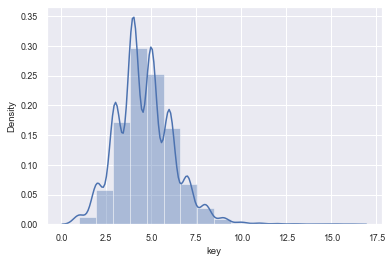

In [91]:
#Построим график 
sns.distplot(data_arc['key'].value_counts(), bins=16)
mode = stats.mode(data_arc['key'].value_counts())
print('Mode is: ',mode[0][0])

Key - содержит номер партии
- Количество итераций обработки отличается для каждой партии от 1 до 16. Мода = 4

### Разберем, что такое активная и реактивная мощности:

- `Активная мощность (Real Power)`

    Единица измерения — ватт (русское обозначение: Вт, киловатт - кВт; международное: ватт -W, киловатт - kW).

    Среднее за период Τ  значение мгновенной мощности называется активной  мощностью, и

    выражается формулой:
    

$$ P =  {1 \over T} \int\limits_{0}^{T} p(t) dt $$



- `Реактивная мощность (Reactive Power)`

    Единица измерения — вольт-ампер реактивный (русское обозначение: вар, кВАР; международное: var).

    Реактивная мощность — величина, характеризующая нагрузки, создаваемые в электротехнических устройствах колебаниями энергии электромагнитного поля в цепи синусоидального переменного тока, равна произведению среднеквадратичных значений напряжения U и тока I, умноженному на синус угла сдвига фаз φ между ними:
    $$ Q = U * I * Sin\varphi $$
     (если ток отстаёт от напряжения, сдвиг фаз считается положительным, если опережает — отрицательным). Реактивная мощность связана с полной мощностью S и активной мощностью P  соотношением: 
     $$ | Q | = {\sqrt{S^2 - P^2}} $$
 
 
 
 
- `Полная мощность (Apparent Power)`

    Единица полной электрической мощности — вольт-ампер (русское обозначение: В·А, ВА, кВА-кило-вольт-ампер; международное: V·A, kVA).
    Полная мощность — величина, равная произведению действующих значений периодического электрического тока I в цепи и напряжения U на её зажимах:
    $$ S = U * I $$ 
    соотношение полной мощности с активной и реактивной мощностями выражается в следующем виде:
    $$  S  = {\sqrt{P^2 + Q^2}} $$
    где P — активная мощность, Q — реактивная мощность (при индуктивной нагрузке Q›0, а при ёмкостной Q‹0). Векторная зависимость между полной, активной и реактивной мощностью выражается формулой: 
    
    $$ \overrightarrow S = \overrightarrow P + \overrightarrow Q $$
    
    Полная мощность имеет практическое значение, как величина, описывающая нагрузки, фактически налагаемые потребителем на элементы подводящей электросети (провода, кабели, распределительные щиты, трансформаторы, линии электропередачи), так как эти нагрузки зависят от потребляемого тока, а не от фактически использованной потребителем энергии. Именно поэтому полная мощность трансформаторов и распределительных щитов измеряется в вольт-амперах, а не в ваттах.


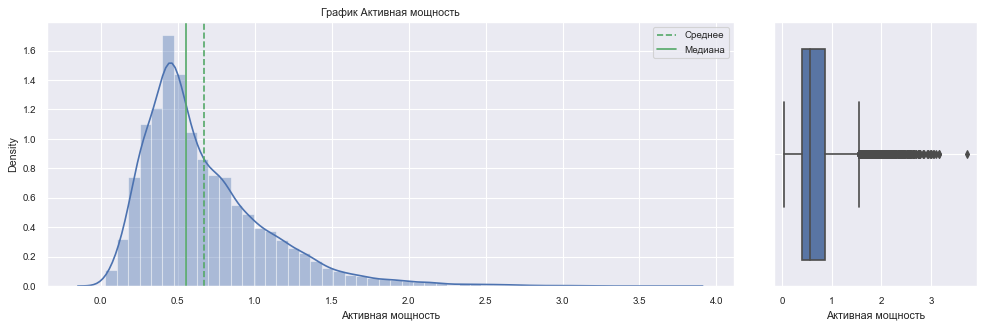

In [92]:
#Посмотрим на распределение активной мощности
ds.sns_draw(data_arc,'Активная мощность')

- распределение напоминает нормальное со сдвигом влево

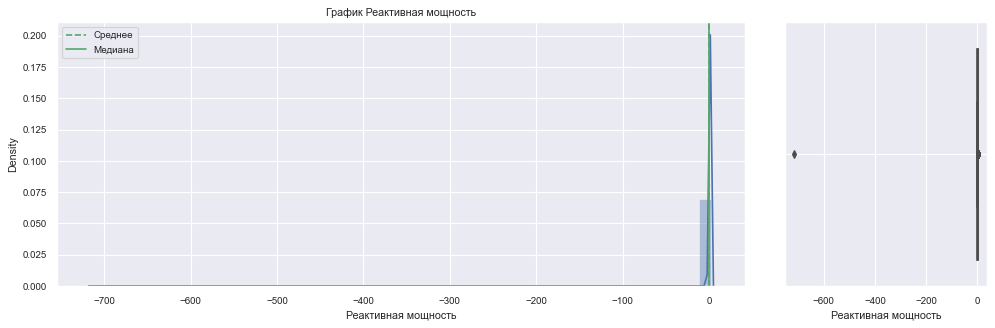

In [93]:
#Посмотрим на распределение реактивной мощности
ds.sns_draw(data_arc, 'Реактивная мощность')

- Видим аномальное значение реактивной мощности. Попробуем избавиться от него и посмотрим на результат

In [94]:
#Избавимся от выбросов меньше нуля
data_arc = data_arc[data_arc['Реактивная мощность'] >= 0]

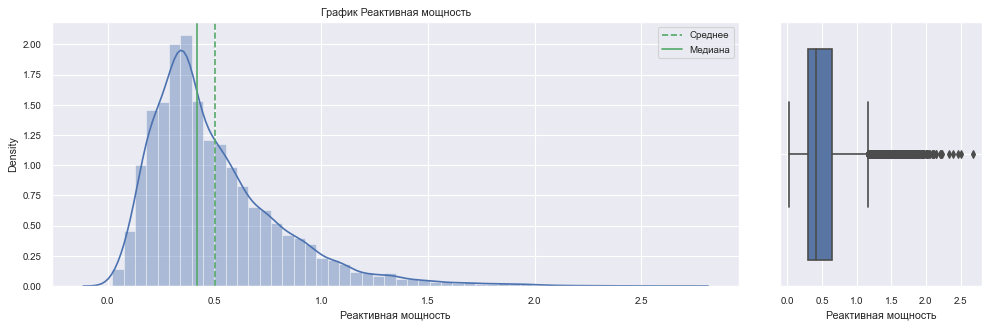

In [95]:
#Еще раз посмотрим на распределение реактивной мощности после удаления выбросов
ds.sns_draw(data_arc, 'Реактивная мощность')

Корреляция активной и реактивной мощности 0.9631819131519807


<Figure size 1440x720 with 0 Axes>

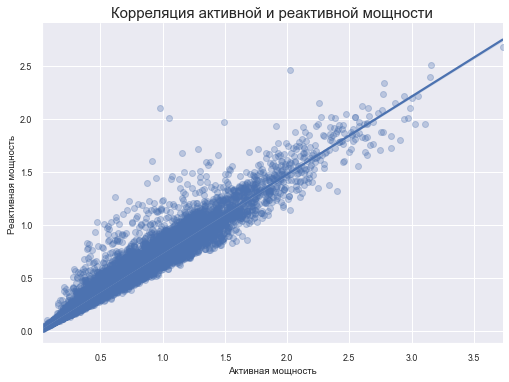

In [96]:
#Проверим корреляцию между активной и реактивной мощностями
print('Корреляция активной и реактивной мощности', data_arc['Активная мощность'].corr(data_arc['Реактивная мощность']))
plt.figure(figsize=(20,10))
sns.lmplot(x='Активная мощность', y='Реактивная мощность',data=data_arc, scatter_kws={'alpha':0.3}, aspect=14/10)
plt.title('Корреляция активной и реактивной мощности', fontsize=15)
plt.show();

Реактивная и активная мощности очень сильно коррелируют между собой. Возможна переобучаемость модели в дальнейшем. 

Имея данные по активной и реактивной мощности можем ввести новый признак "Полная мощность" по следующей формуле:

$$ S=\sqrt{P^2+Q^2} $$
где: $P$ — активная мощность, $Q$ — реактивная мощность

In [97]:
#Напишем функцию по расчету Полной мощности
def full_power(row):
    full_power = math.sqrt(row['Активная мощность']**2 + row['Реактивная мощность']**2)
    return full_power

In [98]:
data_arc['Полная мощность'] = data_arc.apply(full_power, axis=1)

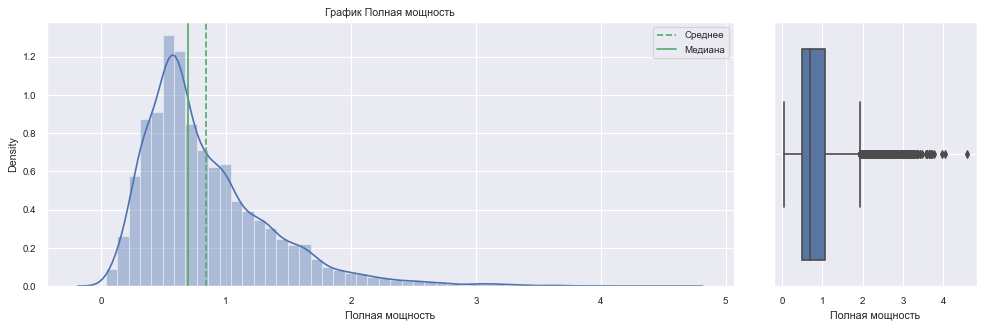

In [99]:
#Посмотрим на распределение Полной мощности
ds.sns_draw(data_arc, 'Полная мощность')

In [100]:
data_arc.head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Полная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,1.193639
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0.959010
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0.896038
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,1.970470
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0.807239


### Вывод:

- Изучили датасет data_arc
- Проверили на дубликаты и пустые значения. Их у нас не оказалось.
- Изменили типы данных на datetime в столбца `начало нагрева дугой` и `конец нагрева дугой`
- Избавились от аномальных значений `-715` в Реактивной мощности. 
- Разобрались, что такое активная и реактивная мощности. Так же из-за сильной корреляции между активной и реактивной мощностями, добавили новый признак `полная мощность`. 

### `Data_Bulk Dataset` : Данные о подаче сыпучих материалов (объём);


In [101]:
ds.dataset_info(data_bulk)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Количество дубликатов: 0


In [102]:
#количество уникальных значений Key
len(data_bulk['key'].unique())

3129

- Типы данных указаны верно. Дубликаты отсутствуют.
- Видим большое количество пропущенных значений в датасете из-за того что для каждой партии добавляют опредленное сочетание сыпучих материалов.

### `Data_Bulk_time` - Данные о подаче сыпучих материалов (время);

In [103]:
ds.dataset_info(data_bulk_time)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56
5,6,NaN,NaN,NaN,2019-05-03 13:59:24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:53:27,NaN,2019-05-03 13:53:27,2019-05-03 13:53:27
6,7,NaN,NaN,NaN,2019-05-03 14:29:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:22:19,NaN,2019-05-03 14:22:19,2019-05-03 14:22:19
7,8,NaN,NaN,NaN,2019-05-03 15:04:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:55:46,NaN,2019-05-03 14:55:46,2019-05-03 14:55:46
8,9,NaN,NaN,NaN,2019-05-03 15:47:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 15:41:00,NaN,2019-05-03 15:41:00,2019-05-03 15:41:00
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:18:52,NaN,2019-05-03 16:18:52,2019-05-03 16:18:52


,key
count,3129.000000
mean,1624.383509
std,933.337642
min,1.000000
25%,816.000000
50%,1622.000000
75%,2431.000000
max,3241.000000


Количество дубликатов: 0


**Вывод:**

- Наблюдаем большое количество пропущенных значений в датасете
- Дубликатов не имеем, Имеются типы данных, которые нужно исправить
- В построении нашей будущей модели данный датасет использовать не будем, поэтому нет необходимости проводить его предобработку

### `Data_gas` - данные о продувке сплава газом;


In [104]:
ds.dataset_info(data_gas)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


Количество дубликатов: 0


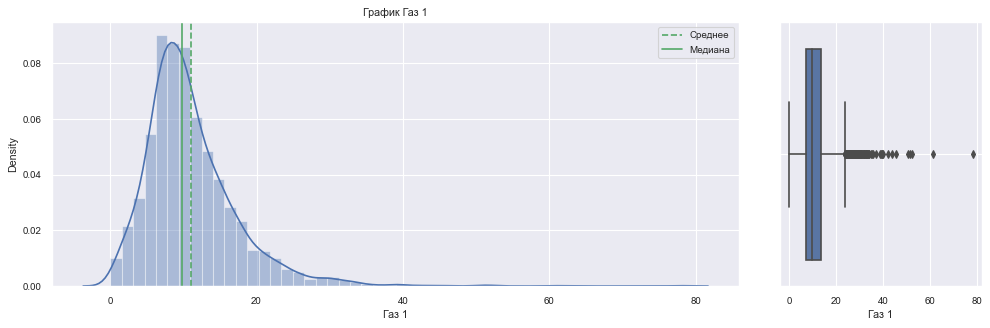

In [105]:
ds.sns_draw(data_gas, 'Газ 1')

In [106]:
#количество уникальных значений Key
len(data_gas['key'].unique())

3239

**Вывод:**
- Исходя из полученных данных можно сказать, что распределение нормальное.
- Дубликатов не имеем, типы данных указаны верно.
- Незаполненныз значений не имеем

### `Data_temp` - Результаты измерения температуры;


In [107]:
ds.dataset_info(data_temp)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   Время замера  15907 non-null  object 
 2   Температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


,key,Температура
count,15907.000000,13006.000000
mean,1607.880870,1591.840920
std,942.212073,21.375851
min,1.000000,1191.000000
25%,790.000000,1581.000000
50%,1618.000000,1591.000000
75%,2427.000000,1601.000000
max,3241.000000,1705.000000


Количество дубликатов: 0


In [108]:
#Изменим тип данных у время замера
data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'])

In [109]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           15907 non-null  int64         
 1   Время замера  15907 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


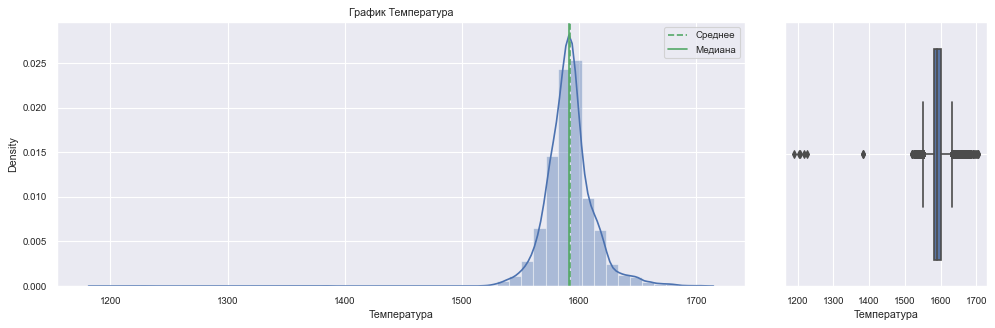

In [110]:
#Посмотрим на распределение температуры
data_temp = data_temp.dropna(subset=['Температура'])
ds.sns_draw(data_temp, 'Температура')

In [111]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13006 entries, 0 to 15902
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           13006 non-null  int64         
 1   Время замера  13006 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 406.4 KB


In [112]:
#посмотрим на пропуски Температура
data_temp[data_temp['Температура'].isnull()].head(10)

,key,Время замера,Температура


In [113]:
data_temp[data_temp['Температура'].isnull()].tail()

,key,Время замера,Температура


**Вывод:**
- В датасете отсутствуют некоторые данные по температурам, мы их удалим для дальнейшей работы.
- Распределение выглядит нормальным, но имеются аномальные выбросы
- Исправили тип данных у Время замера на datetime
- Дубликатов не имеется

### `Data_Wire`  -  данные о проволочных материалах (объём);


In [114]:
ds.dataset_info(data_wire)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442842,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060484,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


Количество дубликатов: 0


- Дубликатов не имеем 
- Имеются пустые значения в датасете, скорее всего они пустые потому что различные виды проволочных материалов поступали в разных пропорциях в разные промежутки времени.
- Типы данных указаны верно

### `Data_Wire_time` - данные о проволочных материалах (время).

In [115]:
ds.dataset_info(data_wire_time)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2019-05-03 13:59:02,2019-05-03 13:59:54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,2019-05-03 14:28:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,2019-05-03 15:03:42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2019-05-03 15:42:43,2019-05-03 15:58:12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,2019-05-03 16:20:25,2019-05-03 16:21:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


Количество дубликатов: 0


- Дубликатов не имеется
- Имеются пустые значения
- Типы данных в Wire 1 указаны неверно, но менять не будет так как данный датасет использовать в дальнейшем не будем.

### Вывод по Исследовательскому Анализу Данных

- Загрузили данные, изучили.
- Избавились от некоторых аномальных значений.
- Изменили типы данных, в некоторых датасетах были неправильно указаны данные типа Datetime
- Проверили данные на пропуски и дубликаты.
- В датасете data_arc ввели сразу новый признак "Полная мощность"
- В таргете отсутствуют данные начиная с 2500й партии, поэтому в дальнейшем нужно будет провести срез данных начиная с 2500 партии.


### Предобработка данных

In [116]:
#Создадим новый признак "Общее время нагрева дугой", переведем в секунды
data_arc['Общее время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc['Общее время нагрева дугой'] = data_arc['Общее время нагрева дугой'].dt.seconds

In [117]:
# Поcле 2500 партии значения температуры есть только для первого измерения. 
# Поэтому будем использовать только партии до 2500 номера.
data_temp = data_temp.query('key < 2500')
data_arc = data_arc.query('key < 2500')
data_bulk = data_bulk.query('key < 2500')
data_wire = data_wire.query('key < 2500')

In [118]:
# определим количество итераций нагрева
data_arc_c = data_arc.groupby(by = 'key', as_index = False).count()[['key', 'Начало нагрева дугой']]
data_arc_c.columns = ['key', 'Количество итераций нагрева']
data_arc_c.head()

,key,Количество итераций нагрева
0,1,5
1,2,4
2,3,5
3,4,4
4,5,4


In [119]:
# сгруппируем данные по партиям
data_arc = data_arc.groupby(by = 'key', as_index = False).sum()

# добавим информацию о количестве итераций нагрева по ключу key
data_arc = data_arc.merge(data_arc_c, how = 'left', on = 'key')
data_arc.head()

,key,Активная мощность,Реактивная мощность,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,4.878147,3.183241,5.826395,1098,5
1,2,3.052598,1.998112,3.649216,811,4
2,3,2.525882,1.599076,2.989534,655,5
3,4,3.209250,2.060298,3.814962,741,4
4,5,3.347173,2.252643,4.035758,869,4


Так как признаки активная и реактивная мощность сильно коррелируют между собой будем использовать признак только полная мощность.


In [120]:
data_arc = data_arc[['key', 'Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']]

In [121]:
data_arc.head(5)

,key,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,5.826395,1098,5
1,2,3.649216,811,4
2,3,2.989534,655,5
3,4,3.814962,741,4
4,5,4.035758,869,4


<Figure size 1080x720 with 0 Axes>

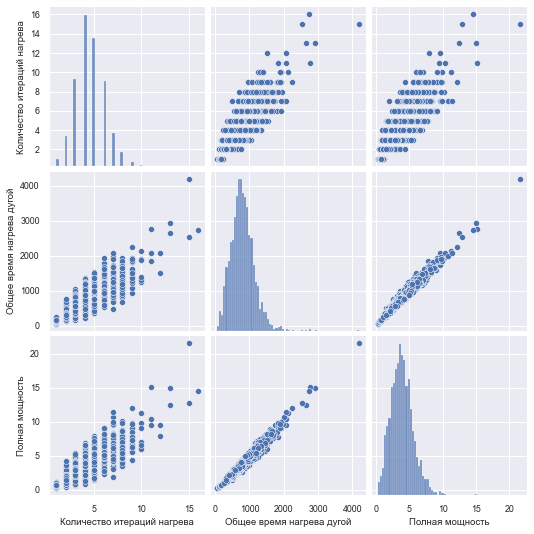

In [122]:
#Посмотрим на корреляцию имеющихся признаков
plt.figure(figsize=(15,10))
sns.set(font_scale=0.8)
sns.pairplot(data_arc[['Количество итераций нагрева', 'Общее время нагрева дугой', 'Полная мощность']], 
             kind="scatter")
plt.show();

In [123]:
data_arc[['Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']].corr()

,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
Полная мощность,1.000000,0.982899,0.760402
Общее время нагрева дугой,0.982899,1.000000,0.795958
Количество итераций нагрева,0.760402,0.795958,1.000000


Сильная корреляция между полной мощностью и общим временем нагрева дугой. Попробуем избавиться от времени нагрева дугой для нашей будущей модели

In [124]:
#Уберем из датасета столбец "Общее время нагрева дугой"
data_arc = data_arc[['key', 'Полная мощность', 'Количество итераций нагрева']]
data_arc.head(5)

,key,Полная мощность,Количество итераций нагрева
0,1,5.826395,5
1,2,3.649216,4
2,3,2.989534,5
3,4,3.814962,4
4,5,4.035758,4


In [125]:
#Очистим пропуски в данных в таблице data_temp
data_temp = data_temp.dropna(subset=['Температура']).reset_index(drop=True)
data_temp = data_temp.sort_values(by=['Время замера'])
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12267 entries, 0 to 12266
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           12267 non-null  int64         
 1   Время замера  12267 non-null  datetime64[ns]
 2   Температура   12267 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 383.3 KB


In [126]:
#Удалим информацию о партиях по которым известно только одно измерение температуры.
count = data_temp.groupby(by = 'key', as_index = False).count()
one = count[count['Время замера'] == 1]['key'].tolist()
data_temp = data_temp.query('key not in @one')
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12265 entries, 0 to 12266
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           12265 non-null  int64         
 1   Время замера  12265 non-null  datetime64[ns]
 2   Температура   12265 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 383.3 KB


In [127]:
#Сгруппируем данные по партии по первым и последним значениям, последние значения необходимо будет предсказывать.
data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'Время замера 1', 'Время замера 2', 'Температура 1', 'Температура 2']
data_temp = data_temp[['key', 'Температура 1', 'Температура 2']]

In [128]:
data_temp.head(5)

,key,Температура 1,Температура 2
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
4,5,1576.0,1602.0


#### Объединим данные в одну таблицу

In [129]:
# объединим обработанные датасеты по ключу key
data = (data_temp.merge(data_arc, how = 'left', on = 'key')
                 .merge(data_wire, how = 'left', on = 'key')
                 .merge(data_bulk, how = 'left', on = 'key')
                 .merge(data_gas, how = 'left', on = 'key')
       )


# заполним пропуски образовавшиеся после объединения таблиц нулями
data = data.fillna(0)

# переименуем столбцы для корректной работы lgbm
data = data.rename(columns={'Температура 1': 'First_temp',
                            'Температура 2': 'Last_temp',
                            'Полная мощность': 'Full_power',
                            'Количество итераций нагрева':'Heating_iterations',
                            'Газ 1': 'Gas'})

# уберем колонку-индентификатор key, которую мы использовали
# для объединения датасетов
data = data.drop(['key'], axis = 1)
data.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
0,1571.0,1613.0,5.826395,5,60.059998,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986
1,1581.0,1602.0,3.649216,4,96.052315,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561
2,1596.0,1599.0,2.989534,5,91.160157,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793
3,1601.0,1625.0,3.814962,4,89.063515,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219
4,1576.0,1602.0,4.035758,4,89.238236,9.11456,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692


In [130]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2475 entries, 0 to 2474
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   First_temp          2475 non-null   float64
 1   Last_temp           2475 non-null   float64
 2   Full_power          2475 non-null   float64
 3   Heating_iterations  2475 non-null   int64  
 4   Wire 1              2475 non-null   float64
 5   Wire 2              2475 non-null   float64
 6   Wire 3              2475 non-null   float64
 7   Wire 4              2475 non-null   float64
 8   Wire 5              2475 non-null   float64
 9   Wire 6              2475 non-null   float64
 10  Wire 7              2475 non-null   float64
 11  Wire 8              2475 non-null   float64
 12  Wire 9              2475 non-null   float64
 13  Bulk 1              2475 non-null   float64
 14  Bulk 2              2475 non-null   float64
 15  Bulk 3              2475 non-null   float64
 16  Bulk 4

После объединения таблиц мы получили набор признаков с целевым признаком. Разделим нашу выборку на тестовую и обучающие выборки


In [131]:
train, test = train_test_split(data, test_size = .30, random_state = 42)

In [132]:
train.columns

Index(['First_temp', 'Last_temp', 'Full_power', 'Heating_iterations', 'Wire 1',
       'Wire 2', 'Wire 3', 'Wire 4', 'Wire 5', 'Wire 6', 'Wire 7', 'Wire 8',
       'Wire 9', 'Bulk 1', 'Bulk 2', 'Bulk 3', 'Bulk 4', 'Bulk 5', 'Bulk 6',
       'Bulk 7', 'Bulk 8', 'Bulk 9', 'Bulk 10', 'Bulk 11', 'Bulk 12',
       'Bulk 13', 'Bulk 14', 'Bulk 15', 'Gas'],
      dtype='object')

В датасете имеются количественные признаки с разными разбросами, поэтому проведем масштабирование признаков

In [133]:
#Масштабируем количественные признаки
numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('Last_temp')]
scaler = MinMaxScaler()
scaler.fit(train[numeric])

# масштабируем обучающую выборку
train[numeric] = scaler.fit_transform(train[numeric])

# масштабируем тестовую выборку
test[numeric] = scaler.transform(test[numeric])

In [134]:
print('Размер обучающей выборки:', train.shape)
print('Размер тестовой выобрки:', test.shape)

Размер обучающей выборки: (1732, 29)
Размер тестовой выобрки: (743, 29)


In [135]:
test.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
873,0.770492,1591.0,0.214243,0.200000,0.305894,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.279070,0.0,0.443396,0.254321,0.254902
2037,0.838115,1591.0,0.091565,0.133333,0.224143,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.107344
952,0.799180,1587.0,0.095651,0.200000,0.257863,0.629906,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.135709
1615,0.807377,1586.0,0.087121,0.133333,0.233211,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.164954,0.0,0.204403,0.503704,0.047523
1712,0.909836,1597.0,0.053778,0.133333,0.311986,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.100595,0.0,0.218553,0.308642,0.160983


### Вывод по Предобработке данных

- Провели предобработку данных
- Избавились от выборосов и пустых значений
- Соединили таблицы в одну итоговую таблицу
- Разделили выборки на 30% тестовой выборки и 70% обучающей выборки
- Также провели масштабирование признаков
    
    

### Обучение моделей и подбор параметров

In [136]:
# Определим target и features для обучающей выборки
features_train = train.drop(['Last_temp'], axis = 1)
target_train = train['Last_temp']

# Определим target и features для тестовой выборки
features_test = test.drop(['Last_temp'], axis = 1)
target_test = test['Last_temp']

In [137]:
#Определим Модели какие будем использовать 

models = {
    'CatBoostRegressor': CatBoostRegressor(),
    'LGBMRegressor': lgb.LGBMRegressor(),
    'XGBRegressor': xgboost.XGBRegressor(),
    'LinearRegression': LinearRegression()
}


# Параметры для каждой модели, которые будем подбирать
params = {
    'CatBoostRegressor':{
          'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),  
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[SEED],
          'depth': np.arange(3, 7)
    },        

    'LinearRegression':{
            'fit_intercept' : [True, False],
            'normalize':[True,False]
    },
    
    
    'LGBMRegressor': {
        'boosting_type': ['gbdt', 'dart', 'goss', 'rf'],
        'objective': ['regression'],
        'learning_rate': [0.001, 0.01, 0.02, 0.03],
        'num_iterations':[500],
        'random_state': [SEED], 
        'max_depth': np.arange(2, 10),
        'metric': ['mae']
        },

    
    'XGBRegressor': {
        'min_child_weight': [10,20,30],
        'gamma': [5],
        'subsample': [1.0],
        'colsample_bytree': [1.0],
        'max_depth': [5,10,20],
        'eval_metric' :['mae']
        }
}

In [138]:
result_list = []
ds.fit(features_train, target_train)

0:	learn: 10.0432986	total: 713us	remaining: 213ms
1:	learn: 9.9872701	total: 1.48ms	remaining: 220ms
2:	learn: 9.9404951	total: 2.26ms	remaining: 224ms
3:	learn: 9.9119195	total: 3.1ms	remaining: 230ms
4:	learn: 9.8580434	total: 11.2ms	remaining: 660ms
5:	learn: 9.7673097	total: 12.2ms	remaining: 597ms
6:	learn: 9.7064981	total: 12.9ms	remaining: 541ms
7:	learn: 9.6208018	total: 14ms	remaining: 510ms
8:	learn: 9.5882929	total: 15.4ms	remaining: 498ms
9:	learn: 9.5287029	total: 16.7ms	remaining: 483ms
10:	learn: 9.4874631	total: 18.8ms	remaining: 495ms
11:	learn: 9.4451067	total: 20.8ms	remaining: 498ms
12:	learn: 9.3901317	total: 21.6ms	remaining: 476ms
13:	learn: 9.3639473	total: 22.2ms	remaining: 454ms
14:	learn: 9.3312144	total: 23.2ms	remaining: 441ms
15:	learn: 9.3067786	total: 24ms	remaining: 426ms
16:	learn: 9.2676863	total: 24.7ms	remaining: 410ms
17:	learn: 9.2312831	total: 25.3ms	remaining: 397ms
18:	learn: 9.1942174	total: 26.2ms	remaining: 388ms
19:	learn: 9.1204792	total:

188:	learn: 6.3116596	total: 143ms	remaining: 84ms
189:	learn: 6.2974466	total: 144ms	remaining: 83.3ms
190:	learn: 6.2936317	total: 145ms	remaining: 82.5ms
191:	learn: 6.2796052	total: 145ms	remaining: 81.8ms
192:	learn: 6.2717943	total: 146ms	remaining: 80.9ms
193:	learn: 6.2702330	total: 147ms	remaining: 80.2ms
194:	learn: 6.2673234	total: 147ms	remaining: 79.3ms
195:	learn: 6.2610073	total: 148ms	remaining: 78.6ms
196:	learn: 6.2578340	total: 149ms	remaining: 77.9ms
197:	learn: 6.2540512	total: 150ms	remaining: 77.2ms
198:	learn: 6.2520019	total: 150ms	remaining: 76.4ms
199:	learn: 6.2455150	total: 151ms	remaining: 75.5ms
200:	learn: 6.2433729	total: 152ms	remaining: 74.8ms
201:	learn: 6.2388844	total: 152ms	remaining: 74ms
202:	learn: 6.2365492	total: 153ms	remaining: 73.2ms
203:	learn: 6.2319207	total: 154ms	remaining: 72.5ms
204:	learn: 6.2240544	total: 155ms	remaining: 71.8ms
205:	learn: 6.2217585	total: 155ms	remaining: 70.9ms
206:	learn: 6.2175743	total: 156ms	remaining: 70.2

83:	learn: 7.8158455	total: 59.6ms	remaining: 153ms
84:	learn: 7.7996305	total: 60.6ms	remaining: 153ms
85:	learn: 7.7910834	total: 61.3ms	remaining: 152ms
86:	learn: 7.7669046	total: 62.1ms	remaining: 152ms
87:	learn: 7.7408996	total: 62.9ms	remaining: 152ms
88:	learn: 7.7318438	total: 63.6ms	remaining: 151ms
89:	learn: 7.6967155	total: 64.4ms	remaining: 150ms
90:	learn: 7.6605767	total: 65.2ms	remaining: 150ms
91:	learn: 7.6495805	total: 66ms	remaining: 149ms
92:	learn: 7.6391612	total: 66.7ms	remaining: 148ms
93:	learn: 7.6246191	total: 67.5ms	remaining: 148ms
94:	learn: 7.6174533	total: 68.2ms	remaining: 147ms
95:	learn: 7.5930992	total: 68.9ms	remaining: 146ms
96:	learn: 7.5823442	total: 69.8ms	remaining: 146ms
97:	learn: 7.5723652	total: 70.6ms	remaining: 146ms
98:	learn: 7.5352317	total: 71.4ms	remaining: 145ms
99:	learn: 7.5284358	total: 72ms	remaining: 144ms
100:	learn: 7.5146181	total: 72.5ms	remaining: 143ms
101:	learn: 7.5080379	total: 73.2ms	remaining: 142ms
102:	learn: 7.

30:	learn: 8.7434137	total: 22.5ms	remaining: 195ms
31:	learn: 8.6927753	total: 23.3ms	remaining: 195ms
32:	learn: 8.6555260	total: 24.1ms	remaining: 195ms
33:	learn: 8.6259092	total: 24.7ms	remaining: 193ms
34:	learn: 8.5991380	total: 25.3ms	remaining: 192ms
35:	learn: 8.5874832	total: 25.9ms	remaining: 190ms
36:	learn: 8.5393562	total: 26.5ms	remaining: 189ms
37:	learn: 8.5291764	total: 27.1ms	remaining: 187ms
38:	learn: 8.5065642	total: 27.8ms	remaining: 186ms
39:	learn: 8.4575382	total: 28.4ms	remaining: 184ms
40:	learn: 8.4327429	total: 29.1ms	remaining: 184ms
41:	learn: 8.4174287	total: 29.7ms	remaining: 182ms
42:	learn: 8.4045407	total: 30.3ms	remaining: 181ms
43:	learn: 8.3874359	total: 31.3ms	remaining: 182ms
44:	learn: 8.3656646	total: 32.2ms	remaining: 183ms
45:	learn: 8.3520779	total: 33ms	remaining: 182ms
46:	learn: 8.3405828	total: 33.6ms	remaining: 181ms
47:	learn: 8.3206415	total: 34.2ms	remaining: 180ms
48:	learn: 8.3066530	total: 35ms	remaining: 179ms
49:	learn: 8.293

291:	learn: 5.8066666	total: 207ms	remaining: 5.68ms
292:	learn: 5.8040888	total: 208ms	remaining: 4.97ms
293:	learn: 5.8013998	total: 209ms	remaining: 4.26ms
294:	learn: 5.7982169	total: 210ms	remaining: 3.55ms
295:	learn: 5.7897891	total: 210ms	remaining: 2.84ms
296:	learn: 5.7866998	total: 211ms	remaining: 2.13ms
297:	learn: 5.7838088	total: 212ms	remaining: 1.42ms
298:	learn: 5.7813614	total: 212ms	remaining: 709us
299:	learn: 5.7779972	total: 213ms	remaining: 0us
0:	learn: 10.1038446	total: 606us	remaining: 181ms
1:	learn: 10.0637868	total: 1.23ms	remaining: 183ms
2:	learn: 10.0335313	total: 1.87ms	remaining: 185ms
3:	learn: 9.9984986	total: 2.55ms	remaining: 189ms
4:	learn: 9.9455487	total: 3.26ms	remaining: 192ms
5:	learn: 9.9037024	total: 3.81ms	remaining: 187ms
6:	learn: 9.8688418	total: 4.42ms	remaining: 185ms
7:	learn: 9.8363702	total: 5.01ms	remaining: 183ms
8:	learn: 9.7661117	total: 5.7ms	remaining: 184ms
9:	learn: 9.6860498	total: 6.5ms	remaining: 189ms
10:	learn: 9.6322

227:	learn: 6.2594372	total: 167ms	remaining: 52.6ms
228:	learn: 6.2554847	total: 167ms	remaining: 51.9ms
229:	learn: 6.2511596	total: 168ms	remaining: 51.2ms
230:	learn: 6.2360794	total: 169ms	remaining: 50.5ms
231:	learn: 6.2302519	total: 170ms	remaining: 49.7ms
232:	learn: 6.2239338	total: 170ms	remaining: 49ms
233:	learn: 6.2178608	total: 171ms	remaining: 48.3ms
234:	learn: 6.2155039	total: 172ms	remaining: 47.6ms
235:	learn: 6.2036083	total: 173ms	remaining: 47ms
236:	learn: 6.2011296	total: 174ms	remaining: 46.3ms
237:	learn: 6.1959155	total: 175ms	remaining: 45.6ms
238:	learn: 6.1926368	total: 176ms	remaining: 45ms
239:	learn: 6.1868808	total: 177ms	remaining: 44.2ms
240:	learn: 6.1778431	total: 177ms	remaining: 43.4ms
241:	learn: 6.1643773	total: 179ms	remaining: 42.8ms
242:	learn: 6.1577505	total: 179ms	remaining: 42ms
243:	learn: 6.1480513	total: 180ms	remaining: 41.3ms
244:	learn: 6.1448163	total: 181ms	remaining: 40.6ms
245:	learn: 6.1339647	total: 182ms	remaining: 39.9ms
2

163:	learn: 6.7514740	total: 117ms	remaining: 97.2ms
164:	learn: 6.7478938	total: 118ms	remaining: 96.7ms
165:	learn: 6.7416013	total: 119ms	remaining: 95.9ms
166:	learn: 6.7204722	total: 120ms	remaining: 95.2ms
167:	learn: 6.7120034	total: 120ms	remaining: 94.4ms
168:	learn: 6.7075206	total: 121ms	remaining: 93.5ms
169:	learn: 6.7037062	total: 121ms	remaining: 92.7ms
170:	learn: 6.6995780	total: 122ms	remaining: 91.9ms
171:	learn: 6.6895114	total: 123ms	remaining: 91.3ms
172:	learn: 6.6868552	total: 124ms	remaining: 90.8ms
173:	learn: 6.6843585	total: 125ms	remaining: 90.3ms
174:	learn: 6.6815927	total: 125ms	remaining: 89.6ms
175:	learn: 6.6730276	total: 126ms	remaining: 88.8ms
176:	learn: 6.6577179	total: 127ms	remaining: 88.1ms
177:	learn: 6.6523593	total: 127ms	remaining: 87.3ms
178:	learn: 6.6311636	total: 128ms	remaining: 86.5ms
179:	learn: 6.6268336	total: 129ms	remaining: 85.7ms
180:	learn: 6.6102399	total: 129ms	remaining: 85ms
181:	learn: 6.6057190	total: 130ms	remaining: 84

110:	learn: 7.0321579	total: 77.6ms	remaining: 202ms
111:	learn: 7.0110083	total: 78.4ms	remaining: 201ms
112:	learn: 6.9965539	total: 79.1ms	remaining: 201ms
113:	learn: 6.9919939	total: 79.8ms	remaining: 200ms
114:	learn: 6.9579615	total: 80.4ms	remaining: 199ms
115:	learn: 6.9430304	total: 81.3ms	remaining: 199ms
116:	learn: 6.9392763	total: 81.9ms	remaining: 198ms
117:	learn: 6.9269382	total: 82.8ms	remaining: 198ms
118:	learn: 6.9135980	total: 83.6ms	remaining: 197ms
119:	learn: 6.9070565	total: 84.4ms	remaining: 197ms
120:	learn: 6.8953389	total: 85ms	remaining: 196ms
121:	learn: 6.8704372	total: 85.7ms	remaining: 195ms
122:	learn: 6.8604596	total: 86.3ms	remaining: 194ms
123:	learn: 6.8534727	total: 87.1ms	remaining: 194ms
124:	learn: 6.8479105	total: 87.9ms	remaining: 193ms
125:	learn: 6.8245869	total: 88.6ms	remaining: 193ms
126:	learn: 6.8213639	total: 89.3ms	remaining: 192ms
127:	learn: 6.8102323	total: 90.2ms	remaining: 192ms
128:	learn: 6.8029400	total: 91.2ms	remaining: 1

370:	learn: 5.6016897	total: 261ms	remaining: 20.4ms
371:	learn: 5.5968429	total: 262ms	remaining: 19.7ms
372:	learn: 5.5934816	total: 263ms	remaining: 19ms
373:	learn: 5.5882938	total: 263ms	remaining: 18.3ms
374:	learn: 5.5844442	total: 264ms	remaining: 17.6ms
375:	learn: 5.5819073	total: 265ms	remaining: 16.9ms
376:	learn: 5.5781629	total: 266ms	remaining: 16.2ms
377:	learn: 5.5768495	total: 266ms	remaining: 15.5ms
378:	learn: 5.5747687	total: 267ms	remaining: 14.8ms
379:	learn: 5.5731960	total: 267ms	remaining: 14.1ms
380:	learn: 5.5719273	total: 268ms	remaining: 13.4ms
381:	learn: 5.5687593	total: 269ms	remaining: 12.7ms
382:	learn: 5.5629547	total: 270ms	remaining: 12ms
383:	learn: 5.5606595	total: 270ms	remaining: 11.3ms
384:	learn: 5.5593730	total: 271ms	remaining: 10.6ms
385:	learn: 5.5571166	total: 272ms	remaining: 9.86ms
386:	learn: 5.5543807	total: 273ms	remaining: 9.15ms
387:	learn: 5.5518234	total: 274ms	remaining: 8.46ms
388:	learn: 5.5475589	total: 274ms	remaining: 7.76

227:	learn: 6.3993059	total: 154ms	remaining: 116ms
228:	learn: 6.3918621	total: 155ms	remaining: 116ms
229:	learn: 6.3891732	total: 156ms	remaining: 115ms
230:	learn: 6.3849591	total: 156ms	remaining: 114ms
231:	learn: 6.3763676	total: 157ms	remaining: 114ms
232:	learn: 6.3729887	total: 158ms	remaining: 113ms
233:	learn: 6.3656722	total: 158ms	remaining: 112ms
234:	learn: 6.3576009	total: 159ms	remaining: 112ms
235:	learn: 6.3542136	total: 160ms	remaining: 111ms
236:	learn: 6.3517293	total: 161ms	remaining: 110ms
237:	learn: 6.3479150	total: 161ms	remaining: 110ms
238:	learn: 6.3432652	total: 162ms	remaining: 109ms
239:	learn: 6.3367300	total: 163ms	remaining: 109ms
240:	learn: 6.3331477	total: 164ms	remaining: 108ms
241:	learn: 6.3290740	total: 164ms	remaining: 107ms
242:	learn: 6.3240499	total: 165ms	remaining: 107ms
243:	learn: 6.3209098	total: 166ms	remaining: 106ms
244:	learn: 6.3175335	total: 166ms	remaining: 105ms
245:	learn: 6.3126717	total: 167ms	remaining: 104ms
246:	learn: 

84:	learn: 7.5123592	total: 54.7ms	remaining: 203ms
85:	learn: 7.5020303	total: 55.5ms	remaining: 203ms
86:	learn: 7.4911666	total: 56.2ms	remaining: 202ms
87:	learn: 7.4802216	total: 56.8ms	remaining: 201ms
88:	learn: 7.4756229	total: 57.7ms	remaining: 202ms
89:	learn: 7.4517538	total: 58.4ms	remaining: 201ms
90:	learn: 7.4346301	total: 59ms	remaining: 200ms
91:	learn: 7.4264348	total: 59.7ms	remaining: 200ms
92:	learn: 7.4119653	total: 60.9ms	remaining: 201ms
93:	learn: 7.3990744	total: 61.9ms	remaining: 201ms
94:	learn: 7.3962426	total: 62.7ms	remaining: 201ms
95:	learn: 7.3912107	total: 63.4ms	remaining: 201ms
96:	learn: 7.3740289	total: 64.2ms	remaining: 200ms
97:	learn: 7.3568849	total: 64.8ms	remaining: 200ms
98:	learn: 7.3360593	total: 65.5ms	remaining: 199ms
99:	learn: 7.3235102	total: 66.3ms	remaining: 199ms
100:	learn: 7.3167550	total: 67ms	remaining: 198ms
101:	learn: 7.3030932	total: 67.6ms	remaining: 198ms
102:	learn: 7.2687390	total: 68.3ms	remaining: 197ms
103:	learn: 7

356:	learn: 5.6092678	total: 240ms	remaining: 28.9ms
357:	learn: 5.6068860	total: 241ms	remaining: 28.3ms
358:	learn: 5.6028492	total: 242ms	remaining: 27.6ms
359:	learn: 5.6019105	total: 242ms	remaining: 26.9ms
360:	learn: 5.6003530	total: 243ms	remaining: 26.3ms
361:	learn: 5.5975134	total: 244ms	remaining: 25.6ms
362:	learn: 5.5923490	total: 245ms	remaining: 24.9ms
363:	learn: 5.5895668	total: 245ms	remaining: 24.3ms
364:	learn: 5.5878727	total: 246ms	remaining: 23.6ms
365:	learn: 5.5862852	total: 247ms	remaining: 22.9ms
366:	learn: 5.5845046	total: 247ms	remaining: 22.3ms
367:	learn: 5.5818426	total: 248ms	remaining: 21.6ms
368:	learn: 5.5789232	total: 249ms	remaining: 20.9ms
369:	learn: 5.5757776	total: 250ms	remaining: 20.2ms
370:	learn: 5.5732019	total: 250ms	remaining: 19.6ms
371:	learn: 5.5704901	total: 251ms	remaining: 18.9ms
372:	learn: 5.5679971	total: 252ms	remaining: 18.3ms
373:	learn: 5.5651147	total: 253ms	remaining: 17.6ms
374:	learn: 5.5631128	total: 254ms	remaining: 

207:	learn: 6.3544984	total: 145ms	remaining: 134ms
208:	learn: 6.3515312	total: 147ms	remaining: 134ms
209:	learn: 6.3413278	total: 147ms	remaining: 133ms
210:	learn: 6.3380976	total: 148ms	remaining: 133ms
211:	learn: 6.3348824	total: 149ms	remaining: 132ms
212:	learn: 6.3314581	total: 150ms	remaining: 131ms
213:	learn: 6.3272674	total: 150ms	remaining: 131ms
214:	learn: 6.3145041	total: 151ms	remaining: 130ms
215:	learn: 6.3083116	total: 151ms	remaining: 129ms
216:	learn: 6.3040408	total: 153ms	remaining: 129ms
217:	learn: 6.2952167	total: 154ms	remaining: 128ms
218:	learn: 6.2920694	total: 154ms	remaining: 128ms
219:	learn: 6.2878332	total: 155ms	remaining: 127ms
220:	learn: 6.2847015	total: 156ms	remaining: 126ms
221:	learn: 6.2824587	total: 157ms	remaining: 126ms
222:	learn: 6.2798041	total: 157ms	remaining: 125ms
223:	learn: 6.2708970	total: 158ms	remaining: 124ms
224:	learn: 6.2675361	total: 158ms	remaining: 123ms
225:	learn: 6.2645460	total: 159ms	remaining: 123ms
226:	learn: 

63:	learn: 8.1134499	total: 41.6ms	remaining: 219ms
64:	learn: 8.0921055	total: 42.5ms	remaining: 219ms
65:	learn: 8.0717259	total: 43.3ms	remaining: 219ms
66:	learn: 8.0608607	total: 44.1ms	remaining: 219ms
67:	learn: 8.0461095	total: 44.9ms	remaining: 219ms
68:	learn: 8.0396326	total: 45.6ms	remaining: 219ms
69:	learn: 8.0197932	total: 46.4ms	remaining: 219ms
70:	learn: 7.9742868	total: 47.3ms	remaining: 219ms
71:	learn: 7.9667415	total: 48.1ms	remaining: 219ms
72:	learn: 7.9597932	total: 48.7ms	remaining: 218ms
73:	learn: 7.9313611	total: 49.4ms	remaining: 218ms
74:	learn: 7.9229915	total: 50ms	remaining: 217ms
75:	learn: 7.9115483	total: 50.6ms	remaining: 216ms
76:	learn: 7.9015230	total: 51.3ms	remaining: 215ms
77:	learn: 7.8958140	total: 52ms	remaining: 214ms
78:	learn: 7.8863500	total: 52.7ms	remaining: 214ms
79:	learn: 7.8729921	total: 53.4ms	remaining: 214ms
80:	learn: 7.8534734	total: 54ms	remaining: 213ms
81:	learn: 7.8462167	total: 54.6ms	remaining: 212ms
82:	learn: 7.83047

327:	learn: 5.7728038	total: 228ms	remaining: 49.9ms
328:	learn: 5.7707033	total: 229ms	remaining: 49.4ms
329:	learn: 5.7665194	total: 230ms	remaining: 48.8ms
330:	learn: 5.7647085	total: 231ms	remaining: 48.1ms
331:	learn: 5.7615999	total: 231ms	remaining: 47.4ms
332:	learn: 5.7594920	total: 232ms	remaining: 46.7ms
333:	learn: 5.7578176	total: 233ms	remaining: 46ms
334:	learn: 5.7535320	total: 233ms	remaining: 45.3ms
335:	learn: 5.7520799	total: 234ms	remaining: 44.6ms
336:	learn: 5.7492210	total: 235ms	remaining: 43.9ms
337:	learn: 5.7426225	total: 236ms	remaining: 43.2ms
338:	learn: 5.7404693	total: 236ms	remaining: 42.5ms
339:	learn: 5.7373409	total: 237ms	remaining: 41.8ms
340:	learn: 5.7327267	total: 237ms	remaining: 41.1ms
341:	learn: 5.7306006	total: 238ms	remaining: 40.4ms
342:	learn: 5.7267567	total: 239ms	remaining: 39.7ms
343:	learn: 5.7246507	total: 239ms	remaining: 39ms
344:	learn: 5.7210132	total: 240ms	remaining: 38.3ms
345:	learn: 5.7145974	total: 241ms	remaining: 37.6

174:	learn: 6.3939107	total: 122ms	remaining: 226ms
175:	learn: 6.3903668	total: 122ms	remaining: 225ms
176:	learn: 6.3864513	total: 123ms	remaining: 225ms
177:	learn: 6.3745323	total: 124ms	remaining: 224ms
178:	learn: 6.3708452	total: 124ms	remaining: 223ms
179:	learn: 6.3679671	total: 125ms	remaining: 222ms
180:	learn: 6.3650744	total: 126ms	remaining: 221ms
181:	learn: 6.3597215	total: 126ms	remaining: 221ms
182:	learn: 6.3547053	total: 127ms	remaining: 220ms
183:	learn: 6.3509769	total: 128ms	remaining: 219ms
184:	learn: 6.3491646	total: 128ms	remaining: 219ms
185:	learn: 6.3404434	total: 129ms	remaining: 218ms
186:	learn: 6.3262370	total: 130ms	remaining: 217ms
187:	learn: 6.3248918	total: 131ms	remaining: 217ms
188:	learn: 6.3116596	total: 131ms	remaining: 216ms
189:	learn: 6.2974466	total: 132ms	remaining: 215ms
190:	learn: 6.2936317	total: 132ms	remaining: 214ms
191:	learn: 6.2796052	total: 133ms	remaining: 213ms
192:	learn: 6.2717943	total: 134ms	remaining: 212ms
193:	learn: 

437:	learn: 5.4435016	total: 306ms	remaining: 43.3ms
438:	learn: 5.4402882	total: 307ms	remaining: 42.6ms
439:	learn: 5.4370040	total: 307ms	remaining: 41.9ms
440:	learn: 5.4350858	total: 308ms	remaining: 41.2ms
441:	learn: 5.4337700	total: 309ms	remaining: 40.5ms
442:	learn: 5.4329732	total: 310ms	remaining: 39.8ms
443:	learn: 5.4306983	total: 310ms	remaining: 39.1ms
444:	learn: 5.4295164	total: 311ms	remaining: 38.4ms
445:	learn: 5.4283017	total: 312ms	remaining: 37.8ms
446:	learn: 5.4269389	total: 313ms	remaining: 37.1ms
447:	learn: 5.4261318	total: 314ms	remaining: 36.4ms
448:	learn: 5.4243268	total: 314ms	remaining: 35.7ms
449:	learn: 5.4234848	total: 315ms	remaining: 35ms
450:	learn: 5.4192135	total: 316ms	remaining: 34.3ms
451:	learn: 5.4175591	total: 316ms	remaining: 33.6ms
452:	learn: 5.4164839	total: 317ms	remaining: 32.9ms
453:	learn: 5.4123389	total: 318ms	remaining: 32.2ms
454:	learn: 5.4118042	total: 318ms	remaining: 31.5ms
455:	learn: 5.4105737	total: 319ms	remaining: 30

183:	learn: 6.6603839	total: 129ms	remaining: 222ms
184:	learn: 6.6581959	total: 130ms	remaining: 221ms
185:	learn: 6.6530580	total: 131ms	remaining: 221ms
186:	learn: 6.6506197	total: 132ms	remaining: 220ms
187:	learn: 6.6471344	total: 132ms	remaining: 220ms
188:	learn: 6.6427831	total: 133ms	remaining: 219ms
189:	learn: 6.6314074	total: 134ms	remaining: 219ms
190:	learn: 6.6282631	total: 135ms	remaining: 218ms
191:	learn: 6.6105824	total: 135ms	remaining: 217ms
192:	learn: 6.6036135	total: 136ms	remaining: 216ms
193:	learn: 6.5997751	total: 137ms	remaining: 216ms
194:	learn: 6.5872943	total: 137ms	remaining: 215ms
195:	learn: 6.5840962	total: 138ms	remaining: 214ms
196:	learn: 6.5808376	total: 139ms	remaining: 214ms
197:	learn: 6.5748143	total: 140ms	remaining: 213ms
198:	learn: 6.5714345	total: 140ms	remaining: 212ms
199:	learn: 6.5694458	total: 141ms	remaining: 211ms
200:	learn: 6.5497080	total: 141ms	remaining: 210ms
201:	learn: 6.5482284	total: 142ms	remaining: 210ms
202:	learn: 

415:	learn: 5.7011005	total: 298ms	remaining: 60.1ms
416:	learn: 5.6972789	total: 299ms	remaining: 59.4ms
417:	learn: 5.6952871	total: 299ms	remaining: 58.7ms
418:	learn: 5.6925757	total: 300ms	remaining: 58ms
419:	learn: 5.6901792	total: 301ms	remaining: 57.3ms
420:	learn: 5.6866842	total: 301ms	remaining: 56.6ms
421:	learn: 5.6849129	total: 302ms	remaining: 55.9ms
422:	learn: 5.6842026	total: 303ms	remaining: 55.1ms
423:	learn: 5.6812509	total: 303ms	remaining: 54.4ms
424:	learn: 5.6797642	total: 304ms	remaining: 53.7ms
425:	learn: 5.6769299	total: 305ms	remaining: 53ms
426:	learn: 5.6754133	total: 306ms	remaining: 52.3ms
427:	learn: 5.6729765	total: 307ms	remaining: 51.6ms
428:	learn: 5.6715150	total: 307ms	remaining: 50.9ms
429:	learn: 5.6699880	total: 308ms	remaining: 50.1ms
430:	learn: 5.6689927	total: 309ms	remaining: 49.5ms
431:	learn: 5.6679209	total: 310ms	remaining: 48.7ms
432:	learn: 5.6645775	total: 310ms	remaining: 48ms
433:	learn: 5.6623488	total: 311ms	remaining: 47.3ms

162:	learn: 6.5729371	total: 113ms	remaining: 234ms
163:	learn: 6.5661281	total: 114ms	remaining: 234ms
164:	learn: 6.5510720	total: 115ms	remaining: 233ms
165:	learn: 6.5290813	total: 116ms	remaining: 233ms
166:	learn: 6.5152334	total: 116ms	remaining: 232ms
167:	learn: 6.5105905	total: 117ms	remaining: 231ms
168:	learn: 6.4952126	total: 118ms	remaining: 230ms
169:	learn: 6.4909726	total: 118ms	remaining: 229ms
170:	learn: 6.4775265	total: 119ms	remaining: 229ms
171:	learn: 6.4671583	total: 119ms	remaining: 228ms
172:	learn: 6.4625700	total: 120ms	remaining: 227ms
173:	learn: 6.4454423	total: 121ms	remaining: 226ms
174:	learn: 6.4420010	total: 121ms	remaining: 225ms
175:	learn: 6.4330176	total: 122ms	remaining: 224ms
176:	learn: 6.4274122	total: 122ms	remaining: 223ms
177:	learn: 6.4128598	total: 123ms	remaining: 222ms
178:	learn: 6.4078049	total: 124ms	remaining: 222ms
179:	learn: 6.3950367	total: 124ms	remaining: 221ms
180:	learn: 6.3846378	total: 125ms	remaining: 220ms
181:	learn: 

428:	learn: 5.4563701	total: 299ms	remaining: 49.4ms
429:	learn: 5.4553461	total: 299ms	remaining: 48.7ms
430:	learn: 5.4532832	total: 300ms	remaining: 48ms
431:	learn: 5.4498272	total: 301ms	remaining: 47.4ms
432:	learn: 5.4471125	total: 302ms	remaining: 46.7ms
433:	learn: 5.4448358	total: 302ms	remaining: 46ms
434:	learn: 5.4440805	total: 303ms	remaining: 45.3ms
435:	learn: 5.4432526	total: 304ms	remaining: 44.6ms
436:	learn: 5.4416673	total: 304ms	remaining: 43.9ms
437:	learn: 5.4402000	total: 305ms	remaining: 43.2ms
438:	learn: 5.4378746	total: 306ms	remaining: 42.5ms
439:	learn: 5.4353016	total: 307ms	remaining: 41.8ms
440:	learn: 5.4338509	total: 308ms	remaining: 41.2ms
441:	learn: 5.4319525	total: 308ms	remaining: 40.5ms
442:	learn: 5.4304885	total: 309ms	remaining: 39.8ms
443:	learn: 5.4287404	total: 310ms	remaining: 39.1ms
444:	learn: 5.4264081	total: 311ms	remaining: 38.4ms
445:	learn: 5.4254095	total: 311ms	remaining: 37.7ms
446:	learn: 5.4241025	total: 312ms	remaining: 37ms

174:	learn: 6.5722784	total: 123ms	remaining: 228ms
175:	learn: 6.5670099	total: 123ms	remaining: 227ms
176:	learn: 6.5615122	total: 124ms	remaining: 227ms
177:	learn: 6.5590446	total: 125ms	remaining: 226ms
178:	learn: 6.5558837	total: 126ms	remaining: 226ms
179:	learn: 6.5450524	total: 127ms	remaining: 225ms
180:	learn: 6.5384083	total: 127ms	remaining: 224ms
181:	learn: 6.5333527	total: 128ms	remaining: 224ms
182:	learn: 6.5205020	total: 129ms	remaining: 223ms
183:	learn: 6.5089480	total: 130ms	remaining: 223ms
184:	learn: 6.5062933	total: 130ms	remaining: 222ms
185:	learn: 6.5004939	total: 131ms	remaining: 221ms
186:	learn: 6.4988140	total: 132ms	remaining: 221ms
187:	learn: 6.4968874	total: 132ms	remaining: 220ms
188:	learn: 6.4898344	total: 133ms	remaining: 219ms
189:	learn: 6.4837679	total: 134ms	remaining: 218ms
190:	learn: 6.4692790	total: 134ms	remaining: 217ms
191:	learn: 6.4626337	total: 135ms	remaining: 217ms
192:	learn: 6.4598353	total: 136ms	remaining: 216ms
193:	learn: 

436:	learn: 5.4476221	total: 308ms	remaining: 44.4ms
437:	learn: 5.4460424	total: 309ms	remaining: 43.7ms
438:	learn: 5.4436020	total: 310ms	remaining: 43ms
439:	learn: 5.4395341	total: 310ms	remaining: 42.3ms
440:	learn: 5.4359996	total: 311ms	remaining: 41.6ms
441:	learn: 5.4330710	total: 312ms	remaining: 40.9ms
442:	learn: 5.4309847	total: 312ms	remaining: 40.2ms
443:	learn: 5.4287291	total: 313ms	remaining: 39.5ms
444:	learn: 5.4268611	total: 314ms	remaining: 38.8ms
445:	learn: 5.4248980	total: 315ms	remaining: 38.1ms
446:	learn: 5.4232083	total: 315ms	remaining: 37.4ms
447:	learn: 5.4214633	total: 316ms	remaining: 36.7ms
448:	learn: 5.4197407	total: 317ms	remaining: 36ms
449:	learn: 5.4163571	total: 317ms	remaining: 35.3ms
450:	learn: 5.4155872	total: 318ms	remaining: 34.6ms
451:	learn: 5.4095468	total: 319ms	remaining: 33.9ms
452:	learn: 5.4064181	total: 319ms	remaining: 33.1ms
453:	learn: 5.4050283	total: 320ms	remaining: 32.4ms
454:	learn: 5.4035680	total: 321ms	remaining: 31.7

185:	learn: 6.5858587	total: 129ms	remaining: 217ms
186:	learn: 6.5836135	total: 130ms	remaining: 217ms
187:	learn: 6.5767681	total: 130ms	remaining: 216ms
188:	learn: 6.5716582	total: 131ms	remaining: 215ms
189:	learn: 6.5664227	total: 132ms	remaining: 215ms
190:	learn: 6.5648645	total: 132ms	remaining: 214ms
191:	learn: 6.5570873	total: 133ms	remaining: 214ms
192:	learn: 6.5530563	total: 134ms	remaining: 213ms
193:	learn: 6.5485003	total: 135ms	remaining: 213ms
194:	learn: 6.5431171	total: 135ms	remaining: 212ms
195:	learn: 6.5401489	total: 136ms	remaining: 211ms
196:	learn: 6.5342090	total: 137ms	remaining: 210ms
197:	learn: 6.5263700	total: 138ms	remaining: 210ms
198:	learn: 6.5087732	total: 138ms	remaining: 209ms
199:	learn: 6.5020848	total: 139ms	remaining: 208ms
200:	learn: 6.4789766	total: 140ms	remaining: 208ms
201:	learn: 6.4747343	total: 140ms	remaining: 207ms
202:	learn: 6.4563890	total: 141ms	remaining: 207ms
203:	learn: 6.4463497	total: 142ms	remaining: 206ms
204:	learn: 

451:	learn: 5.4455272	total: 313ms	remaining: 33.3ms
452:	learn: 5.4441156	total: 314ms	remaining: 32.6ms
453:	learn: 5.4429904	total: 315ms	remaining: 31.9ms
454:	learn: 5.4399374	total: 316ms	remaining: 31.2ms
455:	learn: 5.4383605	total: 316ms	remaining: 30.5ms
456:	learn: 5.4369417	total: 317ms	remaining: 29.8ms
457:	learn: 5.4344287	total: 318ms	remaining: 29.1ms
458:	learn: 5.4307637	total: 318ms	remaining: 28.4ms
459:	learn: 5.4289202	total: 319ms	remaining: 27.8ms
460:	learn: 5.4263754	total: 320ms	remaining: 27.1ms
461:	learn: 5.4252408	total: 321ms	remaining: 26.4ms
462:	learn: 5.4234627	total: 321ms	remaining: 25.7ms
463:	learn: 5.4202276	total: 322ms	remaining: 25ms
464:	learn: 5.4183020	total: 323ms	remaining: 24.3ms
465:	learn: 5.4168318	total: 324ms	remaining: 23.6ms
466:	learn: 5.4151542	total: 324ms	remaining: 22.9ms
467:	learn: 5.4131490	total: 326ms	remaining: 22.3ms
468:	learn: 5.4114136	total: 326ms	remaining: 21.6ms
469:	learn: 5.4074833	total: 327ms	remaining: 20

192:	learn: 6.2717943	total: 140ms	remaining: 294ms
193:	learn: 6.2702330	total: 140ms	remaining: 294ms
194:	learn: 6.2673234	total: 141ms	remaining: 293ms
195:	learn: 6.2610073	total: 142ms	remaining: 292ms
196:	learn: 6.2578340	total: 143ms	remaining: 292ms
197:	learn: 6.2540512	total: 143ms	remaining: 291ms
198:	learn: 6.2520019	total: 144ms	remaining: 290ms
199:	learn: 6.2455150	total: 145ms	remaining: 289ms
200:	learn: 6.2433729	total: 145ms	remaining: 288ms
201:	learn: 6.2388844	total: 146ms	remaining: 287ms
202:	learn: 6.2365492	total: 146ms	remaining: 286ms
203:	learn: 6.2319207	total: 147ms	remaining: 285ms
204:	learn: 6.2240544	total: 148ms	remaining: 284ms
205:	learn: 6.2217585	total: 148ms	remaining: 283ms
206:	learn: 6.2175743	total: 149ms	remaining: 282ms
207:	learn: 6.2118441	total: 149ms	remaining: 282ms
208:	learn: 6.2100912	total: 150ms	remaining: 281ms
209:	learn: 6.1968471	total: 151ms	remaining: 280ms
210:	learn: 6.1943840	total: 152ms	remaining: 280ms
211:	learn: 

442:	learn: 5.4329732	total: 324ms	remaining: 115ms
443:	learn: 5.4306983	total: 325ms	remaining: 114ms
444:	learn: 5.4295164	total: 326ms	remaining: 113ms
445:	learn: 5.4283017	total: 326ms	remaining: 113ms
446:	learn: 5.4269389	total: 327ms	remaining: 112ms
447:	learn: 5.4261318	total: 328ms	remaining: 111ms
448:	learn: 5.4243268	total: 328ms	remaining: 110ms
449:	learn: 5.4234848	total: 329ms	remaining: 110ms
450:	learn: 5.4192135	total: 330ms	remaining: 109ms
451:	learn: 5.4175591	total: 331ms	remaining: 108ms
452:	learn: 5.4164839	total: 331ms	remaining: 108ms
453:	learn: 5.4123389	total: 332ms	remaining: 107ms
454:	learn: 5.4118042	total: 333ms	remaining: 106ms
455:	learn: 5.4105737	total: 334ms	remaining: 105ms
456:	learn: 5.4088595	total: 334ms	remaining: 105ms
457:	learn: 5.4082815	total: 335ms	remaining: 104ms
458:	learn: 5.4073501	total: 336ms	remaining: 103ms
459:	learn: 5.4057979	total: 337ms	remaining: 102ms
460:	learn: 5.4029678	total: 338ms	remaining: 102ms
461:	learn: 

86:	learn: 7.7669046	total: 58.9ms	remaining: 347ms
87:	learn: 7.7408996	total: 59.7ms	remaining: 347ms
88:	learn: 7.7318438	total: 60.6ms	remaining: 348ms
89:	learn: 7.6967155	total: 61.4ms	remaining: 348ms
90:	learn: 7.6605767	total: 62.1ms	remaining: 347ms
91:	learn: 7.6495805	total: 62.7ms	remaining: 346ms
92:	learn: 7.6391612	total: 63.3ms	remaining: 345ms
93:	learn: 7.6246191	total: 63.9ms	remaining: 344ms
94:	learn: 7.6174533	total: 64.6ms	remaining: 343ms
95:	learn: 7.5930992	total: 65.2ms	remaining: 342ms
96:	learn: 7.5823442	total: 65.9ms	remaining: 342ms
97:	learn: 7.5723652	total: 66.4ms	remaining: 340ms
98:	learn: 7.5352317	total: 66.9ms	remaining: 339ms
99:	learn: 7.5284358	total: 67.7ms	remaining: 339ms
100:	learn: 7.5146181	total: 68.3ms	remaining: 338ms
101:	learn: 7.5080379	total: 69.2ms	remaining: 338ms
102:	learn: 7.5020151	total: 69.8ms	remaining: 337ms
103:	learn: 7.4968271	total: 70.4ms	remaining: 336ms
104:	learn: 7.4766386	total: 71ms	remaining: 335ms
105:	lear

344:	learn: 5.8938348	total: 244ms	remaining: 180ms
345:	learn: 5.8896687	total: 245ms	remaining: 180ms
346:	learn: 5.8853560	total: 245ms	remaining: 179ms
347:	learn: 5.8846648	total: 246ms	remaining: 178ms
348:	learn: 5.8806881	total: 247ms	remaining: 178ms
349:	learn: 5.8782036	total: 247ms	remaining: 177ms
350:	learn: 5.8766669	total: 248ms	remaining: 176ms
351:	learn: 5.8742206	total: 249ms	remaining: 175ms
352:	learn: 5.8730699	total: 250ms	remaining: 175ms
353:	learn: 5.8707237	total: 250ms	remaining: 174ms
354:	learn: 5.8683038	total: 251ms	remaining: 173ms
355:	learn: 5.8643386	total: 252ms	remaining: 173ms
356:	learn: 5.8623941	total: 252ms	remaining: 172ms
357:	learn: 5.8601900	total: 253ms	remaining: 171ms
358:	learn: 5.8582627	total: 254ms	remaining: 170ms
359:	learn: 5.8514350	total: 254ms	remaining: 170ms
360:	learn: 5.8489264	total: 255ms	remaining: 169ms
361:	learn: 5.8420743	total: 256ms	remaining: 168ms
362:	learn: 5.8404004	total: 257ms	remaining: 167ms
363:	learn: 

0:	learn: 9.9784839	total: 567us	remaining: 340ms
1:	learn: 9.9490917	total: 1.26ms	remaining: 378ms
2:	learn: 9.8867592	total: 1.79ms	remaining: 357ms
3:	learn: 9.8581572	total: 2.45ms	remaining: 365ms
4:	learn: 9.8167284	total: 2.94ms	remaining: 350ms
5:	learn: 9.7833786	total: 3.49ms	remaining: 345ms
6:	learn: 9.7221395	total: 4.19ms	remaining: 355ms
7:	learn: 9.6703433	total: 4.72ms	remaining: 349ms
8:	learn: 9.6217487	total: 5.23ms	remaining: 344ms
9:	learn: 9.5736999	total: 5.71ms	remaining: 337ms
10:	learn: 9.5372216	total: 6.19ms	remaining: 331ms
11:	learn: 9.5060260	total: 6.68ms	remaining: 327ms
12:	learn: 9.4267097	total: 7.56ms	remaining: 341ms
13:	learn: 9.3967129	total: 8.28ms	remaining: 347ms
14:	learn: 9.3747322	total: 8.97ms	remaining: 350ms
15:	learn: 9.3380243	total: 9.55ms	remaining: 349ms
16:	learn: 9.2923925	total: 10.3ms	remaining: 354ms
17:	learn: 9.2277534	total: 11ms	remaining: 356ms
18:	learn: 9.1854431	total: 11.9ms	remaining: 364ms
19:	learn: 9.1445907	tota

268:	learn: 5.8829624	total: 185ms	remaining: 228ms
269:	learn: 5.8786414	total: 186ms	remaining: 228ms
270:	learn: 5.8759628	total: 187ms	remaining: 227ms
271:	learn: 5.8740547	total: 188ms	remaining: 226ms
272:	learn: 5.8725510	total: 188ms	remaining: 225ms
273:	learn: 5.8654727	total: 189ms	remaining: 225ms
274:	learn: 5.8619250	total: 189ms	remaining: 224ms
275:	learn: 5.8599550	total: 190ms	remaining: 223ms
276:	learn: 5.8571385	total: 191ms	remaining: 222ms
277:	learn: 5.8532046	total: 191ms	remaining: 222ms
278:	learn: 5.8495905	total: 192ms	remaining: 221ms
279:	learn: 5.8447599	total: 193ms	remaining: 220ms
280:	learn: 5.8418235	total: 193ms	remaining: 220ms
281:	learn: 5.8390469	total: 194ms	remaining: 219ms
282:	learn: 5.8359934	total: 195ms	remaining: 219ms
283:	learn: 5.8324856	total: 196ms	remaining: 218ms
284:	learn: 5.8284015	total: 197ms	remaining: 218ms
285:	learn: 5.8254309	total: 198ms	remaining: 217ms
286:	learn: 5.8210083	total: 198ms	remaining: 216ms
287:	learn: 

531:	learn: 5.2784974	total: 369ms	remaining: 47.2ms
532:	learn: 5.2771981	total: 370ms	remaining: 46.5ms
533:	learn: 5.2760168	total: 371ms	remaining: 45.8ms
534:	learn: 5.2747075	total: 371ms	remaining: 45.1ms
535:	learn: 5.2741485	total: 372ms	remaining: 44.5ms
536:	learn: 5.2729670	total: 373ms	remaining: 43.8ms
537:	learn: 5.2723234	total: 374ms	remaining: 43.1ms
538:	learn: 5.2717672	total: 375ms	remaining: 42.4ms
539:	learn: 5.2710973	total: 375ms	remaining: 41.7ms
540:	learn: 5.2695431	total: 376ms	remaining: 41ms
541:	learn: 5.2672155	total: 376ms	remaining: 40.3ms
542:	learn: 5.2660980	total: 377ms	remaining: 39.6ms
543:	learn: 5.2646383	total: 378ms	remaining: 38.9ms
544:	learn: 5.2629996	total: 378ms	remaining: 38.2ms
545:	learn: 5.2619056	total: 379ms	remaining: 37.5ms
546:	learn: 5.2616503	total: 380ms	remaining: 36.8ms
547:	learn: 5.2593244	total: 381ms	remaining: 36.1ms
548:	learn: 5.2574855	total: 381ms	remaining: 35.4ms
549:	learn: 5.2566855	total: 382ms	remaining: 34

173:	learn: 6.5868474	total: 124ms	remaining: 304ms
174:	learn: 6.5722784	total: 125ms	remaining: 304ms
175:	learn: 6.5670099	total: 126ms	remaining: 303ms
176:	learn: 6.5615122	total: 126ms	remaining: 302ms
177:	learn: 6.5590446	total: 127ms	remaining: 301ms
178:	learn: 6.5558837	total: 128ms	remaining: 301ms
179:	learn: 6.5450524	total: 129ms	remaining: 300ms
180:	learn: 6.5384083	total: 129ms	remaining: 299ms
181:	learn: 6.5333527	total: 130ms	remaining: 298ms
182:	learn: 6.5205020	total: 130ms	remaining: 297ms
183:	learn: 6.5089480	total: 131ms	remaining: 296ms
184:	learn: 6.5062933	total: 132ms	remaining: 296ms
185:	learn: 6.5004939	total: 133ms	remaining: 295ms
186:	learn: 6.4988140	total: 133ms	remaining: 294ms
187:	learn: 6.4968874	total: 134ms	remaining: 293ms
188:	learn: 6.4898344	total: 134ms	remaining: 292ms
189:	learn: 6.4837679	total: 135ms	remaining: 292ms
190:	learn: 6.4692790	total: 136ms	remaining: 291ms
191:	learn: 6.4626337	total: 137ms	remaining: 290ms
192:	learn: 

432:	learn: 5.4557262	total: 309ms	remaining: 119ms
433:	learn: 5.4540443	total: 309ms	remaining: 118ms
434:	learn: 5.4520190	total: 310ms	remaining: 118ms
435:	learn: 5.4499292	total: 311ms	remaining: 117ms
436:	learn: 5.4476221	total: 312ms	remaining: 116ms
437:	learn: 5.4460424	total: 313ms	remaining: 116ms
438:	learn: 5.4436020	total: 313ms	remaining: 115ms
439:	learn: 5.4395341	total: 314ms	remaining: 114ms
440:	learn: 5.4359996	total: 314ms	remaining: 113ms
441:	learn: 5.4330710	total: 316ms	remaining: 113ms
442:	learn: 5.4309847	total: 316ms	remaining: 112ms
443:	learn: 5.4287291	total: 317ms	remaining: 111ms
444:	learn: 5.4268611	total: 318ms	remaining: 111ms
445:	learn: 5.4248980	total: 319ms	remaining: 110ms
446:	learn: 5.4232083	total: 319ms	remaining: 109ms
447:	learn: 5.4214633	total: 320ms	remaining: 109ms
448:	learn: 5.4197407	total: 321ms	remaining: 108ms
449:	learn: 5.4163571	total: 321ms	remaining: 107ms
450:	learn: 5.4155872	total: 322ms	remaining: 106ms
451:	learn: 

80:	learn: 7.8534734	total: 56.6ms	remaining: 362ms
81:	learn: 7.8462167	total: 57.5ms	remaining: 363ms
82:	learn: 7.8304799	total: 58.2ms	remaining: 363ms
83:	learn: 7.7952202	total: 58.9ms	remaining: 362ms
84:	learn: 7.7552139	total: 59.5ms	remaining: 360ms
85:	learn: 7.7480888	total: 60.1ms	remaining: 359ms
86:	learn: 7.7365953	total: 61.2ms	remaining: 361ms
87:	learn: 7.7278507	total: 62ms	remaining: 361ms
88:	learn: 7.7215691	total: 62.8ms	remaining: 361ms
89:	learn: 7.6798636	total: 63.5ms	remaining: 360ms
90:	learn: 7.6752626	total: 64.2ms	remaining: 359ms
91:	learn: 7.6702106	total: 65.2ms	remaining: 360ms
92:	learn: 7.6639126	total: 66.2ms	remaining: 361ms
93:	learn: 7.6474985	total: 66.8ms	remaining: 360ms
94:	learn: 7.6054867	total: 67.6ms	remaining: 360ms
95:	learn: 7.5830991	total: 68.3ms	remaining: 359ms
96:	learn: 7.5549357	total: 69.1ms	remaining: 359ms
97:	learn: 7.5486359	total: 69.8ms	remaining: 357ms
98:	learn: 7.5377698	total: 70.5ms	remaining: 357ms
99:	learn: 7.5

339:	learn: 5.7373409	total: 241ms	remaining: 184ms
340:	learn: 5.7327267	total: 242ms	remaining: 184ms
341:	learn: 5.7306006	total: 243ms	remaining: 183ms
342:	learn: 5.7267567	total: 243ms	remaining: 182ms
343:	learn: 5.7246507	total: 244ms	remaining: 182ms
344:	learn: 5.7210132	total: 245ms	remaining: 181ms
345:	learn: 5.7145974	total: 246ms	remaining: 180ms
346:	learn: 5.7125868	total: 246ms	remaining: 180ms
347:	learn: 5.7103142	total: 247ms	remaining: 179ms
348:	learn: 5.7065779	total: 248ms	remaining: 178ms
349:	learn: 5.7040641	total: 248ms	remaining: 177ms
350:	learn: 5.7008099	total: 249ms	remaining: 177ms
351:	learn: 5.7000684	total: 250ms	remaining: 176ms
352:	learn: 5.6930702	total: 250ms	remaining: 175ms
353:	learn: 5.6907540	total: 251ms	remaining: 175ms
354:	learn: 5.6896929	total: 252ms	remaining: 174ms
355:	learn: 5.6872493	total: 253ms	remaining: 173ms
356:	learn: 5.6832364	total: 253ms	remaining: 172ms
357:	learn: 5.6779789	total: 254ms	remaining: 172ms
358:	learn: 

0:	learn: 9.9884105	total: 681us	remaining: 204ms
1:	learn: 9.8962860	total: 1.36ms	remaining: 202ms
2:	learn: 9.8222359	total: 1.97ms	remaining: 195ms
3:	learn: 9.7766887	total: 2.65ms	remaining: 197ms
4:	learn: 9.6933229	total: 3.45ms	remaining: 204ms
5:	learn: 9.5636648	total: 4.07ms	remaining: 200ms
6:	learn: 9.4725641	total: 4.62ms	remaining: 193ms
7:	learn: 9.3359504	total: 5.19ms	remaining: 189ms
8:	learn: 9.3080105	total: 5.86ms	remaining: 189ms
9:	learn: 9.2273418	total: 6.45ms	remaining: 187ms
10:	learn: 9.1427293	total: 7.09ms	remaining: 186ms
11:	learn: 9.0702337	total: 7.86ms	remaining: 189ms
12:	learn: 8.9919089	total: 8.62ms	remaining: 190ms
13:	learn: 8.9524542	total: 9.46ms	remaining: 193ms
14:	learn: 8.8904730	total: 10.1ms	remaining: 193ms
15:	learn: 8.8541898	total: 10.9ms	remaining: 193ms
16:	learn: 8.8007214	total: 11.5ms	remaining: 191ms
17:	learn: 8.7371943	total: 12.3ms	remaining: 192ms
18:	learn: 8.6793186	total: 13.1ms	remaining: 194ms
19:	learn: 8.5621808	to

265:	learn: 5.4485610	total: 186ms	remaining: 23.8ms
266:	learn: 5.4471294	total: 187ms	remaining: 23.2ms
267:	learn: 5.4421054	total: 188ms	remaining: 22.5ms
268:	learn: 5.4366033	total: 189ms	remaining: 21.8ms
269:	learn: 5.4308947	total: 190ms	remaining: 21.1ms
270:	learn: 5.4269552	total: 191ms	remaining: 20.4ms
271:	learn: 5.4240333	total: 191ms	remaining: 19.7ms
272:	learn: 5.4213255	total: 192ms	remaining: 19ms
273:	learn: 5.4189143	total: 193ms	remaining: 18.3ms
274:	learn: 5.4166643	total: 193ms	remaining: 17.6ms
275:	learn: 5.4157290	total: 194ms	remaining: 16.9ms
276:	learn: 5.4134791	total: 195ms	remaining: 16.2ms
277:	learn: 5.4115239	total: 195ms	remaining: 15.5ms
278:	learn: 5.4064996	total: 196ms	remaining: 14.7ms
279:	learn: 5.4046413	total: 197ms	remaining: 14ms
280:	learn: 5.4015383	total: 197ms	remaining: 13.3ms
281:	learn: 5.3980552	total: 198ms	remaining: 12.6ms
282:	learn: 5.3963004	total: 198ms	remaining: 11.9ms
283:	learn: 5.3917354	total: 199ms	remaining: 11.2

217:	learn: 5.9128942	total: 152ms	remaining: 57.1ms
218:	learn: 5.9076471	total: 153ms	remaining: 56.4ms
219:	learn: 5.9052965	total: 153ms	remaining: 55.7ms
220:	learn: 5.8966573	total: 154ms	remaining: 55ms
221:	learn: 5.8931987	total: 155ms	remaining: 54.3ms
222:	learn: 5.8887856	total: 156ms	remaining: 53.7ms
223:	learn: 5.8845885	total: 156ms	remaining: 53.1ms
224:	learn: 5.8793304	total: 157ms	remaining: 52.4ms
225:	learn: 5.8705225	total: 158ms	remaining: 51.7ms
226:	learn: 5.8667093	total: 159ms	remaining: 51.1ms
227:	learn: 5.8532553	total: 160ms	remaining: 50.5ms
228:	learn: 5.8479065	total: 161ms	remaining: 49.8ms
229:	learn: 5.8297128	total: 161ms	remaining: 49.1ms
230:	learn: 5.8265518	total: 162ms	remaining: 48.4ms
231:	learn: 5.8208141	total: 163ms	remaining: 47.7ms
232:	learn: 5.8161794	total: 163ms	remaining: 47ms
233:	learn: 5.8118557	total: 164ms	remaining: 46.2ms
234:	learn: 5.8043882	total: 165ms	remaining: 45.6ms
235:	learn: 5.8005086	total: 165ms	remaining: 44.9

173:	learn: 5.8234507	total: 117ms	remaining: 84.9ms
174:	learn: 5.8178826	total: 118ms	remaining: 84.4ms
175:	learn: 5.8119500	total: 119ms	remaining: 83.7ms
176:	learn: 5.8091112	total: 119ms	remaining: 83ms
177:	learn: 5.7986751	total: 120ms	remaining: 82.3ms
178:	learn: 5.7927011	total: 121ms	remaining: 81.6ms
179:	learn: 5.7852718	total: 121ms	remaining: 80.9ms
180:	learn: 5.7823477	total: 122ms	remaining: 80.2ms
181:	learn: 5.7781348	total: 123ms	remaining: 79.5ms
182:	learn: 5.7745047	total: 123ms	remaining: 78.8ms
183:	learn: 5.7708072	total: 124ms	remaining: 78.1ms
184:	learn: 5.7650722	total: 125ms	remaining: 77.4ms
185:	learn: 5.7583540	total: 125ms	remaining: 76.7ms
186:	learn: 5.7529681	total: 126ms	remaining: 76.3ms
187:	learn: 5.7462714	total: 127ms	remaining: 75.6ms
188:	learn: 5.7430604	total: 127ms	remaining: 74.9ms
189:	learn: 5.7394836	total: 128ms	remaining: 74.2ms
190:	learn: 5.7330875	total: 129ms	remaining: 73.7ms
191:	learn: 5.7276194	total: 130ms	remaining: 73

120:	learn: 6.4304385	total: 82.7ms	remaining: 122ms
121:	learn: 6.4037057	total: 83.6ms	remaining: 122ms
122:	learn: 6.3800758	total: 84.5ms	remaining: 122ms
123:	learn: 6.3762306	total: 85.6ms	remaining: 122ms
124:	learn: 6.3711748	total: 86.3ms	remaining: 121ms
125:	learn: 6.3446479	total: 86.9ms	remaining: 120ms
126:	learn: 6.3369159	total: 87.6ms	remaining: 119ms
127:	learn: 6.3309587	total: 88.2ms	remaining: 119ms
128:	learn: 6.3073813	total: 88.8ms	remaining: 118ms
129:	learn: 6.2962570	total: 89.4ms	remaining: 117ms
130:	learn: 6.2893485	total: 89.9ms	remaining: 116ms
131:	learn: 6.2832600	total: 90.5ms	remaining: 115ms
132:	learn: 6.2666123	total: 91.1ms	remaining: 114ms
133:	learn: 6.2558643	total: 91.7ms	remaining: 114ms
134:	learn: 6.2368165	total: 92.3ms	remaining: 113ms
135:	learn: 6.2261665	total: 92.9ms	remaining: 112ms
136:	learn: 6.2158421	total: 93.6ms	remaining: 111ms
137:	learn: 6.2052535	total: 94.3ms	remaining: 111ms
138:	learn: 6.2022905	total: 94.9ms	remaining:

47:	learn: 7.7728327	total: 32.6ms	remaining: 171ms
48:	learn: 7.7572102	total: 33.6ms	remaining: 172ms
49:	learn: 7.7464446	total: 34.5ms	remaining: 173ms
50:	learn: 7.7247868	total: 35.3ms	remaining: 172ms
51:	learn: 7.7095413	total: 35.9ms	remaining: 171ms
52:	learn: 7.6933028	total: 36.5ms	remaining: 170ms
53:	learn: 7.6546748	total: 37.2ms	remaining: 170ms
54:	learn: 7.6401123	total: 37.8ms	remaining: 168ms
55:	learn: 7.6239596	total: 38.4ms	remaining: 167ms
56:	learn: 7.5822451	total: 39ms	remaining: 166ms
57:	learn: 7.5694506	total: 39.7ms	remaining: 166ms
58:	learn: 7.5399778	total: 40.2ms	remaining: 164ms
59:	learn: 7.5192551	total: 40.9ms	remaining: 163ms
60:	learn: 7.4951824	total: 41.5ms	remaining: 163ms
61:	learn: 7.4865171	total: 42.1ms	remaining: 162ms
62:	learn: 7.4695745	total: 42.8ms	remaining: 161ms
63:	learn: 7.4548732	total: 43.4ms	remaining: 160ms
64:	learn: 7.4460490	total: 43.9ms	remaining: 159ms
65:	learn: 7.4184770	total: 44.7ms	remaining: 158ms
66:	learn: 7.4

0:	learn: 9.9884105	total: 659us	remaining: 263ms
1:	learn: 9.8962860	total: 1.51ms	remaining: 301ms
2:	learn: 9.8222359	total: 2.15ms	remaining: 285ms
3:	learn: 9.7766887	total: 2.81ms	remaining: 278ms
4:	learn: 9.6933229	total: 3.37ms	remaining: 266ms
5:	learn: 9.5636648	total: 4.12ms	remaining: 270ms
6:	learn: 9.4725641	total: 4.76ms	remaining: 267ms
7:	learn: 9.3359504	total: 5.34ms	remaining: 262ms
8:	learn: 9.3080105	total: 6.02ms	remaining: 262ms
9:	learn: 9.2273418	total: 6.74ms	remaining: 263ms
10:	learn: 9.1427293	total: 7.27ms	remaining: 257ms
11:	learn: 9.0702337	total: 7.91ms	remaining: 256ms
12:	learn: 8.9919089	total: 8.42ms	remaining: 251ms
13:	learn: 8.9524542	total: 8.98ms	remaining: 248ms
14:	learn: 8.8904730	total: 9.45ms	remaining: 242ms
15:	learn: 8.8541898	total: 9.93ms	remaining: 238ms
16:	learn: 8.8007214	total: 10.7ms	remaining: 241ms
17:	learn: 8.7371943	total: 11.4ms	remaining: 243ms
18:	learn: 8.6793186	total: 12.1ms	remaining: 243ms
19:	learn: 8.5621808	to

264:	learn: 5.4494024	total: 186ms	remaining: 94.6ms
265:	learn: 5.4485610	total: 187ms	remaining: 94ms
266:	learn: 5.4471294	total: 187ms	remaining: 93.3ms
267:	learn: 5.4421054	total: 188ms	remaining: 92.5ms
268:	learn: 5.4366033	total: 189ms	remaining: 92.1ms
269:	learn: 5.4308947	total: 190ms	remaining: 91.3ms
270:	learn: 5.4269552	total: 190ms	remaining: 90.6ms
271:	learn: 5.4240333	total: 191ms	remaining: 89.9ms
272:	learn: 5.4213255	total: 192ms	remaining: 89.2ms
273:	learn: 5.4189143	total: 192ms	remaining: 88.4ms
274:	learn: 5.4166643	total: 193ms	remaining: 87.7ms
275:	learn: 5.4157290	total: 194ms	remaining: 87ms
276:	learn: 5.4134791	total: 194ms	remaining: 86.3ms
277:	learn: 5.4115239	total: 195ms	remaining: 85.6ms
278:	learn: 5.4064996	total: 196ms	remaining: 85ms
279:	learn: 5.4046413	total: 197ms	remaining: 84.3ms
280:	learn: 5.4015383	total: 197ms	remaining: 83.6ms
281:	learn: 5.3980552	total: 198ms	remaining: 82.9ms
282:	learn: 5.3963004	total: 199ms	remaining: 82.3ms

117:	learn: 6.6119686	total: 77.7ms	remaining: 186ms
118:	learn: 6.6025799	total: 78.7ms	remaining: 186ms
119:	learn: 6.5954988	total: 79.4ms	remaining: 185ms
120:	learn: 6.5878475	total: 80.2ms	remaining: 185ms
121:	learn: 6.5762434	total: 80.9ms	remaining: 184ms
122:	learn: 6.5596941	total: 81.7ms	remaining: 184ms
123:	learn: 6.5534309	total: 82.4ms	remaining: 183ms
124:	learn: 6.5462235	total: 83.1ms	remaining: 183ms
125:	learn: 6.5144273	total: 83.8ms	remaining: 182ms
126:	learn: 6.5062360	total: 84.5ms	remaining: 182ms
127:	learn: 6.5011490	total: 85.1ms	remaining: 181ms
128:	learn: 6.4952667	total: 85.8ms	remaining: 180ms
129:	learn: 6.4854796	total: 86.5ms	remaining: 180ms
130:	learn: 6.4812297	total: 87.1ms	remaining: 179ms
131:	learn: 6.4620119	total: 87.7ms	remaining: 178ms
132:	learn: 6.4475546	total: 88.3ms	remaining: 177ms
133:	learn: 6.4327343	total: 89ms	remaining: 177ms
134:	learn: 6.4215160	total: 89.7ms	remaining: 176ms
135:	learn: 6.4149113	total: 90.5ms	remaining: 1

381:	learn: 5.3665586	total: 262ms	remaining: 12.4ms
382:	learn: 5.3644082	total: 263ms	remaining: 11.7ms
383:	learn: 5.3631136	total: 264ms	remaining: 11ms
384:	learn: 5.3622719	total: 265ms	remaining: 10.3ms
385:	learn: 5.3592027	total: 265ms	remaining: 9.62ms
386:	learn: 5.3576420	total: 266ms	remaining: 8.92ms
387:	learn: 5.3565228	total: 266ms	remaining: 8.23ms
388:	learn: 5.3554412	total: 267ms	remaining: 7.54ms
389:	learn: 5.3534260	total: 268ms	remaining: 6.86ms
390:	learn: 5.3516748	total: 268ms	remaining: 6.17ms
391:	learn: 5.3500192	total: 269ms	remaining: 5.49ms
392:	learn: 5.3487089	total: 269ms	remaining: 4.8ms
393:	learn: 5.3483871	total: 270ms	remaining: 4.11ms
394:	learn: 5.3456271	total: 271ms	remaining: 3.43ms
395:	learn: 5.3428478	total: 272ms	remaining: 2.74ms
396:	learn: 5.3397563	total: 272ms	remaining: 2.06ms
397:	learn: 5.3365490	total: 273ms	remaining: 1.37ms
398:	learn: 5.3352225	total: 273ms	remaining: 685us
399:	learn: 5.3305768	total: 274ms	remaining: 0us


238:	learn: 5.5408087	total: 163ms	remaining: 110ms
239:	learn: 5.5371683	total: 164ms	remaining: 109ms
240:	learn: 5.5327520	total: 165ms	remaining: 109ms
241:	learn: 5.5306987	total: 165ms	remaining: 108ms
242:	learn: 5.5260047	total: 166ms	remaining: 107ms
243:	learn: 5.5221434	total: 167ms	remaining: 107ms
244:	learn: 5.5200498	total: 167ms	remaining: 106ms
245:	learn: 5.5133415	total: 168ms	remaining: 105ms
246:	learn: 5.5111818	total: 169ms	remaining: 104ms
247:	learn: 5.5064552	total: 169ms	remaining: 104ms
248:	learn: 5.5044682	total: 170ms	remaining: 103ms
249:	learn: 5.5009819	total: 171ms	remaining: 102ms
250:	learn: 5.4985384	total: 172ms	remaining: 102ms
251:	learn: 5.4957432	total: 172ms	remaining: 101ms
252:	learn: 5.4934842	total: 173ms	remaining: 100ms
253:	learn: 5.4898970	total: 173ms	remaining: 99.7ms
254:	learn: 5.4884130	total: 174ms	remaining: 99ms
255:	learn: 5.4847470	total: 175ms	remaining: 98.3ms
256:	learn: 5.4809918	total: 175ms	remaining: 97.6ms
257:	learn

82:	learn: 6.9422531	total: 59.5ms	remaining: 227ms
83:	learn: 6.9349047	total: 60.3ms	remaining: 227ms
84:	learn: 6.9028804	total: 61.1ms	remaining: 226ms
85:	learn: 6.8984262	total: 61.9ms	remaining: 226ms
86:	learn: 6.8938223	total: 62.5ms	remaining: 225ms
87:	learn: 6.8887223	total: 63.1ms	remaining: 224ms
88:	learn: 6.8828747	total: 63.7ms	remaining: 223ms
89:	learn: 6.8734280	total: 64.6ms	remaining: 223ms
90:	learn: 6.8393674	total: 65.2ms	remaining: 221ms
91:	learn: 6.8303100	total: 65.8ms	remaining: 220ms
92:	learn: 6.7965843	total: 66.5ms	remaining: 219ms
93:	learn: 6.7851083	total: 67.2ms	remaining: 219ms
94:	learn: 6.7550154	total: 67.9ms	remaining: 218ms
95:	learn: 6.7349668	total: 68.5ms	remaining: 217ms
96:	learn: 6.7252817	total: 69.2ms	remaining: 216ms
97:	learn: 6.7209972	total: 69.7ms	remaining: 215ms
98:	learn: 6.7008493	total: 70.6ms	remaining: 215ms
99:	learn: 6.6946965	total: 71.2ms	remaining: 214ms
100:	learn: 6.6741586	total: 72ms	remaining: 213ms
101:	learn: 6

354:	learn: 5.2303266	total: 244ms	remaining: 31ms
355:	learn: 5.2287272	total: 245ms	remaining: 30.3ms
356:	learn: 5.2263240	total: 246ms	remaining: 29.6ms
357:	learn: 5.2240814	total: 246ms	remaining: 28.9ms
358:	learn: 5.2214404	total: 247ms	remaining: 28.2ms
359:	learn: 5.2149251	total: 248ms	remaining: 27.5ms
360:	learn: 5.2122416	total: 249ms	remaining: 26.8ms
361:	learn: 5.2115030	total: 249ms	remaining: 26.2ms
362:	learn: 5.2089250	total: 250ms	remaining: 25.5ms
363:	learn: 5.2048641	total: 251ms	remaining: 24.8ms
364:	learn: 5.2042845	total: 251ms	remaining: 24.1ms
365:	learn: 5.2023586	total: 252ms	remaining: 23.4ms
366:	learn: 5.1999243	total: 253ms	remaining: 22.7ms
367:	learn: 5.1971042	total: 253ms	remaining: 22ms
368:	learn: 5.1943511	total: 254ms	remaining: 21.3ms
369:	learn: 5.1928505	total: 254ms	remaining: 20.6ms
370:	learn: 5.1896960	total: 255ms	remaining: 20ms
371:	learn: 5.1875176	total: 256ms	remaining: 19.3ms
372:	learn: 5.1866809	total: 257ms	remaining: 18.6ms

188:	learn: 5.8207159	total: 125ms	remaining: 140ms
189:	learn: 5.8153088	total: 126ms	remaining: 140ms
190:	learn: 5.8099660	total: 127ms	remaining: 139ms
191:	learn: 5.8068487	total: 128ms	remaining: 139ms
192:	learn: 5.8010922	total: 129ms	remaining: 138ms
193:	learn: 5.7958709	total: 129ms	remaining: 137ms
194:	learn: 5.7915767	total: 130ms	remaining: 137ms
195:	learn: 5.7863495	total: 131ms	remaining: 137ms
196:	learn: 5.7831797	total: 132ms	remaining: 136ms
197:	learn: 5.7777481	total: 133ms	remaining: 135ms
198:	learn: 5.7745294	total: 133ms	remaining: 134ms
199:	learn: 5.7727068	total: 134ms	remaining: 134ms
200:	learn: 5.7674933	total: 135ms	remaining: 133ms
201:	learn: 5.7612099	total: 135ms	remaining: 133ms
202:	learn: 5.7588787	total: 136ms	remaining: 132ms
203:	learn: 5.7529861	total: 137ms	remaining: 131ms
204:	learn: 5.7495376	total: 137ms	remaining: 131ms
205:	learn: 5.7450831	total: 138ms	remaining: 130ms
206:	learn: 5.7324013	total: 138ms	remaining: 129ms
207:	learn: 

0:	learn: 9.9884105	total: 805us	remaining: 402ms
1:	learn: 9.8962860	total: 1.68ms	remaining: 417ms
2:	learn: 9.8222359	total: 2.46ms	remaining: 407ms
3:	learn: 9.7766887	total: 3.22ms	remaining: 399ms
4:	learn: 9.6933229	total: 3.91ms	remaining: 387ms
5:	learn: 9.5636648	total: 4.51ms	remaining: 372ms
6:	learn: 9.4725641	total: 5.04ms	remaining: 355ms
7:	learn: 9.3359504	total: 5.55ms	remaining: 341ms
8:	learn: 9.3080105	total: 6.19ms	remaining: 338ms
9:	learn: 9.2273418	total: 6.77ms	remaining: 332ms
10:	learn: 9.1427293	total: 7.33ms	remaining: 326ms
11:	learn: 9.0702337	total: 7.97ms	remaining: 324ms
12:	learn: 8.9919089	total: 8.64ms	remaining: 324ms
13:	learn: 8.9524542	total: 9.3ms	remaining: 323ms
14:	learn: 8.8904730	total: 9.88ms	remaining: 319ms
15:	learn: 8.8541898	total: 10.4ms	remaining: 315ms
16:	learn: 8.8007214	total: 11ms	remaining: 313ms
17:	learn: 8.7371943	total: 11.5ms	remaining: 309ms
18:	learn: 8.6793186	total: 12.1ms	remaining: 307ms
19:	learn: 8.5621808	total

279:	learn: 5.4046413	total: 185ms	remaining: 145ms
280:	learn: 5.4015383	total: 186ms	remaining: 145ms
281:	learn: 5.3980552	total: 187ms	remaining: 144ms
282:	learn: 5.3963004	total: 187ms	remaining: 144ms
283:	learn: 5.3917354	total: 188ms	remaining: 143ms
284:	learn: 5.3902066	total: 189ms	remaining: 142ms
285:	learn: 5.3877964	total: 190ms	remaining: 142ms
286:	learn: 5.3847418	total: 190ms	remaining: 141ms
287:	learn: 5.3829244	total: 191ms	remaining: 141ms
288:	learn: 5.3807981	total: 192ms	remaining: 140ms
289:	learn: 5.3783377	total: 192ms	remaining: 139ms
290:	learn: 5.3765910	total: 193ms	remaining: 138ms
291:	learn: 5.3741184	total: 193ms	remaining: 138ms
292:	learn: 5.3689642	total: 194ms	remaining: 137ms
293:	learn: 5.3679150	total: 195ms	remaining: 136ms
294:	learn: 5.3665171	total: 195ms	remaining: 136ms
295:	learn: 5.3627824	total: 196ms	remaining: 135ms
296:	learn: 5.3592649	total: 197ms	remaining: 135ms
297:	learn: 5.3568647	total: 198ms	remaining: 134ms
298:	learn: 

39:	learn: 8.0878592	total: 24.3ms	remaining: 279ms
40:	learn: 8.0676066	total: 25.1ms	remaining: 281ms
41:	learn: 8.0086033	total: 25.9ms	remaining: 282ms
42:	learn: 7.9815805	total: 26.4ms	remaining: 281ms
43:	learn: 7.9626966	total: 27.3ms	remaining: 283ms
44:	learn: 7.9470636	total: 28ms	remaining: 283ms
45:	learn: 7.9393633	total: 28.6ms	remaining: 282ms
46:	learn: 7.9209200	total: 29.3ms	remaining: 283ms
47:	learn: 7.9139917	total: 29.9ms	remaining: 282ms
48:	learn: 7.8964262	total: 30.7ms	remaining: 282ms
49:	learn: 7.8772431	total: 31.4ms	remaining: 283ms
50:	learn: 7.8335729	total: 32.2ms	remaining: 284ms
51:	learn: 7.7925761	total: 32.8ms	remaining: 282ms
52:	learn: 7.7363645	total: 33.4ms	remaining: 281ms
53:	learn: 7.7252832	total: 33.9ms	remaining: 280ms
54:	learn: 7.7043140	total: 34.7ms	remaining: 281ms
55:	learn: 7.6902263	total: 35.3ms	remaining: 280ms
56:	learn: 7.6788053	total: 35.9ms	remaining: 279ms
57:	learn: 7.6637462	total: 36.5ms	remaining: 278ms
58:	learn: 7.6

312:	learn: 5.5195245	total: 210ms	remaining: 125ms
313:	learn: 5.5165896	total: 211ms	remaining: 125ms
314:	learn: 5.5140427	total: 211ms	remaining: 124ms
315:	learn: 5.5128166	total: 212ms	remaining: 123ms
316:	learn: 5.5115375	total: 212ms	remaining: 123ms
317:	learn: 5.5108633	total: 213ms	remaining: 122ms
318:	learn: 5.5091158	total: 214ms	remaining: 121ms
319:	learn: 5.5058913	total: 214ms	remaining: 120ms
320:	learn: 5.5038433	total: 215ms	remaining: 120ms
321:	learn: 5.5010546	total: 216ms	remaining: 119ms
322:	learn: 5.5006914	total: 216ms	remaining: 119ms
323:	learn: 5.4972355	total: 217ms	remaining: 118ms
324:	learn: 5.4936019	total: 218ms	remaining: 117ms
325:	learn: 5.4915138	total: 218ms	remaining: 117ms
326:	learn: 5.4894582	total: 219ms	remaining: 116ms
327:	learn: 5.4873827	total: 220ms	remaining: 115ms
328:	learn: 5.4868392	total: 221ms	remaining: 115ms
329:	learn: 5.4860629	total: 222ms	remaining: 114ms
330:	learn: 5.4856790	total: 222ms	remaining: 114ms
331:	learn: 

61:	learn: 7.3254369	total: 39.6ms	remaining: 280ms
62:	learn: 7.3082479	total: 40.3ms	remaining: 280ms
63:	learn: 7.2957381	total: 41ms	remaining: 280ms
64:	learn: 7.2659748	total: 41.8ms	remaining: 280ms
65:	learn: 7.2561280	total: 42.7ms	remaining: 281ms
66:	learn: 7.2157636	total: 43.4ms	remaining: 280ms
67:	learn: 7.2029153	total: 44ms	remaining: 280ms
68:	learn: 7.1836707	total: 44.7ms	remaining: 279ms
69:	learn: 7.1399999	total: 45.6ms	remaining: 280ms
70:	learn: 7.1201900	total: 46.2ms	remaining: 279ms
71:	learn: 7.1030669	total: 46.9ms	remaining: 279ms
72:	learn: 7.0770219	total: 47.6ms	remaining: 279ms
73:	learn: 7.0669460	total: 48.4ms	remaining: 279ms
74:	learn: 7.0474386	total: 49ms	remaining: 278ms
75:	learn: 7.0293253	total: 49.6ms	remaining: 277ms
76:	learn: 7.0172035	total: 50.3ms	remaining: 276ms
77:	learn: 7.0034548	total: 51.6ms	remaining: 279ms
78:	learn: 6.9598161	total: 52.3ms	remaining: 278ms
79:	learn: 6.9488495	total: 52.9ms	remaining: 278ms
80:	learn: 6.90500

329:	learn: 5.2568108	total: 224ms	remaining: 115ms
330:	learn: 5.2540542	total: 224ms	remaining: 115ms
331:	learn: 5.2501892	total: 225ms	remaining: 114ms
332:	learn: 5.2475787	total: 226ms	remaining: 113ms
333:	learn: 5.2456350	total: 226ms	remaining: 112ms
334:	learn: 5.2434573	total: 227ms	remaining: 112ms
335:	learn: 5.2419086	total: 227ms	remaining: 111ms
336:	learn: 5.2384760	total: 228ms	remaining: 110ms
337:	learn: 5.2322168	total: 229ms	remaining: 110ms
338:	learn: 5.2292652	total: 229ms	remaining: 109ms
339:	learn: 5.2276046	total: 230ms	remaining: 108ms
340:	learn: 5.2259428	total: 231ms	remaining: 108ms
341:	learn: 5.2235387	total: 231ms	remaining: 107ms
342:	learn: 5.2217580	total: 232ms	remaining: 106ms
343:	learn: 5.2205641	total: 233ms	remaining: 105ms
344:	learn: 5.2178885	total: 233ms	remaining: 105ms
345:	learn: 5.2157995	total: 234ms	remaining: 104ms
346:	learn: 5.2142361	total: 235ms	remaining: 104ms
347:	learn: 5.2112309	total: 235ms	remaining: 103ms
348:	learn: 

85:	learn: 6.8984262	total: 55.2ms	remaining: 266ms
86:	learn: 6.8938223	total: 55.9ms	remaining: 266ms
87:	learn: 6.8887223	total: 56.8ms	remaining: 266ms
88:	learn: 6.8828747	total: 57.5ms	remaining: 266ms
89:	learn: 6.8734280	total: 58.1ms	remaining: 265ms
90:	learn: 6.8393674	total: 58.7ms	remaining: 264ms
91:	learn: 6.8303100	total: 59.3ms	remaining: 263ms
92:	learn: 6.7965843	total: 59.8ms	remaining: 262ms
93:	learn: 6.7851083	total: 60.5ms	remaining: 261ms
94:	learn: 6.7550154	total: 61.1ms	remaining: 260ms
95:	learn: 6.7349668	total: 61.7ms	remaining: 260ms
96:	learn: 6.7252817	total: 62.4ms	remaining: 259ms
97:	learn: 6.7209972	total: 63.1ms	remaining: 259ms
98:	learn: 6.7008493	total: 63.7ms	remaining: 258ms
99:	learn: 6.6946965	total: 64.4ms	remaining: 258ms
100:	learn: 6.6741586	total: 65.1ms	remaining: 257ms
101:	learn: 6.6719460	total: 65.6ms	remaining: 256ms
102:	learn: 6.6608674	total: 66.2ms	remaining: 255ms
103:	learn: 6.6368125	total: 66.8ms	remaining: 254ms
104:	lea

362:	learn: 5.2089250	total: 241ms	remaining: 90.9ms
363:	learn: 5.2048641	total: 242ms	remaining: 90.3ms
364:	learn: 5.2042845	total: 242ms	remaining: 89.6ms
365:	learn: 5.2023586	total: 243ms	remaining: 89ms
366:	learn: 5.1999243	total: 244ms	remaining: 88.3ms
367:	learn: 5.1971042	total: 244ms	remaining: 87.7ms
368:	learn: 5.1943511	total: 245ms	remaining: 87.1ms
369:	learn: 5.1928505	total: 246ms	remaining: 86.5ms
370:	learn: 5.1896960	total: 247ms	remaining: 85.9ms
371:	learn: 5.1875176	total: 248ms	remaining: 85.2ms
372:	learn: 5.1866809	total: 248ms	remaining: 84.5ms
373:	learn: 5.1849604	total: 249ms	remaining: 83.9ms
374:	learn: 5.1818529	total: 250ms	remaining: 83.2ms
375:	learn: 5.1803426	total: 250ms	remaining: 82.5ms
376:	learn: 5.1769974	total: 251ms	remaining: 81.9ms
377:	learn: 5.1763451	total: 252ms	remaining: 81.2ms
378:	learn: 5.1751528	total: 252ms	remaining: 80.6ms
379:	learn: 5.1715383	total: 253ms	remaining: 80ms
380:	learn: 5.1699725	total: 254ms	remaining: 79.3

116:	learn: 6.4607871	total: 76.7ms	remaining: 251ms
117:	learn: 6.4519958	total: 77.6ms	remaining: 251ms
118:	learn: 6.4403167	total: 78.3ms	remaining: 251ms
119:	learn: 6.4339134	total: 78.9ms	remaining: 250ms
120:	learn: 6.4249482	total: 79.6ms	remaining: 249ms
121:	learn: 6.4010598	total: 80.2ms	remaining: 248ms
122:	learn: 6.3817338	total: 80.8ms	remaining: 248ms
123:	learn: 6.3767190	total: 81.5ms	remaining: 247ms
124:	learn: 6.3436746	total: 82.1ms	remaining: 246ms
125:	learn: 6.3151806	total: 83.3ms	remaining: 247ms
126:	learn: 6.3087813	total: 84ms	remaining: 247ms
127:	learn: 6.3045321	total: 84.5ms	remaining: 246ms
128:	learn: 6.2977282	total: 85.3ms	remaining: 245ms
129:	learn: 6.2923726	total: 85.9ms	remaining: 245ms
130:	learn: 6.2892332	total: 86.5ms	remaining: 244ms
131:	learn: 6.2841394	total: 87.2ms	remaining: 243ms
132:	learn: 6.2639015	total: 88ms	remaining: 243ms
133:	learn: 6.2528119	total: 88.6ms	remaining: 242ms
134:	learn: 6.2429541	total: 89.2ms	remaining: 241

387:	learn: 5.1082386	total: 262ms	remaining: 75.7ms
388:	learn: 5.1060517	total: 263ms	remaining: 75ms
389:	learn: 5.1041038	total: 263ms	remaining: 74.3ms
390:	learn: 5.1015044	total: 264ms	remaining: 73.6ms
391:	learn: 5.0978273	total: 265ms	remaining: 73ms
392:	learn: 5.0955092	total: 266ms	remaining: 72.3ms
393:	learn: 5.0935046	total: 266ms	remaining: 71.6ms
394:	learn: 5.0912679	total: 267ms	remaining: 70.9ms
395:	learn: 5.0885421	total: 267ms	remaining: 70.2ms
396:	learn: 5.0861100	total: 268ms	remaining: 69.6ms
397:	learn: 5.0841962	total: 269ms	remaining: 68.9ms
398:	learn: 5.0824858	total: 269ms	remaining: 68.2ms
399:	learn: 5.0794982	total: 270ms	remaining: 67.5ms
400:	learn: 5.0771349	total: 271ms	remaining: 66.9ms
401:	learn: 5.0740237	total: 271ms	remaining: 66.2ms
402:	learn: 5.0716112	total: 272ms	remaining: 65.6ms
403:	learn: 5.0707981	total: 273ms	remaining: 64.9ms
404:	learn: 5.0683911	total: 274ms	remaining: 64.2ms
405:	learn: 5.0655966	total: 274ms	remaining: 63.5

148:	learn: 5.9918825	total: 96.2ms	remaining: 291ms
149:	learn: 5.9838534	total: 97.1ms	remaining: 291ms
150:	learn: 5.9800753	total: 97.8ms	remaining: 291ms
151:	learn: 5.9737977	total: 98.3ms	remaining: 290ms
152:	learn: 5.9664720	total: 98.9ms	remaining: 289ms
153:	learn: 5.9622673	total: 99.7ms	remaining: 289ms
154:	learn: 5.9590401	total: 100ms	remaining: 288ms
155:	learn: 5.9534165	total: 101ms	remaining: 287ms
156:	learn: 5.9452846	total: 102ms	remaining: 287ms
157:	learn: 5.9408015	total: 102ms	remaining: 287ms
158:	learn: 5.9337757	total: 103ms	remaining: 286ms
159:	learn: 5.9313152	total: 104ms	remaining: 286ms
160:	learn: 5.9273111	total: 105ms	remaining: 285ms
161:	learn: 5.9219247	total: 105ms	remaining: 285ms
162:	learn: 5.9180974	total: 106ms	remaining: 285ms
163:	learn: 5.9067515	total: 107ms	remaining: 284ms
164:	learn: 5.9023527	total: 108ms	remaining: 284ms
165:	learn: 5.8915057	total: 108ms	remaining: 283ms
166:	learn: 5.8893066	total: 109ms	remaining: 283ms
167:	l

421:	learn: 5.0806652	total: 282ms	remaining: 119ms
422:	learn: 5.0805907	total: 283ms	remaining: 118ms
423:	learn: 5.0796331	total: 283ms	remaining: 118ms
424:	learn: 5.0784743	total: 284ms	remaining: 117ms
425:	learn: 5.0766315	total: 285ms	remaining: 116ms
426:	learn: 5.0758032	total: 285ms	remaining: 116ms
427:	learn: 5.0757582	total: 286ms	remaining: 115ms
428:	learn: 5.0736760	total: 286ms	remaining: 114ms
429:	learn: 5.0717163	total: 287ms	remaining: 113ms
430:	learn: 5.0715204	total: 287ms	remaining: 113ms
431:	learn: 5.0699893	total: 288ms	remaining: 112ms
432:	learn: 5.0697204	total: 289ms	remaining: 111ms
433:	learn: 5.0695983	total: 289ms	remaining: 111ms
434:	learn: 5.0680701	total: 290ms	remaining: 110ms
435:	learn: 5.0648990	total: 291ms	remaining: 109ms
436:	learn: 5.0610923	total: 291ms	remaining: 109ms
437:	learn: 5.0571831	total: 292ms	remaining: 108ms
438:	learn: 5.0545031	total: 293ms	remaining: 107ms
439:	learn: 5.0533260	total: 293ms	remaining: 107ms
440:	learn: 

77:	learn: 7.2388734	total: 51.8ms	remaining: 347ms
78:	learn: 7.2283755	total: 52.5ms	remaining: 346ms
79:	learn: 7.2186465	total: 53.1ms	remaining: 345ms
80:	learn: 7.2008060	total: 53.7ms	remaining: 344ms
81:	learn: 7.1603504	total: 54.6ms	remaining: 345ms
82:	learn: 7.1472969	total: 55.3ms	remaining: 344ms
83:	learn: 7.1388365	total: 55.9ms	remaining: 344ms
84:	learn: 7.1129964	total: 56.5ms	remaining: 342ms
85:	learn: 7.0690824	total: 57.2ms	remaining: 342ms
86:	learn: 7.0521332	total: 57.8ms	remaining: 341ms
87:	learn: 7.0308762	total: 58.6ms	remaining: 341ms
88:	learn: 7.0219473	total: 59.4ms	remaining: 341ms
89:	learn: 6.9848482	total: 60.2ms	remaining: 341ms
90:	learn: 6.9797124	total: 60.8ms	remaining: 340ms
91:	learn: 6.9677557	total: 61.5ms	remaining: 340ms
92:	learn: 6.9561687	total: 62.2ms	remaining: 339ms
93:	learn: 6.9397751	total: 63.1ms	remaining: 339ms
94:	learn: 6.9263856	total: 63.9ms	remaining: 340ms
95:	learn: 6.8991693	total: 64.5ms	remaining: 339ms
96:	learn: 6

351:	learn: 5.4319501	total: 237ms	remaining: 167ms
352:	learn: 5.4290204	total: 238ms	remaining: 166ms
353:	learn: 5.4273208	total: 238ms	remaining: 165ms
354:	learn: 5.4248015	total: 239ms	remaining: 165ms
355:	learn: 5.4232524	total: 239ms	remaining: 164ms
356:	learn: 5.4193053	total: 240ms	remaining: 163ms
357:	learn: 5.4158308	total: 241ms	remaining: 163ms
358:	learn: 5.4132556	total: 241ms	remaining: 162ms
359:	learn: 5.4120044	total: 242ms	remaining: 161ms
360:	learn: 5.4101105	total: 242ms	remaining: 161ms
361:	learn: 5.4058393	total: 243ms	remaining: 160ms
362:	learn: 5.4049338	total: 244ms	remaining: 159ms
363:	learn: 5.4028818	total: 244ms	remaining: 158ms
364:	learn: 5.4002898	total: 245ms	remaining: 158ms
365:	learn: 5.3970782	total: 245ms	remaining: 157ms
366:	learn: 5.3959542	total: 246ms	remaining: 156ms
367:	learn: 5.3949522	total: 247ms	remaining: 156ms
368:	learn: 5.3928328	total: 248ms	remaining: 155ms
369:	learn: 5.3915603	total: 248ms	remaining: 154ms
370:	learn: 

8:	learn: 9.3844008	total: 6.16ms	remaining: 404ms
9:	learn: 9.2997287	total: 6.79ms	remaining: 401ms
10:	learn: 9.2369506	total: 7.38ms	remaining: 395ms
11:	learn: 9.1754570	total: 7.95ms	remaining: 389ms
12:	learn: 9.1578644	total: 8.51ms	remaining: 384ms
13:	learn: 9.1211401	total: 9.01ms	remaining: 377ms
14:	learn: 9.0558112	total: 9.57ms	remaining: 373ms
15:	learn: 9.0021002	total: 10.2ms	remaining: 372ms
16:	learn: 8.8919120	total: 10.8ms	remaining: 370ms
17:	learn: 8.7920678	total: 11.3ms	remaining: 365ms
18:	learn: 8.7432312	total: 11.8ms	remaining: 361ms
19:	learn: 8.6942445	total: 12.4ms	remaining: 359ms
20:	learn: 8.6692095	total: 12.9ms	remaining: 356ms
21:	learn: 8.5500767	total: 13.5ms	remaining: 354ms
22:	learn: 8.4884670	total: 14.2ms	remaining: 356ms
23:	learn: 8.4574138	total: 14.9ms	remaining: 357ms
24:	learn: 8.4353422	total: 15.6ms	remaining: 358ms
25:	learn: 8.3395164	total: 16.2ms	remaining: 358ms
26:	learn: 8.3161023	total: 17.1ms	remaining: 364ms
27:	learn: 8.2

274:	learn: 5.4260359	total: 192ms	remaining: 227ms
275:	learn: 5.4243785	total: 193ms	remaining: 226ms
276:	learn: 5.4223006	total: 193ms	remaining: 225ms
277:	learn: 5.4199934	total: 194ms	remaining: 225ms
278:	learn: 5.4156183	total: 195ms	remaining: 224ms
279:	learn: 5.4126656	total: 195ms	remaining: 223ms
280:	learn: 5.4080659	total: 196ms	remaining: 222ms
281:	learn: 5.4048584	total: 196ms	remaining: 221ms
282:	learn: 5.4027544	total: 197ms	remaining: 221ms
283:	learn: 5.3998495	total: 198ms	remaining: 220ms
284:	learn: 5.3950966	total: 199ms	remaining: 220ms
285:	learn: 5.3926127	total: 200ms	remaining: 219ms
286:	learn: 5.3896903	total: 200ms	remaining: 218ms
287:	learn: 5.3881052	total: 201ms	remaining: 218ms
288:	learn: 5.3862493	total: 201ms	remaining: 217ms
289:	learn: 5.3818277	total: 202ms	remaining: 216ms
290:	learn: 5.3791794	total: 203ms	remaining: 215ms
291:	learn: 5.3780827	total: 203ms	remaining: 214ms
292:	learn: 5.3750238	total: 204ms	remaining: 214ms
293:	learn: 

544:	learn: 4.8828966	total: 377ms	remaining: 38.1ms
545:	learn: 4.8819130	total: 378ms	remaining: 37.4ms
546:	learn: 4.8814314	total: 379ms	remaining: 36.7ms
547:	learn: 4.8793856	total: 379ms	remaining: 36ms
548:	learn: 4.8771098	total: 380ms	remaining: 35.3ms
549:	learn: 4.8756687	total: 381ms	remaining: 34.6ms
550:	learn: 4.8723725	total: 381ms	remaining: 33.9ms
551:	learn: 4.8717949	total: 382ms	remaining: 33.2ms
552:	learn: 4.8704127	total: 383ms	remaining: 32.5ms
553:	learn: 4.8683887	total: 383ms	remaining: 31.8ms
554:	learn: 4.8678226	total: 384ms	remaining: 31.1ms
555:	learn: 4.8670735	total: 385ms	remaining: 30.4ms
556:	learn: 4.8662091	total: 385ms	remaining: 29.8ms
557:	learn: 4.8659050	total: 386ms	remaining: 29.1ms
558:	learn: 4.8653266	total: 387ms	remaining: 28.4ms
559:	learn: 4.8640797	total: 387ms	remaining: 27.7ms
560:	learn: 4.8632383	total: 388ms	remaining: 27ms
561:	learn: 4.8621688	total: 389ms	remaining: 26.3ms
562:	learn: 4.8613115	total: 389ms	remaining: 25.6

212:	learn: 5.6725813	total: 137ms	remaining: 249ms
213:	learn: 5.6697580	total: 138ms	remaining: 249ms
214:	learn: 5.6658071	total: 139ms	remaining: 248ms
215:	learn: 5.6605000	total: 139ms	remaining: 248ms
216:	learn: 5.6558113	total: 140ms	remaining: 247ms
217:	learn: 5.6505358	total: 141ms	remaining: 246ms
218:	learn: 5.6469220	total: 142ms	remaining: 247ms
219:	learn: 5.6407062	total: 143ms	remaining: 247ms
220:	learn: 5.6381390	total: 144ms	remaining: 247ms
221:	learn: 5.6356092	total: 145ms	remaining: 246ms
222:	learn: 5.6311001	total: 145ms	remaining: 246ms
223:	learn: 5.6236056	total: 146ms	remaining: 245ms
224:	learn: 5.6179933	total: 147ms	remaining: 245ms
225:	learn: 5.6141470	total: 147ms	remaining: 244ms
226:	learn: 5.6072313	total: 148ms	remaining: 243ms
227:	learn: 5.6040878	total: 149ms	remaining: 242ms
228:	learn: 5.5995830	total: 149ms	remaining: 242ms
229:	learn: 5.5954061	total: 150ms	remaining: 241ms
230:	learn: 5.5915283	total: 150ms	remaining: 240ms
231:	learn: 

491:	learn: 4.9935506	total: 323ms	remaining: 70.9ms
492:	learn: 4.9913303	total: 324ms	remaining: 70.3ms
493:	learn: 4.9878948	total: 325ms	remaining: 69.7ms
494:	learn: 4.9870992	total: 325ms	remaining: 69ms
495:	learn: 4.9862144	total: 326ms	remaining: 68.3ms
496:	learn: 4.9859352	total: 327ms	remaining: 67.7ms
497:	learn: 4.9848774	total: 327ms	remaining: 67ms
498:	learn: 4.9845774	total: 328ms	remaining: 66.4ms
499:	learn: 4.9844877	total: 329ms	remaining: 65.8ms
500:	learn: 4.9827033	total: 330ms	remaining: 65.1ms
501:	learn: 4.9807224	total: 331ms	remaining: 64.5ms
502:	learn: 4.9785038	total: 331ms	remaining: 63.9ms
503:	learn: 4.9777512	total: 332ms	remaining: 63.2ms
504:	learn: 4.9759834	total: 333ms	remaining: 62.6ms
505:	learn: 4.9741122	total: 333ms	remaining: 61.9ms
506:	learn: 4.9723103	total: 334ms	remaining: 61.2ms
507:	learn: 4.9700016	total: 335ms	remaining: 60.6ms
508:	learn: 4.9664366	total: 335ms	remaining: 59.9ms
509:	learn: 4.9646359	total: 336ms	remaining: 59.3

147:	learn: 6.1027417	total: 98.8ms	remaining: 302ms
148:	learn: 6.0971415	total: 99.6ms	remaining: 301ms
149:	learn: 6.0923631	total: 100ms	remaining: 301ms
150:	learn: 6.0828150	total: 101ms	remaining: 301ms
151:	learn: 6.0764461	total: 102ms	remaining: 300ms
152:	learn: 6.0683124	total: 103ms	remaining: 300ms
153:	learn: 6.0619882	total: 103ms	remaining: 299ms
154:	learn: 6.0404671	total: 104ms	remaining: 299ms
155:	learn: 6.0355436	total: 105ms	remaining: 298ms
156:	learn: 6.0287587	total: 105ms	remaining: 297ms
157:	learn: 6.0234830	total: 106ms	remaining: 297ms
158:	learn: 6.0189984	total: 107ms	remaining: 296ms
159:	learn: 6.0135869	total: 107ms	remaining: 295ms
160:	learn: 6.0011378	total: 108ms	remaining: 294ms
161:	learn: 5.9962079	total: 109ms	remaining: 294ms
162:	learn: 5.9902544	total: 109ms	remaining: 293ms
163:	learn: 5.9722365	total: 110ms	remaining: 292ms
164:	learn: 5.9657106	total: 111ms	remaining: 292ms
165:	learn: 5.9612910	total: 111ms	remaining: 291ms
166:	learn

421:	learn: 5.0355157	total: 285ms	remaining: 120ms
422:	learn: 5.0328443	total: 286ms	remaining: 120ms
423:	learn: 5.0309209	total: 286ms	remaining: 119ms
424:	learn: 5.0287112	total: 287ms	remaining: 118ms
425:	learn: 5.0256827	total: 288ms	remaining: 117ms
426:	learn: 5.0249223	total: 288ms	remaining: 117ms
427:	learn: 5.0235280	total: 289ms	remaining: 116ms
428:	learn: 5.0208625	total: 289ms	remaining: 115ms
429:	learn: 5.0190399	total: 290ms	remaining: 115ms
430:	learn: 5.0175197	total: 291ms	remaining: 114ms
431:	learn: 5.0171979	total: 291ms	remaining: 113ms
432:	learn: 5.0158197	total: 292ms	remaining: 113ms
433:	learn: 5.0137843	total: 293ms	remaining: 112ms
434:	learn: 5.0115740	total: 293ms	remaining: 111ms
435:	learn: 5.0096427	total: 294ms	remaining: 111ms
436:	learn: 5.0081872	total: 295ms	remaining: 110ms
437:	learn: 5.0059215	total: 295ms	remaining: 109ms
438:	learn: 5.0046026	total: 296ms	remaining: 109ms
439:	learn: 5.0025243	total: 297ms	remaining: 108ms
440:	learn: 

84:	learn: 6.3077505	total: 53.1ms	remaining: 134ms
85:	learn: 6.3039492	total: 53.9ms	remaining: 134ms
86:	learn: 6.2981099	total: 54.5ms	remaining: 134ms
87:	learn: 6.2718055	total: 55.2ms	remaining: 133ms
88:	learn: 6.2418738	total: 56ms	remaining: 133ms
89:	learn: 6.2222607	total: 56.8ms	remaining: 133ms
90:	learn: 6.1992597	total: 57.4ms	remaining: 132ms
91:	learn: 6.1930820	total: 58.2ms	remaining: 131ms
92:	learn: 6.1830348	total: 58.8ms	remaining: 131ms
93:	learn: 6.1746144	total: 59.4ms	remaining: 130ms
94:	learn: 6.1630909	total: 60ms	remaining: 129ms
95:	learn: 6.1540890	total: 60.8ms	remaining: 129ms
96:	learn: 6.1424737	total: 61.4ms	remaining: 129ms
97:	learn: 6.1371044	total: 62ms	remaining: 128ms
98:	learn: 6.1217385	total: 62.8ms	remaining: 127ms
99:	learn: 6.1106353	total: 63.4ms	remaining: 127ms
100:	learn: 6.1020902	total: 63.9ms	remaining: 126ms
101:	learn: 6.0960655	total: 64.5ms	remaining: 125ms
102:	learn: 6.0848313	total: 65ms	remaining: 124ms
103:	learn: 6.076

38:	learn: 7.6685226	total: 24.6ms	remaining: 165ms
39:	learn: 7.6387590	total: 25.4ms	remaining: 165ms
40:	learn: 7.6140599	total: 26.1ms	remaining: 165ms
41:	learn: 7.5401870	total: 26.9ms	remaining: 165ms
42:	learn: 7.5275064	total: 27.5ms	remaining: 164ms
43:	learn: 7.4726217	total: 28.2ms	remaining: 164ms
44:	learn: 7.4442775	total: 29.1ms	remaining: 165ms
45:	learn: 7.4161358	total: 29.8ms	remaining: 164ms
46:	learn: 7.3967971	total: 30.4ms	remaining: 164ms
47:	learn: 7.3908570	total: 30.9ms	remaining: 162ms
48:	learn: 7.3691504	total: 31.7ms	remaining: 162ms
49:	learn: 7.3502473	total: 32.3ms	remaining: 161ms
50:	learn: 7.3399187	total: 33ms	remaining: 161ms
51:	learn: 7.2803126	total: 33.5ms	remaining: 160ms
52:	learn: 7.2252088	total: 34.2ms	remaining: 160ms
53:	learn: 7.2138533	total: 35ms	remaining: 159ms
54:	learn: 7.1920984	total: 35.7ms	remaining: 159ms
55:	learn: 7.1798968	total: 36.3ms	remaining: 158ms
56:	learn: 7.1235144	total: 37ms	remaining: 158ms
57:	learn: 7.11097

0:	learn: 9.9122790	total: 817us	remaining: 244ms
1:	learn: 9.8438420	total: 1.57ms	remaining: 234ms
2:	learn: 9.7073532	total: 2.16ms	remaining: 214ms
3:	learn: 9.6478389	total: 2.76ms	remaining: 204ms
4:	learn: 9.5556051	total: 3.28ms	remaining: 194ms
5:	learn: 9.4902384	total: 3.86ms	remaining: 189ms
6:	learn: 9.3655440	total: 4.44ms	remaining: 186ms
7:	learn: 9.2654597	total: 4.99ms	remaining: 182ms
8:	learn: 9.1784403	total: 5.52ms	remaining: 178ms
9:	learn: 9.0942310	total: 6.06ms	remaining: 176ms
10:	learn: 9.0076058	total: 6.62ms	remaining: 174ms
11:	learn: 8.9489117	total: 7.28ms	remaining: 175ms
12:	learn: 8.8066804	total: 7.91ms	remaining: 175ms
13:	learn: 8.7582969	total: 8.42ms	remaining: 172ms
14:	learn: 8.6943300	total: 8.98ms	remaining: 171ms
15:	learn: 8.6143586	total: 9.74ms	remaining: 173ms
16:	learn: 8.5689215	total: 10.4ms	remaining: 173ms
17:	learn: 8.4531688	total: 11ms	remaining: 173ms
18:	learn: 8.4004855	total: 11.6ms	remaining: 171ms
19:	learn: 8.3433098	tota

275:	learn: 5.1343527	total: 186ms	remaining: 16.2ms
276:	learn: 5.1323939	total: 187ms	remaining: 15.5ms
277:	learn: 5.1304032	total: 188ms	remaining: 14.9ms
278:	learn: 5.1286348	total: 189ms	remaining: 14.2ms
279:	learn: 5.1262336	total: 189ms	remaining: 13.5ms
280:	learn: 5.1227194	total: 190ms	remaining: 12.8ms
281:	learn: 5.1211752	total: 191ms	remaining: 12.2ms
282:	learn: 5.1200303	total: 191ms	remaining: 11.5ms
283:	learn: 5.1183589	total: 192ms	remaining: 10.8ms
284:	learn: 5.1160448	total: 193ms	remaining: 10.1ms
285:	learn: 5.1147607	total: 193ms	remaining: 9.46ms
286:	learn: 5.1137129	total: 194ms	remaining: 8.78ms
287:	learn: 5.1098404	total: 194ms	remaining: 8.1ms
288:	learn: 5.1063718	total: 195ms	remaining: 7.44ms
289:	learn: 5.1051112	total: 196ms	remaining: 6.76ms
290:	learn: 5.1036622	total: 197ms	remaining: 6.09ms
291:	learn: 5.1016245	total: 197ms	remaining: 5.41ms
292:	learn: 5.0976476	total: 198ms	remaining: 4.74ms
293:	learn: 5.0954733	total: 199ms	remaining: 4

239:	learn: 5.3366320	total: 159ms	remaining: 39.7ms
240:	learn: 5.3326239	total: 160ms	remaining: 39.1ms
241:	learn: 5.3297060	total: 160ms	remaining: 38.4ms
242:	learn: 5.3249664	total: 161ms	remaining: 37.7ms
243:	learn: 5.3221514	total: 162ms	remaining: 37.1ms
244:	learn: 5.3165056	total: 162ms	remaining: 36.5ms
245:	learn: 5.3121291	total: 163ms	remaining: 35.8ms
246:	learn: 5.3090722	total: 164ms	remaining: 35.2ms
247:	learn: 5.3068540	total: 164ms	remaining: 34.5ms
248:	learn: 5.3032956	total: 165ms	remaining: 33.8ms
249:	learn: 5.2967383	total: 166ms	remaining: 33.1ms
250:	learn: 5.2944529	total: 166ms	remaining: 32.4ms
251:	learn: 5.2892154	total: 167ms	remaining: 31.8ms
252:	learn: 5.2862954	total: 168ms	remaining: 31.1ms
253:	learn: 5.2829260	total: 168ms	remaining: 30.4ms
254:	learn: 5.2817712	total: 169ms	remaining: 29.8ms
255:	learn: 5.2800146	total: 169ms	remaining: 29.1ms
256:	learn: 5.2759731	total: 170ms	remaining: 28.4ms
257:	learn: 5.2727772	total: 171ms	remaining: 

193:	learn: 5.4458422	total: 134ms	remaining: 73ms
194:	learn: 5.4412165	total: 134ms	remaining: 72.4ms
195:	learn: 5.4371993	total: 135ms	remaining: 71.8ms
196:	learn: 5.4321863	total: 137ms	remaining: 71.4ms
197:	learn: 5.4268268	total: 138ms	remaining: 71ms
198:	learn: 5.4238727	total: 139ms	remaining: 70.3ms
199:	learn: 5.4208581	total: 139ms	remaining: 69.6ms
200:	learn: 5.4172942	total: 140ms	remaining: 69ms
201:	learn: 5.4131171	total: 141ms	remaining: 68.2ms
202:	learn: 5.4102370	total: 141ms	remaining: 67.5ms
203:	learn: 5.4080397	total: 142ms	remaining: 66.8ms
204:	learn: 5.4049901	total: 142ms	remaining: 66ms
205:	learn: 5.4018169	total: 143ms	remaining: 65.4ms
206:	learn: 5.3936946	total: 144ms	remaining: 64.7ms
207:	learn: 5.3915957	total: 145ms	remaining: 64ms
208:	learn: 5.3881443	total: 145ms	remaining: 63.2ms
209:	learn: 5.3837916	total: 146ms	remaining: 62.4ms
210:	learn: 5.3822280	total: 146ms	remaining: 61.7ms
211:	learn: 5.3796596	total: 147ms	remaining: 61.1ms
212

152:	learn: 5.6771081	total: 102ms	remaining: 165ms
153:	learn: 5.6729488	total: 103ms	remaining: 165ms
154:	learn: 5.6700382	total: 104ms	remaining: 165ms
155:	learn: 5.6664640	total: 105ms	remaining: 164ms
156:	learn: 5.6619986	total: 106ms	remaining: 164ms
157:	learn: 5.6565656	total: 107ms	remaining: 164ms
158:	learn: 5.6500338	total: 107ms	remaining: 163ms
159:	learn: 5.6433693	total: 108ms	remaining: 162ms
160:	learn: 5.6415221	total: 109ms	remaining: 161ms
161:	learn: 5.6357087	total: 110ms	remaining: 161ms
162:	learn: 5.6309790	total: 110ms	remaining: 160ms
163:	learn: 5.6224131	total: 111ms	remaining: 160ms
164:	learn: 5.6160473	total: 112ms	remaining: 159ms
165:	learn: 5.6109913	total: 113ms	remaining: 159ms
166:	learn: 5.6067766	total: 113ms	remaining: 158ms
167:	learn: 5.6035707	total: 114ms	remaining: 157ms
168:	learn: 5.5975100	total: 115ms	remaining: 157ms
169:	learn: 5.5916569	total: 115ms	remaining: 156ms
170:	learn: 5.5904142	total: 116ms	remaining: 155ms
171:	learn: 

5:	learn: 9.5642885	total: 3.69ms	remaining: 242ms
6:	learn: 9.4515067	total: 4.33ms	remaining: 243ms
7:	learn: 9.4074814	total: 5ms	remaining: 245ms
8:	learn: 9.2589115	total: 5.71ms	remaining: 248ms
9:	learn: 9.2131837	total: 6.23ms	remaining: 243ms
10:	learn: 9.1292718	total: 6.79ms	remaining: 240ms
11:	learn: 9.0672845	total: 7.38ms	remaining: 239ms
12:	learn: 9.0099292	total: 7.9ms	remaining: 235ms
13:	learn: 8.9640146	total: 8.39ms	remaining: 231ms
14:	learn: 8.8745146	total: 9.1ms	remaining: 233ms
15:	learn: 8.8339016	total: 9.6ms	remaining: 230ms
16:	learn: 8.7960147	total: 10.1ms	remaining: 227ms
17:	learn: 8.7779472	total: 10.5ms	remaining: 223ms
18:	learn: 8.7050397	total: 11.1ms	remaining: 223ms
19:	learn: 8.5780933	total: 11.8ms	remaining: 223ms
20:	learn: 8.5239172	total: 12.3ms	remaining: 222ms
21:	learn: 8.4957249	total: 12.9ms	remaining: 221ms
22:	learn: 8.4170116	total: 13.8ms	remaining: 226ms
23:	learn: 8.4071325	total: 14.6ms	remaining: 229ms
24:	learn: 8.3657555	to

271:	learn: 5.4197268	total: 188ms	remaining: 88.6ms
272:	learn: 5.4172501	total: 189ms	remaining: 88ms
273:	learn: 5.4135787	total: 190ms	remaining: 87.3ms
274:	learn: 5.4116312	total: 191ms	remaining: 86.6ms
275:	learn: 5.4096720	total: 191ms	remaining: 85.9ms
276:	learn: 5.4063735	total: 192ms	remaining: 85.4ms
277:	learn: 5.4023802	total: 193ms	remaining: 84.6ms
278:	learn: 5.3974583	total: 194ms	remaining: 84ms
279:	learn: 5.3958148	total: 194ms	remaining: 83.3ms
280:	learn: 5.3928314	total: 195ms	remaining: 82.6ms
281:	learn: 5.3906791	total: 196ms	remaining: 81.8ms
282:	learn: 5.3849218	total: 196ms	remaining: 81.1ms
283:	learn: 5.3825870	total: 197ms	remaining: 80.4ms
284:	learn: 5.3784703	total: 198ms	remaining: 79.7ms
285:	learn: 5.3749659	total: 198ms	remaining: 79ms
286:	learn: 5.3717083	total: 199ms	remaining: 78.4ms
287:	learn: 5.3708820	total: 200ms	remaining: 77.7ms
288:	learn: 5.3677026	total: 200ms	remaining: 77ms
289:	learn: 5.3645726	total: 201ms	remaining: 76.3ms
2

128:	learn: 5.7740246	total: 83.8ms	remaining: 176ms
129:	learn: 5.7668745	total: 84.3ms	remaining: 175ms
130:	learn: 5.7619634	total: 85.1ms	remaining: 175ms
131:	learn: 5.7536080	total: 85.7ms	remaining: 174ms
132:	learn: 5.7457522	total: 86.4ms	remaining: 173ms
133:	learn: 5.7419432	total: 87ms	remaining: 173ms
134:	learn: 5.7366697	total: 87.7ms	remaining: 172ms
135:	learn: 5.7312598	total: 88.3ms	remaining: 171ms
136:	learn: 5.7258894	total: 89ms	remaining: 171ms
137:	learn: 5.7165980	total: 89.7ms	remaining: 170ms
138:	learn: 5.7109470	total: 90.5ms	remaining: 170ms
139:	learn: 5.7082731	total: 91.3ms	remaining: 170ms
140:	learn: 5.7039385	total: 92ms	remaining: 169ms
141:	learn: 5.6955846	total: 92.8ms	remaining: 169ms
142:	learn: 5.6845324	total: 93.5ms	remaining: 168ms
143:	learn: 5.6779081	total: 94.1ms	remaining: 167ms
144:	learn: 5.6731409	total: 94.6ms	remaining: 166ms
145:	learn: 5.6679007	total: 95.2ms	remaining: 166ms
146:	learn: 5.6603157	total: 96ms	remaining: 165ms
1

0:	learn: 10.0614492	total: 598us	remaining: 239ms
1:	learn: 9.9684073	total: 1.22ms	remaining: 242ms
2:	learn: 9.9138522	total: 1.74ms	remaining: 230ms
3:	learn: 9.8555982	total: 2.36ms	remaining: 233ms
4:	learn: 9.7054611	total: 2.87ms	remaining: 227ms
5:	learn: 9.6498831	total: 3.46ms	remaining: 227ms
6:	learn: 9.5405261	total: 4.01ms	remaining: 225ms
7:	learn: 9.4265262	total: 4.49ms	remaining: 220ms
8:	learn: 9.2976049	total: 5.17ms	remaining: 225ms
9:	learn: 9.2001575	total: 5.66ms	remaining: 221ms
10:	learn: 9.1012031	total: 6.14ms	remaining: 217ms
11:	learn: 9.0351466	total: 6.81ms	remaining: 220ms
12:	learn: 8.9483963	total: 7.43ms	remaining: 221ms
13:	learn: 8.8930508	total: 8.07ms	remaining: 222ms
14:	learn: 8.7636990	total: 8.59ms	remaining: 221ms
15:	learn: 8.7308801	total: 9.2ms	remaining: 221ms
16:	learn: 8.6629996	total: 9.8ms	remaining: 221ms
17:	learn: 8.6344939	total: 10.5ms	remaining: 222ms
18:	learn: 8.5816564	total: 11ms	remaining: 221ms
19:	learn: 8.5292436	total

278:	learn: 5.2099768	total: 186ms	remaining: 80.6ms
279:	learn: 5.2081211	total: 187ms	remaining: 79.9ms
280:	learn: 5.2065576	total: 187ms	remaining: 79.2ms
281:	learn: 5.2053661	total: 188ms	remaining: 78.5ms
282:	learn: 5.2042895	total: 188ms	remaining: 77.9ms
283:	learn: 5.2005065	total: 189ms	remaining: 77.1ms
284:	learn: 5.1940382	total: 189ms	remaining: 76.4ms
285:	learn: 5.1926927	total: 190ms	remaining: 75.7ms
286:	learn: 5.1918140	total: 191ms	remaining: 75ms
287:	learn: 5.1892946	total: 191ms	remaining: 74.3ms
288:	learn: 5.1870412	total: 192ms	remaining: 73.7ms
289:	learn: 5.1834075	total: 193ms	remaining: 73.2ms
290:	learn: 5.1817833	total: 193ms	remaining: 72.5ms
291:	learn: 5.1798148	total: 194ms	remaining: 71.8ms
292:	learn: 5.1787819	total: 195ms	remaining: 71.1ms
293:	learn: 5.1760359	total: 195ms	remaining: 70.4ms
294:	learn: 5.1745637	total: 196ms	remaining: 69.8ms
295:	learn: 5.1713158	total: 197ms	remaining: 69.1ms
296:	learn: 5.1683831	total: 197ms	remaining: 68

142:	learn: 5.7500899	total: 93.1ms	remaining: 167ms
143:	learn: 5.7464663	total: 93.7ms	remaining: 167ms
144:	learn: 5.7414451	total: 94.4ms	remaining: 166ms
145:	learn: 5.7233285	total: 95ms	remaining: 165ms
146:	learn: 5.7140144	total: 95.6ms	remaining: 165ms
147:	learn: 5.6982940	total: 96.2ms	remaining: 164ms
148:	learn: 5.6824412	total: 96.7ms	remaining: 163ms
149:	learn: 5.6767469	total: 97.4ms	remaining: 162ms
150:	learn: 5.6707237	total: 98ms	remaining: 162ms
151:	learn: 5.6670697	total: 98.8ms	remaining: 161ms
152:	learn: 5.6604625	total: 99.5ms	remaining: 161ms
153:	learn: 5.6555272	total: 100ms	remaining: 160ms
154:	learn: 5.6489420	total: 101ms	remaining: 160ms
155:	learn: 5.6440006	total: 102ms	remaining: 160ms
156:	learn: 5.6388250	total: 103ms	remaining: 159ms
157:	learn: 5.6295702	total: 103ms	remaining: 158ms
158:	learn: 5.6230224	total: 104ms	remaining: 158ms
159:	learn: 5.6135492	total: 105ms	remaining: 157ms
160:	learn: 5.6046679	total: 106ms	remaining: 157ms
161:	

3:	learn: 9.6466083	total: 2.92ms	remaining: 362ms
4:	learn: 9.5427131	total: 3.6ms	remaining: 357ms
5:	learn: 9.4107775	total: 4.14ms	remaining: 341ms
6:	learn: 9.2885851	total: 4.62ms	remaining: 326ms
7:	learn: 9.2566724	total: 5.12ms	remaining: 315ms
8:	learn: 9.1695486	total: 5.59ms	remaining: 305ms
9:	learn: 9.0896233	total: 6.14ms	remaining: 301ms
10:	learn: 8.9815056	total: 6.64ms	remaining: 295ms
11:	learn: 8.8817852	total: 7.27ms	remaining: 296ms
12:	learn: 8.8475746	total: 7.87ms	remaining: 295ms
13:	learn: 8.7960475	total: 8.38ms	remaining: 291ms
14:	learn: 8.7220159	total: 8.86ms	remaining: 287ms
15:	learn: 8.6868440	total: 9.48ms	remaining: 287ms
16:	learn: 8.6540138	total: 10ms	remaining: 284ms
17:	learn: 8.5745975	total: 10.6ms	remaining: 285ms
18:	learn: 8.5253539	total: 11.2ms	remaining: 283ms
19:	learn: 8.3827803	total: 11.9ms	remaining: 286ms
20:	learn: 8.3159212	total: 12.5ms	remaining: 285ms
21:	learn: 8.2937351	total: 13ms	remaining: 283ms
22:	learn: 8.2244111	tot

276:	learn: 5.1761256	total: 189ms	remaining: 152ms
277:	learn: 5.1750718	total: 190ms	remaining: 152ms
278:	learn: 5.1728743	total: 191ms	remaining: 151ms
279:	learn: 5.1720307	total: 192ms	remaining: 151ms
280:	learn: 5.1702190	total: 192ms	remaining: 150ms
281:	learn: 5.1674604	total: 193ms	remaining: 149ms
282:	learn: 5.1651302	total: 194ms	remaining: 148ms
283:	learn: 5.1619024	total: 194ms	remaining: 148ms
284:	learn: 5.1609191	total: 195ms	remaining: 147ms
285:	learn: 5.1587376	total: 196ms	remaining: 147ms
286:	learn: 5.1559445	total: 197ms	remaining: 146ms
287:	learn: 5.1530293	total: 198ms	remaining: 146ms
288:	learn: 5.1491330	total: 199ms	remaining: 145ms
289:	learn: 5.1454821	total: 200ms	remaining: 145ms
290:	learn: 5.1418612	total: 200ms	remaining: 144ms
291:	learn: 5.1399562	total: 201ms	remaining: 143ms
292:	learn: 5.1387356	total: 201ms	remaining: 142ms
293:	learn: 5.1342372	total: 202ms	remaining: 142ms
294:	learn: 5.1326361	total: 203ms	remaining: 141ms
295:	learn: 

27:	learn: 8.1577652	total: 19.6ms	remaining: 330ms
28:	learn: 8.1106187	total: 21ms	remaining: 341ms
29:	learn: 8.0788685	total: 21.8ms	remaining: 341ms
30:	learn: 7.9942990	total: 22.5ms	remaining: 340ms
31:	learn: 7.9546124	total: 23.3ms	remaining: 340ms
32:	learn: 7.9103140	total: 24ms	remaining: 340ms
33:	learn: 7.8763966	total: 25ms	remaining: 342ms
34:	learn: 7.8244435	total: 25.8ms	remaining: 343ms
35:	learn: 7.8043855	total: 26.7ms	remaining: 344ms
36:	learn: 7.7448342	total: 28.2ms	remaining: 353ms
37:	learn: 7.6902231	total: 29.1ms	remaining: 354ms
38:	learn: 7.6685226	total: 29.9ms	remaining: 353ms
39:	learn: 7.6387590	total: 30.6ms	remaining: 352ms
40:	learn: 7.6140599	total: 31.2ms	remaining: 349ms
41:	learn: 7.5401870	total: 31.8ms	remaining: 347ms
42:	learn: 7.5275064	total: 32.5ms	remaining: 346ms
43:	learn: 7.4726217	total: 33.9ms	remaining: 351ms
44:	learn: 7.4442775	total: 34.7ms	remaining: 351ms
45:	learn: 7.4161358	total: 35.4ms	remaining: 349ms
46:	learn: 7.39679

298:	learn: 5.3416150	total: 204ms	remaining: 137ms
299:	learn: 5.3401172	total: 205ms	remaining: 137ms
300:	learn: 5.3370757	total: 206ms	remaining: 136ms
301:	learn: 5.3323580	total: 207ms	remaining: 135ms
302:	learn: 5.3296074	total: 207ms	remaining: 135ms
303:	learn: 5.3283720	total: 208ms	remaining: 134ms
304:	learn: 5.3261968	total: 209ms	remaining: 134ms
305:	learn: 5.3226265	total: 210ms	remaining: 133ms
306:	learn: 5.3213294	total: 210ms	remaining: 132ms
307:	learn: 5.3188872	total: 211ms	remaining: 132ms
308:	learn: 5.3151178	total: 212ms	remaining: 131ms
309:	learn: 5.3133970	total: 212ms	remaining: 130ms
310:	learn: 5.3123864	total: 213ms	remaining: 130ms
311:	learn: 5.3090925	total: 214ms	remaining: 129ms
312:	learn: 5.3070047	total: 214ms	remaining: 128ms
313:	learn: 5.2981865	total: 215ms	remaining: 127ms
314:	learn: 5.2970543	total: 216ms	remaining: 127ms
315:	learn: 5.2959566	total: 216ms	remaining: 126ms
316:	learn: 5.2912311	total: 217ms	remaining: 125ms
317:	learn: 

50:	learn: 7.2187871	total: 34.9ms	remaining: 308ms
51:	learn: 7.2027973	total: 35.9ms	remaining: 309ms
52:	learn: 7.1297449	total: 36.5ms	remaining: 308ms
53:	learn: 7.0601564	total: 37.2ms	remaining: 307ms
54:	learn: 7.0142077	total: 38.1ms	remaining: 309ms
55:	learn: 7.0013762	total: 39.1ms	remaining: 310ms
56:	learn: 6.9880348	total: 39.8ms	remaining: 309ms
57:	learn: 6.9810714	total: 40.3ms	remaining: 307ms
58:	learn: 6.9240734	total: 41ms	remaining: 306ms
59:	learn: 6.9151218	total: 41.5ms	remaining: 304ms
60:	learn: 6.8859922	total: 42.1ms	remaining: 303ms
61:	learn: 6.8479311	total: 42.6ms	remaining: 301ms
62:	learn: 6.8368552	total: 43.1ms	remaining: 299ms
63:	learn: 6.7951053	total: 43.8ms	remaining: 299ms
64:	learn: 6.7898143	total: 44.5ms	remaining: 298ms
65:	learn: 6.7392490	total: 46ms	remaining: 303ms
66:	learn: 6.6849764	total: 46.6ms	remaining: 301ms
67:	learn: 6.6706385	total: 47.3ms	remaining: 301ms
68:	learn: 6.6458036	total: 48ms	remaining: 300ms
69:	learn: 6.58666

309:	learn: 5.0473658	total: 220ms	remaining: 135ms
310:	learn: 5.0448298	total: 221ms	remaining: 134ms
311:	learn: 5.0425452	total: 221ms	remaining: 133ms
312:	learn: 5.0364157	total: 222ms	remaining: 133ms
313:	learn: 5.0355496	total: 223ms	remaining: 132ms
314:	learn: 5.0333427	total: 224ms	remaining: 131ms
315:	learn: 5.0320777	total: 224ms	remaining: 131ms
316:	learn: 5.0308156	total: 225ms	remaining: 130ms
317:	learn: 5.0294200	total: 226ms	remaining: 129ms
318:	learn: 5.0275504	total: 226ms	remaining: 128ms
319:	learn: 5.0253058	total: 227ms	remaining: 128ms
320:	learn: 5.0228246	total: 228ms	remaining: 127ms
321:	learn: 5.0202959	total: 228ms	remaining: 126ms
322:	learn: 5.0176088	total: 229ms	remaining: 125ms
323:	learn: 5.0169446	total: 230ms	remaining: 125ms
324:	learn: 5.0156826	total: 230ms	remaining: 124ms
325:	learn: 5.0146906	total: 231ms	remaining: 123ms
326:	learn: 5.0112593	total: 232ms	remaining: 123ms
327:	learn: 5.0070094	total: 232ms	remaining: 122ms
328:	learn: 

68:	learn: 6.7650737	total: 45.7ms	remaining: 285ms
69:	learn: 6.7375872	total: 46.4ms	remaining: 285ms
70:	learn: 6.7045895	total: 47.3ms	remaining: 286ms
71:	learn: 6.6970534	total: 47.8ms	remaining: 284ms
72:	learn: 6.6901768	total: 48.5ms	remaining: 283ms
73:	learn: 6.6768044	total: 49.1ms	remaining: 283ms
74:	learn: 6.6656132	total: 49.8ms	remaining: 282ms
75:	learn: 6.6531671	total: 50.5ms	remaining: 282ms
76:	learn: 6.6467740	total: 51.2ms	remaining: 281ms
77:	learn: 6.6395314	total: 52.1ms	remaining: 282ms
78:	learn: 6.6303418	total: 52.8ms	remaining: 281ms
79:	learn: 6.6279278	total: 53.4ms	remaining: 280ms
80:	learn: 6.5776248	total: 54.2ms	remaining: 280ms
81:	learn: 6.5452417	total: 55ms	remaining: 281ms
82:	learn: 6.5318894	total: 56.1ms	remaining: 282ms
83:	learn: 6.5252864	total: 56.7ms	remaining: 281ms
84:	learn: 6.5216052	total: 57.5ms	remaining: 281ms
85:	learn: 6.5000224	total: 58.2ms	remaining: 280ms
86:	learn: 6.4812234	total: 59ms	remaining: 280ms
87:	learn: 6.448

340:	learn: 5.0432324	total: 232ms	remaining: 108ms
341:	learn: 5.0395312	total: 232ms	remaining: 107ms
342:	learn: 5.0365397	total: 233ms	remaining: 107ms
343:	learn: 5.0337506	total: 234ms	remaining: 106ms
344:	learn: 5.0297227	total: 234ms	remaining: 105ms
345:	learn: 5.0278837	total: 235ms	remaining: 105ms
346:	learn: 5.0268034	total: 236ms	remaining: 104ms
347:	learn: 5.0251985	total: 236ms	remaining: 103ms
348:	learn: 5.0215584	total: 237ms	remaining: 103ms
349:	learn: 5.0199792	total: 238ms	remaining: 102ms
350:	learn: 5.0180440	total: 238ms	remaining: 101ms
351:	learn: 5.0156024	total: 239ms	remaining: 100ms
352:	learn: 5.0128257	total: 239ms	remaining: 99.6ms
353:	learn: 5.0112552	total: 240ms	remaining: 98.9ms
354:	learn: 5.0091641	total: 240ms	remaining: 98.1ms
355:	learn: 5.0061217	total: 241ms	remaining: 97.5ms
356:	learn: 5.0042809	total: 242ms	remaining: 96.9ms
357:	learn: 5.0013961	total: 243ms	remaining: 96.2ms
358:	learn: 4.9998695	total: 243ms	remaining: 95.5ms
359:	

95:	learn: 6.2374134	total: 64.7ms	remaining: 272ms
96:	learn: 6.2080338	total: 65.9ms	remaining: 274ms
97:	learn: 6.1945394	total: 66.8ms	remaining: 274ms
98:	learn: 6.1828083	total: 67.5ms	remaining: 274ms
99:	learn: 6.1786648	total: 68.1ms	remaining: 272ms
100:	learn: 6.1629032	total: 68.6ms	remaining: 271ms
101:	learn: 6.1581999	total: 69.3ms	remaining: 271ms
102:	learn: 6.1490077	total: 70ms	remaining: 270ms
103:	learn: 6.1406917	total: 70.5ms	remaining: 269ms
104:	learn: 6.1307276	total: 71.2ms	remaining: 268ms
105:	learn: 6.1216185	total: 72ms	remaining: 268ms
106:	learn: 6.1115601	total: 72.6ms	remaining: 267ms
107:	learn: 6.1038129	total: 73.2ms	remaining: 266ms
108:	learn: 6.0836773	total: 73.8ms	remaining: 265ms
109:	learn: 6.0753842	total: 74.5ms	remaining: 264ms
110:	learn: 6.0657115	total: 75ms	remaining: 263ms
111:	learn: 6.0456040	total: 76.1ms	remaining: 264ms
112:	learn: 6.0291105	total: 76.7ms	remaining: 263ms
113:	learn: 6.0250955	total: 77.4ms	remaining: 262ms
114:

353:	learn: 4.9287696	total: 250ms	remaining: 103ms
354:	learn: 4.9258007	total: 251ms	remaining: 102ms
355:	learn: 4.9252748	total: 251ms	remaining: 102ms
356:	learn: 4.9238380	total: 252ms	remaining: 101ms
357:	learn: 4.9220106	total: 253ms	remaining: 100ms
358:	learn: 4.9183092	total: 254ms	remaining: 99.6ms
359:	learn: 4.9138940	total: 254ms	remaining: 98.8ms
360:	learn: 4.9114568	total: 255ms	remaining: 98.1ms
361:	learn: 4.9111239	total: 256ms	remaining: 97.5ms
362:	learn: 4.9095414	total: 256ms	remaining: 96.8ms
363:	learn: 4.9060823	total: 257ms	remaining: 96.1ms
364:	learn: 4.9050353	total: 258ms	remaining: 95.3ms
365:	learn: 4.9029835	total: 258ms	remaining: 94.6ms
366:	learn: 4.9001871	total: 259ms	remaining: 93.8ms
367:	learn: 4.8980869	total: 260ms	remaining: 93.1ms
368:	learn: 4.8958453	total: 260ms	remaining: 92.4ms
369:	learn: 4.8926022	total: 261ms	remaining: 91.7ms
370:	learn: 4.8918327	total: 262ms	remaining: 91ms
371:	learn: 4.8895235	total: 262ms	remaining: 90.3ms


105:	learn: 6.0615188	total: 70.2ms	remaining: 327ms
106:	learn: 6.0528512	total: 71ms	remaining: 327ms
107:	learn: 6.0415610	total: 71.8ms	remaining: 327ms
108:	learn: 6.0387932	total: 72.4ms	remaining: 326ms
109:	learn: 6.0299052	total: 73ms	remaining: 325ms
110:	learn: 6.0254390	total: 73.6ms	remaining: 324ms
111:	learn: 6.0147992	total: 74.2ms	remaining: 324ms
112:	learn: 6.0057051	total: 74.8ms	remaining: 322ms
113:	learn: 5.9990523	total: 75.5ms	remaining: 322ms
114:	learn: 5.9911893	total: 76ms	remaining: 320ms
115:	learn: 5.9805631	total: 76.5ms	remaining: 319ms
116:	learn: 5.9726109	total: 77ms	remaining: 318ms
117:	learn: 5.9634842	total: 77.6ms	remaining: 317ms
118:	learn: 5.9575440	total: 78.1ms	remaining: 316ms
119:	learn: 5.9421652	total: 78.7ms	remaining: 315ms
120:	learn: 5.9307322	total: 79.3ms	remaining: 314ms
121:	learn: 5.9249390	total: 79.8ms	remaining: 313ms
122:	learn: 5.9207379	total: 80.6ms	remaining: 313ms
123:	learn: 5.9139972	total: 81.2ms	remaining: 312ms
1

375:	learn: 4.9122087	total: 255ms	remaining: 152ms
376:	learn: 4.9112273	total: 256ms	remaining: 151ms
377:	learn: 4.9065054	total: 256ms	remaining: 150ms
378:	learn: 4.9058473	total: 257ms	remaining: 150ms
379:	learn: 4.9040929	total: 257ms	remaining: 149ms
380:	learn: 4.9028752	total: 258ms	remaining: 148ms
381:	learn: 4.9011044	total: 259ms	remaining: 148ms
382:	learn: 4.9007419	total: 260ms	remaining: 147ms
383:	learn: 4.8998039	total: 260ms	remaining: 146ms
384:	learn: 4.8984568	total: 261ms	remaining: 146ms
385:	learn: 4.8967107	total: 262ms	remaining: 145ms
386:	learn: 4.8946706	total: 262ms	remaining: 144ms
387:	learn: 4.8920290	total: 263ms	remaining: 144ms
388:	learn: 4.8898110	total: 264ms	remaining: 143ms
389:	learn: 4.8858314	total: 264ms	remaining: 142ms
390:	learn: 4.8850042	total: 265ms	remaining: 142ms
391:	learn: 4.8829107	total: 266ms	remaining: 141ms
392:	learn: 4.8801423	total: 266ms	remaining: 140ms
393:	learn: 4.8793575	total: 267ms	remaining: 140ms
394:	learn: 

25:	learn: 8.2664710	total: 17ms	remaining: 375ms
26:	learn: 8.1865760	total: 17.8ms	remaining: 377ms
27:	learn: 8.1577652	total: 18.6ms	remaining: 380ms
28:	learn: 8.1106187	total: 19.5ms	remaining: 383ms
29:	learn: 8.0788685	total: 20.2ms	remaining: 383ms
30:	learn: 7.9942990	total: 20.9ms	remaining: 384ms
31:	learn: 7.9546124	total: 21.6ms	remaining: 383ms
32:	learn: 7.9103140	total: 22.3ms	remaining: 383ms
33:	learn: 7.8763966	total: 22.9ms	remaining: 381ms
34:	learn: 7.8244435	total: 23.5ms	remaining: 380ms
35:	learn: 7.8043855	total: 24.4ms	remaining: 382ms
36:	learn: 7.7448342	total: 25.1ms	remaining: 382ms
37:	learn: 7.6902231	total: 25.8ms	remaining: 381ms
38:	learn: 7.6685226	total: 26.3ms	remaining: 379ms
39:	learn: 7.6387590	total: 27.4ms	remaining: 383ms
40:	learn: 7.6140599	total: 27.9ms	remaining: 380ms
41:	learn: 7.5401870	total: 28.6ms	remaining: 380ms
42:	learn: 7.5275064	total: 29.3ms	remaining: 380ms
43:	learn: 7.4726217	total: 30.2ms	remaining: 381ms
44:	learn: 7.4

298:	learn: 5.3416150	total: 203ms	remaining: 204ms
299:	learn: 5.3401172	total: 203ms	remaining: 203ms
300:	learn: 5.3370757	total: 204ms	remaining: 203ms
301:	learn: 5.3323580	total: 205ms	remaining: 202ms
302:	learn: 5.3296074	total: 205ms	remaining: 201ms
303:	learn: 5.3283720	total: 206ms	remaining: 201ms
304:	learn: 5.3261968	total: 207ms	remaining: 200ms
305:	learn: 5.3226265	total: 207ms	remaining: 199ms
306:	learn: 5.3213294	total: 208ms	remaining: 199ms
307:	learn: 5.3188872	total: 209ms	remaining: 198ms
308:	learn: 5.3151178	total: 210ms	remaining: 197ms
309:	learn: 5.3133970	total: 210ms	remaining: 197ms
310:	learn: 5.3123864	total: 211ms	remaining: 196ms
311:	learn: 5.3090925	total: 212ms	remaining: 196ms
312:	learn: 5.3070047	total: 213ms	remaining: 195ms
313:	learn: 5.2981865	total: 214ms	remaining: 195ms
314:	learn: 5.2970543	total: 214ms	remaining: 194ms
315:	learn: 5.2959566	total: 215ms	remaining: 193ms
316:	learn: 5.2912311	total: 216ms	remaining: 193ms
317:	learn: 

569:	learn: 4.8777365	total: 388ms	remaining: 20.4ms
570:	learn: 4.8770628	total: 389ms	remaining: 19.8ms
571:	learn: 4.8766636	total: 390ms	remaining: 19.1ms
572:	learn: 4.8749553	total: 390ms	remaining: 18.4ms
573:	learn: 4.8740247	total: 391ms	remaining: 17.7ms
574:	learn: 4.8736964	total: 392ms	remaining: 17ms
575:	learn: 4.8712276	total: 392ms	remaining: 16.3ms
576:	learn: 4.8694577	total: 393ms	remaining: 15.7ms
577:	learn: 4.8687076	total: 394ms	remaining: 15ms
578:	learn: 4.8682110	total: 395ms	remaining: 14.3ms
579:	learn: 4.8669240	total: 396ms	remaining: 13.6ms
580:	learn: 4.8664498	total: 396ms	remaining: 13ms
581:	learn: 4.8660439	total: 397ms	remaining: 12.3ms
582:	learn: 4.8647093	total: 398ms	remaining: 11.6ms
583:	learn: 4.8643308	total: 398ms	remaining: 10.9ms
584:	learn: 4.8628237	total: 399ms	remaining: 10.2ms
585:	learn: 4.8626990	total: 400ms	remaining: 9.55ms
586:	learn: 4.8614144	total: 400ms	remaining: 8.86ms
587:	learn: 4.8609107	total: 401ms	remaining: 8.18ms

222:	learn: 5.2876016	total: 152ms	remaining: 256ms
223:	learn: 5.2834578	total: 153ms	remaining: 256ms
224:	learn: 5.2811873	total: 153ms	remaining: 256ms
225:	learn: 5.2780361	total: 154ms	remaining: 255ms
226:	learn: 5.2761548	total: 155ms	remaining: 254ms
227:	learn: 5.2749299	total: 155ms	remaining: 253ms
228:	learn: 5.2724193	total: 156ms	remaining: 253ms
229:	learn: 5.2683373	total: 156ms	remaining: 252ms
230:	learn: 5.2616714	total: 157ms	remaining: 251ms
231:	learn: 5.2598902	total: 158ms	remaining: 250ms
232:	learn: 5.2579323	total: 158ms	remaining: 249ms
233:	learn: 5.2546182	total: 159ms	remaining: 248ms
234:	learn: 5.2516052	total: 160ms	remaining: 248ms
235:	learn: 5.2456928	total: 160ms	remaining: 247ms
236:	learn: 5.2404491	total: 161ms	remaining: 246ms
237:	learn: 5.2381870	total: 162ms	remaining: 246ms
238:	learn: 5.2351301	total: 162ms	remaining: 245ms
239:	learn: 5.2314032	total: 163ms	remaining: 244ms
240:	learn: 5.2272893	total: 164ms	remaining: 244ms
241:	learn: 

490:	learn: 4.7090960	total: 337ms	remaining: 74.8ms
491:	learn: 4.7068177	total: 338ms	remaining: 74.2ms
492:	learn: 4.7047349	total: 339ms	remaining: 73.5ms
493:	learn: 4.7030129	total: 339ms	remaining: 72.8ms
494:	learn: 4.7028398	total: 340ms	remaining: 72.1ms
495:	learn: 4.7019221	total: 340ms	remaining: 71.4ms
496:	learn: 4.7001866	total: 341ms	remaining: 70.7ms
497:	learn: 4.6991404	total: 342ms	remaining: 70ms
498:	learn: 4.6974128	total: 342ms	remaining: 69.3ms
499:	learn: 4.6961948	total: 343ms	remaining: 68.6ms
500:	learn: 4.6947573	total: 344ms	remaining: 67.9ms
501:	learn: 4.6932267	total: 344ms	remaining: 67.2ms
502:	learn: 4.6921394	total: 345ms	remaining: 66.5ms
503:	learn: 4.6906122	total: 345ms	remaining: 65.8ms
504:	learn: 4.6877601	total: 346ms	remaining: 65.1ms
505:	learn: 4.6872281	total: 347ms	remaining: 64.4ms
506:	learn: 4.6858256	total: 347ms	remaining: 63.7ms
507:	learn: 4.6842413	total: 348ms	remaining: 63ms
508:	learn: 4.6837104	total: 349ms	remaining: 62.3

147:	learn: 5.8056206	total: 98.5ms	remaining: 301ms
148:	learn: 5.7948880	total: 99.3ms	remaining: 301ms
149:	learn: 5.7848650	total: 99.9ms	remaining: 300ms
150:	learn: 5.7754966	total: 100ms	remaining: 299ms
151:	learn: 5.7705479	total: 101ms	remaining: 298ms
152:	learn: 5.7667767	total: 102ms	remaining: 298ms
153:	learn: 5.7549333	total: 103ms	remaining: 297ms
154:	learn: 5.7476356	total: 103ms	remaining: 296ms
155:	learn: 5.7356454	total: 104ms	remaining: 296ms
156:	learn: 5.7313141	total: 105ms	remaining: 295ms
157:	learn: 5.7221099	total: 105ms	remaining: 294ms
158:	learn: 5.7161730	total: 106ms	remaining: 294ms
159:	learn: 5.7082368	total: 106ms	remaining: 293ms
160:	learn: 5.7027051	total: 107ms	remaining: 292ms
161:	learn: 5.6934160	total: 108ms	remaining: 291ms
162:	learn: 5.6880885	total: 108ms	remaining: 291ms
163:	learn: 5.6793410	total: 109ms	remaining: 290ms
164:	learn: 5.6677947	total: 110ms	remaining: 290ms
165:	learn: 5.6585254	total: 111ms	remaining: 289ms
166:	lear

412:	learn: 4.8801939	total: 283ms	remaining: 128ms
413:	learn: 4.8786940	total: 284ms	remaining: 127ms
414:	learn: 4.8780147	total: 284ms	remaining: 127ms
415:	learn: 4.8744004	total: 285ms	remaining: 126ms
416:	learn: 4.8711719	total: 286ms	remaining: 125ms
417:	learn: 4.8692569	total: 286ms	remaining: 125ms
418:	learn: 4.8687561	total: 287ms	remaining: 124ms
419:	learn: 4.8684315	total: 287ms	remaining: 123ms
420:	learn: 4.8651034	total: 288ms	remaining: 122ms
421:	learn: 4.8638367	total: 288ms	remaining: 122ms
422:	learn: 4.8630728	total: 289ms	remaining: 121ms
423:	learn: 4.8606241	total: 290ms	remaining: 120ms
424:	learn: 4.8579221	total: 291ms	remaining: 120ms
425:	learn: 4.8564379	total: 291ms	remaining: 119ms
426:	learn: 4.8549553	total: 292ms	remaining: 118ms
427:	learn: 4.8531475	total: 292ms	remaining: 117ms
428:	learn: 4.8498858	total: 293ms	remaining: 117ms
429:	learn: 4.8468380	total: 293ms	remaining: 116ms
430:	learn: 4.8447045	total: 294ms	remaining: 115ms
431:	learn: 

67:	learn: 6.7482970	total: 45.3ms	remaining: 355ms
68:	learn: 6.7167291	total: 46ms	remaining: 354ms
69:	learn: 6.6976551	total: 46.8ms	remaining: 354ms
70:	learn: 6.6586517	total: 47.3ms	remaining: 353ms
71:	learn: 6.6473491	total: 48ms	remaining: 352ms
72:	learn: 6.6320365	total: 48.7ms	remaining: 352ms
73:	learn: 6.6114094	total: 49.4ms	remaining: 351ms
74:	learn: 6.5992716	total: 50.1ms	remaining: 351ms
75:	learn: 6.5868852	total: 50.8ms	remaining: 350ms
76:	learn: 6.5785375	total: 51.4ms	remaining: 349ms
77:	learn: 6.5685917	total: 52.1ms	remaining: 349ms
78:	learn: 6.5616596	total: 52.8ms	remaining: 348ms
79:	learn: 6.5565572	total: 53.6ms	remaining: 348ms
80:	learn: 6.5001112	total: 54.3ms	remaining: 348ms
81:	learn: 6.4933979	total: 55ms	remaining: 347ms
82:	learn: 6.4813022	total: 56.2ms	remaining: 350ms
83:	learn: 6.4416002	total: 56.9ms	remaining: 350ms
84:	learn: 6.4114025	total: 57.8ms	remaining: 350ms
85:	learn: 6.4058758	total: 58.4ms	remaining: 349ms
86:	learn: 6.39792

337:	learn: 4.9654023	total: 232ms	remaining: 180ms
338:	learn: 4.9621035	total: 232ms	remaining: 179ms
339:	learn: 4.9599337	total: 233ms	remaining: 178ms
340:	learn: 4.9577778	total: 234ms	remaining: 178ms
341:	learn: 4.9562293	total: 234ms	remaining: 177ms
342:	learn: 4.9554020	total: 235ms	remaining: 176ms
343:	learn: 4.9529054	total: 235ms	remaining: 175ms
344:	learn: 4.9522923	total: 236ms	remaining: 175ms
345:	learn: 4.9470447	total: 237ms	remaining: 174ms
346:	learn: 4.9432786	total: 237ms	remaining: 173ms
347:	learn: 4.9429175	total: 238ms	remaining: 172ms
348:	learn: 4.9413957	total: 239ms	remaining: 172ms
349:	learn: 4.9406992	total: 239ms	remaining: 171ms
350:	learn: 4.9381409	total: 240ms	remaining: 170ms
351:	learn: 4.9351156	total: 241ms	remaining: 170ms
352:	learn: 4.9334111	total: 241ms	remaining: 169ms
353:	learn: 4.9287696	total: 242ms	remaining: 168ms
354:	learn: 4.9258007	total: 243ms	remaining: 167ms
355:	learn: 4.9252748	total: 243ms	remaining: 167ms
356:	learn: 

0:	learn: 9.8802372	total: 587us	remaining: 176ms
1:	learn: 9.7182355	total: 1.21ms	remaining: 180ms
2:	learn: 9.6091828	total: 1.73ms	remaining: 172ms
3:	learn: 9.5300032	total: 2.27ms	remaining: 168ms
4:	learn: 9.4095358	total: 2.93ms	remaining: 173ms
5:	learn: 9.2474627	total: 3.43ms	remaining: 168ms
6:	learn: 9.0985812	total: 4.06ms	remaining: 170ms
7:	learn: 9.0614292	total: 4.64ms	remaining: 170ms
8:	learn: 9.0057112	total: 5.26ms	remaining: 170ms
9:	learn: 8.8157763	total: 5.75ms	remaining: 167ms
10:	learn: 8.6920291	total: 6.35ms	remaining: 167ms
11:	learn: 8.5903112	total: 7.07ms	remaining: 170ms
12:	learn: 8.4606926	total: 7.87ms	remaining: 174ms
13:	learn: 8.4091152	total: 8.43ms	remaining: 172ms
14:	learn: 8.3298845	total: 9.12ms	remaining: 173ms
15:	learn: 8.2887978	total: 9.65ms	remaining: 171ms
16:	learn: 8.2283459	total: 10.3ms	remaining: 172ms
17:	learn: 8.2089535	total: 11.2ms	remaining: 175ms
18:	learn: 8.1724716	total: 12ms	remaining: 177ms
19:	learn: 8.0235484	tota

262:	learn: 5.0947054	total: 185ms	remaining: 26ms
263:	learn: 5.0925531	total: 186ms	remaining: 25.3ms
264:	learn: 5.0885019	total: 187ms	remaining: 24.6ms
265:	learn: 5.0882698	total: 187ms	remaining: 23.9ms
266:	learn: 5.0863126	total: 188ms	remaining: 23.2ms
267:	learn: 5.0779111	total: 188ms	remaining: 22.5ms
268:	learn: 5.0752075	total: 189ms	remaining: 21.8ms
269:	learn: 5.0725500	total: 190ms	remaining: 21.1ms
270:	learn: 5.0686721	total: 191ms	remaining: 20.4ms
271:	learn: 5.0668619	total: 191ms	remaining: 19.7ms
272:	learn: 5.0641102	total: 192ms	remaining: 19ms
273:	learn: 5.0616694	total: 193ms	remaining: 18.3ms
274:	learn: 5.0592892	total: 194ms	remaining: 17.6ms
275:	learn: 5.0523121	total: 194ms	remaining: 16.9ms
276:	learn: 5.0505542	total: 195ms	remaining: 16.2ms
277:	learn: 5.0464180	total: 196ms	remaining: 15.5ms
278:	learn: 5.0440518	total: 196ms	remaining: 14.8ms
279:	learn: 5.0426681	total: 197ms	remaining: 14.1ms
280:	learn: 5.0409456	total: 198ms	remaining: 13.4

214:	learn: 5.3987552	total: 148ms	remaining: 58.5ms
215:	learn: 5.3962708	total: 149ms	remaining: 57.9ms
216:	learn: 5.3952308	total: 150ms	remaining: 57.2ms
217:	learn: 5.3907168	total: 150ms	remaining: 56.5ms
218:	learn: 5.3891736	total: 151ms	remaining: 55.8ms
219:	learn: 5.3854572	total: 152ms	remaining: 55.2ms
220:	learn: 5.3822953	total: 152ms	remaining: 54.5ms
221:	learn: 5.3818491	total: 153ms	remaining: 53.8ms
222:	learn: 5.3781399	total: 154ms	remaining: 53.1ms
223:	learn: 5.3735722	total: 154ms	remaining: 52.4ms
224:	learn: 5.3718781	total: 155ms	remaining: 51.7ms
225:	learn: 5.3687441	total: 156ms	remaining: 51ms
226:	learn: 5.3657205	total: 156ms	remaining: 50.3ms
227:	learn: 5.3620340	total: 157ms	remaining: 49.6ms
228:	learn: 5.3587866	total: 158ms	remaining: 48.8ms
229:	learn: 5.3563533	total: 158ms	remaining: 48.1ms
230:	learn: 5.3535482	total: 159ms	remaining: 47.4ms
231:	learn: 5.3488982	total: 160ms	remaining: 46.8ms
232:	learn: 5.3444591	total: 161ms	remaining: 46

177:	learn: 5.2772054	total: 116ms	remaining: 79.3ms
178:	learn: 5.2715092	total: 117ms	remaining: 78.9ms
179:	learn: 5.2677483	total: 117ms	remaining: 78.3ms
180:	learn: 5.2639137	total: 118ms	remaining: 77.7ms
181:	learn: 5.2615912	total: 119ms	remaining: 77ms
182:	learn: 5.2589744	total: 120ms	remaining: 76.4ms
183:	learn: 5.2563591	total: 120ms	remaining: 75.8ms
184:	learn: 5.2550414	total: 121ms	remaining: 75.2ms
185:	learn: 5.2521597	total: 122ms	remaining: 74.5ms
186:	learn: 5.2437450	total: 122ms	remaining: 73.8ms
187:	learn: 5.2417163	total: 123ms	remaining: 73.1ms
188:	learn: 5.2396646	total: 123ms	remaining: 72.4ms
189:	learn: 5.2340851	total: 124ms	remaining: 71.9ms
190:	learn: 5.2293950	total: 125ms	remaining: 71.3ms
191:	learn: 5.2259161	total: 126ms	remaining: 70.6ms
192:	learn: 5.2153797	total: 126ms	remaining: 70.1ms
193:	learn: 5.2101399	total: 127ms	remaining: 69.5ms
194:	learn: 5.2061115	total: 128ms	remaining: 68.9ms
195:	learn: 5.2007252	total: 129ms	remaining: 68

135:	learn: 5.6377167	total: 90.9ms	remaining: 110ms
136:	learn: 5.6290351	total: 91.7ms	remaining: 109ms
137:	learn: 5.6184267	total: 92.5ms	remaining: 109ms
138:	learn: 5.6072981	total: 93.1ms	remaining: 108ms
139:	learn: 5.6004330	total: 93.8ms	remaining: 107ms
140:	learn: 5.5888421	total: 94.6ms	remaining: 107ms
141:	learn: 5.5775950	total: 95.3ms	remaining: 106ms
142:	learn: 5.5712203	total: 96.1ms	remaining: 106ms
143:	learn: 5.5650555	total: 96.9ms	remaining: 105ms
144:	learn: 5.5605295	total: 97.7ms	remaining: 104ms
145:	learn: 5.5538930	total: 98.5ms	remaining: 104ms
146:	learn: 5.5482737	total: 99.2ms	remaining: 103ms
147:	learn: 5.5428972	total: 99.9ms	remaining: 103ms
148:	learn: 5.5360228	total: 101ms	remaining: 102ms
149:	learn: 5.5308723	total: 101ms	remaining: 101ms
150:	learn: 5.5242441	total: 102ms	remaining: 101ms
151:	learn: 5.5154600	total: 103ms	remaining: 100ms
152:	learn: 5.5080396	total: 103ms	remaining: 99.4ms
153:	learn: 5.5015466	total: 104ms	remaining: 98.9

58:	learn: 6.5111639	total: 38.6ms	remaining: 157ms
59:	learn: 6.4908977	total: 39.3ms	remaining: 157ms
60:	learn: 6.4748272	total: 40ms	remaining: 157ms
61:	learn: 6.4591078	total: 40.7ms	remaining: 156ms
62:	learn: 6.4491644	total: 41.5ms	remaining: 156ms
63:	learn: 6.4379609	total: 42.2ms	remaining: 156ms
64:	learn: 6.3895102	total: 42.9ms	remaining: 155ms
65:	learn: 6.3802165	total: 43.8ms	remaining: 155ms
66:	learn: 6.3706418	total: 44.5ms	remaining: 155ms
67:	learn: 6.3356819	total: 45.2ms	remaining: 154ms
68:	learn: 6.3260407	total: 45.8ms	remaining: 153ms
69:	learn: 6.3100932	total: 46.9ms	remaining: 154ms
70:	learn: 6.2958257	total: 47.6ms	remaining: 153ms
71:	learn: 6.2766977	total: 48.2ms	remaining: 153ms
72:	learn: 6.2645256	total: 49ms	remaining: 152ms
73:	learn: 6.2523313	total: 49.6ms	remaining: 152ms
74:	learn: 6.2415590	total: 50.3ms	remaining: 151ms
75:	learn: 6.2241457	total: 50.9ms	remaining: 150ms
76:	learn: 6.2075420	total: 51.5ms	remaining: 149ms
77:	learn: 6.178

6:	learn: 9.0985812	total: 5.2ms	remaining: 292ms
7:	learn: 9.0614292	total: 5.98ms	remaining: 293ms
8:	learn: 9.0057112	total: 6.66ms	remaining: 289ms
9:	learn: 8.8157763	total: 7.34ms	remaining: 286ms
10:	learn: 8.6920291	total: 8.09ms	remaining: 286ms
11:	learn: 8.5903112	total: 8.76ms	remaining: 283ms
12:	learn: 8.4606926	total: 9.44ms	remaining: 281ms
13:	learn: 8.4091152	total: 10.1ms	remaining: 279ms
14:	learn: 8.3298845	total: 10.9ms	remaining: 279ms
15:	learn: 8.2887978	total: 11.4ms	remaining: 274ms
16:	learn: 8.2283459	total: 12.2ms	remaining: 275ms
17:	learn: 8.2089535	total: 12.9ms	remaining: 273ms
18:	learn: 8.1724716	total: 13.6ms	remaining: 273ms
19:	learn: 8.0235484	total: 14.4ms	remaining: 273ms
20:	learn: 7.9546072	total: 15ms	remaining: 271ms
21:	learn: 7.9310523	total: 15.6ms	remaining: 269ms
22:	learn: 7.8556333	total: 16.3ms	remaining: 266ms
23:	learn: 7.8343446	total: 17ms	remaining: 266ms
24:	learn: 7.7965197	total: 17.7ms	remaining: 266ms
25:	learn: 7.7367848	

273:	learn: 5.0616694	total: 191ms	remaining: 87.8ms
274:	learn: 5.0592892	total: 192ms	remaining: 87.1ms
275:	learn: 5.0523121	total: 192ms	remaining: 86.4ms
276:	learn: 5.0505542	total: 193ms	remaining: 85.9ms
277:	learn: 5.0464180	total: 194ms	remaining: 85.2ms
278:	learn: 5.0440518	total: 195ms	remaining: 84.5ms
279:	learn: 5.0426681	total: 196ms	remaining: 83.8ms
280:	learn: 5.0409456	total: 197ms	remaining: 83.2ms
281:	learn: 5.0381981	total: 197ms	remaining: 82.6ms
282:	learn: 5.0340658	total: 198ms	remaining: 81.9ms
283:	learn: 5.0331701	total: 199ms	remaining: 81.1ms
284:	learn: 5.0302874	total: 199ms	remaining: 80.4ms
285:	learn: 5.0243955	total: 200ms	remaining: 79.7ms
286:	learn: 5.0163378	total: 201ms	remaining: 79ms
287:	learn: 5.0131391	total: 201ms	remaining: 78.3ms
288:	learn: 5.0113087	total: 202ms	remaining: 77.6ms
289:	learn: 5.0081685	total: 203ms	remaining: 77ms
290:	learn: 5.0045825	total: 203ms	remaining: 76.2ms
291:	learn: 4.9961275	total: 204ms	remaining: 75.5

128:	learn: 5.8761966	total: 84.8ms	remaining: 178ms
129:	learn: 5.8699309	total: 85.8ms	remaining: 178ms
130:	learn: 5.8646150	total: 86.8ms	remaining: 178ms
131:	learn: 5.8618169	total: 87.6ms	remaining: 178ms
132:	learn: 5.8563684	total: 88.4ms	remaining: 177ms
133:	learn: 5.8516393	total: 89.2ms	remaining: 177ms
134:	learn: 5.8500505	total: 89.9ms	remaining: 176ms
135:	learn: 5.8463515	total: 90.6ms	remaining: 176ms
136:	learn: 5.8401760	total: 91.4ms	remaining: 175ms
137:	learn: 5.8381109	total: 92.1ms	remaining: 175ms
138:	learn: 5.8289308	total: 92.9ms	remaining: 174ms
139:	learn: 5.8224359	total: 93.6ms	remaining: 174ms
140:	learn: 5.8154677	total: 94.3ms	remaining: 173ms
141:	learn: 5.8036874	total: 95ms	remaining: 173ms
142:	learn: 5.7991310	total: 95.7ms	remaining: 172ms
143:	learn: 5.7945227	total: 96.4ms	remaining: 171ms
144:	learn: 5.7896943	total: 97ms	remaining: 171ms
145:	learn: 5.7809734	total: 97.8ms	remaining: 170ms
146:	learn: 5.7726381	total: 98.4ms	remaining: 169

391:	learn: 4.9286959	total: 271ms	remaining: 5.53ms
392:	learn: 4.9226375	total: 272ms	remaining: 4.84ms
393:	learn: 4.9198076	total: 273ms	remaining: 4.16ms
394:	learn: 4.9192459	total: 274ms	remaining: 3.47ms
395:	learn: 4.9178240	total: 275ms	remaining: 2.77ms
396:	learn: 4.9134756	total: 276ms	remaining: 2.08ms
397:	learn: 4.9116860	total: 276ms	remaining: 1.39ms
398:	learn: 4.9100401	total: 277ms	remaining: 694us
399:	learn: 4.9072692	total: 278ms	remaining: 0us
0:	learn: 9.8794218	total: 568us	remaining: 227ms
1:	learn: 9.7918322	total: 1.27ms	remaining: 253ms
2:	learn: 9.6209937	total: 1.81ms	remaining: 240ms
3:	learn: 9.5479285	total: 2.38ms	remaining: 236ms
4:	learn: 9.4366596	total: 3.71ms	remaining: 293ms
5:	learn: 9.3507041	total: 5.64ms	remaining: 370ms
6:	learn: 9.2025131	total: 6.38ms	remaining: 358ms
7:	learn: 9.1260249	total: 7.02ms	remaining: 344ms
8:	learn: 9.0266396	total: 7.74ms	remaining: 336ms
9:	learn: 8.9154705	total: 8.43ms	remaining: 329ms
10:	learn: 8.81445

241:	learn: 5.0388818	total: 168ms	remaining: 109ms
242:	learn: 5.0378767	total: 169ms	remaining: 109ms
243:	learn: 5.0347694	total: 170ms	remaining: 108ms
244:	learn: 5.0327722	total: 170ms	remaining: 108ms
245:	learn: 5.0317497	total: 171ms	remaining: 107ms
246:	learn: 5.0299470	total: 172ms	remaining: 106ms
247:	learn: 5.0259205	total: 172ms	remaining: 106ms
248:	learn: 5.0250455	total: 173ms	remaining: 105ms
249:	learn: 5.0227733	total: 174ms	remaining: 104ms
250:	learn: 5.0196290	total: 174ms	remaining: 103ms
251:	learn: 5.0157887	total: 175ms	remaining: 103ms
252:	learn: 5.0128629	total: 176ms	remaining: 102ms
253:	learn: 5.0106894	total: 177ms	remaining: 102ms
254:	learn: 5.0102619	total: 177ms	remaining: 101ms
255:	learn: 5.0070088	total: 178ms	remaining: 100ms
256:	learn: 5.0028634	total: 178ms	remaining: 99.3ms
257:	learn: 5.0019834	total: 179ms	remaining: 98.5ms
258:	learn: 5.0002543	total: 179ms	remaining: 97.7ms
259:	learn: 4.9989048	total: 180ms	remaining: 96.9ms
260:	lea

104:	learn: 5.9454219	total: 74.2ms	remaining: 209ms
105:	learn: 5.9357594	total: 75.1ms	remaining: 208ms
106:	learn: 5.9272807	total: 75.9ms	remaining: 208ms
107:	learn: 5.9109080	total: 76.6ms	remaining: 207ms
108:	learn: 5.9015396	total: 77.3ms	remaining: 206ms
109:	learn: 5.8899734	total: 78.1ms	remaining: 206ms
110:	learn: 5.8789455	total: 78.7ms	remaining: 205ms
111:	learn: 5.8729683	total: 79.2ms	remaining: 204ms
112:	learn: 5.8618974	total: 79.8ms	remaining: 203ms
113:	learn: 5.8470068	total: 80.4ms	remaining: 202ms
114:	learn: 5.8344156	total: 80.9ms	remaining: 201ms
115:	learn: 5.8253743	total: 81.6ms	remaining: 200ms
116:	learn: 5.8178272	total: 82.3ms	remaining: 199ms
117:	learn: 5.8115301	total: 83ms	remaining: 198ms
118:	learn: 5.8066098	total: 83.6ms	remaining: 197ms
119:	learn: 5.8006432	total: 84.4ms	remaining: 197ms
120:	learn: 5.7783871	total: 85ms	remaining: 196ms
121:	learn: 5.7666194	total: 85.8ms	remaining: 196ms
122:	learn: 5.7546968	total: 86.4ms	remaining: 195

384:	learn: 4.7505763	total: 261ms	remaining: 10.2ms
385:	learn: 4.7468756	total: 261ms	remaining: 9.48ms
386:	learn: 4.7459423	total: 262ms	remaining: 8.8ms
387:	learn: 4.7446805	total: 263ms	remaining: 8.12ms
388:	learn: 4.7432045	total: 263ms	remaining: 7.44ms
389:	learn: 4.7417535	total: 264ms	remaining: 6.76ms
390:	learn: 4.7379627	total: 264ms	remaining: 6.08ms
391:	learn: 4.7376126	total: 265ms	remaining: 5.41ms
392:	learn: 4.7369304	total: 265ms	remaining: 4.73ms
393:	learn: 4.7344186	total: 266ms	remaining: 4.05ms
394:	learn: 4.7298282	total: 267ms	remaining: 3.38ms
395:	learn: 4.7278379	total: 267ms	remaining: 2.7ms
396:	learn: 4.7256720	total: 268ms	remaining: 2.02ms
397:	learn: 4.7253295	total: 269ms	remaining: 1.35ms
398:	learn: 4.7219821	total: 269ms	remaining: 674us
399:	learn: 4.7183529	total: 270ms	remaining: 0us
0:	learn: 9.8831231	total: 683us	remaining: 273ms
1:	learn: 9.6611017	total: 1.3ms	remaining: 259ms
2:	learn: 9.5502695	total: 1.91ms	remaining: 253ms
3:	lear

253:	learn: 4.9948618	total: 166ms	remaining: 95.3ms
254:	learn: 4.9909447	total: 167ms	remaining: 94.8ms
255:	learn: 4.9872515	total: 167ms	remaining: 94.1ms
256:	learn: 4.9857074	total: 168ms	remaining: 93.4ms
257:	learn: 4.9848036	total: 168ms	remaining: 92.7ms
258:	learn: 4.9834073	total: 169ms	remaining: 92ms
259:	learn: 4.9779642	total: 170ms	remaining: 91.4ms
260:	learn: 4.9755427	total: 170ms	remaining: 90.7ms
261:	learn: 4.9702879	total: 171ms	remaining: 90ms
262:	learn: 4.9694127	total: 171ms	remaining: 89.3ms
263:	learn: 4.9661222	total: 172ms	remaining: 88.7ms
264:	learn: 4.9628321	total: 173ms	remaining: 88.1ms
265:	learn: 4.9601779	total: 174ms	remaining: 87.5ms
266:	learn: 4.9577879	total: 174ms	remaining: 86.8ms
267:	learn: 4.9557964	total: 175ms	remaining: 86.1ms
268:	learn: 4.9514834	total: 175ms	remaining: 85.4ms
269:	learn: 4.9504173	total: 176ms	remaining: 84.8ms
270:	learn: 4.9501457	total: 177ms	remaining: 84.1ms
271:	learn: 4.9466494	total: 177ms	remaining: 83.4

113:	learn: 5.8094248	total: 79.4ms	remaining: 269ms
114:	learn: 5.8011117	total: 80.3ms	remaining: 269ms
115:	learn: 5.7963666	total: 81.1ms	remaining: 268ms
116:	learn: 5.7886424	total: 82ms	remaining: 268ms
117:	learn: 5.7787050	total: 82.9ms	remaining: 268ms
118:	learn: 5.7723086	total: 83.5ms	remaining: 267ms
119:	learn: 5.7627275	total: 84.2ms	remaining: 267ms
120:	learn: 5.7533588	total: 84.9ms	remaining: 266ms
121:	learn: 5.7451160	total: 85.6ms	remaining: 265ms
122:	learn: 5.7390892	total: 86.4ms	remaining: 265ms
123:	learn: 5.7308871	total: 87.1ms	remaining: 264ms
124:	learn: 5.7231464	total: 87.8ms	remaining: 263ms
125:	learn: 5.7190737	total: 88.4ms	remaining: 262ms
126:	learn: 5.7065181	total: 89.1ms	remaining: 262ms
127:	learn: 5.6979397	total: 89.8ms	remaining: 261ms
128:	learn: 5.6933821	total: 90.4ms	remaining: 260ms
129:	learn: 5.6874360	total: 90.9ms	remaining: 259ms
130:	learn: 5.6725475	total: 91.6ms	remaining: 258ms
131:	learn: 5.6706445	total: 92.2ms	remaining: 2

391:	learn: 4.7492847	total: 265ms	remaining: 73.1ms
392:	learn: 4.7446419	total: 266ms	remaining: 72.5ms
393:	learn: 4.7444726	total: 267ms	remaining: 71.8ms
394:	learn: 4.7430605	total: 268ms	remaining: 71.1ms
395:	learn: 4.7403338	total: 268ms	remaining: 70.4ms
396:	learn: 4.7396357	total: 269ms	remaining: 69.7ms
397:	learn: 4.7392969	total: 269ms	remaining: 69ms
398:	learn: 4.7374458	total: 270ms	remaining: 68.4ms
399:	learn: 4.7362904	total: 271ms	remaining: 67.7ms
400:	learn: 4.7359009	total: 271ms	remaining: 67ms
401:	learn: 4.7323492	total: 272ms	remaining: 66.3ms
402:	learn: 4.7291570	total: 273ms	remaining: 65.7ms
403:	learn: 4.7289570	total: 274ms	remaining: 65ms
404:	learn: 4.7268410	total: 274ms	remaining: 64.3ms
405:	learn: 4.7213256	total: 275ms	remaining: 63.6ms
406:	learn: 4.7196863	total: 276ms	remaining: 63ms
407:	learn: 4.7185672	total: 277ms	remaining: 62.4ms
408:	learn: 4.7165860	total: 277ms	remaining: 61.7ms
409:	learn: 4.7160006	total: 278ms	remaining: 61.1ms
4

160:	learn: 5.6769284	total: 105ms	remaining: 221ms
161:	learn: 5.6746776	total: 106ms	remaining: 221ms
162:	learn: 5.6719433	total: 106ms	remaining: 220ms
163:	learn: 5.6608597	total: 107ms	remaining: 219ms
164:	learn: 5.6525383	total: 108ms	remaining: 219ms
165:	learn: 5.6338678	total: 108ms	remaining: 218ms
166:	learn: 5.6306811	total: 109ms	remaining: 217ms
167:	learn: 5.6220423	total: 110ms	remaining: 216ms
168:	learn: 5.6188562	total: 111ms	remaining: 217ms
169:	learn: 5.6115593	total: 111ms	remaining: 216ms
170:	learn: 5.6079335	total: 112ms	remaining: 216ms
171:	learn: 5.6049350	total: 113ms	remaining: 215ms
172:	learn: 5.5983357	total: 114ms	remaining: 215ms
173:	learn: 5.5903474	total: 115ms	remaining: 215ms
174:	learn: 5.5831653	total: 115ms	remaining: 214ms
175:	learn: 5.5768299	total: 116ms	remaining: 213ms
176:	learn: 5.5692393	total: 117ms	remaining: 213ms
177:	learn: 5.5651119	total: 117ms	remaining: 212ms
178:	learn: 5.5621220	total: 118ms	remaining: 211ms
179:	learn: 

433:	learn: 4.8514036	total: 291ms	remaining: 44.2ms
434:	learn: 4.8511036	total: 292ms	remaining: 43.6ms
435:	learn: 4.8510330	total: 292ms	remaining: 42.9ms
436:	learn: 4.8490592	total: 293ms	remaining: 42.2ms
437:	learn: 4.8482152	total: 294ms	remaining: 41.6ms
438:	learn: 4.8455600	total: 294ms	remaining: 40.9ms
439:	learn: 4.8432880	total: 295ms	remaining: 40.2ms
440:	learn: 4.8428226	total: 295ms	remaining: 39.5ms
441:	learn: 4.8407828	total: 296ms	remaining: 38.8ms
442:	learn: 4.8398792	total: 296ms	remaining: 38.1ms
443:	learn: 4.8387210	total: 297ms	remaining: 37.5ms
444:	learn: 4.8369336	total: 298ms	remaining: 36.8ms
445:	learn: 4.8363148	total: 298ms	remaining: 36.1ms
446:	learn: 4.8343702	total: 299ms	remaining: 35.5ms
447:	learn: 4.8329090	total: 300ms	remaining: 34.8ms
448:	learn: 4.8280041	total: 300ms	remaining: 34.1ms
449:	learn: 4.8264031	total: 301ms	remaining: 33.4ms
450:	learn: 4.8256099	total: 301ms	remaining: 32.8ms
451:	learn: 4.8255296	total: 302ms	remaining: 

205:	learn: 5.1564083	total: 131ms	remaining: 187ms
206:	learn: 5.1551166	total: 132ms	remaining: 187ms
207:	learn: 5.1513215	total: 133ms	remaining: 186ms
208:	learn: 5.1486560	total: 133ms	remaining: 186ms
209:	learn: 5.1456328	total: 134ms	remaining: 185ms
210:	learn: 5.1420512	total: 134ms	remaining: 184ms
211:	learn: 5.1386248	total: 135ms	remaining: 184ms
212:	learn: 5.1357685	total: 136ms	remaining: 183ms
213:	learn: 5.1319472	total: 137ms	remaining: 183ms
214:	learn: 5.1287187	total: 137ms	remaining: 182ms
215:	learn: 5.1231877	total: 138ms	remaining: 181ms
216:	learn: 5.1215877	total: 138ms	remaining: 181ms
217:	learn: 5.1191139	total: 139ms	remaining: 180ms
218:	learn: 5.1173126	total: 140ms	remaining: 179ms
219:	learn: 5.1126708	total: 140ms	remaining: 179ms
220:	learn: 5.1085463	total: 141ms	remaining: 178ms
221:	learn: 5.1066901	total: 142ms	remaining: 178ms
222:	learn: 5.1051346	total: 143ms	remaining: 177ms
223:	learn: 5.0990085	total: 143ms	remaining: 177ms
224:	learn: 

469:	learn: 4.5986487	total: 315ms	remaining: 20.1ms
470:	learn: 4.5982131	total: 316ms	remaining: 19.4ms
471:	learn: 4.5958736	total: 317ms	remaining: 18.8ms
472:	learn: 4.5956394	total: 317ms	remaining: 18.1ms
473:	learn: 4.5954237	total: 318ms	remaining: 17.4ms
474:	learn: 4.5953870	total: 318ms	remaining: 16.8ms
475:	learn: 4.5930136	total: 319ms	remaining: 16.1ms
476:	learn: 4.5909835	total: 320ms	remaining: 15.4ms
477:	learn: 4.5908014	total: 320ms	remaining: 14.7ms
478:	learn: 4.5900951	total: 321ms	remaining: 14.1ms
479:	learn: 4.5895681	total: 321ms	remaining: 13.4ms
480:	learn: 4.5863148	total: 322ms	remaining: 12.7ms
481:	learn: 4.5847134	total: 323ms	remaining: 12.1ms
482:	learn: 4.5840959	total: 324ms	remaining: 11.4ms
483:	learn: 4.5837488	total: 324ms	remaining: 10.7ms
484:	learn: 4.5817187	total: 325ms	remaining: 10ms
485:	learn: 4.5816774	total: 325ms	remaining: 9.37ms
486:	learn: 4.5806438	total: 326ms	remaining: 8.7ms
487:	learn: 4.5788496	total: 326ms	remaining: 8.0

241:	learn: 5.1053971	total: 157ms	remaining: 167ms
242:	learn: 5.1005066	total: 158ms	remaining: 167ms
243:	learn: 5.0994967	total: 159ms	remaining: 166ms
244:	learn: 5.0947103	total: 159ms	remaining: 166ms
245:	learn: 5.0901870	total: 160ms	remaining: 165ms
246:	learn: 5.0871931	total: 160ms	remaining: 164ms
247:	learn: 5.0845152	total: 161ms	remaining: 163ms
248:	learn: 5.0805237	total: 161ms	remaining: 163ms
249:	learn: 5.0790570	total: 162ms	remaining: 162ms
250:	learn: 5.0766837	total: 163ms	remaining: 161ms
251:	learn: 5.0747757	total: 163ms	remaining: 161ms
252:	learn: 5.0694891	total: 164ms	remaining: 160ms
253:	learn: 5.0671193	total: 165ms	remaining: 160ms
254:	learn: 5.0640455	total: 166ms	remaining: 160ms
255:	learn: 5.0627123	total: 167ms	remaining: 159ms
256:	learn: 5.0572986	total: 167ms	remaining: 158ms
257:	learn: 5.0525754	total: 168ms	remaining: 157ms
258:	learn: 5.0496938	total: 168ms	remaining: 157ms
259:	learn: 5.0445733	total: 169ms	remaining: 156ms
260:	learn: 

10:	learn: 8.7796676	total: 6.47ms	remaining: 288ms
11:	learn: 8.7151889	total: 7.09ms	remaining: 288ms
12:	learn: 8.6307879	total: 7.62ms	remaining: 285ms
13:	learn: 8.5530978	total: 8.26ms	remaining: 287ms
14:	learn: 8.4666385	total: 8.93ms	remaining: 289ms
15:	learn: 8.4252846	total: 9.48ms	remaining: 287ms
16:	learn: 8.3385374	total: 10ms	remaining: 284ms
17:	learn: 8.3134013	total: 10.6ms	remaining: 284ms
18:	learn: 8.2772624	total: 11.2ms	remaining: 285ms
19:	learn: 8.1146990	total: 12ms	remaining: 288ms
20:	learn: 8.0856521	total: 12.6ms	remaining: 287ms
21:	learn: 8.0541421	total: 13.3ms	remaining: 289ms
22:	learn: 7.9825789	total: 14ms	remaining: 290ms
23:	learn: 7.9563066	total: 14.5ms	remaining: 288ms
24:	learn: 7.9241618	total: 15.4ms	remaining: 292ms
25:	learn: 7.8799089	total: 16ms	remaining: 292ms
26:	learn: 7.7488749	total: 16.6ms	remaining: 290ms
27:	learn: 7.7208498	total: 17.2ms	remaining: 289ms
28:	learn: 7.6884790	total: 17.9ms	remaining: 290ms
29:	learn: 7.6596011

285:	learn: 4.9067742	total: 193ms	remaining: 144ms
286:	learn: 4.9048017	total: 193ms	remaining: 144ms
287:	learn: 4.9014045	total: 194ms	remaining: 143ms
288:	learn: 4.9010146	total: 195ms	remaining: 142ms
289:	learn: 4.8960874	total: 195ms	remaining: 141ms
290:	learn: 4.8915619	total: 196ms	remaining: 141ms
291:	learn: 4.8890267	total: 196ms	remaining: 140ms
292:	learn: 4.8854399	total: 197ms	remaining: 139ms
293:	learn: 4.8849238	total: 198ms	remaining: 139ms
294:	learn: 4.8821703	total: 198ms	remaining: 138ms
295:	learn: 4.8784595	total: 199ms	remaining: 137ms
296:	learn: 4.8734661	total: 200ms	remaining: 136ms
297:	learn: 4.8708626	total: 200ms	remaining: 136ms
298:	learn: 4.8685194	total: 201ms	remaining: 135ms
299:	learn: 4.8662229	total: 201ms	remaining: 134ms
300:	learn: 4.8619081	total: 202ms	remaining: 134ms
301:	learn: 4.8596086	total: 203ms	remaining: 133ms
302:	learn: 4.8577536	total: 203ms	remaining: 132ms
303:	learn: 4.8573719	total: 204ms	remaining: 131ms
304:	learn: 

32:	learn: 7.2947373	total: 19.3ms	remaining: 332ms
33:	learn: 7.2498559	total: 20.1ms	remaining: 334ms
34:	learn: 7.2265760	total: 21ms	remaining: 339ms
35:	learn: 7.1778717	total: 21.5ms	remaining: 337ms
36:	learn: 7.0818868	total: 22.1ms	remaining: 336ms
37:	learn: 7.0488847	total: 22.6ms	remaining: 335ms
38:	learn: 6.9885628	total: 23.2ms	remaining: 334ms
39:	learn: 6.9605370	total: 23.9ms	remaining: 335ms
40:	learn: 6.9421079	total: 24.5ms	remaining: 334ms
41:	learn: 6.8780831	total: 25.1ms	remaining: 334ms
42:	learn: 6.8580623	total: 25.7ms	remaining: 333ms
43:	learn: 6.8147349	total: 26.5ms	remaining: 334ms
44:	learn: 6.7929784	total: 27.2ms	remaining: 335ms
45:	learn: 6.7839970	total: 27.7ms	remaining: 334ms
46:	learn: 6.7537589	total: 28.3ms	remaining: 334ms
47:	learn: 6.7468590	total: 29ms	remaining: 333ms
48:	learn: 6.7297710	total: 29.6ms	remaining: 333ms
49:	learn: 6.7038351	total: 30.1ms	remaining: 331ms
50:	learn: 6.6545954	total: 30.8ms	remaining: 332ms
51:	learn: 6.624

319:	learn: 4.9268732	total: 206ms	remaining: 180ms
320:	learn: 4.9246390	total: 207ms	remaining: 180ms
321:	learn: 4.9244025	total: 208ms	remaining: 179ms
322:	learn: 4.9214835	total: 208ms	remaining: 179ms
323:	learn: 4.9193839	total: 209ms	remaining: 178ms
324:	learn: 4.9162713	total: 210ms	remaining: 177ms
325:	learn: 4.9146856	total: 210ms	remaining: 177ms
326:	learn: 4.9133623	total: 211ms	remaining: 176ms
327:	learn: 4.9101384	total: 212ms	remaining: 175ms
328:	learn: 4.9079121	total: 212ms	remaining: 175ms
329:	learn: 4.8986226	total: 213ms	remaining: 174ms
330:	learn: 4.8904962	total: 214ms	remaining: 174ms
331:	learn: 4.8891579	total: 214ms	remaining: 173ms
332:	learn: 4.8861059	total: 215ms	remaining: 172ms
333:	learn: 4.8854850	total: 216ms	remaining: 172ms
334:	learn: 4.8818929	total: 216ms	remaining: 171ms
335:	learn: 4.8790436	total: 217ms	remaining: 170ms
336:	learn: 4.8737093	total: 217ms	remaining: 170ms
337:	learn: 4.8715905	total: 218ms	remaining: 169ms
338:	learn: 

579:	learn: 4.4893845	total: 390ms	remaining: 13.4ms
580:	learn: 4.4879176	total: 391ms	remaining: 12.8ms
581:	learn: 4.4853265	total: 392ms	remaining: 12.1ms
582:	learn: 4.4845859	total: 392ms	remaining: 11.4ms
583:	learn: 4.4833737	total: 393ms	remaining: 10.8ms
584:	learn: 4.4817276	total: 394ms	remaining: 10.1ms
585:	learn: 4.4806181	total: 395ms	remaining: 9.43ms
586:	learn: 4.4802287	total: 395ms	remaining: 8.75ms
587:	learn: 4.4785124	total: 396ms	remaining: 8.08ms
588:	learn: 4.4767609	total: 396ms	remaining: 7.4ms
589:	learn: 4.4755938	total: 397ms	remaining: 6.73ms
590:	learn: 4.4743507	total: 398ms	remaining: 6.06ms
591:	learn: 4.4728090	total: 399ms	remaining: 5.38ms
592:	learn: 4.4724907	total: 399ms	remaining: 4.71ms
593:	learn: 4.4717845	total: 400ms	remaining: 4.04ms
594:	learn: 4.4706042	total: 401ms	remaining: 3.37ms
595:	learn: 4.4683899	total: 401ms	remaining: 2.69ms
596:	learn: 4.4681667	total: 402ms	remaining: 2.02ms
597:	learn: 4.4670573	total: 402ms	remaining: 1

214:	learn: 5.3987552	total: 158ms	remaining: 283ms
215:	learn: 5.3962708	total: 159ms	remaining: 282ms
216:	learn: 5.3952308	total: 160ms	remaining: 282ms
217:	learn: 5.3907168	total: 161ms	remaining: 281ms
218:	learn: 5.3891736	total: 161ms	remaining: 280ms
219:	learn: 5.3854572	total: 162ms	remaining: 279ms
220:	learn: 5.3822953	total: 162ms	remaining: 279ms
221:	learn: 5.3818491	total: 163ms	remaining: 277ms
222:	learn: 5.3781399	total: 164ms	remaining: 277ms
223:	learn: 5.3735722	total: 165ms	remaining: 276ms
224:	learn: 5.3718781	total: 165ms	remaining: 275ms
225:	learn: 5.3687441	total: 166ms	remaining: 274ms
226:	learn: 5.3657205	total: 166ms	remaining: 273ms
227:	learn: 5.3620340	total: 167ms	remaining: 273ms
228:	learn: 5.3587866	total: 168ms	remaining: 272ms
229:	learn: 5.3563533	total: 169ms	remaining: 271ms
230:	learn: 5.3535482	total: 170ms	remaining: 271ms
231:	learn: 5.3488982	total: 170ms	remaining: 270ms
232:	learn: 5.3444591	total: 171ms	remaining: 269ms
233:	learn: 

463:	learn: 4.8050637	total: 327ms	remaining: 95.9ms
464:	learn: 4.8038290	total: 328ms	remaining: 95.2ms
465:	learn: 4.8010461	total: 329ms	remaining: 94.5ms
466:	learn: 4.7993885	total: 329ms	remaining: 93.8ms
467:	learn: 4.7990809	total: 330ms	remaining: 93ms
468:	learn: 4.7975177	total: 330ms	remaining: 92.3ms
469:	learn: 4.7954300	total: 331ms	remaining: 91.6ms
470:	learn: 4.7952432	total: 332ms	remaining: 90.9ms
471:	learn: 4.7934865	total: 332ms	remaining: 90.1ms
472:	learn: 4.7931901	total: 333ms	remaining: 89.4ms
473:	learn: 4.7930819	total: 334ms	remaining: 88.7ms
474:	learn: 4.7924636	total: 334ms	remaining: 88ms
475:	learn: 4.7923177	total: 335ms	remaining: 87.2ms
476:	learn: 4.7920565	total: 336ms	remaining: 86.5ms
477:	learn: 4.7911288	total: 337ms	remaining: 85.9ms
478:	learn: 4.7893811	total: 337ms	remaining: 85.2ms
479:	learn: 4.7871829	total: 338ms	remaining: 84.4ms
480:	learn: 4.7845532	total: 338ms	remaining: 83.7ms
481:	learn: 4.7842620	total: 339ms	remaining: 83ms

114:	learn: 5.6373974	total: 79.6ms	remaining: 336ms
115:	learn: 5.6231650	total: 80.7ms	remaining: 337ms
116:	learn: 5.6096850	total: 81.4ms	remaining: 336ms
117:	learn: 5.6007092	total: 82.1ms	remaining: 335ms
118:	learn: 5.5974662	total: 82.9ms	remaining: 335ms
119:	learn: 5.5850771	total: 83.4ms	remaining: 334ms
120:	learn: 5.5794747	total: 84ms	remaining: 332ms
121:	learn: 5.5729190	total: 84.5ms	remaining: 331ms
122:	learn: 5.5655751	total: 85.4ms	remaining: 331ms
123:	learn: 5.5586347	total: 86.1ms	remaining: 330ms
124:	learn: 5.5549001	total: 86.7ms	remaining: 330ms
125:	learn: 5.5481063	total: 87.3ms	remaining: 328ms
126:	learn: 5.5460478	total: 87.9ms	remaining: 327ms
127:	learn: 5.5406738	total: 88.6ms	remaining: 327ms
128:	learn: 5.5334906	total: 89.5ms	remaining: 327ms
129:	learn: 5.5292013	total: 90.1ms	remaining: 326ms
130:	learn: 5.5198322	total: 90.8ms	remaining: 325ms
131:	learn: 5.5117934	total: 91.5ms	remaining: 324ms
132:	learn: 5.5054560	total: 92.2ms	remaining: 3

384:	learn: 4.7254470	total: 264ms	remaining: 148ms
385:	learn: 4.7219560	total: 265ms	remaining: 147ms
386:	learn: 4.7214884	total: 266ms	remaining: 146ms
387:	learn: 4.7167781	total: 267ms	remaining: 146ms
388:	learn: 4.7141588	total: 267ms	remaining: 145ms
389:	learn: 4.7123863	total: 268ms	remaining: 144ms
390:	learn: 4.7119071	total: 269ms	remaining: 144ms
391:	learn: 4.7107514	total: 269ms	remaining: 143ms
392:	learn: 4.7096484	total: 270ms	remaining: 142ms
393:	learn: 4.7078399	total: 271ms	remaining: 142ms
394:	learn: 4.7071145	total: 271ms	remaining: 141ms
395:	learn: 4.7041698	total: 272ms	remaining: 140ms
396:	learn: 4.7031539	total: 273ms	remaining: 139ms
397:	learn: 4.7027725	total: 273ms	remaining: 139ms
398:	learn: 4.7013180	total: 274ms	remaining: 138ms
399:	learn: 4.6985692	total: 275ms	remaining: 137ms
400:	learn: 4.6977589	total: 275ms	remaining: 137ms
401:	learn: 4.6962108	total: 276ms	remaining: 136ms
402:	learn: 4.6955126	total: 277ms	remaining: 135ms
403:	learn: 

50:	learn: 6.7623399	total: 32.5ms	remaining: 350ms
51:	learn: 6.7142403	total: 33.4ms	remaining: 352ms
52:	learn: 6.7017466	total: 34ms	remaining: 351ms
53:	learn: 6.6956518	total: 34.8ms	remaining: 352ms
54:	learn: 6.6849660	total: 35.4ms	remaining: 351ms
55:	learn: 6.6739504	total: 36ms	remaining: 350ms
56:	learn: 6.6262278	total: 36.7ms	remaining: 349ms
57:	learn: 6.6093684	total: 37.2ms	remaining: 348ms
58:	learn: 6.5995997	total: 37.8ms	remaining: 347ms
59:	learn: 6.5425615	total: 38.5ms	remaining: 346ms
60:	learn: 6.5211950	total: 39.1ms	remaining: 346ms
61:	learn: 6.5136368	total: 39.7ms	remaining: 345ms
62:	learn: 6.5100951	total: 40.5ms	remaining: 345ms
63:	learn: 6.4994664	total: 41.1ms	remaining: 344ms
64:	learn: 6.4958727	total: 41.6ms	remaining: 342ms
65:	learn: 6.4842536	total: 42.4ms	remaining: 343ms
66:	learn: 6.4579728	total: 43.2ms	remaining: 344ms
67:	learn: 6.4469378	total: 43.7ms	remaining: 342ms
68:	learn: 6.4376910	total: 44.3ms	remaining: 341ms
69:	learn: 6.421

318:	learn: 4.8949945	total: 217ms	remaining: 192ms
319:	learn: 4.8943723	total: 218ms	remaining: 191ms
320:	learn: 4.8926550	total: 219ms	remaining: 190ms
321:	learn: 4.8906107	total: 220ms	remaining: 190ms
322:	learn: 4.8891347	total: 220ms	remaining: 189ms
323:	learn: 4.8856579	total: 221ms	remaining: 188ms
324:	learn: 4.8830513	total: 221ms	remaining: 187ms
325:	learn: 4.8821309	total: 222ms	remaining: 187ms
326:	learn: 4.8802506	total: 223ms	remaining: 186ms
327:	learn: 4.8780517	total: 223ms	remaining: 185ms
328:	learn: 4.8754509	total: 224ms	remaining: 184ms
329:	learn: 4.8737397	total: 225ms	remaining: 184ms
330:	learn: 4.8694495	total: 225ms	remaining: 183ms
331:	learn: 4.8683306	total: 226ms	remaining: 182ms
332:	learn: 4.8638036	total: 226ms	remaining: 182ms
333:	learn: 4.8618892	total: 227ms	remaining: 181ms
334:	learn: 4.8608226	total: 228ms	remaining: 180ms
335:	learn: 4.8587640	total: 229ms	remaining: 180ms
336:	learn: 4.8546009	total: 229ms	remaining: 179ms
337:	learn: 

587:	learn: 4.4236010	total: 402ms	remaining: 8.21ms
588:	learn: 4.4216903	total: 403ms	remaining: 7.53ms
589:	learn: 4.4193636	total: 404ms	remaining: 6.84ms
590:	learn: 4.4186678	total: 405ms	remaining: 6.16ms
591:	learn: 4.4185123	total: 405ms	remaining: 5.47ms
592:	learn: 4.4170589	total: 406ms	remaining: 4.79ms
593:	learn: 4.4165564	total: 406ms	remaining: 4.1ms
594:	learn: 4.4158307	total: 407ms	remaining: 3.42ms
595:	learn: 4.4141490	total: 407ms	remaining: 2.73ms
596:	learn: 4.4128819	total: 408ms	remaining: 2.05ms
597:	learn: 4.4123346	total: 408ms	remaining: 1.37ms
598:	learn: 4.4105397	total: 409ms	remaining: 682us
599:	learn: 4.4104340	total: 410ms	remaining: 0us
0:	learn: 9.8831231	total: 878us	remaining: 526ms
1:	learn: 9.6611017	total: 1.61ms	remaining: 482ms
2:	learn: 9.5502695	total: 2.45ms	remaining: 488ms
3:	learn: 9.4443800	total: 3.1ms	remaining: 462ms
4:	learn: 9.3300838	total: 3.63ms	remaining: 431ms
5:	learn: 9.1398450	total: 4.29ms	remaining: 424ms
6:	learn: 9.

239:	learn: 5.0345735	total: 166ms	remaining: 249ms
240:	learn: 5.0310500	total: 166ms	remaining: 248ms
241:	learn: 5.0286220	total: 167ms	remaining: 247ms
242:	learn: 5.0256221	total: 168ms	remaining: 247ms
243:	learn: 5.0226210	total: 169ms	remaining: 246ms
244:	learn: 5.0216861	total: 169ms	remaining: 245ms
245:	learn: 5.0197672	total: 170ms	remaining: 244ms
246:	learn: 5.0153633	total: 171ms	remaining: 244ms
247:	learn: 5.0133696	total: 171ms	remaining: 243ms
248:	learn: 5.0084469	total: 172ms	remaining: 243ms
249:	learn: 5.0073580	total: 173ms	remaining: 242ms
250:	learn: 5.0042565	total: 174ms	remaining: 241ms
251:	learn: 4.9988960	total: 174ms	remaining: 240ms
252:	learn: 4.9963960	total: 175ms	remaining: 240ms
253:	learn: 4.9948618	total: 175ms	remaining: 239ms
254:	learn: 4.9909447	total: 176ms	remaining: 238ms
255:	learn: 4.9872515	total: 176ms	remaining: 237ms
256:	learn: 4.9857074	total: 177ms	remaining: 236ms
257:	learn: 4.9848036	total: 178ms	remaining: 236ms
258:	learn: 

508:	learn: 4.4696957	total: 352ms	remaining: 62.9ms
509:	learn: 4.4693503	total: 352ms	remaining: 62.2ms
510:	learn: 4.4674264	total: 353ms	remaining: 61.5ms
511:	learn: 4.4638857	total: 354ms	remaining: 60.8ms
512:	learn: 4.4636995	total: 354ms	remaining: 60.1ms
513:	learn: 4.4622753	total: 355ms	remaining: 59.4ms
514:	learn: 4.4609074	total: 356ms	remaining: 58.7ms
515:	learn: 4.4603428	total: 356ms	remaining: 58ms
516:	learn: 4.4600496	total: 357ms	remaining: 57.3ms
517:	learn: 4.4595814	total: 358ms	remaining: 56.6ms
518:	learn: 4.4587721	total: 358ms	remaining: 55.9ms
519:	learn: 4.4569366	total: 359ms	remaining: 55.2ms
520:	learn: 4.4561903	total: 360ms	remaining: 54.5ms
521:	learn: 4.4540287	total: 360ms	remaining: 53.8ms
522:	learn: 4.4537251	total: 361ms	remaining: 53.1ms
523:	learn: 4.4514918	total: 361ms	remaining: 52.4ms
524:	learn: 4.4511501	total: 362ms	remaining: 51.7ms
525:	learn: 4.4497109	total: 363ms	remaining: 51.1ms
526:	learn: 4.4493945	total: 364ms	remaining: 50

163:	learn: 5.3585025	total: 111ms	remaining: 92.3ms
164:	learn: 5.3535279	total: 112ms	remaining: 91.9ms
165:	learn: 5.3438948	total: 113ms	remaining: 91.3ms
166:	learn: 5.3400011	total: 114ms	remaining: 90.6ms
167:	learn: 5.3358166	total: 114ms	remaining: 89.8ms
168:	learn: 5.3323946	total: 115ms	remaining: 89.1ms
169:	learn: 5.3163525	total: 116ms	remaining: 88.6ms
170:	learn: 5.3100360	total: 117ms	remaining: 87.9ms
171:	learn: 5.3042218	total: 117ms	remaining: 87.1ms
172:	learn: 5.2984062	total: 118ms	remaining: 86.4ms
173:	learn: 5.2962700	total: 118ms	remaining: 85.7ms
174:	learn: 5.2935522	total: 119ms	remaining: 84.9ms
175:	learn: 5.2908810	total: 119ms	remaining: 84.1ms
176:	learn: 5.2754081	total: 120ms	remaining: 83.5ms
177:	learn: 5.2733813	total: 121ms	remaining: 82.8ms
178:	learn: 5.2689033	total: 122ms	remaining: 82.1ms
179:	learn: 5.2669470	total: 122ms	remaining: 81.4ms
180:	learn: 5.2608494	total: 123ms	remaining: 80.7ms
181:	learn: 5.2571068	total: 123ms	remaining: 

138:	learn: 5.6360530	total: 90.1ms	remaining: 104ms
139:	learn: 5.6274654	total: 90.8ms	remaining: 104ms
140:	learn: 5.6179249	total: 91.4ms	remaining: 103ms
141:	learn: 5.6119665	total: 92.1ms	remaining: 102ms
142:	learn: 5.6074064	total: 92.7ms	remaining: 102ms
143:	learn: 5.6056741	total: 93.3ms	remaining: 101ms
144:	learn: 5.6028799	total: 93.9ms	remaining: 100ms
145:	learn: 5.5894344	total: 94.5ms	remaining: 99.7ms
146:	learn: 5.5795645	total: 95.1ms	remaining: 99ms
147:	learn: 5.5695546	total: 95.7ms	remaining: 98.3ms
148:	learn: 5.5612914	total: 96.3ms	remaining: 97.6ms
149:	learn: 5.5502516	total: 96.8ms	remaining: 96.8ms
150:	learn: 5.5475561	total: 97.5ms	remaining: 96.2ms
151:	learn: 5.5392531	total: 98.2ms	remaining: 95.6ms
152:	learn: 5.5366938	total: 98.8ms	remaining: 94.9ms
153:	learn: 5.5318521	total: 99.4ms	remaining: 94.3ms
154:	learn: 5.5243854	total: 100ms	remaining: 93.6ms
155:	learn: 5.5218417	total: 101ms	remaining: 93ms
156:	learn: 5.5158887	total: 101ms	remain

110:	learn: 5.5366508	total: 68.7ms	remaining: 117ms
111:	learn: 5.5254506	total: 69.5ms	remaining: 117ms
112:	learn: 5.5226135	total: 70.1ms	remaining: 116ms
113:	learn: 5.5124483	total: 70.7ms	remaining: 115ms
114:	learn: 5.5095043	total: 71.3ms	remaining: 115ms
115:	learn: 5.5054855	total: 71.9ms	remaining: 114ms
116:	learn: 5.4949729	total: 72.4ms	remaining: 113ms
117:	learn: 5.4838947	total: 73.1ms	remaining: 113ms
118:	learn: 5.4761425	total: 73.7ms	remaining: 112ms
119:	learn: 5.4598759	total: 74.5ms	remaining: 112ms
120:	learn: 5.4512099	total: 75.4ms	remaining: 111ms
121:	learn: 5.4424284	total: 76ms	remaining: 111ms
122:	learn: 5.4358599	total: 76.6ms	remaining: 110ms
123:	learn: 5.4251452	total: 77.2ms	remaining: 110ms
124:	learn: 5.4167173	total: 77.9ms	remaining: 109ms
125:	learn: 5.4097410	total: 78.5ms	remaining: 108ms
126:	learn: 5.4066718	total: 79ms	remaining: 108ms
127:	learn: 5.4049757	total: 79.6ms	remaining: 107ms
128:	learn: 5.3943073	total: 80.4ms	remaining: 107

81:	learn: 5.9656665	total: 52.5ms	remaining: 140ms
82:	learn: 5.9561604	total: 53.4ms	remaining: 140ms
83:	learn: 5.9339676	total: 54ms	remaining: 139ms
84:	learn: 5.9276186	total: 54.7ms	remaining: 138ms
85:	learn: 5.9164043	total: 55.2ms	remaining: 137ms
86:	learn: 5.9075699	total: 55.8ms	remaining: 137ms
87:	learn: 5.8954602	total: 56.5ms	remaining: 136ms
88:	learn: 5.8832227	total: 57.1ms	remaining: 135ms
89:	learn: 5.8692866	total: 57.7ms	remaining: 135ms
90:	learn: 5.8633087	total: 58.3ms	remaining: 134ms
91:	learn: 5.8427638	total: 58.8ms	remaining: 133ms
92:	learn: 5.8304987	total: 59.6ms	remaining: 133ms
93:	learn: 5.8160967	total: 60.4ms	remaining: 132ms
94:	learn: 5.8058276	total: 61.1ms	remaining: 132ms
95:	learn: 5.7904147	total: 61.7ms	remaining: 131ms
96:	learn: 5.7801258	total: 62.7ms	remaining: 131ms
97:	learn: 5.7665636	total: 63.4ms	remaining: 131ms
98:	learn: 5.7639118	total: 64.1ms	remaining: 130ms
99:	learn: 5.7541059	total: 65ms	remaining: 130ms
100:	learn: 5.74

50:	learn: 6.6883917	total: 31.2ms	remaining: 152ms
51:	learn: 6.6595375	total: 31.9ms	remaining: 152ms
52:	learn: 6.6481073	total: 32.4ms	remaining: 151ms
53:	learn: 6.5692663	total: 33ms	remaining: 150ms
54:	learn: 6.5547363	total: 33.6ms	remaining: 150ms
55:	learn: 6.5340426	total: 34.1ms	remaining: 149ms
56:	learn: 6.5100357	total: 34.8ms	remaining: 148ms
57:	learn: 6.4963960	total: 35.5ms	remaining: 148ms
58:	learn: 6.4886876	total: 36.1ms	remaining: 147ms
59:	learn: 6.4668112	total: 36.7ms	remaining: 147ms
60:	learn: 6.4428941	total: 37.5ms	remaining: 147ms
61:	learn: 6.3852792	total: 38ms	remaining: 146ms
62:	learn: 6.3676708	total: 38.6ms	remaining: 145ms
63:	learn: 6.3528319	total: 39.2ms	remaining: 144ms
64:	learn: 6.3440434	total: 40ms	remaining: 145ms
65:	learn: 6.2936732	total: 40.8ms	remaining: 145ms
66:	learn: 6.2772038	total: 41.4ms	remaining: 144ms
67:	learn: 6.2692445	total: 42.1ms	remaining: 144ms
68:	learn: 6.2386435	total: 42.8ms	remaining: 143ms
69:	learn: 6.21924

14:	learn: 8.1665183	total: 8.12ms	remaining: 208ms
15:	learn: 8.1250714	total: 8.79ms	remaining: 211ms
16:	learn: 8.0565059	total: 9.37ms	remaining: 211ms
17:	learn: 8.0325705	total: 9.88ms	remaining: 210ms
18:	learn: 7.9841832	total: 10.4ms	remaining: 209ms
19:	learn: 7.7712698	total: 11ms	remaining: 210ms
20:	learn: 7.7354537	total: 11.7ms	remaining: 212ms
21:	learn: 7.7176286	total: 12.3ms	remaining: 211ms
22:	learn: 7.6248646	total: 12.9ms	remaining: 211ms
23:	learn: 7.6091542	total: 13.5ms	remaining: 211ms
24:	learn: 7.5631023	total: 14.1ms	remaining: 211ms
25:	learn: 7.4964820	total: 14.7ms	remaining: 211ms
26:	learn: 7.4050245	total: 15.5ms	remaining: 214ms
27:	learn: 7.3693858	total: 16.1ms	remaining: 214ms
28:	learn: 7.2807849	total: 16.7ms	remaining: 213ms
29:	learn: 7.2451169	total: 17.3ms	remaining: 213ms
30:	learn: 7.1980373	total: 17.9ms	remaining: 213ms
31:	learn: 7.1612514	total: 18.8ms	remaining: 216ms
32:	learn: 7.0955846	total: 19.4ms	remaining: 215ms
33:	learn: 7.0

293:	learn: 4.8296338	total: 194ms	remaining: 69.8ms
294:	learn: 4.8248829	total: 195ms	remaining: 69.2ms
295:	learn: 4.8212500	total: 195ms	remaining: 68.6ms
296:	learn: 4.8197047	total: 196ms	remaining: 67.9ms
297:	learn: 4.8194096	total: 197ms	remaining: 67.3ms
298:	learn: 4.8133188	total: 197ms	remaining: 66.6ms
299:	learn: 4.8085709	total: 198ms	remaining: 65.9ms
300:	learn: 4.8061584	total: 198ms	remaining: 65.2ms
301:	learn: 4.8058016	total: 199ms	remaining: 64.5ms
302:	learn: 4.8027898	total: 199ms	remaining: 63.8ms
303:	learn: 4.8011446	total: 200ms	remaining: 63.2ms
304:	learn: 4.7986228	total: 201ms	remaining: 62.5ms
305:	learn: 4.7975942	total: 201ms	remaining: 61.8ms
306:	learn: 4.7973686	total: 202ms	remaining: 61.2ms
307:	learn: 4.7961469	total: 203ms	remaining: 60.6ms
308:	learn: 4.7944845	total: 204ms	remaining: 59.9ms
309:	learn: 4.7900146	total: 204ms	remaining: 59.3ms
310:	learn: 4.7872589	total: 205ms	remaining: 58.7ms
311:	learn: 4.7857927	total: 206ms	remaining: 

156:	learn: 5.5158887	total: 105ms	remaining: 162ms
157:	learn: 5.5080038	total: 106ms	remaining: 162ms
158:	learn: 5.5024877	total: 106ms	remaining: 161ms
159:	learn: 5.4985690	total: 107ms	remaining: 160ms
160:	learn: 5.4918921	total: 107ms	remaining: 159ms
161:	learn: 5.4859817	total: 108ms	remaining: 159ms
162:	learn: 5.4804570	total: 109ms	remaining: 158ms
163:	learn: 5.4775024	total: 109ms	remaining: 158ms
164:	learn: 5.4720538	total: 110ms	remaining: 157ms
165:	learn: 5.4689035	total: 111ms	remaining: 156ms
166:	learn: 5.4663601	total: 111ms	remaining: 155ms
167:	learn: 5.4602003	total: 112ms	remaining: 155ms
168:	learn: 5.4519659	total: 113ms	remaining: 154ms
169:	learn: 5.4442071	total: 113ms	remaining: 153ms
170:	learn: 5.4378270	total: 114ms	remaining: 153ms
171:	learn: 5.4360445	total: 115ms	remaining: 152ms
172:	learn: 5.4279923	total: 116ms	remaining: 152ms
173:	learn: 5.4231291	total: 117ms	remaining: 151ms
174:	learn: 5.4183811	total: 117ms	remaining: 151ms
175:	learn: 

27:	learn: 7.3474936	total: 17ms	remaining: 225ms
28:	learn: 7.3158775	total: 17.8ms	remaining: 227ms
29:	learn: 7.2221432	total: 18.3ms	remaining: 226ms
30:	learn: 7.1890618	total: 18.9ms	remaining: 225ms
31:	learn: 7.1692753	total: 19.6ms	remaining: 225ms
32:	learn: 7.1239731	total: 20.2ms	remaining: 225ms
33:	learn: 7.0126807	total: 20.8ms	remaining: 224ms
34:	learn: 6.9958456	total: 21.4ms	remaining: 223ms
35:	learn: 6.9784498	total: 22.1ms	remaining: 223ms
36:	learn: 6.9159601	total: 22.6ms	remaining: 222ms
37:	learn: 6.8521049	total: 23.2ms	remaining: 221ms
38:	learn: 6.7722120	total: 23.8ms	remaining: 220ms
39:	learn: 6.6974890	total: 24.6ms	remaining: 221ms
40:	learn: 6.6786519	total: 25.3ms	remaining: 221ms
41:	learn: 6.6597070	total: 26ms	remaining: 221ms
42:	learn: 6.5933359	total: 26.6ms	remaining: 221ms
43:	learn: 6.5794467	total: 27.2ms	remaining: 220ms
44:	learn: 6.5609655	total: 27.7ms	remaining: 219ms
45:	learn: 6.5420205	total: 28.3ms	remaining: 218ms
46:	learn: 6.530

307:	learn: 4.7723917	total: 203ms	remaining: 60.6ms
308:	learn: 4.7688303	total: 204ms	remaining: 60ms
309:	learn: 4.7680315	total: 204ms	remaining: 59.3ms
310:	learn: 4.7672798	total: 205ms	remaining: 58.6ms
311:	learn: 4.7667655	total: 205ms	remaining: 58ms
312:	learn: 4.7642398	total: 206ms	remaining: 57.3ms
313:	learn: 4.7625572	total: 207ms	remaining: 56.6ms
314:	learn: 4.7587897	total: 208ms	remaining: 56.1ms
315:	learn: 4.7568811	total: 209ms	remaining: 55.4ms
316:	learn: 4.7552468	total: 209ms	remaining: 54.8ms
317:	learn: 4.7547528	total: 210ms	remaining: 54.1ms
318:	learn: 4.7522600	total: 211ms	remaining: 53.5ms
319:	learn: 4.7488606	total: 211ms	remaining: 52.8ms
320:	learn: 4.7463877	total: 212ms	remaining: 52.2ms
321:	learn: 4.7431539	total: 213ms	remaining: 51.6ms
322:	learn: 4.7417945	total: 214ms	remaining: 50.9ms
323:	learn: 4.7416780	total: 214ms	remaining: 50.3ms
324:	learn: 4.7384721	total: 215ms	remaining: 49.6ms
325:	learn: 4.7338694	total: 216ms	remaining: 49ms

173:	learn: 5.2256193	total: 115ms	remaining: 149ms
174:	learn: 5.2221175	total: 116ms	remaining: 149ms
175:	learn: 5.2155462	total: 116ms	remaining: 148ms
176:	learn: 5.2090923	total: 117ms	remaining: 147ms
177:	learn: 5.2020415	total: 118ms	remaining: 147ms
178:	learn: 5.1978431	total: 118ms	remaining: 146ms
179:	learn: 5.1916311	total: 119ms	remaining: 146ms
180:	learn: 5.1883580	total: 120ms	remaining: 145ms
181:	learn: 5.1840446	total: 120ms	remaining: 144ms
182:	learn: 5.1771193	total: 121ms	remaining: 144ms
183:	learn: 5.1682330	total: 122ms	remaining: 143ms
184:	learn: 5.1577815	total: 123ms	remaining: 142ms
185:	learn: 5.1546355	total: 123ms	remaining: 142ms
186:	learn: 5.1488871	total: 124ms	remaining: 141ms
187:	learn: 5.1464784	total: 125ms	remaining: 141ms
188:	learn: 5.1450659	total: 126ms	remaining: 140ms
189:	learn: 5.1403363	total: 126ms	remaining: 140ms
190:	learn: 5.1352904	total: 127ms	remaining: 139ms
191:	learn: 5.1301864	total: 128ms	remaining: 139ms
192:	learn: 

19:	learn: 7.9123345	total: 16.8ms	remaining: 319ms
20:	learn: 7.8833631	total: 17.4ms	remaining: 314ms
21:	learn: 7.8555209	total: 18.1ms	remaining: 311ms
22:	learn: 7.7482003	total: 18.7ms	remaining: 307ms
23:	learn: 7.7222941	total: 19.3ms	remaining: 302ms
24:	learn: 7.6876291	total: 19.9ms	remaining: 298ms
25:	learn: 7.6226310	total: 20.6ms	remaining: 296ms
26:	learn: 7.4749507	total: 21.1ms	remaining: 292ms
27:	learn: 7.4491463	total: 21.7ms	remaining: 288ms
28:	learn: 7.4185184	total: 22.4ms	remaining: 286ms
29:	learn: 7.3890218	total: 23.2ms	remaining: 287ms
30:	learn: 7.3390477	total: 24ms	remaining: 286ms
31:	learn: 7.3178588	total: 24.7ms	remaining: 284ms
32:	learn: 7.2976705	total: 25.4ms	remaining: 283ms
33:	learn: 7.2610672	total: 26.2ms	remaining: 282ms
34:	learn: 7.2418965	total: 26.9ms	remaining: 281ms
35:	learn: 7.2204686	total: 27.7ms	remaining: 280ms
36:	learn: 7.1032251	total: 28.3ms	remaining: 278ms
37:	learn: 7.0766734	total: 29.5ms	remaining: 281ms
38:	learn: 7.0

291:	learn: 4.7978510	total: 202ms	remaining: 74.7ms
292:	learn: 4.7967794	total: 203ms	remaining: 74ms
293:	learn: 4.7936704	total: 203ms	remaining: 73.3ms
294:	learn: 4.7900904	total: 204ms	remaining: 72.6ms
295:	learn: 4.7893369	total: 205ms	remaining: 71.9ms
296:	learn: 4.7878856	total: 205ms	remaining: 71.2ms
297:	learn: 4.7847939	total: 206ms	remaining: 70.4ms
298:	learn: 4.7817427	total: 206ms	remaining: 69.7ms
299:	learn: 4.7783946	total: 207ms	remaining: 69ms
300:	learn: 4.7764402	total: 208ms	remaining: 68.3ms
301:	learn: 4.7728877	total: 208ms	remaining: 67.6ms
302:	learn: 4.7722718	total: 209ms	remaining: 66.8ms
303:	learn: 4.7696382	total: 209ms	remaining: 66.1ms
304:	learn: 4.7674543	total: 210ms	remaining: 65.4ms
305:	learn: 4.7666265	total: 210ms	remaining: 64.7ms
306:	learn: 4.7659810	total: 211ms	remaining: 63.9ms
307:	learn: 4.7638517	total: 212ms	remaining: 63.2ms
308:	learn: 4.7627545	total: 212ms	remaining: 62.5ms
309:	learn: 4.7575190	total: 213ms	remaining: 61.8

158:	learn: 5.3783598	total: 104ms	remaining: 224ms
159:	learn: 5.3725356	total: 105ms	remaining: 223ms
160:	learn: 5.3690179	total: 106ms	remaining: 223ms
161:	learn: 5.3675528	total: 106ms	remaining: 222ms
162:	learn: 5.3607038	total: 107ms	remaining: 221ms
163:	learn: 5.3585025	total: 108ms	remaining: 221ms
164:	learn: 5.3535279	total: 108ms	remaining: 220ms
165:	learn: 5.3438948	total: 109ms	remaining: 219ms
166:	learn: 5.3400011	total: 110ms	remaining: 218ms
167:	learn: 5.3358166	total: 111ms	remaining: 219ms
168:	learn: 5.3323946	total: 111ms	remaining: 218ms
169:	learn: 5.3163525	total: 112ms	remaining: 217ms
170:	learn: 5.3100360	total: 113ms	remaining: 217ms
171:	learn: 5.3042218	total: 113ms	remaining: 216ms
172:	learn: 5.2984062	total: 114ms	remaining: 216ms
173:	learn: 5.2962700	total: 115ms	remaining: 215ms
174:	learn: 5.2935522	total: 115ms	remaining: 214ms
175:	learn: 5.2908810	total: 116ms	remaining: 213ms
176:	learn: 5.2754081	total: 117ms	remaining: 213ms
177:	learn: 

439:	learn: 4.5318406	total: 290ms	remaining: 39.6ms
440:	learn: 4.5293619	total: 291ms	remaining: 38.9ms
441:	learn: 4.5287946	total: 292ms	remaining: 38.3ms
442:	learn: 4.5274331	total: 292ms	remaining: 37.6ms
443:	learn: 4.5252482	total: 293ms	remaining: 37ms
444:	learn: 4.5250778	total: 294ms	remaining: 36.4ms
445:	learn: 4.5243963	total: 295ms	remaining: 35.7ms
446:	learn: 4.5240189	total: 295ms	remaining: 35ms
447:	learn: 4.5233387	total: 296ms	remaining: 34.3ms
448:	learn: 4.5225377	total: 296ms	remaining: 33.7ms
449:	learn: 4.5202771	total: 297ms	remaining: 33ms
450:	learn: 4.5170593	total: 298ms	remaining: 32.4ms
451:	learn: 4.5163266	total: 298ms	remaining: 31.7ms
452:	learn: 4.5148500	total: 299ms	remaining: 31ms
453:	learn: 4.5119408	total: 300ms	remaining: 30.4ms
454:	learn: 4.5076827	total: 301ms	remaining: 29.7ms
455:	learn: 4.5013281	total: 301ms	remaining: 29.1ms
456:	learn: 4.5003048	total: 302ms	remaining: 28.4ms
457:	learn: 4.4987118	total: 303ms	remaining: 27.7ms
4

195:	learn: 5.3232729	total: 134ms	remaining: 208ms
196:	learn: 5.3205207	total: 135ms	remaining: 207ms
197:	learn: 5.3134675	total: 136ms	remaining: 207ms
198:	learn: 5.3090355	total: 137ms	remaining: 207ms
199:	learn: 5.3072796	total: 137ms	remaining: 206ms
200:	learn: 5.3059698	total: 138ms	remaining: 205ms
201:	learn: 5.3042753	total: 139ms	remaining: 205ms
202:	learn: 5.2990089	total: 139ms	remaining: 204ms
203:	learn: 5.2948827	total: 140ms	remaining: 203ms
204:	learn: 5.2921784	total: 141ms	remaining: 203ms
205:	learn: 5.2870957	total: 142ms	remaining: 202ms
206:	learn: 5.2835273	total: 142ms	remaining: 201ms
207:	learn: 5.2825576	total: 143ms	remaining: 201ms
208:	learn: 5.2787866	total: 144ms	remaining: 200ms
209:	learn: 5.2732767	total: 144ms	remaining: 199ms
210:	learn: 5.2719108	total: 146ms	remaining: 200ms
211:	learn: 5.2685529	total: 146ms	remaining: 199ms
212:	learn: 5.2627178	total: 147ms	remaining: 198ms
213:	learn: 5.2582509	total: 148ms	remaining: 198ms
214:	learn: 

454:	learn: 4.7427529	total: 318ms	remaining: 31.5ms
455:	learn: 4.7417557	total: 319ms	remaining: 30.8ms
456:	learn: 4.7389539	total: 320ms	remaining: 30.1ms
457:	learn: 4.7378208	total: 321ms	remaining: 29.4ms
458:	learn: 4.7362807	total: 321ms	remaining: 28.7ms
459:	learn: 4.7322172	total: 322ms	remaining: 28ms
460:	learn: 4.7318944	total: 323ms	remaining: 27.3ms
461:	learn: 4.7296264	total: 323ms	remaining: 26.6ms
462:	learn: 4.7294524	total: 324ms	remaining: 25.9ms
463:	learn: 4.7269257	total: 325ms	remaining: 25.2ms
464:	learn: 4.7253033	total: 325ms	remaining: 24.5ms
465:	learn: 4.7250681	total: 326ms	remaining: 23.8ms
466:	learn: 4.7248458	total: 327ms	remaining: 23.1ms
467:	learn: 4.7229794	total: 328ms	remaining: 22.4ms
468:	learn: 4.7224736	total: 328ms	remaining: 21.7ms
469:	learn: 4.7215386	total: 329ms	remaining: 21ms
470:	learn: 4.7202830	total: 329ms	remaining: 20.3ms
471:	learn: 4.7184121	total: 330ms	remaining: 19.6ms
472:	learn: 4.7176648	total: 331ms	remaining: 18.9

217:	learn: 4.9990882	total: 140ms	remaining: 181ms
218:	learn: 4.9965881	total: 141ms	remaining: 181ms
219:	learn: 4.9938080	total: 142ms	remaining: 180ms
220:	learn: 4.9932802	total: 142ms	remaining: 180ms
221:	learn: 4.9917382	total: 143ms	remaining: 179ms
222:	learn: 4.9895760	total: 143ms	remaining: 178ms
223:	learn: 4.9859722	total: 144ms	remaining: 177ms
224:	learn: 4.9849973	total: 145ms	remaining: 177ms
225:	learn: 4.9810242	total: 146ms	remaining: 176ms
226:	learn: 4.9779085	total: 146ms	remaining: 176ms
227:	learn: 4.9757112	total: 147ms	remaining: 175ms
228:	learn: 4.9738031	total: 147ms	remaining: 174ms
229:	learn: 4.9714897	total: 148ms	remaining: 174ms
230:	learn: 4.9685272	total: 149ms	remaining: 173ms
231:	learn: 4.9665682	total: 149ms	remaining: 172ms
232:	learn: 4.9639047	total: 150ms	remaining: 172ms
233:	learn: 4.9611354	total: 150ms	remaining: 171ms
234:	learn: 4.9592602	total: 151ms	remaining: 170ms
235:	learn: 4.9581204	total: 151ms	remaining: 169ms
236:	learn: 

0:	learn: 10.0190538	total: 698us	remaining: 348ms
1:	learn: 9.8786729	total: 1.5ms	remaining: 374ms
2:	learn: 9.7991867	total: 2.01ms	remaining: 333ms
3:	learn: 9.6672143	total: 2.54ms	remaining: 316ms
4:	learn: 9.4752992	total: 3.14ms	remaining: 311ms
5:	learn: 9.4040133	total: 3.62ms	remaining: 298ms
6:	learn: 9.2639114	total: 4.1ms	remaining: 289ms
7:	learn: 9.2153591	total: 4.57ms	remaining: 281ms
8:	learn: 9.1215267	total: 5.1ms	remaining: 278ms
9:	learn: 8.9019411	total: 5.62ms	remaining: 275ms
10:	learn: 8.7907456	total: 6.09ms	remaining: 271ms
11:	learn: 8.5694977	total: 6.57ms	remaining: 267ms
12:	learn: 8.4719550	total: 7.76ms	remaining: 291ms
13:	learn: 8.3906514	total: 8.26ms	remaining: 287ms
14:	learn: 8.3025447	total: 8.81ms	remaining: 285ms
15:	learn: 8.2648326	total: 9.38ms	remaining: 284ms
16:	learn: 8.2195853	total: 9.93ms	remaining: 282ms
17:	learn: 8.1701632	total: 10.5ms	remaining: 280ms
18:	learn: 8.1170381	total: 11.5ms	remaining: 292ms
19:	learn: 8.0537137	tota

280:	learn: 4.8431782	total: 186ms	remaining: 145ms
281:	learn: 4.8390432	total: 187ms	remaining: 145ms
282:	learn: 4.8364912	total: 188ms	remaining: 144ms
283:	learn: 4.8337623	total: 188ms	remaining: 143ms
284:	learn: 4.8290277	total: 189ms	remaining: 143ms
285:	learn: 4.8260823	total: 190ms	remaining: 142ms
286:	learn: 4.8250595	total: 190ms	remaining: 141ms
287:	learn: 4.8204728	total: 191ms	remaining: 140ms
288:	learn: 4.8151686	total: 192ms	remaining: 140ms
289:	learn: 4.8128333	total: 192ms	remaining: 139ms
290:	learn: 4.8115436	total: 193ms	remaining: 139ms
291:	learn: 4.8065007	total: 194ms	remaining: 138ms
292:	learn: 4.8047888	total: 194ms	remaining: 137ms
293:	learn: 4.8019252	total: 195ms	remaining: 136ms
294:	learn: 4.7967195	total: 195ms	remaining: 136ms
295:	learn: 4.7942668	total: 196ms	remaining: 135ms
296:	learn: 4.7920415	total: 196ms	remaining: 134ms
297:	learn: 4.7893401	total: 197ms	remaining: 134ms
298:	learn: 4.7860229	total: 198ms	remaining: 133ms
299:	learn: 

42:	learn: 6.8863238	total: 28.4ms	remaining: 302ms
43:	learn: 6.7896051	total: 29.2ms	remaining: 302ms
44:	learn: 6.7810684	total: 29.9ms	remaining: 302ms
45:	learn: 6.7729859	total: 30.5ms	remaining: 301ms
46:	learn: 6.7588906	total: 31.2ms	remaining: 301ms
47:	learn: 6.7466325	total: 32.1ms	remaining: 302ms
48:	learn: 6.7315407	total: 32.7ms	remaining: 301ms
49:	learn: 6.7029051	total: 33.3ms	remaining: 300ms
50:	learn: 6.6883917	total: 34ms	remaining: 299ms
51:	learn: 6.6595375	total: 34.8ms	remaining: 300ms
52:	learn: 6.6481073	total: 35.4ms	remaining: 298ms
53:	learn: 6.5692663	total: 36ms	remaining: 297ms
54:	learn: 6.5547363	total: 36.6ms	remaining: 296ms
55:	learn: 6.5340426	total: 37.4ms	remaining: 297ms
56:	learn: 6.5100357	total: 38ms	remaining: 295ms
57:	learn: 6.4963960	total: 38.7ms	remaining: 295ms
58:	learn: 6.4886876	total: 39.3ms	remaining: 294ms
59:	learn: 6.4668112	total: 40ms	remaining: 293ms
60:	learn: 6.4428941	total: 40.5ms	remaining: 292ms
61:	learn: 6.3852792

323:	learn: 4.7293168	total: 214ms	remaining: 116ms
324:	learn: 4.7250625	total: 215ms	remaining: 116ms
325:	learn: 4.7247904	total: 216ms	remaining: 115ms
326:	learn: 4.7244178	total: 216ms	remaining: 114ms
327:	learn: 4.7219360	total: 217ms	remaining: 114ms
328:	learn: 4.7153181	total: 217ms	remaining: 113ms
329:	learn: 4.7118902	total: 219ms	remaining: 113ms
330:	learn: 4.7105662	total: 219ms	remaining: 112ms
331:	learn: 4.7094451	total: 220ms	remaining: 111ms
332:	learn: 4.7093099	total: 220ms	remaining: 111ms
333:	learn: 4.7085994	total: 221ms	remaining: 110ms
334:	learn: 4.7071664	total: 222ms	remaining: 110ms
335:	learn: 4.7062061	total: 223ms	remaining: 109ms
336:	learn: 4.7061441	total: 224ms	remaining: 108ms
337:	learn: 4.7048531	total: 224ms	remaining: 107ms
338:	learn: 4.7038767	total: 225ms	remaining: 107ms
339:	learn: 4.6993709	total: 226ms	remaining: 106ms
340:	learn: 4.6952972	total: 226ms	remaining: 106ms
341:	learn: 4.6932577	total: 227ms	remaining: 105ms
342:	learn: 

75:	learn: 5.9939019	total: 48.9ms	remaining: 337ms
76:	learn: 5.9914228	total: 49.8ms	remaining: 338ms
77:	learn: 5.9595039	total: 50.7ms	remaining: 339ms
78:	learn: 5.9538369	total: 51.3ms	remaining: 338ms
79:	learn: 5.9429539	total: 52ms	remaining: 338ms
80:	learn: 5.9371817	total: 52.7ms	remaining: 338ms
81:	learn: 5.9249672	total: 53.3ms	remaining: 337ms
82:	learn: 5.9136849	total: 54ms	remaining: 336ms
83:	learn: 5.9082704	total: 54.6ms	remaining: 336ms
84:	learn: 5.8855100	total: 55.4ms	remaining: 335ms
85:	learn: 5.8699144	total: 56.1ms	remaining: 335ms
86:	learn: 5.8610001	total: 56.7ms	remaining: 334ms
87:	learn: 5.8581119	total: 57.4ms	remaining: 334ms
88:	learn: 5.8483793	total: 57.9ms	remaining: 333ms
89:	learn: 5.8394174	total: 58.4ms	remaining: 331ms
90:	learn: 5.8279146	total: 59ms	remaining: 330ms
91:	learn: 5.8200725	total: 59.5ms	remaining: 329ms
92:	learn: 5.8104252	total: 60ms	remaining: 327ms
93:	learn: 5.8077366	total: 60.5ms	remaining: 326ms
94:	learn: 5.7939897

357:	learn: 4.6886061	total: 235ms	remaining: 159ms
358:	learn: 4.6880138	total: 236ms	remaining: 158ms
359:	learn: 4.6856554	total: 236ms	remaining: 158ms
360:	learn: 4.6844367	total: 237ms	remaining: 157ms
361:	learn: 4.6818477	total: 238ms	remaining: 156ms
362:	learn: 4.6806305	total: 238ms	remaining: 156ms
363:	learn: 4.6773105	total: 239ms	remaining: 155ms
364:	learn: 4.6757468	total: 239ms	remaining: 154ms
365:	learn: 4.6741890	total: 240ms	remaining: 154ms
366:	learn: 4.6725220	total: 241ms	remaining: 153ms
367:	learn: 4.6677569	total: 242ms	remaining: 153ms
368:	learn: 4.6668738	total: 243ms	remaining: 152ms
369:	learn: 4.6658682	total: 243ms	remaining: 151ms
370:	learn: 4.6628766	total: 244ms	remaining: 151ms
371:	learn: 4.6622688	total: 245ms	remaining: 150ms
372:	learn: 4.6610671	total: 246ms	remaining: 149ms
373:	learn: 4.6604621	total: 246ms	remaining: 149ms
374:	learn: 4.6584799	total: 247ms	remaining: 148ms
375:	learn: 4.6565271	total: 248ms	remaining: 148ms
376:	learn: 

23:	learn: 7.7915338	total: 14.9ms	remaining: 359ms
24:	learn: 7.7297822	total: 15.8ms	remaining: 363ms
25:	learn: 7.6666178	total: 16.5ms	remaining: 363ms
26:	learn: 7.5714156	total: 17.1ms	remaining: 362ms
27:	learn: 7.4676347	total: 17.6ms	remaining: 360ms
28:	learn: 7.4262203	total: 18.2ms	remaining: 359ms
29:	learn: 7.3789161	total: 18.9ms	remaining: 358ms
30:	learn: 7.3458382	total: 19.5ms	remaining: 357ms
31:	learn: 7.3170448	total: 20.1ms	remaining: 356ms
32:	learn: 7.2660069	total: 20.8ms	remaining: 358ms
33:	learn: 7.1595508	total: 21.4ms	remaining: 357ms
34:	learn: 7.1360705	total: 22.1ms	remaining: 357ms
35:	learn: 7.1055458	total: 22.6ms	remaining: 354ms
36:	learn: 7.0572899	total: 23.2ms	remaining: 353ms
37:	learn: 7.0377714	total: 24.1ms	remaining: 356ms
38:	learn: 7.0217409	total: 24.9ms	remaining: 358ms
39:	learn: 7.0123534	total: 25.5ms	remaining: 356ms
40:	learn: 6.9792723	total: 26.1ms	remaining: 356ms
41:	learn: 6.9169733	total: 26.7ms	remaining: 355ms
42:	learn: 6

308:	learn: 4.9973869	total: 201ms	remaining: 189ms
309:	learn: 4.9954840	total: 201ms	remaining: 188ms
310:	learn: 4.9915997	total: 202ms	remaining: 188ms
311:	learn: 4.9883320	total: 203ms	remaining: 187ms
312:	learn: 4.9834944	total: 203ms	remaining: 186ms
313:	learn: 4.9807602	total: 204ms	remaining: 186ms
314:	learn: 4.9801482	total: 204ms	remaining: 185ms
315:	learn: 4.9791406	total: 205ms	remaining: 184ms
316:	learn: 4.9772688	total: 205ms	remaining: 183ms
317:	learn: 4.9754506	total: 206ms	remaining: 183ms
318:	learn: 4.9747761	total: 207ms	remaining: 182ms
319:	learn: 4.9746679	total: 207ms	remaining: 181ms
320:	learn: 4.9729736	total: 208ms	remaining: 181ms
321:	learn: 4.9712764	total: 209ms	remaining: 180ms
322:	learn: 4.9674068	total: 209ms	remaining: 179ms
323:	learn: 4.9673416	total: 210ms	remaining: 179ms
324:	learn: 4.9643885	total: 210ms	remaining: 178ms
325:	learn: 4.9606972	total: 211ms	remaining: 177ms
326:	learn: 4.9576842	total: 212ms	remaining: 177ms
327:	learn: 

574:	learn: 4.5886950	total: 386ms	remaining: 16.8ms
575:	learn: 4.5872805	total: 387ms	remaining: 16.1ms
576:	learn: 4.5863017	total: 387ms	remaining: 15.4ms
577:	learn: 4.5855777	total: 388ms	remaining: 14.8ms
578:	learn: 4.5845171	total: 389ms	remaining: 14.1ms
579:	learn: 4.5796844	total: 389ms	remaining: 13.4ms
580:	learn: 4.5769493	total: 390ms	remaining: 12.8ms
581:	learn: 4.5719375	total: 391ms	remaining: 12.1ms
582:	learn: 4.5716116	total: 392ms	remaining: 11.4ms
583:	learn: 4.5710358	total: 392ms	remaining: 10.7ms
584:	learn: 4.5709158	total: 393ms	remaining: 10.1ms
585:	learn: 4.5707324	total: 394ms	remaining: 9.41ms
586:	learn: 4.5695926	total: 394ms	remaining: 8.73ms
587:	learn: 4.5694814	total: 395ms	remaining: 8.06ms
588:	learn: 4.5677377	total: 396ms	remaining: 7.39ms
589:	learn: 4.5658261	total: 396ms	remaining: 6.72ms
590:	learn: 4.5654017	total: 397ms	remaining: 6.04ms
591:	learn: 4.5643148	total: 397ms	remaining: 5.37ms
592:	learn: 4.5621851	total: 398ms	remaining: 

227:	learn: 4.9757112	total: 150ms	remaining: 244ms
228:	learn: 4.9738031	total: 150ms	remaining: 244ms
229:	learn: 4.9714897	total: 151ms	remaining: 243ms
230:	learn: 4.9685272	total: 152ms	remaining: 242ms
231:	learn: 4.9665682	total: 152ms	remaining: 241ms
232:	learn: 4.9639047	total: 153ms	remaining: 240ms
233:	learn: 4.9611354	total: 153ms	remaining: 240ms
234:	learn: 4.9592602	total: 154ms	remaining: 239ms
235:	learn: 4.9581204	total: 154ms	remaining: 238ms
236:	learn: 4.9552359	total: 155ms	remaining: 237ms
237:	learn: 4.9514922	total: 155ms	remaining: 236ms
238:	learn: 4.9482895	total: 156ms	remaining: 236ms
239:	learn: 4.9458922	total: 157ms	remaining: 235ms
240:	learn: 4.9414264	total: 157ms	remaining: 234ms
241:	learn: 4.9392345	total: 158ms	remaining: 233ms
242:	learn: 4.9352559	total: 158ms	remaining: 233ms
243:	learn: 4.9319105	total: 159ms	remaining: 232ms
244:	learn: 4.9280533	total: 160ms	remaining: 231ms
245:	learn: 4.9274674	total: 160ms	remaining: 230ms
246:	learn: 

503:	learn: 4.4476520	total: 335ms	remaining: 63.8ms
504:	learn: 4.4456049	total: 336ms	remaining: 63.2ms
505:	learn: 4.4451097	total: 337ms	remaining: 62.5ms
506:	learn: 4.4430444	total: 337ms	remaining: 61.9ms
507:	learn: 4.4427956	total: 338ms	remaining: 61.2ms
508:	learn: 4.4427085	total: 338ms	remaining: 60.5ms
509:	learn: 4.4426044	total: 339ms	remaining: 59.8ms
510:	learn: 4.4409628	total: 340ms	remaining: 59.2ms
511:	learn: 4.4402266	total: 340ms	remaining: 58.5ms
512:	learn: 4.4393480	total: 341ms	remaining: 57.8ms
513:	learn: 4.4376372	total: 342ms	remaining: 57.1ms
514:	learn: 4.4368105	total: 342ms	remaining: 56.5ms
515:	learn: 4.4351124	total: 343ms	remaining: 55.9ms
516:	learn: 4.4329047	total: 344ms	remaining: 55.2ms
517:	learn: 4.4324655	total: 344ms	remaining: 54.5ms
518:	learn: 4.4296168	total: 345ms	remaining: 53.8ms
519:	learn: 4.4282876	total: 345ms	remaining: 53.1ms
520:	learn: 4.4277604	total: 346ms	remaining: 52.5ms
521:	learn: 4.4253458	total: 347ms	remaining: 

166:	learn: 5.2611694	total: 111ms	remaining: 287ms
167:	learn: 5.2572292	total: 111ms	remaining: 286ms
168:	learn: 5.2518204	total: 112ms	remaining: 285ms
169:	learn: 5.2436682	total: 112ms	remaining: 284ms
170:	learn: 5.2370676	total: 113ms	remaining: 284ms
171:	learn: 5.2347675	total: 114ms	remaining: 283ms
172:	learn: 5.2290929	total: 114ms	remaining: 282ms
173:	learn: 5.2256193	total: 115ms	remaining: 282ms
174:	learn: 5.2221175	total: 116ms	remaining: 282ms
175:	learn: 5.2155462	total: 117ms	remaining: 281ms
176:	learn: 5.2090923	total: 117ms	remaining: 280ms
177:	learn: 5.2020415	total: 118ms	remaining: 280ms
178:	learn: 5.1978431	total: 119ms	remaining: 279ms
179:	learn: 5.1916311	total: 119ms	remaining: 278ms
180:	learn: 5.1883580	total: 120ms	remaining: 277ms
181:	learn: 5.1840446	total: 120ms	remaining: 277ms
182:	learn: 5.1771193	total: 121ms	remaining: 276ms
183:	learn: 5.1682330	total: 122ms	remaining: 275ms
184:	learn: 5.1577815	total: 122ms	remaining: 274ms
185:	learn: 

445:	learn: 4.5237502	total: 297ms	remaining: 102ms
446:	learn: 4.5231150	total: 298ms	remaining: 102ms
447:	learn: 4.5212890	total: 298ms	remaining: 101ms
448:	learn: 4.5193693	total: 299ms	remaining: 101ms
449:	learn: 4.5165689	total: 300ms	remaining: 99.9ms
450:	learn: 4.5120800	total: 301ms	remaining: 99.3ms
451:	learn: 4.5091222	total: 301ms	remaining: 98.7ms
452:	learn: 4.5069609	total: 302ms	remaining: 98ms
453:	learn: 4.5054938	total: 303ms	remaining: 97.4ms
454:	learn: 4.5039373	total: 304ms	remaining: 96.8ms
455:	learn: 4.5023876	total: 305ms	remaining: 96.2ms
456:	learn: 4.5015255	total: 305ms	remaining: 95.6ms
457:	learn: 4.4998881	total: 306ms	remaining: 94.9ms
458:	learn: 4.4982959	total: 307ms	remaining: 94.2ms
459:	learn: 4.4959999	total: 307ms	remaining: 93.6ms
460:	learn: 4.4923804	total: 308ms	remaining: 93ms
461:	learn: 4.4908236	total: 309ms	remaining: 92.3ms
462:	learn: 4.4880651	total: 310ms	remaining: 91.6ms
463:	learn: 4.4869360	total: 310ms	remaining: 91ms
464

98:	learn: 5.7316865	total: 65.4ms	remaining: 331ms
99:	learn: 5.7260201	total: 66.2ms	remaining: 331ms
100:	learn: 5.7220102	total: 66.8ms	remaining: 330ms
101:	learn: 5.7187057	total: 67.4ms	remaining: 329ms
102:	learn: 5.7049153	total: 68.1ms	remaining: 329ms
103:	learn: 5.7006163	total: 68.6ms	remaining: 327ms
104:	learn: 5.6928935	total: 69.2ms	remaining: 326ms
105:	learn: 5.6774531	total: 69.7ms	remaining: 325ms
106:	learn: 5.6678524	total: 70.4ms	remaining: 324ms
107:	learn: 5.6537027	total: 71.1ms	remaining: 324ms
108:	learn: 5.6468304	total: 71.8ms	remaining: 323ms
109:	learn: 5.6399327	total: 72.5ms	remaining: 323ms
110:	learn: 5.6306319	total: 73.1ms	remaining: 322ms
111:	learn: 5.6124796	total: 73.8ms	remaining: 322ms
112:	learn: 5.6017929	total: 74.4ms	remaining: 321ms
113:	learn: 5.5903386	total: 75.1ms	remaining: 320ms
114:	learn: 5.5824990	total: 75.9ms	remaining: 320ms
115:	learn: 5.5627795	total: 76.6ms	remaining: 319ms
116:	learn: 5.5510165	total: 77.1ms	remaining: 3

386:	learn: 4.5835082	total: 251ms	remaining: 138ms
387:	learn: 4.5828298	total: 252ms	remaining: 138ms
388:	learn: 4.5820669	total: 253ms	remaining: 137ms
389:	learn: 4.5807619	total: 253ms	remaining: 136ms
390:	learn: 4.5781854	total: 254ms	remaining: 136ms
391:	learn: 4.5767370	total: 255ms	remaining: 135ms
392:	learn: 4.5741810	total: 256ms	remaining: 135ms
393:	learn: 4.5726235	total: 256ms	remaining: 134ms
394:	learn: 4.5711320	total: 257ms	remaining: 133ms
395:	learn: 4.5708145	total: 258ms	remaining: 133ms
396:	learn: 4.5700312	total: 258ms	remaining: 132ms
397:	learn: 4.5689697	total: 259ms	remaining: 131ms
398:	learn: 4.5648096	total: 260ms	remaining: 131ms
399:	learn: 4.5616305	total: 260ms	remaining: 130ms
400:	learn: 4.5598698	total: 261ms	remaining: 129ms
401:	learn: 4.5582721	total: 261ms	remaining: 129ms
402:	learn: 4.5559009	total: 262ms	remaining: 128ms
403:	learn: 4.5515139	total: 263ms	remaining: 128ms
404:	learn: 4.5487516	total: 264ms	remaining: 127ms
405:	learn: 

33:	learn: 8.3065532	total: 29.2ms	remaining: 228ms
34:	learn: 8.2393850	total: 30.2ms	remaining: 229ms
35:	learn: 8.2066246	total: 31.2ms	remaining: 229ms
36:	learn: 8.1822226	total: 32ms	remaining: 228ms
37:	learn: 8.1626334	total: 32.9ms	remaining: 227ms
38:	learn: 8.1083141	total: 33.8ms	remaining: 226ms
39:	learn: 8.0855364	total: 34.8ms	remaining: 226ms
40:	learn: 8.0517414	total: 35.6ms	remaining: 225ms
41:	learn: 8.0232411	total: 36.5ms	remaining: 225ms
42:	learn: 7.9951844	total: 37.4ms	remaining: 224ms
43:	learn: 7.9402030	total: 38.3ms	remaining: 223ms
44:	learn: 7.9127427	total: 39.1ms	remaining: 222ms
45:	learn: 7.8941510	total: 40ms	remaining: 221ms
46:	learn: 7.8752445	total: 40.8ms	remaining: 220ms
47:	learn: 7.8246242	total: 41.6ms	remaining: 219ms
48:	learn: 7.8119788	total: 42.5ms	remaining: 218ms
49:	learn: 7.7641017	total: 43.4ms	remaining: 217ms
50:	learn: 7.7504661	total: 44.2ms	remaining: 216ms
51:	learn: 7.7374745	total: 44.9ms	remaining: 214ms
52:	learn: 7.721

255:	learn: 5.5536975	total: 216ms	remaining: 37.2ms
256:	learn: 5.5501339	total: 217ms	remaining: 36.4ms
257:	learn: 5.5481728	total: 218ms	remaining: 35.5ms
258:	learn: 5.5449229	total: 220ms	remaining: 34.8ms
259:	learn: 5.5390492	total: 220ms	remaining: 33.9ms
260:	learn: 5.5371951	total: 221ms	remaining: 33.1ms
261:	learn: 5.5334206	total: 222ms	remaining: 32.2ms
262:	learn: 5.5299523	total: 223ms	remaining: 31.3ms
263:	learn: 5.5270614	total: 224ms	remaining: 30.5ms
264:	learn: 5.5233388	total: 224ms	remaining: 29.6ms
265:	learn: 5.5161517	total: 225ms	remaining: 28.8ms
266:	learn: 5.5134247	total: 226ms	remaining: 27.9ms
267:	learn: 5.5100973	total: 227ms	remaining: 27.1ms
268:	learn: 5.5068185	total: 227ms	remaining: 26.2ms
269:	learn: 5.5041654	total: 228ms	remaining: 25.4ms
270:	learn: 5.4979479	total: 230ms	remaining: 24.6ms
271:	learn: 5.4947734	total: 231ms	remaining: 23.7ms
272:	learn: 5.4925112	total: 231ms	remaining: 22.9ms
273:	learn: 5.4873920	total: 232ms	remaining: 

148:	learn: 6.3419808	total: 138ms	remaining: 140ms
149:	learn: 6.3349878	total: 140ms	remaining: 140ms
150:	learn: 6.3271612	total: 140ms	remaining: 139ms
151:	learn: 6.3179648	total: 141ms	remaining: 138ms
152:	learn: 6.3076724	total: 142ms	remaining: 137ms
153:	learn: 6.2997526	total: 143ms	remaining: 136ms
154:	learn: 6.2905373	total: 144ms	remaining: 135ms
155:	learn: 6.2868618	total: 145ms	remaining: 134ms
156:	learn: 6.2825779	total: 146ms	remaining: 133ms
157:	learn: 6.2791093	total: 147ms	remaining: 132ms
158:	learn: 6.2737773	total: 148ms	remaining: 131ms
159:	learn: 6.2676210	total: 149ms	remaining: 130ms
160:	learn: 6.2598933	total: 149ms	remaining: 129ms
161:	learn: 6.2560654	total: 150ms	remaining: 128ms
162:	learn: 6.2520075	total: 151ms	remaining: 127ms
163:	learn: 6.2472175	total: 152ms	remaining: 126ms
164:	learn: 6.2443200	total: 153ms	remaining: 125ms
165:	learn: 6.2410276	total: 154ms	remaining: 124ms
166:	learn: 6.2326227	total: 155ms	remaining: 123ms
167:	learn: 

45:	learn: 8.1053265	total: 42.3ms	remaining: 234ms
46:	learn: 8.0919698	total: 43.5ms	remaining: 234ms
47:	learn: 8.0368949	total: 44.4ms	remaining: 233ms
48:	learn: 7.9840125	total: 45.3ms	remaining: 232ms
49:	learn: 7.9681674	total: 46.4ms	remaining: 232ms
50:	learn: 7.9475492	total: 47.4ms	remaining: 231ms
51:	learn: 7.9188087	total: 48.6ms	remaining: 232ms
52:	learn: 7.8780242	total: 49.7ms	remaining: 232ms
53:	learn: 7.8536709	total: 50.9ms	remaining: 232ms
54:	learn: 7.8349335	total: 52ms	remaining: 231ms
55:	learn: 7.7881434	total: 52.8ms	remaining: 230ms
56:	learn: 7.7760844	total: 53.7ms	remaining: 229ms
57:	learn: 7.7664048	total: 54.8ms	remaining: 229ms
58:	learn: 7.7433673	total: 55.5ms	remaining: 227ms
59:	learn: 7.7258560	total: 56.4ms	remaining: 225ms
60:	learn: 7.7080852	total: 57.2ms	remaining: 224ms
61:	learn: 7.6888810	total: 58.1ms	remaining: 223ms
62:	learn: 7.6446006	total: 59ms	remaining: 222ms
63:	learn: 7.6246885	total: 59.8ms	remaining: 221ms
64:	learn: 7.612

259:	learn: 5.5875272	total: 229ms	remaining: 35.2ms
260:	learn: 5.5848106	total: 230ms	remaining: 34.4ms
261:	learn: 5.5823068	total: 231ms	remaining: 33.5ms
262:	learn: 5.5769960	total: 232ms	remaining: 32.6ms
263:	learn: 5.5686942	total: 232ms	remaining: 31.7ms
264:	learn: 5.5634505	total: 233ms	remaining: 30.8ms
265:	learn: 5.5593413	total: 234ms	remaining: 30ms
266:	learn: 5.5570467	total: 235ms	remaining: 29.1ms
267:	learn: 5.5550891	total: 236ms	remaining: 28.2ms
268:	learn: 5.5513834	total: 237ms	remaining: 27.3ms
269:	learn: 5.5476259	total: 237ms	remaining: 26.4ms
270:	learn: 5.5425555	total: 238ms	remaining: 25.5ms
271:	learn: 5.5391682	total: 239ms	remaining: 24.6ms
272:	learn: 5.5345523	total: 240ms	remaining: 23.7ms
273:	learn: 5.5323841	total: 241ms	remaining: 22.8ms
274:	learn: 5.5290905	total: 242ms	remaining: 22ms
275:	learn: 5.5252455	total: 242ms	remaining: 21.1ms
276:	learn: 5.5185404	total: 243ms	remaining: 20.2ms
277:	learn: 5.5155068	total: 244ms	remaining: 19.3

166:	learn: 6.1188232	total: 143ms	remaining: 114ms
167:	learn: 6.1087003	total: 144ms	remaining: 113ms
168:	learn: 6.1054733	total: 146ms	remaining: 113ms
169:	learn: 6.0997572	total: 147ms	remaining: 112ms
170:	learn: 6.0931864	total: 148ms	remaining: 112ms
171:	learn: 6.0884454	total: 149ms	remaining: 111ms
172:	learn: 6.0853078	total: 150ms	remaining: 110ms
173:	learn: 6.0804518	total: 151ms	remaining: 109ms
174:	learn: 6.0700337	total: 152ms	remaining: 108ms
175:	learn: 6.0633846	total: 152ms	remaining: 107ms
176:	learn: 6.0574914	total: 153ms	remaining: 107ms
177:	learn: 6.0529265	total: 154ms	remaining: 106ms
178:	learn: 6.0502436	total: 155ms	remaining: 105ms
179:	learn: 6.0469913	total: 156ms	remaining: 104ms
180:	learn: 6.0392700	total: 157ms	remaining: 103ms
181:	learn: 6.0303883	total: 158ms	remaining: 102ms
182:	learn: 6.0271411	total: 159ms	remaining: 102ms
183:	learn: 6.0243973	total: 160ms	remaining: 101ms
184:	learn: 6.0216703	total: 161ms	remaining: 99.9ms
185:	learn:

75:	learn: 7.2895590	total: 62.3ms	remaining: 184ms
76:	learn: 7.2542578	total: 63.3ms	remaining: 183ms
77:	learn: 7.2443310	total: 64.1ms	remaining: 182ms
78:	learn: 7.2330752	total: 65ms	remaining: 182ms
79:	learn: 7.2262160	total: 65.9ms	remaining: 181ms
80:	learn: 7.2164802	total: 66.8ms	remaining: 181ms
81:	learn: 7.2079033	total: 67.8ms	remaining: 180ms
82:	learn: 7.1939828	total: 68.7ms	remaining: 180ms
83:	learn: 7.1795935	total: 69.7ms	remaining: 179ms
84:	learn: 7.1740481	total: 70.6ms	remaining: 179ms
85:	learn: 7.1427929	total: 71.5ms	remaining: 178ms
86:	learn: 7.1323704	total: 72.5ms	remaining: 177ms
87:	learn: 7.0985635	total: 73.4ms	remaining: 177ms
88:	learn: 7.0630901	total: 74.4ms	remaining: 176ms
89:	learn: 7.0573231	total: 75.2ms	remaining: 175ms
90:	learn: 7.0469114	total: 76ms	remaining: 175ms
91:	learn: 7.0395167	total: 76.9ms	remaining: 174ms
92:	learn: 7.0266538	total: 77.7ms	remaining: 173ms
93:	learn: 7.0183899	total: 78.5ms	remaining: 172ms
94:	learn: 6.995

289:	learn: 5.5177093	total: 249ms	remaining: 8.6ms
290:	learn: 5.5136841	total: 250ms	remaining: 7.74ms
291:	learn: 5.5098408	total: 251ms	remaining: 6.88ms
292:	learn: 5.5045981	total: 252ms	remaining: 6.01ms
293:	learn: 5.4991636	total: 252ms	remaining: 5.15ms
294:	learn: 5.4958480	total: 253ms	remaining: 4.29ms
295:	learn: 5.4924097	total: 254ms	remaining: 3.43ms
296:	learn: 5.4848317	total: 255ms	remaining: 2.57ms
297:	learn: 5.4788935	total: 256ms	remaining: 1.72ms
298:	learn: 5.4750898	total: 256ms	remaining: 857us
299:	learn: 5.4706867	total: 257ms	remaining: 0us
0:	learn: 10.0275730	total: 1.08ms	remaining: 432ms
1:	learn: 9.9678999	total: 1.88ms	remaining: 375ms
2:	learn: 9.8796847	total: 2.75ms	remaining: 364ms
3:	learn: 9.8156829	total: 3.52ms	remaining: 348ms
4:	learn: 9.7051539	total: 4.26ms	remaining: 337ms
5:	learn: 9.6349657	total: 5.03ms	remaining: 330ms
6:	learn: 9.5707222	total: 5.79ms	remaining: 325ms
7:	learn: 9.5134225	total: 6.63ms	remaining: 325ms
8:	learn: 9.4

197:	learn: 5.8207366	total: 170ms	remaining: 174ms
198:	learn: 5.8163020	total: 171ms	remaining: 173ms
199:	learn: 5.8127998	total: 172ms	remaining: 172ms
200:	learn: 5.8050156	total: 172ms	remaining: 171ms
201:	learn: 5.7994547	total: 173ms	remaining: 170ms
202:	learn: 5.7946502	total: 174ms	remaining: 169ms
203:	learn: 5.7885196	total: 175ms	remaining: 168ms
204:	learn: 5.7849693	total: 176ms	remaining: 167ms
205:	learn: 5.7783358	total: 176ms	remaining: 166ms
206:	learn: 5.7766380	total: 177ms	remaining: 165ms
207:	learn: 5.7740029	total: 178ms	remaining: 164ms
208:	learn: 5.7695879	total: 179ms	remaining: 163ms
209:	learn: 5.7591922	total: 179ms	remaining: 162ms
210:	learn: 5.7566740	total: 180ms	remaining: 162ms
211:	learn: 5.7519553	total: 181ms	remaining: 161ms
212:	learn: 5.7456207	total: 182ms	remaining: 160ms
213:	learn: 5.7416265	total: 183ms	remaining: 159ms
214:	learn: 5.7388293	total: 184ms	remaining: 158ms
215:	learn: 5.7333837	total: 185ms	remaining: 157ms
216:	learn: 

0:	learn: 10.2684106	total: 1.02ms	remaining: 409ms
1:	learn: 10.1957458	total: 1.96ms	remaining: 390ms
2:	learn: 10.1405032	total: 2.67ms	remaining: 353ms
3:	learn: 10.0752313	total: 3.41ms	remaining: 337ms
4:	learn: 10.0053793	total: 4.05ms	remaining: 320ms
5:	learn: 9.9435927	total: 4.67ms	remaining: 307ms
6:	learn: 9.9143955	total: 5.37ms	remaining: 301ms
7:	learn: 9.8541097	total: 6.13ms	remaining: 300ms
8:	learn: 9.7889037	total: 6.84ms	remaining: 297ms
9:	learn: 9.7315502	total: 7.75ms	remaining: 302ms
10:	learn: 9.6801812	total: 8.6ms	remaining: 304ms
11:	learn: 9.6278624	total: 9.39ms	remaining: 304ms
12:	learn: 9.5822260	total: 10.1ms	remaining: 302ms
13:	learn: 9.5578597	total: 11.4ms	remaining: 313ms
14:	learn: 9.5341856	total: 12.2ms	remaining: 312ms
15:	learn: 9.4837357	total: 13ms	remaining: 313ms
16:	learn: 9.4577848	total: 13.9ms	remaining: 313ms
17:	learn: 9.4299728	total: 14.9ms	remaining: 317ms
18:	learn: 9.3772825	total: 15.9ms	remaining: 318ms
19:	learn: 9.3032207

202:	learn: 6.0480871	total: 184ms	remaining: 178ms
203:	learn: 6.0437998	total: 185ms	remaining: 177ms
204:	learn: 6.0386693	total: 185ms	remaining: 176ms
205:	learn: 6.0318399	total: 186ms	remaining: 176ms
206:	learn: 6.0267827	total: 187ms	remaining: 175ms
207:	learn: 6.0241956	total: 188ms	remaining: 174ms
208:	learn: 6.0191970	total: 189ms	remaining: 173ms
209:	learn: 6.0170554	total: 190ms	remaining: 172ms
210:	learn: 6.0137547	total: 191ms	remaining: 171ms
211:	learn: 6.0052333	total: 191ms	remaining: 170ms
212:	learn: 5.9989901	total: 192ms	remaining: 169ms
213:	learn: 5.9975147	total: 193ms	remaining: 167ms
214:	learn: 5.9931240	total: 193ms	remaining: 166ms
215:	learn: 5.9858010	total: 194ms	remaining: 165ms
216:	learn: 5.9835340	total: 195ms	remaining: 164ms
217:	learn: 5.9804010	total: 195ms	remaining: 163ms
218:	learn: 5.9770262	total: 196ms	remaining: 162ms
219:	learn: 5.9736840	total: 198ms	remaining: 162ms
220:	learn: 5.9687763	total: 199ms	remaining: 161ms
221:	learn: 

6:	learn: 9.6311959	total: 5.79ms	remaining: 325ms
7:	learn: 9.5678848	total: 6.61ms	remaining: 324ms
8:	learn: 9.4894825	total: 7.32ms	remaining: 318ms
9:	learn: 9.4326232	total: 8.01ms	remaining: 313ms
10:	learn: 9.3800368	total: 8.72ms	remaining: 309ms
11:	learn: 9.3400014	total: 9.65ms	remaining: 312ms
12:	learn: 9.2778836	total: 10.6ms	remaining: 316ms
13:	learn: 9.2246925	total: 11.5ms	remaining: 318ms
14:	learn: 9.1597473	total: 12.5ms	remaining: 322ms
15:	learn: 9.0836674	total: 13.7ms	remaining: 330ms
16:	learn: 9.0157930	total: 14.7ms	remaining: 330ms
17:	learn: 8.9803556	total: 15.7ms	remaining: 334ms
18:	learn: 8.9273946	total: 16.7ms	remaining: 334ms
19:	learn: 8.8945900	total: 17.6ms	remaining: 334ms
20:	learn: 8.8582233	total: 18.3ms	remaining: 330ms
21:	learn: 8.8102733	total: 19.2ms	remaining: 329ms
22:	learn: 8.7903048	total: 20ms	remaining: 328ms
23:	learn: 8.7689690	total: 21ms	remaining: 329ms
24:	learn: 8.7276850	total: 21.9ms	remaining: 329ms
25:	learn: 8.6817293

225:	learn: 5.7196851	total: 193ms	remaining: 149ms
226:	learn: 5.7157660	total: 194ms	remaining: 148ms
227:	learn: 5.7120834	total: 195ms	remaining: 147ms
228:	learn: 5.7066878	total: 196ms	remaining: 146ms
229:	learn: 5.7028697	total: 197ms	remaining: 145ms
230:	learn: 5.6967293	total: 198ms	remaining: 145ms
231:	learn: 5.6923858	total: 198ms	remaining: 144ms
232:	learn: 5.6854216	total: 199ms	remaining: 143ms
233:	learn: 5.6830966	total: 200ms	remaining: 142ms
234:	learn: 5.6794102	total: 201ms	remaining: 141ms
235:	learn: 5.6771770	total: 201ms	remaining: 140ms
236:	learn: 5.6724388	total: 202ms	remaining: 139ms
237:	learn: 5.6680874	total: 203ms	remaining: 138ms
238:	learn: 5.6666050	total: 204ms	remaining: 137ms
239:	learn: 5.6645477	total: 205ms	remaining: 137ms
240:	learn: 5.6595283	total: 206ms	remaining: 136ms
241:	learn: 5.6555511	total: 207ms	remaining: 135ms
242:	learn: 5.6510298	total: 208ms	remaining: 134ms
243:	learn: 5.6474424	total: 209ms	remaining: 133ms
244:	learn: 

34:	learn: 8.4967929	total: 28.1ms	remaining: 293ms
35:	learn: 8.4666790	total: 29.1ms	remaining: 294ms
36:	learn: 8.4407053	total: 29.9ms	remaining: 294ms
37:	learn: 8.4207578	total: 30.7ms	remaining: 292ms
38:	learn: 8.3919402	total: 31.3ms	remaining: 290ms
39:	learn: 8.3745325	total: 32ms	remaining: 288ms
40:	learn: 8.3146735	total: 32.8ms	remaining: 288ms
41:	learn: 8.2812292	total: 33.6ms	remaining: 287ms
42:	learn: 8.2473086	total: 34.5ms	remaining: 286ms
43:	learn: 8.2256924	total: 35.2ms	remaining: 284ms
44:	learn: 8.2067679	total: 35.8ms	remaining: 283ms
45:	learn: 8.1888967	total: 36.7ms	remaining: 283ms
46:	learn: 8.1685235	total: 37.5ms	remaining: 281ms
47:	learn: 8.1381461	total: 38.2ms	remaining: 280ms
48:	learn: 8.1084453	total: 39.1ms	remaining: 280ms
49:	learn: 8.0822984	total: 39.8ms	remaining: 279ms
50:	learn: 8.0555190	total: 40.7ms	remaining: 278ms
51:	learn: 8.0099703	total: 41.6ms	remaining: 279ms
52:	learn: 7.9611769	total: 42.8ms	remaining: 280ms
53:	learn: 7.9

253:	learn: 5.6608316	total: 216ms	remaining: 124ms
254:	learn: 5.6565823	total: 217ms	remaining: 123ms
255:	learn: 5.6520081	total: 218ms	remaining: 122ms
256:	learn: 5.6472454	total: 218ms	remaining: 121ms
257:	learn: 5.6456260	total: 219ms	remaining: 121ms
258:	learn: 5.6399405	total: 220ms	remaining: 120ms
259:	learn: 5.6321736	total: 221ms	remaining: 119ms
260:	learn: 5.6299518	total: 222ms	remaining: 118ms
261:	learn: 5.6266013	total: 222ms	remaining: 117ms
262:	learn: 5.6215726	total: 223ms	remaining: 116ms
263:	learn: 5.6176090	total: 224ms	remaining: 115ms
264:	learn: 5.6141352	total: 225ms	remaining: 115ms
265:	learn: 5.6091716	total: 226ms	remaining: 114ms
266:	learn: 5.5999223	total: 227ms	remaining: 113ms
267:	learn: 5.5957477	total: 227ms	remaining: 112ms
268:	learn: 5.5898936	total: 228ms	remaining: 111ms
269:	learn: 5.5867820	total: 229ms	remaining: 110ms
270:	learn: 5.5828583	total: 230ms	remaining: 109ms
271:	learn: 5.5776494	total: 231ms	remaining: 109ms
272:	learn: 

42:	learn: 8.0792630	total: 35.1ms	remaining: 291ms
43:	learn: 8.0583675	total: 36.3ms	remaining: 293ms
44:	learn: 8.0286272	total: 37ms	remaining: 292ms
45:	learn: 8.0157865	total: 37.8ms	remaining: 291ms
46:	learn: 7.9889186	total: 38.5ms	remaining: 289ms
47:	learn: 7.9370329	total: 39.3ms	remaining: 288ms
48:	learn: 7.9211446	total: 40.1ms	remaining: 288ms
49:	learn: 7.8850548	total: 40.9ms	remaining: 286ms
50:	learn: 7.8710127	total: 41.7ms	remaining: 285ms
51:	learn: 7.8636283	total: 42.5ms	remaining: 284ms
52:	learn: 7.8495484	total: 43.2ms	remaining: 283ms
53:	learn: 7.8199530	total: 44ms	remaining: 282ms
54:	learn: 7.7975619	total: 44.8ms	remaining: 281ms
55:	learn: 7.7769285	total: 45.7ms	remaining: 280ms
56:	learn: 7.7504062	total: 46.7ms	remaining: 281ms
57:	learn: 7.7425267	total: 47.6ms	remaining: 281ms
58:	learn: 7.6932037	total: 48.8ms	remaining: 282ms
59:	learn: 7.6472859	total: 49.6ms	remaining: 281ms
60:	learn: 7.6240692	total: 50.5ms	remaining: 281ms
61:	learn: 7.612

262:	learn: 5.6299510	total: 223ms	remaining: 116ms
263:	learn: 5.6264446	total: 224ms	remaining: 115ms
264:	learn: 5.6225686	total: 224ms	remaining: 114ms
265:	learn: 5.6155584	total: 225ms	remaining: 113ms
266:	learn: 5.6106607	total: 226ms	remaining: 113ms
267:	learn: 5.6041253	total: 227ms	remaining: 112ms
268:	learn: 5.6001933	total: 228ms	remaining: 111ms
269:	learn: 5.5925504	total: 229ms	remaining: 110ms
270:	learn: 5.5888952	total: 230ms	remaining: 109ms
271:	learn: 5.5856843	total: 230ms	remaining: 108ms
272:	learn: 5.5814688	total: 231ms	remaining: 107ms
273:	learn: 5.5769803	total: 232ms	remaining: 107ms
274:	learn: 5.5724113	total: 233ms	remaining: 106ms
275:	learn: 5.5682679	total: 233ms	remaining: 105ms
276:	learn: 5.5652708	total: 234ms	remaining: 104ms
277:	learn: 5.5608281	total: 235ms	remaining: 103ms
278:	learn: 5.5573408	total: 236ms	remaining: 102ms
279:	learn: 5.5530331	total: 237ms	remaining: 102ms
280:	learn: 5.5497378	total: 238ms	remaining: 101ms
281:	learn: 

66:	learn: 7.3111450	total: 54.4ms	remaining: 352ms
67:	learn: 7.2858347	total: 55.3ms	remaining: 351ms
68:	learn: 7.2633093	total: 55.9ms	remaining: 349ms
69:	learn: 7.2421302	total: 56.8ms	remaining: 349ms
70:	learn: 7.2056277	total: 57.7ms	remaining: 349ms
71:	learn: 7.1661065	total: 58.4ms	remaining: 347ms
72:	learn: 7.1293795	total: 59.3ms	remaining: 347ms
73:	learn: 7.1133536	total: 60.1ms	remaining: 346ms
74:	learn: 7.0851438	total: 61ms	remaining: 345ms
75:	learn: 7.0497450	total: 61.7ms	remaining: 344ms
76:	learn: 7.0237460	total: 62.4ms	remaining: 343ms
77:	learn: 7.0129686	total: 63.2ms	remaining: 342ms
78:	learn: 7.0040153	total: 64ms	remaining: 341ms
79:	learn: 6.9807395	total: 64.8ms	remaining: 340ms
80:	learn: 6.9615787	total: 65.6ms	remaining: 340ms
81:	learn: 6.9400112	total: 66.6ms	remaining: 339ms
82:	learn: 6.9042812	total: 67.5ms	remaining: 339ms
83:	learn: 6.8744700	total: 68.5ms	remaining: 339ms
84:	learn: 6.8440293	total: 69.2ms	remaining: 338ms
85:	learn: 6.826

287:	learn: 5.4346362	total: 242ms	remaining: 178ms
288:	learn: 5.4317432	total: 244ms	remaining: 178ms
289:	learn: 5.4292212	total: 244ms	remaining: 177ms
290:	learn: 5.4263813	total: 245ms	remaining: 176ms
291:	learn: 5.4246633	total: 246ms	remaining: 175ms
292:	learn: 5.4230405	total: 246ms	remaining: 174ms
293:	learn: 5.4191595	total: 248ms	remaining: 173ms
294:	learn: 5.4142999	total: 249ms	remaining: 173ms
295:	learn: 5.4093320	total: 250ms	remaining: 172ms
296:	learn: 5.4058507	total: 251ms	remaining: 171ms
297:	learn: 5.4032813	total: 252ms	remaining: 171ms
298:	learn: 5.4008170	total: 253ms	remaining: 170ms
299:	learn: 5.3971541	total: 254ms	remaining: 169ms
300:	learn: 5.3955557	total: 255ms	remaining: 168ms
301:	learn: 5.3938190	total: 256ms	remaining: 168ms
302:	learn: 5.3923391	total: 257ms	remaining: 167ms
303:	learn: 5.3913642	total: 258ms	remaining: 166ms
304:	learn: 5.3872715	total: 258ms	remaining: 165ms
305:	learn: 5.3843643	total: 259ms	remaining: 164ms
306:	learn: 

0:	learn: 10.2684106	total: 793us	remaining: 396ms
1:	learn: 10.1957458	total: 1.78ms	remaining: 443ms
2:	learn: 10.1405032	total: 2.52ms	remaining: 417ms
3:	learn: 10.0752313	total: 3.29ms	remaining: 409ms
4:	learn: 10.0053793	total: 4.04ms	remaining: 400ms
5:	learn: 9.9435927	total: 4.83ms	remaining: 397ms
6:	learn: 9.9143955	total: 5.57ms	remaining: 393ms
7:	learn: 9.8541097	total: 6.48ms	remaining: 398ms
8:	learn: 9.7889037	total: 7.28ms	remaining: 397ms
9:	learn: 9.7315502	total: 8.1ms	remaining: 397ms
10:	learn: 9.6801812	total: 8.9ms	remaining: 396ms
11:	learn: 9.6278624	total: 9.81ms	remaining: 399ms
12:	learn: 9.5822260	total: 10.9ms	remaining: 407ms
13:	learn: 9.5578597	total: 11.9ms	remaining: 414ms
14:	learn: 9.5341856	total: 12.7ms	remaining: 412ms
15:	learn: 9.4837357	total: 13.6ms	remaining: 411ms
16:	learn: 9.4577848	total: 14.7ms	remaining: 417ms
17:	learn: 9.4299728	total: 15.8ms	remaining: 422ms
18:	learn: 9.3772825	total: 16.9ms	remaining: 427ms
19:	learn: 9.3032207

213:	learn: 5.9975147	total: 188ms	remaining: 252ms
214:	learn: 5.9931240	total: 189ms	remaining: 251ms
215:	learn: 5.9858010	total: 190ms	remaining: 250ms
216:	learn: 5.9835340	total: 191ms	remaining: 249ms
217:	learn: 5.9804010	total: 191ms	remaining: 247ms
218:	learn: 5.9770262	total: 192ms	remaining: 246ms
219:	learn: 5.9736840	total: 193ms	remaining: 245ms
220:	learn: 5.9687763	total: 194ms	remaining: 244ms
221:	learn: 5.9662592	total: 194ms	remaining: 243ms
222:	learn: 5.9621672	total: 195ms	remaining: 242ms
223:	learn: 5.9567089	total: 196ms	remaining: 242ms
224:	learn: 5.9532406	total: 197ms	remaining: 240ms
225:	learn: 5.9498375	total: 197ms	remaining: 239ms
226:	learn: 5.9466596	total: 198ms	remaining: 238ms
227:	learn: 5.9421224	total: 199ms	remaining: 238ms
228:	learn: 5.9354492	total: 200ms	remaining: 237ms
229:	learn: 5.9331838	total: 201ms	remaining: 236ms
230:	learn: 5.9255807	total: 202ms	remaining: 235ms
231:	learn: 5.9200074	total: 202ms	remaining: 234ms
232:	learn: 

431:	learn: 5.2408674	total: 376ms	remaining: 59.1ms
432:	learn: 5.2379568	total: 377ms	remaining: 58.3ms
433:	learn: 5.2358032	total: 377ms	remaining: 57.4ms
434:	learn: 5.2340396	total: 378ms	remaining: 56.5ms
435:	learn: 5.2304145	total: 379ms	remaining: 55.6ms
436:	learn: 5.2287599	total: 380ms	remaining: 54.8ms
437:	learn: 5.2271919	total: 381ms	remaining: 53.9ms
438:	learn: 5.2257313	total: 381ms	remaining: 53ms
439:	learn: 5.2224267	total: 382ms	remaining: 52.1ms
440:	learn: 5.2198330	total: 383ms	remaining: 51.2ms
441:	learn: 5.2185011	total: 384ms	remaining: 50.4ms
442:	learn: 5.2166275	total: 384ms	remaining: 49.5ms
443:	learn: 5.2148391	total: 385ms	remaining: 48.6ms
444:	learn: 5.2140355	total: 386ms	remaining: 47.7ms
445:	learn: 5.2108401	total: 387ms	remaining: 46.8ms
446:	learn: 5.2090211	total: 388ms	remaining: 46ms
447:	learn: 5.2059809	total: 389ms	remaining: 45.1ms
448:	learn: 5.2041188	total: 390ms	remaining: 44.2ms
449:	learn: 5.2018547	total: 391ms	remaining: 43.4

136:	learn: 6.2919801	total: 115ms	remaining: 304ms
137:	learn: 6.2773223	total: 116ms	remaining: 303ms
138:	learn: 6.2704593	total: 116ms	remaining: 302ms
139:	learn: 6.2640240	total: 117ms	remaining: 301ms
140:	learn: 6.2554433	total: 118ms	remaining: 300ms
141:	learn: 6.2520308	total: 118ms	remaining: 299ms
142:	learn: 6.2390626	total: 119ms	remaining: 298ms
143:	learn: 6.2318829	total: 120ms	remaining: 297ms
144:	learn: 6.2227105	total: 121ms	remaining: 296ms
145:	learn: 6.2066527	total: 122ms	remaining: 295ms
146:	learn: 6.1997682	total: 122ms	remaining: 294ms
147:	learn: 6.1867141	total: 123ms	remaining: 293ms
148:	learn: 6.1731230	total: 124ms	remaining: 292ms
149:	learn: 6.1664245	total: 125ms	remaining: 291ms
150:	learn: 6.1570540	total: 126ms	remaining: 290ms
151:	learn: 6.1487707	total: 127ms	remaining: 290ms
152:	learn: 6.1444556	total: 127ms	remaining: 289ms
153:	learn: 6.1366205	total: 128ms	remaining: 288ms
154:	learn: 6.1215503	total: 129ms	remaining: 287ms
155:	learn: 

364:	learn: 5.2438356	total: 302ms	remaining: 112ms
365:	learn: 5.2409799	total: 303ms	remaining: 111ms
366:	learn: 5.2380520	total: 304ms	remaining: 110ms
367:	learn: 5.2351479	total: 305ms	remaining: 109ms
368:	learn: 5.2335203	total: 306ms	remaining: 108ms
369:	learn: 5.2306820	total: 306ms	remaining: 108ms
370:	learn: 5.2270063	total: 307ms	remaining: 107ms
371:	learn: 5.2233460	total: 308ms	remaining: 106ms
372:	learn: 5.2224598	total: 309ms	remaining: 105ms
373:	learn: 5.2181893	total: 310ms	remaining: 104ms
374:	learn: 5.2171930	total: 310ms	remaining: 103ms
375:	learn: 5.2147129	total: 311ms	remaining: 103ms
376:	learn: 5.2130696	total: 312ms	remaining: 102ms
377:	learn: 5.2104177	total: 312ms	remaining: 101ms
378:	learn: 5.2084732	total: 313ms	remaining: 100ms
379:	learn: 5.2057009	total: 314ms	remaining: 99.1ms
380:	learn: 5.2032996	total: 315ms	remaining: 98.3ms
381:	learn: 5.1998565	total: 316ms	remaining: 97.5ms
382:	learn: 5.1983307	total: 316ms	remaining: 96.6ms
383:	lea

72:	learn: 7.3808915	total: 63.6ms	remaining: 372ms
73:	learn: 7.3414976	total: 64.9ms	remaining: 374ms
74:	learn: 7.3316813	total: 65.7ms	remaining: 372ms
75:	learn: 7.3227551	total: 66.4ms	remaining: 371ms
76:	learn: 7.3010430	total: 67.3ms	remaining: 369ms
77:	learn: 7.2860522	total: 68.1ms	remaining: 368ms
78:	learn: 7.2718926	total: 68.8ms	remaining: 367ms
79:	learn: 7.2665172	total: 69.7ms	remaining: 366ms
80:	learn: 7.2286725	total: 70.7ms	remaining: 366ms
81:	learn: 7.2171397	total: 71.4ms	remaining: 364ms
82:	learn: 7.1884268	total: 72.2ms	remaining: 363ms
83:	learn: 7.1747347	total: 73.2ms	remaining: 362ms
84:	learn: 7.1448809	total: 74.1ms	remaining: 362ms
85:	learn: 7.1153827	total: 75ms	remaining: 361ms
86:	learn: 7.0875665	total: 75.8ms	remaining: 360ms
87:	learn: 7.0589955	total: 76.6ms	remaining: 359ms
88:	learn: 7.0335467	total: 77.4ms	remaining: 358ms
89:	learn: 7.0188000	total: 78.6ms	remaining: 358ms
90:	learn: 7.0027417	total: 79.5ms	remaining: 358ms
91:	learn: 6.9

293:	learn: 5.4846451	total: 251ms	remaining: 176ms
294:	learn: 5.4782147	total: 252ms	remaining: 175ms
295:	learn: 5.4762485	total: 253ms	remaining: 174ms
296:	learn: 5.4736950	total: 253ms	remaining: 173ms
297:	learn: 5.4708098	total: 254ms	remaining: 172ms
298:	learn: 5.4680799	total: 255ms	remaining: 172ms
299:	learn: 5.4622271	total: 256ms	remaining: 171ms
300:	learn: 5.4574634	total: 257ms	remaining: 170ms
301:	learn: 5.4552012	total: 257ms	remaining: 169ms
302:	learn: 5.4513641	total: 258ms	remaining: 168ms
303:	learn: 5.4452590	total: 259ms	remaining: 167ms
304:	learn: 5.4410694	total: 260ms	remaining: 166ms
305:	learn: 5.4367417	total: 261ms	remaining: 165ms
306:	learn: 5.4328475	total: 262ms	remaining: 165ms
307:	learn: 5.4288433	total: 263ms	remaining: 164ms
308:	learn: 5.4252709	total: 264ms	remaining: 163ms
309:	learn: 5.4211250	total: 265ms	remaining: 162ms
310:	learn: 5.4167386	total: 265ms	remaining: 161ms
311:	learn: 5.4119050	total: 266ms	remaining: 160ms
312:	learn: 

1:	learn: 9.9149162	total: 2.03ms	remaining: 506ms
2:	learn: 9.8379061	total: 2.86ms	remaining: 473ms
3:	learn: 9.7710919	total: 3.56ms	remaining: 441ms
4:	learn: 9.6636388	total: 4.25ms	remaining: 421ms
5:	learn: 9.6064299	total: 5.15ms	remaining: 424ms
6:	learn: 9.5300043	total: 5.79ms	remaining: 408ms
7:	learn: 9.4654905	total: 6.54ms	remaining: 402ms
8:	learn: 9.4164107	total: 7.35ms	remaining: 401ms
9:	learn: 9.3624467	total: 8.04ms	remaining: 394ms
10:	learn: 9.3028768	total: 8.87ms	remaining: 395ms
11:	learn: 9.2623761	total: 9.56ms	remaining: 389ms
12:	learn: 9.2066698	total: 10.3ms	remaining: 387ms
13:	learn: 9.1384491	total: 11.1ms	remaining: 385ms
14:	learn: 9.0992381	total: 11.8ms	remaining: 381ms
15:	learn: 9.0478916	total: 12.5ms	remaining: 379ms
16:	learn: 9.0025669	total: 13.3ms	remaining: 376ms
17:	learn: 8.9670765	total: 14ms	remaining: 375ms
18:	learn: 8.9439550	total: 15ms	remaining: 380ms
19:	learn: 8.8959756	total: 15.9ms	remaining: 381ms
20:	learn: 8.8525062	tota

221:	learn: 5.8306177	total: 190ms	remaining: 237ms
222:	learn: 5.8266194	total: 191ms	remaining: 237ms
223:	learn: 5.8191418	total: 191ms	remaining: 236ms
224:	learn: 5.8153561	total: 192ms	remaining: 235ms
225:	learn: 5.8103053	total: 193ms	remaining: 234ms
226:	learn: 5.8067607	total: 193ms	remaining: 233ms
227:	learn: 5.8044993	total: 194ms	remaining: 232ms
228:	learn: 5.7999619	total: 195ms	remaining: 231ms
229:	learn: 5.7960576	total: 196ms	remaining: 230ms
230:	learn: 5.7863050	total: 196ms	remaining: 229ms
231:	learn: 5.7782908	total: 197ms	remaining: 228ms
232:	learn: 5.7741305	total: 198ms	remaining: 227ms
233:	learn: 5.7705864	total: 199ms	remaining: 226ms
234:	learn: 5.7628892	total: 200ms	remaining: 225ms
235:	learn: 5.7608952	total: 201ms	remaining: 224ms
236:	learn: 5.7589803	total: 201ms	remaining: 223ms
237:	learn: 5.7524719	total: 202ms	remaining: 223ms
238:	learn: 5.7422289	total: 203ms	remaining: 222ms
239:	learn: 5.7360725	total: 204ms	remaining: 221ms
240:	learn: 

437:	learn: 5.0463223	total: 378ms	remaining: 53.5ms
438:	learn: 5.0437604	total: 379ms	remaining: 52.6ms
439:	learn: 5.0420134	total: 379ms	remaining: 51.7ms
440:	learn: 5.0395790	total: 380ms	remaining: 50.9ms
441:	learn: 5.0378975	total: 381ms	remaining: 50ms
442:	learn: 5.0353079	total: 382ms	remaining: 49.1ms
443:	learn: 5.0332824	total: 383ms	remaining: 48.3ms
444:	learn: 5.0316092	total: 383ms	remaining: 47.4ms
445:	learn: 5.0297305	total: 384ms	remaining: 46.5ms
446:	learn: 5.0255957	total: 385ms	remaining: 45.7ms
447:	learn: 5.0247489	total: 386ms	remaining: 44.8ms
448:	learn: 5.0227221	total: 387ms	remaining: 43.9ms
449:	learn: 5.0204488	total: 388ms	remaining: 43.1ms
450:	learn: 5.0186325	total: 388ms	remaining: 42.2ms
451:	learn: 5.0163142	total: 389ms	remaining: 41.3ms
452:	learn: 5.0146501	total: 390ms	remaining: 40.5ms
453:	learn: 5.0130205	total: 391ms	remaining: 39.6ms
454:	learn: 5.0118190	total: 392ms	remaining: 38.8ms
455:	learn: 5.0097780	total: 394ms	remaining: 38

142:	learn: 6.1415234	total: 121ms	remaining: 388ms
143:	learn: 6.1322999	total: 122ms	remaining: 387ms
144:	learn: 6.1222864	total: 123ms	remaining: 386ms
145:	learn: 6.1188810	total: 124ms	remaining: 385ms
146:	learn: 6.1161767	total: 125ms	remaining: 384ms
147:	learn: 6.1103775	total: 125ms	remaining: 383ms
148:	learn: 6.1044900	total: 126ms	remaining: 382ms
149:	learn: 6.0884920	total: 127ms	remaining: 381ms
150:	learn: 6.0782269	total: 128ms	remaining: 380ms
151:	learn: 6.0724140	total: 129ms	remaining: 380ms
152:	learn: 6.0703094	total: 129ms	remaining: 378ms
153:	learn: 6.0653619	total: 130ms	remaining: 377ms
154:	learn: 6.0596727	total: 131ms	remaining: 376ms
155:	learn: 6.0546427	total: 132ms	remaining: 375ms
156:	learn: 6.0494171	total: 132ms	remaining: 374ms
157:	learn: 6.0433695	total: 133ms	remaining: 373ms
158:	learn: 6.0383492	total: 134ms	remaining: 373ms
159:	learn: 6.0264930	total: 135ms	remaining: 372ms
160:	learn: 6.0162589	total: 136ms	remaining: 371ms
161:	learn: 

360:	learn: 5.2077211	total: 310ms	remaining: 205ms
361:	learn: 5.2067653	total: 311ms	remaining: 204ms
362:	learn: 5.2043447	total: 312ms	remaining: 204ms
363:	learn: 5.2000949	total: 313ms	remaining: 203ms
364:	learn: 5.1968719	total: 313ms	remaining: 202ms
365:	learn: 5.1932809	total: 314ms	remaining: 201ms
366:	learn: 5.1901357	total: 315ms	remaining: 200ms
367:	learn: 5.1870398	total: 316ms	remaining: 199ms
368:	learn: 5.1845063	total: 316ms	remaining: 198ms
369:	learn: 5.1812548	total: 317ms	remaining: 197ms
370:	learn: 5.1761219	total: 318ms	remaining: 196ms
371:	learn: 5.1743210	total: 319ms	remaining: 195ms
372:	learn: 5.1727588	total: 320ms	remaining: 195ms
373:	learn: 5.1701946	total: 321ms	remaining: 194ms
374:	learn: 5.1669514	total: 322ms	remaining: 193ms
375:	learn: 5.1649174	total: 323ms	remaining: 193ms
376:	learn: 5.1632711	total: 324ms	remaining: 192ms
377:	learn: 5.1591554	total: 325ms	remaining: 191ms
378:	learn: 5.1552098	total: 326ms	remaining: 190ms
379:	learn: 

577:	learn: 4.7682699	total: 499ms	remaining: 19ms
578:	learn: 4.7668533	total: 500ms	remaining: 18.1ms
579:	learn: 4.7659064	total: 500ms	remaining: 17.3ms
580:	learn: 4.7649535	total: 501ms	remaining: 16.4ms
581:	learn: 4.7628079	total: 502ms	remaining: 15.5ms
582:	learn: 4.7611149	total: 503ms	remaining: 14.7ms
583:	learn: 4.7591951	total: 503ms	remaining: 13.8ms
584:	learn: 4.7582935	total: 504ms	remaining: 12.9ms
585:	learn: 4.7577521	total: 505ms	remaining: 12.1ms
586:	learn: 4.7563575	total: 506ms	remaining: 11.2ms
587:	learn: 4.7539199	total: 507ms	remaining: 10.3ms
588:	learn: 4.7530746	total: 508ms	remaining: 9.48ms
589:	learn: 4.7519338	total: 509ms	remaining: 8.62ms
590:	learn: 4.7514063	total: 509ms	remaining: 7.75ms
591:	learn: 4.7497446	total: 510ms	remaining: 6.89ms
592:	learn: 4.7486722	total: 511ms	remaining: 6.03ms
593:	learn: 4.7457076	total: 512ms	remaining: 5.17ms
594:	learn: 4.7444337	total: 513ms	remaining: 4.31ms
595:	learn: 4.7428972	total: 513ms	remaining: 3.

163:	learn: 6.2472175	total: 140ms	remaining: 373ms
164:	learn: 6.2443200	total: 141ms	remaining: 373ms
165:	learn: 6.2410276	total: 142ms	remaining: 372ms
166:	learn: 6.2326227	total: 143ms	remaining: 371ms
167:	learn: 6.2219738	total: 144ms	remaining: 370ms
168:	learn: 6.2195371	total: 145ms	remaining: 371ms
169:	learn: 6.2158518	total: 146ms	remaining: 370ms
170:	learn: 6.2063609	total: 147ms	remaining: 368ms
171:	learn: 6.2000947	total: 148ms	remaining: 367ms
172:	learn: 6.1955726	total: 148ms	remaining: 366ms
173:	learn: 6.1915420	total: 149ms	remaining: 365ms
174:	learn: 6.1844197	total: 150ms	remaining: 364ms
175:	learn: 6.1773635	total: 151ms	remaining: 363ms
176:	learn: 6.1695153	total: 152ms	remaining: 362ms
177:	learn: 6.1612400	total: 152ms	remaining: 361ms
178:	learn: 6.1564812	total: 153ms	remaining: 360ms
179:	learn: 6.1526311	total: 154ms	remaining: 360ms
180:	learn: 6.1492092	total: 155ms	remaining: 359ms
181:	learn: 6.1436253	total: 156ms	remaining: 358ms
182:	learn: 

384:	learn: 5.3600477	total: 328ms	remaining: 183ms
385:	learn: 5.3567468	total: 329ms	remaining: 182ms
386:	learn: 5.3551586	total: 329ms	remaining: 181ms
387:	learn: 5.3526902	total: 330ms	remaining: 180ms
388:	learn: 5.3483679	total: 331ms	remaining: 180ms
389:	learn: 5.3423618	total: 332ms	remaining: 179ms
390:	learn: 5.3405533	total: 333ms	remaining: 178ms
391:	learn: 5.3384521	total: 334ms	remaining: 177ms
392:	learn: 5.3358027	total: 334ms	remaining: 176ms
393:	learn: 5.3321469	total: 335ms	remaining: 175ms
394:	learn: 5.3300087	total: 336ms	remaining: 174ms
395:	learn: 5.3267233	total: 337ms	remaining: 173ms
396:	learn: 5.3240530	total: 337ms	remaining: 173ms
397:	learn: 5.3216199	total: 338ms	remaining: 172ms
398:	learn: 5.3186676	total: 339ms	remaining: 171ms
399:	learn: 5.3161592	total: 340ms	remaining: 170ms
400:	learn: 5.3129217	total: 341ms	remaining: 169ms
401:	learn: 5.3106724	total: 342ms	remaining: 168ms
402:	learn: 5.3078509	total: 343ms	remaining: 168ms
403:	learn: 

583:	learn: 4.9568998	total: 499ms	remaining: 13.7ms
584:	learn: 4.9532698	total: 500ms	remaining: 12.8ms
585:	learn: 4.9518697	total: 501ms	remaining: 12ms
586:	learn: 4.9505386	total: 501ms	remaining: 11.1ms
587:	learn: 4.9492632	total: 502ms	remaining: 10.2ms
588:	learn: 4.9473179	total: 503ms	remaining: 9.39ms
589:	learn: 4.9460252	total: 504ms	remaining: 8.54ms
590:	learn: 4.9436524	total: 505ms	remaining: 7.69ms
591:	learn: 4.9426454	total: 506ms	remaining: 6.83ms
592:	learn: 4.9397605	total: 507ms	remaining: 5.98ms
593:	learn: 4.9377093	total: 508ms	remaining: 5.13ms
594:	learn: 4.9367462	total: 508ms	remaining: 4.27ms
595:	learn: 4.9355748	total: 509ms	remaining: 3.42ms
596:	learn: 4.9350046	total: 510ms	remaining: 2.56ms
597:	learn: 4.9325657	total: 511ms	remaining: 1.71ms
598:	learn: 4.9312013	total: 512ms	remaining: 854us
599:	learn: 4.9292678	total: 513ms	remaining: 0us
0:	learn: 9.9735488	total: 933us	remaining: 559ms
1:	learn: 9.9202739	total: 1.75ms	remaining: 523ms
2:	l

190:	learn: 5.8678161	total: 162ms	remaining: 348ms
191:	learn: 5.8640387	total: 163ms	remaining: 347ms
192:	learn: 5.8601415	total: 164ms	remaining: 346ms
193:	learn: 5.8559268	total: 165ms	remaining: 345ms
194:	learn: 5.8526098	total: 165ms	remaining: 344ms
195:	learn: 5.8478504	total: 166ms	remaining: 343ms
196:	learn: 5.8427679	total: 167ms	remaining: 342ms
197:	learn: 5.8381232	total: 168ms	remaining: 341ms
198:	learn: 5.8328596	total: 169ms	remaining: 340ms
199:	learn: 5.8301994	total: 170ms	remaining: 339ms
200:	learn: 5.8251290	total: 171ms	remaining: 339ms
201:	learn: 5.8198632	total: 171ms	remaining: 338ms
202:	learn: 5.8186409	total: 172ms	remaining: 337ms
203:	learn: 5.8127407	total: 173ms	remaining: 336ms
204:	learn: 5.8093659	total: 174ms	remaining: 335ms
205:	learn: 5.8055415	total: 175ms	remaining: 334ms
206:	learn: 5.7974933	total: 176ms	remaining: 334ms
207:	learn: 5.7953699	total: 176ms	remaining: 333ms
208:	learn: 5.7879689	total: 177ms	remaining: 332ms
209:	learn: 

419:	learn: 5.1089992	total: 350ms	remaining: 150ms
420:	learn: 5.1072388	total: 350ms	remaining: 149ms
421:	learn: 5.1049794	total: 351ms	remaining: 148ms
422:	learn: 5.1029030	total: 352ms	remaining: 147ms
423:	learn: 5.1000596	total: 353ms	remaining: 146ms
424:	learn: 5.0978326	total: 353ms	remaining: 146ms
425:	learn: 5.0961870	total: 354ms	remaining: 145ms
426:	learn: 5.0938769	total: 355ms	remaining: 144ms
427:	learn: 5.0914745	total: 356ms	remaining: 143ms
428:	learn: 5.0887396	total: 357ms	remaining: 142ms
429:	learn: 5.0852813	total: 358ms	remaining: 141ms
430:	learn: 5.0818397	total: 359ms	remaining: 141ms
431:	learn: 5.0784350	total: 360ms	remaining: 140ms
432:	learn: 5.0767373	total: 360ms	remaining: 139ms
433:	learn: 5.0739285	total: 361ms	remaining: 138ms
434:	learn: 5.0710712	total: 362ms	remaining: 137ms
435:	learn: 5.0693392	total: 363ms	remaining: 137ms
436:	learn: 5.0671985	total: 364ms	remaining: 136ms
437:	learn: 5.0656352	total: 365ms	remaining: 135ms
438:	learn: 

31:	learn: 8.5846391	total: 24.6ms	remaining: 436ms
32:	learn: 8.5425153	total: 25.3ms	remaining: 435ms
33:	learn: 8.5216321	total: 26.1ms	remaining: 434ms
34:	learn: 8.4967929	total: 26.8ms	remaining: 433ms
35:	learn: 8.4666790	total: 27.7ms	remaining: 434ms
36:	learn: 8.4407053	total: 28.4ms	remaining: 432ms
37:	learn: 8.4207578	total: 29.2ms	remaining: 432ms
38:	learn: 8.3919402	total: 29.9ms	remaining: 431ms
39:	learn: 8.3745325	total: 30.8ms	remaining: 431ms
40:	learn: 8.3146735	total: 31.6ms	remaining: 431ms
41:	learn: 8.2812292	total: 32.5ms	remaining: 432ms
42:	learn: 8.2473086	total: 33.3ms	remaining: 431ms
43:	learn: 8.2256924	total: 34.1ms	remaining: 431ms
44:	learn: 8.2067679	total: 34.9ms	remaining: 431ms
45:	learn: 8.1888967	total: 35.9ms	remaining: 432ms
46:	learn: 8.1685235	total: 36.7ms	remaining: 432ms
47:	learn: 8.1381461	total: 37.7ms	remaining: 434ms
48:	learn: 8.1084453	total: 38.9ms	remaining: 438ms
49:	learn: 8.0822984	total: 39.8ms	remaining: 438ms
50:	learn: 8

248:	learn: 5.6888248	total: 211ms	remaining: 298ms
249:	learn: 5.6840850	total: 212ms	remaining: 297ms
250:	learn: 5.6791576	total: 213ms	remaining: 296ms
251:	learn: 5.6717449	total: 213ms	remaining: 294ms
252:	learn: 5.6663951	total: 214ms	remaining: 293ms
253:	learn: 5.6608316	total: 215ms	remaining: 293ms
254:	learn: 5.6565823	total: 215ms	remaining: 292ms
255:	learn: 5.6520081	total: 216ms	remaining: 291ms
256:	learn: 5.6472454	total: 217ms	remaining: 289ms
257:	learn: 5.6456260	total: 218ms	remaining: 288ms
258:	learn: 5.6399405	total: 218ms	remaining: 287ms
259:	learn: 5.6321736	total: 219ms	remaining: 286ms
260:	learn: 5.6299518	total: 220ms	remaining: 285ms
261:	learn: 5.6266013	total: 220ms	remaining: 284ms
262:	learn: 5.6215726	total: 221ms	remaining: 283ms
263:	learn: 5.6176090	total: 222ms	remaining: 282ms
264:	learn: 5.6141352	total: 222ms	remaining: 281ms
265:	learn: 5.6091716	total: 223ms	remaining: 280ms
266:	learn: 5.5999223	total: 224ms	remaining: 280ms
267:	learn: 

478:	learn: 4.9875248	total: 398ms	remaining: 101ms
479:	learn: 4.9861604	total: 399ms	remaining: 99.7ms
480:	learn: 4.9830223	total: 399ms	remaining: 98.8ms
481:	learn: 4.9812253	total: 400ms	remaining: 98ms
482:	learn: 4.9786503	total: 401ms	remaining: 97.2ms
483:	learn: 4.9777631	total: 402ms	remaining: 96.4ms
484:	learn: 4.9761176	total: 403ms	remaining: 95.6ms
485:	learn: 4.9740341	total: 404ms	remaining: 94.7ms
486:	learn: 4.9728804	total: 405ms	remaining: 93.9ms
487:	learn: 4.9706597	total: 405ms	remaining: 93.1ms
488:	learn: 4.9683061	total: 406ms	remaining: 92.2ms
489:	learn: 4.9657895	total: 407ms	remaining: 91.4ms
490:	learn: 4.9649569	total: 408ms	remaining: 90.6ms
491:	learn: 4.9619457	total: 409ms	remaining: 89.7ms
492:	learn: 4.9598773	total: 410ms	remaining: 88.9ms
493:	learn: 4.9583392	total: 410ms	remaining: 88ms
494:	learn: 4.9570538	total: 411ms	remaining: 87.2ms
495:	learn: 4.9560179	total: 412ms	remaining: 86.4ms
496:	learn: 4.9543071	total: 413ms	remaining: 85.6m

85:	learn: 7.1427929	total: 74.3ms	remaining: 444ms
86:	learn: 7.1323704	total: 75.3ms	remaining: 444ms
87:	learn: 7.0985635	total: 76.2ms	remaining: 443ms
88:	learn: 7.0630901	total: 77.1ms	remaining: 443ms
89:	learn: 7.0573231	total: 77.9ms	remaining: 441ms
90:	learn: 7.0469114	total: 78.7ms	remaining: 440ms
91:	learn: 7.0395167	total: 79.5ms	remaining: 439ms
92:	learn: 7.0266538	total: 80.2ms	remaining: 437ms
93:	learn: 7.0183899	total: 81ms	remaining: 436ms
94:	learn: 6.9955187	total: 82ms	remaining: 436ms
95:	learn: 6.9828995	total: 83ms	remaining: 436ms
96:	learn: 6.9705242	total: 84.1ms	remaining: 436ms
97:	learn: 6.9404077	total: 85ms	remaining: 435ms
98:	learn: 6.9122903	total: 86.1ms	remaining: 436ms
99:	learn: 6.8950995	total: 87.3ms	remaining: 436ms
100:	learn: 6.8825178	total: 88.1ms	remaining: 435ms
101:	learn: 6.8519636	total: 88.8ms	remaining: 434ms
102:	learn: 6.8310835	total: 89.5ms	remaining: 432ms
103:	learn: 6.8044187	total: 90.3ms	remaining: 431ms
104:	learn: 6.79

302:	learn: 5.4552914	total: 261ms	remaining: 256ms
303:	learn: 5.4514785	total: 262ms	remaining: 255ms
304:	learn: 5.4477300	total: 263ms	remaining: 254ms
305:	learn: 5.4430197	total: 263ms	remaining: 253ms
306:	learn: 5.4397182	total: 264ms	remaining: 252ms
307:	learn: 5.4361713	total: 265ms	remaining: 251ms
308:	learn: 5.4311916	total: 266ms	remaining: 250ms
309:	learn: 5.4279585	total: 266ms	remaining: 249ms
310:	learn: 5.4256004	total: 267ms	remaining: 248ms
311:	learn: 5.4221156	total: 268ms	remaining: 247ms
312:	learn: 5.4167845	total: 269ms	remaining: 247ms
313:	learn: 5.4127221	total: 270ms	remaining: 246ms
314:	learn: 5.4084430	total: 271ms	remaining: 245ms
315:	learn: 5.4047329	total: 271ms	remaining: 244ms
316:	learn: 5.4007584	total: 272ms	remaining: 243ms
317:	learn: 5.3978175	total: 273ms	remaining: 242ms
318:	learn: 5.3938680	total: 274ms	remaining: 241ms
319:	learn: 5.3901466	total: 275ms	remaining: 240ms
320:	learn: 5.3860910	total: 276ms	remaining: 240ms
321:	learn: 

519:	learn: 4.8792580	total: 447ms	remaining: 68.8ms
520:	learn: 4.8757350	total: 448ms	remaining: 68ms
521:	learn: 4.8726073	total: 449ms	remaining: 67.1ms
522:	learn: 4.8709097	total: 450ms	remaining: 66.2ms
523:	learn: 4.8690389	total: 450ms	remaining: 65.3ms
524:	learn: 4.8669111	total: 451ms	remaining: 64.5ms
525:	learn: 4.8647584	total: 452ms	remaining: 63.6ms
526:	learn: 4.8621196	total: 453ms	remaining: 62.7ms
527:	learn: 4.8606260	total: 454ms	remaining: 61.8ms
528:	learn: 4.8593382	total: 454ms	remaining: 61ms
529:	learn: 4.8550547	total: 455ms	remaining: 60.1ms
530:	learn: 4.8534542	total: 456ms	remaining: 59.2ms
531:	learn: 4.8515969	total: 457ms	remaining: 58.4ms
532:	learn: 4.8487015	total: 457ms	remaining: 57.5ms
533:	learn: 4.8465215	total: 458ms	remaining: 56.6ms
534:	learn: 4.8450823	total: 459ms	remaining: 55.7ms
535:	learn: 4.8428584	total: 460ms	remaining: 54.9ms
536:	learn: 4.8405462	total: 460ms	remaining: 54ms
537:	learn: 4.8387369	total: 461ms	remaining: 53.1ms

125:	learn: 5.7841756	total: 105ms	remaining: 145ms
126:	learn: 5.7808942	total: 106ms	remaining: 145ms
127:	learn: 5.7713525	total: 107ms	remaining: 144ms
128:	learn: 5.7652945	total: 108ms	remaining: 143ms
129:	learn: 5.7585851	total: 109ms	remaining: 142ms
130:	learn: 5.7567214	total: 110ms	remaining: 141ms
131:	learn: 5.7500193	total: 110ms	remaining: 141ms
132:	learn: 5.7417966	total: 111ms	remaining: 140ms
133:	learn: 5.7334208	total: 112ms	remaining: 139ms
134:	learn: 5.7277734	total: 113ms	remaining: 138ms
135:	learn: 5.7209409	total: 113ms	remaining: 136ms
136:	learn: 5.7163083	total: 114ms	remaining: 136ms
137:	learn: 5.7088635	total: 115ms	remaining: 135ms
138:	learn: 5.7002826	total: 116ms	remaining: 134ms
139:	learn: 5.6930736	total: 117ms	remaining: 133ms
140:	learn: 5.6863944	total: 118ms	remaining: 133ms
141:	learn: 5.6755107	total: 118ms	remaining: 132ms
142:	learn: 5.6706543	total: 119ms	remaining: 131ms
143:	learn: 5.6607179	total: 120ms	remaining: 130ms
144:	learn: 

29:	learn: 8.2110491	total: 24.8ms	remaining: 223ms
30:	learn: 8.1725233	total: 25.7ms	remaining: 223ms
31:	learn: 8.1314316	total: 26.6ms	remaining: 223ms
32:	learn: 8.0450352	total: 27.4ms	remaining: 221ms
33:	learn: 8.0012265	total: 28.1ms	remaining: 220ms
34:	learn: 7.9714111	total: 28.8ms	remaining: 218ms
35:	learn: 7.9311912	total: 29.5ms	remaining: 216ms
36:	learn: 7.9005292	total: 30.4ms	remaining: 216ms
37:	learn: 7.8516781	total: 31.1ms	remaining: 214ms
38:	learn: 7.7738222	total: 31.9ms	remaining: 213ms
39:	learn: 7.6976192	total: 32.6ms	remaining: 212ms
40:	learn: 7.6268412	total: 33.3ms	remaining: 210ms
41:	learn: 7.5923935	total: 34.1ms	remaining: 210ms
42:	learn: 7.5284848	total: 35.6ms	remaining: 213ms
43:	learn: 7.4935683	total: 36.5ms	remaining: 212ms
44:	learn: 7.4745698	total: 37.3ms	remaining: 212ms
45:	learn: 7.4599415	total: 38.1ms	remaining: 211ms
46:	learn: 7.4046933	total: 39.1ms	remaining: 211ms
47:	learn: 7.3427207	total: 40ms	remaining: 210ms
48:	learn: 7.3

247:	learn: 5.3010800	total: 213ms	remaining: 44.7ms
248:	learn: 5.2949170	total: 214ms	remaining: 43.8ms
249:	learn: 5.2920375	total: 215ms	remaining: 43ms
250:	learn: 5.2888969	total: 216ms	remaining: 42.1ms
251:	learn: 5.2829274	total: 216ms	remaining: 41.2ms
252:	learn: 5.2784006	total: 217ms	remaining: 40.4ms
253:	learn: 5.2747286	total: 218ms	remaining: 39.5ms
254:	learn: 5.2701995	total: 219ms	remaining: 38.6ms
255:	learn: 5.2658611	total: 220ms	remaining: 37.7ms
256:	learn: 5.2634434	total: 221ms	remaining: 36.9ms
257:	learn: 5.2579714	total: 221ms	remaining: 36ms
258:	learn: 5.2541418	total: 222ms	remaining: 35.2ms
259:	learn: 5.2486120	total: 223ms	remaining: 34.3ms
260:	learn: 5.2427502	total: 224ms	remaining: 33.5ms
261:	learn: 5.2384658	total: 225ms	remaining: 32.6ms
262:	learn: 5.2354991	total: 226ms	remaining: 31.8ms
263:	learn: 5.2338074	total: 227ms	remaining: 31ms
264:	learn: 5.2306038	total: 228ms	remaining: 30.1ms
265:	learn: 5.2277666	total: 229ms	remaining: 29.3ms

154:	learn: 5.5781252	total: 132ms	remaining: 123ms
155:	learn: 5.5740500	total: 133ms	remaining: 123ms
156:	learn: 5.5652758	total: 134ms	remaining: 122ms
157:	learn: 5.5572021	total: 135ms	remaining: 121ms
158:	learn: 5.5514910	total: 135ms	remaining: 120ms
159:	learn: 5.5468347	total: 136ms	remaining: 119ms
160:	learn: 5.5437508	total: 137ms	remaining: 118ms
161:	learn: 5.5397683	total: 138ms	remaining: 117ms
162:	learn: 5.5317116	total: 138ms	remaining: 116ms
163:	learn: 5.5254803	total: 139ms	remaining: 115ms
164:	learn: 5.5178131	total: 140ms	remaining: 114ms
165:	learn: 5.5125091	total: 141ms	remaining: 113ms
166:	learn: 5.5048107	total: 141ms	remaining: 112ms
167:	learn: 5.5020648	total: 142ms	remaining: 112ms
168:	learn: 5.4961387	total: 143ms	remaining: 111ms
169:	learn: 5.4919488	total: 143ms	remaining: 110ms
170:	learn: 5.4842181	total: 144ms	remaining: 109ms
171:	learn: 5.4795865	total: 145ms	remaining: 108ms
172:	learn: 5.4765221	total: 146ms	remaining: 107ms
173:	learn: 

62:	learn: 6.6983454	total: 50.8ms	remaining: 191ms
63:	learn: 6.6571892	total: 51.7ms	remaining: 191ms
64:	learn: 6.6477430	total: 52.4ms	remaining: 190ms
65:	learn: 6.6146315	total: 53.2ms	remaining: 189ms
66:	learn: 6.5785824	total: 54ms	remaining: 188ms
67:	learn: 6.5474062	total: 54.8ms	remaining: 187ms
68:	learn: 6.5418827	total: 55.4ms	remaining: 186ms
69:	learn: 6.5201401	total: 56.3ms	remaining: 185ms
70:	learn: 6.4866944	total: 57.1ms	remaining: 184ms
71:	learn: 6.4581469	total: 57.9ms	remaining: 183ms
72:	learn: 6.4299466	total: 58.6ms	remaining: 182ms
73:	learn: 6.4084378	total: 59.4ms	remaining: 181ms
74:	learn: 6.3856180	total: 60ms	remaining: 180ms
75:	learn: 6.3679848	total: 60.7ms	remaining: 179ms
76:	learn: 6.3593851	total: 61.4ms	remaining: 178ms
77:	learn: 6.3488117	total: 62.3ms	remaining: 177ms
78:	learn: 6.3394927	total: 63.1ms	remaining: 176ms
79:	learn: 6.3292880	total: 64ms	remaining: 176ms
80:	learn: 6.3120831	total: 64.9ms	remaining: 176ms
81:	learn: 6.29816

282:	learn: 4.9757750	total: 237ms	remaining: 14.3ms
283:	learn: 4.9687981	total: 238ms	remaining: 13.4ms
284:	learn: 4.9656817	total: 239ms	remaining: 12.6ms
285:	learn: 4.9642974	total: 240ms	remaining: 11.8ms
286:	learn: 4.9631897	total: 241ms	remaining: 10.9ms
287:	learn: 4.9591924	total: 242ms	remaining: 10.1ms
288:	learn: 4.9554489	total: 243ms	remaining: 9.23ms
289:	learn: 4.9525253	total: 243ms	remaining: 8.39ms
290:	learn: 4.9492503	total: 244ms	remaining: 7.55ms
291:	learn: 4.9475482	total: 245ms	remaining: 6.71ms
292:	learn: 4.9428481	total: 246ms	remaining: 5.87ms
293:	learn: 4.9395192	total: 247ms	remaining: 5.03ms
294:	learn: 4.9374706	total: 247ms	remaining: 4.19ms
295:	learn: 4.9345651	total: 248ms	remaining: 3.35ms
296:	learn: 4.9316240	total: 249ms	remaining: 2.52ms
297:	learn: 4.9292651	total: 250ms	remaining: 1.68ms
298:	learn: 4.9239012	total: 251ms	remaining: 839us
299:	learn: 4.9194115	total: 252ms	remaining: 0us
0:	learn: 9.9370481	total: 945us	remaining: 283ms


187:	learn: 5.4242143	total: 163ms	remaining: 97ms
188:	learn: 5.4166799	total: 164ms	remaining: 96.1ms
189:	learn: 5.4103965	total: 164ms	remaining: 95.2ms
190:	learn: 5.4064746	total: 165ms	remaining: 94.2ms
191:	learn: 5.3996757	total: 166ms	remaining: 93.4ms
192:	learn: 5.3921694	total: 167ms	remaining: 92.4ms
193:	learn: 5.3847866	total: 168ms	remaining: 91.6ms
194:	learn: 5.3797809	total: 168ms	remaining: 90.7ms
195:	learn: 5.3733377	total: 169ms	remaining: 89.9ms
196:	learn: 5.3688107	total: 170ms	remaining: 89.1ms
197:	learn: 5.3647323	total: 171ms	remaining: 88.2ms
198:	learn: 5.3594887	total: 172ms	remaining: 87.2ms
199:	learn: 5.3540163	total: 173ms	remaining: 86.3ms
200:	learn: 5.3508272	total: 173ms	remaining: 85.5ms
201:	learn: 5.3467255	total: 174ms	remaining: 84.5ms
202:	learn: 5.3421408	total: 175ms	remaining: 83.6ms
203:	learn: 5.3367886	total: 176ms	remaining: 82.8ms
204:	learn: 5.3317120	total: 177ms	remaining: 82.1ms
205:	learn: 5.3275176	total: 178ms	remaining: 81

93:	learn: 6.0931530	total: 76.9ms	remaining: 250ms
94:	learn: 6.0748092	total: 77.8ms	remaining: 250ms
95:	learn: 6.0685663	total: 78.6ms	remaining: 249ms
96:	learn: 6.0587985	total: 79.4ms	remaining: 248ms
97:	learn: 6.0462618	total: 80.2ms	remaining: 247ms
98:	learn: 6.0314738	total: 81ms	remaining: 246ms
99:	learn: 6.0220203	total: 81.7ms	remaining: 245ms
100:	learn: 6.0103976	total: 82.5ms	remaining: 244ms
101:	learn: 6.0047981	total: 83.2ms	remaining: 243ms
102:	learn: 6.0005406	total: 84ms	remaining: 242ms
103:	learn: 5.9886028	total: 84.8ms	remaining: 241ms
104:	learn: 5.9812184	total: 85.6ms	remaining: 241ms
105:	learn: 5.9715177	total: 86.5ms	remaining: 240ms
106:	learn: 5.9551986	total: 87.3ms	remaining: 239ms
107:	learn: 5.9502094	total: 88.2ms	remaining: 238ms
108:	learn: 5.9405657	total: 89.1ms	remaining: 238ms
109:	learn: 5.9255499	total: 90ms	remaining: 237ms
110:	learn: 5.9179865	total: 90.9ms	remaining: 237ms
111:	learn: 5.9107418	total: 91.8ms	remaining: 236ms
112:	l

312:	learn: 4.8322176	total: 264ms	remaining: 73.5ms
313:	learn: 4.8302715	total: 265ms	remaining: 72.7ms
314:	learn: 4.8286970	total: 266ms	remaining: 71.8ms
315:	learn: 4.8235240	total: 267ms	remaining: 71ms
316:	learn: 4.8218193	total: 268ms	remaining: 70.2ms
317:	learn: 4.8187740	total: 269ms	remaining: 69.3ms
318:	learn: 4.8177776	total: 269ms	remaining: 68.4ms
319:	learn: 4.8106299	total: 270ms	remaining: 67.6ms
320:	learn: 4.8080310	total: 271ms	remaining: 66.7ms
321:	learn: 4.8049056	total: 272ms	remaining: 65.8ms
322:	learn: 4.8004688	total: 272ms	remaining: 65ms
323:	learn: 4.7986282	total: 273ms	remaining: 64.1ms
324:	learn: 4.7956558	total: 274ms	remaining: 63.3ms
325:	learn: 4.7933589	total: 275ms	remaining: 62.4ms
326:	learn: 4.7897505	total: 276ms	remaining: 61.6ms
327:	learn: 4.7880067	total: 277ms	remaining: 60.7ms
328:	learn: 4.7841809	total: 277ms	remaining: 59.9ms
329:	learn: 4.7828999	total: 278ms	remaining: 59ms
330:	learn: 4.7798228	total: 279ms	remaining: 58.2ms

123:	learn: 6.0697120	total: 102ms	remaining: 227ms
124:	learn: 6.0659681	total: 103ms	remaining: 226ms
125:	learn: 6.0495955	total: 104ms	remaining: 225ms
126:	learn: 6.0464060	total: 105ms	remaining: 225ms
127:	learn: 6.0373456	total: 105ms	remaining: 224ms
128:	learn: 6.0251426	total: 106ms	remaining: 223ms
129:	learn: 6.0183361	total: 107ms	remaining: 222ms
130:	learn: 6.0137408	total: 108ms	remaining: 221ms
131:	learn: 6.0103634	total: 108ms	remaining: 220ms
132:	learn: 6.0045939	total: 109ms	remaining: 220ms
133:	learn: 5.9928090	total: 110ms	remaining: 219ms
134:	learn: 5.9844867	total: 111ms	remaining: 218ms
135:	learn: 5.9759310	total: 111ms	remaining: 216ms
136:	learn: 5.9672863	total: 112ms	remaining: 215ms
137:	learn: 5.9514680	total: 113ms	remaining: 215ms
138:	learn: 5.9432216	total: 114ms	remaining: 214ms
139:	learn: 5.9287534	total: 115ms	remaining: 214ms
140:	learn: 5.9173431	total: 116ms	remaining: 213ms
141:	learn: 5.9111580	total: 117ms	remaining: 213ms
142:	learn: 

346:	learn: 5.0107936	total: 290ms	remaining: 44.3ms
347:	learn: 5.0066816	total: 291ms	remaining: 43.5ms
348:	learn: 5.0053602	total: 292ms	remaining: 42.6ms
349:	learn: 4.9997468	total: 293ms	remaining: 41.8ms
350:	learn: 4.9970653	total: 293ms	remaining: 40.9ms
351:	learn: 4.9943900	total: 294ms	remaining: 40.1ms
352:	learn: 4.9937086	total: 295ms	remaining: 39.3ms
353:	learn: 4.9888369	total: 296ms	remaining: 38.4ms
354:	learn: 4.9861061	total: 296ms	remaining: 37.6ms
355:	learn: 4.9843087	total: 297ms	remaining: 36.7ms
356:	learn: 4.9821999	total: 298ms	remaining: 35.9ms
357:	learn: 4.9789030	total: 299ms	remaining: 35ms
358:	learn: 4.9772034	total: 299ms	remaining: 34.2ms
359:	learn: 4.9741232	total: 300ms	remaining: 33.4ms
360:	learn: 4.9681069	total: 301ms	remaining: 32.5ms
361:	learn: 4.9667034	total: 302ms	remaining: 31.7ms
362:	learn: 4.9642462	total: 303ms	remaining: 30.9ms
363:	learn: 4.9628210	total: 304ms	remaining: 30ms
364:	learn: 4.9618396	total: 304ms	remaining: 29.2

157:	learn: 5.5572021	total: 131ms	remaining: 200ms
158:	learn: 5.5514910	total: 131ms	remaining: 199ms
159:	learn: 5.5468347	total: 132ms	remaining: 198ms
160:	learn: 5.5437508	total: 133ms	remaining: 197ms
161:	learn: 5.5397683	total: 134ms	remaining: 196ms
162:	learn: 5.5317116	total: 135ms	remaining: 196ms
163:	learn: 5.5254803	total: 135ms	remaining: 195ms
164:	learn: 5.5178131	total: 136ms	remaining: 194ms
165:	learn: 5.5125091	total: 137ms	remaining: 193ms
166:	learn: 5.5048107	total: 138ms	remaining: 192ms
167:	learn: 5.5020648	total: 138ms	remaining: 191ms
168:	learn: 5.4961387	total: 139ms	remaining: 190ms
169:	learn: 5.4919488	total: 140ms	remaining: 189ms
170:	learn: 5.4842181	total: 141ms	remaining: 189ms
171:	learn: 5.4795865	total: 142ms	remaining: 188ms
172:	learn: 5.4765221	total: 142ms	remaining: 187ms
173:	learn: 5.4704376	total: 143ms	remaining: 186ms
174:	learn: 5.4670416	total: 144ms	remaining: 185ms
175:	learn: 5.4604936	total: 145ms	remaining: 184ms
176:	learn: 

374:	learn: 4.7495888	total: 318ms	remaining: 21.2ms
375:	learn: 4.7455154	total: 319ms	remaining: 20.3ms
376:	learn: 4.7413983	total: 319ms	remaining: 19.5ms
377:	learn: 4.7400248	total: 320ms	remaining: 18.6ms
378:	learn: 4.7373316	total: 321ms	remaining: 17.8ms
379:	learn: 4.7353787	total: 322ms	remaining: 16.9ms
380:	learn: 4.7323599	total: 323ms	remaining: 16.1ms
381:	learn: 4.7298145	total: 324ms	remaining: 15.2ms
382:	learn: 4.7267330	total: 324ms	remaining: 14.4ms
383:	learn: 4.7242545	total: 325ms	remaining: 13.5ms
384:	learn: 4.7214723	total: 326ms	remaining: 12.7ms
385:	learn: 4.7193148	total: 327ms	remaining: 11.9ms
386:	learn: 4.7156350	total: 328ms	remaining: 11ms
387:	learn: 4.7124551	total: 328ms	remaining: 10.2ms
388:	learn: 4.7082026	total: 329ms	remaining: 9.31ms
389:	learn: 4.7054862	total: 330ms	remaining: 8.47ms
390:	learn: 4.7026064	total: 331ms	remaining: 7.63ms
391:	learn: 4.6968343	total: 332ms	remaining: 6.78ms
392:	learn: 4.6960111	total: 333ms	remaining: 5.

174:	learn: 5.4798407	total: 152ms	remaining: 196ms
175:	learn: 5.4733368	total: 153ms	remaining: 195ms
176:	learn: 5.4687699	total: 154ms	remaining: 194ms
177:	learn: 5.4631537	total: 155ms	remaining: 193ms
178:	learn: 5.4584603	total: 155ms	remaining: 192ms
179:	learn: 5.4510838	total: 156ms	remaining: 191ms
180:	learn: 5.4422622	total: 157ms	remaining: 190ms
181:	learn: 5.4339321	total: 158ms	remaining: 189ms
182:	learn: 5.4270143	total: 159ms	remaining: 188ms
183:	learn: 5.4177272	total: 159ms	remaining: 187ms
184:	learn: 5.4146417	total: 160ms	remaining: 186ms
185:	learn: 5.4082276	total: 161ms	remaining: 185ms
186:	learn: 5.4026438	total: 162ms	remaining: 184ms
187:	learn: 5.3942031	total: 163ms	remaining: 183ms
188:	learn: 5.3899275	total: 163ms	remaining: 182ms
189:	learn: 5.3854988	total: 164ms	remaining: 181ms
190:	learn: 5.3799065	total: 165ms	remaining: 181ms
191:	learn: 5.3762545	total: 166ms	remaining: 180ms
192:	learn: 5.3692589	total: 167ms	remaining: 179ms
193:	learn: 

393:	learn: 4.6525824	total: 340ms	remaining: 5.18ms
394:	learn: 4.6494297	total: 341ms	remaining: 4.31ms
395:	learn: 4.6480332	total: 342ms	remaining: 3.45ms
396:	learn: 4.6449930	total: 342ms	remaining: 2.59ms
397:	learn: 4.6432439	total: 343ms	remaining: 1.73ms
398:	learn: 4.6392091	total: 344ms	remaining: 862us
399:	learn: 4.6384616	total: 345ms	remaining: 0us
0:	learn: 9.9370481	total: 848us	remaining: 338ms
1:	learn: 9.8346978	total: 1.67ms	remaining: 332ms
2:	learn: 9.6815099	total: 2.52ms	remaining: 333ms
3:	learn: 9.5745174	total: 3.37ms	remaining: 334ms
4:	learn: 9.4502754	total: 4.23ms	remaining: 334ms
5:	learn: 9.3412916	total: 5.03ms	remaining: 331ms
6:	learn: 9.2508110	total: 5.8ms	remaining: 326ms
7:	learn: 9.1495358	total: 6.55ms	remaining: 321ms
8:	learn: 9.0835652	total: 7.48ms	remaining: 325ms
9:	learn: 9.0063437	total: 8.27ms	remaining: 322ms
10:	learn: 8.9449410	total: 9.38ms	remaining: 332ms
11:	learn: 8.8895303	total: 10.5ms	remaining: 340ms
12:	learn: 8.8118011	

200:	learn: 5.3508272	total: 172ms	remaining: 170ms
201:	learn: 5.3467255	total: 173ms	remaining: 169ms
202:	learn: 5.3421408	total: 173ms	remaining: 168ms
203:	learn: 5.3367886	total: 174ms	remaining: 167ms
204:	learn: 5.3317120	total: 175ms	remaining: 166ms
205:	learn: 5.3275176	total: 176ms	remaining: 165ms
206:	learn: 5.3199957	total: 176ms	remaining: 164ms
207:	learn: 5.3092615	total: 177ms	remaining: 164ms
208:	learn: 5.3061194	total: 178ms	remaining: 163ms
209:	learn: 5.2995918	total: 179ms	remaining: 162ms
210:	learn: 5.2950678	total: 180ms	remaining: 161ms
211:	learn: 5.2891065	total: 180ms	remaining: 160ms
212:	learn: 5.2825897	total: 182ms	remaining: 159ms
213:	learn: 5.2743389	total: 182ms	remaining: 159ms
214:	learn: 5.2679298	total: 183ms	remaining: 158ms
215:	learn: 5.2633583	total: 184ms	remaining: 157ms
216:	learn: 5.2556796	total: 185ms	remaining: 156ms
217:	learn: 5.2488652	total: 186ms	remaining: 156ms
218:	learn: 5.2459213	total: 187ms	remaining: 155ms
219:	learn: 

7:	learn: 9.2173485	total: 6.35ms	remaining: 391ms
8:	learn: 9.1530756	total: 7.09ms	remaining: 387ms
9:	learn: 9.0927486	total: 7.86ms	remaining: 385ms
10:	learn: 9.0259906	total: 8.61ms	remaining: 383ms
11:	learn: 8.9518930	total: 9.37ms	remaining: 381ms
12:	learn: 8.8721806	total: 10.3ms	remaining: 385ms
13:	learn: 8.8279861	total: 11ms	remaining: 383ms
14:	learn: 8.7525534	total: 11.8ms	remaining: 382ms
15:	learn: 8.6810617	total: 12.5ms	remaining: 378ms
16:	learn: 8.6555582	total: 13.3ms	remaining: 378ms
17:	learn: 8.6348053	total: 14.1ms	remaining: 377ms
18:	learn: 8.5873209	total: 15.1ms	remaining: 382ms
19:	learn: 8.5182907	total: 15.8ms	remaining: 379ms
20:	learn: 8.4421449	total: 16.6ms	remaining: 378ms
21:	learn: 8.4175016	total: 17.4ms	remaining: 378ms
22:	learn: 8.3789429	total: 18.3ms	remaining: 379ms
23:	learn: 8.2958079	total: 19.5ms	remaining: 386ms
24:	learn: 8.2695858	total: 20.6ms	remaining: 391ms
25:	learn: 8.1799842	total: 21.7ms	remaining: 395ms
26:	learn: 8.1276

227:	learn: 5.1492741	total: 195ms	remaining: 233ms
228:	learn: 5.1460587	total: 196ms	remaining: 232ms
229:	learn: 5.1447541	total: 197ms	remaining: 231ms
230:	learn: 5.1407399	total: 198ms	remaining: 230ms
231:	learn: 5.1354795	total: 199ms	remaining: 229ms
232:	learn: 5.1306048	total: 199ms	remaining: 228ms
233:	learn: 5.1281200	total: 200ms	remaining: 228ms
234:	learn: 5.1255965	total: 201ms	remaining: 227ms
235:	learn: 5.1212925	total: 202ms	remaining: 226ms
236:	learn: 5.1169286	total: 203ms	remaining: 225ms
237:	learn: 5.1143312	total: 204ms	remaining: 224ms
238:	learn: 5.1117867	total: 204ms	remaining: 223ms
239:	learn: 5.1058686	total: 205ms	remaining: 222ms
240:	learn: 5.1034822	total: 206ms	remaining: 221ms
241:	learn: 5.1004703	total: 207ms	remaining: 221ms
242:	learn: 5.0963652	total: 208ms	remaining: 220ms
243:	learn: 5.0926096	total: 209ms	remaining: 219ms
244:	learn: 5.0872540	total: 210ms	remaining: 218ms
245:	learn: 5.0826341	total: 211ms	remaining: 217ms
246:	learn: 

448:	learn: 4.5294887	total: 383ms	remaining: 43.5ms
449:	learn: 4.5265264	total: 384ms	remaining: 42.7ms
450:	learn: 4.5248163	total: 385ms	remaining: 41.8ms
451:	learn: 4.5209319	total: 386ms	remaining: 41ms
452:	learn: 4.5183550	total: 387ms	remaining: 40.1ms
453:	learn: 4.5167259	total: 388ms	remaining: 39.3ms
454:	learn: 4.5128276	total: 389ms	remaining: 38.4ms
455:	learn: 4.5111763	total: 390ms	remaining: 37.6ms
456:	learn: 4.5088134	total: 390ms	remaining: 36.7ms
457:	learn: 4.5064152	total: 391ms	remaining: 35.9ms
458:	learn: 4.5035643	total: 392ms	remaining: 35.1ms
459:	learn: 4.5009580	total: 393ms	remaining: 34.2ms
460:	learn: 4.4989638	total: 394ms	remaining: 33.4ms
461:	learn: 4.4967228	total: 395ms	remaining: 32.5ms
462:	learn: 4.4942022	total: 396ms	remaining: 31.7ms
463:	learn: 4.4892452	total: 397ms	remaining: 30.8ms
464:	learn: 4.4878823	total: 398ms	remaining: 30ms
465:	learn: 4.4848749	total: 399ms	remaining: 29.1ms
466:	learn: 4.4825886	total: 400ms	remaining: 28.3

142:	learn: 5.9046044	total: 127ms	remaining: 317ms
143:	learn: 5.8965010	total: 128ms	remaining: 316ms
144:	learn: 5.8895464	total: 129ms	remaining: 315ms
145:	learn: 5.8828891	total: 130ms	remaining: 314ms
146:	learn: 5.8794787	total: 130ms	remaining: 313ms
147:	learn: 5.8722207	total: 131ms	remaining: 311ms
148:	learn: 5.8666191	total: 132ms	remaining: 311ms
149:	learn: 5.8620081	total: 133ms	remaining: 310ms
150:	learn: 5.8520894	total: 133ms	remaining: 308ms
151:	learn: 5.8410019	total: 134ms	remaining: 307ms
152:	learn: 5.8331093	total: 135ms	remaining: 306ms
153:	learn: 5.8271605	total: 136ms	remaining: 305ms
154:	learn: 5.8184429	total: 137ms	remaining: 305ms
155:	learn: 5.8165615	total: 138ms	remaining: 304ms
156:	learn: 5.8102347	total: 139ms	remaining: 303ms
157:	learn: 5.8068753	total: 140ms	remaining: 302ms
158:	learn: 5.8013809	total: 141ms	remaining: 302ms
159:	learn: 5.7954305	total: 142ms	remaining: 301ms
160:	learn: 5.7894237	total: 143ms	remaining: 300ms
161:	learn: 

355:	learn: 4.9843087	total: 315ms	remaining: 127ms
356:	learn: 4.9821999	total: 316ms	remaining: 126ms
357:	learn: 4.9789030	total: 317ms	remaining: 126ms
358:	learn: 4.9772034	total: 317ms	remaining: 125ms
359:	learn: 4.9741232	total: 318ms	remaining: 124ms
360:	learn: 4.9681069	total: 319ms	remaining: 123ms
361:	learn: 4.9667034	total: 320ms	remaining: 122ms
362:	learn: 4.9642462	total: 321ms	remaining: 121ms
363:	learn: 4.9628210	total: 322ms	remaining: 120ms
364:	learn: 4.9618396	total: 323ms	remaining: 120ms
365:	learn: 4.9616011	total: 324ms	remaining: 119ms
366:	learn: 4.9580856	total: 325ms	remaining: 118ms
367:	learn: 4.9558459	total: 326ms	remaining: 117ms
368:	learn: 4.9538910	total: 327ms	remaining: 116ms
369:	learn: 4.9504293	total: 328ms	remaining: 115ms
370:	learn: 4.9487464	total: 328ms	remaining: 114ms
371:	learn: 4.9471701	total: 329ms	remaining: 113ms
372:	learn: 4.9436381	total: 331ms	remaining: 113ms
373:	learn: 4.9432385	total: 331ms	remaining: 112ms
374:	learn: 

59:	learn: 6.8039410	total: 49.4ms	remaining: 363ms
60:	learn: 6.7863925	total: 50.3ms	remaining: 362ms
61:	learn: 6.7651932	total: 51.2ms	remaining: 361ms
62:	learn: 6.7319359	total: 52.2ms	remaining: 362ms
63:	learn: 6.7159237	total: 52.8ms	remaining: 360ms
64:	learn: 6.7080798	total: 53.6ms	remaining: 359ms
65:	learn: 6.6625098	total: 54.4ms	remaining: 358ms
66:	learn: 6.6276178	total: 55.2ms	remaining: 357ms
67:	learn: 6.5964024	total: 56.1ms	remaining: 357ms
68:	learn: 6.5739575	total: 57ms	remaining: 356ms
69:	learn: 6.5339680	total: 57.8ms	remaining: 355ms
70:	learn: 6.5066865	total: 58.7ms	remaining: 355ms
71:	learn: 6.4943590	total: 59.8ms	remaining: 355ms
72:	learn: 6.4843315	total: 60.5ms	remaining: 354ms
73:	learn: 6.4610010	total: 61.3ms	remaining: 353ms
74:	learn: 6.4533954	total: 62.1ms	remaining: 352ms
75:	learn: 6.4270129	total: 63ms	remaining: 352ms
76:	learn: 6.3895458	total: 63.8ms	remaining: 351ms
77:	learn: 6.3593885	total: 64.5ms	remaining: 349ms
78:	learn: 6.344

283:	learn: 4.9974761	total: 236ms	remaining: 180ms
284:	learn: 4.9922023	total: 237ms	remaining: 179ms
285:	learn: 4.9881683	total: 238ms	remaining: 178ms
286:	learn: 4.9841921	total: 238ms	remaining: 177ms
287:	learn: 4.9805908	total: 239ms	remaining: 176ms
288:	learn: 4.9786255	total: 240ms	remaining: 175ms
289:	learn: 4.9761959	total: 241ms	remaining: 174ms
290:	learn: 4.9749183	total: 241ms	remaining: 173ms
291:	learn: 4.9702042	total: 242ms	remaining: 172ms
292:	learn: 4.9653231	total: 243ms	remaining: 171ms
293:	learn: 4.9594999	total: 243ms	remaining: 170ms
294:	learn: 4.9555660	total: 244ms	remaining: 170ms
295:	learn: 4.9542737	total: 245ms	remaining: 169ms
296:	learn: 4.9517548	total: 246ms	remaining: 168ms
297:	learn: 4.9496156	total: 246ms	remaining: 167ms
298:	learn: 4.9443857	total: 247ms	remaining: 166ms
299:	learn: 4.9415265	total: 248ms	remaining: 165ms
300:	learn: 4.9411153	total: 249ms	remaining: 165ms
301:	learn: 4.9376973	total: 250ms	remaining: 164ms
302:	learn: 

0:	learn: 10.0653670	total: 1.46ms	remaining: 729ms
1:	learn: 9.9712995	total: 3ms	remaining: 747ms
2:	learn: 9.8995284	total: 4.52ms	remaining: 749ms
3:	learn: 9.8095496	total: 5.29ms	remaining: 656ms
4:	learn: 9.6844432	total: 6.02ms	remaining: 596ms
5:	learn: 9.5639590	total: 6.97ms	remaining: 574ms
6:	learn: 9.4986334	total: 7.85ms	remaining: 553ms
7:	learn: 9.3370824	total: 8.69ms	remaining: 535ms
8:	learn: 9.2501683	total: 9.64ms	remaining: 526ms
9:	learn: 9.1962595	total: 10.8ms	remaining: 532ms
10:	learn: 9.1047151	total: 11.9ms	remaining: 529ms
11:	learn: 9.0485926	total: 12.6ms	remaining: 514ms
12:	learn: 8.9718218	total: 13.4ms	remaining: 502ms
13:	learn: 8.8650408	total: 14.2ms	remaining: 493ms
14:	learn: 8.8083508	total: 15.2ms	remaining: 491ms
15:	learn: 8.7417582	total: 15.9ms	remaining: 482ms
16:	learn: 8.6801821	total: 16.8ms	remaining: 478ms
17:	learn: 8.6346350	total: 17.8ms	remaining: 476ms
18:	learn: 8.6070837	total: 18.8ms	remaining: 476ms
19:	learn: 8.5106588	tot

218:	learn: 5.2288326	total: 189ms	remaining: 242ms
219:	learn: 5.2243386	total: 190ms	remaining: 242ms
220:	learn: 5.2219237	total: 191ms	remaining: 241ms
221:	learn: 5.2160664	total: 192ms	remaining: 240ms
222:	learn: 5.2110916	total: 192ms	remaining: 239ms
223:	learn: 5.2066155	total: 193ms	remaining: 238ms
224:	learn: 5.2010561	total: 194ms	remaining: 237ms
225:	learn: 5.1984149	total: 195ms	remaining: 236ms
226:	learn: 5.1926514	total: 196ms	remaining: 235ms
227:	learn: 5.1898107	total: 196ms	remaining: 234ms
228:	learn: 5.1852429	total: 197ms	remaining: 233ms
229:	learn: 5.1817764	total: 198ms	remaining: 232ms
230:	learn: 5.1767301	total: 199ms	remaining: 231ms
231:	learn: 5.1735616	total: 199ms	remaining: 230ms
232:	learn: 5.1686880	total: 200ms	remaining: 229ms
233:	learn: 5.1654008	total: 201ms	remaining: 228ms
234:	learn: 5.1628128	total: 202ms	remaining: 228ms
235:	learn: 5.1584346	total: 203ms	remaining: 227ms
236:	learn: 5.1570806	total: 204ms	remaining: 226ms
237:	learn: 

440:	learn: 4.5542745	total: 377ms	remaining: 50.4ms
441:	learn: 4.5533246	total: 378ms	remaining: 49.5ms
442:	learn: 4.5524628	total: 378ms	remaining: 48.7ms
443:	learn: 4.5515315	total: 379ms	remaining: 47.8ms
444:	learn: 4.5502902	total: 380ms	remaining: 47ms
445:	learn: 4.5491805	total: 381ms	remaining: 46.1ms
446:	learn: 4.5484259	total: 382ms	remaining: 45.3ms
447:	learn: 4.5475773	total: 383ms	remaining: 44.4ms
448:	learn: 4.5454831	total: 383ms	remaining: 43.5ms
449:	learn: 4.5431696	total: 384ms	remaining: 42.7ms
450:	learn: 4.5427565	total: 385ms	remaining: 41.8ms
451:	learn: 4.5403846	total: 386ms	remaining: 41ms
452:	learn: 4.5395241	total: 387ms	remaining: 40.1ms
453:	learn: 4.5373528	total: 387ms	remaining: 39.2ms
454:	learn: 4.5347168	total: 388ms	remaining: 38.4ms
455:	learn: 4.5309417	total: 389ms	remaining: 37.5ms
456:	learn: 4.5289634	total: 390ms	remaining: 36.7ms
457:	learn: 4.5264774	total: 391ms	remaining: 35.9ms
458:	learn: 4.5222532	total: 392ms	remaining: 35ms

149:	learn: 5.6722435	total: 125ms	remaining: 291ms
150:	learn: 5.6578613	total: 126ms	remaining: 291ms
151:	learn: 5.6538221	total: 127ms	remaining: 290ms
152:	learn: 5.6488257	total: 127ms	remaining: 289ms
153:	learn: 5.6428695	total: 128ms	remaining: 288ms
154:	learn: 5.6353599	total: 129ms	remaining: 287ms
155:	learn: 5.6315676	total: 130ms	remaining: 286ms
156:	learn: 5.6249219	total: 131ms	remaining: 285ms
157:	learn: 5.6183573	total: 131ms	remaining: 285ms
158:	learn: 5.6138138	total: 132ms	remaining: 284ms
159:	learn: 5.6089744	total: 133ms	remaining: 283ms
160:	learn: 5.6017403	total: 134ms	remaining: 282ms
161:	learn: 5.5943585	total: 135ms	remaining: 281ms
162:	learn: 5.5858566	total: 136ms	remaining: 280ms
163:	learn: 5.5813562	total: 136ms	remaining: 279ms
164:	learn: 5.5735292	total: 137ms	remaining: 278ms
165:	learn: 5.5692742	total: 138ms	remaining: 277ms
166:	learn: 5.5570436	total: 139ms	remaining: 277ms
167:	learn: 5.5510481	total: 140ms	remaining: 276ms
168:	learn: 

368:	learn: 4.7142590	total: 312ms	remaining: 111ms
369:	learn: 4.7117477	total: 313ms	remaining: 110ms
370:	learn: 4.7102877	total: 314ms	remaining: 109ms
371:	learn: 4.7087743	total: 315ms	remaining: 108ms
372:	learn: 4.7045860	total: 316ms	remaining: 107ms
373:	learn: 4.7023091	total: 316ms	remaining: 107ms
374:	learn: 4.6993054	total: 317ms	remaining: 106ms
375:	learn: 4.6953804	total: 318ms	remaining: 105ms
376:	learn: 4.6918710	total: 319ms	remaining: 104ms
377:	learn: 4.6896058	total: 320ms	remaining: 103ms
378:	learn: 4.6884250	total: 321ms	remaining: 102ms
379:	learn: 4.6861308	total: 321ms	remaining: 102ms
380:	learn: 4.6847160	total: 322ms	remaining: 101ms
381:	learn: 4.6841557	total: 323ms	remaining: 99.8ms
382:	learn: 4.6824682	total: 324ms	remaining: 99ms
383:	learn: 4.6792000	total: 325ms	remaining: 98.2ms
384:	learn: 4.6751497	total: 326ms	remaining: 97.4ms
385:	learn: 4.6729865	total: 327ms	remaining: 96.6ms
386:	learn: 4.6698269	total: 328ms	remaining: 95.8ms
387:	lea

72:	learn: 6.3852948	total: 61.9ms	remaining: 447ms
73:	learn: 6.3704303	total: 62.8ms	remaining: 447ms
74:	learn: 6.3558510	total: 63.7ms	remaining: 446ms
75:	learn: 6.3268416	total: 64.7ms	remaining: 446ms
76:	learn: 6.3001500	total: 65.5ms	remaining: 445ms
77:	learn: 6.2857049	total: 66.6ms	remaining: 446ms
78:	learn: 6.2762469	total: 67.4ms	remaining: 445ms
79:	learn: 6.2710894	total: 68.3ms	remaining: 444ms
80:	learn: 6.2516430	total: 69ms	remaining: 442ms
81:	learn: 6.2419480	total: 69.7ms	remaining: 441ms
82:	learn: 6.2257535	total: 70.5ms	remaining: 439ms
83:	learn: 6.2142858	total: 71.2ms	remaining: 437ms
84:	learn: 6.1906608	total: 72ms	remaining: 436ms
85:	learn: 6.1828767	total: 72.9ms	remaining: 436ms
86:	learn: 6.1641819	total: 73.7ms	remaining: 434ms
87:	learn: 6.1462022	total: 74.5ms	remaining: 433ms
88:	learn: 6.1274555	total: 75.4ms	remaining: 433ms
89:	learn: 6.1153446	total: 76.1ms	remaining: 431ms
90:	learn: 6.1112018	total: 77ms	remaining: 431ms
91:	learn: 6.10564

292:	learn: 4.9067784	total: 249ms	remaining: 261ms
293:	learn: 4.9016621	total: 250ms	remaining: 261ms
294:	learn: 4.8961098	total: 251ms	remaining: 260ms
295:	learn: 4.8938351	total: 252ms	remaining: 259ms
296:	learn: 4.8877145	total: 253ms	remaining: 258ms
297:	learn: 4.8842285	total: 253ms	remaining: 257ms
298:	learn: 4.8800415	total: 254ms	remaining: 256ms
299:	learn: 4.8779931	total: 255ms	remaining: 255ms
300:	learn: 4.8745758	total: 256ms	remaining: 254ms
301:	learn: 4.8711351	total: 257ms	remaining: 253ms
302:	learn: 4.8674559	total: 258ms	remaining: 253ms
303:	learn: 4.8640057	total: 259ms	remaining: 252ms
304:	learn: 4.8623425	total: 260ms	remaining: 251ms
305:	learn: 4.8591461	total: 261ms	remaining: 250ms
306:	learn: 4.8523175	total: 262ms	remaining: 250ms
307:	learn: 4.8493221	total: 263ms	remaining: 249ms
308:	learn: 4.8454742	total: 263ms	remaining: 248ms
309:	learn: 4.8421351	total: 264ms	remaining: 247ms
310:	learn: 4.8387897	total: 265ms	remaining: 246ms
311:	learn: 

508:	learn: 4.4052129	total: 437ms	remaining: 78.2ms
509:	learn: 4.4033045	total: 438ms	remaining: 77.3ms
510:	learn: 4.4019195	total: 439ms	remaining: 76.5ms
511:	learn: 4.3997038	total: 440ms	remaining: 75.6ms
512:	learn: 4.3976361	total: 441ms	remaining: 74.8ms
513:	learn: 4.3954684	total: 442ms	remaining: 74ms
514:	learn: 4.3931076	total: 443ms	remaining: 73.1ms
515:	learn: 4.3923794	total: 444ms	remaining: 72.2ms
516:	learn: 4.3909077	total: 445ms	remaining: 71.4ms
517:	learn: 4.3895046	total: 446ms	remaining: 70.5ms
518:	learn: 4.3891159	total: 446ms	remaining: 69.7ms
519:	learn: 4.3883320	total: 448ms	remaining: 68.9ms
520:	learn: 4.3870755	total: 449ms	remaining: 68ms
521:	learn: 4.3862212	total: 450ms	remaining: 67.2ms
522:	learn: 4.3828181	total: 451ms	remaining: 66.3ms
523:	learn: 4.3816252	total: 451ms	remaining: 65.5ms
524:	learn: 4.3810347	total: 452ms	remaining: 64.6ms
525:	learn: 4.3796051	total: 453ms	remaining: 63.8ms
526:	learn: 4.3765377	total: 454ms	remaining: 62.9

112:	learn: 6.1661325	total: 94.3ms	remaining: 406ms
113:	learn: 6.1515603	total: 95.1ms	remaining: 405ms
114:	learn: 6.1387068	total: 95.8ms	remaining: 404ms
115:	learn: 6.1327033	total: 96.7ms	remaining: 403ms
116:	learn: 6.1252890	total: 97.5ms	remaining: 402ms
117:	learn: 6.1170907	total: 98.2ms	remaining: 401ms
118:	learn: 6.1110651	total: 98.9ms	remaining: 400ms
119:	learn: 6.1007964	total: 99.6ms	remaining: 399ms
120:	learn: 6.0943070	total: 100ms	remaining: 397ms
121:	learn: 6.0864068	total: 101ms	remaining: 396ms
122:	learn: 6.0778558	total: 102ms	remaining: 395ms
123:	learn: 6.0697120	total: 103ms	remaining: 394ms
124:	learn: 6.0659681	total: 103ms	remaining: 393ms
125:	learn: 6.0495955	total: 104ms	remaining: 392ms
126:	learn: 6.0464060	total: 105ms	remaining: 391ms
127:	learn: 6.0373456	total: 106ms	remaining: 390ms
128:	learn: 6.0251426	total: 107ms	remaining: 390ms
129:	learn: 6.0183361	total: 108ms	remaining: 390ms
130:	learn: 6.0137408	total: 109ms	remaining: 389ms
131:

326:	learn: 5.0540531	total: 282ms	remaining: 236ms
327:	learn: 5.0518781	total: 283ms	remaining: 235ms
328:	learn: 5.0492726	total: 284ms	remaining: 234ms
329:	learn: 5.0469731	total: 285ms	remaining: 233ms
330:	learn: 5.0453675	total: 285ms	remaining: 232ms
331:	learn: 5.0443428	total: 286ms	remaining: 231ms
332:	learn: 5.0400153	total: 287ms	remaining: 230ms
333:	learn: 5.0388465	total: 288ms	remaining: 229ms
334:	learn: 5.0366080	total: 288ms	remaining: 228ms
335:	learn: 5.0330466	total: 289ms	remaining: 227ms
336:	learn: 5.0324210	total: 290ms	remaining: 226ms
337:	learn: 5.0305465	total: 291ms	remaining: 225ms
338:	learn: 5.0294049	total: 292ms	remaining: 224ms
339:	learn: 5.0252172	total: 292ms	remaining: 224ms
340:	learn: 5.0193726	total: 293ms	remaining: 223ms
341:	learn: 5.0191990	total: 294ms	remaining: 222ms
342:	learn: 5.0141294	total: 295ms	remaining: 221ms
343:	learn: 5.0123194	total: 296ms	remaining: 220ms
344:	learn: 5.0116256	total: 297ms	remaining: 219ms
345:	learn: 

544:	learn: 4.6324101	total: 470ms	remaining: 47.4ms
545:	learn: 4.6314321	total: 471ms	remaining: 46.6ms
546:	learn: 4.6306273	total: 472ms	remaining: 45.7ms
547:	learn: 4.6297230	total: 472ms	remaining: 44.8ms
548:	learn: 4.6291748	total: 473ms	remaining: 43.9ms
549:	learn: 4.6283694	total: 474ms	remaining: 43.1ms
550:	learn: 4.6275376	total: 475ms	remaining: 42.2ms
551:	learn: 4.6272538	total: 475ms	remaining: 41.3ms
552:	learn: 4.6251794	total: 476ms	remaining: 40.5ms
553:	learn: 4.6242247	total: 477ms	remaining: 39.6ms
554:	learn: 4.6219673	total: 478ms	remaining: 38.7ms
555:	learn: 4.6206546	total: 479ms	remaining: 37.9ms
556:	learn: 4.6185490	total: 480ms	remaining: 37ms
557:	learn: 4.6181375	total: 481ms	remaining: 36.2ms
558:	learn: 4.6176870	total: 481ms	remaining: 35.3ms
559:	learn: 4.6172696	total: 482ms	remaining: 34.5ms
560:	learn: 4.6166081	total: 483ms	remaining: 33.6ms
561:	learn: 4.6160045	total: 484ms	remaining: 32.7ms
562:	learn: 4.6156126	total: 485ms	remaining: 31

149:	learn: 5.6126961	total: 127ms	remaining: 380ms
150:	learn: 5.6032249	total: 128ms	remaining: 379ms
151:	learn: 5.5960277	total: 129ms	remaining: 379ms
152:	learn: 5.5887553	total: 129ms	remaining: 378ms
153:	learn: 5.5812080	total: 130ms	remaining: 377ms
154:	learn: 5.5781252	total: 131ms	remaining: 376ms
155:	learn: 5.5740500	total: 132ms	remaining: 374ms
156:	learn: 5.5652758	total: 132ms	remaining: 373ms
157:	learn: 5.5572021	total: 133ms	remaining: 373ms
158:	learn: 5.5514910	total: 134ms	remaining: 372ms
159:	learn: 5.5468347	total: 135ms	remaining: 372ms
160:	learn: 5.5437508	total: 136ms	remaining: 372ms
161:	learn: 5.5397683	total: 137ms	remaining: 371ms
162:	learn: 5.5317116	total: 138ms	remaining: 370ms
163:	learn: 5.5254803	total: 139ms	remaining: 369ms
164:	learn: 5.5178131	total: 139ms	remaining: 367ms
165:	learn: 5.5125091	total: 140ms	remaining: 366ms
166:	learn: 5.5048107	total: 141ms	remaining: 365ms
167:	learn: 5.5020648	total: 142ms	remaining: 364ms
168:	learn: 

375:	learn: 4.7455154	total: 315ms	remaining: 188ms
376:	learn: 4.7413983	total: 316ms	remaining: 187ms
377:	learn: 4.7400248	total: 316ms	remaining: 186ms
378:	learn: 4.7373316	total: 317ms	remaining: 185ms
379:	learn: 4.7353787	total: 318ms	remaining: 184ms
380:	learn: 4.7323599	total: 319ms	remaining: 183ms
381:	learn: 4.7298145	total: 319ms	remaining: 182ms
382:	learn: 4.7267330	total: 320ms	remaining: 182ms
383:	learn: 4.7242545	total: 321ms	remaining: 181ms
384:	learn: 4.7214723	total: 322ms	remaining: 180ms
385:	learn: 4.7193148	total: 323ms	remaining: 179ms
386:	learn: 4.7156350	total: 324ms	remaining: 178ms
387:	learn: 4.7124551	total: 325ms	remaining: 177ms
388:	learn: 4.7082026	total: 326ms	remaining: 177ms
389:	learn: 4.7054862	total: 326ms	remaining: 176ms
390:	learn: 4.7026064	total: 327ms	remaining: 175ms
391:	learn: 4.6968343	total: 328ms	remaining: 174ms
392:	learn: 4.6960111	total: 329ms	remaining: 173ms
393:	learn: 4.6957975	total: 330ms	remaining: 172ms
394:	learn: 

595:	learn: 4.3316467	total: 503ms	remaining: 3.37ms
596:	learn: 4.3314013	total: 503ms	remaining: 2.53ms
597:	learn: 4.3293736	total: 504ms	remaining: 1.69ms
598:	learn: 4.3284731	total: 505ms	remaining: 843us
599:	learn: 4.3267578	total: 506ms	remaining: 0us
0:	learn: 10.0653670	total: 994us	remaining: 595ms
1:	learn: 9.9712995	total: 2.15ms	remaining: 641ms
2:	learn: 9.8995284	total: 2.87ms	remaining: 570ms
3:	learn: 9.8095496	total: 3.6ms	remaining: 537ms
4:	learn: 9.6844432	total: 4.46ms	remaining: 530ms
5:	learn: 9.5639590	total: 5.77ms	remaining: 571ms
6:	learn: 9.4986334	total: 6.46ms	remaining: 547ms
7:	learn: 9.3370824	total: 7.19ms	remaining: 532ms
8:	learn: 9.2501683	total: 8.02ms	remaining: 527ms
9:	learn: 9.1962595	total: 8.69ms	remaining: 513ms
10:	learn: 9.1047151	total: 9.45ms	remaining: 506ms
11:	learn: 9.0485926	total: 10.3ms	remaining: 506ms
12:	learn: 8.9718218	total: 11.3ms	remaining: 512ms
13:	learn: 8.8650408	total: 12.3ms	remaining: 513ms
14:	learn: 8.8083508	t

199:	learn: 5.3268040	total: 172ms	remaining: 344ms
200:	learn: 5.3221016	total: 173ms	remaining: 343ms
201:	learn: 5.3185888	total: 174ms	remaining: 342ms
202:	learn: 5.3117423	total: 174ms	remaining: 341ms
203:	learn: 5.3098745	total: 175ms	remaining: 340ms
204:	learn: 5.3033548	total: 176ms	remaining: 339ms
205:	learn: 5.2998386	total: 177ms	remaining: 338ms
206:	learn: 5.2946856	total: 178ms	remaining: 337ms
207:	learn: 5.2891551	total: 178ms	remaining: 336ms
208:	learn: 5.2812727	total: 179ms	remaining: 336ms
209:	learn: 5.2743111	total: 180ms	remaining: 335ms
210:	learn: 5.2650119	total: 181ms	remaining: 334ms
211:	learn: 5.2595635	total: 182ms	remaining: 333ms
212:	learn: 5.2536988	total: 183ms	remaining: 332ms
213:	learn: 5.2479680	total: 184ms	remaining: 332ms
214:	learn: 5.2445720	total: 185ms	remaining: 331ms
215:	learn: 5.2420982	total: 186ms	remaining: 330ms
216:	learn: 5.2398639	total: 187ms	remaining: 329ms
217:	learn: 5.2360260	total: 187ms	remaining: 329ms
218:	learn: 

416:	learn: 4.6050497	total: 360ms	remaining: 158ms
417:	learn: 4.6024174	total: 361ms	remaining: 157ms
418:	learn: 4.6013496	total: 361ms	remaining: 156ms
419:	learn: 4.5979471	total: 362ms	remaining: 155ms
420:	learn: 4.5952246	total: 363ms	remaining: 154ms
421:	learn: 4.5931409	total: 364ms	remaining: 153ms
422:	learn: 4.5910361	total: 365ms	remaining: 153ms
423:	learn: 4.5889760	total: 365ms	remaining: 152ms
424:	learn: 4.5867354	total: 366ms	remaining: 151ms
425:	learn: 4.5843158	total: 367ms	remaining: 150ms
426:	learn: 4.5826925	total: 367ms	remaining: 149ms
427:	learn: 4.5805759	total: 368ms	remaining: 148ms
428:	learn: 4.5784259	total: 370ms	remaining: 147ms
429:	learn: 4.5763619	total: 370ms	remaining: 146ms
430:	learn: 4.5749363	total: 371ms	remaining: 146ms
431:	learn: 4.5722775	total: 372ms	remaining: 145ms
432:	learn: 4.5689277	total: 373ms	remaining: 144ms
433:	learn: 4.5677067	total: 374ms	remaining: 143ms
434:	learn: 4.5651702	total: 375ms	remaining: 142ms
435:	learn: 

22:	learn: 8.3123991	total: 18.5ms	remaining: 464ms
23:	learn: 8.2408818	total: 19.3ms	remaining: 463ms
24:	learn: 8.2194895	total: 20.1ms	remaining: 462ms
25:	learn: 8.1801762	total: 20.8ms	remaining: 460ms
26:	learn: 8.1378068	total: 21.7ms	remaining: 460ms
27:	learn: 8.0754087	total: 22.4ms	remaining: 457ms
28:	learn: 8.0251103	total: 23.1ms	remaining: 454ms
29:	learn: 7.9794095	total: 23.8ms	remaining: 453ms
30:	learn: 7.9534339	total: 24.9ms	remaining: 457ms
31:	learn: 7.8599708	total: 25.6ms	remaining: 454ms
32:	learn: 7.7815374	total: 26.3ms	remaining: 452ms
33:	learn: 7.7111985	total: 27.1ms	remaining: 451ms
34:	learn: 7.6276164	total: 27.8ms	remaining: 449ms
35:	learn: 7.5964029	total: 28.6ms	remaining: 447ms
36:	learn: 7.5653110	total: 29.3ms	remaining: 445ms
37:	learn: 7.5354011	total: 30.2ms	remaining: 447ms
38:	learn: 7.4826108	total: 31.1ms	remaining: 447ms
39:	learn: 7.4346577	total: 32ms	remaining: 448ms
40:	learn: 7.3784130	total: 33ms	remaining: 451ms
41:	learn: 7.337

237:	learn: 5.1549113	total: 206ms	remaining: 314ms
238:	learn: 5.1503931	total: 207ms	remaining: 313ms
239:	learn: 5.1448805	total: 208ms	remaining: 312ms
240:	learn: 5.1410449	total: 209ms	remaining: 311ms
241:	learn: 5.1387216	total: 209ms	remaining: 310ms
242:	learn: 5.1351188	total: 210ms	remaining: 309ms
243:	learn: 5.1311665	total: 211ms	remaining: 308ms
244:	learn: 5.1286444	total: 212ms	remaining: 307ms
245:	learn: 5.1258749	total: 213ms	remaining: 306ms
246:	learn: 5.1233124	total: 213ms	remaining: 305ms
247:	learn: 5.1188326	total: 214ms	remaining: 304ms
248:	learn: 5.1136035	total: 215ms	remaining: 304ms
249:	learn: 5.1062309	total: 216ms	remaining: 303ms
250:	learn: 5.1001765	total: 217ms	remaining: 302ms
251:	learn: 5.0964445	total: 218ms	remaining: 302ms
252:	learn: 5.0936392	total: 219ms	remaining: 301ms
253:	learn: 5.0878704	total: 220ms	remaining: 300ms
254:	learn: 5.0855417	total: 221ms	remaining: 299ms
255:	learn: 5.0814409	total: 222ms	remaining: 298ms
256:	learn: 

452:	learn: 4.5430308	total: 395ms	remaining: 128ms
453:	learn: 4.5418087	total: 396ms	remaining: 127ms
454:	learn: 4.5408784	total: 396ms	remaining: 126ms
455:	learn: 4.5389302	total: 397ms	remaining: 125ms
456:	learn: 4.5362954	total: 398ms	remaining: 124ms
457:	learn: 4.5355135	total: 399ms	remaining: 124ms
458:	learn: 4.5336965	total: 399ms	remaining: 123ms
459:	learn: 4.5325182	total: 400ms	remaining: 122ms
460:	learn: 4.5290757	total: 401ms	remaining: 121ms
461:	learn: 4.5276275	total: 402ms	remaining: 120ms
462:	learn: 4.5248823	total: 403ms	remaining: 119ms
463:	learn: 4.5207892	total: 404ms	remaining: 118ms
464:	learn: 4.5189320	total: 405ms	remaining: 118ms
465:	learn: 4.5175885	total: 406ms	remaining: 117ms
466:	learn: 4.5158559	total: 407ms	remaining: 116ms
467:	learn: 4.5128165	total: 407ms	remaining: 115ms
468:	learn: 4.5124902	total: 408ms	remaining: 114ms
469:	learn: 4.5108126	total: 409ms	remaining: 113ms
470:	learn: 4.5094382	total: 410ms	remaining: 112ms
471:	learn: 

62:	learn: 6.1866881	total: 50.9ms	remaining: 192ms
63:	learn: 6.1503720	total: 51.9ms	remaining: 191ms
64:	learn: 6.1379216	total: 52.6ms	remaining: 190ms
65:	learn: 6.1062591	total: 53.4ms	remaining: 189ms
66:	learn: 6.0871096	total: 54.2ms	remaining: 188ms
67:	learn: 6.0742338	total: 54.9ms	remaining: 187ms
68:	learn: 6.0636521	total: 56.2ms	remaining: 188ms
69:	learn: 6.0543648	total: 56.9ms	remaining: 187ms
70:	learn: 6.0334450	total: 57.6ms	remaining: 186ms
71:	learn: 6.0084399	total: 58.6ms	remaining: 186ms
72:	learn: 5.9872441	total: 59.5ms	remaining: 185ms
73:	learn: 5.9729594	total: 60.4ms	remaining: 184ms
74:	learn: 5.9633443	total: 61.2ms	remaining: 183ms
75:	learn: 5.9521044	total: 62.3ms	remaining: 183ms
76:	learn: 5.9377624	total: 63.2ms	remaining: 183ms
77:	learn: 5.9307904	total: 64.1ms	remaining: 183ms
78:	learn: 5.9212354	total: 65.2ms	remaining: 182ms
79:	learn: 5.9179936	total: 65.9ms	remaining: 181ms
80:	learn: 5.8975078	total: 66.8ms	remaining: 181ms
81:	learn: 5

282:	learn: 4.6934173	total: 239ms	remaining: 14.4ms
283:	learn: 4.6905321	total: 240ms	remaining: 13.5ms
284:	learn: 4.6894595	total: 241ms	remaining: 12.7ms
285:	learn: 4.6884152	total: 241ms	remaining: 11.8ms
286:	learn: 4.6851296	total: 242ms	remaining: 11ms
287:	learn: 4.6810718	total: 243ms	remaining: 10.1ms
288:	learn: 4.6793643	total: 244ms	remaining: 9.28ms
289:	learn: 4.6778789	total: 245ms	remaining: 8.43ms
290:	learn: 4.6742956	total: 245ms	remaining: 7.59ms
291:	learn: 4.6698656	total: 246ms	remaining: 6.75ms
292:	learn: 4.6642200	total: 247ms	remaining: 5.9ms
293:	learn: 4.6602660	total: 248ms	remaining: 5.06ms
294:	learn: 4.6562390	total: 248ms	remaining: 4.21ms
295:	learn: 4.6545753	total: 249ms	remaining: 3.37ms
296:	learn: 4.6506022	total: 250ms	remaining: 2.52ms
297:	learn: 4.6475904	total: 251ms	remaining: 1.68ms
298:	learn: 4.6419709	total: 252ms	remaining: 841us
299:	learn: 4.6401944	total: 253ms	remaining: 0us
0:	learn: 10.2036597	total: 886us	remaining: 265ms
1:

188:	learn: 5.2476434	total: 164ms	remaining: 96.5ms
189:	learn: 5.2423163	total: 165ms	remaining: 95.6ms
190:	learn: 5.2377536	total: 166ms	remaining: 94.6ms
191:	learn: 5.2354158	total: 167ms	remaining: 93.7ms
192:	learn: 5.2328341	total: 168ms	remaining: 92.9ms
193:	learn: 5.2262827	total: 168ms	remaining: 92ms
194:	learn: 5.2216906	total: 169ms	remaining: 91.1ms
195:	learn: 5.2157503	total: 170ms	remaining: 90.2ms
196:	learn: 5.2110236	total: 171ms	remaining: 89.5ms
197:	learn: 5.2067703	total: 172ms	remaining: 88.7ms
198:	learn: 5.2007132	total: 173ms	remaining: 87.9ms
199:	learn: 5.1944390	total: 174ms	remaining: 87.1ms
200:	learn: 5.1901577	total: 175ms	remaining: 86.2ms
201:	learn: 5.1861530	total: 176ms	remaining: 85.3ms
202:	learn: 5.1805960	total: 177ms	remaining: 84.5ms
203:	learn: 5.1747042	total: 178ms	remaining: 83.6ms
204:	learn: 5.1703114	total: 178ms	remaining: 82.6ms
205:	learn: 5.1675977	total: 179ms	remaining: 81.8ms
206:	learn: 5.1616837	total: 180ms	remaining: 80

112:	learn: 5.5382388	total: 84.4ms	remaining: 140ms
113:	learn: 5.5266085	total: 85.7ms	remaining: 140ms
114:	learn: 5.5169484	total: 86.4ms	remaining: 139ms
115:	learn: 5.5106688	total: 87.2ms	remaining: 138ms
116:	learn: 5.5011783	total: 88ms	remaining: 138ms
117:	learn: 5.4976014	total: 88.7ms	remaining: 137ms
118:	learn: 5.4910491	total: 89.5ms	remaining: 136ms
119:	learn: 5.4881821	total: 90.3ms	remaining: 135ms
120:	learn: 5.4837709	total: 91.3ms	remaining: 135ms
121:	learn: 5.4781758	total: 92.3ms	remaining: 135ms
122:	learn: 5.4700299	total: 93.1ms	remaining: 134ms
123:	learn: 5.4637124	total: 93.8ms	remaining: 133ms
124:	learn: 5.4596528	total: 94.7ms	remaining: 133ms
125:	learn: 5.4531180	total: 95.4ms	remaining: 132ms
126:	learn: 5.4415478	total: 96.4ms	remaining: 131ms
127:	learn: 5.4316477	total: 97.1ms	remaining: 131ms
128:	learn: 5.4246026	total: 97.9ms	remaining: 130ms
129:	learn: 5.4192403	total: 98.7ms	remaining: 129ms
130:	learn: 5.4141455	total: 99.4ms	remaining: 1

24:	learn: 7.7974445	total: 19.8ms	remaining: 218ms
25:	learn: 7.7178110	total: 20.7ms	remaining: 218ms
26:	learn: 7.6783913	total: 21.5ms	remaining: 218ms
27:	learn: 7.6426707	total: 22.6ms	remaining: 220ms
28:	learn: 7.6135319	total: 23.4ms	remaining: 219ms
29:	learn: 7.5063979	total: 24.3ms	remaining: 218ms
30:	learn: 7.4409765	total: 25.1ms	remaining: 218ms
31:	learn: 7.3580580	total: 26ms	remaining: 218ms
32:	learn: 7.2785258	total: 27ms	remaining: 218ms
33:	learn: 7.2600727	total: 27.9ms	remaining: 218ms
34:	learn: 7.2277947	total: 28.8ms	remaining: 218ms
35:	learn: 7.1883155	total: 29.8ms	remaining: 218ms
36:	learn: 7.1610022	total: 30.7ms	remaining: 219ms
37:	learn: 7.1180828	total: 31.7ms	remaining: 219ms
38:	learn: 7.1047271	total: 32.8ms	remaining: 219ms
39:	learn: 7.0932907	total: 33.7ms	remaining: 219ms
40:	learn: 7.0211147	total: 34.5ms	remaining: 218ms
41:	learn: 6.9896661	total: 35.4ms	remaining: 218ms
42:	learn: 6.9506170	total: 36.4ms	remaining: 217ms
43:	learn: 6.926

240:	learn: 4.8099311	total: 207ms	remaining: 50.7ms
241:	learn: 4.8030223	total: 208ms	remaining: 49.9ms
242:	learn: 4.8014050	total: 209ms	remaining: 49.1ms
243:	learn: 4.7964641	total: 211ms	remaining: 48.3ms
244:	learn: 4.7907542	total: 212ms	remaining: 47.5ms
245:	learn: 4.7874256	total: 213ms	remaining: 46.7ms
246:	learn: 4.7827826	total: 214ms	remaining: 45.9ms
247:	learn: 4.7810165	total: 215ms	remaining: 45ms
248:	learn: 4.7752921	total: 216ms	remaining: 44.2ms
249:	learn: 4.7714902	total: 217ms	remaining: 43.4ms
250:	learn: 4.7648131	total: 218ms	remaining: 42.5ms
251:	learn: 4.7603972	total: 219ms	remaining: 41.7ms
252:	learn: 4.7585668	total: 220ms	remaining: 40.8ms
253:	learn: 4.7548589	total: 221ms	remaining: 40ms
254:	learn: 4.7537240	total: 222ms	remaining: 39.2ms
255:	learn: 4.7513657	total: 223ms	remaining: 38.3ms
256:	learn: 4.7503950	total: 223ms	remaining: 37.4ms
257:	learn: 4.7432995	total: 224ms	remaining: 36.5ms
258:	learn: 4.7395843	total: 225ms	remaining: 35.6

136:	learn: 5.4152209	total: 120ms	remaining: 143ms
137:	learn: 5.4123159	total: 121ms	remaining: 142ms
138:	learn: 5.4044018	total: 122ms	remaining: 142ms
139:	learn: 5.4005527	total: 123ms	remaining: 141ms
140:	learn: 5.3967403	total: 124ms	remaining: 140ms
141:	learn: 5.3841643	total: 125ms	remaining: 139ms
142:	learn: 5.3775378	total: 126ms	remaining: 138ms
143:	learn: 5.3720842	total: 127ms	remaining: 137ms
144:	learn: 5.3652703	total: 127ms	remaining: 136ms
145:	learn: 5.3571851	total: 128ms	remaining: 135ms
146:	learn: 5.3494833	total: 130ms	remaining: 135ms
147:	learn: 5.3435821	total: 131ms	remaining: 134ms
148:	learn: 5.3376693	total: 132ms	remaining: 133ms
149:	learn: 5.3284019	total: 133ms	remaining: 133ms
150:	learn: 5.3136642	total: 134ms	remaining: 132ms
151:	learn: 5.3024748	total: 134ms	remaining: 131ms
152:	learn: 5.2955306	total: 136ms	remaining: 130ms
153:	learn: 5.2885763	total: 137ms	remaining: 130ms
154:	learn: 5.2773628	total: 138ms	remaining: 129ms
155:	learn: 

41:	learn: 6.8235687	total: 34.2ms	remaining: 291ms
42:	learn: 6.7958535	total: 35.3ms	remaining: 293ms
43:	learn: 6.7481014	total: 36ms	remaining: 292ms
44:	learn: 6.7193533	total: 36.9ms	remaining: 291ms
45:	learn: 6.6978562	total: 37.8ms	remaining: 291ms
46:	learn: 6.6461509	total: 38.9ms	remaining: 292ms
47:	learn: 6.5891683	total: 39.8ms	remaining: 292ms
48:	learn: 6.5599877	total: 40.6ms	remaining: 291ms
49:	learn: 6.5253106	total: 41.5ms	remaining: 290ms
50:	learn: 6.4994207	total: 42.7ms	remaining: 292ms
51:	learn: 6.4487944	total: 43.6ms	remaining: 292ms
52:	learn: 6.4305302	total: 44.6ms	remaining: 292ms
53:	learn: 6.4129339	total: 45.7ms	remaining: 293ms
54:	learn: 6.3645619	total: 46.7ms	remaining: 293ms
55:	learn: 6.3552159	total: 47.7ms	remaining: 293ms
56:	learn: 6.3350607	total: 48.7ms	remaining: 293ms
57:	learn: 6.3229177	total: 49.5ms	remaining: 292ms
58:	learn: 6.2822027	total: 50.4ms	remaining: 291ms
59:	learn: 6.2552625	total: 51.4ms	remaining: 291ms
60:	learn: 6.2

257:	learn: 4.7750098	total: 222ms	remaining: 122ms
258:	learn: 4.7733375	total: 223ms	remaining: 121ms
259:	learn: 4.7710330	total: 224ms	remaining: 121ms
260:	learn: 4.7678068	total: 225ms	remaining: 120ms
261:	learn: 4.7667000	total: 226ms	remaining: 119ms
262:	learn: 4.7624417	total: 227ms	remaining: 118ms
263:	learn: 4.7586888	total: 228ms	remaining: 117ms
264:	learn: 4.7556811	total: 228ms	remaining: 116ms
265:	learn: 4.7508798	total: 229ms	remaining: 116ms
266:	learn: 4.7469282	total: 230ms	remaining: 115ms
267:	learn: 4.7451877	total: 231ms	remaining: 114ms
268:	learn: 4.7413644	total: 232ms	remaining: 113ms
269:	learn: 4.7376990	total: 233ms	remaining: 112ms
270:	learn: 4.7321982	total: 234ms	remaining: 111ms
271:	learn: 4.7284260	total: 235ms	remaining: 111ms
272:	learn: 4.7257768	total: 236ms	remaining: 110ms
273:	learn: 4.7218571	total: 237ms	remaining: 109ms
274:	learn: 4.7167123	total: 237ms	remaining: 108ms
275:	learn: 4.7142879	total: 238ms	remaining: 107ms
276:	learn: 

61:	learn: 6.4500852	total: 52.9ms	remaining: 288ms
62:	learn: 6.4351997	total: 53.8ms	remaining: 288ms
63:	learn: 6.4038838	total: 54.8ms	remaining: 288ms
64:	learn: 6.3961779	total: 55.6ms	remaining: 287ms
65:	learn: 6.3694863	total: 56.5ms	remaining: 286ms
66:	learn: 6.3588539	total: 57.2ms	remaining: 284ms
67:	learn: 6.3457238	total: 58ms	remaining: 283ms
68:	learn: 6.3366277	total: 59ms	remaining: 283ms
69:	learn: 6.3310783	total: 60.3ms	remaining: 284ms
70:	learn: 6.3064007	total: 61.3ms	remaining: 284ms
71:	learn: 6.2955856	total: 62.1ms	remaining: 283ms
72:	learn: 6.2735738	total: 63ms	remaining: 282ms
73:	learn: 6.2457583	total: 63.9ms	remaining: 281ms
74:	learn: 6.2329561	total: 64.8ms	remaining: 281ms
75:	learn: 6.2181420	total: 65.7ms	remaining: 280ms
76:	learn: 6.2056946	total: 66.4ms	remaining: 278ms
77:	learn: 6.1937404	total: 67.1ms	remaining: 277ms
78:	learn: 6.1823606	total: 67.9ms	remaining: 276ms
79:	learn: 6.1787628	total: 68.7ms	remaining: 275ms
80:	learn: 6.16522

280:	learn: 4.9045349	total: 240ms	remaining: 102ms
281:	learn: 4.9022301	total: 241ms	remaining: 101ms
282:	learn: 4.8988341	total: 242ms	remaining: 99.9ms
283:	learn: 4.8949581	total: 242ms	remaining: 99ms
284:	learn: 4.8932182	total: 243ms	remaining: 98.1ms
285:	learn: 4.8871992	total: 244ms	remaining: 97.3ms
286:	learn: 4.8867462	total: 245ms	remaining: 96.4ms
287:	learn: 4.8855234	total: 246ms	remaining: 95.5ms
288:	learn: 4.8846485	total: 246ms	remaining: 94.6ms
289:	learn: 4.8794805	total: 247ms	remaining: 93.8ms
290:	learn: 4.8780461	total: 248ms	remaining: 93ms
291:	learn: 4.8747056	total: 249ms	remaining: 92.2ms
292:	learn: 4.8727565	total: 250ms	remaining: 91.3ms
293:	learn: 4.8706636	total: 251ms	remaining: 90.5ms
294:	learn: 4.8695086	total: 252ms	remaining: 89.7ms
295:	learn: 4.8681028	total: 253ms	remaining: 88.8ms
296:	learn: 4.8639754	total: 254ms	remaining: 88ms
297:	learn: 4.8633176	total: 255ms	remaining: 87.2ms
298:	learn: 4.8595718	total: 255ms	remaining: 86.3ms
2

89:	learn: 5.7400099	total: 73.6ms	remaining: 253ms
90:	learn: 5.7354104	total: 74.6ms	remaining: 253ms
91:	learn: 5.7222318	total: 75.4ms	remaining: 252ms
92:	learn: 5.7112404	total: 76.2ms	remaining: 251ms
93:	learn: 5.6997280	total: 76.9ms	remaining: 250ms
94:	learn: 5.6933483	total: 77.6ms	remaining: 249ms
95:	learn: 5.6874119	total: 78.5ms	remaining: 249ms
96:	learn: 5.6784071	total: 79.4ms	remaining: 248ms
97:	learn: 5.6698463	total: 80.1ms	remaining: 247ms
98:	learn: 5.6608365	total: 80.9ms	remaining: 246ms
99:	learn: 5.6518615	total: 81.7ms	remaining: 245ms
100:	learn: 5.6412942	total: 82.6ms	remaining: 244ms
101:	learn: 5.6373243	total: 83.7ms	remaining: 245ms
102:	learn: 5.6321339	total: 84.5ms	remaining: 244ms
103:	learn: 5.6190366	total: 85.2ms	remaining: 242ms
104:	learn: 5.6052370	total: 86ms	remaining: 242ms
105:	learn: 5.5991667	total: 86.8ms	remaining: 241ms
106:	learn: 5.5877125	total: 87.7ms	remaining: 240ms
107:	learn: 5.5783439	total: 88.7ms	remaining: 240ms
108:	l

309:	learn: 4.6198153	total: 261ms	remaining: 75.8ms
310:	learn: 4.6164672	total: 262ms	remaining: 75ms
311:	learn: 4.6119952	total: 263ms	remaining: 74.1ms
312:	learn: 4.6087719	total: 263ms	remaining: 73.2ms
313:	learn: 4.6056734	total: 264ms	remaining: 72.4ms
314:	learn: 4.6041883	total: 265ms	remaining: 71.5ms
315:	learn: 4.6022645	total: 266ms	remaining: 70.6ms
316:	learn: 4.5995740	total: 267ms	remaining: 69.8ms
317:	learn: 4.5982724	total: 267ms	remaining: 69ms
318:	learn: 4.5949043	total: 268ms	remaining: 68.1ms
319:	learn: 4.5905553	total: 269ms	remaining: 67.3ms
320:	learn: 4.5847151	total: 270ms	remaining: 66.4ms
321:	learn: 4.5835576	total: 271ms	remaining: 65.6ms
322:	learn: 4.5773681	total: 272ms	remaining: 64.8ms
323:	learn: 4.5731446	total: 272ms	remaining: 63.9ms
324:	learn: 4.5679839	total: 273ms	remaining: 63.1ms
325:	learn: 4.5661095	total: 274ms	remaining: 62.3ms
326:	learn: 4.5649954	total: 275ms	remaining: 61.4ms
327:	learn: 4.5637200	total: 276ms	remaining: 60.6

114:	learn: 5.6426208	total: 96.8ms	remaining: 240ms
115:	learn: 5.6269943	total: 97.6ms	remaining: 239ms
116:	learn: 5.6125154	total: 98.6ms	remaining: 238ms
117:	learn: 5.5964513	total: 99.3ms	remaining: 237ms
118:	learn: 5.5829034	total: 100ms	remaining: 236ms
119:	learn: 5.5744209	total: 101ms	remaining: 235ms
120:	learn: 5.5569874	total: 101ms	remaining: 234ms
121:	learn: 5.5488515	total: 102ms	remaining: 233ms
122:	learn: 5.5386274	total: 103ms	remaining: 232ms
123:	learn: 5.5280963	total: 104ms	remaining: 231ms
124:	learn: 5.5178425	total: 105ms	remaining: 230ms
125:	learn: 5.5117485	total: 106ms	remaining: 230ms
126:	learn: 5.5023673	total: 107ms	remaining: 229ms
127:	learn: 5.4837489	total: 107ms	remaining: 228ms
128:	learn: 5.4770984	total: 108ms	remaining: 227ms
129:	learn: 5.4679041	total: 109ms	remaining: 227ms
130:	learn: 5.4552098	total: 110ms	remaining: 226ms
131:	learn: 5.4455240	total: 111ms	remaining: 225ms
132:	learn: 5.4385888	total: 112ms	remaining: 224ms
133:	lea

329:	learn: 4.5072982	total: 285ms	remaining: 60.4ms
330:	learn: 4.5048770	total: 285ms	remaining: 59.5ms
331:	learn: 4.5040849	total: 286ms	remaining: 58.6ms
332:	learn: 4.5011139	total: 287ms	remaining: 57.7ms
333:	learn: 4.4988248	total: 288ms	remaining: 56.8ms
334:	learn: 4.4953422	total: 288ms	remaining: 56ms
335:	learn: 4.4930628	total: 289ms	remaining: 55.1ms
336:	learn: 4.4889816	total: 290ms	remaining: 54.2ms
337:	learn: 4.4863558	total: 291ms	remaining: 53.3ms
338:	learn: 4.4801514	total: 291ms	remaining: 52.4ms
339:	learn: 4.4753916	total: 292ms	remaining: 51.5ms
340:	learn: 4.4705220	total: 293ms	remaining: 50.7ms
341:	learn: 4.4686056	total: 294ms	remaining: 49.8ms
342:	learn: 4.4651886	total: 295ms	remaining: 49ms
343:	learn: 4.4625237	total: 296ms	remaining: 48.1ms
344:	learn: 4.4619841	total: 297ms	remaining: 47.3ms
345:	learn: 4.4594791	total: 297ms	remaining: 46.4ms
346:	learn: 4.4550119	total: 298ms	remaining: 45.6ms
347:	learn: 4.4495941	total: 300ms	remaining: 44.8

136:	learn: 5.4152209	total: 115ms	remaining: 221ms
137:	learn: 5.4123159	total: 116ms	remaining: 221ms
138:	learn: 5.4044018	total: 117ms	remaining: 220ms
139:	learn: 5.4005527	total: 118ms	remaining: 219ms
140:	learn: 5.3967403	total: 119ms	remaining: 218ms
141:	learn: 5.3841643	total: 120ms	remaining: 217ms
142:	learn: 5.3775378	total: 120ms	remaining: 216ms
143:	learn: 5.3720842	total: 121ms	remaining: 215ms
144:	learn: 5.3652703	total: 122ms	remaining: 214ms
145:	learn: 5.3571851	total: 123ms	remaining: 213ms
146:	learn: 5.3494833	total: 124ms	remaining: 213ms
147:	learn: 5.3435821	total: 124ms	remaining: 212ms
148:	learn: 5.3376693	total: 125ms	remaining: 211ms
149:	learn: 5.3284019	total: 126ms	remaining: 211ms
150:	learn: 5.3136642	total: 127ms	remaining: 210ms
151:	learn: 5.3024748	total: 128ms	remaining: 209ms
152:	learn: 5.2955306	total: 129ms	remaining: 209ms
153:	learn: 5.2885763	total: 130ms	remaining: 208ms
154:	learn: 5.2773628	total: 131ms	remaining: 207ms
155:	learn: 

357:	learn: 4.4553078	total: 303ms	remaining: 35.5ms
358:	learn: 4.4534811	total: 304ms	remaining: 34.7ms
359:	learn: 4.4524646	total: 305ms	remaining: 33.9ms
360:	learn: 4.4518716	total: 306ms	remaining: 33ms
361:	learn: 4.4493327	total: 306ms	remaining: 32.2ms
362:	learn: 4.4479594	total: 307ms	remaining: 31.3ms
363:	learn: 4.4442928	total: 308ms	remaining: 30.5ms
364:	learn: 4.4421800	total: 309ms	remaining: 29.6ms
365:	learn: 4.4407942	total: 310ms	remaining: 28.8ms
366:	learn: 4.4384347	total: 311ms	remaining: 27.9ms
367:	learn: 4.4361057	total: 312ms	remaining: 27.1ms
368:	learn: 4.4344795	total: 313ms	remaining: 26.3ms
369:	learn: 4.4324834	total: 313ms	remaining: 25.4ms
370:	learn: 4.4298588	total: 314ms	remaining: 24.6ms
371:	learn: 4.4254729	total: 315ms	remaining: 23.7ms
372:	learn: 4.4241228	total: 316ms	remaining: 22.9ms
373:	learn: 4.4236205	total: 317ms	remaining: 22ms
374:	learn: 4.4209774	total: 318ms	remaining: 21.2ms
375:	learn: 4.4196657	total: 319ms	remaining: 20.4

163:	learn: 5.1518424	total: 139ms	remaining: 285ms
164:	learn: 5.1441113	total: 140ms	remaining: 285ms
165:	learn: 5.1406440	total: 141ms	remaining: 283ms
166:	learn: 5.1365234	total: 142ms	remaining: 283ms
167:	learn: 5.1326954	total: 143ms	remaining: 282ms
168:	learn: 5.1257252	total: 143ms	remaining: 281ms
169:	learn: 5.1239087	total: 144ms	remaining: 280ms
170:	learn: 5.1186685	total: 145ms	remaining: 279ms
171:	learn: 5.1150701	total: 146ms	remaining: 278ms
172:	learn: 5.1124598	total: 147ms	remaining: 278ms
173:	learn: 5.1073967	total: 148ms	remaining: 277ms
174:	learn: 5.1000093	total: 149ms	remaining: 277ms
175:	learn: 5.0926888	total: 150ms	remaining: 276ms
176:	learn: 5.0882146	total: 151ms	remaining: 275ms
177:	learn: 5.0812352	total: 152ms	remaining: 276ms
178:	learn: 5.0796554	total: 153ms	remaining: 275ms
179:	learn: 5.0774699	total: 154ms	remaining: 274ms
180:	learn: 5.0727608	total: 155ms	remaining: 274ms
181:	learn: 5.0668731	total: 156ms	remaining: 273ms
182:	learn: 

369:	learn: 4.4537508	total: 326ms	remaining: 115ms
370:	learn: 4.4517779	total: 327ms	remaining: 114ms
371:	learn: 4.4479098	total: 328ms	remaining: 113ms
372:	learn: 4.4441367	total: 328ms	remaining: 112ms
373:	learn: 4.4421468	total: 329ms	remaining: 111ms
374:	learn: 4.4393881	total: 330ms	remaining: 110ms
375:	learn: 4.4363272	total: 331ms	remaining: 109ms
376:	learn: 4.4335063	total: 332ms	remaining: 108ms
377:	learn: 4.4329745	total: 333ms	remaining: 107ms
378:	learn: 4.4284097	total: 334ms	remaining: 107ms
379:	learn: 4.4252556	total: 334ms	remaining: 106ms
380:	learn: 4.4226095	total: 335ms	remaining: 105ms
381:	learn: 4.4219789	total: 336ms	remaining: 104ms
382:	learn: 4.4215366	total: 337ms	remaining: 103ms
383:	learn: 4.4198140	total: 338ms	remaining: 102ms
384:	learn: 4.4162375	total: 338ms	remaining: 101ms
385:	learn: 4.4137089	total: 339ms	remaining: 100ms
386:	learn: 4.4107628	total: 340ms	remaining: 99.3ms
387:	learn: 4.4093230	total: 341ms	remaining: 98.4ms
388:	learn

77:	learn: 6.1937404	total: 63.3ms	remaining: 342ms
78:	learn: 6.1823606	total: 64.1ms	remaining: 342ms
79:	learn: 6.1787628	total: 64.9ms	remaining: 341ms
80:	learn: 6.1652222	total: 65.7ms	remaining: 340ms
81:	learn: 6.1591355	total: 66.4ms	remaining: 339ms
82:	learn: 6.1392302	total: 67.3ms	remaining: 338ms
83:	learn: 6.1282329	total: 68.1ms	remaining: 337ms
84:	learn: 6.1188141	total: 69.1ms	remaining: 337ms
85:	learn: 6.1010298	total: 69.8ms	remaining: 336ms
86:	learn: 6.0866177	total: 70.6ms	remaining: 335ms
87:	learn: 6.0745911	total: 71.5ms	remaining: 335ms
88:	learn: 6.0529685	total: 72.3ms	remaining: 334ms
89:	learn: 6.0447491	total: 73.1ms	remaining: 333ms
90:	learn: 6.0353355	total: 74.1ms	remaining: 333ms
91:	learn: 6.0239988	total: 75ms	remaining: 333ms
92:	learn: 6.0080376	total: 76ms	remaining: 332ms
93:	learn: 5.9994439	total: 76.9ms	remaining: 332ms
94:	learn: 5.9770941	total: 77.8ms	remaining: 332ms
95:	learn: 5.9618663	total: 78.6ms	remaining: 331ms
96:	learn: 5.950

296:	learn: 4.8639754	total: 251ms	remaining: 172ms
297:	learn: 4.8633176	total: 252ms	remaining: 171ms
298:	learn: 4.8595718	total: 253ms	remaining: 170ms
299:	learn: 4.8574262	total: 254ms	remaining: 169ms
300:	learn: 4.8554182	total: 254ms	remaining: 168ms
301:	learn: 4.8543879	total: 255ms	remaining: 167ms
302:	learn: 4.8518406	total: 256ms	remaining: 166ms
303:	learn: 4.8503367	total: 256ms	remaining: 165ms
304:	learn: 4.8465514	total: 257ms	remaining: 164ms
305:	learn: 4.8456881	total: 258ms	remaining: 163ms
306:	learn: 4.8438579	total: 259ms	remaining: 163ms
307:	learn: 4.8432272	total: 259ms	remaining: 162ms
308:	learn: 4.8404883	total: 260ms	remaining: 161ms
309:	learn: 4.8370232	total: 261ms	remaining: 160ms
310:	learn: 4.8338889	total: 262ms	remaining: 159ms
311:	learn: 4.8315891	total: 263ms	remaining: 158ms
312:	learn: 4.8299251	total: 264ms	remaining: 158ms
313:	learn: 4.8278395	total: 265ms	remaining: 157ms
314:	learn: 4.8241048	total: 266ms	remaining: 156ms
315:	learn: 

0:	learn: 9.9010380	total: 853us	remaining: 426ms
1:	learn: 9.7906981	total: 1.73ms	remaining: 431ms
2:	learn: 9.5515044	total: 2.48ms	remaining: 411ms
3:	learn: 9.3716985	total: 3.25ms	remaining: 403ms
4:	learn: 9.2956213	total: 3.91ms	remaining: 387ms
5:	learn: 9.1769424	total: 4.58ms	remaining: 377ms
6:	learn: 9.0648786	total: 5.29ms	remaining: 373ms
7:	learn: 8.9692875	total: 5.95ms	remaining: 366ms
8:	learn: 8.8631899	total: 6.6ms	remaining: 360ms
9:	learn: 8.7619914	total: 7.27ms	remaining: 356ms
10:	learn: 8.6914443	total: 7.92ms	remaining: 352ms
11:	learn: 8.6060117	total: 8.54ms	remaining: 347ms
12:	learn: 8.4921625	total: 9.27ms	remaining: 347ms
13:	learn: 8.3732085	total: 10.1ms	remaining: 350ms
14:	learn: 8.3084756	total: 11ms	remaining: 357ms
15:	learn: 8.2533824	total: 11.8ms	remaining: 356ms
16:	learn: 8.1574593	total: 12.5ms	remaining: 357ms
17:	learn: 8.1023761	total: 13.5ms	remaining: 361ms
18:	learn: 8.0416282	total: 14.3ms	remaining: 363ms
19:	learn: 7.8999120	total

224:	learn: 4.9117260	total: 190ms	remaining: 232ms
225:	learn: 4.9084981	total: 191ms	remaining: 231ms
226:	learn: 4.9033771	total: 191ms	remaining: 230ms
227:	learn: 4.8997510	total: 192ms	remaining: 229ms
228:	learn: 4.8938778	total: 193ms	remaining: 228ms
229:	learn: 4.8894245	total: 194ms	remaining: 228ms
230:	learn: 4.8851301	total: 195ms	remaining: 227ms
231:	learn: 4.8805502	total: 195ms	remaining: 226ms
232:	learn: 4.8789008	total: 196ms	remaining: 225ms
233:	learn: 4.8779908	total: 197ms	remaining: 224ms
234:	learn: 4.8729064	total: 198ms	remaining: 223ms
235:	learn: 4.8676065	total: 199ms	remaining: 222ms
236:	learn: 4.8615373	total: 199ms	remaining: 221ms
237:	learn: 4.8582455	total: 200ms	remaining: 220ms
238:	learn: 4.8546120	total: 201ms	remaining: 220ms
239:	learn: 4.8498152	total: 202ms	remaining: 219ms
240:	learn: 4.8460573	total: 203ms	remaining: 218ms
241:	learn: 4.8418643	total: 204ms	remaining: 217ms
242:	learn: 4.8388066	total: 205ms	remaining: 217ms
243:	learn: 

443:	learn: 4.3333833	total: 377ms	remaining: 47.5ms
444:	learn: 4.3322311	total: 378ms	remaining: 46.7ms
445:	learn: 4.3313628	total: 378ms	remaining: 45.8ms
446:	learn: 4.3301830	total: 379ms	remaining: 44.9ms
447:	learn: 4.3281882	total: 380ms	remaining: 44.1ms
448:	learn: 4.3262394	total: 381ms	remaining: 43.2ms
449:	learn: 4.3246454	total: 381ms	remaining: 42.4ms
450:	learn: 4.3238674	total: 382ms	remaining: 41.5ms
451:	learn: 4.3195785	total: 383ms	remaining: 40.7ms
452:	learn: 4.3192376	total: 384ms	remaining: 39.8ms
453:	learn: 4.3179777	total: 385ms	remaining: 39ms
454:	learn: 4.3164208	total: 386ms	remaining: 38.1ms
455:	learn: 4.3145087	total: 386ms	remaining: 37.3ms
456:	learn: 4.3132730	total: 387ms	remaining: 36.4ms
457:	learn: 4.3127719	total: 388ms	remaining: 35.6ms
458:	learn: 4.3088914	total: 389ms	remaining: 34.8ms
459:	learn: 4.3075733	total: 390ms	remaining: 33.9ms
460:	learn: 4.3049414	total: 391ms	remaining: 33.1ms
461:	learn: 4.3031755	total: 392ms	remaining: 32

136:	learn: 5.3986542	total: 112ms	remaining: 298ms
137:	learn: 5.3894232	total: 113ms	remaining: 297ms
138:	learn: 5.3790428	total: 114ms	remaining: 296ms
139:	learn: 5.3673930	total: 115ms	remaining: 295ms
140:	learn: 5.3623633	total: 116ms	remaining: 294ms
141:	learn: 5.3552382	total: 116ms	remaining: 293ms
142:	learn: 5.3476604	total: 117ms	remaining: 292ms
143:	learn: 5.3404009	total: 118ms	remaining: 291ms
144:	learn: 5.3345470	total: 119ms	remaining: 291ms
145:	learn: 5.3278262	total: 120ms	remaining: 290ms
146:	learn: 5.3180441	total: 120ms	remaining: 289ms
147:	learn: 5.3126702	total: 121ms	remaining: 289ms
148:	learn: 5.3004166	total: 122ms	remaining: 288ms
149:	learn: 5.2957166	total: 123ms	remaining: 287ms
150:	learn: 5.2928079	total: 124ms	remaining: 287ms
151:	learn: 5.2803458	total: 125ms	remaining: 286ms
152:	learn: 5.2753670	total: 126ms	remaining: 285ms
153:	learn: 5.2694382	total: 127ms	remaining: 284ms
154:	learn: 5.2630780	total: 127ms	remaining: 284ms
155:	learn: 

355:	learn: 4.4256144	total: 300ms	remaining: 121ms
356:	learn: 4.4230617	total: 301ms	remaining: 120ms
357:	learn: 4.4192511	total: 301ms	remaining: 120ms
358:	learn: 4.4178253	total: 302ms	remaining: 119ms
359:	learn: 4.4161736	total: 303ms	remaining: 118ms
360:	learn: 4.4118205	total: 304ms	remaining: 117ms
361:	learn: 4.4078419	total: 305ms	remaining: 116ms
362:	learn: 4.4055574	total: 305ms	remaining: 115ms
363:	learn: 4.4030088	total: 306ms	remaining: 114ms
364:	learn: 4.4003137	total: 307ms	remaining: 114ms
365:	learn: 4.3987395	total: 308ms	remaining: 113ms
366:	learn: 4.3971614	total: 309ms	remaining: 112ms
367:	learn: 4.3922650	total: 310ms	remaining: 111ms
368:	learn: 4.3903742	total: 311ms	remaining: 110ms
369:	learn: 4.3888375	total: 312ms	remaining: 109ms
370:	learn: 4.3863838	total: 312ms	remaining: 109ms
371:	learn: 4.3839126	total: 313ms	remaining: 108ms
372:	learn: 4.3804493	total: 314ms	remaining: 107ms
373:	learn: 4.3786553	total: 315ms	remaining: 106ms
374:	learn: 

60:	learn: 6.3414910	total: 50.3ms	remaining: 362ms
61:	learn: 6.3123729	total: 51.4ms	remaining: 363ms
62:	learn: 6.2950597	total: 52.1ms	remaining: 362ms
63:	learn: 6.2577932	total: 53ms	remaining: 361ms
64:	learn: 6.2391869	total: 53.8ms	remaining: 360ms
65:	learn: 6.2140605	total: 54.5ms	remaining: 358ms
66:	learn: 6.2065401	total: 55.1ms	remaining: 356ms
67:	learn: 6.1829810	total: 55.9ms	remaining: 355ms
68:	learn: 6.1743173	total: 56.7ms	remaining: 354ms
69:	learn: 6.1578078	total: 57.4ms	remaining: 353ms
70:	learn: 6.1254716	total: 58.3ms	remaining: 352ms
71:	learn: 6.1006575	total: 59.3ms	remaining: 352ms
72:	learn: 6.0806441	total: 60ms	remaining: 351ms
73:	learn: 6.0674344	total: 60.8ms	remaining: 350ms
74:	learn: 6.0605662	total: 61.8ms	remaining: 350ms
75:	learn: 6.0453838	total: 62.6ms	remaining: 349ms
76:	learn: 6.0294289	total: 63.5ms	remaining: 349ms
77:	learn: 6.0246836	total: 64.2ms	remaining: 347ms
78:	learn: 6.0044864	total: 65ms	remaining: 346ms
79:	learn: 5.99034

278:	learn: 4.6861160	total: 239ms	remaining: 189ms
279:	learn: 4.6818980	total: 240ms	remaining: 188ms
280:	learn: 4.6760436	total: 240ms	remaining: 187ms
281:	learn: 4.6734744	total: 241ms	remaining: 186ms
282:	learn: 4.6691266	total: 242ms	remaining: 185ms
283:	learn: 4.6644256	total: 243ms	remaining: 185ms
284:	learn: 4.6592953	total: 244ms	remaining: 184ms
285:	learn: 4.6572148	total: 244ms	remaining: 183ms
286:	learn: 4.6523715	total: 245ms	remaining: 182ms
287:	learn: 4.6496365	total: 246ms	remaining: 181ms
288:	learn: 4.6462973	total: 247ms	remaining: 180ms
289:	learn: 4.6436307	total: 248ms	remaining: 180ms
290:	learn: 4.6399918	total: 249ms	remaining: 179ms
291:	learn: 4.6366450	total: 250ms	remaining: 178ms
292:	learn: 4.6357053	total: 251ms	remaining: 177ms
293:	learn: 4.6330708	total: 251ms	remaining: 176ms
294:	learn: 4.6302660	total: 252ms	remaining: 175ms
295:	learn: 4.6257597	total: 253ms	remaining: 175ms
296:	learn: 4.6242357	total: 254ms	remaining: 174ms
297:	learn: 

492:	learn: 4.1990304	total: 426ms	remaining: 6.05ms
493:	learn: 4.1975105	total: 427ms	remaining: 5.18ms
494:	learn: 4.1957612	total: 428ms	remaining: 4.32ms
495:	learn: 4.1949327	total: 429ms	remaining: 3.46ms
496:	learn: 4.1944981	total: 429ms	remaining: 2.59ms
497:	learn: 4.1897846	total: 430ms	remaining: 1.73ms
498:	learn: 4.1883999	total: 431ms	remaining: 863us
499:	learn: 4.1880190	total: 432ms	remaining: 0us
0:	learn: 9.8979990	total: 790us	remaining: 473ms
1:	learn: 9.7390763	total: 1.59ms	remaining: 476ms
2:	learn: 9.6154122	total: 2.44ms	remaining: 485ms
3:	learn: 9.4934336	total: 3.15ms	remaining: 470ms
4:	learn: 9.2572727	total: 3.98ms	remaining: 473ms
5:	learn: 9.1237964	total: 4.8ms	remaining: 475ms
6:	learn: 9.0185650	total: 5.54ms	remaining: 469ms
7:	learn: 8.9748459	total: 6.27ms	remaining: 464ms
8:	learn: 8.8887001	total: 7.07ms	remaining: 464ms
9:	learn: 8.8159786	total: 7.79ms	remaining: 459ms
10:	learn: 8.7354165	total: 8.64ms	remaining: 463ms
11:	learn: 8.6650008

199:	learn: 4.9894504	total: 171ms	remaining: 342ms
200:	learn: 4.9856714	total: 172ms	remaining: 341ms
201:	learn: 4.9813619	total: 173ms	remaining: 340ms
202:	learn: 4.9751700	total: 173ms	remaining: 339ms
203:	learn: 4.9704224	total: 174ms	remaining: 338ms
204:	learn: 4.9675278	total: 175ms	remaining: 337ms
205:	learn: 4.9655600	total: 176ms	remaining: 336ms
206:	learn: 4.9595487	total: 176ms	remaining: 335ms
207:	learn: 4.9589882	total: 177ms	remaining: 334ms
208:	learn: 4.9569277	total: 178ms	remaining: 333ms
209:	learn: 4.9524739	total: 179ms	remaining: 333ms
210:	learn: 4.9498730	total: 180ms	remaining: 332ms
211:	learn: 4.9459616	total: 181ms	remaining: 331ms
212:	learn: 4.9406963	total: 182ms	remaining: 330ms
213:	learn: 4.9378729	total: 182ms	remaining: 329ms
214:	learn: 4.9365678	total: 183ms	remaining: 328ms
215:	learn: 4.9337544	total: 184ms	remaining: 327ms
216:	learn: 4.9269285	total: 185ms	remaining: 326ms
217:	learn: 4.9256177	total: 185ms	remaining: 325ms
218:	learn: 

420:	learn: 4.3413234	total: 359ms	remaining: 153ms
421:	learn: 4.3399405	total: 360ms	remaining: 152ms
422:	learn: 4.3340909	total: 361ms	remaining: 151ms
423:	learn: 4.3329938	total: 361ms	remaining: 150ms
424:	learn: 4.3325196	total: 362ms	remaining: 149ms
425:	learn: 4.3280524	total: 363ms	remaining: 148ms
426:	learn: 4.3260679	total: 364ms	remaining: 147ms
427:	learn: 4.3246172	total: 365ms	remaining: 147ms
428:	learn: 4.3241130	total: 366ms	remaining: 146ms
429:	learn: 4.3218732	total: 366ms	remaining: 145ms
430:	learn: 4.3212513	total: 367ms	remaining: 144ms
431:	learn: 4.3153201	total: 368ms	remaining: 143ms
432:	learn: 4.3140405	total: 370ms	remaining: 143ms
433:	learn: 4.3125380	total: 370ms	remaining: 142ms
434:	learn: 4.3095021	total: 371ms	remaining: 141ms
435:	learn: 4.3067748	total: 372ms	remaining: 140ms
436:	learn: 4.3033876	total: 373ms	remaining: 139ms
437:	learn: 4.3013494	total: 374ms	remaining: 138ms
438:	learn: 4.3010557	total: 375ms	remaining: 138ms
439:	learn: 

20:	learn: 8.2313680	total: 16.9ms	remaining: 467ms
21:	learn: 8.2015009	total: 17.8ms	remaining: 467ms
22:	learn: 8.0951581	total: 18.5ms	remaining: 465ms
23:	learn: 8.0334489	total: 19.4ms	remaining: 465ms
24:	learn: 7.9253251	total: 20.2ms	remaining: 464ms
25:	learn: 7.8712594	total: 20.9ms	remaining: 462ms
26:	learn: 7.8505076	total: 21.7ms	remaining: 460ms
27:	learn: 7.7528527	total: 22.6ms	remaining: 461ms
28:	learn: 7.7137206	total: 23.4ms	remaining: 461ms
29:	learn: 7.6709572	total: 24.2ms	remaining: 459ms
30:	learn: 7.5805719	total: 24.9ms	remaining: 457ms
31:	learn: 7.4919382	total: 25.8ms	remaining: 458ms
32:	learn: 7.4107567	total: 26.6ms	remaining: 458ms
33:	learn: 7.3842740	total: 27.6ms	remaining: 459ms
34:	learn: 7.3467566	total: 28.3ms	remaining: 457ms
35:	learn: 7.2898606	total: 29.1ms	remaining: 456ms
36:	learn: 7.2517979	total: 29.8ms	remaining: 454ms
37:	learn: 7.2325396	total: 30.8ms	remaining: 456ms
38:	learn: 7.1610986	total: 31.5ms	remaining: 454ms
39:	learn: 7

237:	learn: 5.0540474	total: 204ms	remaining: 311ms
238:	learn: 5.0515716	total: 205ms	remaining: 310ms
239:	learn: 5.0434585	total: 206ms	remaining: 309ms
240:	learn: 5.0413714	total: 207ms	remaining: 308ms
241:	learn: 5.0373552	total: 208ms	remaining: 307ms
242:	learn: 5.0335411	total: 208ms	remaining: 306ms
243:	learn: 5.0287134	total: 209ms	remaining: 305ms
244:	learn: 5.0221008	total: 211ms	remaining: 305ms
245:	learn: 5.0173615	total: 212ms	remaining: 305ms
246:	learn: 5.0123163	total: 213ms	remaining: 304ms
247:	learn: 5.0083117	total: 214ms	remaining: 303ms
248:	learn: 5.0049947	total: 214ms	remaining: 302ms
249:	learn: 5.0004107	total: 215ms	remaining: 302ms
250:	learn: 4.9966359	total: 216ms	remaining: 301ms
251:	learn: 4.9902147	total: 217ms	remaining: 300ms
252:	learn: 4.9864057	total: 218ms	remaining: 299ms
253:	learn: 4.9820628	total: 219ms	remaining: 299ms
254:	learn: 4.9781041	total: 220ms	remaining: 298ms
255:	learn: 4.9735833	total: 221ms	remaining: 297ms
256:	learn: 

453:	learn: 4.5516300	total: 392ms	remaining: 126ms
454:	learn: 4.5492457	total: 393ms	remaining: 125ms
455:	learn: 4.5490608	total: 394ms	remaining: 124ms
456:	learn: 4.5459884	total: 395ms	remaining: 123ms
457:	learn: 4.5456581	total: 395ms	remaining: 123ms
458:	learn: 4.5447843	total: 396ms	remaining: 122ms
459:	learn: 4.5436607	total: 397ms	remaining: 121ms
460:	learn: 4.5398754	total: 398ms	remaining: 120ms
461:	learn: 4.5383297	total: 399ms	remaining: 119ms
462:	learn: 4.5362567	total: 399ms	remaining: 118ms
463:	learn: 4.5336216	total: 400ms	remaining: 117ms
464:	learn: 4.5325816	total: 401ms	remaining: 116ms
465:	learn: 4.5281275	total: 402ms	remaining: 116ms
466:	learn: 4.5249271	total: 403ms	remaining: 115ms
467:	learn: 4.5237627	total: 404ms	remaining: 114ms
468:	learn: 4.5218241	total: 405ms	remaining: 113ms
469:	learn: 4.5206197	total: 406ms	remaining: 112ms
470:	learn: 4.5197515	total: 407ms	remaining: 111ms
471:	learn: 4.5174045	total: 408ms	remaining: 111ms
472:	learn: 

61:	learn: 6.1663885	total: 48.9ms	remaining: 424ms
62:	learn: 6.1424971	total: 50ms	remaining: 426ms
63:	learn: 6.1260678	total: 50.9ms	remaining: 427ms
64:	learn: 6.1179042	total: 51.7ms	remaining: 426ms
65:	learn: 6.0901206	total: 52.5ms	remaining: 424ms
66:	learn: 6.0714814	total: 53.2ms	remaining: 423ms
67:	learn: 6.0455594	total: 54.2ms	remaining: 424ms
68:	learn: 6.0310087	total: 54.8ms	remaining: 422ms
69:	learn: 6.0067936	total: 55.6ms	remaining: 421ms
70:	learn: 5.9893730	total: 56.3ms	remaining: 419ms
71:	learn: 5.9796247	total: 57.2ms	remaining: 419ms
72:	learn: 5.9672700	total: 58ms	remaining: 419ms
73:	learn: 5.9437474	total: 58.8ms	remaining: 418ms
74:	learn: 5.9292592	total: 59.7ms	remaining: 418ms
75:	learn: 5.9121316	total: 60.5ms	remaining: 417ms
76:	learn: 5.8970162	total: 61.4ms	remaining: 417ms
77:	learn: 5.8749716	total: 62.5ms	remaining: 418ms
78:	learn: 5.8641359	total: 63.5ms	remaining: 419ms
79:	learn: 5.8551937	total: 64.2ms	remaining: 417ms
80:	learn: 5.845

280:	learn: 4.7027086	total: 237ms	remaining: 270ms
281:	learn: 4.7005262	total: 238ms	remaining: 269ms
282:	learn: 4.6961995	total: 239ms	remaining: 268ms
283:	learn: 4.6958049	total: 240ms	remaining: 267ms
284:	learn: 4.6934679	total: 241ms	remaining: 266ms
285:	learn: 4.6901315	total: 242ms	remaining: 265ms
286:	learn: 4.6857369	total: 242ms	remaining: 264ms
287:	learn: 4.6827945	total: 243ms	remaining: 263ms
288:	learn: 4.6798186	total: 244ms	remaining: 263ms
289:	learn: 4.6779565	total: 245ms	remaining: 262ms
290:	learn: 4.6760263	total: 246ms	remaining: 261ms
291:	learn: 4.6737429	total: 247ms	remaining: 260ms
292:	learn: 4.6705154	total: 248ms	remaining: 259ms
293:	learn: 4.6658313	total: 248ms	remaining: 259ms
294:	learn: 4.6626134	total: 249ms	remaining: 257ms
295:	learn: 4.6583251	total: 250ms	remaining: 257ms
296:	learn: 4.6562687	total: 251ms	remaining: 256ms
297:	learn: 4.6527630	total: 252ms	remaining: 255ms
298:	learn: 4.6506731	total: 253ms	remaining: 254ms
299:	learn: 

500:	learn: 4.2341733	total: 425ms	remaining: 83.9ms
501:	learn: 4.2333176	total: 426ms	remaining: 83.1ms
502:	learn: 4.2327964	total: 426ms	remaining: 82.2ms
503:	learn: 4.2318552	total: 427ms	remaining: 81.4ms
504:	learn: 4.2307588	total: 428ms	remaining: 80.5ms
505:	learn: 4.2287368	total: 429ms	remaining: 79.6ms
506:	learn: 4.2284717	total: 430ms	remaining: 78.8ms
507:	learn: 4.2280210	total: 430ms	remaining: 78ms
508:	learn: 4.2264046	total: 431ms	remaining: 77.1ms
509:	learn: 4.2215214	total: 432ms	remaining: 76.2ms
510:	learn: 4.2200881	total: 433ms	remaining: 75.4ms
511:	learn: 4.2165875	total: 434ms	remaining: 74.5ms
512:	learn: 4.2147795	total: 435ms	remaining: 73.7ms
513:	learn: 4.2127564	total: 435ms	remaining: 72.8ms
514:	learn: 4.2107547	total: 436ms	remaining: 72ms
515:	learn: 4.2091624	total: 437ms	remaining: 71.2ms
516:	learn: 4.2079919	total: 438ms	remaining: 70.3ms
517:	learn: 4.2056114	total: 439ms	remaining: 69.5ms
518:	learn: 4.2033964	total: 440ms	remaining: 68.7

107:	learn: 5.7177203	total: 90.1ms	remaining: 410ms
108:	learn: 5.7088547	total: 91ms	remaining: 410ms
109:	learn: 5.6846521	total: 91.7ms	remaining: 409ms
110:	learn: 5.6745529	total: 92.4ms	remaining: 407ms
111:	learn: 5.6660874	total: 93.2ms	remaining: 406ms
112:	learn: 5.6571464	total: 94ms	remaining: 405ms
113:	learn: 5.6498203	total: 94.9ms	remaining: 404ms
114:	learn: 5.6426208	total: 95.8ms	remaining: 404ms
115:	learn: 5.6269943	total: 96.5ms	remaining: 403ms
116:	learn: 5.6125154	total: 97.2ms	remaining: 401ms
117:	learn: 5.5964513	total: 98.1ms	remaining: 401ms
118:	learn: 5.5829034	total: 98.9ms	remaining: 400ms
119:	learn: 5.5744209	total: 99.9ms	remaining: 400ms
120:	learn: 5.5569874	total: 101ms	remaining: 399ms
121:	learn: 5.5488515	total: 101ms	remaining: 398ms
122:	learn: 5.5386274	total: 102ms	remaining: 397ms
123:	learn: 5.5280963	total: 103ms	remaining: 397ms
124:	learn: 5.5178425	total: 104ms	remaining: 396ms
125:	learn: 5.5117485	total: 105ms	remaining: 395ms
126

321:	learn: 4.5291924	total: 277ms	remaining: 239ms
322:	learn: 4.5262417	total: 278ms	remaining: 238ms
323:	learn: 4.5250073	total: 278ms	remaining: 237ms
324:	learn: 4.5236291	total: 279ms	remaining: 236ms
325:	learn: 4.5219401	total: 280ms	remaining: 235ms
326:	learn: 4.5199114	total: 281ms	remaining: 235ms
327:	learn: 4.5188272	total: 282ms	remaining: 234ms
328:	learn: 4.5115322	total: 282ms	remaining: 233ms
329:	learn: 4.5072982	total: 283ms	remaining: 232ms
330:	learn: 4.5048770	total: 284ms	remaining: 231ms
331:	learn: 4.5040849	total: 285ms	remaining: 230ms
332:	learn: 4.5011139	total: 286ms	remaining: 229ms
333:	learn: 4.4988248	total: 287ms	remaining: 228ms
334:	learn: 4.4953422	total: 288ms	remaining: 227ms
335:	learn: 4.4930628	total: 288ms	remaining: 227ms
336:	learn: 4.4889816	total: 289ms	remaining: 226ms
337:	learn: 4.4863558	total: 290ms	remaining: 225ms
338:	learn: 4.4801514	total: 291ms	remaining: 224ms
339:	learn: 4.4753916	total: 292ms	remaining: 223ms
340:	learn: 

532:	learn: 4.1072601	total: 465ms	remaining: 58.4ms
533:	learn: 4.1069901	total: 466ms	remaining: 57.6ms
534:	learn: 4.1045696	total: 467ms	remaining: 56.8ms
535:	learn: 4.1037898	total: 468ms	remaining: 55.9ms
536:	learn: 4.1024316	total: 469ms	remaining: 55ms
537:	learn: 4.1000913	total: 470ms	remaining: 54.1ms
538:	learn: 4.0986274	total: 470ms	remaining: 53.2ms
539:	learn: 4.0985679	total: 471ms	remaining: 52.3ms
540:	learn: 4.0939752	total: 472ms	remaining: 51.5ms
541:	learn: 4.0933488	total: 473ms	remaining: 50.6ms
542:	learn: 4.0920515	total: 474ms	remaining: 49.7ms
543:	learn: 4.0913299	total: 474ms	remaining: 48.8ms
544:	learn: 4.0905138	total: 476ms	remaining: 48ms
545:	learn: 4.0901602	total: 477ms	remaining: 47.2ms
546:	learn: 4.0870270	total: 478ms	remaining: 46.3ms
547:	learn: 4.0867476	total: 478ms	remaining: 45.4ms
548:	learn: 4.0860449	total: 479ms	remaining: 44.5ms
549:	learn: 4.0844606	total: 480ms	remaining: 43.6ms
550:	learn: 4.0831815	total: 481ms	remaining: 42.8

135:	learn: 5.4218697	total: 118ms	remaining: 401ms
136:	learn: 5.4152209	total: 118ms	remaining: 400ms
137:	learn: 5.4123159	total: 119ms	remaining: 398ms
138:	learn: 5.4044018	total: 120ms	remaining: 398ms
139:	learn: 5.4005527	total: 121ms	remaining: 397ms
140:	learn: 5.3967403	total: 122ms	remaining: 396ms
141:	learn: 5.3841643	total: 123ms	remaining: 397ms
142:	learn: 5.3775378	total: 124ms	remaining: 396ms
143:	learn: 5.3720842	total: 125ms	remaining: 395ms
144:	learn: 5.3652703	total: 126ms	remaining: 394ms
145:	learn: 5.3571851	total: 127ms	remaining: 394ms
146:	learn: 5.3494833	total: 127ms	remaining: 393ms
147:	learn: 5.3435821	total: 128ms	remaining: 392ms
148:	learn: 5.3376693	total: 129ms	remaining: 392ms
149:	learn: 5.3284019	total: 130ms	remaining: 391ms
150:	learn: 5.3136642	total: 131ms	remaining: 390ms
151:	learn: 5.3024748	total: 132ms	remaining: 389ms
152:	learn: 5.2955306	total: 133ms	remaining: 388ms
153:	learn: 5.2885763	total: 134ms	remaining: 388ms
154:	learn: 

353:	learn: 4.4655495	total: 304ms	remaining: 211ms
354:	learn: 4.4618075	total: 305ms	remaining: 211ms
355:	learn: 4.4607385	total: 306ms	remaining: 210ms
356:	learn: 4.4587954	total: 307ms	remaining: 209ms
357:	learn: 4.4553078	total: 307ms	remaining: 208ms
358:	learn: 4.4534811	total: 308ms	remaining: 207ms
359:	learn: 4.4524646	total: 309ms	remaining: 206ms
360:	learn: 4.4518716	total: 310ms	remaining: 205ms
361:	learn: 4.4493327	total: 311ms	remaining: 204ms
362:	learn: 4.4479594	total: 312ms	remaining: 203ms
363:	learn: 4.4442928	total: 312ms	remaining: 203ms
364:	learn: 4.4421800	total: 313ms	remaining: 202ms
365:	learn: 4.4407942	total: 314ms	remaining: 201ms
366:	learn: 4.4384347	total: 315ms	remaining: 200ms
367:	learn: 4.4361057	total: 316ms	remaining: 199ms
368:	learn: 4.4344795	total: 317ms	remaining: 198ms
369:	learn: 4.4324834	total: 318ms	remaining: 197ms
370:	learn: 4.4298588	total: 319ms	remaining: 197ms
371:	learn: 4.4254729	total: 320ms	remaining: 196ms
372:	learn: 

569:	learn: 4.1030890	total: 491ms	remaining: 25.9ms
570:	learn: 4.1012083	total: 492ms	remaining: 25ms
571:	learn: 4.1007980	total: 493ms	remaining: 24.1ms
572:	learn: 4.1001022	total: 494ms	remaining: 23.3ms
573:	learn: 4.0998881	total: 495ms	remaining: 22.4ms
574:	learn: 4.0983742	total: 495ms	remaining: 21.5ms
575:	learn: 4.0960079	total: 496ms	remaining: 20.7ms
576:	learn: 4.0927164	total: 497ms	remaining: 19.8ms
577:	learn: 4.0917582	total: 498ms	remaining: 18.9ms
578:	learn: 4.0912367	total: 498ms	remaining: 18.1ms
579:	learn: 4.0900786	total: 499ms	remaining: 17.2ms
580:	learn: 4.0890602	total: 500ms	remaining: 16.3ms
581:	learn: 4.0871117	total: 501ms	remaining: 15.5ms
582:	learn: 4.0845903	total: 502ms	remaining: 14.6ms
583:	learn: 4.0834160	total: 503ms	remaining: 13.8ms
584:	learn: 4.0832694	total: 504ms	remaining: 12.9ms
585:	learn: 4.0813405	total: 504ms	remaining: 12.1ms
586:	learn: 4.0801141	total: 505ms	remaining: 11.2ms
587:	learn: 4.0796316	total: 506ms	remaining: 10

175:	learn: 4.8769340	total: 150ms	remaining: 106ms
176:	learn: 4.8735970	total: 151ms	remaining: 105ms
177:	learn: 4.8689428	total: 152ms	remaining: 104ms
178:	learn: 4.8646469	total: 153ms	remaining: 103ms
179:	learn: 4.8632176	total: 154ms	remaining: 102ms
180:	learn: 4.8616432	total: 154ms	remaining: 102ms
181:	learn: 4.8577007	total: 155ms	remaining: 101ms
182:	learn: 4.8523013	total: 156ms	remaining: 99.7ms
183:	learn: 4.8504700	total: 157ms	remaining: 99ms
184:	learn: 4.8471212	total: 158ms	remaining: 98.1ms
185:	learn: 4.8383669	total: 159ms	remaining: 97.2ms
186:	learn: 4.8292588	total: 160ms	remaining: 96.4ms
187:	learn: 4.8250536	total: 160ms	remaining: 95.5ms
188:	learn: 4.8183309	total: 161ms	remaining: 94.7ms
189:	learn: 4.8140330	total: 162ms	remaining: 93.9ms
190:	learn: 4.8129096	total: 163ms	remaining: 93.1ms
191:	learn: 4.8058626	total: 164ms	remaining: 92.2ms
192:	learn: 4.7935861	total: 165ms	remaining: 91.4ms
193:	learn: 4.7867854	total: 166ms	remaining: 90.6ms
19

80:	learn: 5.9119357	total: 66.3ms	remaining: 179ms
81:	learn: 5.9044749	total: 67.3ms	remaining: 179ms
82:	learn: 5.8867212	total: 68ms	remaining: 178ms
83:	learn: 5.8798228	total: 68.8ms	remaining: 177ms
84:	learn: 5.8736155	total: 69.5ms	remaining: 176ms
85:	learn: 5.8636421	total: 70.4ms	remaining: 175ms
86:	learn: 5.8480035	total: 71.2ms	remaining: 174ms
87:	learn: 5.8276744	total: 71.9ms	remaining: 173ms
88:	learn: 5.8075884	total: 72.7ms	remaining: 172ms
89:	learn: 5.7989197	total: 73.7ms	remaining: 172ms
90:	learn: 5.7908988	total: 74.5ms	remaining: 171ms
91:	learn: 5.7786036	total: 75.3ms	remaining: 170ms
92:	learn: 5.7665319	total: 76.3ms	remaining: 170ms
93:	learn: 5.7554823	total: 77.3ms	remaining: 169ms
94:	learn: 5.7348910	total: 78.1ms	remaining: 168ms
95:	learn: 5.7277772	total: 78.9ms	remaining: 168ms
96:	learn: 5.7199442	total: 79.9ms	remaining: 167ms
97:	learn: 5.7007728	total: 80.8ms	remaining: 167ms
98:	learn: 5.6830557	total: 81.7ms	remaining: 166ms
99:	learn: 5.6

298:	learn: 4.6494310	total: 254ms	remaining: 849us
299:	learn: 4.6474167	total: 255ms	remaining: 0us
0:	learn: 9.8651361	total: 1.01ms	remaining: 302ms
1:	learn: 9.7265221	total: 1.85ms	remaining: 276ms
2:	learn: 9.4260089	total: 2.62ms	remaining: 260ms
3:	learn: 9.2090349	total: 3.41ms	remaining: 253ms
4:	learn: 9.0829516	total: 4.16ms	remaining: 245ms
5:	learn: 8.9478499	total: 4.93ms	remaining: 242ms
6:	learn: 8.8497172	total: 5.82ms	remaining: 244ms
7:	learn: 8.7479394	total: 6.54ms	remaining: 239ms
8:	learn: 8.5852599	total: 7.33ms	remaining: 237ms
9:	learn: 8.4866230	total: 8.19ms	remaining: 238ms
10:	learn: 8.4159731	total: 8.93ms	remaining: 235ms
11:	learn: 8.3217535	total: 9.89ms	remaining: 237ms
12:	learn: 8.1903636	total: 10.7ms	remaining: 236ms
13:	learn: 8.0771848	total: 11.6ms	remaining: 237ms
14:	learn: 8.0237273	total: 12.6ms	remaining: 239ms
15:	learn: 7.9650931	total: 13.5ms	remaining: 240ms
16:	learn: 7.8481621	total: 14.5ms	remaining: 241ms
17:	learn: 7.7846380	tot

205:	learn: 4.7312838	total: 176ms	remaining: 80.3ms
206:	learn: 4.7263604	total: 177ms	remaining: 79.5ms
207:	learn: 4.7245194	total: 178ms	remaining: 78.6ms
208:	learn: 4.7214435	total: 178ms	remaining: 77.6ms
209:	learn: 4.7183967	total: 179ms	remaining: 76.8ms
210:	learn: 4.7146881	total: 180ms	remaining: 75.8ms
211:	learn: 4.7068549	total: 181ms	remaining: 75ms
212:	learn: 4.7042391	total: 181ms	remaining: 74.1ms
213:	learn: 4.7028193	total: 182ms	remaining: 73.3ms
214:	learn: 4.6970174	total: 183ms	remaining: 72.5ms
215:	learn: 4.6943405	total: 184ms	remaining: 71.6ms
216:	learn: 4.6895690	total: 185ms	remaining: 70.9ms
217:	learn: 4.6855822	total: 186ms	remaining: 70ms
218:	learn: 4.6785834	total: 187ms	remaining: 69.1ms
219:	learn: 4.6746220	total: 188ms	remaining: 68.4ms
220:	learn: 4.6726825	total: 189ms	remaining: 67.5ms
221:	learn: 4.6680873	total: 190ms	remaining: 66.7ms
222:	learn: 4.6625971	total: 191ms	remaining: 65.8ms
223:	learn: 4.6594545	total: 192ms	remaining: 65ms

114:	learn: 5.2894478	total: 95.9ms	remaining: 154ms
115:	learn: 5.2806960	total: 96.9ms	remaining: 154ms
116:	learn: 5.2648425	total: 97.6ms	remaining: 153ms
117:	learn: 5.2576020	total: 98.5ms	remaining: 152ms
118:	learn: 5.2507114	total: 99.1ms	remaining: 151ms
119:	learn: 5.2379477	total: 99.8ms	remaining: 150ms
120:	learn: 5.2323040	total: 101ms	remaining: 149ms
121:	learn: 5.2240964	total: 101ms	remaining: 148ms
122:	learn: 5.2133940	total: 102ms	remaining: 147ms
123:	learn: 5.2071672	total: 103ms	remaining: 147ms
124:	learn: 5.1982299	total: 104ms	remaining: 146ms
125:	learn: 5.1904593	total: 105ms	remaining: 145ms
126:	learn: 5.1811467	total: 106ms	remaining: 144ms
127:	learn: 5.1754500	total: 107ms	remaining: 143ms
128:	learn: 5.1686507	total: 108ms	remaining: 143ms
129:	learn: 5.1622600	total: 108ms	remaining: 142ms
130:	learn: 5.1550267	total: 109ms	remaining: 141ms
131:	learn: 5.1504868	total: 110ms	remaining: 140ms
132:	learn: 5.1438416	total: 111ms	remaining: 140ms
133:	l

25:	learn: 7.2630529	total: 20.4ms	remaining: 215ms
26:	learn: 7.2353667	total: 21.3ms	remaining: 215ms
27:	learn: 7.1759796	total: 22.1ms	remaining: 215ms
28:	learn: 7.1381854	total: 23ms	remaining: 215ms
29:	learn: 7.1102526	total: 23.9ms	remaining: 215ms
30:	learn: 7.0777361	total: 24.8ms	remaining: 215ms
31:	learn: 6.9741256	total: 25.7ms	remaining: 215ms
32:	learn: 6.8869940	total: 26.6ms	remaining: 215ms
33:	learn: 6.8464421	total: 27.5ms	remaining: 215ms
34:	learn: 6.8037028	total: 28.4ms	remaining: 215ms
35:	learn: 6.7679449	total: 29.4ms	remaining: 215ms
36:	learn: 6.7549502	total: 30.5ms	remaining: 217ms
37:	learn: 6.7309383	total: 31.4ms	remaining: 217ms
38:	learn: 6.6883209	total: 32.3ms	remaining: 216ms
39:	learn: 6.6134127	total: 33ms	remaining: 215ms
40:	learn: 6.5517270	total: 33.9ms	remaining: 214ms
41:	learn: 6.5242328	total: 34.9ms	remaining: 214ms
42:	learn: 6.5045358	total: 35.8ms	remaining: 214ms
43:	learn: 6.4793139	total: 36.6ms	remaining: 213ms
44:	learn: 6.461

243:	learn: 4.6188366	total: 208ms	remaining: 47.7ms
244:	learn: 4.6172745	total: 209ms	remaining: 46.8ms
245:	learn: 4.6136703	total: 209ms	remaining: 46ms
246:	learn: 4.6101596	total: 210ms	remaining: 45.1ms
247:	learn: 4.6093489	total: 211ms	remaining: 44.2ms
248:	learn: 4.6066848	total: 212ms	remaining: 43.4ms
249:	learn: 4.6046992	total: 213ms	remaining: 42.5ms
250:	learn: 4.6004959	total: 213ms	remaining: 41.7ms
251:	learn: 4.5925226	total: 214ms	remaining: 40.8ms
252:	learn: 4.5905769	total: 215ms	remaining: 40ms
253:	learn: 4.5858897	total: 216ms	remaining: 39.1ms
254:	learn: 4.5818102	total: 217ms	remaining: 38.3ms
255:	learn: 4.5777799	total: 218ms	remaining: 37.4ms
256:	learn: 4.5752653	total: 219ms	remaining: 36.6ms
257:	learn: 4.5689398	total: 220ms	remaining: 35.8ms
258:	learn: 4.5658047	total: 220ms	remaining: 34.9ms
259:	learn: 4.5635288	total: 222ms	remaining: 34.1ms
260:	learn: 4.5611717	total: 222ms	remaining: 33.2ms
261:	learn: 4.5591255	total: 223ms	remaining: 32.4

149:	learn: 5.0406109	total: 126ms	remaining: 210ms
150:	learn: 5.0357817	total: 127ms	remaining: 210ms
151:	learn: 5.0278554	total: 128ms	remaining: 209ms
152:	learn: 5.0214618	total: 129ms	remaining: 208ms
153:	learn: 5.0139129	total: 130ms	remaining: 207ms
154:	learn: 5.0097355	total: 130ms	remaining: 206ms
155:	learn: 5.0052956	total: 131ms	remaining: 205ms
156:	learn: 4.9957926	total: 132ms	remaining: 204ms
157:	learn: 4.9922089	total: 133ms	remaining: 203ms
158:	learn: 4.9859066	total: 134ms	remaining: 203ms
159:	learn: 4.9795585	total: 135ms	remaining: 202ms
160:	learn: 4.9682490	total: 135ms	remaining: 201ms
161:	learn: 4.9631080	total: 136ms	remaining: 200ms
162:	learn: 4.9571165	total: 137ms	remaining: 199ms
163:	learn: 4.9532800	total: 138ms	remaining: 198ms
164:	learn: 4.9419743	total: 139ms	remaining: 198ms
165:	learn: 4.9333856	total: 140ms	remaining: 197ms
166:	learn: 4.9260308	total: 141ms	remaining: 196ms
167:	learn: 4.9209483	total: 141ms	remaining: 195ms
168:	learn: 

364:	learn: 4.2820663	total: 313ms	remaining: 30ms
365:	learn: 4.2782495	total: 314ms	remaining: 29.2ms
366:	learn: 4.2746926	total: 315ms	remaining: 28.3ms
367:	learn: 4.2710325	total: 316ms	remaining: 27.4ms
368:	learn: 4.2672706	total: 316ms	remaining: 26.6ms
369:	learn: 4.2657723	total: 317ms	remaining: 25.7ms
370:	learn: 4.2645598	total: 318ms	remaining: 24.9ms
371:	learn: 4.2602572	total: 319ms	remaining: 24ms
372:	learn: 4.2559906	total: 319ms	remaining: 23.1ms
373:	learn: 4.2550940	total: 320ms	remaining: 22.3ms
374:	learn: 4.2503140	total: 321ms	remaining: 21.4ms
375:	learn: 4.2489193	total: 322ms	remaining: 20.5ms
376:	learn: 4.2460005	total: 323ms	remaining: 19.7ms
377:	learn: 4.2449406	total: 324ms	remaining: 18.8ms
378:	learn: 4.2422350	total: 325ms	remaining: 18ms
379:	learn: 4.2417529	total: 326ms	remaining: 17.1ms
380:	learn: 4.2385794	total: 327ms	remaining: 16.3ms
381:	learn: 4.2364140	total: 328ms	remaining: 15.4ms
382:	learn: 4.2347504	total: 329ms	remaining: 14.6ms

169:	learn: 5.1622151	total: 146ms	remaining: 198ms
170:	learn: 5.1551237	total: 147ms	remaining: 197ms
171:	learn: 5.1482864	total: 148ms	remaining: 196ms
172:	learn: 5.1427444	total: 149ms	remaining: 195ms
173:	learn: 5.1399914	total: 150ms	remaining: 194ms
174:	learn: 5.1315602	total: 150ms	remaining: 193ms
175:	learn: 5.1266235	total: 151ms	remaining: 192ms
176:	learn: 5.1202005	total: 152ms	remaining: 191ms
177:	learn: 5.1148283	total: 153ms	remaining: 191ms
178:	learn: 5.1093746	total: 154ms	remaining: 190ms
179:	learn: 5.1024511	total: 155ms	remaining: 189ms
180:	learn: 5.0969174	total: 156ms	remaining: 188ms
181:	learn: 5.0889604	total: 157ms	remaining: 188ms
182:	learn: 5.0857146	total: 157ms	remaining: 187ms
183:	learn: 5.0809890	total: 158ms	remaining: 186ms
184:	learn: 5.0746485	total: 159ms	remaining: 185ms
185:	learn: 5.0729035	total: 160ms	remaining: 184ms
186:	learn: 5.0701972	total: 161ms	remaining: 184ms
187:	learn: 5.0677389	total: 162ms	remaining: 183ms
188:	learn: 

381:	learn: 4.4477355	total: 330ms	remaining: 15.6ms
382:	learn: 4.4461871	total: 331ms	remaining: 14.7ms
383:	learn: 4.4441692	total: 332ms	remaining: 13.8ms
384:	learn: 4.4400767	total: 333ms	remaining: 13ms
385:	learn: 4.4369290	total: 334ms	remaining: 12.1ms
386:	learn: 4.4349189	total: 335ms	remaining: 11.3ms
387:	learn: 4.4311041	total: 336ms	remaining: 10.4ms
388:	learn: 4.4297824	total: 337ms	remaining: 9.54ms
389:	learn: 4.4288730	total: 338ms	remaining: 8.67ms
390:	learn: 4.4287649	total: 339ms	remaining: 7.8ms
391:	learn: 4.4267489	total: 340ms	remaining: 6.93ms
392:	learn: 4.4242710	total: 340ms	remaining: 6.06ms
393:	learn: 4.4237185	total: 341ms	remaining: 5.2ms
394:	learn: 4.4220650	total: 342ms	remaining: 4.33ms
395:	learn: 4.4183428	total: 343ms	remaining: 3.47ms
396:	learn: 4.4174309	total: 345ms	remaining: 2.6ms
397:	learn: 4.4172987	total: 346ms	remaining: 1.74ms
398:	learn: 4.4084932	total: 346ms	remaining: 868us
399:	learn: 4.4070656	total: 347ms	remaining: 0us
0:

187:	learn: 4.8166387	total: 148ms	remaining: 167ms
188:	learn: 4.8112938	total: 149ms	remaining: 166ms
189:	learn: 4.8076901	total: 150ms	remaining: 165ms
190:	learn: 4.8030922	total: 151ms	remaining: 165ms
191:	learn: 4.7988431	total: 151ms	remaining: 164ms
192:	learn: 4.7967609	total: 152ms	remaining: 163ms
193:	learn: 4.7906603	total: 153ms	remaining: 163ms
194:	learn: 4.7865149	total: 154ms	remaining: 162ms
195:	learn: 4.7780099	total: 155ms	remaining: 161ms
196:	learn: 4.7748172	total: 156ms	remaining: 161ms
197:	learn: 4.7701464	total: 157ms	remaining: 160ms
198:	learn: 4.7631093	total: 158ms	remaining: 159ms
199:	learn: 4.7558456	total: 159ms	remaining: 159ms
200:	learn: 4.7491205	total: 159ms	remaining: 158ms
201:	learn: 4.7462052	total: 160ms	remaining: 157ms
202:	learn: 4.7401984	total: 161ms	remaining: 156ms
203:	learn: 4.7381877	total: 162ms	remaining: 156ms
204:	learn: 4.7373448	total: 163ms	remaining: 155ms
205:	learn: 4.7312838	total: 164ms	remaining: 155ms
206:	learn: 

0:	learn: 10.0099557	total: 796us	remaining: 318ms
1:	learn: 9.8413067	total: 1.77ms	remaining: 352ms
2:	learn: 9.7154300	total: 2.82ms	remaining: 373ms
3:	learn: 9.5656507	total: 3.65ms	remaining: 361ms
4:	learn: 9.3486812	total: 4.75ms	remaining: 375ms
5:	learn: 9.1794918	total: 5.47ms	remaining: 359ms
6:	learn: 9.0779211	total: 6.23ms	remaining: 350ms
7:	learn: 8.8600406	total: 6.96ms	remaining: 341ms
8:	learn: 8.7149832	total: 7.89ms	remaining: 343ms
9:	learn: 8.6027339	total: 8.81ms	remaining: 343ms
10:	learn: 8.4891778	total: 9.51ms	remaining: 336ms
11:	learn: 8.3692147	total: 10.5ms	remaining: 339ms
12:	learn: 8.2873836	total: 11.4ms	remaining: 340ms
13:	learn: 8.1672408	total: 12.3ms	remaining: 340ms
14:	learn: 8.1232400	total: 13.5ms	remaining: 346ms
15:	learn: 7.9760312	total: 14.5ms	remaining: 347ms
16:	learn: 7.9227369	total: 15.4ms	remaining: 348ms
17:	learn: 7.9019423	total: 16.2ms	remaining: 343ms
18:	learn: 7.8697083	total: 17ms	remaining: 341ms
19:	learn: 7.7267988	tot

195:	learn: 4.7673060	total: 172ms	remaining: 179ms
196:	learn: 4.7664033	total: 173ms	remaining: 178ms
197:	learn: 4.7633366	total: 174ms	remaining: 177ms
198:	learn: 4.7589101	total: 174ms	remaining: 176ms
199:	learn: 4.7494707	total: 175ms	remaining: 175ms
200:	learn: 4.7453685	total: 176ms	remaining: 174ms
201:	learn: 4.7405059	total: 177ms	remaining: 173ms
202:	learn: 4.7371058	total: 177ms	remaining: 172ms
203:	learn: 4.7318998	total: 178ms	remaining: 171ms
204:	learn: 4.7264298	total: 179ms	remaining: 170ms
205:	learn: 4.7231675	total: 180ms	remaining: 169ms
206:	learn: 4.7169341	total: 181ms	remaining: 168ms
207:	learn: 4.7160325	total: 182ms	remaining: 168ms
208:	learn: 4.7107190	total: 182ms	remaining: 167ms
209:	learn: 4.7069789	total: 183ms	remaining: 166ms
210:	learn: 4.7044989	total: 184ms	remaining: 165ms
211:	learn: 4.7009346	total: 185ms	remaining: 164ms
212:	learn: 4.6947382	total: 186ms	remaining: 163ms
213:	learn: 4.6924505	total: 187ms	remaining: 162ms
214:	learn: 

2:	learn: 9.4834966	total: 3.35ms	remaining: 444ms
3:	learn: 9.3150971	total: 4.12ms	remaining: 407ms
4:	learn: 9.1147783	total: 4.83ms	remaining: 382ms
5:	learn: 8.9598361	total: 5.49ms	remaining: 361ms
6:	learn: 8.8185069	total: 6.33ms	remaining: 356ms
7:	learn: 8.6614445	total: 6.94ms	remaining: 340ms
8:	learn: 8.5187160	total: 7.62ms	remaining: 331ms
9:	learn: 8.4050794	total: 8.41ms	remaining: 328ms
10:	learn: 8.3448164	total: 9.08ms	remaining: 321ms
11:	learn: 8.2761247	total: 9.79ms	remaining: 317ms
12:	learn: 8.1718988	total: 10.5ms	remaining: 312ms
13:	learn: 8.0256826	total: 11.4ms	remaining: 314ms
14:	learn: 7.9704425	total: 12.2ms	remaining: 314ms
15:	learn: 7.9009706	total: 13ms	remaining: 311ms
16:	learn: 7.7672920	total: 13.8ms	remaining: 310ms
17:	learn: 7.7377038	total: 14.9ms	remaining: 316ms
18:	learn: 7.7070696	total: 15.8ms	remaining: 317ms
19:	learn: 7.6314056	total: 16.8ms	remaining: 319ms
20:	learn: 7.5640589	total: 17.7ms	remaining: 319ms
21:	learn: 7.5307339	t

224:	learn: 4.6973600	total: 191ms	remaining: 149ms
225:	learn: 4.6898625	total: 192ms	remaining: 148ms
226:	learn: 4.6867811	total: 193ms	remaining: 147ms
227:	learn: 4.6859074	total: 194ms	remaining: 146ms
228:	learn: 4.6806706	total: 195ms	remaining: 145ms
229:	learn: 4.6697246	total: 196ms	remaining: 145ms
230:	learn: 4.6644791	total: 196ms	remaining: 144ms
231:	learn: 4.6601960	total: 198ms	remaining: 143ms
232:	learn: 4.6571169	total: 198ms	remaining: 142ms
233:	learn: 4.6543434	total: 199ms	remaining: 141ms
234:	learn: 4.6527863	total: 200ms	remaining: 140ms
235:	learn: 4.6498295	total: 201ms	remaining: 139ms
236:	learn: 4.6479900	total: 202ms	remaining: 139ms
237:	learn: 4.6437832	total: 202ms	remaining: 138ms
238:	learn: 4.6431842	total: 203ms	remaining: 137ms
239:	learn: 4.6364609	total: 204ms	remaining: 136ms
240:	learn: 4.6332922	total: 205ms	remaining: 135ms
241:	learn: 4.6310042	total: 206ms	remaining: 135ms
242:	learn: 4.6244868	total: 207ms	remaining: 134ms
243:	learn: 

25:	learn: 7.0333731	total: 26.8ms	remaining: 489ms
26:	learn: 6.9378119	total: 27.9ms	remaining: 489ms
27:	learn: 6.8467651	total: 28.6ms	remaining: 483ms
28:	learn: 6.8168594	total: 29.6ms	remaining: 481ms
29:	learn: 6.7665858	total: 30.4ms	remaining: 477ms
30:	learn: 6.7032855	total: 31.3ms	remaining: 473ms
31:	learn: 6.6258340	total: 32.4ms	remaining: 474ms
32:	learn: 6.5628244	total: 33.4ms	remaining: 473ms
33:	learn: 6.5056866	total: 34.2ms	remaining: 468ms
34:	learn: 6.4792556	total: 34.9ms	remaining: 463ms
35:	learn: 6.4489599	total: 35.9ms	remaining: 463ms
36:	learn: 6.4153453	total: 36.7ms	remaining: 460ms
37:	learn: 6.3891065	total: 37.5ms	remaining: 456ms
38:	learn: 6.3532463	total: 38.4ms	remaining: 454ms
39:	learn: 6.3321604	total: 39.1ms	remaining: 450ms
40:	learn: 6.3081363	total: 39.9ms	remaining: 447ms
41:	learn: 6.2719493	total: 40.7ms	remaining: 443ms
42:	learn: 6.2456673	total: 41.4ms	remaining: 440ms
43:	learn: 6.2224784	total: 42.3ms	remaining: 438ms
44:	learn: 6

227:	learn: 4.6560834	total: 215ms	remaining: 256ms
228:	learn: 4.6524955	total: 216ms	remaining: 255ms
229:	learn: 4.6498837	total: 217ms	remaining: 254ms
230:	learn: 4.6427197	total: 217ms	remaining: 253ms
231:	learn: 4.6413397	total: 218ms	remaining: 252ms
232:	learn: 4.6345255	total: 219ms	remaining: 251ms
233:	learn: 4.6289727	total: 220ms	remaining: 250ms
234:	learn: 4.6264401	total: 221ms	remaining: 249ms
235:	learn: 4.6226574	total: 221ms	remaining: 248ms
236:	learn: 4.6199348	total: 223ms	remaining: 248ms
237:	learn: 4.6186966	total: 224ms	remaining: 247ms
238:	learn: 4.6142837	total: 225ms	remaining: 246ms
239:	learn: 4.6125712	total: 226ms	remaining: 245ms
240:	learn: 4.6074443	total: 226ms	remaining: 243ms
241:	learn: 4.6025842	total: 227ms	remaining: 242ms
242:	learn: 4.5989166	total: 228ms	remaining: 241ms
243:	learn: 4.5953581	total: 229ms	remaining: 240ms
244:	learn: 4.5939094	total: 229ms	remaining: 239ms
245:	learn: 4.5881909	total: 230ms	remaining: 238ms
246:	learn: 

448:	learn: 4.1117828	total: 402ms	remaining: 45.6ms
449:	learn: 4.1105562	total: 403ms	remaining: 44.8ms
450:	learn: 4.1093652	total: 404ms	remaining: 43.9ms
451:	learn: 4.1061265	total: 405ms	remaining: 43ms
452:	learn: 4.1039767	total: 406ms	remaining: 42.1ms
453:	learn: 4.1013833	total: 406ms	remaining: 41.2ms
454:	learn: 4.1013165	total: 407ms	remaining: 40.3ms
455:	learn: 4.0950902	total: 408ms	remaining: 39.4ms
456:	learn: 4.0940311	total: 409ms	remaining: 38.5ms
457:	learn: 4.0938285	total: 410ms	remaining: 37.6ms
458:	learn: 4.0934790	total: 411ms	remaining: 36.7ms
459:	learn: 4.0914129	total: 412ms	remaining: 35.8ms
460:	learn: 4.0911652	total: 413ms	remaining: 34.9ms
461:	learn: 4.0907746	total: 413ms	remaining: 34ms
462:	learn: 4.0898856	total: 415ms	remaining: 33.1ms
463:	learn: 4.0891513	total: 415ms	remaining: 32.2ms
464:	learn: 4.0860000	total: 416ms	remaining: 31.3ms
465:	learn: 4.0829785	total: 417ms	remaining: 30.4ms
466:	learn: 4.0816240	total: 418ms	remaining: 29.5

155:	learn: 5.2467387	total: 131ms	remaining: 289ms
156:	learn: 5.2420109	total: 132ms	remaining: 288ms
157:	learn: 5.2380304	total: 133ms	remaining: 287ms
158:	learn: 5.2291344	total: 134ms	remaining: 287ms
159:	learn: 5.2215969	total: 135ms	remaining: 286ms
160:	learn: 5.2149123	total: 135ms	remaining: 285ms
161:	learn: 5.2081038	total: 136ms	remaining: 284ms
162:	learn: 5.2019783	total: 137ms	remaining: 284ms
163:	learn: 5.1970572	total: 138ms	remaining: 283ms
164:	learn: 5.1879570	total: 139ms	remaining: 282ms
165:	learn: 5.1820177	total: 140ms	remaining: 282ms
166:	learn: 5.1761793	total: 141ms	remaining: 281ms
167:	learn: 5.1702664	total: 142ms	remaining: 280ms
168:	learn: 5.1650020	total: 143ms	remaining: 279ms
169:	learn: 5.1622151	total: 144ms	remaining: 279ms
170:	learn: 5.1551237	total: 145ms	remaining: 279ms
171:	learn: 5.1482864	total: 146ms	remaining: 278ms
172:	learn: 5.1427444	total: 147ms	remaining: 278ms
173:	learn: 5.1399914	total: 148ms	remaining: 277ms
174:	learn: 

333:	learn: 4.5536422	total: 287ms	remaining: 143ms
334:	learn: 4.5512096	total: 288ms	remaining: 142ms
335:	learn: 4.5508352	total: 289ms	remaining: 141ms
336:	learn: 4.5457662	total: 290ms	remaining: 140ms
337:	learn: 4.5431993	total: 291ms	remaining: 140ms
338:	learn: 4.5393156	total: 292ms	remaining: 139ms
339:	learn: 4.5348264	total: 293ms	remaining: 138ms
340:	learn: 4.5346240	total: 294ms	remaining: 137ms
341:	learn: 4.5320210	total: 295ms	remaining: 136ms
342:	learn: 4.5317358	total: 296ms	remaining: 136ms
343:	learn: 4.5296042	total: 297ms	remaining: 135ms
344:	learn: 4.5264148	total: 298ms	remaining: 134ms
345:	learn: 4.5252437	total: 299ms	remaining: 133ms
346:	learn: 4.5226706	total: 300ms	remaining: 132ms
347:	learn: 4.5218431	total: 301ms	remaining: 131ms
348:	learn: 4.5192479	total: 301ms	remaining: 130ms
349:	learn: 4.5169604	total: 303ms	remaining: 130ms
350:	learn: 4.5135177	total: 304ms	remaining: 129ms
351:	learn: 4.5081185	total: 305ms	remaining: 128ms
352:	learn: 

42:	learn: 6.3163471	total: 31.9ms	remaining: 339ms
43:	learn: 6.2604500	total: 32.8ms	remaining: 340ms
44:	learn: 6.2210380	total: 33.7ms	remaining: 340ms
45:	learn: 6.1854773	total: 34.4ms	remaining: 339ms
46:	learn: 6.1741010	total: 35.1ms	remaining: 339ms
47:	learn: 6.1639032	total: 35.9ms	remaining: 338ms
48:	learn: 6.1323828	total: 36.6ms	remaining: 337ms
49:	learn: 6.1077761	total: 37.4ms	remaining: 336ms
50:	learn: 6.0907126	total: 38.2ms	remaining: 336ms
51:	learn: 6.0754541	total: 39.2ms	remaining: 338ms
52:	learn: 6.0463325	total: 40.1ms	remaining: 339ms
53:	learn: 6.0139034	total: 40.9ms	remaining: 338ms
54:	learn: 5.9950810	total: 41.7ms	remaining: 337ms
55:	learn: 5.9718894	total: 42.6ms	remaining: 338ms
56:	learn: 5.9622704	total: 43.5ms	remaining: 338ms
57:	learn: 5.9475237	total: 44.3ms	remaining: 337ms
58:	learn: 5.9252845	total: 45.1ms	remaining: 337ms
59:	learn: 5.9053788	total: 46ms	remaining: 338ms
60:	learn: 5.8959691	total: 47.1ms	remaining: 339ms
61:	learn: 5.8

261:	learn: 4.5115738	total: 220ms	remaining: 200ms
262:	learn: 4.5052027	total: 221ms	remaining: 199ms
263:	learn: 4.4986354	total: 222ms	remaining: 198ms
264:	learn: 4.4948469	total: 222ms	remaining: 197ms
265:	learn: 4.4870969	total: 223ms	remaining: 196ms
266:	learn: 4.4829203	total: 224ms	remaining: 195ms
267:	learn: 4.4787288	total: 225ms	remaining: 195ms
268:	learn: 4.4764073	total: 226ms	remaining: 194ms
269:	learn: 4.4744306	total: 227ms	remaining: 193ms
270:	learn: 4.4709159	total: 228ms	remaining: 192ms
271:	learn: 4.4681190	total: 229ms	remaining: 192ms
272:	learn: 4.4634942	total: 230ms	remaining: 191ms
273:	learn: 4.4623825	total: 231ms	remaining: 190ms
274:	learn: 4.4579510	total: 231ms	remaining: 189ms
275:	learn: 4.4543828	total: 232ms	remaining: 189ms
276:	learn: 4.4527847	total: 233ms	remaining: 188ms
277:	learn: 4.4508896	total: 234ms	remaining: 187ms
278:	learn: 4.4482960	total: 235ms	remaining: 186ms
279:	learn: 4.4471959	total: 236ms	remaining: 185ms
280:	learn: 

482:	learn: 4.0569995	total: 407ms	remaining: 14.3ms
483:	learn: 4.0511941	total: 408ms	remaining: 13.5ms
484:	learn: 4.0502586	total: 409ms	remaining: 12.7ms
485:	learn: 4.0497045	total: 410ms	remaining: 11.8ms
486:	learn: 4.0488375	total: 410ms	remaining: 11ms
487:	learn: 4.0472945	total: 411ms	remaining: 10.1ms
488:	learn: 4.0451006	total: 412ms	remaining: 9.27ms
489:	learn: 4.0431146	total: 413ms	remaining: 8.43ms
490:	learn: 4.0420419	total: 414ms	remaining: 7.58ms
491:	learn: 4.0390937	total: 415ms	remaining: 6.74ms
492:	learn: 4.0376946	total: 416ms	remaining: 5.9ms
493:	learn: 4.0375431	total: 417ms	remaining: 5.06ms
494:	learn: 4.0373792	total: 417ms	remaining: 4.21ms
495:	learn: 4.0373196	total: 418ms	remaining: 3.37ms
496:	learn: 4.0347311	total: 419ms	remaining: 2.53ms
497:	learn: 4.0340235	total: 420ms	remaining: 1.69ms
498:	learn: 4.0313706	total: 421ms	remaining: 843us
499:	learn: 4.0303813	total: 422ms	remaining: 0us
0:	learn: 10.0099557	total: 1.68ms	remaining: 837ms
1

185:	learn: 4.8183166	total: 162ms	remaining: 273ms
186:	learn: 4.8133692	total: 163ms	remaining: 272ms
187:	learn: 4.8079717	total: 163ms	remaining: 271ms
188:	learn: 4.8036016	total: 164ms	remaining: 270ms
189:	learn: 4.8002356	total: 165ms	remaining: 269ms
190:	learn: 4.7932527	total: 166ms	remaining: 268ms
191:	learn: 4.7902804	total: 166ms	remaining: 267ms
192:	learn: 4.7835253	total: 167ms	remaining: 266ms
193:	learn: 4.7771132	total: 168ms	remaining: 265ms
194:	learn: 4.7698773	total: 169ms	remaining: 265ms
195:	learn: 4.7673060	total: 170ms	remaining: 263ms
196:	learn: 4.7664033	total: 171ms	remaining: 263ms
197:	learn: 4.7633366	total: 172ms	remaining: 262ms
198:	learn: 4.7589101	total: 173ms	remaining: 261ms
199:	learn: 4.7494707	total: 173ms	remaining: 260ms
200:	learn: 4.7453685	total: 174ms	remaining: 259ms
201:	learn: 4.7405059	total: 175ms	remaining: 258ms
202:	learn: 4.7371058	total: 176ms	remaining: 258ms
203:	learn: 4.7318998	total: 177ms	remaining: 257ms
204:	learn: 

402:	learn: 4.1662216	total: 348ms	remaining: 83.9ms
403:	learn: 4.1645475	total: 349ms	remaining: 83ms
404:	learn: 4.1629868	total: 350ms	remaining: 82.2ms
405:	learn: 4.1614591	total: 351ms	remaining: 81.3ms
406:	learn: 4.1582795	total: 352ms	remaining: 80.4ms
407:	learn: 4.1543218	total: 352ms	remaining: 79.5ms
408:	learn: 4.1514963	total: 353ms	remaining: 78.6ms
409:	learn: 4.1492482	total: 354ms	remaining: 77.7ms
410:	learn: 4.1475449	total: 355ms	remaining: 76.9ms
411:	learn: 4.1453509	total: 356ms	remaining: 76ms
412:	learn: 4.1442258	total: 357ms	remaining: 75.2ms
413:	learn: 4.1422384	total: 358ms	remaining: 74.3ms
414:	learn: 4.1398659	total: 359ms	remaining: 73.5ms
415:	learn: 4.1387730	total: 360ms	remaining: 72.6ms
416:	learn: 4.1361865	total: 361ms	remaining: 71.8ms
417:	learn: 4.1357546	total: 361ms	remaining: 70.9ms
418:	learn: 4.1329924	total: 362ms	remaining: 70ms
419:	learn: 4.1320617	total: 363ms	remaining: 69.1ms
420:	learn: 4.1283262	total: 364ms	remaining: 68.3ms

104:	learn: 5.4855448	total: 89.3ms	remaining: 336ms
105:	learn: 5.4785258	total: 90.2ms	remaining: 335ms
106:	learn: 5.4725338	total: 91ms	remaining: 334ms
107:	learn: 5.4626863	total: 91.8ms	remaining: 333ms
108:	learn: 5.4568078	total: 92.6ms	remaining: 332ms
109:	learn: 5.4494384	total: 93.3ms	remaining: 331ms
110:	learn: 5.4348862	total: 94.1ms	remaining: 330ms
111:	learn: 5.4281393	total: 95.1ms	remaining: 329ms
112:	learn: 5.4174952	total: 96.1ms	remaining: 329ms
113:	learn: 5.4073704	total: 96.9ms	remaining: 328ms
114:	learn: 5.3992372	total: 97.8ms	remaining: 327ms
115:	learn: 5.3965419	total: 98.6ms	remaining: 327ms
116:	learn: 5.3885081	total: 99.9ms	remaining: 327ms
117:	learn: 5.3814266	total: 101ms	remaining: 326ms
118:	learn: 5.3722620	total: 102ms	remaining: 326ms
119:	learn: 5.3626945	total: 103ms	remaining: 325ms
120:	learn: 5.3507678	total: 103ms	remaining: 324ms
121:	learn: 5.3442621	total: 104ms	remaining: 323ms
122:	learn: 5.3352178	total: 105ms	remaining: 323ms
1

325:	learn: 4.3923801	total: 276ms	remaining: 147ms
326:	learn: 4.3914224	total: 277ms	remaining: 146ms
327:	learn: 4.3869996	total: 278ms	remaining: 146ms
328:	learn: 4.3808837	total: 279ms	remaining: 145ms
329:	learn: 4.3794096	total: 279ms	remaining: 144ms
330:	learn: 4.3763491	total: 280ms	remaining: 143ms
331:	learn: 4.3754368	total: 281ms	remaining: 142ms
332:	learn: 4.3741603	total: 282ms	remaining: 141ms
333:	learn: 4.3704746	total: 283ms	remaining: 140ms
334:	learn: 4.3697083	total: 283ms	remaining: 140ms
335:	learn: 4.3686633	total: 285ms	remaining: 139ms
336:	learn: 4.3643695	total: 285ms	remaining: 138ms
337:	learn: 4.3633949	total: 286ms	remaining: 137ms
338:	learn: 4.3612412	total: 287ms	remaining: 136ms
339:	learn: 4.3580562	total: 288ms	remaining: 135ms
340:	learn: 4.3537357	total: 289ms	remaining: 135ms
341:	learn: 4.3486672	total: 290ms	remaining: 134ms
342:	learn: 4.3481464	total: 290ms	remaining: 133ms
343:	learn: 4.3423607	total: 291ms	remaining: 132ms
344:	learn: 

32:	learn: 6.5628244	total: 26.4ms	remaining: 454ms
33:	learn: 6.5056866	total: 27.2ms	remaining: 452ms
34:	learn: 6.4792556	total: 27.9ms	remaining: 450ms
35:	learn: 6.4489599	total: 28.8ms	remaining: 452ms
36:	learn: 6.4153453	total: 29.5ms	remaining: 449ms
37:	learn: 6.3891065	total: 30.3ms	remaining: 449ms
38:	learn: 6.3532463	total: 31.1ms	remaining: 448ms
39:	learn: 6.3321604	total: 32ms	remaining: 448ms
40:	learn: 6.3081363	total: 32.9ms	remaining: 448ms
41:	learn: 6.2719493	total: 33.8ms	remaining: 449ms
42:	learn: 6.2456673	total: 34.6ms	remaining: 448ms
43:	learn: 6.2224784	total: 35.3ms	remaining: 446ms
44:	learn: 6.2042532	total: 36.1ms	remaining: 445ms
45:	learn: 6.1879402	total: 36.7ms	remaining: 442ms
46:	learn: 6.1617422	total: 37.5ms	remaining: 441ms
47:	learn: 6.1269287	total: 38.4ms	remaining: 442ms
48:	learn: 6.1130859	total: 39.5ms	remaining: 444ms
49:	learn: 6.0884824	total: 40.4ms	remaining: 444ms
50:	learn: 6.0766420	total: 41.4ms	remaining: 445ms
51:	learn: 6.0

248:	learn: 4.5772161	total: 214ms	remaining: 302ms
249:	learn: 4.5757314	total: 215ms	remaining: 301ms
250:	learn: 4.5728753	total: 216ms	remaining: 300ms
251:	learn: 4.5659219	total: 216ms	remaining: 299ms
252:	learn: 4.5630114	total: 217ms	remaining: 298ms
253:	learn: 4.5595854	total: 218ms	remaining: 297ms
254:	learn: 4.5532389	total: 219ms	remaining: 296ms
255:	learn: 4.5508009	total: 220ms	remaining: 295ms
256:	learn: 4.5450397	total: 221ms	remaining: 294ms
257:	learn: 4.5429781	total: 222ms	remaining: 294ms
258:	learn: 4.5419905	total: 223ms	remaining: 293ms
259:	learn: 4.5366909	total: 223ms	remaining: 292ms
260:	learn: 4.5345711	total: 224ms	remaining: 291ms
261:	learn: 4.5313133	total: 225ms	remaining: 290ms
262:	learn: 4.5288298	total: 226ms	remaining: 290ms
263:	learn: 4.5241910	total: 227ms	remaining: 289ms
264:	learn: 4.5214360	total: 228ms	remaining: 288ms
265:	learn: 4.5188312	total: 228ms	remaining: 287ms
266:	learn: 4.5176225	total: 229ms	remaining: 286ms
267:	learn: 

465:	learn: 4.0829785	total: 402ms	remaining: 116ms
466:	learn: 4.0816240	total: 403ms	remaining: 115ms
467:	learn: 4.0806782	total: 404ms	remaining: 114ms
468:	learn: 4.0803087	total: 405ms	remaining: 113ms
469:	learn: 4.0781727	total: 406ms	remaining: 112ms
470:	learn: 4.0775097	total: 406ms	remaining: 111ms
471:	learn: 4.0766900	total: 407ms	remaining: 110ms
472:	learn: 4.0740770	total: 408ms	remaining: 110ms
473:	learn: 4.0724242	total: 409ms	remaining: 109ms
474:	learn: 4.0698307	total: 410ms	remaining: 108ms
475:	learn: 4.0689882	total: 411ms	remaining: 107ms
476:	learn: 4.0673741	total: 411ms	remaining: 106ms
477:	learn: 4.0657286	total: 413ms	remaining: 105ms
478:	learn: 4.0652726	total: 413ms	remaining: 104ms
479:	learn: 4.0629667	total: 414ms	remaining: 104ms
480:	learn: 4.0619390	total: 415ms	remaining: 103ms
481:	learn: 4.0610900	total: 416ms	remaining: 102ms
482:	learn: 4.0609989	total: 417ms	remaining: 101ms
483:	learn: 4.0603571	total: 418ms	remaining: 100ms
484:	learn: 

68:	learn: 6.0497821	total: 56.8ms	remaining: 437ms
69:	learn: 6.0322347	total: 57.7ms	remaining: 437ms
70:	learn: 6.0198664	total: 58.5ms	remaining: 436ms
71:	learn: 6.0062995	total: 59.2ms	remaining: 434ms
72:	learn: 5.9908607	total: 60ms	remaining: 433ms
73:	learn: 5.9795701	total: 60.8ms	remaining: 432ms
74:	learn: 5.9731179	total: 61.4ms	remaining: 430ms
75:	learn: 5.9657517	total: 62.3ms	remaining: 429ms
76:	learn: 5.9562558	total: 63.3ms	remaining: 430ms
77:	learn: 5.9475358	total: 64.3ms	remaining: 431ms
78:	learn: 5.9358774	total: 65.2ms	remaining: 430ms
79:	learn: 5.9262267	total: 65.9ms	remaining: 429ms
80:	learn: 5.9119357	total: 66.7ms	remaining: 428ms
81:	learn: 5.9044749	total: 67.7ms	remaining: 428ms
82:	learn: 5.8867212	total: 68.5ms	remaining: 427ms
83:	learn: 5.8798228	total: 69.3ms	remaining: 426ms
84:	learn: 5.8736155	total: 70.4ms	remaining: 426ms
85:	learn: 5.8636421	total: 71.4ms	remaining: 427ms
86:	learn: 5.8480035	total: 72.4ms	remaining: 427ms
87:	learn: 5.8

286:	learn: 4.6870095	total: 244ms	remaining: 267ms
287:	learn: 4.6836830	total: 245ms	remaining: 266ms
288:	learn: 4.6814378	total: 246ms	remaining: 265ms
289:	learn: 4.6769191	total: 247ms	remaining: 264ms
290:	learn: 4.6711265	total: 248ms	remaining: 263ms
291:	learn: 4.6674591	total: 249ms	remaining: 263ms
292:	learn: 4.6654307	total: 250ms	remaining: 262ms
293:	learn: 4.6587559	total: 251ms	remaining: 261ms
294:	learn: 4.6559736	total: 252ms	remaining: 260ms
295:	learn: 4.6528595	total: 252ms	remaining: 259ms
296:	learn: 4.6522216	total: 253ms	remaining: 258ms
297:	learn: 4.6499912	total: 254ms	remaining: 258ms
298:	learn: 4.6494310	total: 255ms	remaining: 257ms
299:	learn: 4.6474167	total: 256ms	remaining: 256ms
300:	learn: 4.6455549	total: 257ms	remaining: 256ms
301:	learn: 4.6418701	total: 258ms	remaining: 255ms
302:	learn: 4.6359910	total: 259ms	remaining: 254ms
303:	learn: 4.6333767	total: 260ms	remaining: 254ms
304:	learn: 4.6308377	total: 261ms	remaining: 253ms
305:	learn: 

504:	learn: 4.2318375	total: 432ms	remaining: 81.4ms
505:	learn: 4.2287449	total: 433ms	remaining: 80.5ms
506:	learn: 4.2265553	total: 434ms	remaining: 79.7ms
507:	learn: 4.2257722	total: 435ms	remaining: 78.8ms
508:	learn: 4.2253266	total: 436ms	remaining: 77.9ms
509:	learn: 4.2247556	total: 436ms	remaining: 77ms
510:	learn: 4.2242725	total: 437ms	remaining: 76.2ms
511:	learn: 4.2224770	total: 439ms	remaining: 75.4ms
512:	learn: 4.2183651	total: 440ms	remaining: 74.6ms
513:	learn: 4.2179920	total: 441ms	remaining: 73.8ms
514:	learn: 4.2178368	total: 442ms	remaining: 72.9ms
515:	learn: 4.2164814	total: 443ms	remaining: 72.1ms
516:	learn: 4.2146813	total: 444ms	remaining: 71.2ms
517:	learn: 4.2140740	total: 445ms	remaining: 70.4ms
518:	learn: 4.2135940	total: 445ms	remaining: 69.5ms
519:	learn: 4.2117231	total: 446ms	remaining: 68.6ms
520:	learn: 4.2102611	total: 447ms	remaining: 67.8ms
521:	learn: 4.2098307	total: 448ms	remaining: 66.9ms
522:	learn: 4.2096626	total: 449ms	remaining: 66

109:	learn: 5.3314168	total: 92.9ms	remaining: 414ms
110:	learn: 5.3241308	total: 93.7ms	remaining: 413ms
111:	learn: 5.3172572	total: 94.6ms	remaining: 412ms
112:	learn: 5.3125064	total: 95.4ms	remaining: 411ms
113:	learn: 5.3062936	total: 96.3ms	remaining: 411ms
114:	learn: 5.3014988	total: 97.1ms	remaining: 409ms
115:	learn: 5.2862960	total: 98ms	remaining: 409ms
116:	learn: 5.2759104	total: 98.9ms	remaining: 408ms
117:	learn: 5.2697007	total: 99.7ms	remaining: 407ms
118:	learn: 5.2613314	total: 101ms	remaining: 406ms
119:	learn: 5.2501259	total: 101ms	remaining: 406ms
120:	learn: 5.2401775	total: 102ms	remaining: 405ms
121:	learn: 5.2343023	total: 103ms	remaining: 404ms
122:	learn: 5.2295446	total: 104ms	remaining: 402ms
123:	learn: 5.2220124	total: 105ms	remaining: 401ms
124:	learn: 5.2163190	total: 106ms	remaining: 401ms
125:	learn: 5.2051618	total: 106ms	remaining: 400ms
126:	learn: 5.1969160	total: 107ms	remaining: 398ms
127:	learn: 5.1880843	total: 108ms	remaining: 398ms
128:	

328:	learn: 4.3167832	total: 281ms	remaining: 231ms
329:	learn: 4.3158118	total: 281ms	remaining: 230ms
330:	learn: 4.3151535	total: 282ms	remaining: 229ms
331:	learn: 4.3134893	total: 283ms	remaining: 228ms
332:	learn: 4.3115368	total: 284ms	remaining: 227ms
333:	learn: 4.3096844	total: 284ms	remaining: 226ms
334:	learn: 4.3094017	total: 285ms	remaining: 225ms
335:	learn: 4.3074500	total: 286ms	remaining: 225ms
336:	learn: 4.3071809	total: 287ms	remaining: 224ms
337:	learn: 4.3059243	total: 288ms	remaining: 223ms
338:	learn: 4.3045036	total: 289ms	remaining: 222ms
339:	learn: 4.3024295	total: 290ms	remaining: 221ms
340:	learn: 4.3004892	total: 290ms	remaining: 221ms
341:	learn: 4.2953297	total: 291ms	remaining: 220ms
342:	learn: 4.2943419	total: 292ms	remaining: 219ms
343:	learn: 4.2936263	total: 293ms	remaining: 218ms
344:	learn: 4.2910969	total: 294ms	remaining: 217ms
345:	learn: 4.2878103	total: 295ms	remaining: 216ms
346:	learn: 4.2867668	total: 296ms	remaining: 216ms
347:	learn: 

549:	learn: 3.9707795	total: 469ms	remaining: 42.6ms
550:	learn: 3.9703644	total: 470ms	remaining: 41.8ms
551:	learn: 3.9688316	total: 471ms	remaining: 40.9ms
552:	learn: 3.9672050	total: 471ms	remaining: 40.1ms
553:	learn: 3.9667173	total: 472ms	remaining: 39.2ms
554:	learn: 3.9654379	total: 473ms	remaining: 38.4ms
555:	learn: 3.9633599	total: 474ms	remaining: 37.5ms
556:	learn: 3.9602614	total: 475ms	remaining: 36.7ms
557:	learn: 3.9598948	total: 476ms	remaining: 35.8ms
558:	learn: 3.9575108	total: 477ms	remaining: 35ms
559:	learn: 3.9571989	total: 478ms	remaining: 34.1ms
560:	learn: 3.9567105	total: 479ms	remaining: 33.3ms
561:	learn: 3.9561153	total: 480ms	remaining: 32.4ms
562:	learn: 3.9551542	total: 480ms	remaining: 31.6ms
563:	learn: 3.9543810	total: 481ms	remaining: 30.7ms
564:	learn: 3.9532398	total: 482ms	remaining: 29.9ms
565:	learn: 3.9504370	total: 484ms	remaining: 29ms
566:	learn: 3.9497922	total: 484ms	remaining: 28.2ms
567:	learn: 3.9487693	total: 485ms	remaining: 27.3

158:	learn: 4.9690492	total: 131ms	remaining: 363ms
159:	learn: 4.9613468	total: 132ms	remaining: 363ms
160:	learn: 4.9524758	total: 133ms	remaining: 363ms
161:	learn: 4.9507478	total: 134ms	remaining: 362ms
162:	learn: 4.9469249	total: 135ms	remaining: 363ms
163:	learn: 4.9424507	total: 136ms	remaining: 362ms
164:	learn: 4.9343657	total: 137ms	remaining: 362ms
165:	learn: 4.9273339	total: 138ms	remaining: 362ms
166:	learn: 4.9236274	total: 139ms	remaining: 361ms
167:	learn: 4.9172869	total: 140ms	remaining: 360ms
168:	learn: 4.9082491	total: 141ms	remaining: 359ms
169:	learn: 4.9023995	total: 142ms	remaining: 359ms
170:	learn: 4.8977664	total: 143ms	remaining: 359ms
171:	learn: 4.8855332	total: 144ms	remaining: 358ms
172:	learn: 4.8810863	total: 145ms	remaining: 357ms
173:	learn: 4.8754966	total: 146ms	remaining: 357ms
174:	learn: 4.8703802	total: 147ms	remaining: 357ms
175:	learn: 4.8657208	total: 148ms	remaining: 356ms
176:	learn: 4.8605851	total: 149ms	remaining: 355ms
177:	learn: 

364:	learn: 4.2501677	total: 317ms	remaining: 204ms
365:	learn: 4.2449976	total: 318ms	remaining: 204ms
366:	learn: 4.2413053	total: 319ms	remaining: 203ms
367:	learn: 4.2378523	total: 320ms	remaining: 202ms
368:	learn: 4.2362880	total: 321ms	remaining: 201ms
369:	learn: 4.2349508	total: 322ms	remaining: 200ms
370:	learn: 4.2302989	total: 323ms	remaining: 200ms
371:	learn: 4.2279843	total: 324ms	remaining: 199ms
372:	learn: 4.2250156	total: 325ms	remaining: 198ms
373:	learn: 4.2234930	total: 326ms	remaining: 197ms
374:	learn: 4.2225068	total: 327ms	remaining: 196ms
375:	learn: 4.2201298	total: 327ms	remaining: 195ms
376:	learn: 4.2166693	total: 328ms	remaining: 194ms
377:	learn: 4.2146804	total: 329ms	remaining: 193ms
378:	learn: 4.2131861	total: 330ms	remaining: 192ms
379:	learn: 4.2092868	total: 331ms	remaining: 192ms
380:	learn: 4.2088756	total: 332ms	remaining: 191ms
381:	learn: 4.2057237	total: 333ms	remaining: 190ms
382:	learn: 4.2046034	total: 334ms	remaining: 189ms
383:	learn: 

582:	learn: 3.8837703	total: 505ms	remaining: 14.7ms
583:	learn: 3.8821230	total: 506ms	remaining: 13.9ms
584:	learn: 3.8800441	total: 507ms	remaining: 13ms
585:	learn: 3.8777487	total: 508ms	remaining: 12.1ms
586:	learn: 3.8765728	total: 508ms	remaining: 11.3ms
587:	learn: 3.8753741	total: 510ms	remaining: 10.4ms
588:	learn: 3.8738140	total: 511ms	remaining: 9.54ms
589:	learn: 3.8733008	total: 512ms	remaining: 8.67ms
590:	learn: 3.8727389	total: 513ms	remaining: 7.8ms
591:	learn: 3.8724669	total: 513ms	remaining: 6.94ms
592:	learn: 3.8721097	total: 514ms	remaining: 6.07ms
593:	learn: 3.8710788	total: 515ms	remaining: 5.21ms
594:	learn: 3.8694134	total: 516ms	remaining: 4.34ms
595:	learn: 3.8688718	total: 517ms	remaining: 3.47ms
596:	learn: 3.8684728	total: 518ms	remaining: 2.6ms
597:	learn: 3.8677457	total: 519ms	remaining: 1.74ms
598:	learn: 3.8631233	total: 520ms	remaining: 867us
599:	learn: 3.8615492	total: 521ms	remaining: 0us
0:	learn: 9.8561823	total: 857us	remaining: 513ms
1:	l

183:	learn: 4.8711627	total: 160ms	remaining: 362ms
184:	learn: 4.8649655	total: 161ms	remaining: 361ms
185:	learn: 4.8588846	total: 162ms	remaining: 361ms
186:	learn: 4.8517857	total: 163ms	remaining: 360ms
187:	learn: 4.8470554	total: 164ms	remaining: 359ms
188:	learn: 4.8445106	total: 164ms	remaining: 358ms
189:	learn: 4.8395387	total: 165ms	remaining: 357ms
190:	learn: 4.8356028	total: 166ms	remaining: 356ms
191:	learn: 4.8314151	total: 167ms	remaining: 355ms
192:	learn: 4.8284113	total: 168ms	remaining: 354ms
193:	learn: 4.8248775	total: 169ms	remaining: 353ms
194:	learn: 4.8235220	total: 170ms	remaining: 352ms
195:	learn: 4.8198257	total: 170ms	remaining: 351ms
196:	learn: 4.8149094	total: 171ms	remaining: 351ms
197:	learn: 4.8134138	total: 172ms	remaining: 350ms
198:	learn: 4.8096539	total: 173ms	remaining: 349ms
199:	learn: 4.8005284	total: 174ms	remaining: 348ms
200:	learn: 4.7946792	total: 175ms	remaining: 347ms
201:	learn: 4.7884518	total: 176ms	remaining: 346ms
202:	learn: 

405:	learn: 4.2281766	total: 348ms	remaining: 166ms
406:	learn: 4.2274158	total: 349ms	remaining: 165ms
407:	learn: 4.2232869	total: 350ms	remaining: 165ms
408:	learn: 4.2222283	total: 350ms	remaining: 164ms
409:	learn: 4.2207388	total: 351ms	remaining: 163ms
410:	learn: 4.2193859	total: 352ms	remaining: 162ms
411:	learn: 4.2175012	total: 353ms	remaining: 161ms
412:	learn: 4.2171893	total: 354ms	remaining: 160ms
413:	learn: 4.2154604	total: 355ms	remaining: 159ms
414:	learn: 4.2141026	total: 355ms	remaining: 158ms
415:	learn: 4.2115696	total: 356ms	remaining: 158ms
416:	learn: 4.2112532	total: 357ms	remaining: 157ms
417:	learn: 4.2060727	total: 358ms	remaining: 156ms
418:	learn: 4.2036879	total: 359ms	remaining: 155ms
419:	learn: 4.2012151	total: 360ms	remaining: 154ms
420:	learn: 4.1975137	total: 361ms	remaining: 154ms
421:	learn: 4.1974556	total: 362ms	remaining: 153ms
422:	learn: 4.1955899	total: 363ms	remaining: 152ms
423:	learn: 4.1945416	total: 364ms	remaining: 151ms
424:	learn: 

10:	learn: 7.9963496	total: 8.27ms	remaining: 217ms
11:	learn: 7.8789836	total: 9.19ms	remaining: 221ms
12:	learn: 7.7617458	total: 10.1ms	remaining: 222ms
13:	learn: 7.7106763	total: 10.9ms	remaining: 222ms
14:	learn: 7.6424591	total: 11.6ms	remaining: 221ms
15:	learn: 7.5773413	total: 12.5ms	remaining: 221ms
16:	learn: 7.5026610	total: 13.3ms	remaining: 221ms
17:	learn: 7.4499690	total: 14.1ms	remaining: 221ms
18:	learn: 7.4194993	total: 15.1ms	remaining: 223ms
19:	learn: 7.3369082	total: 16.1ms	remaining: 225ms
20:	learn: 7.1787554	total: 16.9ms	remaining: 225ms
21:	learn: 7.1540975	total: 17.7ms	remaining: 224ms
22:	learn: 7.0461920	total: 18.7ms	remaining: 225ms
23:	learn: 6.9607797	total: 19.6ms	remaining: 225ms
24:	learn: 6.8886462	total: 20.4ms	remaining: 224ms
25:	learn: 6.8154656	total: 21.2ms	remaining: 224ms
26:	learn: 6.7282339	total: 22.3ms	remaining: 225ms
27:	learn: 6.6786068	total: 23.3ms	remaining: 226ms
28:	learn: 6.6521197	total: 24ms	remaining: 224ms
29:	learn: 6.6

226:	learn: 4.5771402	total: 195ms	remaining: 62.8ms
227:	learn: 4.5760053	total: 196ms	remaining: 61.9ms
228:	learn: 4.5693121	total: 197ms	remaining: 61.1ms
229:	learn: 4.5647024	total: 198ms	remaining: 60.2ms
230:	learn: 4.5605216	total: 199ms	remaining: 59.3ms
231:	learn: 4.5589265	total: 199ms	remaining: 58.5ms
232:	learn: 4.5578771	total: 201ms	remaining: 57.7ms
233:	learn: 4.5553033	total: 201ms	remaining: 56.8ms
234:	learn: 4.5505305	total: 202ms	remaining: 56ms
235:	learn: 4.5424689	total: 203ms	remaining: 55.1ms
236:	learn: 4.5413983	total: 204ms	remaining: 54.2ms
237:	learn: 4.5401454	total: 205ms	remaining: 53.4ms
238:	learn: 4.5346925	total: 206ms	remaining: 52.5ms
239:	learn: 4.5224330	total: 207ms	remaining: 51.7ms
240:	learn: 4.5217352	total: 207ms	remaining: 50.8ms
241:	learn: 4.5179583	total: 208ms	remaining: 49.9ms
242:	learn: 4.5117777	total: 209ms	remaining: 49.1ms
243:	learn: 4.5097754	total: 210ms	remaining: 48.3ms
244:	learn: 4.5081250	total: 211ms	remaining: 47

135:	learn: 5.1514380	total: 112ms	remaining: 135ms
136:	learn: 5.1472780	total: 113ms	remaining: 135ms
137:	learn: 5.1455482	total: 114ms	remaining: 134ms
138:	learn: 5.1373773	total: 115ms	remaining: 133ms
139:	learn: 5.1267388	total: 116ms	remaining: 132ms
140:	learn: 5.1179217	total: 116ms	remaining: 131ms
141:	learn: 5.1124709	total: 117ms	remaining: 131ms
142:	learn: 5.1081239	total: 118ms	remaining: 130ms
143:	learn: 5.0993506	total: 119ms	remaining: 129ms
144:	learn: 5.0934442	total: 120ms	remaining: 128ms
145:	learn: 5.0802460	total: 121ms	remaining: 128ms
146:	learn: 5.0747144	total: 122ms	remaining: 127ms
147:	learn: 5.0703660	total: 123ms	remaining: 126ms
148:	learn: 5.0690539	total: 124ms	remaining: 125ms
149:	learn: 5.0570347	total: 125ms	remaining: 125ms
150:	learn: 5.0531975	total: 125ms	remaining: 124ms
151:	learn: 5.0440797	total: 126ms	remaining: 123ms
152:	learn: 5.0390204	total: 127ms	remaining: 122ms
153:	learn: 5.0332675	total: 128ms	remaining: 122ms
154:	learn: 

44:	learn: 6.0600940	total: 35.2ms	remaining: 200ms
45:	learn: 6.0414120	total: 36.1ms	remaining: 199ms
46:	learn: 6.0274942	total: 36.8ms	remaining: 198ms
47:	learn: 6.0159228	total: 37.5ms	remaining: 197ms
48:	learn: 6.0069840	total: 38.3ms	remaining: 196ms
49:	learn: 5.9794840	total: 39.2ms	remaining: 196ms
50:	learn: 5.9673691	total: 40.1ms	remaining: 196ms
51:	learn: 5.9497443	total: 40.9ms	remaining: 195ms
52:	learn: 5.9298665	total: 41.9ms	remaining: 195ms
53:	learn: 5.8992828	total: 42.8ms	remaining: 195ms
54:	learn: 5.8769455	total: 43.5ms	remaining: 194ms
55:	learn: 5.8289655	total: 44.3ms	remaining: 193ms
56:	learn: 5.8182385	total: 45ms	remaining: 192ms
57:	learn: 5.8113918	total: 45.7ms	remaining: 191ms
58:	learn: 5.7987370	total: 46.4ms	remaining: 189ms
59:	learn: 5.7873506	total: 47ms	remaining: 188ms
60:	learn: 5.7765194	total: 48.4ms	remaining: 190ms
61:	learn: 5.7437380	total: 49.2ms	remaining: 189ms
62:	learn: 5.7210865	total: 50.1ms	remaining: 188ms
63:	learn: 5.708

266:	learn: 4.3588712	total: 223ms	remaining: 27.6ms
267:	learn: 4.3547415	total: 224ms	remaining: 26.8ms
268:	learn: 4.3512810	total: 225ms	remaining: 25.9ms
269:	learn: 4.3510542	total: 226ms	remaining: 25.1ms
270:	learn: 4.3476365	total: 226ms	remaining: 24.2ms
271:	learn: 4.3440341	total: 227ms	remaining: 23.4ms
272:	learn: 4.3407609	total: 228ms	remaining: 22.6ms
273:	learn: 4.3376783	total: 229ms	remaining: 21.8ms
274:	learn: 4.3351731	total: 230ms	remaining: 20.9ms
275:	learn: 4.3336871	total: 231ms	remaining: 20.1ms
276:	learn: 4.3272210	total: 232ms	remaining: 19.2ms
277:	learn: 4.3248426	total: 233ms	remaining: 18.4ms
278:	learn: 4.3227806	total: 233ms	remaining: 17.6ms
279:	learn: 4.3185330	total: 234ms	remaining: 16.7ms
280:	learn: 4.3142545	total: 235ms	remaining: 15.9ms
281:	learn: 4.3135793	total: 235ms	remaining: 15ms
282:	learn: 4.3066795	total: 236ms	remaining: 14.2ms
283:	learn: 4.3062493	total: 237ms	remaining: 13.3ms
284:	learn: 4.3023912	total: 238ms	remaining: 12

177:	learn: 4.7680585	total: 151ms	remaining: 103ms
178:	learn: 4.7640270	total: 151ms	remaining: 102ms
179:	learn: 4.7596689	total: 152ms	remaining: 101ms
180:	learn: 4.7554182	total: 153ms	remaining: 101ms
181:	learn: 4.7514168	total: 154ms	remaining: 99.7ms
182:	learn: 4.7485569	total: 155ms	remaining: 98.8ms
183:	learn: 4.7446002	total: 155ms	remaining: 97.9ms
184:	learn: 4.7421355	total: 156ms	remaining: 97.2ms
185:	learn: 4.7368467	total: 157ms	remaining: 96.4ms
186:	learn: 4.7346331	total: 158ms	remaining: 95.5ms
187:	learn: 4.7294644	total: 159ms	remaining: 94.7ms
188:	learn: 4.7267730	total: 160ms	remaining: 93.8ms
189:	learn: 4.7222135	total: 161ms	remaining: 92.9ms
190:	learn: 4.7190007	total: 161ms	remaining: 92.1ms
191:	learn: 4.7165408	total: 162ms	remaining: 91.3ms
192:	learn: 4.7117501	total: 163ms	remaining: 90.5ms
193:	learn: 4.7082529	total: 164ms	remaining: 89.6ms
194:	learn: 4.7064805	total: 165ms	remaining: 88.8ms
195:	learn: 4.7014415	total: 166ms	remaining: 88ms

91:	learn: 5.4122698	total: 73.1ms	remaining: 165ms
92:	learn: 5.3971633	total: 74ms	remaining: 165ms
93:	learn: 5.3847001	total: 74.7ms	remaining: 164ms
94:	learn: 5.3725436	total: 75.5ms	remaining: 163ms
95:	learn: 5.3607784	total: 76.3ms	remaining: 162ms
96:	learn: 5.3491199	total: 77.2ms	remaining: 162ms
97:	learn: 5.3370394	total: 77.9ms	remaining: 161ms
98:	learn: 5.3179759	total: 78.8ms	remaining: 160ms
99:	learn: 5.3073139	total: 79.7ms	remaining: 159ms
100:	learn: 5.2952081	total: 80.4ms	remaining: 158ms
101:	learn: 5.2865294	total: 81.3ms	remaining: 158ms
102:	learn: 5.2759050	total: 82.2ms	remaining: 157ms
103:	learn: 5.2682621	total: 83ms	remaining: 157ms
104:	learn: 5.2490745	total: 84.1ms	remaining: 156ms
105:	learn: 5.2443953	total: 84.8ms	remaining: 155ms
106:	learn: 5.2326599	total: 85.7ms	remaining: 155ms
107:	learn: 5.2194821	total: 86.6ms	remaining: 154ms
108:	learn: 5.2114484	total: 87.4ms	remaining: 153ms
109:	learn: 5.2063142	total: 88.1ms	remaining: 152ms
110:	l

0:	learn: 9.7755730	total: 856us	remaining: 342ms
1:	learn: 9.5851618	total: 1.71ms	remaining: 340ms
2:	learn: 9.3052421	total: 2.48ms	remaining: 328ms
3:	learn: 9.1331744	total: 3.25ms	remaining: 321ms
4:	learn: 8.8448858	total: 4.23ms	remaining: 334ms
5:	learn: 8.6703937	total: 5.04ms	remaining: 331ms
6:	learn: 8.5331423	total: 5.84ms	remaining: 328ms
7:	learn: 8.3457993	total: 6.62ms	remaining: 325ms
8:	learn: 8.2063435	total: 7.34ms	remaining: 319ms
9:	learn: 8.0969638	total: 8.13ms	remaining: 317ms
10:	learn: 7.9963496	total: 8.97ms	remaining: 317ms
11:	learn: 7.8789836	total: 9.74ms	remaining: 315ms
12:	learn: 7.7617458	total: 10.5ms	remaining: 313ms
13:	learn: 7.7106763	total: 11.2ms	remaining: 308ms
14:	learn: 7.6424591	total: 11.9ms	remaining: 305ms
15:	learn: 7.5773413	total: 12.6ms	remaining: 303ms
16:	learn: 7.5026610	total: 13.3ms	remaining: 299ms
17:	learn: 7.4499690	total: 14.1ms	remaining: 300ms
18:	learn: 7.4194993	total: 14.8ms	remaining: 298ms
19:	learn: 7.3369082	to

218:	learn: 4.5951084	total: 188ms	remaining: 156ms
219:	learn: 4.5936735	total: 189ms	remaining: 155ms
220:	learn: 4.5884851	total: 190ms	remaining: 154ms
221:	learn: 4.5854276	total: 191ms	remaining: 153ms
222:	learn: 4.5844811	total: 191ms	remaining: 152ms
223:	learn: 4.5825268	total: 192ms	remaining: 151ms
224:	learn: 4.5817503	total: 193ms	remaining: 150ms
225:	learn: 4.5796415	total: 194ms	remaining: 149ms
226:	learn: 4.5771402	total: 195ms	remaining: 149ms
227:	learn: 4.5760053	total: 196ms	remaining: 148ms
228:	learn: 4.5693121	total: 197ms	remaining: 147ms
229:	learn: 4.5647024	total: 198ms	remaining: 146ms
230:	learn: 4.5605216	total: 199ms	remaining: 145ms
231:	learn: 4.5589265	total: 199ms	remaining: 144ms
232:	learn: 4.5578771	total: 200ms	remaining: 144ms
233:	learn: 4.5553033	total: 201ms	remaining: 143ms
234:	learn: 4.5505305	total: 202ms	remaining: 142ms
235:	learn: 4.5424689	total: 203ms	remaining: 141ms
236:	learn: 4.5413983	total: 204ms	remaining: 140ms
237:	learn: 

26:	learn: 7.0828538	total: 21.3ms	remaining: 294ms
27:	learn: 6.9993023	total: 22.3ms	remaining: 296ms
28:	learn: 6.9569379	total: 23ms	remaining: 295ms
29:	learn: 6.8973225	total: 23.7ms	remaining: 293ms
30:	learn: 6.8235295	total: 24.5ms	remaining: 292ms
31:	learn: 6.8125318	total: 25.3ms	remaining: 291ms
32:	learn: 6.7500465	total: 26.2ms	remaining: 292ms
33:	learn: 6.7240266	total: 27.5ms	remaining: 296ms
34:	learn: 6.6906906	total: 28.4ms	remaining: 296ms
35:	learn: 6.6589524	total: 29.3ms	remaining: 297ms
36:	learn: 6.6379763	total: 30.6ms	remaining: 300ms
37:	learn: 6.6191890	total: 31.3ms	remaining: 298ms
38:	learn: 6.5936071	total: 32.2ms	remaining: 298ms
39:	learn: 6.5681327	total: 33.1ms	remaining: 298ms
40:	learn: 6.5243821	total: 33.9ms	remaining: 297ms
41:	learn: 6.4881381	total: 34.8ms	remaining: 296ms
42:	learn: 6.4383233	total: 35.5ms	remaining: 295ms
43:	learn: 6.4057996	total: 36.3ms	remaining: 294ms
44:	learn: 6.3797905	total: 37ms	remaining: 292ms
45:	learn: 6.362

242:	learn: 4.6303996	total: 209ms	remaining: 135ms
243:	learn: 4.6233589	total: 209ms	remaining: 134ms
244:	learn: 4.6222638	total: 210ms	remaining: 133ms
245:	learn: 4.6173248	total: 211ms	remaining: 132ms
246:	learn: 4.6135411	total: 212ms	remaining: 131ms
247:	learn: 4.6116919	total: 213ms	remaining: 131ms
248:	learn: 4.6061298	total: 214ms	remaining: 130ms
249:	learn: 4.6024290	total: 215ms	remaining: 129ms
250:	learn: 4.6002646	total: 216ms	remaining: 128ms
251:	learn: 4.5881556	total: 216ms	remaining: 127ms
252:	learn: 4.5868539	total: 217ms	remaining: 126ms
253:	learn: 4.5858494	total: 218ms	remaining: 125ms
254:	learn: 4.5821214	total: 219ms	remaining: 124ms
255:	learn: 4.5804885	total: 219ms	remaining: 123ms
256:	learn: 4.5770557	total: 220ms	remaining: 122ms
257:	learn: 4.5736282	total: 221ms	remaining: 122ms
258:	learn: 4.5719886	total: 222ms	remaining: 121ms
259:	learn: 4.5692885	total: 223ms	remaining: 120ms
260:	learn: 4.5655306	total: 224ms	remaining: 119ms
261:	learn: 

52:	learn: 5.9298665	total: 40.8ms	remaining: 267ms
53:	learn: 5.8992828	total: 41.7ms	remaining: 267ms
54:	learn: 5.8769455	total: 42.5ms	remaining: 266ms
55:	learn: 5.8289655	total: 43.3ms	remaining: 266ms
56:	learn: 5.8182385	total: 44ms	remaining: 265ms
57:	learn: 5.8113918	total: 44.9ms	remaining: 265ms
58:	learn: 5.7987370	total: 45.9ms	remaining: 265ms
59:	learn: 5.7873506	total: 46.6ms	remaining: 264ms
60:	learn: 5.7765194	total: 47.4ms	remaining: 264ms
61:	learn: 5.7437380	total: 48.2ms	remaining: 263ms
62:	learn: 5.7210865	total: 49.1ms	remaining: 263ms
63:	learn: 5.7081508	total: 49.9ms	remaining: 262ms
64:	learn: 5.6958439	total: 50.7ms	remaining: 261ms
65:	learn: 5.6680331	total: 51.5ms	remaining: 261ms
66:	learn: 5.6558843	total: 52.4ms	remaining: 260ms
67:	learn: 5.6301157	total: 53.1ms	remaining: 259ms
68:	learn: 5.6189835	total: 53.8ms	remaining: 258ms
69:	learn: 5.6122677	total: 54.4ms	remaining: 257ms
70:	learn: 5.6018060	total: 55.2ms	remaining: 256ms
71:	learn: 5.5

274:	learn: 4.3351731	total: 228ms	remaining: 104ms
275:	learn: 4.3336871	total: 229ms	remaining: 103ms
276:	learn: 4.3272210	total: 230ms	remaining: 102ms
277:	learn: 4.3248426	total: 230ms	remaining: 101ms
278:	learn: 4.3227806	total: 231ms	remaining: 100ms
279:	learn: 4.3185330	total: 232ms	remaining: 99.4ms
280:	learn: 4.3142545	total: 233ms	remaining: 98.7ms
281:	learn: 4.3135793	total: 234ms	remaining: 97.9ms
282:	learn: 4.3066795	total: 235ms	remaining: 97.1ms
283:	learn: 4.3062493	total: 236ms	remaining: 96.2ms
284:	learn: 4.3023912	total: 236ms	remaining: 95.3ms
285:	learn: 4.3014684	total: 237ms	remaining: 94.5ms
286:	learn: 4.2997855	total: 238ms	remaining: 93.7ms
287:	learn: 4.2955397	total: 239ms	remaining: 92.9ms
288:	learn: 4.2937409	total: 240ms	remaining: 92.1ms
289:	learn: 4.2935121	total: 241ms	remaining: 91.2ms
290:	learn: 4.2921590	total: 241ms	remaining: 90.4ms
291:	learn: 4.2889036	total: 242ms	remaining: 89.5ms
292:	learn: 4.2847322	total: 243ms	remaining: 88.6m

86:	learn: 5.4330685	total: 72.7ms	remaining: 261ms
87:	learn: 5.4149329	total: 73.6ms	remaining: 261ms
88:	learn: 5.4029339	total: 74.4ms	remaining: 260ms
89:	learn: 5.3936676	total: 75.5ms	remaining: 260ms
90:	learn: 5.3812693	total: 76.4ms	remaining: 259ms
91:	learn: 5.3727289	total: 77.2ms	remaining: 258ms
92:	learn: 5.3639575	total: 78.1ms	remaining: 258ms
93:	learn: 5.3599229	total: 78.9ms	remaining: 257ms
94:	learn: 5.3506854	total: 79.7ms	remaining: 256ms
95:	learn: 5.3417289	total: 80.6ms	remaining: 255ms
96:	learn: 5.3247692	total: 81.4ms	remaining: 254ms
97:	learn: 5.3181200	total: 82.4ms	remaining: 254ms
98:	learn: 5.3065704	total: 83.3ms	remaining: 253ms
99:	learn: 5.3013969	total: 84.3ms	remaining: 253ms
100:	learn: 5.2923377	total: 85.1ms	remaining: 252ms
101:	learn: 5.2802881	total: 86ms	remaining: 251ms
102:	learn: 5.2714529	total: 86.9ms	remaining: 250ms
103:	learn: 5.2656191	total: 87.7ms	remaining: 250ms
104:	learn: 5.2569689	total: 88.5ms	remaining: 249ms
105:	lear

306:	learn: 4.3143423	total: 261ms	remaining: 78.9ms
307:	learn: 4.3125109	total: 261ms	remaining: 78.1ms
308:	learn: 4.3109764	total: 262ms	remaining: 77.2ms
309:	learn: 4.3106030	total: 263ms	remaining: 76.3ms
310:	learn: 4.3075633	total: 264ms	remaining: 75.5ms
311:	learn: 4.3049977	total: 265ms	remaining: 74.7ms
312:	learn: 4.3025579	total: 266ms	remaining: 73.8ms
313:	learn: 4.2967911	total: 266ms	remaining: 72.9ms
314:	learn: 4.2941140	total: 267ms	remaining: 72.1ms
315:	learn: 4.2928995	total: 268ms	remaining: 71.2ms
316:	learn: 4.2909002	total: 269ms	remaining: 70.4ms
317:	learn: 4.2871899	total: 270ms	remaining: 69.6ms
318:	learn: 4.2846003	total: 271ms	remaining: 68.7ms
319:	learn: 4.2809746	total: 272ms	remaining: 67.9ms
320:	learn: 4.2774637	total: 273ms	remaining: 67.1ms
321:	learn: 4.2739739	total: 273ms	remaining: 66.2ms
322:	learn: 4.2691390	total: 274ms	remaining: 65.3ms
323:	learn: 4.2690706	total: 275ms	remaining: 64.5ms
324:	learn: 4.2658827	total: 276ms	remaining: 

112:	learn: 5.1743947	total: 96.1ms	remaining: 244ms
113:	learn: 5.1657498	total: 96.9ms	remaining: 243ms
114:	learn: 5.1632814	total: 97.7ms	remaining: 242ms
115:	learn: 5.1510469	total: 98.5ms	remaining: 241ms
116:	learn: 5.1453103	total: 99.3ms	remaining: 240ms
117:	learn: 5.1409242	total: 100ms	remaining: 239ms
118:	learn: 5.1341321	total: 101ms	remaining: 238ms
119:	learn: 5.1249143	total: 102ms	remaining: 238ms
120:	learn: 5.1095089	total: 103ms	remaining: 237ms
121:	learn: 5.1006621	total: 104ms	remaining: 236ms
122:	learn: 5.0917420	total: 105ms	remaining: 235ms
123:	learn: 5.0821006	total: 106ms	remaining: 235ms
124:	learn: 5.0746045	total: 106ms	remaining: 234ms
125:	learn: 5.0642342	total: 107ms	remaining: 233ms
126:	learn: 5.0573361	total: 108ms	remaining: 233ms
127:	learn: 5.0510347	total: 109ms	remaining: 232ms
128:	learn: 5.0384408	total: 110ms	remaining: 231ms
129:	learn: 5.0305000	total: 111ms	remaining: 230ms
130:	learn: 5.0190032	total: 112ms	remaining: 229ms
131:	le

327:	learn: 4.1965723	total: 284ms	remaining: 62.4ms
328:	learn: 4.1948714	total: 285ms	remaining: 61.5ms
329:	learn: 4.1906827	total: 286ms	remaining: 60.6ms
330:	learn: 4.1900712	total: 286ms	remaining: 59.7ms
331:	learn: 4.1895021	total: 287ms	remaining: 58.9ms
332:	learn: 4.1884976	total: 288ms	remaining: 58ms
333:	learn: 4.1883891	total: 289ms	remaining: 57.2ms
334:	learn: 4.1876668	total: 290ms	remaining: 56.3ms
335:	learn: 4.1863966	total: 291ms	remaining: 55.4ms
336:	learn: 4.1856129	total: 292ms	remaining: 54.5ms
337:	learn: 4.1833772	total: 292ms	remaining: 53.6ms
338:	learn: 4.1826862	total: 293ms	remaining: 52.7ms
339:	learn: 4.1763222	total: 294ms	remaining: 51.9ms
340:	learn: 4.1752426	total: 295ms	remaining: 51ms
341:	learn: 4.1712228	total: 296ms	remaining: 50.2ms
342:	learn: 4.1703731	total: 297ms	remaining: 49.3ms
343:	learn: 4.1676289	total: 298ms	remaining: 48.5ms
344:	learn: 4.1645720	total: 299ms	remaining: 47.7ms
345:	learn: 4.1623820	total: 300ms	remaining: 46.8

127:	learn: 5.0682426	total: 106ms	remaining: 308ms
128:	learn: 5.0640490	total: 107ms	remaining: 307ms
129:	learn: 5.0553915	total: 108ms	remaining: 307ms
130:	learn: 5.0534208	total: 109ms	remaining: 307ms
131:	learn: 5.0424378	total: 110ms	remaining: 306ms
132:	learn: 5.0309266	total: 111ms	remaining: 305ms
133:	learn: 5.0280921	total: 111ms	remaining: 305ms
134:	learn: 5.0212955	total: 112ms	remaining: 304ms
135:	learn: 5.0157504	total: 113ms	remaining: 303ms
136:	learn: 5.0094253	total: 114ms	remaining: 302ms
137:	learn: 4.9992242	total: 115ms	remaining: 302ms
138:	learn: 4.9883567	total: 116ms	remaining: 301ms
139:	learn: 4.9862218	total: 117ms	remaining: 300ms
140:	learn: 4.9794112	total: 118ms	remaining: 300ms
141:	learn: 4.9715799	total: 119ms	remaining: 300ms
142:	learn: 4.9622776	total: 120ms	remaining: 300ms
143:	learn: 4.9483149	total: 121ms	remaining: 299ms
144:	learn: 4.9455811	total: 122ms	remaining: 299ms
145:	learn: 4.9388057	total: 123ms	remaining: 298ms
146:	learn: 

343:	learn: 4.2056884	total: 293ms	remaining: 133ms
344:	learn: 4.1987878	total: 294ms	remaining: 132ms
345:	learn: 4.1970735	total: 295ms	remaining: 131ms
346:	learn: 4.1940330	total: 295ms	remaining: 130ms
347:	learn: 4.1907083	total: 296ms	remaining: 129ms
348:	learn: 4.1896130	total: 297ms	remaining: 129ms
349:	learn: 4.1881524	total: 298ms	remaining: 128ms
350:	learn: 4.1864629	total: 299ms	remaining: 127ms
351:	learn: 4.1828398	total: 300ms	remaining: 126ms
352:	learn: 4.1818377	total: 301ms	remaining: 125ms
353:	learn: 4.1802985	total: 302ms	remaining: 124ms
354:	learn: 4.1799539	total: 302ms	remaining: 123ms
355:	learn: 4.1795691	total: 303ms	remaining: 123ms
356:	learn: 4.1785923	total: 304ms	remaining: 122ms
357:	learn: 4.1781491	total: 305ms	remaining: 121ms
358:	learn: 4.1744202	total: 305ms	remaining: 120ms
359:	learn: 4.1740240	total: 306ms	remaining: 119ms
360:	learn: 4.1719901	total: 307ms	remaining: 118ms
361:	learn: 4.1709393	total: 308ms	remaining: 117ms
362:	learn: 

46:	learn: 6.3190770	total: 40.9ms	remaining: 394ms
47:	learn: 6.2802460	total: 41.9ms	remaining: 395ms
48:	learn: 6.2704676	total: 42.8ms	remaining: 394ms
49:	learn: 6.2411098	total: 43.6ms	remaining: 393ms
50:	learn: 6.2166262	total: 44.6ms	remaining: 393ms
51:	learn: 6.1758095	total: 45.6ms	remaining: 393ms
52:	learn: 6.1553940	total: 46.5ms	remaining: 393ms
53:	learn: 6.1184478	total: 47.4ms	remaining: 392ms
54:	learn: 6.1059149	total: 48.4ms	remaining: 392ms
55:	learn: 6.0870568	total: 49.3ms	remaining: 391ms
56:	learn: 6.0729071	total: 50.5ms	remaining: 392ms
57:	learn: 6.0524977	total: 51.4ms	remaining: 392ms
58:	learn: 6.0363467	total: 52.3ms	remaining: 391ms
59:	learn: 6.0208707	total: 53.1ms	remaining: 389ms
60:	learn: 5.9987287	total: 54.1ms	remaining: 389ms
61:	learn: 5.9770908	total: 54.9ms	remaining: 388ms
62:	learn: 5.9565792	total: 55.8ms	remaining: 387ms
63:	learn: 5.9406130	total: 56.7ms	remaining: 386ms
64:	learn: 5.9262687	total: 57.4ms	remaining: 384ms
65:	learn: 5

261:	learn: 4.5618287	total: 228ms	remaining: 207ms
262:	learn: 4.5593600	total: 229ms	remaining: 207ms
263:	learn: 4.5561634	total: 230ms	remaining: 205ms
264:	learn: 4.5542142	total: 231ms	remaining: 205ms
265:	learn: 4.5533351	total: 232ms	remaining: 204ms
266:	learn: 4.5446236	total: 233ms	remaining: 203ms
267:	learn: 4.5438568	total: 234ms	remaining: 202ms
268:	learn: 4.5382062	total: 235ms	remaining: 202ms
269:	learn: 4.5347401	total: 236ms	remaining: 201ms
270:	learn: 4.5299186	total: 237ms	remaining: 200ms
271:	learn: 4.5293541	total: 237ms	remaining: 199ms
272:	learn: 4.5274653	total: 238ms	remaining: 198ms
273:	learn: 4.5228480	total: 239ms	remaining: 197ms
274:	learn: 4.5221885	total: 240ms	remaining: 196ms
275:	learn: 4.5198358	total: 241ms	remaining: 195ms
276:	learn: 4.5178164	total: 242ms	remaining: 195ms
277:	learn: 4.5148252	total: 243ms	remaining: 194ms
278:	learn: 4.5116685	total: 244ms	remaining: 193ms
279:	learn: 4.5078862	total: 245ms	remaining: 192ms
280:	learn: 

477:	learn: 4.1423244	total: 415ms	remaining: 19.1ms
478:	learn: 4.1408175	total: 416ms	remaining: 18.2ms
479:	learn: 4.1384514	total: 417ms	remaining: 17.4ms
480:	learn: 4.1372769	total: 417ms	remaining: 16.5ms
481:	learn: 4.1331316	total: 418ms	remaining: 15.6ms
482:	learn: 4.1325748	total: 419ms	remaining: 14.8ms
483:	learn: 4.1323875	total: 420ms	remaining: 13.9ms
484:	learn: 4.1307368	total: 421ms	remaining: 13ms
485:	learn: 4.1273826	total: 422ms	remaining: 12.1ms
486:	learn: 4.1272998	total: 422ms	remaining: 11.3ms
487:	learn: 4.1258423	total: 423ms	remaining: 10.4ms
488:	learn: 4.1211563	total: 424ms	remaining: 9.54ms
489:	learn: 4.1195954	total: 425ms	remaining: 8.67ms
490:	learn: 4.1176627	total: 426ms	remaining: 7.8ms
491:	learn: 4.1171307	total: 427ms	remaining: 6.94ms
492:	learn: 4.1170378	total: 428ms	remaining: 6.07ms
493:	learn: 4.1160463	total: 429ms	remaining: 5.21ms
494:	learn: 4.1134638	total: 429ms	remaining: 4.34ms
495:	learn: 4.1117215	total: 431ms	remaining: 3.4

186:	learn: 4.6757886	total: 158ms	remaining: 265ms
187:	learn: 4.6698977	total: 159ms	remaining: 264ms
188:	learn: 4.6623327	total: 160ms	remaining: 263ms
189:	learn: 4.6562263	total: 161ms	remaining: 263ms
190:	learn: 4.6541686	total: 162ms	remaining: 262ms
191:	learn: 4.6487971	total: 163ms	remaining: 261ms
192:	learn: 4.6407422	total: 164ms	remaining: 260ms
193:	learn: 4.6336667	total: 165ms	remaining: 260ms
194:	learn: 4.6305793	total: 165ms	remaining: 259ms
195:	learn: 4.6216958	total: 166ms	remaining: 258ms
196:	learn: 4.6178747	total: 167ms	remaining: 257ms
197:	learn: 4.6105892	total: 168ms	remaining: 256ms
198:	learn: 4.6087531	total: 169ms	remaining: 256ms
199:	learn: 4.6030500	total: 170ms	remaining: 255ms
200:	learn: 4.5978160	total: 171ms	remaining: 254ms
201:	learn: 4.5955491	total: 172ms	remaining: 253ms
202:	learn: 4.5930797	total: 173ms	remaining: 252ms
203:	learn: 4.5878702	total: 173ms	remaining: 251ms
204:	learn: 4.5824996	total: 174ms	remaining: 251ms
205:	learn: 

401:	learn: 4.0628615	total: 345ms	remaining: 84ms
402:	learn: 4.0614824	total: 346ms	remaining: 83.2ms
403:	learn: 4.0606550	total: 347ms	remaining: 82.4ms
404:	learn: 4.0582809	total: 347ms	remaining: 81.5ms
405:	learn: 4.0551253	total: 348ms	remaining: 80.6ms
406:	learn: 4.0494401	total: 349ms	remaining: 79.8ms
407:	learn: 4.0467059	total: 350ms	remaining: 78.9ms
408:	learn: 4.0464604	total: 351ms	remaining: 78.1ms
409:	learn: 4.0452747	total: 352ms	remaining: 77.2ms
410:	learn: 4.0447505	total: 353ms	remaining: 76.4ms
411:	learn: 4.0439161	total: 354ms	remaining: 75.5ms
412:	learn: 4.0432742	total: 354ms	remaining: 74.6ms
413:	learn: 4.0430028	total: 355ms	remaining: 73.7ms
414:	learn: 4.0390724	total: 356ms	remaining: 72.9ms
415:	learn: 4.0371758	total: 356ms	remaining: 72ms
416:	learn: 4.0343085	total: 357ms	remaining: 71.1ms
417:	learn: 4.0329085	total: 358ms	remaining: 70.3ms
418:	learn: 4.0289448	total: 359ms	remaining: 69.4ms
419:	learn: 4.0282583	total: 360ms	remaining: 68.6

110:	learn: 5.2020008	total: 91.6ms	remaining: 321ms
111:	learn: 5.1925960	total: 92.5ms	remaining: 320ms
112:	learn: 5.1861595	total: 93.1ms	remaining: 319ms
113:	learn: 5.1826210	total: 93.9ms	remaining: 318ms
114:	learn: 5.1720769	total: 94.6ms	remaining: 317ms
115:	learn: 5.1680334	total: 95.4ms	remaining: 316ms
116:	learn: 5.1588935	total: 96.2ms	remaining: 315ms
117:	learn: 5.1530309	total: 97.2ms	remaining: 315ms
118:	learn: 5.1491404	total: 97.9ms	remaining: 313ms
119:	learn: 5.1454006	total: 99ms	remaining: 314ms
120:	learn: 5.1402871	total: 99.8ms	remaining: 312ms
121:	learn: 5.1305286	total: 100ms	remaining: 311ms
122:	learn: 5.1235804	total: 101ms	remaining: 310ms
123:	learn: 5.1207447	total: 102ms	remaining: 310ms
124:	learn: 5.1125456	total: 103ms	remaining: 308ms
125:	learn: 5.0995220	total: 104ms	remaining: 307ms
126:	learn: 5.0866036	total: 105ms	remaining: 307ms
127:	learn: 5.0754551	total: 105ms	remaining: 306ms
128:	learn: 5.0678235	total: 106ms	remaining: 305ms
129

332:	learn: 4.2475246	total: 280ms	remaining: 140ms
333:	learn: 4.2404633	total: 281ms	remaining: 140ms
334:	learn: 4.2333662	total: 282ms	remaining: 139ms
335:	learn: 4.2291708	total: 283ms	remaining: 138ms
336:	learn: 4.2195081	total: 284ms	remaining: 137ms
337:	learn: 4.2138674	total: 285ms	remaining: 136ms
338:	learn: 4.2124384	total: 285ms	remaining: 136ms
339:	learn: 4.2074606	total: 287ms	remaining: 135ms
340:	learn: 4.2043167	total: 288ms	remaining: 134ms
341:	learn: 4.2028115	total: 288ms	remaining: 133ms
342:	learn: 4.2004548	total: 289ms	remaining: 132ms
343:	learn: 4.1995704	total: 290ms	remaining: 132ms
344:	learn: 4.1991726	total: 291ms	remaining: 131ms
345:	learn: 4.1971574	total: 292ms	remaining: 130ms
346:	learn: 4.1942501	total: 293ms	remaining: 129ms
347:	learn: 4.1941977	total: 294ms	remaining: 128ms
348:	learn: 4.1929122	total: 295ms	remaining: 128ms
349:	learn: 4.1904232	total: 296ms	remaining: 127ms
350:	learn: 4.1881026	total: 296ms	remaining: 126ms
351:	learn: 

40:	learn: 6.3152399	total: 32.5ms	remaining: 364ms
41:	learn: 6.2943070	total: 33.6ms	remaining: 367ms
42:	learn: 6.2711791	total: 34.4ms	remaining: 366ms
43:	learn: 6.2553658	total: 35.2ms	remaining: 365ms
44:	learn: 6.2370244	total: 36.3ms	remaining: 367ms
45:	learn: 6.2269404	total: 37.5ms	remaining: 370ms
46:	learn: 6.2105019	total: 38.2ms	remaining: 368ms
47:	learn: 6.1497567	total: 39.2ms	remaining: 369ms
48:	learn: 6.1465033	total: 40.2ms	remaining: 370ms
49:	learn: 6.1100457	total: 41ms	remaining: 369ms
50:	learn: 6.0966225	total: 41.8ms	remaining: 368ms
51:	learn: 6.0647547	total: 42.6ms	remaining: 367ms
52:	learn: 6.0120640	total: 43.4ms	remaining: 366ms
53:	learn: 5.9813921	total: 44.2ms	remaining: 365ms
54:	learn: 5.9660071	total: 44.9ms	remaining: 363ms
55:	learn: 5.9509359	total: 45.8ms	remaining: 363ms
56:	learn: 5.9333673	total: 46.7ms	remaining: 363ms
57:	learn: 5.9130734	total: 48.2ms	remaining: 368ms
58:	learn: 5.9012004	total: 49.1ms	remaining: 367ms
59:	learn: 5.8

258:	learn: 4.4059992	total: 219ms	remaining: 204ms
259:	learn: 4.4018370	total: 220ms	remaining: 203ms
260:	learn: 4.4014622	total: 221ms	remaining: 202ms
261:	learn: 4.3973715	total: 222ms	remaining: 202ms
262:	learn: 4.3949104	total: 223ms	remaining: 201ms
263:	learn: 4.3922001	total: 224ms	remaining: 200ms
264:	learn: 4.3893159	total: 225ms	remaining: 199ms
265:	learn: 4.3833258	total: 226ms	remaining: 198ms
266:	learn: 4.3791730	total: 227ms	remaining: 198ms
267:	learn: 4.3765629	total: 227ms	remaining: 197ms
268:	learn: 4.3737272	total: 228ms	remaining: 196ms
269:	learn: 4.3724752	total: 229ms	remaining: 195ms
270:	learn: 4.3707579	total: 230ms	remaining: 194ms
271:	learn: 4.3602955	total: 231ms	remaining: 194ms
272:	learn: 4.3579287	total: 232ms	remaining: 193ms
273:	learn: 4.3547939	total: 233ms	remaining: 192ms
274:	learn: 4.3519554	total: 234ms	remaining: 191ms
275:	learn: 4.3480107	total: 235ms	remaining: 190ms
276:	learn: 4.3471526	total: 235ms	remaining: 189ms
277:	learn: 

479:	learn: 3.9385555	total: 407ms	remaining: 17ms
480:	learn: 3.9383774	total: 408ms	remaining: 16.1ms
481:	learn: 3.9328767	total: 409ms	remaining: 15.3ms
482:	learn: 3.9327885	total: 410ms	remaining: 14.4ms
483:	learn: 3.9295972	total: 411ms	remaining: 13.6ms
484:	learn: 3.9255487	total: 412ms	remaining: 12.7ms
485:	learn: 3.9247600	total: 413ms	remaining: 11.9ms
486:	learn: 3.9232584	total: 414ms	remaining: 11ms
487:	learn: 3.9230921	total: 415ms	remaining: 10.2ms
488:	learn: 3.9225073	total: 416ms	remaining: 9.35ms
489:	learn: 3.9197165	total: 417ms	remaining: 8.5ms
490:	learn: 3.9193883	total: 417ms	remaining: 7.65ms
491:	learn: 3.9172008	total: 418ms	remaining: 6.79ms
492:	learn: 3.9158913	total: 419ms	remaining: 5.95ms
493:	learn: 3.9154405	total: 419ms	remaining: 5.09ms
494:	learn: 3.9143124	total: 421ms	remaining: 4.25ms
495:	learn: 3.9116379	total: 421ms	remaining: 3.4ms
496:	learn: 3.9107223	total: 422ms	remaining: 2.55ms
497:	learn: 3.9092864	total: 423ms	remaining: 1.7ms


179:	learn: 4.7688777	total: 157ms	remaining: 366ms
180:	learn: 4.7664429	total: 158ms	remaining: 365ms
181:	learn: 4.7613222	total: 159ms	remaining: 364ms
182:	learn: 4.7577424	total: 159ms	remaining: 363ms
183:	learn: 4.7543217	total: 161ms	remaining: 364ms
184:	learn: 4.7499218	total: 162ms	remaining: 363ms
185:	learn: 4.7410872	total: 163ms	remaining: 362ms
186:	learn: 4.7376285	total: 163ms	remaining: 361ms
187:	learn: 4.7361388	total: 164ms	remaining: 360ms
188:	learn: 4.7306328	total: 165ms	remaining: 359ms
189:	learn: 4.7245370	total: 166ms	remaining: 359ms
190:	learn: 4.7119732	total: 167ms	remaining: 357ms
191:	learn: 4.7030874	total: 168ms	remaining: 357ms
192:	learn: 4.7019169	total: 169ms	remaining: 356ms
193:	learn: 4.6965498	total: 170ms	remaining: 355ms
194:	learn: 4.6948822	total: 170ms	remaining: 354ms
195:	learn: 4.6916608	total: 171ms	remaining: 353ms
196:	learn: 4.6868284	total: 172ms	remaining: 352ms
197:	learn: 4.6808798	total: 173ms	remaining: 351ms
198:	learn: 

399:	learn: 4.0894754	total: 345ms	remaining: 172ms
400:	learn: 4.0891999	total: 346ms	remaining: 172ms
401:	learn: 4.0870187	total: 347ms	remaining: 171ms
402:	learn: 4.0867852	total: 348ms	remaining: 170ms
403:	learn: 4.0844441	total: 349ms	remaining: 169ms
404:	learn: 4.0823125	total: 349ms	remaining: 168ms
405:	learn: 4.0792837	total: 350ms	remaining: 167ms
406:	learn: 4.0738362	total: 351ms	remaining: 166ms
407:	learn: 4.0726574	total: 352ms	remaining: 166ms
408:	learn: 4.0717113	total: 353ms	remaining: 165ms
409:	learn: 4.0696074	total: 354ms	remaining: 164ms
410:	learn: 4.0683595	total: 355ms	remaining: 163ms
411:	learn: 4.0664194	total: 355ms	remaining: 162ms
412:	learn: 4.0605642	total: 357ms	remaining: 161ms
413:	learn: 4.0591624	total: 357ms	remaining: 161ms
414:	learn: 4.0566266	total: 358ms	remaining: 160ms
415:	learn: 4.0510350	total: 359ms	remaining: 159ms
416:	learn: 4.0488445	total: 360ms	remaining: 158ms
417:	learn: 4.0482997	total: 361ms	remaining: 157ms
418:	learn: 

6:	learn: 8.8460967	total: 5.78ms	remaining: 490ms
7:	learn: 8.6750014	total: 6.61ms	remaining: 489ms
8:	learn: 8.5474442	total: 7.52ms	remaining: 494ms
9:	learn: 8.4047357	total: 8.28ms	remaining: 488ms
10:	learn: 8.2876969	total: 9.03ms	remaining: 484ms
11:	learn: 8.1916454	total: 10ms	remaining: 490ms
12:	learn: 8.0757002	total: 11ms	remaining: 499ms
13:	learn: 8.0205810	total: 11.9ms	remaining: 498ms
14:	learn: 7.8563085	total: 12.9ms	remaining: 503ms
15:	learn: 7.7641756	total: 13.8ms	remaining: 503ms
16:	learn: 7.7118775	total: 14.6ms	remaining: 500ms
17:	learn: 7.6665368	total: 15.7ms	remaining: 507ms
18:	learn: 7.6115051	total: 16.6ms	remaining: 506ms
19:	learn: 7.4891524	total: 17.4ms	remaining: 506ms
20:	learn: 7.3711088	total: 18.4ms	remaining: 508ms
21:	learn: 7.3167636	total: 19.4ms	remaining: 509ms
22:	learn: 7.2743782	total: 20.2ms	remaining: 506ms
23:	learn: 7.1854301	total: 21.1ms	remaining: 505ms
24:	learn: 7.1457932	total: 22ms	remaining: 506ms
25:	learn: 7.1108278	t

223:	learn: 4.7007102	total: 194ms	remaining: 326ms
224:	learn: 4.6983958	total: 195ms	remaining: 325ms
225:	learn: 4.6945702	total: 196ms	remaining: 324ms
226:	learn: 4.6877713	total: 197ms	remaining: 323ms
227:	learn: 4.6851239	total: 198ms	remaining: 322ms
228:	learn: 4.6843909	total: 199ms	remaining: 322ms
229:	learn: 4.6775242	total: 199ms	remaining: 321ms
230:	learn: 4.6739949	total: 200ms	remaining: 320ms
231:	learn: 4.6704726	total: 201ms	remaining: 319ms
232:	learn: 4.6645638	total: 202ms	remaining: 318ms
233:	learn: 4.6613276	total: 203ms	remaining: 317ms
234:	learn: 4.6571548	total: 204ms	remaining: 316ms
235:	learn: 4.6565288	total: 204ms	remaining: 315ms
236:	learn: 4.6541932	total: 205ms	remaining: 314ms
237:	learn: 4.6517746	total: 206ms	remaining: 313ms
238:	learn: 4.6477983	total: 207ms	remaining: 312ms
239:	learn: 4.6434197	total: 207ms	remaining: 311ms
240:	learn: 4.6403565	total: 208ms	remaining: 310ms
241:	learn: 4.6338854	total: 209ms	remaining: 309ms
242:	learn: 

442:	learn: 4.1990669	total: 381ms	remaining: 135ms
443:	learn: 4.1981232	total: 382ms	remaining: 134ms
444:	learn: 4.1977783	total: 383ms	remaining: 133ms
445:	learn: 4.1932670	total: 384ms	remaining: 133ms
446:	learn: 4.1928908	total: 385ms	remaining: 132ms
447:	learn: 4.1925198	total: 385ms	remaining: 131ms
448:	learn: 4.1918190	total: 386ms	remaining: 130ms
449:	learn: 4.1887342	total: 387ms	remaining: 129ms
450:	learn: 4.1853961	total: 388ms	remaining: 128ms
451:	learn: 4.1836551	total: 389ms	remaining: 127ms
452:	learn: 4.1820795	total: 390ms	remaining: 126ms
453:	learn: 4.1802525	total: 391ms	remaining: 126ms
454:	learn: 4.1797944	total: 392ms	remaining: 125ms
455:	learn: 4.1791391	total: 392ms	remaining: 124ms
456:	learn: 4.1777445	total: 394ms	remaining: 123ms
457:	learn: 4.1766287	total: 395ms	remaining: 122ms
458:	learn: 4.1761575	total: 396ms	remaining: 122ms
459:	learn: 4.1737408	total: 396ms	remaining: 121ms
460:	learn: 4.1721896	total: 398ms	remaining: 120ms
461:	learn: 

46:	learn: 6.0274942	total: 39ms	remaining: 459ms
47:	learn: 6.0159228	total: 39.9ms	remaining: 459ms
48:	learn: 6.0069840	total: 40.8ms	remaining: 458ms
49:	learn: 5.9794840	total: 41.7ms	remaining: 458ms
50:	learn: 5.9673691	total: 42.5ms	remaining: 457ms
51:	learn: 5.9497443	total: 43.4ms	remaining: 458ms
52:	learn: 5.9298665	total: 44.5ms	remaining: 459ms
53:	learn: 5.8992828	total: 45.2ms	remaining: 457ms
54:	learn: 5.8769455	total: 46.3ms	remaining: 459ms
55:	learn: 5.8289655	total: 47.2ms	remaining: 458ms
56:	learn: 5.8182385	total: 47.9ms	remaining: 456ms
57:	learn: 5.8113918	total: 48.5ms	remaining: 454ms
58:	learn: 5.7987370	total: 49.2ms	remaining: 451ms
59:	learn: 5.7873506	total: 49.9ms	remaining: 449ms
60:	learn: 5.7765194	total: 50.6ms	remaining: 447ms
61:	learn: 5.7437380	total: 51.3ms	remaining: 445ms
62:	learn: 5.7210865	total: 52.2ms	remaining: 445ms
63:	learn: 5.7081508	total: 52.9ms	remaining: 443ms
64:	learn: 5.6958439	total: 53.6ms	remaining: 442ms
65:	learn: 5.6

264:	learn: 4.3644616	total: 227ms	remaining: 286ms
265:	learn: 4.3626189	total: 228ms	remaining: 286ms
266:	learn: 4.3588712	total: 229ms	remaining: 285ms
267:	learn: 4.3547415	total: 229ms	remaining: 284ms
268:	learn: 4.3512810	total: 230ms	remaining: 284ms
269:	learn: 4.3510542	total: 231ms	remaining: 283ms
270:	learn: 4.3476365	total: 232ms	remaining: 282ms
271:	learn: 4.3440341	total: 233ms	remaining: 281ms
272:	learn: 4.3407609	total: 234ms	remaining: 280ms
273:	learn: 4.3376783	total: 235ms	remaining: 279ms
274:	learn: 4.3351731	total: 235ms	remaining: 278ms
275:	learn: 4.3336871	total: 236ms	remaining: 277ms
276:	learn: 4.3272210	total: 237ms	remaining: 276ms
277:	learn: 4.3248426	total: 238ms	remaining: 276ms
278:	learn: 4.3227806	total: 239ms	remaining: 275ms
279:	learn: 4.3185330	total: 240ms	remaining: 274ms
280:	learn: 4.3142545	total: 241ms	remaining: 273ms
281:	learn: 4.3135793	total: 242ms	remaining: 272ms
282:	learn: 4.3066795	total: 243ms	remaining: 272ms
283:	learn: 

483:	learn: 3.9284122	total: 414ms	remaining: 99.2ms
484:	learn: 3.9272021	total: 415ms	remaining: 98.3ms
485:	learn: 3.9258533	total: 416ms	remaining: 97.6ms
486:	learn: 3.9250553	total: 417ms	remaining: 96.7ms
487:	learn: 3.9235947	total: 417ms	remaining: 95.8ms
488:	learn: 3.9226317	total: 418ms	remaining: 94.9ms
489:	learn: 3.9220334	total: 419ms	remaining: 94.1ms
490:	learn: 3.9187484	total: 420ms	remaining: 93.2ms
491:	learn: 3.9169658	total: 420ms	remaining: 92.3ms
492:	learn: 3.9162596	total: 421ms	remaining: 91.4ms
493:	learn: 3.9144474	total: 422ms	remaining: 90.6ms
494:	learn: 3.9134310	total: 423ms	remaining: 89.7ms
495:	learn: 3.9102548	total: 424ms	remaining: 88.9ms
496:	learn: 3.9087191	total: 425ms	remaining: 88.1ms
497:	learn: 3.9076022	total: 426ms	remaining: 87.3ms
498:	learn: 3.9050629	total: 427ms	remaining: 86.5ms
499:	learn: 3.9044016	total: 428ms	remaining: 85.6ms
500:	learn: 3.9025736	total: 429ms	remaining: 84.8ms
501:	learn: 3.9004019	total: 430ms	remaining: 

90:	learn: 5.3812693	total: 72.7ms	remaining: 407ms
91:	learn: 5.3727289	total: 73.8ms	remaining: 408ms
92:	learn: 5.3639575	total: 74.9ms	remaining: 409ms
93:	learn: 5.3599229	total: 75.6ms	remaining: 407ms
94:	learn: 5.3506854	total: 76.3ms	remaining: 406ms
95:	learn: 5.3417289	total: 77ms	remaining: 404ms
96:	learn: 5.3247692	total: 78ms	remaining: 404ms
97:	learn: 5.3181200	total: 78.7ms	remaining: 403ms
98:	learn: 5.3065704	total: 79.8ms	remaining: 404ms
99:	learn: 5.3013969	total: 80.6ms	remaining: 403ms
100:	learn: 5.2923377	total: 81.3ms	remaining: 402ms
101:	learn: 5.2802881	total: 82.1ms	remaining: 401ms
102:	learn: 5.2714529	total: 82.8ms	remaining: 399ms
103:	learn: 5.2656191	total: 83.5ms	remaining: 398ms
104:	learn: 5.2569689	total: 84.1ms	remaining: 397ms
105:	learn: 5.2503020	total: 84.8ms	remaining: 395ms
106:	learn: 5.2415180	total: 85.5ms	remaining: 394ms
107:	learn: 5.2345707	total: 86.3ms	remaining: 393ms
108:	learn: 5.2254546	total: 87.4ms	remaining: 394ms
109:	le

311:	learn: 4.3049977	total: 260ms	remaining: 240ms
312:	learn: 4.3025579	total: 261ms	remaining: 240ms
313:	learn: 4.2967911	total: 262ms	remaining: 239ms
314:	learn: 4.2941140	total: 263ms	remaining: 238ms
315:	learn: 4.2928995	total: 264ms	remaining: 237ms
316:	learn: 4.2909002	total: 265ms	remaining: 236ms
317:	learn: 4.2871899	total: 266ms	remaining: 236ms
318:	learn: 4.2846003	total: 267ms	remaining: 235ms
319:	learn: 4.2809746	total: 267ms	remaining: 234ms
320:	learn: 4.2774637	total: 268ms	remaining: 233ms
321:	learn: 4.2739739	total: 269ms	remaining: 232ms
322:	learn: 4.2691390	total: 270ms	remaining: 232ms
323:	learn: 4.2690706	total: 271ms	remaining: 231ms
324:	learn: 4.2658827	total: 272ms	remaining: 230ms
325:	learn: 4.2651342	total: 272ms	remaining: 229ms
326:	learn: 4.2617161	total: 273ms	remaining: 228ms
327:	learn: 4.2571641	total: 274ms	remaining: 227ms
328:	learn: 4.2547316	total: 275ms	remaining: 226ms
329:	learn: 4.2541325	total: 276ms	remaining: 225ms
330:	learn: 

531:	learn: 3.8369399	total: 448ms	remaining: 57.2ms
532:	learn: 3.8349192	total: 449ms	remaining: 56.4ms
533:	learn: 3.8345754	total: 449ms	remaining: 55.5ms
534:	learn: 3.8340172	total: 450ms	remaining: 54.7ms
535:	learn: 3.8325537	total: 451ms	remaining: 53.9ms
536:	learn: 3.8310684	total: 452ms	remaining: 53.1ms
537:	learn: 3.8287617	total: 453ms	remaining: 52.2ms
538:	learn: 3.8281038	total: 454ms	remaining: 51.4ms
539:	learn: 3.8250003	total: 455ms	remaining: 50.5ms
540:	learn: 3.8215637	total: 456ms	remaining: 49.7ms
541:	learn: 3.8208384	total: 456ms	remaining: 48.8ms
542:	learn: 3.8200316	total: 457ms	remaining: 48ms
543:	learn: 3.8180795	total: 458ms	remaining: 47.2ms
544:	learn: 3.8175182	total: 459ms	remaining: 46.3ms
545:	learn: 3.8168858	total: 460ms	remaining: 45.5ms
546:	learn: 3.8165687	total: 461ms	remaining: 44.6ms
547:	learn: 3.8149440	total: 461ms	remaining: 43.8ms
548:	learn: 3.8135999	total: 462ms	remaining: 42.9ms
549:	learn: 3.8121974	total: 463ms	remaining: 42

135:	learn: 4.9825059	total: 116ms	remaining: 394ms
136:	learn: 4.9740219	total: 117ms	remaining: 394ms
137:	learn: 4.9712064	total: 117ms	remaining: 393ms
138:	learn: 4.9629807	total: 118ms	remaining: 393ms
139:	learn: 4.9572218	total: 119ms	remaining: 392ms
140:	learn: 4.9501270	total: 120ms	remaining: 391ms
141:	learn: 4.9454165	total: 121ms	remaining: 390ms
142:	learn: 4.9425368	total: 122ms	remaining: 390ms
143:	learn: 4.9353356	total: 123ms	remaining: 390ms
144:	learn: 4.9304383	total: 124ms	remaining: 388ms
145:	learn: 4.9222127	total: 125ms	remaining: 388ms
146:	learn: 4.9181131	total: 126ms	remaining: 387ms
147:	learn: 4.9142672	total: 126ms	remaining: 386ms
148:	learn: 4.9056095	total: 128ms	remaining: 386ms
149:	learn: 4.8970084	total: 128ms	remaining: 385ms
150:	learn: 4.8908864	total: 129ms	remaining: 385ms
151:	learn: 4.8851258	total: 130ms	remaining: 384ms
152:	learn: 4.8770873	total: 131ms	remaining: 383ms
153:	learn: 4.8716953	total: 132ms	remaining: 382ms
154:	learn: 

353:	learn: 4.1431411	total: 303ms	remaining: 211ms
354:	learn: 4.1413217	total: 304ms	remaining: 210ms
355:	learn: 4.1398932	total: 305ms	remaining: 209ms
356:	learn: 4.1381363	total: 306ms	remaining: 208ms
357:	learn: 4.1359675	total: 307ms	remaining: 207ms
358:	learn: 4.1318165	total: 308ms	remaining: 207ms
359:	learn: 4.1305088	total: 309ms	remaining: 206ms
360:	learn: 4.1248543	total: 309ms	remaining: 205ms
361:	learn: 4.1237221	total: 310ms	remaining: 204ms
362:	learn: 4.1196972	total: 311ms	remaining: 203ms
363:	learn: 4.1172908	total: 312ms	remaining: 202ms
364:	learn: 4.1121553	total: 313ms	remaining: 201ms
365:	learn: 4.1109126	total: 313ms	remaining: 200ms
366:	learn: 4.1098001	total: 314ms	remaining: 199ms
367:	learn: 4.1078060	total: 315ms	remaining: 198ms
368:	learn: 4.1059344	total: 316ms	remaining: 198ms
369:	learn: 4.1036887	total: 316ms	remaining: 197ms
370:	learn: 4.1004419	total: 317ms	remaining: 196ms
371:	learn: 4.0966735	total: 318ms	remaining: 195ms
372:	learn: 

573:	learn: 3.8188761	total: 491ms	remaining: 22.2ms
574:	learn: 3.8181628	total: 492ms	remaining: 21.4ms
575:	learn: 3.8179286	total: 493ms	remaining: 20.5ms
576:	learn: 3.8167702	total: 493ms	remaining: 19.7ms
577:	learn: 3.8155147	total: 494ms	remaining: 18.8ms
578:	learn: 3.8146949	total: 495ms	remaining: 18ms
579:	learn: 3.8142745	total: 496ms	remaining: 17.1ms
580:	learn: 3.8134788	total: 497ms	remaining: 16.3ms
581:	learn: 3.8123658	total: 498ms	remaining: 15.4ms
582:	learn: 3.8121054	total: 499ms	remaining: 14.5ms
583:	learn: 3.8118170	total: 500ms	remaining: 13.7ms
584:	learn: 3.8113214	total: 501ms	remaining: 12.8ms
585:	learn: 3.8104698	total: 502ms	remaining: 12ms
586:	learn: 3.8076756	total: 502ms	remaining: 11.1ms
587:	learn: 3.8066929	total: 503ms	remaining: 10.3ms
588:	learn: 3.8055836	total: 504ms	remaining: 9.4ms
589:	learn: 3.8051233	total: 505ms	remaining: 8.55ms
590:	learn: 3.8017530	total: 506ms	remaining: 7.71ms
591:	learn: 3.8013677	total: 507ms	remaining: 6.85m

143:	learn: 5.7685143	total: 153ms	remaining: 166ms
144:	learn: 5.7598682	total: 155ms	remaining: 165ms
145:	learn: 5.7545970	total: 156ms	remaining: 164ms
146:	learn: 5.7443936	total: 157ms	remaining: 163ms
147:	learn: 5.7391841	total: 158ms	remaining: 162ms
148:	learn: 5.7320100	total: 159ms	remaining: 161ms
149:	learn: 5.7244750	total: 160ms	remaining: 160ms
150:	learn: 5.7177614	total: 162ms	remaining: 159ms
151:	learn: 5.7106191	total: 163ms	remaining: 158ms
152:	learn: 5.7011116	total: 164ms	remaining: 157ms
153:	learn: 5.6913571	total: 165ms	remaining: 156ms
154:	learn: 5.6844878	total: 166ms	remaining: 155ms
155:	learn: 5.6778763	total: 167ms	remaining: 154ms
156:	learn: 5.6700465	total: 168ms	remaining: 153ms
157:	learn: 5.6647953	total: 169ms	remaining: 152ms
158:	learn: 5.6575590	total: 170ms	remaining: 151ms
159:	learn: 5.6494758	total: 171ms	remaining: 150ms
160:	learn: 5.6444094	total: 172ms	remaining: 149ms
161:	learn: 5.6401117	total: 173ms	remaining: 148ms
162:	learn: 

5:	learn: 9.8660727	total: 10.7ms	remaining: 523ms
6:	learn: 9.8000328	total: 12ms	remaining: 502ms
7:	learn: 9.7126783	total: 13.2ms	remaining: 482ms
8:	learn: 9.6355518	total: 14.2ms	remaining: 460ms
9:	learn: 9.5946386	total: 15.4ms	remaining: 445ms
10:	learn: 9.5424192	total: 16.6ms	remaining: 436ms
11:	learn: 9.5028907	total: 17.7ms	remaining: 424ms
12:	learn: 9.4453125	total: 18.7ms	remaining: 414ms
13:	learn: 9.3715920	total: 19.8ms	remaining: 405ms
14:	learn: 9.2969619	total: 21.1ms	remaining: 402ms
15:	learn: 9.2605010	total: 22.3ms	remaining: 395ms
16:	learn: 9.2013680	total: 23.4ms	remaining: 390ms
17:	learn: 9.1660918	total: 24.6ms	remaining: 385ms
18:	learn: 9.1231484	total: 25.8ms	remaining: 381ms
19:	learn: 9.0772879	total: 26.9ms	remaining: 377ms
20:	learn: 9.0068586	total: 28ms	remaining: 372ms
21:	learn: 8.9651078	total: 29.3ms	remaining: 370ms
22:	learn: 8.9218044	total: 30.4ms	remaining: 367ms
23:	learn: 8.8538019	total: 31.6ms	remaining: 363ms
24:	learn: 8.7828381	

178:	learn: 5.8306492	total: 200ms	remaining: 135ms
179:	learn: 5.8260498	total: 201ms	remaining: 134ms
180:	learn: 5.8189014	total: 203ms	remaining: 133ms
181:	learn: 5.8121499	total: 204ms	remaining: 132ms
182:	learn: 5.8075191	total: 205ms	remaining: 131ms
183:	learn: 5.8046555	total: 206ms	remaining: 130ms
184:	learn: 5.7971242	total: 207ms	remaining: 129ms
185:	learn: 5.7935160	total: 208ms	remaining: 128ms
186:	learn: 5.7839472	total: 209ms	remaining: 126ms
187:	learn: 5.7778326	total: 210ms	remaining: 125ms
188:	learn: 5.7728788	total: 211ms	remaining: 124ms
189:	learn: 5.7674605	total: 212ms	remaining: 123ms
190:	learn: 5.7631914	total: 214ms	remaining: 122ms
191:	learn: 5.7597107	total: 215ms	remaining: 121ms
192:	learn: 5.7560881	total: 216ms	remaining: 120ms
193:	learn: 5.7532184	total: 217ms	remaining: 119ms
194:	learn: 5.7475833	total: 218ms	remaining: 118ms
195:	learn: 5.7417899	total: 219ms	remaining: 116ms
196:	learn: 5.7382710	total: 221ms	remaining: 115ms
197:	learn: 

43:	learn: 7.5969914	total: 46.7ms	remaining: 271ms
44:	learn: 7.5442335	total: 47.9ms	remaining: 271ms
45:	learn: 7.5156352	total: 48.9ms	remaining: 270ms
46:	learn: 7.4972144	total: 50ms	remaining: 269ms
47:	learn: 7.4698610	total: 51.3ms	remaining: 269ms
48:	learn: 7.4346979	total: 52.2ms	remaining: 267ms
49:	learn: 7.4031785	total: 53.4ms	remaining: 267ms
50:	learn: 7.3621227	total: 54.5ms	remaining: 266ms
51:	learn: 7.3231619	total: 56ms	remaining: 267ms
52:	learn: 7.3001465	total: 57.1ms	remaining: 266ms
53:	learn: 7.2683013	total: 58.2ms	remaining: 265ms
54:	learn: 7.2353581	total: 59.2ms	remaining: 264ms
55:	learn: 7.2231537	total: 60.2ms	remaining: 262ms
56:	learn: 7.2011115	total: 61.3ms	remaining: 261ms
57:	learn: 7.1618377	total: 62.4ms	remaining: 260ms
58:	learn: 7.1455905	total: 63.5ms	remaining: 259ms
59:	learn: 7.1399674	total: 64.1ms	remaining: 256ms
60:	learn: 7.1208010	total: 65.2ms	remaining: 255ms
61:	learn: 7.0861525	total: 66.5ms	remaining: 255ms
62:	learn: 7.053

220:	learn: 5.3837598	total: 236ms	remaining: 84.4ms
221:	learn: 5.3803645	total: 237ms	remaining: 83.4ms
222:	learn: 5.3772015	total: 239ms	remaining: 82.4ms
223:	learn: 5.3754026	total: 240ms	remaining: 81.4ms
224:	learn: 5.3691895	total: 241ms	remaining: 80.3ms
225:	learn: 5.3668892	total: 242ms	remaining: 79.2ms
226:	learn: 5.3621423	total: 243ms	remaining: 78.2ms
227:	learn: 5.3583993	total: 244ms	remaining: 77.2ms
228:	learn: 5.3529256	total: 245ms	remaining: 76.1ms
229:	learn: 5.3497842	total: 247ms	remaining: 75.1ms
230:	learn: 5.3436714	total: 248ms	remaining: 74ms
231:	learn: 5.3392045	total: 249ms	remaining: 72.9ms
232:	learn: 5.3330137	total: 250ms	remaining: 71.8ms
233:	learn: 5.3310277	total: 251ms	remaining: 70.7ms
234:	learn: 5.3269502	total: 252ms	remaining: 69.7ms
235:	learn: 5.3243809	total: 253ms	remaining: 68.7ms
236:	learn: 5.3203144	total: 254ms	remaining: 67.6ms
237:	learn: 5.3152688	total: 255ms	remaining: 66.5ms
238:	learn: 5.3117867	total: 257ms	remaining: 65

85:	learn: 6.5907564	total: 90.2ms	remaining: 225ms
86:	learn: 6.5733100	total: 91.5ms	remaining: 224ms
87:	learn: 6.5443488	total: 92.5ms	remaining: 223ms
88:	learn: 6.5310382	total: 93.6ms	remaining: 222ms
89:	learn: 6.5128530	total: 94.8ms	remaining: 221ms
90:	learn: 6.5055388	total: 95.7ms	remaining: 220ms
91:	learn: 6.4875622	total: 96.9ms	remaining: 219ms
92:	learn: 6.4747029	total: 98ms	remaining: 218ms
93:	learn: 6.4614109	total: 99.1ms	remaining: 217ms
94:	learn: 6.4432007	total: 100ms	remaining: 216ms
95:	learn: 6.4338627	total: 102ms	remaining: 216ms
96:	learn: 6.4193448	total: 103ms	remaining: 215ms
97:	learn: 6.4065721	total: 104ms	remaining: 214ms
98:	learn: 6.3897359	total: 105ms	remaining: 213ms
99:	learn: 6.3794771	total: 106ms	remaining: 213ms
100:	learn: 6.3648477	total: 107ms	remaining: 212ms
101:	learn: 6.3495721	total: 108ms	remaining: 210ms
102:	learn: 6.3322508	total: 110ms	remaining: 210ms
103:	learn: 6.3147247	total: 111ms	remaining: 209ms
104:	learn: 6.306334

261:	learn: 5.2508070	total: 280ms	remaining: 40.6ms
262:	learn: 5.2476840	total: 281ms	remaining: 39.6ms
263:	learn: 5.2427330	total: 282ms	remaining: 38.5ms
264:	learn: 5.2380459	total: 283ms	remaining: 37.4ms
265:	learn: 5.2323347	total: 284ms	remaining: 36.4ms
266:	learn: 5.2291318	total: 286ms	remaining: 35.3ms
267:	learn: 5.2250649	total: 287ms	remaining: 34.2ms
268:	learn: 5.2200396	total: 288ms	remaining: 33.1ms
269:	learn: 5.2168149	total: 289ms	remaining: 32.1ms
270:	learn: 5.2147190	total: 290ms	remaining: 31ms
271:	learn: 5.2100770	total: 291ms	remaining: 29.9ms
272:	learn: 5.2080336	total: 292ms	remaining: 28.9ms
273:	learn: 5.2031548	total: 293ms	remaining: 27.8ms
274:	learn: 5.1976111	total: 294ms	remaining: 26.8ms
275:	learn: 5.1953019	total: 295ms	remaining: 25.7ms
276:	learn: 5.1907270	total: 296ms	remaining: 24.6ms
277:	learn: 5.1878929	total: 297ms	remaining: 23.5ms
278:	learn: 5.1833513	total: 298ms	remaining: 22.5ms
279:	learn: 5.1779161	total: 300ms	remaining: 21

129:	learn: 5.9685924	total: 136ms	remaining: 178ms
130:	learn: 5.9581032	total: 138ms	remaining: 177ms
131:	learn: 5.9540701	total: 139ms	remaining: 176ms
132:	learn: 5.9463937	total: 140ms	remaining: 175ms
133:	learn: 5.9392387	total: 141ms	remaining: 174ms
134:	learn: 5.9269034	total: 142ms	remaining: 173ms
135:	learn: 5.9220670	total: 143ms	remaining: 172ms
136:	learn: 5.9085877	total: 144ms	remaining: 171ms
137:	learn: 5.8998099	total: 145ms	remaining: 170ms
138:	learn: 5.8911065	total: 146ms	remaining: 170ms
139:	learn: 5.8832566	total: 147ms	remaining: 169ms
140:	learn: 5.8731371	total: 148ms	remaining: 167ms
141:	learn: 5.8664646	total: 150ms	remaining: 167ms
142:	learn: 5.8551918	total: 151ms	remaining: 166ms
143:	learn: 5.8483390	total: 152ms	remaining: 165ms
144:	learn: 5.8393799	total: 153ms	remaining: 164ms
145:	learn: 5.8337400	total: 154ms	remaining: 163ms
146:	learn: 5.8221541	total: 155ms	remaining: 162ms
147:	learn: 5.8151178	total: 156ms	remaining: 160ms
148:	learn: 

0:	learn: 10.0132409	total: 1.08ms	remaining: 431ms
1:	learn: 9.9316254	total: 2.06ms	remaining: 410ms
2:	learn: 9.8095392	total: 3.04ms	remaining: 403ms
3:	learn: 9.7162865	total: 4.13ms	remaining: 409ms
4:	learn: 9.6382152	total: 5.23ms	remaining: 413ms
5:	learn: 9.5812866	total: 6.22ms	remaining: 408ms
6:	learn: 9.5350418	total: 7.11ms	remaining: 399ms
7:	learn: 9.4411567	total: 8.22ms	remaining: 403ms
8:	learn: 9.3797835	total: 9.37ms	remaining: 407ms
9:	learn: 9.3276792	total: 10.5ms	remaining: 408ms
10:	learn: 9.2335669	total: 11.6ms	remaining: 410ms
11:	learn: 9.2073720	total: 13ms	remaining: 419ms
12:	learn: 9.1335105	total: 14.1ms	remaining: 420ms
13:	learn: 9.0845131	total: 15.3ms	remaining: 421ms
14:	learn: 9.0261952	total: 16.5ms	remaining: 424ms
15:	learn: 8.9783784	total: 17.6ms	remaining: 422ms
16:	learn: 8.9194954	total: 18.8ms	remaining: 424ms
17:	learn: 8.8697339	total: 19.9ms	remaining: 422ms
18:	learn: 8.7988786	total: 21.1ms	remaining: 424ms
19:	learn: 8.7574247	to

175:	learn: 5.5487111	total: 191ms	remaining: 243ms
176:	learn: 5.5404889	total: 192ms	remaining: 242ms
177:	learn: 5.5359568	total: 193ms	remaining: 241ms
178:	learn: 5.5316202	total: 195ms	remaining: 240ms
179:	learn: 5.5259426	total: 196ms	remaining: 239ms
180:	learn: 5.5227371	total: 197ms	remaining: 238ms
181:	learn: 5.5183442	total: 198ms	remaining: 237ms
182:	learn: 5.5161604	total: 199ms	remaining: 236ms
183:	learn: 5.5148599	total: 200ms	remaining: 235ms
184:	learn: 5.5098748	total: 201ms	remaining: 234ms
185:	learn: 5.5055365	total: 202ms	remaining: 233ms
186:	learn: 5.5009975	total: 203ms	remaining: 232ms
187:	learn: 5.4945989	total: 204ms	remaining: 231ms
188:	learn: 5.4869814	total: 206ms	remaining: 230ms
189:	learn: 5.4817828	total: 207ms	remaining: 229ms
190:	learn: 5.4763612	total: 208ms	remaining: 227ms
191:	learn: 5.4738989	total: 209ms	remaining: 226ms
192:	learn: 5.4673861	total: 210ms	remaining: 225ms
193:	learn: 5.4638155	total: 211ms	remaining: 224ms
194:	learn: 

352:	learn: 4.8372135	total: 379ms	remaining: 50.5ms
353:	learn: 4.8345857	total: 380ms	remaining: 49.4ms
354:	learn: 4.8320455	total: 381ms	remaining: 48.3ms
355:	learn: 4.8283127	total: 382ms	remaining: 47.3ms
356:	learn: 4.8248579	total: 384ms	remaining: 46.2ms
357:	learn: 4.8214162	total: 385ms	remaining: 45.1ms
358:	learn: 4.8167035	total: 386ms	remaining: 44.1ms
359:	learn: 4.8139439	total: 387ms	remaining: 43ms
360:	learn: 4.8100928	total: 388ms	remaining: 41.9ms
361:	learn: 4.8061707	total: 389ms	remaining: 40.9ms
362:	learn: 4.8010461	total: 391ms	remaining: 39.8ms
363:	learn: 4.7994682	total: 392ms	remaining: 38.7ms
364:	learn: 4.7961000	total: 393ms	remaining: 37.7ms
365:	learn: 4.7918425	total: 394ms	remaining: 36.6ms
366:	learn: 4.7893446	total: 395ms	remaining: 35.5ms
367:	learn: 4.7852293	total: 396ms	remaining: 34.4ms
368:	learn: 4.7827974	total: 397ms	remaining: 33.4ms
369:	learn: 4.7792713	total: 398ms	remaining: 32.3ms
370:	learn: 4.7746854	total: 399ms	remaining: 31

116:	learn: 6.3324913	total: 123ms	remaining: 298ms
117:	learn: 6.3266989	total: 124ms	remaining: 297ms
118:	learn: 6.3119350	total: 126ms	remaining: 296ms
119:	learn: 6.3005141	total: 127ms	remaining: 296ms
120:	learn: 6.2867772	total: 128ms	remaining: 295ms
121:	learn: 6.2751877	total: 129ms	remaining: 295ms
122:	learn: 6.2680458	total: 130ms	remaining: 294ms
123:	learn: 6.2536702	total: 132ms	remaining: 293ms
124:	learn: 6.2374808	total: 133ms	remaining: 292ms
125:	learn: 6.2300818	total: 134ms	remaining: 291ms
126:	learn: 6.2207162	total: 135ms	remaining: 290ms
127:	learn: 6.2125835	total: 136ms	remaining: 289ms
128:	learn: 6.1960881	total: 137ms	remaining: 288ms
129:	learn: 6.1818121	total: 138ms	remaining: 287ms
130:	learn: 6.1713120	total: 139ms	remaining: 286ms
131:	learn: 6.1638077	total: 141ms	remaining: 286ms
132:	learn: 6.1521690	total: 142ms	remaining: 285ms
133:	learn: 6.1415242	total: 143ms	remaining: 284ms
134:	learn: 6.1267219	total: 144ms	remaining: 284ms
135:	learn: 

291:	learn: 5.3351575	total: 312ms	remaining: 115ms
292:	learn: 5.3300579	total: 313ms	remaining: 114ms
293:	learn: 5.3245342	total: 315ms	remaining: 113ms
294:	learn: 5.3188188	total: 316ms	remaining: 112ms
295:	learn: 5.3162116	total: 317ms	remaining: 111ms
296:	learn: 5.3100615	total: 318ms	remaining: 110ms
297:	learn: 5.3070995	total: 319ms	remaining: 109ms
298:	learn: 5.3020070	total: 320ms	remaining: 108ms
299:	learn: 5.2994163	total: 321ms	remaining: 107ms
300:	learn: 5.2941933	total: 322ms	remaining: 106ms
301:	learn: 5.2902280	total: 323ms	remaining: 105ms
302:	learn: 5.2862593	total: 325ms	remaining: 104ms
303:	learn: 5.2818299	total: 326ms	remaining: 103ms
304:	learn: 5.2788088	total: 327ms	remaining: 102ms
305:	learn: 5.2721706	total: 328ms	remaining: 101ms
306:	learn: 5.2670648	total: 329ms	remaining: 99.8ms
307:	learn: 5.2627497	total: 330ms	remaining: 98.7ms
308:	learn: 5.2617325	total: 332ms	remaining: 97.7ms
309:	learn: 5.2574039	total: 333ms	remaining: 96.6ms
310:	lea

52:	learn: 7.3001465	total: 55.5ms	remaining: 363ms
53:	learn: 7.2683013	total: 56.9ms	remaining: 364ms
54:	learn: 7.2353581	total: 58.1ms	remaining: 364ms
55:	learn: 7.2231537	total: 59.1ms	remaining: 363ms
56:	learn: 7.2011115	total: 60.2ms	remaining: 362ms
57:	learn: 7.1618377	total: 61.2ms	remaining: 361ms
58:	learn: 7.1455905	total: 62.4ms	remaining: 361ms
59:	learn: 7.1399674	total: 63.1ms	remaining: 357ms
60:	learn: 7.1208010	total: 64ms	remaining: 356ms
61:	learn: 7.0861525	total: 65ms	remaining: 354ms
62:	learn: 7.0533279	total: 66ms	remaining: 353ms
63:	learn: 7.0312474	total: 67.1ms	remaining: 352ms
64:	learn: 6.9962436	total: 68.2ms	remaining: 351ms
65:	learn: 6.9700598	total: 69.3ms	remaining: 350ms
66:	learn: 6.9529239	total: 70.4ms	remaining: 350ms
67:	learn: 6.9203921	total: 71.6ms	remaining: 349ms
68:	learn: 6.9040762	total: 72.6ms	remaining: 348ms
69:	learn: 6.8840031	total: 73.7ms	remaining: 348ms
70:	learn: 6.8665818	total: 74.7ms	remaining: 346ms
71:	learn: 6.85115

230:	learn: 5.3436714	total: 247ms	remaining: 181ms
231:	learn: 5.3392045	total: 248ms	remaining: 180ms
232:	learn: 5.3330137	total: 249ms	remaining: 179ms
233:	learn: 5.3310277	total: 251ms	remaining: 178ms
234:	learn: 5.3269502	total: 252ms	remaining: 177ms
235:	learn: 5.3243809	total: 253ms	remaining: 176ms
236:	learn: 5.3203144	total: 254ms	remaining: 175ms
237:	learn: 5.3152688	total: 255ms	remaining: 174ms
238:	learn: 5.3117867	total: 256ms	remaining: 173ms
239:	learn: 5.3093489	total: 258ms	remaining: 172ms
240:	learn: 5.3060499	total: 259ms	remaining: 171ms
241:	learn: 5.3017935	total: 260ms	remaining: 170ms
242:	learn: 5.2968225	total: 261ms	remaining: 169ms
243:	learn: 5.2924023	total: 262ms	remaining: 168ms
244:	learn: 5.2872047	total: 264ms	remaining: 167ms
245:	learn: 5.2832949	total: 266ms	remaining: 166ms
246:	learn: 5.2793038	total: 267ms	remaining: 165ms
247:	learn: 5.2746895	total: 269ms	remaining: 165ms
248:	learn: 5.2686804	total: 270ms	remaining: 164ms
249:	learn: 

394:	learn: 4.7512354	total: 435ms	remaining: 5.51ms
395:	learn: 4.7477266	total: 436ms	remaining: 4.41ms
396:	learn: 4.7444422	total: 438ms	remaining: 3.31ms
397:	learn: 4.7412816	total: 439ms	remaining: 2.21ms
398:	learn: 4.7384320	total: 440ms	remaining: 1.1ms
399:	learn: 4.7360146	total: 441ms	remaining: 0us
0:	learn: 10.0413266	total: 1.88ms	remaining: 750ms
1:	learn: 9.9918798	total: 2.92ms	remaining: 581ms
2:	learn: 9.9020429	total: 3.84ms	remaining: 508ms
3:	learn: 9.8063546	total: 4.77ms	remaining: 472ms
4:	learn: 9.7278630	total: 5.73ms	remaining: 453ms
5:	learn: 9.6566775	total: 6.69ms	remaining: 440ms
6:	learn: 9.6173600	total: 7.63ms	remaining: 428ms
7:	learn: 9.5662056	total: 8.59ms	remaining: 421ms
8:	learn: 9.4855216	total: 9.59ms	remaining: 417ms
9:	learn: 9.4293584	total: 10.7ms	remaining: 418ms
10:	learn: 9.3669530	total: 12ms	remaining: 425ms
11:	learn: 9.3120180	total: 13.4ms	remaining: 432ms
12:	learn: 9.2177465	total: 14.9ms	remaining: 443ms
13:	learn: 9.1713149	

156:	learn: 5.7925244	total: 172ms	remaining: 266ms
157:	learn: 5.7877921	total: 173ms	remaining: 265ms
158:	learn: 5.7772602	total: 174ms	remaining: 264ms
159:	learn: 5.7718773	total: 175ms	remaining: 263ms
160:	learn: 5.7644713	total: 177ms	remaining: 262ms
161:	learn: 5.7590831	total: 178ms	remaining: 261ms
162:	learn: 5.7535998	total: 179ms	remaining: 260ms
163:	learn: 5.7457040	total: 180ms	remaining: 259ms
164:	learn: 5.7367058	total: 181ms	remaining: 257ms
165:	learn: 5.7282734	total: 182ms	remaining: 256ms
166:	learn: 5.7225559	total: 183ms	remaining: 255ms
167:	learn: 5.7150993	total: 184ms	remaining: 254ms
168:	learn: 5.7091926	total: 185ms	remaining: 253ms
169:	learn: 5.7033586	total: 186ms	remaining: 251ms
170:	learn: 5.6945871	total: 187ms	remaining: 251ms
171:	learn: 5.6889073	total: 189ms	remaining: 250ms
172:	learn: 5.6834053	total: 190ms	remaining: 249ms
173:	learn: 5.6762937	total: 191ms	remaining: 248ms
174:	learn: 5.6711670	total: 192ms	remaining: 247ms
175:	learn: 

332:	learn: 4.9893002	total: 361ms	remaining: 72.6ms
333:	learn: 4.9874745	total: 362ms	remaining: 71.6ms
334:	learn: 4.9856518	total: 363ms	remaining: 70.5ms
335:	learn: 4.9829410	total: 364ms	remaining: 69.4ms
336:	learn: 4.9813343	total: 365ms	remaining: 68.3ms
337:	learn: 4.9793871	total: 367ms	remaining: 67.3ms
338:	learn: 4.9770427	total: 368ms	remaining: 66.3ms
339:	learn: 4.9726625	total: 369ms	remaining: 65.2ms
340:	learn: 4.9694037	total: 371ms	remaining: 64.1ms
341:	learn: 4.9666514	total: 372ms	remaining: 63ms
342:	learn: 4.9627746	total: 373ms	remaining: 62ms
343:	learn: 4.9603442	total: 374ms	remaining: 60.9ms
344:	learn: 4.9564840	total: 375ms	remaining: 59.8ms
345:	learn: 4.9519631	total: 376ms	remaining: 58.7ms
346:	learn: 4.9496334	total: 377ms	remaining: 57.6ms
347:	learn: 4.9461724	total: 378ms	remaining: 56.6ms
348:	learn: 4.9448218	total: 380ms	remaining: 55.5ms
349:	learn: 4.9417276	total: 381ms	remaining: 54.4ms
350:	learn: 4.9363050	total: 382ms	remaining: 53.3

94:	learn: 6.4205548	total: 102ms	remaining: 329ms
95:	learn: 6.4073556	total: 104ms	remaining: 328ms
96:	learn: 6.3956937	total: 105ms	remaining: 327ms
97:	learn: 6.3798924	total: 106ms	remaining: 326ms
98:	learn: 6.3638303	total: 107ms	remaining: 324ms
99:	learn: 6.3460791	total: 108ms	remaining: 324ms
100:	learn: 6.3388213	total: 109ms	remaining: 323ms
101:	learn: 6.3217327	total: 110ms	remaining: 322ms
102:	learn: 6.3075421	total: 111ms	remaining: 321ms
103:	learn: 6.3033577	total: 113ms	remaining: 320ms
104:	learn: 6.2949438	total: 114ms	remaining: 319ms
105:	learn: 6.2742379	total: 115ms	remaining: 319ms
106:	learn: 6.2629739	total: 116ms	remaining: 318ms
107:	learn: 6.2431429	total: 117ms	remaining: 317ms
108:	learn: 6.2315647	total: 119ms	remaining: 317ms
109:	learn: 6.2231717	total: 120ms	remaining: 316ms
110:	learn: 6.1986128	total: 121ms	remaining: 315ms
111:	learn: 6.1861693	total: 122ms	remaining: 314ms
112:	learn: 6.1762844	total: 123ms	remaining: 313ms
113:	learn: 6.1630

269:	learn: 5.1887587	total: 291ms	remaining: 140ms
270:	learn: 5.1833866	total: 292ms	remaining: 139ms
271:	learn: 5.1781254	total: 294ms	remaining: 138ms
272:	learn: 5.1737449	total: 295ms	remaining: 137ms
273:	learn: 5.1690520	total: 296ms	remaining: 136ms
274:	learn: 5.1655498	total: 297ms	remaining: 135ms
275:	learn: 5.1625319	total: 298ms	remaining: 134ms
276:	learn: 5.1539975	total: 299ms	remaining: 133ms
277:	learn: 5.1499546	total: 300ms	remaining: 132ms
278:	learn: 5.1476977	total: 302ms	remaining: 131ms
279:	learn: 5.1415730	total: 303ms	remaining: 130ms
280:	learn: 5.1375475	total: 304ms	remaining: 129ms
281:	learn: 5.1321236	total: 305ms	remaining: 128ms
282:	learn: 5.1283252	total: 306ms	remaining: 127ms
283:	learn: 5.1239767	total: 307ms	remaining: 125ms
284:	learn: 5.1213784	total: 308ms	remaining: 124ms
285:	learn: 5.1164137	total: 309ms	remaining: 123ms
286:	learn: 5.1094042	total: 310ms	remaining: 122ms
287:	learn: 5.1063567	total: 312ms	remaining: 121ms
288:	learn: 

32:	learn: 8.0696833	total: 35.3ms	remaining: 500ms
33:	learn: 8.0422161	total: 36.5ms	remaining: 500ms
34:	learn: 8.0210733	total: 37.6ms	remaining: 499ms
35:	learn: 8.0002627	total: 38.6ms	remaining: 497ms
36:	learn: 7.9778699	total: 39.9ms	remaining: 499ms
37:	learn: 7.9189356	total: 40.9ms	remaining: 497ms
38:	learn: 7.8695308	total: 41.9ms	remaining: 495ms
39:	learn: 7.8336174	total: 43.2ms	remaining: 496ms
40:	learn: 7.8066271	total: 44.3ms	remaining: 496ms
41:	learn: 7.7604233	total: 45.5ms	remaining: 496ms
42:	learn: 7.7435890	total: 46.8ms	remaining: 497ms
43:	learn: 7.7081322	total: 47.8ms	remaining: 496ms
44:	learn: 7.6616322	total: 49ms	remaining: 495ms
45:	learn: 7.6106296	total: 50.1ms	remaining: 494ms
46:	learn: 7.5935999	total: 51.3ms	remaining: 495ms
47:	learn: 7.5458393	total: 52.4ms	remaining: 493ms
48:	learn: 7.5043070	total: 53.6ms	remaining: 493ms
49:	learn: 7.4765886	total: 54.7ms	remaining: 492ms
50:	learn: 7.4278885	total: 55.9ms	remaining: 492ms
51:	learn: 7.3

206:	learn: 5.4048479	total: 223ms	remaining: 316ms
207:	learn: 5.4009043	total: 225ms	remaining: 315ms
208:	learn: 5.3965391	total: 226ms	remaining: 314ms
209:	learn: 5.3930000	total: 227ms	remaining: 313ms
210:	learn: 5.3900020	total: 228ms	remaining: 312ms
211:	learn: 5.3867381	total: 229ms	remaining: 311ms
212:	learn: 5.3790736	total: 230ms	remaining: 310ms
213:	learn: 5.3756056	total: 232ms	remaining: 309ms
214:	learn: 5.3713718	total: 233ms	remaining: 308ms
215:	learn: 5.3671853	total: 234ms	remaining: 307ms
216:	learn: 5.3633435	total: 235ms	remaining: 306ms
217:	learn: 5.3587444	total: 236ms	remaining: 305ms
218:	learn: 5.3544909	total: 237ms	remaining: 304ms
219:	learn: 5.3513073	total: 238ms	remaining: 303ms
220:	learn: 5.3480068	total: 239ms	remaining: 302ms
221:	learn: 5.3441460	total: 240ms	remaining: 301ms
222:	learn: 5.3401273	total: 242ms	remaining: 300ms
223:	learn: 5.3349460	total: 243ms	remaining: 299ms
224:	learn: 5.3307350	total: 244ms	remaining: 298ms
225:	learn: 

376:	learn: 4.7525877	total: 411ms	remaining: 134ms
377:	learn: 4.7498390	total: 412ms	remaining: 133ms
378:	learn: 4.7459453	total: 413ms	remaining: 132ms
379:	learn: 4.7426666	total: 414ms	remaining: 131ms
380:	learn: 4.7410479	total: 415ms	remaining: 130ms
381:	learn: 4.7379745	total: 416ms	remaining: 129ms
382:	learn: 4.7370079	total: 417ms	remaining: 128ms
383:	learn: 4.7326412	total: 419ms	remaining: 126ms
384:	learn: 4.7299988	total: 420ms	remaining: 125ms
385:	learn: 4.7260729	total: 421ms	remaining: 124ms
386:	learn: 4.7241919	total: 422ms	remaining: 123ms
387:	learn: 4.7223674	total: 423ms	remaining: 122ms
388:	learn: 4.7201498	total: 424ms	remaining: 121ms
389:	learn: 4.7163428	total: 426ms	remaining: 120ms
390:	learn: 4.7118541	total: 427ms	remaining: 119ms
391:	learn: 4.7093396	total: 428ms	remaining: 118ms
392:	learn: 4.7058526	total: 429ms	remaining: 117ms
393:	learn: 4.7036074	total: 430ms	remaining: 116ms
394:	learn: 4.7011559	total: 431ms	remaining: 115ms
395:	learn: 

37:	learn: 8.1930170	total: 39.7ms	remaining: 483ms
38:	learn: 8.1564438	total: 41ms	remaining: 485ms
39:	learn: 8.1175427	total: 42.2ms	remaining: 485ms
40:	learn: 8.0928300	total: 43.3ms	remaining: 485ms
41:	learn: 8.0677531	total: 44.3ms	remaining: 483ms
42:	learn: 8.0365536	total: 45.5ms	remaining: 484ms
43:	learn: 7.9874214	total: 46.5ms	remaining: 482ms
44:	learn: 7.9377732	total: 47.6ms	remaining: 482ms
45:	learn: 7.8804372	total: 48.6ms	remaining: 479ms
46:	learn: 7.8635428	total: 49.6ms	remaining: 478ms
47:	learn: 7.8324199	total: 50.5ms	remaining: 476ms
48:	learn: 7.7988908	total: 51.5ms	remaining: 474ms
49:	learn: 7.7754653	total: 52.5ms	remaining: 473ms
50:	learn: 7.7514416	total: 53.6ms	remaining: 472ms
51:	learn: 7.7029116	total: 54.7ms	remaining: 471ms
52:	learn: 7.6567606	total: 55.7ms	remaining: 470ms
53:	learn: 7.6136630	total: 56.7ms	remaining: 469ms
54:	learn: 7.5962079	total: 57.7ms	remaining: 467ms
55:	learn: 7.5485590	total: 58.8ms	remaining: 466ms
56:	learn: 7.5

201:	learn: 5.7134087	total: 224ms	remaining: 330ms
202:	learn: 5.7088422	total: 225ms	remaining: 329ms
203:	learn: 5.7047135	total: 226ms	remaining: 328ms
204:	learn: 5.7002765	total: 227ms	remaining: 326ms
205:	learn: 5.6975064	total: 228ms	remaining: 326ms
206:	learn: 5.6898643	total: 230ms	remaining: 325ms
207:	learn: 5.6864911	total: 231ms	remaining: 324ms
208:	learn: 5.6819926	total: 232ms	remaining: 323ms
209:	learn: 5.6797197	total: 233ms	remaining: 321ms
210:	learn: 5.6765703	total: 234ms	remaining: 321ms
211:	learn: 5.6715440	total: 235ms	remaining: 320ms
212:	learn: 5.6655130	total: 237ms	remaining: 319ms
213:	learn: 5.6597378	total: 238ms	remaining: 318ms
214:	learn: 5.6548637	total: 239ms	remaining: 316ms
215:	learn: 5.6518598	total: 240ms	remaining: 315ms
216:	learn: 5.6479846	total: 241ms	remaining: 314ms
217:	learn: 5.6423298	total: 242ms	remaining: 312ms
218:	learn: 5.6394903	total: 242ms	remaining: 311ms
219:	learn: 5.6345031	total: 243ms	remaining: 310ms
220:	learn: 

377:	learn: 5.0139417	total: 412ms	remaining: 133ms
378:	learn: 5.0124285	total: 414ms	remaining: 132ms
379:	learn: 5.0079150	total: 415ms	remaining: 131ms
380:	learn: 5.0017349	total: 416ms	remaining: 130ms
381:	learn: 4.9985292	total: 417ms	remaining: 129ms
382:	learn: 4.9969573	total: 418ms	remaining: 128ms
383:	learn: 4.9923065	total: 420ms	remaining: 127ms
384:	learn: 4.9874598	total: 421ms	remaining: 126ms
385:	learn: 4.9835971	total: 422ms	remaining: 125ms
386:	learn: 4.9799699	total: 423ms	remaining: 123ms
387:	learn: 4.9755421	total: 424ms	remaining: 122ms
388:	learn: 4.9728803	total: 425ms	remaining: 121ms
389:	learn: 4.9671500	total: 426ms	remaining: 120ms
390:	learn: 4.9639679	total: 427ms	remaining: 119ms
391:	learn: 4.9606909	total: 428ms	remaining: 118ms
392:	learn: 4.9585248	total: 430ms	remaining: 117ms
393:	learn: 4.9551180	total: 431ms	remaining: 116ms
394:	learn: 4.9516138	total: 432ms	remaining: 115ms
395:	learn: 4.9470529	total: 433ms	remaining: 114ms
396:	learn: 

42:	learn: 7.6481518	total: 44.4ms	remaining: 471ms
43:	learn: 7.5969914	total: 45.6ms	remaining: 473ms
44:	learn: 7.5442335	total: 47.2ms	remaining: 477ms
45:	learn: 7.5156352	total: 48.1ms	remaining: 475ms
46:	learn: 7.4972144	total: 49.2ms	remaining: 474ms
47:	learn: 7.4698610	total: 50.1ms	remaining: 472ms
48:	learn: 7.4346979	total: 51.2ms	remaining: 471ms
49:	learn: 7.4031785	total: 52.1ms	remaining: 468ms
50:	learn: 7.3621227	total: 53ms	remaining: 467ms
51:	learn: 7.3231619	total: 54.1ms	remaining: 466ms
52:	learn: 7.3001465	total: 55.3ms	remaining: 466ms
53:	learn: 7.2683013	total: 56.4ms	remaining: 466ms
54:	learn: 7.2353581	total: 57.8ms	remaining: 468ms
55:	learn: 7.2231537	total: 58.8ms	remaining: 466ms
56:	learn: 7.2011115	total: 60.2ms	remaining: 468ms
57:	learn: 7.1618377	total: 61.4ms	remaining: 468ms
58:	learn: 7.1455905	total: 62.5ms	remaining: 467ms
59:	learn: 7.1399674	total: 63.2ms	remaining: 464ms
60:	learn: 7.1208010	total: 64.4ms	remaining: 463ms
61:	learn: 7.0

220:	learn: 5.3837598	total: 235ms	remaining: 296ms
221:	learn: 5.3803645	total: 236ms	remaining: 295ms
222:	learn: 5.3772015	total: 237ms	remaining: 295ms
223:	learn: 5.3754026	total: 238ms	remaining: 293ms
224:	learn: 5.3691895	total: 239ms	remaining: 293ms
225:	learn: 5.3668892	total: 240ms	remaining: 292ms
226:	learn: 5.3621423	total: 241ms	remaining: 290ms
227:	learn: 5.3583993	total: 243ms	remaining: 289ms
228:	learn: 5.3529256	total: 244ms	remaining: 288ms
229:	learn: 5.3497842	total: 245ms	remaining: 287ms
230:	learn: 5.3436714	total: 246ms	remaining: 286ms
231:	learn: 5.3392045	total: 247ms	remaining: 285ms
232:	learn: 5.3330137	total: 248ms	remaining: 284ms
233:	learn: 5.3310277	total: 249ms	remaining: 283ms
234:	learn: 5.3269502	total: 250ms	remaining: 282ms
235:	learn: 5.3243809	total: 251ms	remaining: 281ms
236:	learn: 5.3203144	total: 253ms	remaining: 280ms
237:	learn: 5.3152688	total: 254ms	remaining: 279ms
238:	learn: 5.3117867	total: 255ms	remaining: 278ms
239:	learn: 

398:	learn: 4.7384320	total: 425ms	remaining: 107ms
399:	learn: 4.7360146	total: 426ms	remaining: 106ms
400:	learn: 4.7332257	total: 427ms	remaining: 105ms
401:	learn: 4.7287814	total: 428ms	remaining: 104ms
402:	learn: 4.7263410	total: 430ms	remaining: 103ms
403:	learn: 4.7253221	total: 431ms	remaining: 102ms
404:	learn: 4.7231815	total: 432ms	remaining: 101ms
405:	learn: 4.7196268	total: 433ms	remaining: 100ms
406:	learn: 4.7168654	total: 434ms	remaining: 99.1ms
407:	learn: 4.7145328	total: 435ms	remaining: 98.1ms
408:	learn: 4.7105292	total: 436ms	remaining: 97ms
409:	learn: 4.7089378	total: 437ms	remaining: 95.9ms
410:	learn: 4.7061989	total: 438ms	remaining: 94.9ms
411:	learn: 4.7046818	total: 439ms	remaining: 93.9ms
412:	learn: 4.7027039	total: 441ms	remaining: 92.8ms
413:	learn: 4.6994975	total: 442ms	remaining: 91.8ms
414:	learn: 4.6950893	total: 443ms	remaining: 90.7ms
415:	learn: 4.6925530	total: 444ms	remaining: 89.7ms
416:	learn: 4.6894524	total: 445ms	remaining: 88.7ms
417

59:	learn: 7.2016198	total: 63.1ms	remaining: 463ms
60:	learn: 7.1780038	total: 64.7ms	remaining: 466ms
61:	learn: 7.1648859	total: 66ms	remaining: 466ms
62:	learn: 7.1323676	total: 67.1ms	remaining: 465ms
63:	learn: 7.0973736	total: 68.2ms	remaining: 465ms
64:	learn: 7.0697706	total: 69.3ms	remaining: 464ms
65:	learn: 7.0569122	total: 70.5ms	remaining: 464ms
66:	learn: 7.0256498	total: 71.6ms	remaining: 463ms
67:	learn: 7.0113994	total: 72.7ms	remaining: 462ms
68:	learn: 6.9761513	total: 74ms	remaining: 462ms
69:	learn: 6.9427484	total: 75.1ms	remaining: 461ms
70:	learn: 6.9133367	total: 76.1ms	remaining: 460ms
71:	learn: 6.8813344	total: 77.4ms	remaining: 460ms
72:	learn: 6.8576537	total: 78.9ms	remaining: 462ms
73:	learn: 6.8407833	total: 80ms	remaining: 461ms
74:	learn: 6.8145378	total: 81.3ms	remaining: 460ms
75:	learn: 6.8075921	total: 82.4ms	remaining: 460ms
76:	learn: 6.7789244	total: 83.4ms	remaining: 458ms
77:	learn: 6.7520761	total: 84.6ms	remaining: 457ms
78:	learn: 6.72644

232:	learn: 5.3746717	total: 253ms	remaining: 290ms
233:	learn: 5.3704154	total: 254ms	remaining: 289ms
234:	learn: 5.3686433	total: 255ms	remaining: 288ms
235:	learn: 5.3613538	total: 257ms	remaining: 287ms
236:	learn: 5.3578800	total: 258ms	remaining: 286ms
237:	learn: 5.3522860	total: 259ms	remaining: 285ms
238:	learn: 5.3476186	total: 260ms	remaining: 284ms
239:	learn: 5.3432271	total: 261ms	remaining: 283ms
240:	learn: 5.3389897	total: 262ms	remaining: 282ms
241:	learn: 5.3327162	total: 263ms	remaining: 281ms
242:	learn: 5.3291957	total: 265ms	remaining: 280ms
243:	learn: 5.3224946	total: 266ms	remaining: 279ms
244:	learn: 5.3191251	total: 267ms	remaining: 278ms
245:	learn: 5.3158312	total: 268ms	remaining: 277ms
246:	learn: 5.3117350	total: 269ms	remaining: 276ms
247:	learn: 5.3042386	total: 271ms	remaining: 275ms
248:	learn: 5.3013166	total: 272ms	remaining: 274ms
249:	learn: 5.2993153	total: 273ms	remaining: 273ms
250:	learn: 5.2950164	total: 274ms	remaining: 272ms
251:	learn: 

401:	learn: 4.7910470	total: 442ms	remaining: 108ms
402:	learn: 4.7888667	total: 443ms	remaining: 107ms
403:	learn: 4.7870651	total: 444ms	remaining: 106ms
404:	learn: 4.7826203	total: 445ms	remaining: 104ms
405:	learn: 4.7805389	total: 447ms	remaining: 103ms
406:	learn: 4.7789225	total: 448ms	remaining: 102ms
407:	learn: 4.7772405	total: 449ms	remaining: 101ms
408:	learn: 4.7722508	total: 451ms	remaining: 100ms
409:	learn: 4.7682219	total: 452ms	remaining: 99.2ms
410:	learn: 4.7665541	total: 453ms	remaining: 98.1ms
411:	learn: 4.7631158	total: 454ms	remaining: 97ms
412:	learn: 4.7612054	total: 455ms	remaining: 95.8ms
413:	learn: 4.7597639	total: 456ms	remaining: 94.7ms
414:	learn: 4.7574387	total: 457ms	remaining: 93.6ms
415:	learn: 4.7562180	total: 458ms	remaining: 92.5ms
416:	learn: 4.7534995	total: 459ms	remaining: 91.4ms
417:	learn: 4.7527209	total: 460ms	remaining: 90.3ms
418:	learn: 4.7473783	total: 461ms	remaining: 89.2ms
419:	learn: 4.7462438	total: 463ms	remaining: 88.1ms
420

60:	learn: 7.2636998	total: 65ms	remaining: 468ms
61:	learn: 7.2317058	total: 66.4ms	remaining: 469ms
62:	learn: 7.1961382	total: 67.5ms	remaining: 468ms
63:	learn: 7.1499331	total: 68.5ms	remaining: 467ms
64:	learn: 7.1202090	total: 69.5ms	remaining: 465ms
65:	learn: 7.0990717	total: 70.5ms	remaining: 464ms
66:	learn: 7.0623447	total: 71.9ms	remaining: 464ms
67:	learn: 7.0506396	total: 72.9ms	remaining: 463ms
68:	learn: 7.0064057	total: 74.2ms	remaining: 463ms
69:	learn: 6.9650976	total: 75.3ms	remaining: 463ms
70:	learn: 6.9329665	total: 76.4ms	remaining: 462ms
71:	learn: 6.8960667	total: 77.6ms	remaining: 461ms
72:	learn: 6.8696113	total: 78.7ms	remaining: 460ms
73:	learn: 6.8642030	total: 79.7ms	remaining: 459ms
74:	learn: 6.8311819	total: 80.9ms	remaining: 459ms
75:	learn: 6.8027882	total: 82.2ms	remaining: 459ms
76:	learn: 6.7848624	total: 83.4ms	remaining: 458ms
77:	learn: 6.7702274	total: 84.5ms	remaining: 457ms
78:	learn: 6.7382380	total: 86ms	remaining: 458ms
79:	learn: 6.723

234:	learn: 5.3422153	total: 255ms	remaining: 287ms
235:	learn: 5.3369224	total: 256ms	remaining: 287ms
236:	learn: 5.3355550	total: 257ms	remaining: 285ms
237:	learn: 5.3313218	total: 258ms	remaining: 284ms
238:	learn: 5.3283489	total: 259ms	remaining: 283ms
239:	learn: 5.3210213	total: 260ms	remaining: 282ms
240:	learn: 5.3150129	total: 261ms	remaining: 281ms
241:	learn: 5.3114848	total: 263ms	remaining: 280ms
242:	learn: 5.3065770	total: 264ms	remaining: 279ms
243:	learn: 5.3043827	total: 265ms	remaining: 278ms
244:	learn: 5.3012977	total: 266ms	remaining: 277ms
245:	learn: 5.2961173	total: 267ms	remaining: 276ms
246:	learn: 5.2919833	total: 268ms	remaining: 275ms
247:	learn: 5.2887701	total: 269ms	remaining: 274ms
248:	learn: 5.2867079	total: 270ms	remaining: 272ms
249:	learn: 5.2814399	total: 271ms	remaining: 271ms
250:	learn: 5.2767636	total: 272ms	remaining: 270ms
251:	learn: 5.2712990	total: 273ms	remaining: 269ms
252:	learn: 5.2678588	total: 274ms	remaining: 268ms
253:	learn: 

410:	learn: 4.6846919	total: 444ms	remaining: 96.2ms
411:	learn: 4.6834607	total: 446ms	remaining: 95.3ms
412:	learn: 4.6795246	total: 447ms	remaining: 94.2ms
413:	learn: 4.6779797	total: 449ms	remaining: 93.3ms
414:	learn: 4.6762071	total: 450ms	remaining: 92.2ms
415:	learn: 4.6735858	total: 451ms	remaining: 91.1ms
416:	learn: 4.6715210	total: 453ms	remaining: 90.1ms
417:	learn: 4.6694392	total: 454ms	remaining: 89.1ms
418:	learn: 4.6654466	total: 455ms	remaining: 88ms
419:	learn: 4.6643963	total: 457ms	remaining: 87ms
420:	learn: 4.6602657	total: 458ms	remaining: 85.9ms
421:	learn: 4.6568778	total: 459ms	remaining: 84.9ms
422:	learn: 4.6536482	total: 460ms	remaining: 83.8ms
423:	learn: 4.6502109	total: 462ms	remaining: 82.7ms
424:	learn: 4.6494238	total: 463ms	remaining: 81.7ms
425:	learn: 4.6467946	total: 464ms	remaining: 80.6ms
426:	learn: 4.6439442	total: 465ms	remaining: 79.5ms
427:	learn: 4.6411157	total: 466ms	remaining: 78.4ms
428:	learn: 4.6381915	total: 467ms	remaining: 77.3

71:	learn: 6.7403850	total: 74.4ms	remaining: 546ms
72:	learn: 6.7138293	total: 75.5ms	remaining: 545ms
73:	learn: 6.7044864	total: 76.6ms	remaining: 545ms
74:	learn: 6.6815520	total: 77.8ms	remaining: 544ms
75:	learn: 6.6742078	total: 78.8ms	remaining: 544ms
76:	learn: 6.6366400	total: 79.9ms	remaining: 542ms
77:	learn: 6.6093503	total: 80.9ms	remaining: 541ms
78:	learn: 6.5961270	total: 81.8ms	remaining: 540ms
79:	learn: 6.5833407	total: 83ms	remaining: 539ms
80:	learn: 6.5560542	total: 84.1ms	remaining: 539ms
81:	learn: 6.5468324	total: 85.3ms	remaining: 539ms
82:	learn: 6.5212782	total: 86.4ms	remaining: 538ms
83:	learn: 6.4923571	total: 87.7ms	remaining: 539ms
84:	learn: 6.4675929	total: 88.7ms	remaining: 538ms
85:	learn: 6.4552545	total: 90.3ms	remaining: 540ms
86:	learn: 6.4339792	total: 91.5ms	remaining: 539ms
87:	learn: 6.4100549	total: 92.5ms	remaining: 538ms
88:	learn: 6.4009697	total: 93.6ms	remaining: 538ms
89:	learn: 6.3732282	total: 94.9ms	remaining: 538ms
90:	learn: 6.3

232:	learn: 5.2913345	total: 264ms	remaining: 416ms
233:	learn: 5.2860269	total: 265ms	remaining: 415ms
234:	learn: 5.2811967	total: 266ms	remaining: 414ms
235:	learn: 5.2765390	total: 268ms	remaining: 413ms
236:	learn: 5.2695362	total: 269ms	remaining: 412ms
237:	learn: 5.2673175	total: 270ms	remaining: 410ms
238:	learn: 5.2631785	total: 271ms	remaining: 409ms
239:	learn: 5.2580467	total: 272ms	remaining: 409ms
240:	learn: 5.2541551	total: 274ms	remaining: 408ms
241:	learn: 5.2517572	total: 275ms	remaining: 406ms
242:	learn: 5.2475666	total: 276ms	remaining: 405ms
243:	learn: 5.2390002	total: 277ms	remaining: 404ms
244:	learn: 5.2325364	total: 278ms	remaining: 403ms
245:	learn: 5.2301407	total: 279ms	remaining: 402ms
246:	learn: 5.2233744	total: 280ms	remaining: 401ms
247:	learn: 5.2202995	total: 281ms	remaining: 400ms
248:	learn: 5.2154061	total: 283ms	remaining: 398ms
249:	learn: 5.2109287	total: 284ms	remaining: 397ms
250:	learn: 5.2071041	total: 285ms	remaining: 396ms
251:	learn: 

402:	learn: 4.6804112	total: 454ms	remaining: 222ms
403:	learn: 4.6800682	total: 455ms	remaining: 221ms
404:	learn: 4.6764958	total: 456ms	remaining: 219ms
405:	learn: 4.6746358	total: 457ms	remaining: 218ms
406:	learn: 4.6727460	total: 458ms	remaining: 217ms
407:	learn: 4.6689916	total: 459ms	remaining: 216ms
408:	learn: 4.6679847	total: 460ms	remaining: 215ms
409:	learn: 4.6652256	total: 461ms	remaining: 214ms
410:	learn: 4.6623385	total: 462ms	remaining: 213ms
411:	learn: 4.6582022	total: 463ms	remaining: 211ms
412:	learn: 4.6547490	total: 465ms	remaining: 210ms
413:	learn: 4.6522027	total: 466ms	remaining: 209ms
414:	learn: 4.6485410	total: 467ms	remaining: 208ms
415:	learn: 4.6475915	total: 468ms	remaining: 207ms
416:	learn: 4.6423785	total: 470ms	remaining: 206ms
417:	learn: 4.6407325	total: 471ms	remaining: 205ms
418:	learn: 4.6387321	total: 471ms	remaining: 204ms
419:	learn: 4.6352989	total: 473ms	remaining: 203ms
420:	learn: 4.6327792	total: 474ms	remaining: 201ms
421:	learn: 

575:	learn: 4.3299899	total: 643ms	remaining: 26.8ms
576:	learn: 4.3292245	total: 645ms	remaining: 25.7ms
577:	learn: 4.3278175	total: 646ms	remaining: 24.6ms
578:	learn: 4.3273666	total: 647ms	remaining: 23.5ms
579:	learn: 4.3254495	total: 648ms	remaining: 22.4ms
580:	learn: 4.3218083	total: 649ms	remaining: 21.2ms
581:	learn: 4.3210855	total: 651ms	remaining: 20.1ms
582:	learn: 4.3199982	total: 652ms	remaining: 19ms
583:	learn: 4.3189375	total: 653ms	remaining: 17.9ms
584:	learn: 4.3173834	total: 654ms	remaining: 16.8ms
585:	learn: 4.3152121	total: 655ms	remaining: 15.6ms
586:	learn: 4.3136778	total: 656ms	remaining: 14.5ms
587:	learn: 4.3111305	total: 657ms	remaining: 13.4ms
588:	learn: 4.3093526	total: 658ms	remaining: 12.3ms
589:	learn: 4.3066043	total: 659ms	remaining: 11.2ms
590:	learn: 4.3035392	total: 661ms	remaining: 10.1ms
591:	learn: 4.3022358	total: 662ms	remaining: 8.94ms
592:	learn: 4.3016589	total: 663ms	remaining: 7.83ms
593:	learn: 4.2995098	total: 664ms	remaining: 6.

138:	learn: 6.0919991	total: 149ms	remaining: 493ms
139:	learn: 6.0812822	total: 150ms	remaining: 492ms
140:	learn: 6.0742717	total: 151ms	remaining: 492ms
141:	learn: 6.0670755	total: 152ms	remaining: 491ms
142:	learn: 6.0592673	total: 154ms	remaining: 491ms
143:	learn: 6.0544000	total: 155ms	remaining: 490ms
144:	learn: 6.0471842	total: 156ms	remaining: 489ms
145:	learn: 6.0380241	total: 157ms	remaining: 489ms
146:	learn: 6.0259132	total: 158ms	remaining: 487ms
147:	learn: 6.0197592	total: 159ms	remaining: 486ms
148:	learn: 6.0106219	total: 160ms	remaining: 485ms
149:	learn: 6.0042745	total: 161ms	remaining: 484ms
150:	learn: 6.0010348	total: 162ms	remaining: 483ms
151:	learn: 5.9906427	total: 164ms	remaining: 482ms
152:	learn: 5.9848843	total: 165ms	remaining: 481ms
153:	learn: 5.9768043	total: 166ms	remaining: 480ms
154:	learn: 5.9687458	total: 167ms	remaining: 479ms
155:	learn: 5.9614722	total: 168ms	remaining: 479ms
156:	learn: 5.9531341	total: 169ms	remaining: 478ms
157:	learn: 

313:	learn: 5.2400362	total: 338ms	remaining: 307ms
314:	learn: 5.2345756	total: 339ms	remaining: 307ms
315:	learn: 5.2333406	total: 340ms	remaining: 306ms
316:	learn: 5.2273217	total: 341ms	remaining: 305ms
317:	learn: 5.2251336	total: 342ms	remaining: 304ms
318:	learn: 5.2216960	total: 343ms	remaining: 303ms
319:	learn: 5.2136310	total: 345ms	remaining: 301ms
320:	learn: 5.2119932	total: 346ms	remaining: 300ms
321:	learn: 5.2083764	total: 347ms	remaining: 299ms
322:	learn: 5.2056534	total: 348ms	remaining: 298ms
323:	learn: 5.2001208	total: 349ms	remaining: 297ms
324:	learn: 5.1971629	total: 350ms	remaining: 296ms
325:	learn: 5.1924625	total: 351ms	remaining: 295ms
326:	learn: 5.1882659	total: 352ms	remaining: 294ms
327:	learn: 5.1851629	total: 354ms	remaining: 293ms
328:	learn: 5.1809394	total: 355ms	remaining: 292ms
329:	learn: 5.1785230	total: 356ms	remaining: 291ms
330:	learn: 5.1733895	total: 357ms	remaining: 290ms
331:	learn: 5.1695296	total: 358ms	remaining: 289ms
332:	learn: 

490:	learn: 4.7339770	total: 526ms	remaining: 117ms
491:	learn: 4.7316724	total: 527ms	remaining: 116ms
492:	learn: 4.7275837	total: 528ms	remaining: 115ms
493:	learn: 4.7251427	total: 529ms	remaining: 114ms
494:	learn: 4.7220217	total: 530ms	remaining: 112ms
495:	learn: 4.7195264	total: 531ms	remaining: 111ms
496:	learn: 4.7176749	total: 532ms	remaining: 110ms
497:	learn: 4.7156198	total: 533ms	remaining: 109ms
498:	learn: 4.7136291	total: 535ms	remaining: 108ms
499:	learn: 4.7116028	total: 536ms	remaining: 107ms
500:	learn: 4.7097228	total: 537ms	remaining: 106ms
501:	learn: 4.7065164	total: 538ms	remaining: 105ms
502:	learn: 4.7039132	total: 539ms	remaining: 104ms
503:	learn: 4.7022008	total: 541ms	remaining: 103ms
504:	learn: 4.7011495	total: 542ms	remaining: 102ms
505:	learn: 4.6996367	total: 543ms	remaining: 101ms
506:	learn: 4.6974682	total: 544ms	remaining: 99.8ms
507:	learn: 4.6940406	total: 545ms	remaining: 98.7ms
508:	learn: 4.6932591	total: 546ms	remaining: 97.7ms
509:	lear

51:	learn: 7.3231619	total: 54.1ms	remaining: 570ms
52:	learn: 7.3001465	total: 55.5ms	remaining: 573ms
53:	learn: 7.2683013	total: 56.7ms	remaining: 573ms
54:	learn: 7.2353581	total: 57.7ms	remaining: 572ms
55:	learn: 7.2231537	total: 59.1ms	remaining: 574ms
56:	learn: 7.2011115	total: 60.3ms	remaining: 575ms
57:	learn: 7.1618377	total: 61.6ms	remaining: 576ms
58:	learn: 7.1455905	total: 62.9ms	remaining: 576ms
59:	learn: 7.1399674	total: 63.8ms	remaining: 574ms
60:	learn: 7.1208010	total: 64.9ms	remaining: 573ms
61:	learn: 7.0861525	total: 66.4ms	remaining: 576ms
62:	learn: 7.0533279	total: 67.5ms	remaining: 575ms
63:	learn: 7.0312474	total: 68.8ms	remaining: 576ms
64:	learn: 6.9962436	total: 69.9ms	remaining: 575ms
65:	learn: 6.9700598	total: 70.9ms	remaining: 574ms
66:	learn: 6.9529239	total: 71.9ms	remaining: 572ms
67:	learn: 6.9203921	total: 73ms	remaining: 571ms
68:	learn: 6.9040762	total: 74.3ms	remaining: 572ms
69:	learn: 6.8840031	total: 75.4ms	remaining: 571ms
70:	learn: 6.8

226:	learn: 5.3621423	total: 243ms	remaining: 399ms
227:	learn: 5.3583993	total: 244ms	remaining: 399ms
228:	learn: 5.3529256	total: 245ms	remaining: 398ms
229:	learn: 5.3497842	total: 247ms	remaining: 397ms
230:	learn: 5.3436714	total: 248ms	remaining: 396ms
231:	learn: 5.3392045	total: 249ms	remaining: 395ms
232:	learn: 5.3330137	total: 250ms	remaining: 393ms
233:	learn: 5.3310277	total: 251ms	remaining: 393ms
234:	learn: 5.3269502	total: 252ms	remaining: 392ms
235:	learn: 5.3243809	total: 253ms	remaining: 391ms
236:	learn: 5.3203144	total: 254ms	remaining: 390ms
237:	learn: 5.3152688	total: 256ms	remaining: 389ms
238:	learn: 5.3117867	total: 257ms	remaining: 388ms
239:	learn: 5.3093489	total: 258ms	remaining: 387ms
240:	learn: 5.3060499	total: 259ms	remaining: 386ms
241:	learn: 5.3017935	total: 260ms	remaining: 385ms
242:	learn: 5.2968225	total: 262ms	remaining: 384ms
243:	learn: 5.2924023	total: 263ms	remaining: 383ms
244:	learn: 5.2872047	total: 264ms	remaining: 382ms
245:	learn: 

402:	learn: 4.7263410	total: 432ms	remaining: 211ms
403:	learn: 4.7253221	total: 434ms	remaining: 211ms
404:	learn: 4.7231815	total: 435ms	remaining: 209ms
405:	learn: 4.7196268	total: 436ms	remaining: 208ms
406:	learn: 4.7168654	total: 437ms	remaining: 207ms
407:	learn: 4.7145328	total: 438ms	remaining: 206ms
408:	learn: 4.7105292	total: 439ms	remaining: 205ms
409:	learn: 4.7089378	total: 440ms	remaining: 204ms
410:	learn: 4.7061989	total: 441ms	remaining: 203ms
411:	learn: 4.7046818	total: 443ms	remaining: 202ms
412:	learn: 4.7027039	total: 444ms	remaining: 201ms
413:	learn: 4.6994975	total: 445ms	remaining: 200ms
414:	learn: 4.6950893	total: 446ms	remaining: 199ms
415:	learn: 4.6925530	total: 448ms	remaining: 198ms
416:	learn: 4.6894524	total: 449ms	remaining: 197ms
417:	learn: 4.6880466	total: 450ms	remaining: 196ms
418:	learn: 4.6851739	total: 451ms	remaining: 195ms
419:	learn: 4.6823165	total: 452ms	remaining: 194ms
420:	learn: 4.6771923	total: 454ms	remaining: 193ms
421:	learn: 

576:	learn: 4.3105542	total: 622ms	remaining: 24.8ms
577:	learn: 4.3083663	total: 623ms	remaining: 23.7ms
578:	learn: 4.3062701	total: 624ms	remaining: 22.6ms
579:	learn: 4.3050291	total: 625ms	remaining: 21.6ms
580:	learn: 4.3032299	total: 626ms	remaining: 20.5ms
581:	learn: 4.3021437	total: 627ms	remaining: 19.4ms
582:	learn: 4.2996144	total: 628ms	remaining: 18.3ms
583:	learn: 4.2979988	total: 630ms	remaining: 17.2ms
584:	learn: 4.2967488	total: 631ms	remaining: 16.2ms
585:	learn: 4.2948323	total: 632ms	remaining: 15.1ms
586:	learn: 4.2938005	total: 633ms	remaining: 14ms
587:	learn: 4.2925856	total: 634ms	remaining: 12.9ms
588:	learn: 4.2900657	total: 635ms	remaining: 11.9ms
589:	learn: 4.2880753	total: 637ms	remaining: 10.8ms
590:	learn: 4.2873281	total: 638ms	remaining: 9.71ms
591:	learn: 4.2865311	total: 639ms	remaining: 8.64ms
592:	learn: 4.2855544	total: 640ms	remaining: 7.56ms
593:	learn: 4.2839924	total: 641ms	remaining: 6.48ms
594:	learn: 4.2823620	total: 642ms	remaining: 5.

139:	learn: 5.9319397	total: 148ms	remaining: 488ms
140:	learn: 5.9185030	total: 150ms	remaining: 487ms
141:	learn: 5.9090886	total: 151ms	remaining: 487ms
142:	learn: 5.9021648	total: 152ms	remaining: 485ms
143:	learn: 5.8951402	total: 153ms	remaining: 484ms
144:	learn: 5.8859731	total: 154ms	remaining: 483ms
145:	learn: 5.8785924	total: 155ms	remaining: 482ms
146:	learn: 5.8675745	total: 156ms	remaining: 481ms
147:	learn: 5.8644301	total: 157ms	remaining: 480ms
148:	learn: 5.8603126	total: 159ms	remaining: 480ms
149:	learn: 5.8505389	total: 160ms	remaining: 480ms
150:	learn: 5.8445308	total: 161ms	remaining: 479ms
151:	learn: 5.8363233	total: 162ms	remaining: 478ms
152:	learn: 5.8271442	total: 164ms	remaining: 478ms
153:	learn: 5.8160425	total: 165ms	remaining: 477ms
154:	learn: 5.8083963	total: 166ms	remaining: 476ms
155:	learn: 5.8019587	total: 167ms	remaining: 475ms
156:	learn: 5.7925244	total: 168ms	remaining: 475ms
157:	learn: 5.7877921	total: 170ms	remaining: 474ms
158:	learn: 

314:	learn: 5.0458323	total: 337ms	remaining: 305ms
315:	learn: 5.0424889	total: 338ms	remaining: 304ms
316:	learn: 5.0364877	total: 340ms	remaining: 303ms
317:	learn: 5.0351453	total: 341ms	remaining: 302ms
318:	learn: 5.0304879	total: 342ms	remaining: 301ms
319:	learn: 5.0270547	total: 343ms	remaining: 300ms
320:	learn: 5.0231139	total: 344ms	remaining: 299ms
321:	learn: 5.0208309	total: 345ms	remaining: 298ms
322:	learn: 5.0175977	total: 346ms	remaining: 297ms
323:	learn: 5.0143590	total: 347ms	remaining: 296ms
324:	learn: 5.0108687	total: 348ms	remaining: 295ms
325:	learn: 5.0087991	total: 349ms	remaining: 294ms
326:	learn: 5.0053407	total: 350ms	remaining: 292ms
327:	learn: 5.0033383	total: 352ms	remaining: 292ms
328:	learn: 5.0005313	total: 353ms	remaining: 291ms
329:	learn: 4.9981730	total: 354ms	remaining: 290ms
330:	learn: 4.9945711	total: 355ms	remaining: 289ms
331:	learn: 4.9921249	total: 356ms	remaining: 287ms
332:	learn: 4.9893002	total: 357ms	remaining: 286ms
333:	learn: 

489:	learn: 4.5846891	total: 526ms	remaining: 118ms
490:	learn: 4.5826096	total: 528ms	remaining: 117ms
491:	learn: 4.5788076	total: 529ms	remaining: 116ms
492:	learn: 4.5770253	total: 530ms	remaining: 115ms
493:	learn: 4.5754180	total: 531ms	remaining: 114ms
494:	learn: 4.5720327	total: 532ms	remaining: 113ms
495:	learn: 4.5707217	total: 533ms	remaining: 112ms
496:	learn: 4.5692195	total: 534ms	remaining: 111ms
497:	learn: 4.5673590	total: 536ms	remaining: 110ms
498:	learn: 4.5657981	total: 537ms	remaining: 109ms
499:	learn: 4.5626810	total: 538ms	remaining: 108ms
500:	learn: 4.5622596	total: 539ms	remaining: 106ms
501:	learn: 4.5608811	total: 540ms	remaining: 105ms
502:	learn: 4.5584239	total: 541ms	remaining: 104ms
503:	learn: 4.5566107	total: 542ms	remaining: 103ms
504:	learn: 4.5538179	total: 543ms	remaining: 102ms
505:	learn: 4.5495895	total: 544ms	remaining: 101ms
506:	learn: 4.5456677	total: 545ms	remaining: 100ms
507:	learn: 4.5434262	total: 547ms	remaining: 99ms
508:	learn: 4

51:	learn: 7.5300534	total: 55.5ms	remaining: 585ms
52:	learn: 7.4918363	total: 56.6ms	remaining: 584ms
53:	learn: 7.4728794	total: 57.9ms	remaining: 585ms
54:	learn: 7.4574189	total: 58.9ms	remaining: 584ms
55:	learn: 7.4066160	total: 59.9ms	remaining: 582ms
56:	learn: 7.3896232	total: 60.8ms	remaining: 579ms
57:	learn: 7.3678438	total: 61.8ms	remaining: 577ms
58:	learn: 7.3247295	total: 62.8ms	remaining: 576ms
59:	learn: 7.2828657	total: 63.9ms	remaining: 575ms
60:	learn: 7.2636998	total: 64.9ms	remaining: 574ms
61:	learn: 7.2317058	total: 65.9ms	remaining: 571ms
62:	learn: 7.1961382	total: 66.8ms	remaining: 570ms
63:	learn: 7.1499331	total: 67.8ms	remaining: 568ms
64:	learn: 7.1202090	total: 68.7ms	remaining: 565ms
65:	learn: 7.0990717	total: 69.7ms	remaining: 564ms
66:	learn: 7.0623447	total: 70.6ms	remaining: 562ms
67:	learn: 7.0506396	total: 71.6ms	remaining: 560ms
68:	learn: 7.0064057	total: 72.5ms	remaining: 558ms
69:	learn: 6.9650976	total: 73.6ms	remaining: 557ms
70:	learn: 6

227:	learn: 5.3654035	total: 244ms	remaining: 398ms
228:	learn: 5.3604815	total: 245ms	remaining: 397ms
229:	learn: 5.3563371	total: 246ms	remaining: 396ms
230:	learn: 5.3544509	total: 248ms	remaining: 396ms
231:	learn: 5.3519143	total: 249ms	remaining: 395ms
232:	learn: 5.3494373	total: 250ms	remaining: 394ms
233:	learn: 5.3456959	total: 252ms	remaining: 393ms
234:	learn: 5.3422153	total: 253ms	remaining: 392ms
235:	learn: 5.3369224	total: 254ms	remaining: 391ms
236:	learn: 5.3355550	total: 255ms	remaining: 390ms
237:	learn: 5.3313218	total: 256ms	remaining: 389ms
238:	learn: 5.3283489	total: 257ms	remaining: 388ms
239:	learn: 5.3210213	total: 258ms	remaining: 387ms
240:	learn: 5.3150129	total: 259ms	remaining: 386ms
241:	learn: 5.3114848	total: 260ms	remaining: 385ms
242:	learn: 5.3065770	total: 261ms	remaining: 384ms
243:	learn: 5.3043827	total: 262ms	remaining: 383ms
244:	learn: 5.3012977	total: 263ms	remaining: 382ms
245:	learn: 5.2961173	total: 265ms	remaining: 381ms
246:	learn: 

404:	learn: 4.7007843	total: 433ms	remaining: 208ms
405:	learn: 4.6984812	total: 434ms	remaining: 207ms
406:	learn: 4.6946382	total: 436ms	remaining: 207ms
407:	learn: 4.6923947	total: 437ms	remaining: 205ms
408:	learn: 4.6892874	total: 438ms	remaining: 204ms
409:	learn: 4.6863028	total: 439ms	remaining: 203ms
410:	learn: 4.6846919	total: 440ms	remaining: 202ms
411:	learn: 4.6834607	total: 441ms	remaining: 201ms
412:	learn: 4.6795246	total: 442ms	remaining: 200ms
413:	learn: 4.6779797	total: 443ms	remaining: 199ms
414:	learn: 4.6762071	total: 444ms	remaining: 198ms
415:	learn: 4.6735858	total: 446ms	remaining: 197ms
416:	learn: 4.6715210	total: 447ms	remaining: 196ms
417:	learn: 4.6694392	total: 448ms	remaining: 195ms
418:	learn: 4.6654466	total: 449ms	remaining: 194ms
419:	learn: 4.6643963	total: 450ms	remaining: 193ms
420:	learn: 4.6602657	total: 451ms	remaining: 192ms
421:	learn: 4.6568778	total: 453ms	remaining: 191ms
422:	learn: 4.6536482	total: 454ms	remaining: 190ms
423:	learn: 

576:	learn: 4.3130891	total: 622ms	remaining: 24.8ms
577:	learn: 4.3106523	total: 624ms	remaining: 23.7ms
578:	learn: 4.3094994	total: 625ms	remaining: 22.7ms
579:	learn: 4.3084053	total: 626ms	remaining: 21.6ms
580:	learn: 4.3062358	total: 627ms	remaining: 20.5ms
581:	learn: 4.3037821	total: 628ms	remaining: 19.4ms
582:	learn: 4.3026564	total: 629ms	remaining: 18.3ms
583:	learn: 4.3019471	total: 630ms	remaining: 17.3ms
584:	learn: 4.3005462	total: 632ms	remaining: 16.2ms
585:	learn: 4.2993599	total: 632ms	remaining: 15.1ms
586:	learn: 4.2980666	total: 633ms	remaining: 14ms
587:	learn: 4.2969842	total: 635ms	remaining: 13ms
588:	learn: 4.2946855	total: 636ms	remaining: 11.9ms
589:	learn: 4.2941466	total: 637ms	remaining: 10.8ms
590:	learn: 4.2907228	total: 638ms	remaining: 9.72ms
591:	learn: 4.2902351	total: 639ms	remaining: 8.64ms
592:	learn: 4.2888579	total: 640ms	remaining: 7.56ms
593:	learn: 4.2882473	total: 641ms	remaining: 6.48ms
594:	learn: 4.2853172	total: 642ms	remaining: 5.4m

137:	learn: 5.3126331	total: 148ms	remaining: 174ms
138:	learn: 5.3077638	total: 150ms	remaining: 173ms
139:	learn: 5.3001804	total: 151ms	remaining: 172ms
140:	learn: 5.2875044	total: 152ms	remaining: 171ms
141:	learn: 5.2813251	total: 153ms	remaining: 170ms
142:	learn: 5.2729416	total: 154ms	remaining: 169ms
143:	learn: 5.2681185	total: 155ms	remaining: 168ms
144:	learn: 5.2596225	total: 157ms	remaining: 167ms
145:	learn: 5.2541257	total: 158ms	remaining: 166ms
146:	learn: 5.2499548	total: 159ms	remaining: 166ms
147:	learn: 5.2459557	total: 160ms	remaining: 164ms
148:	learn: 5.2400709	total: 161ms	remaining: 163ms
149:	learn: 5.2349857	total: 163ms	remaining: 163ms
150:	learn: 5.2311118	total: 164ms	remaining: 162ms
151:	learn: 5.2277864	total: 165ms	remaining: 161ms
152:	learn: 5.2181717	total: 166ms	remaining: 160ms
153:	learn: 5.2113896	total: 167ms	remaining: 159ms
154:	learn: 5.2070197	total: 168ms	remaining: 158ms
155:	learn: 5.1986180	total: 169ms	remaining: 156ms
156:	learn: 

1:	learn: 10.1149918	total: 1.9ms	remaining: 283ms
2:	learn: 9.9776835	total: 3.04ms	remaining: 302ms
3:	learn: 9.8363251	total: 3.98ms	remaining: 294ms
4:	learn: 9.7361898	total: 4.92ms	remaining: 290ms
5:	learn: 9.6405032	total: 6.02ms	remaining: 295ms
6:	learn: 9.5391134	total: 6.87ms	remaining: 288ms
7:	learn: 9.3991395	total: 7.81ms	remaining: 285ms
8:	learn: 9.2897290	total: 8.83ms	remaining: 286ms
9:	learn: 9.1869453	total: 9.83ms	remaining: 285ms
10:	learn: 9.0948015	total: 10.7ms	remaining: 281ms
11:	learn: 9.0356146	total: 11.5ms	remaining: 277ms
12:	learn: 8.9593211	total: 12.5ms	remaining: 276ms
13:	learn: 8.8391681	total: 13.5ms	remaining: 276ms
14:	learn: 8.7704819	total: 14.6ms	remaining: 278ms
15:	learn: 8.7241301	total: 15.8ms	remaining: 280ms
16:	learn: 8.6142339	total: 16.9ms	remaining: 281ms
17:	learn: 8.5095129	total: 17.9ms	remaining: 281ms
18:	learn: 8.4581248	total: 19ms	remaining: 282ms
19:	learn: 8.3961469	total: 20.1ms	remaining: 282ms
20:	learn: 8.3035782	to

178:	learn: 5.3177537	total: 191ms	remaining: 129ms
179:	learn: 5.3102235	total: 192ms	remaining: 128ms
180:	learn: 5.3042696	total: 193ms	remaining: 127ms
181:	learn: 5.2973379	total: 194ms	remaining: 126ms
182:	learn: 5.2919709	total: 195ms	remaining: 125ms
183:	learn: 5.2851618	total: 196ms	remaining: 124ms
184:	learn: 5.2809347	total: 198ms	remaining: 123ms
185:	learn: 5.2780804	total: 199ms	remaining: 122ms
186:	learn: 5.2742566	total: 200ms	remaining: 121ms
187:	learn: 5.2692973	total: 201ms	remaining: 120ms
188:	learn: 5.2598350	total: 202ms	remaining: 119ms
189:	learn: 5.2496291	total: 204ms	remaining: 118ms
190:	learn: 5.2410741	total: 205ms	remaining: 117ms
191:	learn: 5.2369909	total: 206ms	remaining: 116ms
192:	learn: 5.2289359	total: 207ms	remaining: 115ms
193:	learn: 5.2243947	total: 208ms	remaining: 114ms
194:	learn: 5.2203758	total: 210ms	remaining: 113ms
195:	learn: 5.2159210	total: 211ms	remaining: 112ms
196:	learn: 5.2107002	total: 212ms	remaining: 111ms
197:	learn: 

42:	learn: 6.7948382	total: 42.4ms	remaining: 253ms
43:	learn: 6.7495222	total: 43.6ms	remaining: 254ms
44:	learn: 6.7046319	total: 44.8ms	remaining: 254ms
45:	learn: 6.6503625	total: 46.1ms	remaining: 255ms
46:	learn: 6.6298457	total: 47.2ms	remaining: 254ms
47:	learn: 6.6095693	total: 48.4ms	remaining: 254ms
48:	learn: 6.5834209	total: 49.5ms	remaining: 254ms
49:	learn: 6.5463761	total: 50.4ms	remaining: 252ms
50:	learn: 6.5117612	total: 51.3ms	remaining: 251ms
51:	learn: 6.4788530	total: 52.3ms	remaining: 249ms
52:	learn: 6.4366170	total: 53.4ms	remaining: 249ms
53:	learn: 6.4173442	total: 54.6ms	remaining: 249ms
54:	learn: 6.3839454	total: 55.7ms	remaining: 248ms
55:	learn: 6.3663852	total: 56.8ms	remaining: 247ms
56:	learn: 6.3467868	total: 57.8ms	remaining: 247ms
57:	learn: 6.3189010	total: 59ms	remaining: 246ms
58:	learn: 6.3042085	total: 60.2ms	remaining: 246ms
59:	learn: 6.2834798	total: 61.4ms	remaining: 245ms
60:	learn: 6.2612495	total: 62.6ms	remaining: 245ms
61:	learn: 6.2

206:	learn: 4.9220979	total: 230ms	remaining: 103ms
207:	learn: 4.9172904	total: 231ms	remaining: 102ms
208:	learn: 4.9088844	total: 233ms	remaining: 101ms
209:	learn: 4.9051574	total: 234ms	remaining: 100ms
210:	learn: 4.9029699	total: 235ms	remaining: 99.1ms
211:	learn: 4.8962298	total: 236ms	remaining: 97.9ms
212:	learn: 4.8888785	total: 237ms	remaining: 96.8ms
213:	learn: 4.8811729	total: 238ms	remaining: 95.7ms
214:	learn: 4.8737029	total: 239ms	remaining: 94.7ms
215:	learn: 4.8677807	total: 241ms	remaining: 93.6ms
216:	learn: 4.8644779	total: 242ms	remaining: 92.5ms
217:	learn: 4.8595874	total: 243ms	remaining: 91.4ms
218:	learn: 4.8578467	total: 244ms	remaining: 90.3ms
219:	learn: 4.8536866	total: 245ms	remaining: 89.2ms
220:	learn: 4.8497204	total: 246ms	remaining: 88.1ms
221:	learn: 4.8467540	total: 248ms	remaining: 87ms
222:	learn: 4.8408616	total: 249ms	remaining: 85.9ms
223:	learn: 4.8368849	total: 250ms	remaining: 84.8ms
224:	learn: 4.8332430	total: 251ms	remaining: 83.7ms

72:	learn: 6.1474027	total: 76.8ms	remaining: 239ms
73:	learn: 6.1382214	total: 78.1ms	remaining: 238ms
74:	learn: 6.1159579	total: 79.3ms	remaining: 238ms
75:	learn: 6.1096765	total: 80.6ms	remaining: 238ms
76:	learn: 6.0805920	total: 81.9ms	remaining: 237ms
77:	learn: 6.0622989	total: 82.9ms	remaining: 236ms
78:	learn: 6.0472135	total: 84ms	remaining: 235ms
79:	learn: 6.0311963	total: 85.1ms	remaining: 234ms
80:	learn: 6.0131684	total: 86.8ms	remaining: 235ms
81:	learn: 5.9957975	total: 87.9ms	remaining: 234ms
82:	learn: 5.9838740	total: 89ms	remaining: 233ms
83:	learn: 5.9624054	total: 90.1ms	remaining: 232ms
84:	learn: 5.9497071	total: 91.3ms	remaining: 231ms
85:	learn: 5.9396501	total: 92.3ms	remaining: 230ms
86:	learn: 5.9244922	total: 93.5ms	remaining: 229ms
87:	learn: 5.9056584	total: 94.5ms	remaining: 228ms
88:	learn: 5.8886497	total: 95.5ms	remaining: 226ms
89:	learn: 5.8739751	total: 96.7ms	remaining: 226ms
90:	learn: 5.8618072	total: 97.9ms	remaining: 225ms
91:	learn: 5.844

245:	learn: 4.7515097	total: 265ms	remaining: 58.3ms
246:	learn: 4.7488534	total: 267ms	remaining: 57.2ms
247:	learn: 4.7433779	total: 268ms	remaining: 56.2ms
248:	learn: 4.7411064	total: 269ms	remaining: 55.1ms
249:	learn: 4.7388902	total: 270ms	remaining: 54ms
250:	learn: 4.7351040	total: 271ms	remaining: 52.9ms
251:	learn: 4.7327708	total: 272ms	remaining: 51.9ms
252:	learn: 4.7293110	total: 273ms	remaining: 50.8ms
253:	learn: 4.7263493	total: 274ms	remaining: 49.7ms
254:	learn: 4.7245211	total: 276ms	remaining: 48.7ms
255:	learn: 4.7201041	total: 277ms	remaining: 47.6ms
256:	learn: 4.7135162	total: 278ms	remaining: 46.5ms
257:	learn: 4.7088203	total: 279ms	remaining: 45.4ms
258:	learn: 4.7062328	total: 280ms	remaining: 44.4ms
259:	learn: 4.7034375	total: 282ms	remaining: 43.3ms
260:	learn: 4.7003108	total: 283ms	remaining: 42.2ms
261:	learn: 4.6984728	total: 284ms	remaining: 41.2ms
262:	learn: 4.6937898	total: 285ms	remaining: 40.1ms
263:	learn: 4.6897893	total: 286ms	remaining: 39

111:	learn: 5.6120781	total: 117ms	remaining: 197ms
112:	learn: 5.6036498	total: 119ms	remaining: 197ms
113:	learn: 5.5935104	total: 120ms	remaining: 196ms
114:	learn: 5.5844795	total: 121ms	remaining: 195ms
115:	learn: 5.5720132	total: 122ms	remaining: 194ms
116:	learn: 5.5640658	total: 123ms	remaining: 193ms
117:	learn: 5.5541863	total: 124ms	remaining: 192ms
118:	learn: 5.5448441	total: 125ms	remaining: 191ms
119:	learn: 5.5371365	total: 126ms	remaining: 190ms
120:	learn: 5.5264311	total: 128ms	remaining: 189ms
121:	learn: 5.5158855	total: 129ms	remaining: 188ms
122:	learn: 5.5069243	total: 130ms	remaining: 187ms
123:	learn: 5.5009455	total: 131ms	remaining: 186ms
124:	learn: 5.4940899	total: 133ms	remaining: 186ms
125:	learn: 5.4782379	total: 134ms	remaining: 185ms
126:	learn: 5.4697538	total: 135ms	remaining: 183ms
127:	learn: 5.4627849	total: 136ms	remaining: 183ms
128:	learn: 5.4559294	total: 137ms	remaining: 181ms
129:	learn: 5.4504528	total: 138ms	remaining: 180ms
130:	learn: 

285:	learn: 4.5161338	total: 307ms	remaining: 15ms
286:	learn: 4.5095574	total: 308ms	remaining: 14ms
287:	learn: 4.5046620	total: 309ms	remaining: 12.9ms
288:	learn: 4.5020981	total: 310ms	remaining: 11.8ms
289:	learn: 4.4953547	total: 311ms	remaining: 10.7ms
290:	learn: 4.4941252	total: 313ms	remaining: 9.66ms
291:	learn: 4.4910936	total: 314ms	remaining: 8.59ms
292:	learn: 4.4882145	total: 315ms	remaining: 7.52ms
293:	learn: 4.4839416	total: 316ms	remaining: 6.45ms
294:	learn: 4.4805167	total: 317ms	remaining: 5.38ms
295:	learn: 4.4767321	total: 319ms	remaining: 4.3ms
296:	learn: 4.4753332	total: 320ms	remaining: 3.23ms
297:	learn: 4.4717393	total: 321ms	remaining: 2.15ms
298:	learn: 4.4673886	total: 322ms	remaining: 1.08ms
299:	learn: 4.4650447	total: 323ms	remaining: 0us
0:	learn: 9.9394936	total: 1.15ms	remaining: 461ms
1:	learn: 9.8079863	total: 2.17ms	remaining: 432ms
2:	learn: 9.6112149	total: 3.31ms	remaining: 437ms
3:	learn: 9.4265175	total: 4.34ms	remaining: 430ms
4:	learn:

150:	learn: 5.2311118	total: 160ms	remaining: 264ms
151:	learn: 5.2277864	total: 161ms	remaining: 263ms
152:	learn: 5.2181717	total: 162ms	remaining: 262ms
153:	learn: 5.2113896	total: 163ms	remaining: 261ms
154:	learn: 5.2070197	total: 164ms	remaining: 260ms
155:	learn: 5.1986180	total: 166ms	remaining: 259ms
156:	learn: 5.1941342	total: 167ms	remaining: 258ms
157:	learn: 5.1853040	total: 168ms	remaining: 257ms
158:	learn: 5.1781640	total: 169ms	remaining: 256ms
159:	learn: 5.1734225	total: 170ms	remaining: 255ms
160:	learn: 5.1693736	total: 171ms	remaining: 254ms
161:	learn: 5.1624942	total: 173ms	remaining: 254ms
162:	learn: 5.1564894	total: 174ms	remaining: 253ms
163:	learn: 5.1486753	total: 175ms	remaining: 251ms
164:	learn: 5.1447979	total: 176ms	remaining: 251ms
165:	learn: 5.1385727	total: 177ms	remaining: 250ms
166:	learn: 5.1303156	total: 178ms	remaining: 249ms
167:	learn: 5.1270750	total: 180ms	remaining: 248ms
168:	learn: 5.1230788	total: 181ms	remaining: 247ms
169:	learn: 

309:	learn: 4.4684542	total: 342ms	remaining: 99.3ms
310:	learn: 4.4635932	total: 343ms	remaining: 98.2ms
311:	learn: 4.4628113	total: 344ms	remaining: 97ms
312:	learn: 4.4587028	total: 345ms	remaining: 95.9ms
313:	learn: 4.4556264	total: 346ms	remaining: 94.7ms
314:	learn: 4.4543356	total: 347ms	remaining: 93.5ms
315:	learn: 4.4512882	total: 348ms	remaining: 92.4ms
316:	learn: 4.4475757	total: 349ms	remaining: 91.3ms
317:	learn: 4.4465000	total: 350ms	remaining: 90.1ms
318:	learn: 4.4417190	total: 351ms	remaining: 89ms
319:	learn: 4.4389659	total: 351ms	remaining: 87.8ms
320:	learn: 4.4386363	total: 352ms	remaining: 86.7ms
321:	learn: 4.4371309	total: 353ms	remaining: 85.6ms
322:	learn: 4.4349470	total: 354ms	remaining: 84.4ms
323:	learn: 4.4309147	total: 355ms	remaining: 83.4ms
324:	learn: 4.4287155	total: 356ms	remaining: 82.2ms
325:	learn: 4.4246885	total: 357ms	remaining: 81.1ms
326:	learn: 4.4213228	total: 359ms	remaining: 80.1ms
327:	learn: 4.4203729	total: 360ms	remaining: 78.9

99:	learn: 5.9383108	total: 120ms	remaining: 361ms
100:	learn: 5.9225436	total: 122ms	remaining: 361ms
101:	learn: 5.9147888	total: 123ms	remaining: 360ms
102:	learn: 5.9102888	total: 124ms	remaining: 359ms
103:	learn: 5.9022945	total: 126ms	remaining: 357ms
104:	learn: 5.8949823	total: 127ms	remaining: 356ms
105:	learn: 5.8836996	total: 129ms	remaining: 357ms
106:	learn: 5.8713541	total: 131ms	remaining: 358ms
107:	learn: 5.8592421	total: 132ms	remaining: 357ms
108:	learn: 5.8534003	total: 133ms	remaining: 355ms
109:	learn: 5.8412532	total: 134ms	remaining: 354ms
110:	learn: 5.8315981	total: 135ms	remaining: 352ms
111:	learn: 5.8262178	total: 136ms	remaining: 350ms
112:	learn: 5.8175734	total: 137ms	remaining: 348ms
113:	learn: 5.8104419	total: 138ms	remaining: 347ms
114:	learn: 5.7985204	total: 139ms	remaining: 345ms
115:	learn: 5.7860038	total: 140ms	remaining: 344ms
116:	learn: 5.7751520	total: 141ms	remaining: 342ms
117:	learn: 5.7680699	total: 142ms	remaining: 340ms
118:	learn: 5

270:	learn: 4.8339858	total: 310ms	remaining: 147ms
271:	learn: 4.8310937	total: 311ms	remaining: 146ms
272:	learn: 4.8307459	total: 312ms	remaining: 145ms
273:	learn: 4.8255306	total: 313ms	remaining: 144ms
274:	learn: 4.8202681	total: 314ms	remaining: 143ms
275:	learn: 4.8141865	total: 316ms	remaining: 142ms
276:	learn: 4.8107215	total: 317ms	remaining: 141ms
277:	learn: 4.8079942	total: 318ms	remaining: 139ms
278:	learn: 4.8036961	total: 319ms	remaining: 138ms
279:	learn: 4.7989171	total: 320ms	remaining: 137ms
280:	learn: 4.7964336	total: 321ms	remaining: 136ms
281:	learn: 4.7936227	total: 322ms	remaining: 135ms
282:	learn: 4.7912578	total: 323ms	remaining: 134ms
283:	learn: 4.7884987	total: 324ms	remaining: 133ms
284:	learn: 4.7828903	total: 326ms	remaining: 131ms
285:	learn: 4.7793226	total: 327ms	remaining: 130ms
286:	learn: 4.7753816	total: 328ms	remaining: 129ms
287:	learn: 4.7691303	total: 329ms	remaining: 128ms
288:	learn: 4.7649059	total: 330ms	remaining: 127ms
289:	learn: 

39:	learn: 6.9097641	total: 45.2ms	remaining: 407ms
40:	learn: 6.8673111	total: 46.3ms	remaining: 405ms
41:	learn: 6.8329720	total: 47.4ms	remaining: 404ms
42:	learn: 6.7948382	total: 48.4ms	remaining: 402ms
43:	learn: 6.7495222	total: 49.6ms	remaining: 402ms
44:	learn: 6.7046319	total: 50.8ms	remaining: 401ms
45:	learn: 6.6503625	total: 51.7ms	remaining: 398ms
46:	learn: 6.6298457	total: 52.6ms	remaining: 395ms
47:	learn: 6.6095693	total: 53.7ms	remaining: 394ms
48:	learn: 6.5834209	total: 54.8ms	remaining: 392ms
49:	learn: 6.5463761	total: 56ms	remaining: 392ms
50:	learn: 6.5117612	total: 56.9ms	remaining: 390ms
51:	learn: 6.4788530	total: 58ms	remaining: 388ms
52:	learn: 6.4366170	total: 58.9ms	remaining: 386ms
53:	learn: 6.4173442	total: 59.9ms	remaining: 384ms
54:	learn: 6.3839454	total: 60.7ms	remaining: 381ms
55:	learn: 6.3663852	total: 61.8ms	remaining: 379ms
56:	learn: 6.3467868	total: 62.6ms	remaining: 377ms
57:	learn: 6.3189010	total: 63.6ms	remaining: 375ms
58:	learn: 6.304

213:	learn: 4.8811729	total: 233ms	remaining: 203ms
214:	learn: 4.8737029	total: 235ms	remaining: 202ms
215:	learn: 4.8677807	total: 236ms	remaining: 201ms
216:	learn: 4.8644779	total: 237ms	remaining: 200ms
217:	learn: 4.8595874	total: 238ms	remaining: 198ms
218:	learn: 4.8578467	total: 238ms	remaining: 197ms
219:	learn: 4.8536866	total: 239ms	remaining: 196ms
220:	learn: 4.8497204	total: 240ms	remaining: 195ms
221:	learn: 4.8467540	total: 241ms	remaining: 194ms
222:	learn: 4.8408616	total: 242ms	remaining: 192ms
223:	learn: 4.8368849	total: 243ms	remaining: 191ms
224:	learn: 4.8332430	total: 244ms	remaining: 190ms
225:	learn: 4.8266760	total: 245ms	remaining: 189ms
226:	learn: 4.8231561	total: 246ms	remaining: 188ms
227:	learn: 4.8182686	total: 247ms	remaining: 187ms
228:	learn: 4.8089254	total: 248ms	remaining: 185ms
229:	learn: 4.8031437	total: 249ms	remaining: 184ms
230:	learn: 4.8018425	total: 250ms	remaining: 183ms
231:	learn: 4.7973954	total: 251ms	remaining: 182ms
232:	learn: 

389:	learn: 4.2398386	total: 422ms	remaining: 10.8ms
390:	learn: 4.2372380	total: 424ms	remaining: 9.75ms
391:	learn: 4.2337026	total: 425ms	remaining: 8.67ms
392:	learn: 4.2322236	total: 426ms	remaining: 7.58ms
393:	learn: 4.2295329	total: 427ms	remaining: 6.5ms
394:	learn: 4.2268704	total: 428ms	remaining: 5.42ms
395:	learn: 4.2246432	total: 429ms	remaining: 4.34ms
396:	learn: 4.2213872	total: 431ms	remaining: 3.25ms
397:	learn: 4.2197552	total: 432ms	remaining: 2.17ms
398:	learn: 4.2181536	total: 433ms	remaining: 1.08ms
399:	learn: 4.2163128	total: 434ms	remaining: 0us
0:	learn: 9.9803742	total: 1.19ms	remaining: 476ms
1:	learn: 9.8980726	total: 2.18ms	remaining: 433ms
2:	learn: 9.7526942	total: 3.21ms	remaining: 425ms
3:	learn: 9.6020438	total: 4.24ms	remaining: 420ms
4:	learn: 9.4765620	total: 5.23ms	remaining: 413ms
5:	learn: 9.3683214	total: 6.2ms	remaining: 407ms
6:	learn: 9.2950030	total: 7.5ms	remaining: 421ms
7:	learn: 9.2218420	total: 8.69ms	remaining: 426ms
8:	learn: 9.119

152:	learn: 5.3183253	total: 163ms	remaining: 264ms
153:	learn: 5.3097405	total: 165ms	remaining: 263ms
154:	learn: 5.2948735	total: 166ms	remaining: 263ms
155:	learn: 5.2873222	total: 167ms	remaining: 262ms
156:	learn: 5.2762164	total: 168ms	remaining: 261ms
157:	learn: 5.2714155	total: 170ms	remaining: 260ms
158:	learn: 5.2622105	total: 171ms	remaining: 259ms
159:	learn: 5.2532382	total: 173ms	remaining: 259ms
160:	learn: 5.2484969	total: 174ms	remaining: 258ms
161:	learn: 5.2376685	total: 175ms	remaining: 257ms
162:	learn: 5.2294350	total: 176ms	remaining: 256ms
163:	learn: 5.2210138	total: 178ms	remaining: 255ms
164:	learn: 5.2131360	total: 179ms	remaining: 255ms
165:	learn: 5.2045691	total: 180ms	remaining: 254ms
166:	learn: 5.2031453	total: 181ms	remaining: 252ms
167:	learn: 5.1972893	total: 182ms	remaining: 251ms
168:	learn: 5.1869003	total: 183ms	remaining: 250ms
169:	learn: 5.1806370	total: 184ms	remaining: 249ms
170:	learn: 5.1733259	total: 185ms	remaining: 248ms
171:	learn: 

325:	learn: 4.4585780	total: 353ms	remaining: 80ms
326:	learn: 4.4577012	total: 354ms	remaining: 79ms
327:	learn: 4.4545976	total: 355ms	remaining: 77.9ms
328:	learn: 4.4522320	total: 356ms	remaining: 76.8ms
329:	learn: 4.4493619	total: 357ms	remaining: 75.8ms
330:	learn: 4.4466245	total: 358ms	remaining: 74.7ms
331:	learn: 4.4461824	total: 359ms	remaining: 73.6ms
332:	learn: 4.4416693	total: 361ms	remaining: 72.5ms
333:	learn: 4.4392890	total: 362ms	remaining: 71.5ms
334:	learn: 4.4380390	total: 363ms	remaining: 70.4ms
335:	learn: 4.4366192	total: 364ms	remaining: 69.3ms
336:	learn: 4.4339787	total: 365ms	remaining: 68.2ms
337:	learn: 4.4330538	total: 366ms	remaining: 67.1ms
338:	learn: 4.4325482	total: 367ms	remaining: 66ms
339:	learn: 4.4282320	total: 368ms	remaining: 65ms
340:	learn: 4.4237763	total: 369ms	remaining: 63.9ms
341:	learn: 4.4213279	total: 371ms	remaining: 62.9ms
342:	learn: 4.4203639	total: 372ms	remaining: 61.8ms
343:	learn: 4.4181967	total: 373ms	remaining: 60.7ms
3

90:	learn: 5.8443129	total: 97.2ms	remaining: 330ms
91:	learn: 5.8238193	total: 98.4ms	remaining: 330ms
92:	learn: 5.8157630	total: 99.5ms	remaining: 328ms
93:	learn: 5.7963911	total: 101ms	remaining: 328ms
94:	learn: 5.7856712	total: 102ms	remaining: 327ms
95:	learn: 5.7807610	total: 103ms	remaining: 325ms
96:	learn: 5.7730723	total: 104ms	remaining: 324ms
97:	learn: 5.7599697	total: 105ms	remaining: 324ms
98:	learn: 5.7496826	total: 107ms	remaining: 324ms
99:	learn: 5.7438670	total: 108ms	remaining: 323ms
100:	learn: 5.7352852	total: 109ms	remaining: 322ms
101:	learn: 5.7175362	total: 110ms	remaining: 321ms
102:	learn: 5.7029460	total: 111ms	remaining: 320ms
103:	learn: 5.6953313	total: 112ms	remaining: 319ms
104:	learn: 5.6866606	total: 113ms	remaining: 318ms
105:	learn: 5.6713558	total: 114ms	remaining: 316ms
106:	learn: 5.6642885	total: 115ms	remaining: 315ms
107:	learn: 5.6559988	total: 116ms	remaining: 314ms
108:	learn: 5.6485677	total: 117ms	remaining: 313ms
109:	learn: 5.64182

264:	learn: 4.6071313	total: 287ms	remaining: 146ms
265:	learn: 4.6022286	total: 288ms	remaining: 145ms
266:	learn: 4.5986398	total: 289ms	remaining: 144ms
267:	learn: 4.5929002	total: 290ms	remaining: 143ms
268:	learn: 4.5892571	total: 291ms	remaining: 142ms
269:	learn: 4.5863007	total: 292ms	remaining: 141ms
270:	learn: 4.5796474	total: 293ms	remaining: 140ms
271:	learn: 4.5753422	total: 294ms	remaining: 139ms
272:	learn: 4.5696776	total: 295ms	remaining: 137ms
273:	learn: 4.5642443	total: 296ms	remaining: 136ms
274:	learn: 4.5604402	total: 298ms	remaining: 135ms
275:	learn: 4.5569111	total: 299ms	remaining: 134ms
276:	learn: 4.5526753	total: 300ms	remaining: 133ms
277:	learn: 4.5469255	total: 300ms	remaining: 132ms
278:	learn: 4.5443884	total: 301ms	remaining: 131ms
279:	learn: 4.5411028	total: 302ms	remaining: 130ms
280:	learn: 4.5356877	total: 303ms	remaining: 128ms
281:	learn: 4.5308015	total: 304ms	remaining: 127ms
282:	learn: 4.5291504	total: 306ms	remaining: 126ms
283:	learn: 

25:	learn: 7.6049427	total: 28.5ms	remaining: 519ms
26:	learn: 7.5600763	total: 29.6ms	remaining: 518ms
27:	learn: 7.4854065	total: 30.9ms	remaining: 520ms
28:	learn: 7.4504152	total: 31.9ms	remaining: 518ms
29:	learn: 7.3991260	total: 32.9ms	remaining: 516ms
30:	learn: 7.3773349	total: 33.5ms	remaining: 507ms
31:	learn: 7.3464183	total: 34.6ms	remaining: 505ms
32:	learn: 7.2968557	total: 35.7ms	remaining: 505ms
33:	learn: 7.2474306	total: 36.7ms	remaining: 503ms
34:	learn: 7.1762003	total: 37.8ms	remaining: 502ms
35:	learn: 7.1008599	total: 38.9ms	remaining: 501ms
36:	learn: 7.0470186	total: 39.7ms	remaining: 497ms
37:	learn: 6.9826093	total: 40.8ms	remaining: 496ms
38:	learn: 6.9229374	total: 41.8ms	remaining: 494ms
39:	learn: 6.8773126	total: 42.8ms	remaining: 492ms
40:	learn: 6.8347643	total: 43.9ms	remaining: 491ms
41:	learn: 6.8011283	total: 45ms	remaining: 490ms
42:	learn: 6.7769186	total: 46.1ms	remaining: 490ms
43:	learn: 6.7249802	total: 47.1ms	remaining: 488ms
44:	learn: 6.7

185:	learn: 5.0169121	total: 191ms	remaining: 323ms
186:	learn: 5.0097179	total: 192ms	remaining: 322ms
187:	learn: 5.0048940	total: 193ms	remaining: 321ms
188:	learn: 4.9981282	total: 194ms	remaining: 320ms
189:	learn: 4.9921532	total: 195ms	remaining: 319ms
190:	learn: 4.9882416	total: 196ms	remaining: 318ms
191:	learn: 4.9843562	total: 197ms	remaining: 316ms
192:	learn: 4.9793730	total: 198ms	remaining: 315ms
193:	learn: 4.9743162	total: 199ms	remaining: 314ms
194:	learn: 4.9690383	total: 200ms	remaining: 313ms
195:	learn: 4.9636778	total: 201ms	remaining: 311ms
196:	learn: 4.9577891	total: 202ms	remaining: 310ms
197:	learn: 4.9509307	total: 203ms	remaining: 309ms
198:	learn: 4.9435544	total: 204ms	remaining: 308ms
199:	learn: 4.9381131	total: 204ms	remaining: 307ms
200:	learn: 4.9331484	total: 206ms	remaining: 306ms
201:	learn: 4.9291560	total: 207ms	remaining: 305ms
202:	learn: 4.9217432	total: 208ms	remaining: 304ms
203:	learn: 4.9140454	total: 209ms	remaining: 303ms
204:	learn: 

369:	learn: 4.2997905	total: 382ms	remaining: 134ms
370:	learn: 4.2954414	total: 383ms	remaining: 133ms
371:	learn: 4.2925005	total: 384ms	remaining: 132ms
372:	learn: 4.2871653	total: 386ms	remaining: 131ms
373:	learn: 4.2850160	total: 387ms	remaining: 130ms
374:	learn: 4.2841436	total: 388ms	remaining: 129ms
375:	learn: 4.2810602	total: 389ms	remaining: 128ms
376:	learn: 4.2795175	total: 390ms	remaining: 127ms
377:	learn: 4.2789691	total: 391ms	remaining: 126ms
378:	learn: 4.2756323	total: 392ms	remaining: 125ms
379:	learn: 4.2747580	total: 393ms	remaining: 124ms
380:	learn: 4.2723140	total: 394ms	remaining: 123ms
381:	learn: 4.2684514	total: 395ms	remaining: 122ms
382:	learn: 4.2637465	total: 396ms	remaining: 121ms
383:	learn: 4.2617583	total: 397ms	remaining: 120ms
384:	learn: 4.2604019	total: 399ms	remaining: 119ms
385:	learn: 4.2573625	total: 400ms	remaining: 118ms
386:	learn: 4.2558964	total: 401ms	remaining: 117ms
387:	learn: 4.2532122	total: 402ms	remaining: 116ms
388:	learn: 

37:	learn: 7.2720916	total: 38.3ms	remaining: 466ms
38:	learn: 7.2329059	total: 39.4ms	remaining: 466ms
39:	learn: 7.2016445	total: 40.5ms	remaining: 466ms
40:	learn: 7.1779960	total: 41.6ms	remaining: 466ms
41:	learn: 7.1310397	total: 42.8ms	remaining: 467ms
42:	learn: 7.1045601	total: 44.7ms	remaining: 475ms
43:	learn: 7.0808980	total: 45.9ms	remaining: 476ms
44:	learn: 7.0446778	total: 47.1ms	remaining: 477ms
45:	learn: 6.9929880	total: 48.3ms	remaining: 476ms
46:	learn: 6.9744282	total: 49.5ms	remaining: 477ms
47:	learn: 6.9484850	total: 50.8ms	remaining: 478ms
48:	learn: 6.9099626	total: 52.2ms	remaining: 480ms
49:	learn: 6.8989456	total: 53.1ms	remaining: 478ms
50:	learn: 6.8613621	total: 54.2ms	remaining: 477ms
51:	learn: 6.8359454	total: 55.5ms	remaining: 478ms
52:	learn: 6.7922993	total: 56.5ms	remaining: 477ms
53:	learn: 6.7543764	total: 57.6ms	remaining: 475ms
54:	learn: 6.7356766	total: 58.6ms	remaining: 474ms
55:	learn: 6.6950059	total: 59.8ms	remaining: 474ms
56:	learn: 6

212:	learn: 5.1185365	total: 228ms	remaining: 307ms
213:	learn: 5.1169617	total: 229ms	remaining: 307ms
214:	learn: 5.1139829	total: 231ms	remaining: 306ms
215:	learn: 5.1053907	total: 232ms	remaining: 305ms
216:	learn: 5.0969265	total: 233ms	remaining: 304ms
217:	learn: 5.0891659	total: 234ms	remaining: 303ms
218:	learn: 5.0851967	total: 236ms	remaining: 303ms
219:	learn: 5.0805055	total: 237ms	remaining: 302ms
220:	learn: 5.0745910	total: 238ms	remaining: 300ms
221:	learn: 5.0728861	total: 239ms	remaining: 299ms
222:	learn: 5.0668659	total: 240ms	remaining: 298ms
223:	learn: 5.0564955	total: 241ms	remaining: 297ms
224:	learn: 5.0497755	total: 242ms	remaining: 296ms
225:	learn: 5.0468162	total: 243ms	remaining: 295ms
226:	learn: 5.0434691	total: 245ms	remaining: 294ms
227:	learn: 5.0418529	total: 246ms	remaining: 293ms
228:	learn: 5.0393630	total: 247ms	remaining: 292ms
229:	learn: 5.0299188	total: 248ms	remaining: 291ms
230:	learn: 5.0241770	total: 249ms	remaining: 290ms
231:	learn: 

387:	learn: 4.4644121	total: 417ms	remaining: 120ms
388:	learn: 4.4582545	total: 418ms	remaining: 119ms
389:	learn: 4.4560780	total: 419ms	remaining: 118ms
390:	learn: 4.4538158	total: 420ms	remaining: 117ms
391:	learn: 4.4497679	total: 421ms	remaining: 116ms
392:	learn: 4.4478743	total: 422ms	remaining: 115ms
393:	learn: 4.4469501	total: 423ms	remaining: 114ms
394:	learn: 4.4467922	total: 424ms	remaining: 113ms
395:	learn: 4.4466922	total: 426ms	remaining: 112ms
396:	learn: 4.4438850	total: 427ms	remaining: 111ms
397:	learn: 4.4418366	total: 428ms	remaining: 110ms
398:	learn: 4.4410507	total: 429ms	remaining: 108ms
399:	learn: 4.4373934	total: 430ms	remaining: 107ms
400:	learn: 4.4340083	total: 431ms	remaining: 106ms
401:	learn: 4.4320336	total: 432ms	remaining: 105ms
402:	learn: 4.4308973	total: 433ms	remaining: 104ms
403:	learn: 4.4277793	total: 434ms	remaining: 103ms
404:	learn: 4.4266548	total: 435ms	remaining: 102ms
405:	learn: 4.4232991	total: 436ms	remaining: 101ms
406:	learn: 

55:	learn: 6.3663852	total: 58.4ms	remaining: 463ms
56:	learn: 6.3467868	total: 59.5ms	remaining: 463ms
57:	learn: 6.3189010	total: 60.6ms	remaining: 462ms
58:	learn: 6.3042085	total: 61.7ms	remaining: 461ms
59:	learn: 6.2834798	total: 62.7ms	remaining: 460ms
60:	learn: 6.2612495	total: 63.8ms	remaining: 459ms
61:	learn: 6.2418760	total: 65ms	remaining: 460ms
62:	learn: 6.2137447	total: 66.3ms	remaining: 460ms
63:	learn: 6.1882466	total: 67.2ms	remaining: 458ms
64:	learn: 6.1620079	total: 68.4ms	remaining: 458ms
65:	learn: 6.1439682	total: 69.5ms	remaining: 457ms
66:	learn: 6.1283545	total: 70.8ms	remaining: 458ms
67:	learn: 6.1140286	total: 72.3ms	remaining: 459ms
68:	learn: 6.1031106	total: 73.4ms	remaining: 459ms
69:	learn: 6.0768118	total: 74.5ms	remaining: 457ms
70:	learn: 6.0641130	total: 75.5ms	remaining: 456ms
71:	learn: 6.0471409	total: 76.9ms	remaining: 457ms
72:	learn: 6.0336978	total: 78.1ms	remaining: 457ms
73:	learn: 6.0058817	total: 79.4ms	remaining: 457ms
74:	learn: 5.9

231:	learn: 4.7973954	total: 248ms	remaining: 286ms
232:	learn: 4.7938830	total: 249ms	remaining: 286ms
233:	learn: 4.7883643	total: 250ms	remaining: 285ms
234:	learn: 4.7842502	total: 251ms	remaining: 284ms
235:	learn: 4.7802573	total: 253ms	remaining: 283ms
236:	learn: 4.7726833	total: 254ms	remaining: 282ms
237:	learn: 4.7704284	total: 255ms	remaining: 281ms
238:	learn: 4.7631243	total: 256ms	remaining: 279ms
239:	learn: 4.7593533	total: 257ms	remaining: 278ms
240:	learn: 4.7509361	total: 258ms	remaining: 277ms
241:	learn: 4.7469743	total: 259ms	remaining: 276ms
242:	learn: 4.7396424	total: 260ms	remaining: 275ms
243:	learn: 4.7374136	total: 261ms	remaining: 274ms
244:	learn: 4.7338885	total: 262ms	remaining: 273ms
245:	learn: 4.7288079	total: 264ms	remaining: 272ms
246:	learn: 4.7248777	total: 265ms	remaining: 272ms
247:	learn: 4.7210939	total: 266ms	remaining: 271ms
248:	learn: 4.7200974	total: 267ms	remaining: 269ms
249:	learn: 4.7144307	total: 269ms	remaining: 269ms
250:	learn: 

404:	learn: 4.2035172	total: 437ms	remaining: 103ms
405:	learn: 4.2015739	total: 438ms	remaining: 101ms
406:	learn: 4.1995433	total: 439ms	remaining: 100ms
407:	learn: 4.1973619	total: 441ms	remaining: 99.3ms
408:	learn: 4.1939132	total: 442ms	remaining: 98.3ms
409:	learn: 4.1932257	total: 443ms	remaining: 97.3ms
410:	learn: 4.1915164	total: 444ms	remaining: 96.2ms
411:	learn: 4.1867384	total: 446ms	remaining: 95.2ms
412:	learn: 4.1842397	total: 447ms	remaining: 94.2ms
413:	learn: 4.1810151	total: 448ms	remaining: 93.1ms
414:	learn: 4.1771415	total: 449ms	remaining: 92ms
415:	learn: 4.1762143	total: 450ms	remaining: 90.9ms
416:	learn: 4.1718833	total: 451ms	remaining: 89.9ms
417:	learn: 4.1700878	total: 453ms	remaining: 88.8ms
418:	learn: 4.1690829	total: 454ms	remaining: 87.7ms
419:	learn: 4.1660297	total: 455ms	remaining: 86.6ms
420:	learn: 4.1634674	total: 456ms	remaining: 85.5ms
421:	learn: 4.1607381	total: 457ms	remaining: 84.5ms
422:	learn: 4.1586883	total: 458ms	remaining: 83.5m

63:	learn: 6.3405582	total: 67.3ms	remaining: 458ms
64:	learn: 6.3075215	total: 68.6ms	remaining: 459ms
65:	learn: 6.2916927	total: 69.7ms	remaining: 458ms
66:	learn: 6.2695598	total: 70.9ms	remaining: 458ms
67:	learn: 6.2589992	total: 72ms	remaining: 457ms
68:	learn: 6.2316781	total: 72.9ms	remaining: 456ms
69:	learn: 6.2028748	total: 73.9ms	remaining: 454ms
70:	learn: 6.1778705	total: 74.9ms	remaining: 452ms
71:	learn: 6.1557595	total: 76ms	remaining: 452ms
72:	learn: 6.1474027	total: 77.2ms	remaining: 451ms
73:	learn: 6.1382214	total: 78.5ms	remaining: 452ms
74:	learn: 6.1159579	total: 79.5ms	remaining: 451ms
75:	learn: 6.1096765	total: 80.5ms	remaining: 449ms
76:	learn: 6.0805920	total: 81.6ms	remaining: 448ms
77:	learn: 6.0622989	total: 82.8ms	remaining: 448ms
78:	learn: 6.0472135	total: 83.8ms	remaining: 447ms
79:	learn: 6.0311963	total: 85ms	remaining: 446ms
80:	learn: 6.0131684	total: 86.1ms	remaining: 445ms
81:	learn: 5.9957975	total: 87.1ms	remaining: 444ms
82:	learn: 5.98387

236:	learn: 4.7952090	total: 254ms	remaining: 282ms
237:	learn: 4.7881105	total: 255ms	remaining: 281ms
238:	learn: 4.7840425	total: 256ms	remaining: 280ms
239:	learn: 4.7791040	total: 258ms	remaining: 279ms
240:	learn: 4.7739037	total: 259ms	remaining: 278ms
241:	learn: 4.7685189	total: 260ms	remaining: 277ms
242:	learn: 4.7642152	total: 261ms	remaining: 276ms
243:	learn: 4.7606155	total: 262ms	remaining: 275ms
244:	learn: 4.7563797	total: 263ms	remaining: 274ms
245:	learn: 4.7515097	total: 264ms	remaining: 273ms
246:	learn: 4.7488534	total: 265ms	remaining: 272ms
247:	learn: 4.7433779	total: 266ms	remaining: 271ms
248:	learn: 4.7411064	total: 268ms	remaining: 270ms
249:	learn: 4.7388902	total: 269ms	remaining: 269ms
250:	learn: 4.7351040	total: 270ms	remaining: 268ms
251:	learn: 4.7327708	total: 271ms	remaining: 267ms
252:	learn: 4.7293110	total: 272ms	remaining: 266ms
253:	learn: 4.7263493	total: 273ms	remaining: 265ms
254:	learn: 4.7245211	total: 274ms	remaining: 264ms
255:	learn: 

411:	learn: 4.2280161	total: 444ms	remaining: 94.9ms
412:	learn: 4.2243004	total: 445ms	remaining: 93.8ms
413:	learn: 4.2231537	total: 446ms	remaining: 92.7ms
414:	learn: 4.2204180	total: 448ms	remaining: 91.7ms
415:	learn: 4.2174114	total: 449ms	remaining: 90.6ms
416:	learn: 4.2166970	total: 450ms	remaining: 89.5ms
417:	learn: 4.2162496	total: 451ms	remaining: 88.4ms
418:	learn: 4.2155534	total: 452ms	remaining: 87.4ms
419:	learn: 4.2118542	total: 453ms	remaining: 86.3ms
420:	learn: 4.2096137	total: 454ms	remaining: 85.3ms
421:	learn: 4.2076895	total: 456ms	remaining: 84.2ms
422:	learn: 4.2044553	total: 457ms	remaining: 83.1ms
423:	learn: 4.2031634	total: 458ms	remaining: 82ms
424:	learn: 4.1991114	total: 459ms	remaining: 81ms
425:	learn: 4.1942742	total: 460ms	remaining: 79.9ms
426:	learn: 4.1924772	total: 461ms	remaining: 78.8ms
427:	learn: 4.1906891	total: 462ms	remaining: 77.8ms
428:	learn: 4.1893585	total: 463ms	remaining: 76.7ms
429:	learn: 4.1868331	total: 464ms	remaining: 75.6

73:	learn: 6.1016756	total: 80.5ms	remaining: 463ms
74:	learn: 6.0801955	total: 81.9ms	remaining: 464ms
75:	learn: 6.0725605	total: 83ms	remaining: 463ms
76:	learn: 6.0467290	total: 84.1ms	remaining: 462ms
77:	learn: 6.0176737	total: 85.4ms	remaining: 462ms
78:	learn: 6.0074042	total: 86.4ms	remaining: 460ms
79:	learn: 5.9930617	total: 87.5ms	remaining: 459ms
80:	learn: 5.9743065	total: 89ms	remaining: 460ms
81:	learn: 5.9589023	total: 90.2ms	remaining: 460ms
82:	learn: 5.9422208	total: 91.2ms	remaining: 458ms
83:	learn: 5.9266056	total: 92.2ms	remaining: 457ms
84:	learn: 5.9019939	total: 93.2ms	remaining: 455ms
85:	learn: 5.8937550	total: 94.5ms	remaining: 455ms
86:	learn: 5.8860207	total: 95.7ms	remaining: 454ms
87:	learn: 5.8672990	total: 96.6ms	remaining: 452ms
88:	learn: 5.8599950	total: 98ms	remaining: 453ms
89:	learn: 5.8509944	total: 99.3ms	remaining: 453ms
90:	learn: 5.8443129	total: 100ms	remaining: 451ms
91:	learn: 5.8238193	total: 102ms	remaining: 451ms
92:	learn: 5.8157630

247:	learn: 4.6875828	total: 269ms	remaining: 273ms
248:	learn: 4.6817215	total: 270ms	remaining: 272ms
249:	learn: 4.6770784	total: 271ms	remaining: 271ms
250:	learn: 4.6742328	total: 272ms	remaining: 270ms
251:	learn: 4.6676998	total: 274ms	remaining: 269ms
252:	learn: 4.6622265	total: 275ms	remaining: 268ms
253:	learn: 4.6583609	total: 276ms	remaining: 267ms
254:	learn: 4.6511445	total: 277ms	remaining: 266ms
255:	learn: 4.6493683	total: 278ms	remaining: 265ms
256:	learn: 4.6427230	total: 279ms	remaining: 264ms
257:	learn: 4.6381556	total: 280ms	remaining: 263ms
258:	learn: 4.6326827	total: 282ms	remaining: 262ms
259:	learn: 4.6308090	total: 283ms	remaining: 261ms
260:	learn: 4.6269302	total: 284ms	remaining: 260ms
261:	learn: 4.6224129	total: 285ms	remaining: 259ms
262:	learn: 4.6157958	total: 286ms	remaining: 258ms
263:	learn: 4.6122055	total: 287ms	remaining: 257ms
264:	learn: 4.6071313	total: 289ms	remaining: 256ms
265:	learn: 4.6022286	total: 290ms	remaining: 255ms
266:	learn: 

421:	learn: 4.1407550	total: 459ms	remaining: 84.8ms
422:	learn: 4.1362675	total: 460ms	remaining: 83.8ms
423:	learn: 4.1335340	total: 462ms	remaining: 82.7ms
424:	learn: 4.1314923	total: 463ms	remaining: 81.6ms
425:	learn: 4.1306678	total: 464ms	remaining: 80.6ms
426:	learn: 4.1300828	total: 465ms	remaining: 79.5ms
427:	learn: 4.1280888	total: 466ms	remaining: 78.4ms
428:	learn: 4.1269748	total: 467ms	remaining: 77.3ms
429:	learn: 4.1228681	total: 468ms	remaining: 76.2ms
430:	learn: 4.1206541	total: 469ms	remaining: 75.1ms
431:	learn: 4.1183078	total: 470ms	remaining: 74ms
432:	learn: 4.1163204	total: 471ms	remaining: 72.9ms
433:	learn: 4.1110638	total: 472ms	remaining: 71.8ms
434:	learn: 4.1109530	total: 473ms	remaining: 70.7ms
435:	learn: 4.1086326	total: 474ms	remaining: 69.6ms
436:	learn: 4.1069038	total: 475ms	remaining: 68.5ms
437:	learn: 4.1062253	total: 476ms	remaining: 67.4ms
438:	learn: 4.1036750	total: 477ms	remaining: 66.3ms
439:	learn: 4.1002124	total: 479ms	remaining: 65

87:	learn: 5.7594096	total: 89.7ms	remaining: 522ms
88:	learn: 5.7420899	total: 91ms	remaining: 523ms
89:	learn: 5.7292737	total: 92.4ms	remaining: 524ms
90:	learn: 5.7157383	total: 93.6ms	remaining: 523ms
91:	learn: 5.7082546	total: 94.6ms	remaining: 522ms
92:	learn: 5.7004275	total: 95.6ms	remaining: 521ms
93:	learn: 5.6820422	total: 96.7ms	remaining: 520ms
94:	learn: 5.6678135	total: 98ms	remaining: 521ms
95:	learn: 5.6617380	total: 98.9ms	remaining: 519ms
96:	learn: 5.6503820	total: 99.9ms	remaining: 518ms
97:	learn: 5.6352778	total: 101ms	remaining: 518ms
98:	learn: 5.6263866	total: 102ms	remaining: 518ms
99:	learn: 5.6136191	total: 103ms	remaining: 517ms
100:	learn: 5.6118749	total: 105ms	remaining: 517ms
101:	learn: 5.6037434	total: 106ms	remaining: 516ms
102:	learn: 5.5937039	total: 107ms	remaining: 516ms
103:	learn: 5.5859645	total: 108ms	remaining: 515ms
104:	learn: 5.5744135	total: 109ms	remaining: 514ms
105:	learn: 5.5636737	total: 110ms	remaining: 513ms
106:	learn: 5.55800

264:	learn: 4.6202429	total: 278ms	remaining: 352ms
265:	learn: 4.6161202	total: 279ms	remaining: 351ms
266:	learn: 4.6118341	total: 281ms	remaining: 350ms
267:	learn: 4.6074491	total: 282ms	remaining: 349ms
268:	learn: 4.6056655	total: 283ms	remaining: 348ms
269:	learn: 4.6012457	total: 284ms	remaining: 347ms
270:	learn: 4.5954547	total: 285ms	remaining: 346ms
271:	learn: 4.5923392	total: 286ms	remaining: 345ms
272:	learn: 4.5904743	total: 287ms	remaining: 344ms
273:	learn: 4.5872923	total: 288ms	remaining: 343ms
274:	learn: 4.5829563	total: 289ms	remaining: 342ms
275:	learn: 4.5773860	total: 290ms	remaining: 341ms
276:	learn: 4.5759766	total: 291ms	remaining: 339ms
277:	learn: 4.5717576	total: 292ms	remaining: 338ms
278:	learn: 4.5688438	total: 293ms	remaining: 337ms
279:	learn: 4.5680871	total: 294ms	remaining: 336ms
280:	learn: 4.5652244	total: 295ms	remaining: 334ms
281:	learn: 4.5628453	total: 295ms	remaining: 333ms
282:	learn: 4.5599078	total: 296ms	remaining: 332ms
283:	learn: 

436:	learn: 4.1409929	total: 467ms	remaining: 174ms
437:	learn: 4.1400604	total: 469ms	remaining: 173ms
438:	learn: 4.1380086	total: 470ms	remaining: 172ms
439:	learn: 4.1370966	total: 471ms	remaining: 171ms
440:	learn: 4.1333993	total: 472ms	remaining: 170ms
441:	learn: 4.1315251	total: 473ms	remaining: 169ms
442:	learn: 4.1274916	total: 474ms	remaining: 168ms
443:	learn: 4.1261765	total: 475ms	remaining: 167ms
444:	learn: 4.1227814	total: 476ms	remaining: 166ms
445:	learn: 4.1197908	total: 477ms	remaining: 165ms
446:	learn: 4.1181963	total: 479ms	remaining: 164ms
447:	learn: 4.1158797	total: 480ms	remaining: 163ms
448:	learn: 4.1128416	total: 481ms	remaining: 162ms
449:	learn: 4.1094572	total: 482ms	remaining: 161ms
450:	learn: 4.1077426	total: 483ms	remaining: 160ms
451:	learn: 4.1058220	total: 484ms	remaining: 158ms
452:	learn: 4.1010664	total: 485ms	remaining: 157ms
453:	learn: 4.1006610	total: 486ms	remaining: 156ms
454:	learn: 4.0999462	total: 487ms	remaining: 155ms
455:	learn: 

0:	learn: 10.2206849	total: 1.43ms	remaining: 859ms
1:	learn: 10.1149918	total: 2.52ms	remaining: 752ms
2:	learn: 9.9776835	total: 3.43ms	remaining: 683ms
3:	learn: 9.8363251	total: 4.41ms	remaining: 657ms
4:	learn: 9.7361898	total: 5.6ms	remaining: 666ms
5:	learn: 9.6405032	total: 6.62ms	remaining: 656ms
6:	learn: 9.5391134	total: 7.68ms	remaining: 651ms
7:	learn: 9.3991395	total: 8.79ms	remaining: 651ms
8:	learn: 9.2897290	total: 9.76ms	remaining: 641ms
9:	learn: 9.1869453	total: 10.7ms	remaining: 631ms
10:	learn: 9.0948015	total: 11.7ms	remaining: 624ms
11:	learn: 9.0356146	total: 12.6ms	remaining: 618ms
12:	learn: 8.9593211	total: 13.5ms	remaining: 610ms
13:	learn: 8.8391681	total: 14.5ms	remaining: 606ms
14:	learn: 8.7704819	total: 15.7ms	remaining: 611ms
15:	learn: 8.7241301	total: 16.8ms	remaining: 612ms
16:	learn: 8.6142339	total: 17.9ms	remaining: 615ms
17:	learn: 8.5095129	total: 19.2ms	remaining: 622ms
18:	learn: 8.4581248	total: 20.5ms	remaining: 626ms
19:	learn: 8.3961469	

179:	learn: 5.3102235	total: 191ms	remaining: 446ms
180:	learn: 5.3042696	total: 192ms	remaining: 445ms
181:	learn: 5.2973379	total: 193ms	remaining: 444ms
182:	learn: 5.2919709	total: 194ms	remaining: 443ms
183:	learn: 5.2851618	total: 195ms	remaining: 441ms
184:	learn: 5.2809347	total: 196ms	remaining: 441ms
185:	learn: 5.2780804	total: 197ms	remaining: 439ms
186:	learn: 5.2742566	total: 199ms	remaining: 439ms
187:	learn: 5.2692973	total: 200ms	remaining: 437ms
188:	learn: 5.2598350	total: 201ms	remaining: 437ms
189:	learn: 5.2496291	total: 202ms	remaining: 436ms
190:	learn: 5.2410741	total: 203ms	remaining: 435ms
191:	learn: 5.2369909	total: 204ms	remaining: 434ms
192:	learn: 5.2289359	total: 205ms	remaining: 433ms
193:	learn: 5.2243947	total: 207ms	remaining: 433ms
194:	learn: 5.2203758	total: 208ms	remaining: 432ms
195:	learn: 5.2159210	total: 209ms	remaining: 430ms
196:	learn: 5.2107002	total: 210ms	remaining: 430ms
197:	learn: 5.2044005	total: 211ms	remaining: 429ms
198:	learn: 

351:	learn: 4.5523431	total: 381ms	remaining: 268ms
352:	learn: 4.5492392	total: 382ms	remaining: 267ms
353:	learn: 4.5442009	total: 383ms	remaining: 266ms
354:	learn: 4.5425801	total: 384ms	remaining: 265ms
355:	learn: 4.5396153	total: 385ms	remaining: 264ms
356:	learn: 4.5382803	total: 386ms	remaining: 263ms
357:	learn: 4.5315496	total: 387ms	remaining: 262ms
358:	learn: 4.5299005	total: 388ms	remaining: 261ms
359:	learn: 4.5297259	total: 389ms	remaining: 260ms
360:	learn: 4.5258609	total: 391ms	remaining: 259ms
361:	learn: 4.5249555	total: 392ms	remaining: 258ms
362:	learn: 4.5231678	total: 393ms	remaining: 257ms
363:	learn: 4.5185625	total: 394ms	remaining: 256ms
364:	learn: 4.5146799	total: 395ms	remaining: 254ms
365:	learn: 4.5133665	total: 396ms	remaining: 253ms
366:	learn: 4.5107098	total: 397ms	remaining: 252ms
367:	learn: 4.5089771	total: 399ms	remaining: 251ms
368:	learn: 4.5078722	total: 400ms	remaining: 250ms
369:	learn: 4.5063122	total: 401ms	remaining: 249ms
370:	learn: 

524:	learn: 4.1876951	total: 569ms	remaining: 81.2ms
525:	learn: 4.1857173	total: 570ms	remaining: 80.2ms
526:	learn: 4.1819338	total: 571ms	remaining: 79.1ms
527:	learn: 4.1809308	total: 572ms	remaining: 78ms
528:	learn: 4.1785850	total: 573ms	remaining: 76.9ms
529:	learn: 4.1782864	total: 574ms	remaining: 75.9ms
530:	learn: 4.1779255	total: 575ms	remaining: 74.8ms
531:	learn: 4.1748878	total: 577ms	remaining: 73.7ms
532:	learn: 4.1744795	total: 578ms	remaining: 72.6ms
533:	learn: 4.1742457	total: 579ms	remaining: 71.5ms
534:	learn: 4.1709372	total: 580ms	remaining: 70.5ms
535:	learn: 4.1694913	total: 581ms	remaining: 69.4ms
536:	learn: 4.1687981	total: 583ms	remaining: 68.4ms
537:	learn: 4.1659394	total: 584ms	remaining: 67.3ms
538:	learn: 4.1657515	total: 585ms	remaining: 66.2ms
539:	learn: 4.1639384	total: 586ms	remaining: 65.1ms
540:	learn: 4.1620957	total: 587ms	remaining: 64ms
541:	learn: 4.1616620	total: 588ms	remaining: 63ms
542:	learn: 4.1590767	total: 589ms	remaining: 61.9ms

84:	learn: 5.8136554	total: 90.6ms	remaining: 549ms
85:	learn: 5.8011301	total: 92ms	remaining: 550ms
86:	learn: 5.7925956	total: 93.4ms	remaining: 550ms
87:	learn: 5.7743363	total: 94.4ms	remaining: 549ms
88:	learn: 5.7661481	total: 95.4ms	remaining: 548ms
89:	learn: 5.7572999	total: 96.7ms	remaining: 548ms
90:	learn: 5.7487826	total: 97.7ms	remaining: 547ms
91:	learn: 5.7418760	total: 99ms	remaining: 547ms
92:	learn: 5.7272348	total: 100ms	remaining: 546ms
93:	learn: 5.7172790	total: 101ms	remaining: 545ms
94:	learn: 5.7072554	total: 103ms	remaining: 546ms
95:	learn: 5.7016952	total: 104ms	remaining: 546ms
96:	learn: 5.6856242	total: 105ms	remaining: 544ms
97:	learn: 5.6754112	total: 106ms	remaining: 543ms
98:	learn: 5.6623341	total: 107ms	remaining: 542ms
99:	learn: 5.6542814	total: 108ms	remaining: 541ms
100:	learn: 5.6404051	total: 109ms	remaining: 540ms
101:	learn: 5.6250089	total: 110ms	remaining: 539ms
102:	learn: 5.6164353	total: 112ms	remaining: 538ms
103:	learn: 5.6089830	to

261:	learn: 4.6555961	total: 282ms	remaining: 363ms
262:	learn: 4.6521636	total: 283ms	remaining: 363ms
263:	learn: 4.6479947	total: 284ms	remaining: 361ms
264:	learn: 4.6458359	total: 285ms	remaining: 361ms
265:	learn: 4.6414925	total: 286ms	remaining: 360ms
266:	learn: 4.6332777	total: 287ms	remaining: 359ms
267:	learn: 4.6260346	total: 289ms	remaining: 358ms
268:	learn: 4.6234873	total: 290ms	remaining: 357ms
269:	learn: 4.6167704	total: 291ms	remaining: 356ms
270:	learn: 4.6129997	total: 292ms	remaining: 355ms
271:	learn: 4.6061379	total: 293ms	remaining: 354ms
272:	learn: 4.6002840	total: 294ms	remaining: 353ms
273:	learn: 4.5951278	total: 296ms	remaining: 352ms
274:	learn: 4.5899836	total: 297ms	remaining: 351ms
275:	learn: 4.5831150	total: 298ms	remaining: 350ms
276:	learn: 4.5792289	total: 299ms	remaining: 349ms
277:	learn: 4.5754578	total: 301ms	remaining: 348ms
278:	learn: 4.5729538	total: 302ms	remaining: 347ms
279:	learn: 4.5690534	total: 303ms	remaining: 346ms
280:	learn: 

437:	learn: 4.1241793	total: 471ms	remaining: 174ms
438:	learn: 4.1219807	total: 472ms	remaining: 173ms
439:	learn: 4.1178171	total: 474ms	remaining: 172ms
440:	learn: 4.1163837	total: 475ms	remaining: 171ms
441:	learn: 4.1119180	total: 476ms	remaining: 170ms
442:	learn: 4.1098824	total: 477ms	remaining: 169ms
443:	learn: 4.1067020	total: 478ms	remaining: 168ms
444:	learn: 4.1062340	total: 479ms	remaining: 167ms
445:	learn: 4.1053514	total: 480ms	remaining: 166ms
446:	learn: 4.1006012	total: 481ms	remaining: 165ms
447:	learn: 4.0993104	total: 482ms	remaining: 164ms
448:	learn: 4.0961949	total: 483ms	remaining: 162ms
449:	learn: 4.0925191	total: 484ms	remaining: 161ms
450:	learn: 4.0895181	total: 485ms	remaining: 160ms
451:	learn: 4.0875862	total: 486ms	remaining: 159ms
452:	learn: 4.0854186	total: 488ms	remaining: 158ms
453:	learn: 4.0822279	total: 489ms	remaining: 157ms
454:	learn: 4.0812619	total: 490ms	remaining: 156ms
455:	learn: 4.0803576	total: 491ms	remaining: 155ms
456:	learn: 

2:	learn: 9.7526942	total: 3.83ms	remaining: 763ms
3:	learn: 9.6020438	total: 5.05ms	remaining: 753ms
4:	learn: 9.4765620	total: 6.25ms	remaining: 744ms
5:	learn: 9.3683214	total: 7.35ms	remaining: 728ms
6:	learn: 9.2950030	total: 8.39ms	remaining: 711ms
7:	learn: 9.2218420	total: 9.53ms	remaining: 705ms
8:	learn: 9.1192302	total: 10.7ms	remaining: 704ms
9:	learn: 9.0347985	total: 11.9ms	remaining: 700ms
10:	learn: 8.9335852	total: 12.8ms	remaining: 687ms
11:	learn: 8.8844292	total: 13.7ms	remaining: 673ms
12:	learn: 8.7460025	total: 14.7ms	remaining: 665ms
13:	learn: 8.6616829	total: 15.7ms	remaining: 658ms
14:	learn: 8.5539461	total: 16.8ms	remaining: 653ms
15:	learn: 8.5048481	total: 17.8ms	remaining: 650ms
16:	learn: 8.4712608	total: 18.9ms	remaining: 649ms
17:	learn: 8.3963838	total: 20.1ms	remaining: 651ms
18:	learn: 8.3070863	total: 21.3ms	remaining: 650ms
19:	learn: 8.2514527	total: 22.2ms	remaining: 643ms
20:	learn: 8.1567449	total: 23.2ms	remaining: 638ms
21:	learn: 8.0391620

172:	learn: 5.1598390	total: 192ms	remaining: 475ms
173:	learn: 5.1565091	total: 193ms	remaining: 474ms
174:	learn: 5.1477788	total: 194ms	remaining: 472ms
175:	learn: 5.1387579	total: 196ms	remaining: 471ms
176:	learn: 5.1333078	total: 197ms	remaining: 470ms
177:	learn: 5.1276492	total: 198ms	remaining: 470ms
178:	learn: 5.1170986	total: 200ms	remaining: 469ms
179:	learn: 5.1105461	total: 201ms	remaining: 468ms
180:	learn: 5.1038349	total: 202ms	remaining: 467ms
181:	learn: 5.0940065	total: 203ms	remaining: 466ms
182:	learn: 5.0894849	total: 204ms	remaining: 464ms
183:	learn: 5.0849456	total: 205ms	remaining: 463ms
184:	learn: 5.0794725	total: 207ms	remaining: 463ms
185:	learn: 5.0717434	total: 208ms	remaining: 462ms
186:	learn: 5.0652312	total: 209ms	remaining: 461ms
187:	learn: 5.0614634	total: 210ms	remaining: 460ms
188:	learn: 5.0556799	total: 211ms	remaining: 460ms
189:	learn: 5.0465675	total: 213ms	remaining: 459ms
190:	learn: 5.0421681	total: 214ms	remaining: 458ms
191:	learn: 

345:	learn: 4.4120649	total: 381ms	remaining: 280ms
346:	learn: 4.4097497	total: 382ms	remaining: 279ms
347:	learn: 4.4080788	total: 383ms	remaining: 277ms
348:	learn: 4.4042882	total: 385ms	remaining: 277ms
349:	learn: 4.3983148	total: 386ms	remaining: 276ms
350:	learn: 4.3939091	total: 387ms	remaining: 274ms
351:	learn: 4.3899027	total: 388ms	remaining: 274ms
352:	learn: 4.3877116	total: 389ms	remaining: 272ms
353:	learn: 4.3852531	total: 391ms	remaining: 271ms
354:	learn: 4.3833459	total: 392ms	remaining: 270ms
355:	learn: 4.3823530	total: 393ms	remaining: 269ms
356:	learn: 4.3810528	total: 394ms	remaining: 268ms
357:	learn: 4.3770557	total: 395ms	remaining: 267ms
358:	learn: 4.3757351	total: 396ms	remaining: 266ms
359:	learn: 4.3734240	total: 397ms	remaining: 265ms
360:	learn: 4.3687831	total: 398ms	remaining: 264ms
361:	learn: 4.3646368	total: 399ms	remaining: 263ms
362:	learn: 4.3619817	total: 401ms	remaining: 262ms
363:	learn: 4.3612292	total: 402ms	remaining: 261ms
364:	learn: 

517:	learn: 3.9967147	total: 570ms	remaining: 90.2ms
518:	learn: 3.9937204	total: 571ms	remaining: 89.1ms
519:	learn: 3.9933967	total: 572ms	remaining: 88ms
520:	learn: 3.9908933	total: 573ms	remaining: 86.9ms
521:	learn: 3.9891907	total: 574ms	remaining: 85.8ms
522:	learn: 3.9875261	total: 575ms	remaining: 84.7ms
523:	learn: 3.9860583	total: 576ms	remaining: 83.6ms
524:	learn: 3.9850477	total: 577ms	remaining: 82.5ms
525:	learn: 3.9825265	total: 578ms	remaining: 81.4ms
526:	learn: 3.9797886	total: 580ms	remaining: 80.3ms
527:	learn: 3.9777635	total: 581ms	remaining: 79.2ms
528:	learn: 3.9769494	total: 582ms	remaining: 78.1ms
529:	learn: 3.9763307	total: 583ms	remaining: 77ms
530:	learn: 3.9755514	total: 584ms	remaining: 75.9ms
531:	learn: 3.9740814	total: 585ms	remaining: 74.7ms
532:	learn: 3.9729512	total: 586ms	remaining: 73.6ms
533:	learn: 3.9715252	total: 587ms	remaining: 72.5ms
534:	learn: 3.9701495	total: 588ms	remaining: 71.4ms
535:	learn: 3.9683934	total: 589ms	remaining: 70.3

98:	learn: 5.7496826	total: 104ms	remaining: 525ms
99:	learn: 5.7438670	total: 105ms	remaining: 524ms
100:	learn: 5.7352852	total: 106ms	remaining: 523ms
101:	learn: 5.7175362	total: 107ms	remaining: 522ms
102:	learn: 5.7029460	total: 108ms	remaining: 521ms
103:	learn: 5.6953313	total: 109ms	remaining: 520ms
104:	learn: 5.6866606	total: 110ms	remaining: 520ms
105:	learn: 5.6713558	total: 111ms	remaining: 519ms
106:	learn: 5.6642885	total: 113ms	remaining: 520ms
107:	learn: 5.6559988	total: 114ms	remaining: 521ms
108:	learn: 5.6485677	total: 115ms	remaining: 520ms
109:	learn: 5.6418263	total: 117ms	remaining: 519ms
110:	learn: 5.6244487	total: 118ms	remaining: 519ms
111:	learn: 5.6120781	total: 119ms	remaining: 519ms
112:	learn: 5.6036498	total: 120ms	remaining: 519ms
113:	learn: 5.5935104	total: 122ms	remaining: 518ms
114:	learn: 5.5844795	total: 123ms	remaining: 517ms
115:	learn: 5.5720132	total: 124ms	remaining: 516ms
116:	learn: 5.5640658	total: 125ms	remaining: 515ms
117:	learn: 5.

272:	learn: 4.5696776	total: 293ms	remaining: 351ms
273:	learn: 4.5642443	total: 294ms	remaining: 350ms
274:	learn: 4.5604402	total: 296ms	remaining: 349ms
275:	learn: 4.5569111	total: 297ms	remaining: 349ms
276:	learn: 4.5526753	total: 298ms	remaining: 348ms
277:	learn: 4.5469255	total: 299ms	remaining: 347ms
278:	learn: 4.5443884	total: 300ms	remaining: 346ms
279:	learn: 4.5411028	total: 302ms	remaining: 345ms
280:	learn: 4.5356877	total: 303ms	remaining: 344ms
281:	learn: 4.5308015	total: 304ms	remaining: 343ms
282:	learn: 4.5291504	total: 305ms	remaining: 342ms
283:	learn: 4.5254109	total: 306ms	remaining: 341ms
284:	learn: 4.5212241	total: 307ms	remaining: 340ms
285:	learn: 4.5161338	total: 308ms	remaining: 339ms
286:	learn: 4.5095574	total: 310ms	remaining: 338ms
287:	learn: 4.5046620	total: 311ms	remaining: 337ms
288:	learn: 4.5020981	total: 312ms	remaining: 336ms
289:	learn: 4.4953547	total: 313ms	remaining: 335ms
290:	learn: 4.4941252	total: 314ms	remaining: 334ms
291:	learn: 

444:	learn: 4.0864039	total: 483ms	remaining: 168ms
445:	learn: 4.0851101	total: 484ms	remaining: 167ms
446:	learn: 4.0828671	total: 485ms	remaining: 166ms
447:	learn: 4.0788534	total: 487ms	remaining: 165ms
448:	learn: 4.0758345	total: 488ms	remaining: 164ms
449:	learn: 4.0741270	total: 489ms	remaining: 163ms
450:	learn: 4.0738631	total: 490ms	remaining: 162ms
451:	learn: 4.0716700	total: 491ms	remaining: 161ms
452:	learn: 4.0691302	total: 492ms	remaining: 160ms
453:	learn: 4.0681856	total: 493ms	remaining: 159ms
454:	learn: 4.0677983	total: 494ms	remaining: 157ms
455:	learn: 4.0658828	total: 496ms	remaining: 157ms
456:	learn: 4.0647308	total: 497ms	remaining: 155ms
457:	learn: 4.0633155	total: 498ms	remaining: 154ms
458:	learn: 4.0629370	total: 499ms	remaining: 153ms
459:	learn: 4.0617341	total: 500ms	remaining: 152ms
460:	learn: 4.0594403	total: 502ms	remaining: 151ms
461:	learn: 4.0565008	total: 503ms	remaining: 150ms
462:	learn: 4.0544565	total: 504ms	remaining: 149ms
463:	learn: 

9:	learn: 8.5211721	total: 10.2ms	remaining: 296ms
10:	learn: 8.3656954	total: 11.5ms	remaining: 303ms
11:	learn: 8.3207202	total: 12.7ms	remaining: 305ms
12:	learn: 8.2343343	total: 13.9ms	remaining: 307ms
13:	learn: 8.1442833	total: 15.4ms	remaining: 314ms
14:	learn: 8.0416434	total: 16.7ms	remaining: 317ms
15:	learn: 7.9135873	total: 17.8ms	remaining: 316ms
16:	learn: 7.8457793	total: 19ms	remaining: 316ms
17:	learn: 7.7225266	total: 20.2ms	remaining: 316ms
18:	learn: 7.6022106	total: 21.3ms	remaining: 316ms
19:	learn: 7.5469157	total: 22.4ms	remaining: 314ms
20:	learn: 7.4424745	total: 23.5ms	remaining: 312ms
21:	learn: 7.3596943	total: 24.7ms	remaining: 313ms
22:	learn: 7.2537267	total: 26ms	remaining: 313ms
23:	learn: 7.1614809	total: 27.1ms	remaining: 311ms
24:	learn: 7.0694492	total: 28.1ms	remaining: 310ms
25:	learn: 6.9849959	total: 29.3ms	remaining: 309ms
26:	learn: 6.9184965	total: 30.4ms	remaining: 308ms
27:	learn: 6.8464485	total: 31.5ms	remaining: 306ms
28:	learn: 6.8106

185:	learn: 4.6752307	total: 199ms	remaining: 122ms
186:	learn: 4.6720284	total: 200ms	remaining: 121ms
187:	learn: 4.6678234	total: 202ms	remaining: 120ms
188:	learn: 4.6588868	total: 203ms	remaining: 119ms
189:	learn: 4.6508142	total: 205ms	remaining: 118ms
190:	learn: 4.6358747	total: 206ms	remaining: 117ms
191:	learn: 4.6319085	total: 207ms	remaining: 116ms
192:	learn: 4.6253652	total: 208ms	remaining: 115ms
193:	learn: 4.6209349	total: 209ms	remaining: 114ms
194:	learn: 4.6120298	total: 210ms	remaining: 113ms
195:	learn: 4.6044055	total: 212ms	remaining: 112ms
196:	learn: 4.5952002	total: 213ms	remaining: 111ms
197:	learn: 4.5894760	total: 214ms	remaining: 110ms
198:	learn: 4.5846927	total: 215ms	remaining: 109ms
199:	learn: 4.5834425	total: 216ms	remaining: 108ms
200:	learn: 4.5813348	total: 217ms	remaining: 107ms
201:	learn: 4.5779083	total: 218ms	remaining: 106ms
202:	learn: 4.5726278	total: 219ms	remaining: 105ms
203:	learn: 4.5677864	total: 220ms	remaining: 104ms
204:	learn: 

51:	learn: 6.3029814	total: 55.7ms	remaining: 266ms
52:	learn: 6.2638272	total: 57ms	remaining: 266ms
53:	learn: 6.2338345	total: 58.5ms	remaining: 266ms
54:	learn: 6.2137559	total: 59.8ms	remaining: 266ms
55:	learn: 6.1907265	total: 61.1ms	remaining: 266ms
56:	learn: 6.1666199	total: 62.2ms	remaining: 265ms
57:	learn: 6.1414357	total: 63.4ms	remaining: 265ms
58:	learn: 6.1227152	total: 64.7ms	remaining: 264ms
59:	learn: 6.1073754	total: 65.9ms	remaining: 264ms
60:	learn: 6.0858527	total: 67.1ms	remaining: 263ms
61:	learn: 6.0785717	total: 68.1ms	remaining: 261ms
62:	learn: 6.0662553	total: 69.1ms	remaining: 260ms
63:	learn: 6.0488377	total: 70.4ms	remaining: 260ms
64:	learn: 6.0312037	total: 71.5ms	remaining: 259ms
65:	learn: 6.0006105	total: 72.7ms	remaining: 258ms
66:	learn: 5.9884953	total: 73.7ms	remaining: 256ms
67:	learn: 5.9808684	total: 74.8ms	remaining: 255ms
68:	learn: 5.9651977	total: 75.9ms	remaining: 254ms
69:	learn: 5.9482447	total: 77.2ms	remaining: 254ms
70:	learn: 5.9

226:	learn: 4.6665016	total: 244ms	remaining: 78.6ms
227:	learn: 4.6624314	total: 246ms	remaining: 77.6ms
228:	learn: 4.6582388	total: 247ms	remaining: 76.5ms
229:	learn: 4.6517325	total: 248ms	remaining: 75.4ms
230:	learn: 4.6496550	total: 249ms	remaining: 74.3ms
231:	learn: 4.6444458	total: 250ms	remaining: 73.3ms
232:	learn: 4.6418209	total: 251ms	remaining: 72.3ms
233:	learn: 4.6358419	total: 253ms	remaining: 71.3ms
234:	learn: 4.6321013	total: 254ms	remaining: 70.2ms
235:	learn: 4.6309574	total: 255ms	remaining: 69.1ms
236:	learn: 4.6175578	total: 256ms	remaining: 68.1ms
237:	learn: 4.6129899	total: 257ms	remaining: 67ms
238:	learn: 4.6093400	total: 259ms	remaining: 66ms
239:	learn: 4.6075868	total: 260ms	remaining: 64.9ms
240:	learn: 4.6035769	total: 261ms	remaining: 63.9ms
241:	learn: 4.6018469	total: 262ms	remaining: 62.8ms
242:	learn: 4.6007006	total: 263ms	remaining: 61.7ms
243:	learn: 4.5957687	total: 264ms	remaining: 60.6ms
244:	learn: 4.5896255	total: 265ms	remaining: 59.6

90:	learn: 5.4674746	total: 95.7ms	remaining: 220ms
91:	learn: 5.4592822	total: 96.9ms	remaining: 219ms
92:	learn: 5.4467842	total: 98ms	remaining: 218ms
93:	learn: 5.4411706	total: 99.1ms	remaining: 217ms
94:	learn: 5.4313683	total: 100ms	remaining: 217ms
95:	learn: 5.4278879	total: 102ms	remaining: 216ms
96:	learn: 5.4141455	total: 103ms	remaining: 215ms
97:	learn: 5.4073531	total: 103ms	remaining: 213ms
98:	learn: 5.4003523	total: 104ms	remaining: 211ms
99:	learn: 5.3883293	total: 105ms	remaining: 210ms
100:	learn: 5.3768317	total: 106ms	remaining: 209ms
101:	learn: 5.3735317	total: 107ms	remaining: 207ms
102:	learn: 5.3629735	total: 108ms	remaining: 206ms
103:	learn: 5.3551405	total: 109ms	remaining: 205ms
104:	learn: 5.3466828	total: 110ms	remaining: 204ms
105:	learn: 5.3339515	total: 111ms	remaining: 203ms
106:	learn: 5.3250090	total: 112ms	remaining: 202ms
107:	learn: 5.3122581	total: 113ms	remaining: 202ms
108:	learn: 5.3019372	total: 115ms	remaining: 201ms
109:	learn: 5.290973

266:	learn: 4.3034867	total: 284ms	remaining: 35.1ms
267:	learn: 4.2973473	total: 285ms	remaining: 34ms
268:	learn: 4.2903436	total: 286ms	remaining: 33ms
269:	learn: 4.2871646	total: 287ms	remaining: 31.9ms
270:	learn: 4.2824518	total: 289ms	remaining: 30.9ms
271:	learn: 4.2784070	total: 290ms	remaining: 29.9ms
272:	learn: 4.2752658	total: 291ms	remaining: 28.8ms
273:	learn: 4.2743567	total: 292ms	remaining: 27.7ms
274:	learn: 4.2716332	total: 294ms	remaining: 26.7ms
275:	learn: 4.2682613	total: 294ms	remaining: 25.6ms
276:	learn: 4.2653604	total: 296ms	remaining: 24.5ms
277:	learn: 4.2630826	total: 297ms	remaining: 23.5ms
278:	learn: 4.2604324	total: 298ms	remaining: 22.4ms
279:	learn: 4.2551223	total: 298ms	remaining: 21.3ms
280:	learn: 4.2514868	total: 299ms	remaining: 20.2ms
281:	learn: 4.2494498	total: 300ms	remaining: 19.2ms
282:	learn: 4.2481075	total: 301ms	remaining: 18.1ms
283:	learn: 4.2433679	total: 302ms	remaining: 17ms
284:	learn: 4.2382395	total: 303ms	remaining: 16ms
2

130:	learn: 5.1106319	total: 140ms	remaining: 181ms
131:	learn: 5.0974866	total: 142ms	remaining: 180ms
132:	learn: 5.0910072	total: 143ms	remaining: 179ms
133:	learn: 5.0885865	total: 144ms	remaining: 178ms
134:	learn: 5.0801220	total: 145ms	remaining: 178ms
135:	learn: 5.0699657	total: 147ms	remaining: 177ms
136:	learn: 5.0629749	total: 148ms	remaining: 176ms
137:	learn: 5.0556647	total: 149ms	remaining: 175ms
138:	learn: 5.0463772	total: 150ms	remaining: 174ms
139:	learn: 5.0354356	total: 151ms	remaining: 173ms
140:	learn: 5.0287494	total: 152ms	remaining: 172ms
141:	learn: 5.0174536	total: 154ms	remaining: 171ms
142:	learn: 5.0099883	total: 155ms	remaining: 170ms
143:	learn: 5.0004326	total: 156ms	remaining: 169ms
144:	learn: 4.9948425	total: 157ms	remaining: 168ms
145:	learn: 4.9881462	total: 158ms	remaining: 167ms
146:	learn: 4.9809271	total: 159ms	remaining: 166ms
147:	learn: 4.9706610	total: 160ms	remaining: 165ms
148:	learn: 4.9659800	total: 161ms	remaining: 164ms
149:	learn: 

0:	learn: 9.8496744	total: 1.04ms	remaining: 312ms
1:	learn: 9.6710697	total: 2.18ms	remaining: 325ms
2:	learn: 9.4943094	total: 3.2ms	remaining: 316ms
3:	learn: 9.2858912	total: 4.29ms	remaining: 317ms
4:	learn: 9.1513871	total: 5.27ms	remaining: 311ms
5:	learn: 9.0289168	total: 6.39ms	remaining: 313ms
6:	learn: 8.9343598	total: 7.71ms	remaining: 323ms
7:	learn: 8.8465156	total: 8.93ms	remaining: 326ms
8:	learn: 8.7151362	total: 9.99ms	remaining: 323ms
9:	learn: 8.5816501	total: 11.2ms	remaining: 324ms
10:	learn: 8.4752853	total: 12.1ms	remaining: 317ms
11:	learn: 8.3840526	total: 13.1ms	remaining: 314ms
12:	learn: 8.2472377	total: 14.5ms	remaining: 319ms
13:	learn: 8.1067125	total: 15.4ms	remaining: 314ms
14:	learn: 8.0273005	total: 16.4ms	remaining: 312ms
15:	learn: 7.8975127	total: 17.5ms	remaining: 311ms
16:	learn: 7.8250802	total: 18.7ms	remaining: 312ms
17:	learn: 7.7806392	total: 19.8ms	remaining: 310ms
18:	learn: 7.6761024	total: 20.9ms	remaining: 309ms
19:	learn: 7.6277613	to

176:	learn: 4.7130888	total: 190ms	remaining: 132ms
177:	learn: 4.7066732	total: 192ms	remaining: 131ms
178:	learn: 4.7010124	total: 193ms	remaining: 130ms
179:	learn: 4.6964915	total: 194ms	remaining: 129ms
180:	learn: 4.6885346	total: 195ms	remaining: 128ms
181:	learn: 4.6841396	total: 196ms	remaining: 127ms
182:	learn: 4.6756281	total: 197ms	remaining: 126ms
183:	learn: 4.6691943	total: 198ms	remaining: 125ms
184:	learn: 4.6669546	total: 199ms	remaining: 124ms
185:	learn: 4.6618481	total: 200ms	remaining: 123ms
186:	learn: 4.6536818	total: 201ms	remaining: 121ms
187:	learn: 4.6501450	total: 202ms	remaining: 120ms
188:	learn: 4.6356191	total: 203ms	remaining: 119ms
189:	learn: 4.6293445	total: 204ms	remaining: 118ms
190:	learn: 4.6244963	total: 205ms	remaining: 117ms
191:	learn: 4.6192861	total: 206ms	remaining: 116ms
192:	learn: 4.6146520	total: 207ms	remaining: 115ms
193:	learn: 4.6121691	total: 208ms	remaining: 113ms
194:	learn: 4.6044426	total: 209ms	remaining: 112ms
195:	learn: 

41:	learn: 6.3130945	total: 47.3ms	remaining: 403ms
42:	learn: 6.2754765	total: 48.9ms	remaining: 406ms
43:	learn: 6.2321071	total: 50.2ms	remaining: 407ms
44:	learn: 6.2076026	total: 51.4ms	remaining: 405ms
45:	learn: 6.1671892	total: 52.7ms	remaining: 406ms
46:	learn: 6.1540282	total: 53.7ms	remaining: 403ms
47:	learn: 6.1354411	total: 54.6ms	remaining: 401ms
48:	learn: 6.1009998	total: 55.6ms	remaining: 398ms
49:	learn: 6.0770134	total: 56.6ms	remaining: 396ms
50:	learn: 6.0619937	total: 57.6ms	remaining: 394ms
51:	learn: 6.0269895	total: 58.5ms	remaining: 391ms
52:	learn: 5.9857042	total: 59.3ms	remaining: 388ms
53:	learn: 5.9474248	total: 60.3ms	remaining: 387ms
54:	learn: 5.9310980	total: 61.5ms	remaining: 386ms
55:	learn: 5.9079209	total: 62.8ms	remaining: 386ms
56:	learn: 5.8910053	total: 64ms	remaining: 385ms
57:	learn: 5.8743985	total: 65ms	remaining: 383ms
58:	learn: 5.8566448	total: 66ms	remaining: 382ms
59:	learn: 5.8426325	total: 67.6ms	remaining: 383ms
60:	learn: 5.82487

219:	learn: 4.4804373	total: 237ms	remaining: 194ms
220:	learn: 4.4708834	total: 238ms	remaining: 193ms
221:	learn: 4.4668196	total: 240ms	remaining: 192ms
222:	learn: 4.4653455	total: 241ms	remaining: 191ms
223:	learn: 4.4624328	total: 242ms	remaining: 191ms
224:	learn: 4.4574316	total: 244ms	remaining: 189ms
225:	learn: 4.4526817	total: 245ms	remaining: 188ms
226:	learn: 4.4484280	total: 246ms	remaining: 188ms
227:	learn: 4.4428822	total: 247ms	remaining: 187ms
228:	learn: 4.4391544	total: 249ms	remaining: 186ms
229:	learn: 4.4325192	total: 250ms	remaining: 184ms
230:	learn: 4.4306304	total: 251ms	remaining: 183ms
231:	learn: 4.4271968	total: 252ms	remaining: 182ms
232:	learn: 4.4219837	total: 253ms	remaining: 181ms
233:	learn: 4.4180432	total: 254ms	remaining: 180ms
234:	learn: 4.4165034	total: 255ms	remaining: 179ms
235:	learn: 4.4124622	total: 256ms	remaining: 178ms
236:	learn: 4.4075086	total: 257ms	remaining: 177ms
237:	learn: 4.4026912	total: 258ms	remaining: 176ms
238:	learn: 

392:	learn: 3.9254042	total: 425ms	remaining: 7.58ms
393:	learn: 3.9219253	total: 427ms	remaining: 6.5ms
394:	learn: 3.9203658	total: 428ms	remaining: 5.42ms
395:	learn: 3.9163749	total: 429ms	remaining: 4.34ms
396:	learn: 3.9157161	total: 431ms	remaining: 3.25ms
397:	learn: 3.9111471	total: 432ms	remaining: 2.17ms
398:	learn: 3.9097603	total: 433ms	remaining: 1.08ms
399:	learn: 3.9096214	total: 434ms	remaining: 0us
0:	learn: 10.1831831	total: 1.03ms	remaining: 409ms
1:	learn: 10.0381368	total: 2.07ms	remaining: 413ms
2:	learn: 9.8411013	total: 3.15ms	remaining: 417ms
3:	learn: 9.6519450	total: 4.38ms	remaining: 433ms
4:	learn: 9.5263537	total: 5.28ms	remaining: 417ms
5:	learn: 9.4080842	total: 6.33ms	remaining: 416ms
6:	learn: 9.3211999	total: 7.26ms	remaining: 408ms
7:	learn: 9.1445934	total: 8.42ms	remaining: 413ms
8:	learn: 8.9871381	total: 9.49ms	remaining: 412ms
9:	learn: 8.8951796	total: 10.6ms	remaining: 414ms
10:	learn: 8.7234109	total: 12.1ms	remaining: 428ms
11:	learn: 8.635

157:	learn: 5.1109623	total: 170ms	remaining: 260ms
158:	learn: 5.1004026	total: 171ms	remaining: 259ms
159:	learn: 5.0910116	total: 173ms	remaining: 259ms
160:	learn: 5.0840570	total: 174ms	remaining: 258ms
161:	learn: 5.0734444	total: 175ms	remaining: 257ms
162:	learn: 5.0616628	total: 176ms	remaining: 256ms
163:	learn: 5.0505382	total: 177ms	remaining: 255ms
164:	learn: 5.0446176	total: 178ms	remaining: 254ms
165:	learn: 5.0386786	total: 180ms	remaining: 253ms
166:	learn: 5.0348403	total: 181ms	remaining: 252ms
167:	learn: 5.0207104	total: 182ms	remaining: 251ms
168:	learn: 5.0154898	total: 183ms	remaining: 250ms
169:	learn: 5.0112280	total: 184ms	remaining: 249ms
170:	learn: 5.0014143	total: 185ms	remaining: 248ms
171:	learn: 4.9965882	total: 186ms	remaining: 247ms
172:	learn: 4.9910580	total: 187ms	remaining: 246ms
173:	learn: 4.9792474	total: 188ms	remaining: 245ms
174:	learn: 4.9759687	total: 189ms	remaining: 243ms
175:	learn: 4.9688927	total: 191ms	remaining: 243ms
176:	learn: 

333:	learn: 4.2725052	total: 359ms	remaining: 71ms
334:	learn: 4.2713853	total: 361ms	remaining: 70.1ms
335:	learn: 4.2703183	total: 362ms	remaining: 69ms
336:	learn: 4.2696981	total: 363ms	remaining: 68ms
337:	learn: 4.2665539	total: 364ms	remaining: 66.9ms
338:	learn: 4.2634511	total: 366ms	remaining: 65.8ms
339:	learn: 4.2579385	total: 367ms	remaining: 64.8ms
340:	learn: 4.2576252	total: 368ms	remaining: 63.7ms
341:	learn: 4.2574754	total: 369ms	remaining: 62.6ms
342:	learn: 4.2569782	total: 370ms	remaining: 61.5ms
343:	learn: 4.2568373	total: 371ms	remaining: 60.4ms
344:	learn: 4.2531453	total: 372ms	remaining: 59.3ms
345:	learn: 4.2522313	total: 373ms	remaining: 58.2ms
346:	learn: 4.2488749	total: 374ms	remaining: 57.1ms
347:	learn: 4.2452869	total: 375ms	remaining: 56ms
348:	learn: 4.2443786	total: 376ms	remaining: 54.9ms
349:	learn: 4.2434187	total: 377ms	remaining: 53.8ms
350:	learn: 4.2407602	total: 378ms	remaining: 52.8ms
351:	learn: 4.2378416	total: 379ms	remaining: 51.7ms
3

95:	learn: 5.4278879	total: 105ms	remaining: 332ms
96:	learn: 5.4141455	total: 107ms	remaining: 333ms
97:	learn: 5.4073531	total: 108ms	remaining: 333ms
98:	learn: 5.4003523	total: 110ms	remaining: 334ms
99:	learn: 5.3883293	total: 112ms	remaining: 336ms
100:	learn: 5.3768317	total: 113ms	remaining: 335ms
101:	learn: 5.3735317	total: 114ms	remaining: 334ms
102:	learn: 5.3629735	total: 115ms	remaining: 332ms
103:	learn: 5.3551405	total: 116ms	remaining: 331ms
104:	learn: 5.3466828	total: 118ms	remaining: 330ms
105:	learn: 5.3339515	total: 119ms	remaining: 329ms
106:	learn: 5.3250090	total: 120ms	remaining: 328ms
107:	learn: 5.3122581	total: 121ms	remaining: 327ms
108:	learn: 5.3019372	total: 122ms	remaining: 325ms
109:	learn: 5.2909731	total: 123ms	remaining: 324ms
110:	learn: 5.2816447	total: 124ms	remaining: 323ms
111:	learn: 5.2768341	total: 125ms	remaining: 322ms
112:	learn: 5.2723706	total: 126ms	remaining: 321ms
113:	learn: 5.2651532	total: 127ms	remaining: 319ms
114:	learn: 5.259

273:	learn: 4.2743567	total: 294ms	remaining: 135ms
274:	learn: 4.2716332	total: 295ms	remaining: 134ms
275:	learn: 4.2682613	total: 297ms	remaining: 133ms
276:	learn: 4.2653604	total: 298ms	remaining: 132ms
277:	learn: 4.2630826	total: 299ms	remaining: 131ms
278:	learn: 4.2604324	total: 300ms	remaining: 130ms
279:	learn: 4.2551223	total: 301ms	remaining: 129ms
280:	learn: 4.2514868	total: 302ms	remaining: 128ms
281:	learn: 4.2494498	total: 303ms	remaining: 127ms
282:	learn: 4.2481075	total: 303ms	remaining: 125ms
283:	learn: 4.2433679	total: 304ms	remaining: 124ms
284:	learn: 4.2382395	total: 305ms	remaining: 123ms
285:	learn: 4.2350911	total: 306ms	remaining: 122ms
286:	learn: 4.2269798	total: 307ms	remaining: 121ms
287:	learn: 4.2246604	total: 308ms	remaining: 120ms
288:	learn: 4.2227350	total: 310ms	remaining: 119ms
289:	learn: 4.2174852	total: 311ms	remaining: 118ms
290:	learn: 4.2130640	total: 312ms	remaining: 117ms
291:	learn: 4.2094464	total: 313ms	remaining: 116ms
292:	learn: 

36:	learn: 6.5915634	total: 42ms	remaining: 412ms
37:	learn: 6.5361886	total: 43.4ms	remaining: 414ms
38:	learn: 6.5030806	total: 44.8ms	remaining: 415ms
39:	learn: 6.4696609	total: 45.9ms	remaining: 413ms
40:	learn: 6.4180819	total: 47ms	remaining: 411ms
41:	learn: 6.3866906	total: 47.9ms	remaining: 408ms
42:	learn: 6.3607379	total: 48.8ms	remaining: 405ms
43:	learn: 6.3365651	total: 49.8ms	remaining: 403ms
44:	learn: 6.3155703	total: 50.8ms	remaining: 401ms
45:	learn: 6.2778092	total: 51.8ms	remaining: 399ms
46:	learn: 6.2642625	total: 52.8ms	remaining: 397ms
47:	learn: 6.2276783	total: 53.8ms	remaining: 395ms
48:	learn: 6.1960369	total: 54.7ms	remaining: 392ms
49:	learn: 6.1672634	total: 55.7ms	remaining: 390ms
50:	learn: 6.1486644	total: 56.9ms	remaining: 389ms
51:	learn: 6.1177006	total: 58.1ms	remaining: 389ms
52:	learn: 6.0930044	total: 59.3ms	remaining: 388ms
53:	learn: 6.0704160	total: 60.5ms	remaining: 387ms
54:	learn: 6.0557691	total: 61.5ms	remaining: 386ms
55:	learn: 6.024

214:	learn: 4.5794228	total: 232ms	remaining: 200ms
215:	learn: 4.5748119	total: 234ms	remaining: 199ms
216:	learn: 4.5702384	total: 235ms	remaining: 198ms
217:	learn: 4.5659665	total: 236ms	remaining: 197ms
218:	learn: 4.5589795	total: 237ms	remaining: 196ms
219:	learn: 4.5544187	total: 239ms	remaining: 195ms
220:	learn: 4.5506154	total: 240ms	remaining: 194ms
221:	learn: 4.5444396	total: 241ms	remaining: 193ms
222:	learn: 4.5398061	total: 242ms	remaining: 192ms
223:	learn: 4.5364601	total: 243ms	remaining: 191ms
224:	learn: 4.5333657	total: 245ms	remaining: 190ms
225:	learn: 4.5279733	total: 246ms	remaining: 189ms
226:	learn: 4.5239711	total: 247ms	remaining: 188ms
227:	learn: 4.5223745	total: 248ms	remaining: 187ms
228:	learn: 4.5184577	total: 249ms	remaining: 186ms
229:	learn: 4.5132057	total: 250ms	remaining: 185ms
230:	learn: 4.5101665	total: 251ms	remaining: 184ms
231:	learn: 4.5064038	total: 253ms	remaining: 183ms
232:	learn: 4.4999185	total: 254ms	remaining: 182ms
233:	learn: 

389:	learn: 3.9976262	total: 421ms	remaining: 10.8ms
390:	learn: 3.9953906	total: 422ms	remaining: 9.72ms
391:	learn: 3.9945716	total: 423ms	remaining: 8.64ms
392:	learn: 3.9925470	total: 425ms	remaining: 7.57ms
393:	learn: 3.9903599	total: 426ms	remaining: 6.49ms
394:	learn: 3.9887395	total: 428ms	remaining: 5.41ms
395:	learn: 3.9854003	total: 428ms	remaining: 4.33ms
396:	learn: 3.9850605	total: 429ms	remaining: 3.24ms
397:	learn: 3.9845980	total: 430ms	remaining: 2.16ms
398:	learn: 3.9832781	total: 431ms	remaining: 1.08ms
399:	learn: 3.9797259	total: 432ms	remaining: 0us
0:	learn: 9.8496744	total: 1.25ms	remaining: 499ms
1:	learn: 9.6710697	total: 2.23ms	remaining: 445ms
2:	learn: 9.4943094	total: 3.2ms	remaining: 424ms
3:	learn: 9.2858912	total: 4.13ms	remaining: 409ms
4:	learn: 9.1513871	total: 5.19ms	remaining: 410ms
5:	learn: 9.0289168	total: 6.18ms	remaining: 406ms
6:	learn: 8.9343598	total: 7.17ms	remaining: 402ms
7:	learn: 8.8465156	total: 8.14ms	remaining: 399ms
8:	learn: 8.7

153:	learn: 4.8985703	total: 166ms	remaining: 265ms
154:	learn: 4.8833824	total: 168ms	remaining: 265ms
155:	learn: 4.8726089	total: 169ms	remaining: 264ms
156:	learn: 4.8670711	total: 170ms	remaining: 263ms
157:	learn: 4.8600685	total: 171ms	remaining: 262ms
158:	learn: 4.8530770	total: 172ms	remaining: 261ms
159:	learn: 4.8443411	total: 173ms	remaining: 260ms
160:	learn: 4.8372183	total: 174ms	remaining: 259ms
161:	learn: 4.8255711	total: 175ms	remaining: 257ms
162:	learn: 4.8165230	total: 176ms	remaining: 256ms
163:	learn: 4.8094708	total: 177ms	remaining: 255ms
164:	learn: 4.8000043	total: 178ms	remaining: 253ms
165:	learn: 4.7901061	total: 179ms	remaining: 252ms
166:	learn: 4.7786761	total: 180ms	remaining: 251ms
167:	learn: 4.7735329	total: 181ms	remaining: 250ms
168:	learn: 4.7637474	total: 182ms	remaining: 249ms
169:	learn: 4.7582750	total: 183ms	remaining: 248ms
170:	learn: 4.7511775	total: 184ms	remaining: 247ms
171:	learn: 4.7454089	total: 186ms	remaining: 246ms
172:	learn: 

329:	learn: 4.0871324	total: 356ms	remaining: 75.5ms
330:	learn: 4.0838680	total: 358ms	remaining: 74.6ms
331:	learn: 4.0779561	total: 359ms	remaining: 73.5ms
332:	learn: 4.0753833	total: 360ms	remaining: 72.5ms
333:	learn: 4.0745818	total: 361ms	remaining: 71.4ms
334:	learn: 4.0711244	total: 362ms	remaining: 70.3ms
335:	learn: 4.0697928	total: 364ms	remaining: 69.3ms
336:	learn: 4.0692266	total: 365ms	remaining: 68.2ms
337:	learn: 4.0685869	total: 366ms	remaining: 67.1ms
338:	learn: 4.0668016	total: 367ms	remaining: 66.1ms
339:	learn: 4.0658508	total: 368ms	remaining: 65ms
340:	learn: 4.0629177	total: 369ms	remaining: 63.9ms
341:	learn: 4.0621351	total: 370ms	remaining: 62.8ms
342:	learn: 4.0598686	total: 372ms	remaining: 61.7ms
343:	learn: 4.0563891	total: 373ms	remaining: 60.7ms
344:	learn: 4.0550087	total: 374ms	remaining: 59.6ms
345:	learn: 4.0522403	total: 375ms	remaining: 58.5ms
346:	learn: 4.0498705	total: 376ms	remaining: 57.4ms
347:	learn: 4.0461727	total: 377ms	remaining: 56

90:	learn: 5.4894599	total: 97.9ms	remaining: 440ms
91:	learn: 5.4809090	total: 99.3ms	remaining: 441ms
92:	learn: 5.4762903	total: 101ms	remaining: 441ms
93:	learn: 5.4581643	total: 102ms	remaining: 441ms
94:	learn: 5.4447829	total: 103ms	remaining: 439ms
95:	learn: 5.4356037	total: 104ms	remaining: 437ms
96:	learn: 5.4314609	total: 105ms	remaining: 437ms
97:	learn: 5.4119491	total: 106ms	remaining: 436ms
98:	learn: 5.4011775	total: 107ms	remaining: 434ms
99:	learn: 5.3872606	total: 108ms	remaining: 433ms
100:	learn: 5.3811383	total: 109ms	remaining: 432ms
101:	learn: 5.3702941	total: 110ms	remaining: 430ms
102:	learn: 5.3542967	total: 111ms	remaining: 429ms
103:	learn: 5.3453381	total: 112ms	remaining: 427ms
104:	learn: 5.3364348	total: 113ms	remaining: 425ms
105:	learn: 5.3212449	total: 114ms	remaining: 424ms
106:	learn: 5.3111812	total: 115ms	remaining: 424ms
107:	learn: 5.2929355	total: 117ms	remaining: 423ms
108:	learn: 5.2771157	total: 118ms	remaining: 424ms
109:	learn: 5.267766

266:	learn: 4.2820379	total: 287ms	remaining: 250ms
267:	learn: 4.2780349	total: 289ms	remaining: 250ms
268:	learn: 4.2775696	total: 290ms	remaining: 249ms
269:	learn: 4.2690165	total: 291ms	remaining: 248ms
270:	learn: 4.2636817	total: 292ms	remaining: 246ms
271:	learn: 4.2630808	total: 293ms	remaining: 245ms
272:	learn: 4.2614732	total: 293ms	remaining: 244ms
273:	learn: 4.2592889	total: 294ms	remaining: 243ms
274:	learn: 4.2538634	total: 295ms	remaining: 242ms
275:	learn: 4.2512610	total: 296ms	remaining: 240ms
276:	learn: 4.2446281	total: 297ms	remaining: 239ms
277:	learn: 4.2395843	total: 298ms	remaining: 238ms
278:	learn: 4.2352545	total: 300ms	remaining: 237ms
279:	learn: 4.2267529	total: 301ms	remaining: 236ms
280:	learn: 4.2247652	total: 302ms	remaining: 235ms
281:	learn: 4.2199422	total: 303ms	remaining: 234ms
282:	learn: 4.2188112	total: 304ms	remaining: 233ms
283:	learn: 4.2146631	total: 305ms	remaining: 232ms
284:	learn: 4.2107739	total: 306ms	remaining: 231ms
285:	learn: 

438:	learn: 3.8212145	total: 476ms	remaining: 66.1ms
439:	learn: 3.8196859	total: 477ms	remaining: 65ms
440:	learn: 3.8186201	total: 478ms	remaining: 64ms
441:	learn: 3.8158055	total: 479ms	remaining: 62.9ms
442:	learn: 3.8098440	total: 480ms	remaining: 61.8ms
443:	learn: 3.8082324	total: 481ms	remaining: 60.7ms
444:	learn: 3.8080858	total: 482ms	remaining: 59.6ms
445:	learn: 3.8049764	total: 483ms	remaining: 58.5ms
446:	learn: 3.8009996	total: 484ms	remaining: 57.4ms
447:	learn: 3.7989520	total: 485ms	remaining: 56.3ms
448:	learn: 3.7978525	total: 486ms	remaining: 55.2ms
449:	learn: 3.7977700	total: 487ms	remaining: 54.1ms
450:	learn: 3.7971612	total: 488ms	remaining: 53ms
451:	learn: 3.7919656	total: 489ms	remaining: 52ms
452:	learn: 3.7865204	total: 491ms	remaining: 50.9ms
453:	learn: 3.7842533	total: 492ms	remaining: 49.8ms
454:	learn: 3.7834760	total: 492ms	remaining: 48.7ms
455:	learn: 3.7778811	total: 493ms	remaining: 47.6ms
456:	learn: 3.7730989	total: 494ms	remaining: 46.5ms
4

104:	learn: 5.5505275	total: 111ms	remaining: 418ms
105:	learn: 5.5439071	total: 112ms	remaining: 418ms
106:	learn: 5.5363881	total: 114ms	remaining: 417ms
107:	learn: 5.5222256	total: 115ms	remaining: 416ms
108:	learn: 5.5124680	total: 116ms	remaining: 414ms
109:	learn: 5.4985743	total: 116ms	remaining: 412ms
110:	learn: 5.4927780	total: 117ms	remaining: 410ms
111:	learn: 5.4892337	total: 118ms	remaining: 408ms
112:	learn: 5.4784743	total: 119ms	remaining: 406ms
113:	learn: 5.4682860	total: 120ms	remaining: 405ms
114:	learn: 5.4603638	total: 121ms	remaining: 403ms
115:	learn: 5.4488764	total: 122ms	remaining: 403ms
116:	learn: 5.4405207	total: 123ms	remaining: 402ms
117:	learn: 5.4316442	total: 124ms	remaining: 400ms
118:	learn: 5.4202720	total: 125ms	remaining: 399ms
119:	learn: 5.4134007	total: 126ms	remaining: 398ms
120:	learn: 5.4076940	total: 127ms	remaining: 397ms
121:	learn: 5.4042624	total: 128ms	remaining: 395ms
122:	learn: 5.4028439	total: 128ms	remaining: 394ms
123:	learn: 

283:	learn: 4.4443026	total: 300ms	remaining: 228ms
284:	learn: 4.4396918	total: 301ms	remaining: 227ms
285:	learn: 4.4351109	total: 303ms	remaining: 227ms
286:	learn: 4.4318208	total: 304ms	remaining: 225ms
287:	learn: 4.4286937	total: 305ms	remaining: 224ms
288:	learn: 4.4220116	total: 306ms	remaining: 223ms
289:	learn: 4.4175206	total: 307ms	remaining: 222ms
290:	learn: 4.4161417	total: 308ms	remaining: 221ms
291:	learn: 4.4103204	total: 309ms	remaining: 220ms
292:	learn: 4.4082367	total: 310ms	remaining: 219ms
293:	learn: 4.4063882	total: 311ms	remaining: 218ms
294:	learn: 4.3994530	total: 312ms	remaining: 217ms
295:	learn: 4.3984576	total: 313ms	remaining: 216ms
296:	learn: 4.3973602	total: 314ms	remaining: 215ms
297:	learn: 4.3942308	total: 315ms	remaining: 214ms
298:	learn: 4.3899783	total: 316ms	remaining: 213ms
299:	learn: 4.3876434	total: 318ms	remaining: 212ms
300:	learn: 4.3855113	total: 319ms	remaining: 211ms
301:	learn: 4.3809077	total: 320ms	remaining: 210ms
302:	learn: 

460:	learn: 4.0099287	total: 491ms	remaining: 41.5ms
461:	learn: 4.0058788	total: 492ms	remaining: 40.5ms
462:	learn: 4.0053982	total: 493ms	remaining: 39.4ms
463:	learn: 4.0003110	total: 494ms	remaining: 38.3ms
464:	learn: 3.9990004	total: 495ms	remaining: 37.2ms
465:	learn: 3.9975496	total: 496ms	remaining: 36.2ms
466:	learn: 3.9959553	total: 497ms	remaining: 35.1ms
467:	learn: 3.9944275	total: 498ms	remaining: 34.1ms
468:	learn: 3.9910448	total: 499ms	remaining: 33ms
469:	learn: 3.9904547	total: 500ms	remaining: 31.9ms
470:	learn: 3.9859785	total: 501ms	remaining: 30.9ms
471:	learn: 3.9855979	total: 502ms	remaining: 29.8ms
472:	learn: 3.9837166	total: 503ms	remaining: 28.7ms
473:	learn: 3.9812843	total: 505ms	remaining: 27.7ms
474:	learn: 3.9809797	total: 506ms	remaining: 26.6ms
475:	learn: 3.9779120	total: 507ms	remaining: 25.6ms
476:	learn: 3.9742470	total: 509ms	remaining: 24.5ms
477:	learn: 3.9739107	total: 510ms	remaining: 23.5ms
478:	learn: 3.9734839	total: 511ms	remaining: 22

124:	learn: 5.1760156	total: 132ms	remaining: 396ms
125:	learn: 5.1679267	total: 133ms	remaining: 395ms
126:	learn: 5.1589402	total: 134ms	remaining: 394ms
127:	learn: 5.1494569	total: 135ms	remaining: 393ms
128:	learn: 5.1424948	total: 136ms	remaining: 391ms
129:	learn: 5.1299302	total: 137ms	remaining: 391ms
130:	learn: 5.1146159	total: 138ms	remaining: 389ms
131:	learn: 5.1027788	total: 139ms	remaining: 388ms
132:	learn: 5.0881314	total: 140ms	remaining: 386ms
133:	learn: 5.0751416	total: 141ms	remaining: 386ms
134:	learn: 5.0677455	total: 142ms	remaining: 385ms
135:	learn: 5.0590174	total: 143ms	remaining: 384ms
136:	learn: 5.0462913	total: 145ms	remaining: 383ms
137:	learn: 5.0384731	total: 146ms	remaining: 383ms
138:	learn: 5.0259073	total: 147ms	remaining: 381ms
139:	learn: 5.0221940	total: 148ms	remaining: 380ms
140:	learn: 5.0130665	total: 149ms	remaining: 380ms
141:	learn: 5.0065462	total: 150ms	remaining: 378ms
142:	learn: 4.9954145	total: 151ms	remaining: 377ms
143:	learn: 

303:	learn: 4.1736700	total: 322ms	remaining: 207ms
304:	learn: 4.1710672	total: 323ms	remaining: 206ms
305:	learn: 4.1686243	total: 324ms	remaining: 205ms
306:	learn: 4.1622208	total: 325ms	remaining: 204ms
307:	learn: 4.1611532	total: 326ms	remaining: 203ms
308:	learn: 4.1571571	total: 327ms	remaining: 202ms
309:	learn: 4.1548207	total: 328ms	remaining: 201ms
310:	learn: 4.1526855	total: 329ms	remaining: 200ms
311:	learn: 4.1482682	total: 330ms	remaining: 199ms
312:	learn: 4.1476590	total: 331ms	remaining: 198ms
313:	learn: 4.1459398	total: 332ms	remaining: 197ms
314:	learn: 4.1453533	total: 333ms	remaining: 196ms
315:	learn: 4.1395218	total: 334ms	remaining: 195ms
316:	learn: 4.1384235	total: 335ms	remaining: 194ms
317:	learn: 4.1376644	total: 337ms	remaining: 193ms
318:	learn: 4.1317438	total: 338ms	remaining: 192ms
319:	learn: 4.1301133	total: 339ms	remaining: 191ms
320:	learn: 4.1293274	total: 340ms	remaining: 189ms
321:	learn: 4.1272472	total: 341ms	remaining: 188ms
322:	learn: 

480:	learn: 3.7573176	total: 510ms	remaining: 20.1ms
481:	learn: 3.7569060	total: 511ms	remaining: 19.1ms
482:	learn: 3.7554761	total: 512ms	remaining: 18ms
483:	learn: 3.7550103	total: 513ms	remaining: 17ms
484:	learn: 3.7543572	total: 514ms	remaining: 15.9ms
485:	learn: 3.7524756	total: 515ms	remaining: 14.8ms
486:	learn: 3.7518222	total: 517ms	remaining: 13.8ms
487:	learn: 3.7505761	total: 518ms	remaining: 12.7ms
488:	learn: 3.7467896	total: 519ms	remaining: 11.7ms
489:	learn: 3.7449478	total: 520ms	remaining: 10.6ms
490:	learn: 3.7433468	total: 521ms	remaining: 9.55ms
491:	learn: 3.7424395	total: 522ms	remaining: 8.49ms
492:	learn: 3.7413503	total: 523ms	remaining: 7.43ms
493:	learn: 3.7372581	total: 525ms	remaining: 6.37ms
494:	learn: 3.7360858	total: 526ms	remaining: 5.31ms
495:	learn: 3.7344123	total: 527ms	remaining: 4.25ms
496:	learn: 3.7329171	total: 528ms	remaining: 3.19ms
497:	learn: 3.7309617	total: 529ms	remaining: 2.13ms
498:	learn: 3.7288950	total: 531ms	remaining: 1.06

141:	learn: 5.0174536	total: 154ms	remaining: 389ms
142:	learn: 5.0099883	total: 155ms	remaining: 388ms
143:	learn: 5.0004326	total: 156ms	remaining: 387ms
144:	learn: 4.9948425	total: 157ms	remaining: 385ms
145:	learn: 4.9881462	total: 159ms	remaining: 384ms
146:	learn: 4.9809271	total: 160ms	remaining: 383ms
147:	learn: 4.9706610	total: 161ms	remaining: 382ms
148:	learn: 4.9659800	total: 162ms	remaining: 381ms
149:	learn: 4.9592421	total: 163ms	remaining: 380ms
150:	learn: 4.9529978	total: 164ms	remaining: 379ms
151:	learn: 4.9409249	total: 165ms	remaining: 377ms
152:	learn: 4.9337535	total: 166ms	remaining: 376ms
153:	learn: 4.9302219	total: 167ms	remaining: 375ms
154:	learn: 4.9230720	total: 168ms	remaining: 373ms
155:	learn: 4.9146942	total: 169ms	remaining: 372ms
156:	learn: 4.9092689	total: 170ms	remaining: 372ms
157:	learn: 4.9033094	total: 171ms	remaining: 371ms
158:	learn: 4.8927034	total: 173ms	remaining: 371ms
159:	learn: 4.8833334	total: 174ms	remaining: 371ms
160:	learn: 

317:	learn: 4.1940434	total: 344ms	remaining: 197ms
318:	learn: 4.1893231	total: 345ms	remaining: 196ms
319:	learn: 4.1841101	total: 346ms	remaining: 195ms
320:	learn: 4.1783744	total: 347ms	remaining: 194ms
321:	learn: 4.1780074	total: 349ms	remaining: 193ms
322:	learn: 4.1734530	total: 350ms	remaining: 192ms
323:	learn: 4.1707283	total: 351ms	remaining: 191ms
324:	learn: 4.1684369	total: 352ms	remaining: 190ms
325:	learn: 4.1638689	total: 353ms	remaining: 189ms
326:	learn: 4.1632817	total: 354ms	remaining: 187ms
327:	learn: 4.1623167	total: 355ms	remaining: 186ms
328:	learn: 4.1583615	total: 356ms	remaining: 185ms
329:	learn: 4.1548725	total: 357ms	remaining: 184ms
330:	learn: 4.1524443	total: 358ms	remaining: 183ms
331:	learn: 4.1445676	total: 360ms	remaining: 182ms
332:	learn: 4.1403168	total: 361ms	remaining: 181ms
333:	learn: 4.1374808	total: 362ms	remaining: 180ms
334:	learn: 4.1332488	total: 363ms	remaining: 179ms
335:	learn: 4.1309442	total: 364ms	remaining: 178ms
336:	learn: 

495:	learn: 3.7747419	total: 533ms	remaining: 4.3ms
496:	learn: 3.7740382	total: 534ms	remaining: 3.22ms
497:	learn: 3.7733534	total: 535ms	remaining: 2.15ms
498:	learn: 3.7715966	total: 536ms	remaining: 1.07ms
499:	learn: 3.7691889	total: 538ms	remaining: 0us
0:	learn: 9.8496744	total: 1.34ms	remaining: 671ms
1:	learn: 9.6710697	total: 2.37ms	remaining: 591ms
2:	learn: 9.4943094	total: 3.33ms	remaining: 552ms
3:	learn: 9.2858912	total: 4.29ms	remaining: 531ms
4:	learn: 9.1513871	total: 5.29ms	remaining: 524ms
5:	learn: 9.0289168	total: 6.31ms	remaining: 519ms
6:	learn: 8.9343598	total: 7.26ms	remaining: 511ms
7:	learn: 8.8465156	total: 8.25ms	remaining: 507ms
8:	learn: 8.7151362	total: 9.34ms	remaining: 509ms
9:	learn: 8.5816501	total: 10.6ms	remaining: 518ms
10:	learn: 8.4752853	total: 11.6ms	remaining: 517ms
11:	learn: 8.3840526	total: 12.8ms	remaining: 520ms
12:	learn: 8.2472377	total: 13.8ms	remaining: 516ms
13:	learn: 8.1067125	total: 15.1ms	remaining: 524ms
14:	learn: 8.0273005	

156:	learn: 4.8670711	total: 172ms	remaining: 377ms
157:	learn: 4.8600685	total: 174ms	remaining: 376ms
158:	learn: 4.8530770	total: 175ms	remaining: 376ms
159:	learn: 4.8443411	total: 176ms	remaining: 374ms
160:	learn: 4.8372183	total: 177ms	remaining: 373ms
161:	learn: 4.8255711	total: 178ms	remaining: 371ms
162:	learn: 4.8165230	total: 179ms	remaining: 370ms
163:	learn: 4.8094708	total: 180ms	remaining: 369ms
164:	learn: 4.8000043	total: 181ms	remaining: 368ms
165:	learn: 4.7901061	total: 183ms	remaining: 368ms
166:	learn: 4.7786761	total: 184ms	remaining: 367ms
167:	learn: 4.7735329	total: 185ms	remaining: 366ms
168:	learn: 4.7637474	total: 187ms	remaining: 366ms
169:	learn: 4.7582750	total: 188ms	remaining: 365ms
170:	learn: 4.7511775	total: 189ms	remaining: 364ms
171:	learn: 4.7454089	total: 190ms	remaining: 363ms
172:	learn: 4.7408723	total: 191ms	remaining: 362ms
173:	learn: 4.7316466	total: 192ms	remaining: 361ms
174:	learn: 4.7276828	total: 194ms	remaining: 359ms
175:	learn: 

333:	learn: 4.0745818	total: 361ms	remaining: 179ms
334:	learn: 4.0711244	total: 362ms	remaining: 178ms
335:	learn: 4.0697928	total: 364ms	remaining: 177ms
336:	learn: 4.0692266	total: 365ms	remaining: 176ms
337:	learn: 4.0685869	total: 366ms	remaining: 175ms
338:	learn: 4.0668016	total: 367ms	remaining: 174ms
339:	learn: 4.0658508	total: 368ms	remaining: 173ms
340:	learn: 4.0629177	total: 369ms	remaining: 172ms
341:	learn: 4.0621351	total: 370ms	remaining: 171ms
342:	learn: 4.0598686	total: 371ms	remaining: 170ms
343:	learn: 4.0563891	total: 372ms	remaining: 169ms
344:	learn: 4.0550087	total: 373ms	remaining: 168ms
345:	learn: 4.0522403	total: 374ms	remaining: 167ms
346:	learn: 4.0498705	total: 375ms	remaining: 166ms
347:	learn: 4.0461727	total: 376ms	remaining: 164ms
348:	learn: 4.0423481	total: 378ms	remaining: 163ms
349:	learn: 4.0421029	total: 378ms	remaining: 162ms
350:	learn: 4.0357630	total: 380ms	remaining: 161ms
351:	learn: 4.0277429	total: 381ms	remaining: 160ms
352:	learn: 

8:	learn: 8.6160801	total: 10.5ms	remaining: 687ms
9:	learn: 8.5211721	total: 11.9ms	remaining: 702ms
10:	learn: 8.3656954	total: 12.9ms	remaining: 689ms
11:	learn: 8.3207202	total: 14.3ms	remaining: 700ms
12:	learn: 8.2343343	total: 15.5ms	remaining: 698ms
13:	learn: 8.1442833	total: 16.7ms	remaining: 698ms
14:	learn: 8.0416434	total: 17.8ms	remaining: 694ms
15:	learn: 7.9135873	total: 19ms	remaining: 692ms
16:	learn: 7.8457793	total: 20ms	remaining: 686ms
17:	learn: 7.7225266	total: 21.1ms	remaining: 684ms
18:	learn: 7.6022106	total: 22.6ms	remaining: 691ms
19:	learn: 7.5469157	total: 23.7ms	remaining: 688ms
20:	learn: 7.4424745	total: 25ms	remaining: 688ms
21:	learn: 7.3596943	total: 26.1ms	remaining: 685ms
22:	learn: 7.2537267	total: 27.1ms	remaining: 680ms
23:	learn: 7.1614809	total: 28.3ms	remaining: 680ms
24:	learn: 7.0694492	total: 29.6ms	remaining: 681ms
25:	learn: 6.9849959	total: 31.1ms	remaining: 686ms
26:	learn: 6.9184965	total: 32ms	remaining: 679ms
27:	learn: 6.8464485	t

203:	learn: 4.5677864	total: 334ms	remaining: 648ms
204:	learn: 4.5632182	total: 335ms	remaining: 646ms
205:	learn: 4.5525880	total: 336ms	remaining: 643ms
206:	learn: 4.5456954	total: 337ms	remaining: 641ms
207:	learn: 4.5428969	total: 339ms	remaining: 639ms
208:	learn: 4.5341488	total: 340ms	remaining: 636ms
209:	learn: 4.5293897	total: 341ms	remaining: 633ms
210:	learn: 4.5218372	total: 343ms	remaining: 632ms
211:	learn: 4.5147748	total: 345ms	remaining: 632ms
212:	learn: 4.5123630	total: 352ms	remaining: 640ms
213:	learn: 4.5091280	total: 355ms	remaining: 641ms
214:	learn: 4.5036974	total: 357ms	remaining: 639ms
215:	learn: 4.4964215	total: 358ms	remaining: 637ms
216:	learn: 4.4941564	total: 362ms	remaining: 638ms
217:	learn: 4.4898163	total: 366ms	remaining: 641ms
218:	learn: 4.4846458	total: 369ms	remaining: 642ms
219:	learn: 4.4804373	total: 371ms	remaining: 640ms
220:	learn: 4.4708834	total: 374ms	remaining: 642ms
221:	learn: 4.4668196	total: 376ms	remaining: 641ms
222:	learn: 

454:	learn: 3.7834760	total: 703ms	remaining: 224ms
455:	learn: 3.7778811	total: 705ms	remaining: 223ms
456:	learn: 3.7730989	total: 706ms	remaining: 221ms
457:	learn: 3.7722282	total: 708ms	remaining: 219ms
458:	learn: 3.7707550	total: 709ms	remaining: 218ms
459:	learn: 3.7693975	total: 710ms	remaining: 216ms
460:	learn: 3.7692715	total: 711ms	remaining: 214ms
461:	learn: 3.7681809	total: 712ms	remaining: 213ms
462:	learn: 3.7659786	total: 713ms	remaining: 211ms
463:	learn: 3.7617324	total: 714ms	remaining: 209ms
464:	learn: 3.7592161	total: 716ms	remaining: 208ms
465:	learn: 3.7571127	total: 717ms	remaining: 206ms
466:	learn: 3.7548273	total: 718ms	remaining: 204ms
467:	learn: 3.7545097	total: 719ms	remaining: 203ms
468:	learn: 3.7516108	total: 720ms	remaining: 201ms
469:	learn: 3.7501152	total: 721ms	remaining: 200ms
470:	learn: 3.7478197	total: 723ms	remaining: 198ms
471:	learn: 3.7465868	total: 724ms	remaining: 196ms
472:	learn: 3.7448237	total: 725ms	remaining: 195ms
473:	learn: 

182:	learn: 4.9237974	total: 192ms	remaining: 438ms
183:	learn: 4.9119267	total: 193ms	remaining: 437ms
184:	learn: 4.9044756	total: 194ms	remaining: 436ms
185:	learn: 4.8964690	total: 196ms	remaining: 435ms
186:	learn: 4.8919685	total: 197ms	remaining: 434ms
187:	learn: 4.8831415	total: 197ms	remaining: 433ms
188:	learn: 4.8767041	total: 199ms	remaining: 432ms
189:	learn: 4.8698221	total: 200ms	remaining: 431ms
190:	learn: 4.8627060	total: 201ms	remaining: 430ms
191:	learn: 4.8557048	total: 202ms	remaining: 429ms
192:	learn: 4.8515387	total: 203ms	remaining: 428ms
193:	learn: 4.8458120	total: 204ms	remaining: 427ms
194:	learn: 4.8356413	total: 205ms	remaining: 426ms
195:	learn: 4.8324145	total: 206ms	remaining: 425ms
196:	learn: 4.8273380	total: 207ms	remaining: 424ms
197:	learn: 4.8215709	total: 208ms	remaining: 422ms
198:	learn: 4.8158500	total: 209ms	remaining: 421ms
199:	learn: 4.8079454	total: 210ms	remaining: 420ms
200:	learn: 4.8015702	total: 211ms	remaining: 419ms
201:	learn: 

363:	learn: 4.2140489	total: 380ms	remaining: 247ms
364:	learn: 4.2130681	total: 382ms	remaining: 246ms
365:	learn: 4.2121637	total: 383ms	remaining: 245ms
366:	learn: 4.2105220	total: 384ms	remaining: 244ms
367:	learn: 4.2088146	total: 385ms	remaining: 242ms
368:	learn: 4.2074173	total: 386ms	remaining: 242ms
369:	learn: 4.2018970	total: 405ms	remaining: 252ms
370:	learn: 4.2006278	total: 407ms	remaining: 251ms
371:	learn: 4.1981491	total: 408ms	remaining: 250ms
372:	learn: 4.1927346	total: 409ms	remaining: 249ms
373:	learn: 4.1903243	total: 410ms	remaining: 248ms
374:	learn: 4.1883336	total: 412ms	remaining: 247ms
375:	learn: 4.1861686	total: 415ms	remaining: 247ms
376:	learn: 4.1845181	total: 416ms	remaining: 246ms
377:	learn: 4.1837837	total: 417ms	remaining: 245ms
378:	learn: 4.1814659	total: 418ms	remaining: 244ms
379:	learn: 4.1800930	total: 419ms	remaining: 243ms
380:	learn: 4.1780337	total: 420ms	remaining: 242ms
381:	learn: 4.1745370	total: 422ms	remaining: 241ms
382:	learn: 

523:	learn: 3.8888357	total: 570ms	remaining: 82.7ms
524:	learn: 3.8868013	total: 572ms	remaining: 81.6ms
525:	learn: 3.8849795	total: 573ms	remaining: 80.6ms
526:	learn: 3.8824082	total: 574ms	remaining: 79.5ms
527:	learn: 3.8806794	total: 575ms	remaining: 78.4ms
528:	learn: 3.8786676	total: 576ms	remaining: 77.3ms
529:	learn: 3.8764136	total: 577ms	remaining: 76.2ms
530:	learn: 3.8719583	total: 578ms	remaining: 75.1ms
531:	learn: 3.8701748	total: 579ms	remaining: 74ms
532:	learn: 3.8697492	total: 580ms	remaining: 72.9ms
533:	learn: 3.8687241	total: 581ms	remaining: 71.8ms
534:	learn: 3.8662999	total: 582ms	remaining: 70.7ms
535:	learn: 3.8644472	total: 583ms	remaining: 69.6ms
536:	learn: 3.8611232	total: 584ms	remaining: 68.5ms
537:	learn: 3.8584056	total: 585ms	remaining: 67.4ms
538:	learn: 3.8534335	total: 586ms	remaining: 66.3ms
539:	learn: 3.8516599	total: 586ms	remaining: 65.2ms
540:	learn: 3.8500951	total: 587ms	remaining: 64ms
541:	learn: 3.8491401	total: 588ms	remaining: 62.9

88:	learn: 5.4887478	total: 94.3ms	remaining: 542ms
89:	learn: 5.4781708	total: 95.3ms	remaining: 540ms
90:	learn: 5.4674746	total: 96.5ms	remaining: 540ms
91:	learn: 5.4592822	total: 97.5ms	remaining: 538ms
92:	learn: 5.4467842	total: 98.7ms	remaining: 538ms
93:	learn: 5.4411706	total: 99.5ms	remaining: 536ms
94:	learn: 5.4313683	total: 101ms	remaining: 534ms
95:	learn: 5.4278879	total: 102ms	remaining: 533ms
96:	learn: 5.4141455	total: 102ms	remaining: 531ms
97:	learn: 5.4073531	total: 103ms	remaining: 530ms
98:	learn: 5.4003523	total: 104ms	remaining: 528ms
99:	learn: 5.3883293	total: 105ms	remaining: 527ms
100:	learn: 5.3768317	total: 106ms	remaining: 525ms
101:	learn: 5.3735317	total: 107ms	remaining: 524ms
102:	learn: 5.3629735	total: 108ms	remaining: 522ms
103:	learn: 5.3551405	total: 109ms	remaining: 521ms
104:	learn: 5.3466828	total: 110ms	remaining: 520ms
105:	learn: 5.3339515	total: 111ms	remaining: 518ms
106:	learn: 5.3250090	total: 112ms	remaining: 516ms
107:	learn: 5.3122

271:	learn: 4.2784070	total: 284ms	remaining: 342ms
272:	learn: 4.2752658	total: 285ms	remaining: 341ms
273:	learn: 4.2743567	total: 286ms	remaining: 340ms
274:	learn: 4.2716332	total: 287ms	remaining: 339ms
275:	learn: 4.2682613	total: 288ms	remaining: 338ms
276:	learn: 4.2653604	total: 289ms	remaining: 337ms
277:	learn: 4.2630826	total: 290ms	remaining: 336ms
278:	learn: 4.2604324	total: 291ms	remaining: 335ms
279:	learn: 4.2551223	total: 292ms	remaining: 334ms
280:	learn: 4.2514868	total: 294ms	remaining: 333ms
281:	learn: 4.2494498	total: 294ms	remaining: 332ms
282:	learn: 4.2481075	total: 296ms	remaining: 331ms
283:	learn: 4.2433679	total: 297ms	remaining: 330ms
284:	learn: 4.2382395	total: 298ms	remaining: 330ms
285:	learn: 4.2350911	total: 299ms	remaining: 328ms
286:	learn: 4.2269798	total: 300ms	remaining: 327ms
287:	learn: 4.2246604	total: 301ms	remaining: 326ms
288:	learn: 4.2227350	total: 302ms	remaining: 325ms
289:	learn: 4.2174852	total: 304ms	remaining: 325ms
290:	learn: 

456:	learn: 3.7972650	total: 474ms	remaining: 148ms
457:	learn: 3.7960779	total: 475ms	remaining: 147ms
458:	learn: 3.7953879	total: 476ms	remaining: 146ms
459:	learn: 3.7916978	total: 477ms	remaining: 145ms
460:	learn: 3.7892716	total: 478ms	remaining: 144ms
461:	learn: 3.7872326	total: 479ms	remaining: 143ms
462:	learn: 3.7853169	total: 480ms	remaining: 142ms
463:	learn: 3.7825037	total: 481ms	remaining: 141ms
464:	learn: 3.7816048	total: 483ms	remaining: 140ms
465:	learn: 3.7805796	total: 483ms	remaining: 139ms
466:	learn: 3.7798679	total: 484ms	remaining: 138ms
467:	learn: 3.7795202	total: 485ms	remaining: 137ms
468:	learn: 3.7752807	total: 487ms	remaining: 136ms
469:	learn: 3.7734022	total: 488ms	remaining: 135ms
470:	learn: 3.7709300	total: 489ms	remaining: 134ms
471:	learn: 3.7688877	total: 490ms	remaining: 133ms
472:	learn: 3.7679845	total: 491ms	remaining: 132ms
473:	learn: 3.7650682	total: 492ms	remaining: 131ms
474:	learn: 3.7649473	total: 493ms	remaining: 130ms
475:	learn: 

20:	learn: 7.5741249	total: 25.1ms	remaining: 693ms
21:	learn: 7.4890906	total: 26.4ms	remaining: 694ms
22:	learn: 7.4321320	total: 27.5ms	remaining: 691ms
23:	learn: 7.3783983	total: 28.5ms	remaining: 684ms
24:	learn: 7.2764063	total: 29.5ms	remaining: 679ms
25:	learn: 7.2297979	total: 30.6ms	remaining: 677ms
26:	learn: 7.1728852	total: 31.7ms	remaining: 673ms
27:	learn: 7.0856965	total: 32.6ms	remaining: 666ms
28:	learn: 7.0289851	total: 33.8ms	remaining: 666ms
29:	learn: 6.9367818	total: 34.9ms	remaining: 664ms
30:	learn: 6.8864186	total: 36ms	remaining: 660ms
31:	learn: 6.8097134	total: 37ms	remaining: 656ms
32:	learn: 6.7607622	total: 38.1ms	remaining: 654ms
33:	learn: 6.7337531	total: 39.1ms	remaining: 651ms
34:	learn: 6.6653219	total: 40.1ms	remaining: 647ms
35:	learn: 6.6331114	total: 41.1ms	remaining: 644ms
36:	learn: 6.5915634	total: 42.3ms	remaining: 644ms
37:	learn: 6.5361886	total: 43.3ms	remaining: 640ms
38:	learn: 6.5030806	total: 44.2ms	remaining: 636ms
39:	learn: 6.469

203:	learn: 4.6315715	total: 216ms	remaining: 419ms
204:	learn: 4.6278476	total: 217ms	remaining: 418ms
205:	learn: 4.6196593	total: 218ms	remaining: 417ms
206:	learn: 4.6128159	total: 219ms	remaining: 416ms
207:	learn: 4.6060163	total: 220ms	remaining: 415ms
208:	learn: 4.6038237	total: 221ms	remaining: 414ms
209:	learn: 4.5998992	total: 222ms	remaining: 413ms
210:	learn: 4.5937404	total: 223ms	remaining: 412ms
211:	learn: 4.5911495	total: 224ms	remaining: 410ms
212:	learn: 4.5872282	total: 225ms	remaining: 409ms
213:	learn: 4.5837012	total: 226ms	remaining: 408ms
214:	learn: 4.5794228	total: 227ms	remaining: 407ms
215:	learn: 4.5748119	total: 228ms	remaining: 406ms
216:	learn: 4.5702384	total: 229ms	remaining: 405ms
217:	learn: 4.5659665	total: 230ms	remaining: 403ms
218:	learn: 4.5589795	total: 231ms	remaining: 402ms
219:	learn: 4.5544187	total: 232ms	remaining: 401ms
220:	learn: 4.5506154	total: 233ms	remaining: 399ms
221:	learn: 4.5444396	total: 234ms	remaining: 399ms
222:	learn: 

384:	learn: 4.0037223	total: 405ms	remaining: 226ms
385:	learn: 4.0008818	total: 406ms	remaining: 225ms
386:	learn: 4.0006822	total: 407ms	remaining: 224ms
387:	learn: 4.0005367	total: 408ms	remaining: 223ms
388:	learn: 3.9988192	total: 409ms	remaining: 222ms
389:	learn: 3.9976262	total: 410ms	remaining: 221ms
390:	learn: 3.9953906	total: 411ms	remaining: 220ms
391:	learn: 3.9945716	total: 412ms	remaining: 219ms
392:	learn: 3.9925470	total: 413ms	remaining: 218ms
393:	learn: 3.9903599	total: 414ms	remaining: 216ms
394:	learn: 3.9887395	total: 415ms	remaining: 215ms
395:	learn: 3.9854003	total: 416ms	remaining: 214ms
396:	learn: 3.9850605	total: 417ms	remaining: 213ms
397:	learn: 3.9845980	total: 418ms	remaining: 212ms
398:	learn: 3.9832781	total: 419ms	remaining: 211ms
399:	learn: 3.9797259	total: 420ms	remaining: 210ms
400:	learn: 3.9754369	total: 421ms	remaining: 209ms
401:	learn: 3.9747447	total: 422ms	remaining: 208ms
402:	learn: 3.9710936	total: 423ms	remaining: 207ms
403:	learn: 

545:	learn: 3.6798638	total: 574ms	remaining: 56.8ms
546:	learn: 3.6783721	total: 575ms	remaining: 55.7ms
547:	learn: 3.6749546	total: 576ms	remaining: 54.7ms
548:	learn: 3.6740146	total: 577ms	remaining: 53.6ms
549:	learn: 3.6720002	total: 578ms	remaining: 52.6ms
550:	learn: 3.6714329	total: 579ms	remaining: 51.5ms
551:	learn: 3.6711433	total: 580ms	remaining: 50.5ms
552:	learn: 3.6696703	total: 581ms	remaining: 49.4ms
553:	learn: 3.6659765	total: 582ms	remaining: 48.3ms
554:	learn: 3.6656878	total: 583ms	remaining: 47.3ms
555:	learn: 3.6629615	total: 584ms	remaining: 46.2ms
556:	learn: 3.6622238	total: 585ms	remaining: 45.2ms
557:	learn: 3.6611884	total: 586ms	remaining: 44.1ms
558:	learn: 3.6602845	total: 587ms	remaining: 43ms
559:	learn: 3.6586304	total: 588ms	remaining: 42ms
560:	learn: 3.6554510	total: 589ms	remaining: 40.9ms
561:	learn: 3.6542113	total: 590ms	remaining: 39.9ms
562:	learn: 3.6536032	total: 591ms	remaining: 38.8ms
563:	learn: 3.6519341	total: 592ms	remaining: 37.8

117:	learn: 5.2419515	total: 121ms	remaining: 495ms
118:	learn: 5.2324737	total: 122ms	remaining: 494ms
119:	learn: 5.2222470	total: 123ms	remaining: 493ms
120:	learn: 5.2119948	total: 124ms	remaining: 492ms
121:	learn: 5.2016517	total: 125ms	remaining: 491ms
122:	learn: 5.1959079	total: 126ms	remaining: 490ms
123:	learn: 5.1844188	total: 127ms	remaining: 488ms
124:	learn: 5.1760075	total: 128ms	remaining: 487ms
125:	learn: 5.1664581	total: 129ms	remaining: 486ms
126:	learn: 5.1584461	total: 130ms	remaining: 485ms
127:	learn: 5.1504390	total: 132ms	remaining: 485ms
128:	learn: 5.1429470	total: 133ms	remaining: 484ms
129:	learn: 5.1294892	total: 134ms	remaining: 483ms
130:	learn: 5.1160389	total: 135ms	remaining: 482ms
131:	learn: 5.1060370	total: 136ms	remaining: 481ms
132:	learn: 5.0981283	total: 137ms	remaining: 479ms
133:	learn: 5.0864636	total: 138ms	remaining: 480ms
134:	learn: 5.0766539	total: 139ms	remaining: 479ms
135:	learn: 5.0665251	total: 140ms	remaining: 477ms
136:	learn: 

299:	learn: 4.1750337	total: 312ms	remaining: 312ms
300:	learn: 4.1704376	total: 314ms	remaining: 312ms
301:	learn: 4.1685901	total: 316ms	remaining: 311ms
302:	learn: 4.1642748	total: 317ms	remaining: 310ms
303:	learn: 4.1609445	total: 318ms	remaining: 309ms
304:	learn: 4.1563107	total: 319ms	remaining: 309ms
305:	learn: 4.1536620	total: 320ms	remaining: 307ms
306:	learn: 4.1501584	total: 321ms	remaining: 306ms
307:	learn: 4.1469666	total: 322ms	remaining: 305ms
308:	learn: 4.1433798	total: 323ms	remaining: 304ms
309:	learn: 4.1387233	total: 324ms	remaining: 303ms
310:	learn: 4.1370860	total: 325ms	remaining: 302ms
311:	learn: 4.1350148	total: 326ms	remaining: 301ms
312:	learn: 4.1323152	total: 327ms	remaining: 300ms
313:	learn: 4.1299090	total: 328ms	remaining: 299ms
314:	learn: 4.1273269	total: 329ms	remaining: 298ms
315:	learn: 4.1250108	total: 330ms	remaining: 297ms
316:	learn: 4.1239736	total: 331ms	remaining: 296ms
317:	learn: 4.1227628	total: 333ms	remaining: 295ms
318:	learn: 

477:	learn: 3.7391153	total: 502ms	remaining: 128ms
478:	learn: 3.7368593	total: 504ms	remaining: 127ms
479:	learn: 3.7360448	total: 504ms	remaining: 126ms
480:	learn: 3.7338111	total: 505ms	remaining: 125ms
481:	learn: 3.7324232	total: 506ms	remaining: 124ms
482:	learn: 3.7309498	total: 508ms	remaining: 123ms
483:	learn: 3.7272228	total: 508ms	remaining: 122ms
484:	learn: 3.7250493	total: 510ms	remaining: 121ms
485:	learn: 3.7229692	total: 511ms	remaining: 120ms
486:	learn: 3.7209644	total: 513ms	remaining: 119ms
487:	learn: 3.7178271	total: 514ms	remaining: 118ms
488:	learn: 3.7153278	total: 515ms	remaining: 117ms
489:	learn: 3.7145281	total: 517ms	remaining: 116ms
490:	learn: 3.7121155	total: 518ms	remaining: 115ms
491:	learn: 3.7109703	total: 519ms	remaining: 114ms
492:	learn: 3.7093351	total: 520ms	remaining: 113ms
493:	learn: 3.7071987	total: 521ms	remaining: 112ms
494:	learn: 3.7044990	total: 522ms	remaining: 111ms
495:	learn: 3.7029323	total: 524ms	remaining: 110ms
496:	learn: 

48:	learn: 5.8321485	total: 48.4ms	remaining: 248ms
49:	learn: 5.8215538	total: 50ms	remaining: 250ms
50:	learn: 5.8048429	total: 51ms	remaining: 249ms
51:	learn: 5.7753870	total: 52ms	remaining: 248ms
52:	learn: 5.7420612	total: 53ms	remaining: 247ms
53:	learn: 5.7107134	total: 54.1ms	remaining: 246ms
54:	learn: 5.6984172	total: 55ms	remaining: 245ms
55:	learn: 5.6680418	total: 56ms	remaining: 244ms
56:	learn: 5.6396722	total: 57.1ms	remaining: 243ms
57:	learn: 5.6298247	total: 58.1ms	remaining: 242ms
58:	learn: 5.6079045	total: 59.2ms	remaining: 242ms
59:	learn: 5.6000280	total: 60ms	remaining: 240ms
60:	learn: 5.5841515	total: 61.2ms	remaining: 240ms
61:	learn: 5.5779024	total: 62.3ms	remaining: 239ms
62:	learn: 5.5562769	total: 63.5ms	remaining: 239ms
63:	learn: 5.5402981	total: 64.4ms	remaining: 237ms
64:	learn: 5.5209401	total: 65.5ms	remaining: 237ms
65:	learn: 5.5008677	total: 66.7ms	remaining: 237ms
66:	learn: 5.4929591	total: 67.6ms	remaining: 235ms
67:	learn: 5.4822228	total

229:	learn: 4.2682657	total: 239ms	remaining: 72.7ms
230:	learn: 4.2605685	total: 240ms	remaining: 71.7ms
231:	learn: 4.2514119	total: 241ms	remaining: 70.6ms
232:	learn: 4.2495385	total: 242ms	remaining: 69.7ms
233:	learn: 4.2434868	total: 243ms	remaining: 68.7ms
234:	learn: 4.2422979	total: 244ms	remaining: 67.6ms
235:	learn: 4.2391356	total: 245ms	remaining: 66.5ms
236:	learn: 4.2344392	total: 246ms	remaining: 65.5ms
237:	learn: 4.2327570	total: 247ms	remaining: 64.5ms
238:	learn: 4.2292782	total: 248ms	remaining: 63.4ms
239:	learn: 4.2255311	total: 249ms	remaining: 62.3ms
240:	learn: 4.2208781	total: 251ms	remaining: 61.3ms
241:	learn: 4.2137692	total: 252ms	remaining: 60.3ms
242:	learn: 4.2078689	total: 253ms	remaining: 59.3ms
243:	learn: 4.2009931	total: 254ms	remaining: 58.2ms
244:	learn: 4.1983240	total: 255ms	remaining: 57.2ms
245:	learn: 4.1930569	total: 257ms	remaining: 56.3ms
246:	learn: 4.1874267	total: 258ms	remaining: 55.3ms
247:	learn: 4.1819766	total: 259ms	remaining: 

98:	learn: 5.3183724	total: 103ms	remaining: 210ms
99:	learn: 5.3008173	total: 104ms	remaining: 209ms
100:	learn: 5.2919576	total: 105ms	remaining: 208ms
101:	learn: 5.2837925	total: 106ms	remaining: 206ms
102:	learn: 5.2650215	total: 107ms	remaining: 205ms
103:	learn: 5.2540636	total: 108ms	remaining: 204ms
104:	learn: 5.2429769	total: 109ms	remaining: 203ms
105:	learn: 5.2328025	total: 110ms	remaining: 202ms
106:	learn: 5.2216739	total: 111ms	remaining: 201ms
107:	learn: 5.2110553	total: 112ms	remaining: 200ms
108:	learn: 5.2020644	total: 114ms	remaining: 199ms
109:	learn: 5.1872392	total: 115ms	remaining: 198ms
110:	learn: 5.1788120	total: 116ms	remaining: 197ms
111:	learn: 5.1674569	total: 117ms	remaining: 196ms
112:	learn: 5.1564136	total: 118ms	remaining: 195ms
113:	learn: 5.1501254	total: 119ms	remaining: 194ms
114:	learn: 5.1428690	total: 120ms	remaining: 192ms
115:	learn: 5.1360198	total: 121ms	remaining: 191ms
116:	learn: 5.1290727	total: 122ms	remaining: 190ms
117:	learn: 5.

282:	learn: 4.1918147	total: 293ms	remaining: 17.6ms
283:	learn: 4.1883338	total: 294ms	remaining: 16.6ms
284:	learn: 4.1867455	total: 295ms	remaining: 15.5ms
285:	learn: 4.1797938	total: 296ms	remaining: 14.5ms
286:	learn: 4.1769954	total: 297ms	remaining: 13.5ms
287:	learn: 4.1755440	total: 298ms	remaining: 12.4ms
288:	learn: 4.1726669	total: 299ms	remaining: 11.4ms
289:	learn: 4.1673173	total: 300ms	remaining: 10.3ms
290:	learn: 4.1637877	total: 301ms	remaining: 9.3ms
291:	learn: 4.1603835	total: 302ms	remaining: 8.26ms
292:	learn: 4.1568185	total: 303ms	remaining: 7.23ms
293:	learn: 4.1554695	total: 304ms	remaining: 6.2ms
294:	learn: 4.1508390	total: 305ms	remaining: 5.16ms
295:	learn: 4.1447948	total: 306ms	remaining: 4.13ms
296:	learn: 4.1420044	total: 306ms	remaining: 3.1ms
297:	learn: 4.1418166	total: 307ms	remaining: 2.06ms
298:	learn: 4.1371376	total: 308ms	remaining: 1.03ms
299:	learn: 4.1317978	total: 309ms	remaining: 0us
0:	learn: 9.8383828	total: 2.5ms	remaining: 746ms
1:

156:	learn: 4.5747820	total: 159ms	remaining: 144ms
157:	learn: 4.5657295	total: 160ms	remaining: 143ms
158:	learn: 4.5571952	total: 160ms	remaining: 142ms
159:	learn: 4.5511666	total: 161ms	remaining: 141ms
160:	learn: 4.5442382	total: 162ms	remaining: 140ms
161:	learn: 4.5323700	total: 163ms	remaining: 139ms
162:	learn: 4.5230000	total: 164ms	remaining: 138ms
163:	learn: 4.5193958	total: 166ms	remaining: 137ms
164:	learn: 4.5121349	total: 166ms	remaining: 136ms
165:	learn: 4.5018667	total: 168ms	remaining: 135ms
166:	learn: 4.4928326	total: 168ms	remaining: 134ms
167:	learn: 4.4861078	total: 170ms	remaining: 133ms
168:	learn: 4.4828737	total: 171ms	remaining: 132ms
169:	learn: 4.4760658	total: 172ms	remaining: 131ms
170:	learn: 4.4701175	total: 173ms	remaining: 130ms
171:	learn: 4.4681707	total: 174ms	remaining: 129ms
172:	learn: 4.4633314	total: 175ms	remaining: 128ms
173:	learn: 4.4598858	total: 177ms	remaining: 128ms
174:	learn: 4.4562824	total: 178ms	remaining: 127ms
175:	learn: 

27:	learn: 6.6181683	total: 26.9ms	remaining: 261ms
28:	learn: 6.5819461	total: 28.2ms	remaining: 263ms
29:	learn: 6.5283697	total: 29.1ms	remaining: 262ms
30:	learn: 6.4758824	total: 30ms	remaining: 260ms
31:	learn: 6.4067670	total: 31ms	remaining: 259ms
32:	learn: 6.3917857	total: 32.1ms	remaining: 260ms
33:	learn: 6.3727526	total: 33.1ms	remaining: 259ms
34:	learn: 6.3447028	total: 34.2ms	remaining: 259ms
35:	learn: 6.3259037	total: 35ms	remaining: 257ms
36:	learn: 6.3052780	total: 35.9ms	remaining: 255ms
37:	learn: 6.2447086	total: 37ms	remaining: 255ms
38:	learn: 6.2217146	total: 38.1ms	remaining: 255ms
39:	learn: 6.1851217	total: 39.3ms	remaining: 256ms
40:	learn: 6.1480614	total: 40.4ms	remaining: 255ms
41:	learn: 6.1181763	total: 41.5ms	remaining: 255ms
42:	learn: 6.1050726	total: 42.5ms	remaining: 254ms
43:	learn: 6.0589913	total: 43.5ms	remaining: 253ms
44:	learn: 6.0444190	total: 44.4ms	remaining: 252ms
45:	learn: 6.0147764	total: 45.3ms	remaining: 250ms
46:	learn: 5.9955869

214:	learn: 4.2914073	total: 218ms	remaining: 86ms
215:	learn: 4.2864245	total: 219ms	remaining: 85.1ms
216:	learn: 4.2801479	total: 220ms	remaining: 84.1ms
217:	learn: 4.2754997	total: 221ms	remaining: 83ms
218:	learn: 4.2714709	total: 222ms	remaining: 82ms
219:	learn: 4.2669613	total: 223ms	remaining: 81ms
220:	learn: 4.2620130	total: 224ms	remaining: 80ms
221:	learn: 4.2559225	total: 225ms	remaining: 78.9ms
222:	learn: 4.2497497	total: 226ms	remaining: 78ms
223:	learn: 4.2491141	total: 227ms	remaining: 77ms
224:	learn: 4.2443641	total: 228ms	remaining: 76ms
225:	learn: 4.2413526	total: 229ms	remaining: 75ms
226:	learn: 4.2379542	total: 230ms	remaining: 74ms
227:	learn: 4.2356053	total: 231ms	remaining: 73ms
228:	learn: 4.2335627	total: 232ms	remaining: 72ms
229:	learn: 4.2316486	total: 233ms	remaining: 71ms
230:	learn: 4.2235246	total: 234ms	remaining: 70ms
231:	learn: 4.2174188	total: 235ms	remaining: 69ms
232:	learn: 4.2158296	total: 237ms	remaining: 68ms
233:	learn: 4.2053536	tot

84:	learn: 5.2978577	total: 87.5ms	remaining: 221ms
85:	learn: 5.2858931	total: 88.6ms	remaining: 220ms
86:	learn: 5.2767700	total: 89.5ms	remaining: 219ms
87:	learn: 5.2593495	total: 90.4ms	remaining: 218ms
88:	learn: 5.2497862	total: 91.2ms	remaining: 216ms
89:	learn: 5.2371447	total: 92ms	remaining: 215ms
90:	learn: 5.2256680	total: 93.1ms	remaining: 214ms
91:	learn: 5.2123002	total: 93.9ms	remaining: 212ms
92:	learn: 5.2030413	total: 95.4ms	remaining: 212ms
93:	learn: 5.1894030	total: 96.7ms	remaining: 212ms
94:	learn: 5.1780760	total: 97.7ms	remaining: 211ms
95:	learn: 5.1715403	total: 98.6ms	remaining: 210ms
96:	learn: 5.1551969	total: 99.6ms	remaining: 208ms
97:	learn: 5.1366359	total: 101ms	remaining: 208ms
98:	learn: 5.1229110	total: 102ms	remaining: 207ms
99:	learn: 5.1192592	total: 103ms	remaining: 206ms
100:	learn: 5.1033100	total: 104ms	remaining: 205ms
101:	learn: 5.0899352	total: 105ms	remaining: 203ms
102:	learn: 5.0785213	total: 106ms	remaining: 203ms
103:	learn: 5.059

265:	learn: 4.0392486	total: 276ms	remaining: 35.3ms
266:	learn: 4.0363246	total: 277ms	remaining: 34.3ms
267:	learn: 4.0351693	total: 278ms	remaining: 33.2ms
268:	learn: 4.0333498	total: 279ms	remaining: 32.2ms
269:	learn: 4.0281329	total: 280ms	remaining: 31.1ms
270:	learn: 4.0243581	total: 281ms	remaining: 30.1ms
271:	learn: 4.0230131	total: 283ms	remaining: 29.1ms
272:	learn: 4.0184260	total: 284ms	remaining: 28.1ms
273:	learn: 4.0156852	total: 285ms	remaining: 27.1ms
274:	learn: 4.0138268	total: 286ms	remaining: 26ms
275:	learn: 4.0130089	total: 288ms	remaining: 25ms
276:	learn: 4.0058530	total: 289ms	remaining: 24ms
277:	learn: 4.0013594	total: 290ms	remaining: 22.9ms
278:	learn: 3.9913453	total: 291ms	remaining: 21.9ms
279:	learn: 3.9879081	total: 292ms	remaining: 20.8ms
280:	learn: 3.9830696	total: 293ms	remaining: 19.8ms
281:	learn: 3.9820538	total: 294ms	remaining: 18.8ms
282:	learn: 3.9796223	total: 295ms	remaining: 17.7ms
283:	learn: 3.9747909	total: 296ms	remaining: 16.7ms

132:	learn: 4.7994945	total: 140ms	remaining: 282ms
133:	learn: 4.7887587	total: 142ms	remaining: 281ms
134:	learn: 4.7814052	total: 142ms	remaining: 280ms
135:	learn: 4.7655213	total: 143ms	remaining: 278ms
136:	learn: 4.7592010	total: 144ms	remaining: 277ms
137:	learn: 4.7519387	total: 145ms	remaining: 276ms
138:	learn: 4.7476774	total: 146ms	remaining: 275ms
139:	learn: 4.7381401	total: 148ms	remaining: 274ms
140:	learn: 4.7311319	total: 148ms	remaining: 273ms
141:	learn: 4.7195383	total: 150ms	remaining: 272ms
142:	learn: 4.7108954	total: 150ms	remaining: 270ms
143:	learn: 4.7060443	total: 152ms	remaining: 270ms
144:	learn: 4.6995630	total: 153ms	remaining: 269ms
145:	learn: 4.6950060	total: 154ms	remaining: 267ms
146:	learn: 4.6892950	total: 155ms	remaining: 266ms
147:	learn: 4.6856544	total: 156ms	remaining: 265ms
148:	learn: 4.6805961	total: 157ms	remaining: 264ms
149:	learn: 4.6733030	total: 158ms	remaining: 263ms
150:	learn: 4.6581681	total: 159ms	remaining: 262ms
151:	learn: 

315:	learn: 3.9748881	total: 330ms	remaining: 87.8ms
316:	learn: 3.9694333	total: 331ms	remaining: 86.7ms
317:	learn: 3.9684175	total: 332ms	remaining: 85.7ms
318:	learn: 3.9680180	total: 333ms	remaining: 84.6ms
319:	learn: 3.9661256	total: 334ms	remaining: 83.6ms
320:	learn: 3.9638402	total: 336ms	remaining: 82.6ms
321:	learn: 3.9599264	total: 337ms	remaining: 81.5ms
322:	learn: 3.9518417	total: 337ms	remaining: 80.4ms
323:	learn: 3.9504359	total: 339ms	remaining: 79.4ms
324:	learn: 3.9479521	total: 340ms	remaining: 78.4ms
325:	learn: 3.9446458	total: 341ms	remaining: 77.3ms
326:	learn: 3.9397710	total: 342ms	remaining: 76.2ms
327:	learn: 3.9346164	total: 343ms	remaining: 75.2ms
328:	learn: 3.9328093	total: 343ms	remaining: 74.1ms
329:	learn: 3.9286737	total: 345ms	remaining: 73.1ms
330:	learn: 3.9234626	total: 346ms	remaining: 72ms
331:	learn: 3.9131791	total: 347ms	remaining: 71ms
332:	learn: 3.9120138	total: 348ms	remaining: 69.9ms
333:	learn: 3.9064646	total: 349ms	remaining: 68.9

91:	learn: 5.4208135	total: 93.5ms	remaining: 313ms
92:	learn: 5.4141146	total: 94.6ms	remaining: 312ms
93:	learn: 5.4003461	total: 95.7ms	remaining: 311ms
94:	learn: 5.3806286	total: 96.6ms	remaining: 310ms
95:	learn: 5.3711874	total: 97.5ms	remaining: 309ms
96:	learn: 5.3516129	total: 98.6ms	remaining: 308ms
97:	learn: 5.3430438	total: 99.5ms	remaining: 307ms
98:	learn: 5.3183724	total: 100ms	remaining: 305ms
99:	learn: 5.3008173	total: 102ms	remaining: 305ms
100:	learn: 5.2919576	total: 103ms	remaining: 303ms
101:	learn: 5.2837925	total: 104ms	remaining: 302ms
102:	learn: 5.2650215	total: 105ms	remaining: 301ms
103:	learn: 5.2540636	total: 106ms	remaining: 300ms
104:	learn: 5.2429769	total: 107ms	remaining: 299ms
105:	learn: 5.2328025	total: 108ms	remaining: 298ms
106:	learn: 5.2216739	total: 108ms	remaining: 297ms
107:	learn: 5.2110553	total: 109ms	remaining: 296ms
108:	learn: 5.2020644	total: 110ms	remaining: 295ms
109:	learn: 5.1872392	total: 111ms	remaining: 293ms
110:	learn: 5.

271:	learn: 4.2345487	total: 283ms	remaining: 133ms
272:	learn: 4.2310053	total: 284ms	remaining: 132ms
273:	learn: 4.2250991	total: 285ms	remaining: 131ms
274:	learn: 4.2210959	total: 286ms	remaining: 130ms
275:	learn: 4.2170750	total: 287ms	remaining: 129ms
276:	learn: 4.2130328	total: 288ms	remaining: 128ms
277:	learn: 4.2073107	total: 290ms	remaining: 127ms
278:	learn: 4.2046689	total: 291ms	remaining: 126ms
279:	learn: 4.2005139	total: 292ms	remaining: 125ms
280:	learn: 4.1994232	total: 293ms	remaining: 124ms
281:	learn: 4.1944265	total: 294ms	remaining: 123ms
282:	learn: 4.1918147	total: 295ms	remaining: 122ms
283:	learn: 4.1883338	total: 296ms	remaining: 121ms
284:	learn: 4.1867455	total: 298ms	remaining: 120ms
285:	learn: 4.1797938	total: 299ms	remaining: 119ms
286:	learn: 4.1769954	total: 300ms	remaining: 118ms
287:	learn: 4.1755440	total: 301ms	remaining: 117ms
288:	learn: 4.1726669	total: 302ms	remaining: 116ms
289:	learn: 4.1673173	total: 303ms	remaining: 115ms
290:	learn: 

39:	learn: 5.9921872	total: 41.2ms	remaining: 371ms
40:	learn: 5.9623706	total: 42.7ms	remaining: 374ms
41:	learn: 5.9273264	total: 43.7ms	remaining: 372ms
42:	learn: 5.8991634	total: 44.7ms	remaining: 371ms
43:	learn: 5.8684134	total: 45.6ms	remaining: 369ms
44:	learn: 5.8423753	total: 46.5ms	remaining: 367ms
45:	learn: 5.8130580	total: 47.4ms	remaining: 365ms
46:	learn: 5.7872757	total: 48.3ms	remaining: 363ms
47:	learn: 5.7725082	total: 49.5ms	remaining: 363ms
48:	learn: 5.7577811	total: 50.7ms	remaining: 363ms
49:	learn: 5.7470827	total: 51.7ms	remaining: 362ms
50:	learn: 5.7375844	total: 52.7ms	remaining: 361ms
51:	learn: 5.7127200	total: 53.6ms	remaining: 359ms
52:	learn: 5.6905856	total: 54.7ms	remaining: 358ms
53:	learn: 5.6745956	total: 55.9ms	remaining: 358ms
54:	learn: 5.6666009	total: 56.8ms	remaining: 356ms
55:	learn: 5.6505718	total: 57.8ms	remaining: 355ms
56:	learn: 5.6258171	total: 58.9ms	remaining: 354ms
57:	learn: 5.6161040	total: 60ms	remaining: 354ms
58:	learn: 5.5

221:	learn: 4.1811377	total: 230ms	remaining: 185ms
222:	learn: 4.1766832	total: 231ms	remaining: 184ms
223:	learn: 4.1734013	total: 233ms	remaining: 183ms
224:	learn: 4.1624674	total: 234ms	remaining: 182ms
225:	learn: 4.1577746	total: 235ms	remaining: 181ms
226:	learn: 4.1532814	total: 236ms	remaining: 180ms
227:	learn: 4.1463215	total: 237ms	remaining: 179ms
228:	learn: 4.1419177	total: 238ms	remaining: 178ms
229:	learn: 4.1400602	total: 239ms	remaining: 177ms
230:	learn: 4.1352216	total: 240ms	remaining: 175ms
231:	learn: 4.1290254	total: 241ms	remaining: 174ms
232:	learn: 4.1240897	total: 242ms	remaining: 173ms
233:	learn: 4.1171301	total: 243ms	remaining: 172ms
234:	learn: 4.1138589	total: 244ms	remaining: 171ms
235:	learn: 4.1122515	total: 245ms	remaining: 170ms
236:	learn: 4.1040949	total: 246ms	remaining: 169ms
237:	learn: 4.0991285	total: 247ms	remaining: 168ms
238:	learn: 4.0961138	total: 248ms	remaining: 167ms
239:	learn: 4.0909906	total: 249ms	remaining: 166ms
240:	learn: 

0:	learn: 9.8591909	total: 1.1ms	remaining: 439ms
1:	learn: 9.7148097	total: 2.33ms	remaining: 464ms
2:	learn: 9.4654266	total: 3.3ms	remaining: 437ms
3:	learn: 9.1679618	total: 4.42ms	remaining: 438ms
4:	learn: 8.9775464	total: 5.26ms	remaining: 416ms
5:	learn: 8.8908405	total: 6.14ms	remaining: 403ms
6:	learn: 8.6155337	total: 7.03ms	remaining: 395ms
7:	learn: 8.4974579	total: 7.89ms	remaining: 387ms
8:	learn: 8.3486093	total: 8.69ms	remaining: 378ms
9:	learn: 8.2390053	total: 9.54ms	remaining: 372ms
10:	learn: 8.0814486	total: 10.5ms	remaining: 371ms
11:	learn: 7.9978125	total: 11.4ms	remaining: 369ms
12:	learn: 7.8270660	total: 12.5ms	remaining: 372ms
13:	learn: 7.6842573	total: 13.5ms	remaining: 373ms
14:	learn: 7.5622701	total: 14.5ms	remaining: 372ms
15:	learn: 7.4144696	total: 15.5ms	remaining: 372ms
16:	learn: 7.3073229	total: 16.6ms	remaining: 374ms
17:	learn: 7.2484729	total: 17.5ms	remaining: 372ms
18:	learn: 7.1752576	total: 18.4ms	remaining: 369ms
19:	learn: 7.1297412	tot

180:	learn: 4.4582941	total: 190ms	remaining: 230ms
181:	learn: 4.4518949	total: 191ms	remaining: 229ms
182:	learn: 4.4482846	total: 192ms	remaining: 228ms
183:	learn: 4.4405754	total: 193ms	remaining: 227ms
184:	learn: 4.4384930	total: 194ms	remaining: 226ms
185:	learn: 4.4329770	total: 195ms	remaining: 225ms
186:	learn: 4.4283325	total: 196ms	remaining: 224ms
187:	learn: 4.4250708	total: 197ms	remaining: 223ms
188:	learn: 4.4213334	total: 199ms	remaining: 222ms
189:	learn: 4.4146979	total: 200ms	remaining: 221ms
190:	learn: 4.4093241	total: 201ms	remaining: 220ms
191:	learn: 4.4048151	total: 202ms	remaining: 219ms
192:	learn: 4.4026953	total: 203ms	remaining: 217ms
193:	learn: 4.3984944	total: 203ms	remaining: 216ms
194:	learn: 4.3890027	total: 204ms	remaining: 215ms
195:	learn: 4.3878239	total: 206ms	remaining: 214ms
196:	learn: 4.3812904	total: 207ms	remaining: 213ms
197:	learn: 4.3784618	total: 208ms	remaining: 212ms
198:	learn: 4.3749036	total: 208ms	remaining: 211ms
199:	learn: 

363:	learn: 3.8181143	total: 380ms	remaining: 37.6ms
364:	learn: 3.8153854	total: 381ms	remaining: 36.6ms
365:	learn: 3.8132624	total: 382ms	remaining: 35.5ms
366:	learn: 3.8094418	total: 383ms	remaining: 34.5ms
367:	learn: 3.8064967	total: 384ms	remaining: 33.4ms
368:	learn: 3.8060012	total: 385ms	remaining: 32.4ms
369:	learn: 3.8052567	total: 387ms	remaining: 31.3ms
370:	learn: 3.8018645	total: 387ms	remaining: 30.3ms
371:	learn: 3.7993634	total: 388ms	remaining: 29.2ms
372:	learn: 3.7979331	total: 389ms	remaining: 28.2ms
373:	learn: 3.7945661	total: 390ms	remaining: 27.1ms
374:	learn: 3.7941656	total: 391ms	remaining: 26.1ms
375:	learn: 3.7907668	total: 392ms	remaining: 25ms
376:	learn: 3.7857501	total: 393ms	remaining: 24ms
377:	learn: 3.7853215	total: 394ms	remaining: 22.9ms
378:	learn: 3.7834244	total: 395ms	remaining: 21.9ms
379:	learn: 3.7798149	total: 396ms	remaining: 20.8ms
380:	learn: 3.7768953	total: 397ms	remaining: 19.8ms
381:	learn: 3.7741465	total: 399ms	remaining: 18.8

132:	learn: 4.7570265	total: 138ms	remaining: 276ms
133:	learn: 4.7510550	total: 139ms	remaining: 275ms
134:	learn: 4.7414243	total: 140ms	remaining: 274ms
135:	learn: 4.7349842	total: 140ms	remaining: 273ms
136:	learn: 4.7265596	total: 142ms	remaining: 272ms
137:	learn: 4.7206473	total: 142ms	remaining: 270ms
138:	learn: 4.7148342	total: 144ms	remaining: 270ms
139:	learn: 4.7040440	total: 145ms	remaining: 269ms
140:	learn: 4.6907008	total: 146ms	remaining: 268ms
141:	learn: 4.6836779	total: 147ms	remaining: 266ms
142:	learn: 4.6727408	total: 148ms	remaining: 265ms
143:	learn: 4.6572009	total: 149ms	remaining: 265ms
144:	learn: 4.6484920	total: 150ms	remaining: 263ms
145:	learn: 4.6366345	total: 151ms	remaining: 262ms
146:	learn: 4.6312246	total: 152ms	remaining: 261ms
147:	learn: 4.6225501	total: 153ms	remaining: 260ms
148:	learn: 4.6137979	total: 154ms	remaining: 259ms
149:	learn: 4.6079593	total: 155ms	remaining: 258ms
150:	learn: 4.5984168	total: 156ms	remaining: 257ms
151:	learn: 

316:	learn: 3.8777914	total: 327ms	remaining: 85.6ms
317:	learn: 3.8728533	total: 328ms	remaining: 84.5ms
318:	learn: 3.8709479	total: 329ms	remaining: 83.5ms
319:	learn: 3.8679781	total: 330ms	remaining: 82.5ms
320:	learn: 3.8651817	total: 331ms	remaining: 81.5ms
321:	learn: 3.8612094	total: 332ms	remaining: 80.4ms
322:	learn: 3.8589317	total: 333ms	remaining: 79.4ms
323:	learn: 3.8531846	total: 334ms	remaining: 78.3ms
324:	learn: 3.8523444	total: 335ms	remaining: 77.3ms
325:	learn: 3.8498916	total: 336ms	remaining: 76.2ms
326:	learn: 3.8422915	total: 337ms	remaining: 75.2ms
327:	learn: 3.8404796	total: 338ms	remaining: 74.2ms
328:	learn: 3.8363787	total: 339ms	remaining: 73.1ms
329:	learn: 3.8349382	total: 340ms	remaining: 72.1ms
330:	learn: 3.8326209	total: 341ms	remaining: 71.1ms
331:	learn: 3.8283867	total: 342ms	remaining: 70ms
332:	learn: 3.8262635	total: 343ms	remaining: 69ms
333:	learn: 3.8231860	total: 344ms	remaining: 67.9ms
334:	learn: 3.8205191	total: 345ms	remaining: 66.9

86:	learn: 5.2507278	total: 91.9ms	remaining: 436ms
87:	learn: 5.2356320	total: 93.1ms	remaining: 436ms
88:	learn: 5.2233208	total: 94ms	remaining: 434ms
89:	learn: 5.2069355	total: 95ms	remaining: 433ms
90:	learn: 5.2030994	total: 96.2ms	remaining: 433ms
91:	learn: 5.1866482	total: 97.2ms	remaining: 431ms
92:	learn: 5.1692038	total: 98.2ms	remaining: 430ms
93:	learn: 5.1620730	total: 99.1ms	remaining: 428ms
94:	learn: 5.1513557	total: 100ms	remaining: 428ms
95:	learn: 5.1460731	total: 101ms	remaining: 427ms
96:	learn: 5.1371139	total: 102ms	remaining: 426ms
97:	learn: 5.1242996	total: 103ms	remaining: 424ms
98:	learn: 5.1121092	total: 104ms	remaining: 423ms
99:	learn: 5.1060940	total: 105ms	remaining: 421ms
100:	learn: 5.0892474	total: 106ms	remaining: 420ms
101:	learn: 5.0826456	total: 107ms	remaining: 419ms
102:	learn: 5.0720035	total: 108ms	remaining: 418ms
103:	learn: 5.0670926	total: 109ms	remaining: 417ms
104:	learn: 5.0569768	total: 110ms	remaining: 415ms
105:	learn: 5.0506125	

267:	learn: 4.1064897	total: 282ms	remaining: 244ms
268:	learn: 4.1024680	total: 283ms	remaining: 243ms
269:	learn: 4.1003721	total: 284ms	remaining: 242ms
270:	learn: 4.0968672	total: 285ms	remaining: 241ms
271:	learn: 4.0943755	total: 286ms	remaining: 240ms
272:	learn: 4.0931549	total: 287ms	remaining: 239ms
273:	learn: 4.0905009	total: 288ms	remaining: 238ms
274:	learn: 4.0852532	total: 289ms	remaining: 237ms
275:	learn: 4.0809267	total: 291ms	remaining: 236ms
276:	learn: 4.0749479	total: 292ms	remaining: 235ms
277:	learn: 4.0699791	total: 293ms	remaining: 234ms
278:	learn: 4.0662678	total: 294ms	remaining: 233ms
279:	learn: 4.0611647	total: 295ms	remaining: 231ms
280:	learn: 4.0595547	total: 296ms	remaining: 230ms
281:	learn: 4.0566145	total: 296ms	remaining: 229ms
282:	learn: 4.0539953	total: 297ms	remaining: 228ms
283:	learn: 4.0514940	total: 299ms	remaining: 227ms
284:	learn: 4.0498853	total: 299ms	remaining: 226ms
285:	learn: 4.0473763	total: 300ms	remaining: 225ms
286:	learn: 

449:	learn: 3.6362284	total: 471ms	remaining: 52.4ms
450:	learn: 3.6335969	total: 472ms	remaining: 51.3ms
451:	learn: 3.6318732	total: 474ms	remaining: 50.3ms
452:	learn: 3.6302459	total: 475ms	remaining: 49.2ms
453:	learn: 3.6287811	total: 476ms	remaining: 48.2ms
454:	learn: 3.6266060	total: 477ms	remaining: 47.1ms
455:	learn: 3.6240728	total: 478ms	remaining: 46.1ms
456:	learn: 3.6229851	total: 479ms	remaining: 45.1ms
457:	learn: 3.6217116	total: 480ms	remaining: 44ms
458:	learn: 3.6195358	total: 481ms	remaining: 43ms
459:	learn: 3.6192828	total: 482ms	remaining: 41.9ms
460:	learn: 3.6154274	total: 483ms	remaining: 40.9ms
461:	learn: 3.6131462	total: 484ms	remaining: 39.8ms
462:	learn: 3.6112151	total: 485ms	remaining: 38.8ms
463:	learn: 3.6103672	total: 486ms	remaining: 37.7ms
464:	learn: 3.6099742	total: 487ms	remaining: 36.7ms
465:	learn: 3.6073924	total: 489ms	remaining: 35.6ms
466:	learn: 3.6070436	total: 490ms	remaining: 34.6ms
467:	learn: 3.6064610	total: 491ms	remaining: 33.5

120:	learn: 5.0970507	total: 125ms	remaining: 390ms
121:	learn: 5.0937496	total: 125ms	remaining: 389ms
122:	learn: 5.0843142	total: 126ms	remaining: 388ms
123:	learn: 5.0778537	total: 128ms	remaining: 387ms
124:	learn: 5.0673204	total: 129ms	remaining: 386ms
125:	learn: 5.0514065	total: 129ms	remaining: 384ms
126:	learn: 5.0422778	total: 131ms	remaining: 384ms
127:	learn: 5.0295131	total: 132ms	remaining: 385ms
128:	learn: 5.0223782	total: 134ms	remaining: 385ms
129:	learn: 5.0129801	total: 135ms	remaining: 384ms
130:	learn: 5.0002295	total: 136ms	remaining: 382ms
131:	learn: 4.9911090	total: 137ms	remaining: 381ms
132:	learn: 4.9838447	total: 138ms	remaining: 380ms
133:	learn: 4.9720860	total: 139ms	remaining: 379ms
134:	learn: 4.9627164	total: 140ms	remaining: 379ms
135:	learn: 4.9569256	total: 141ms	remaining: 377ms
136:	learn: 4.9543178	total: 142ms	remaining: 376ms
137:	learn: 4.9490752	total: 143ms	remaining: 375ms
138:	learn: 4.9426477	total: 144ms	remaining: 374ms
139:	learn: 

284:	learn: 4.1867455	total: 299ms	remaining: 226ms
285:	learn: 4.1797938	total: 301ms	remaining: 225ms
286:	learn: 4.1769954	total: 303ms	remaining: 225ms
287:	learn: 4.1755440	total: 304ms	remaining: 223ms
288:	learn: 4.1726669	total: 305ms	remaining: 223ms
289:	learn: 4.1673173	total: 306ms	remaining: 221ms
290:	learn: 4.1637877	total: 307ms	remaining: 220ms
291:	learn: 4.1603835	total: 308ms	remaining: 219ms
292:	learn: 4.1568185	total: 309ms	remaining: 218ms
293:	learn: 4.1554695	total: 310ms	remaining: 217ms
294:	learn: 4.1508390	total: 311ms	remaining: 216ms
295:	learn: 4.1447948	total: 313ms	remaining: 215ms
296:	learn: 4.1420044	total: 315ms	remaining: 215ms
297:	learn: 4.1418166	total: 315ms	remaining: 214ms
298:	learn: 4.1371376	total: 316ms	remaining: 213ms
299:	learn: 4.1317978	total: 317ms	remaining: 211ms
300:	learn: 4.1315247	total: 318ms	remaining: 210ms
301:	learn: 4.1296122	total: 319ms	remaining: 209ms
302:	learn: 4.1270880	total: 320ms	remaining: 208ms
303:	learn: 

465:	learn: 3.7310512	total: 489ms	remaining: 35.7ms
466:	learn: 3.7270797	total: 490ms	remaining: 34.7ms
467:	learn: 3.7248741	total: 491ms	remaining: 33.6ms
468:	learn: 3.7231642	total: 492ms	remaining: 32.5ms
469:	learn: 3.7228795	total: 493ms	remaining: 31.5ms
470:	learn: 3.7225691	total: 494ms	remaining: 30.4ms
471:	learn: 3.7221521	total: 495ms	remaining: 29.4ms
472:	learn: 3.7219286	total: 496ms	remaining: 28.3ms
473:	learn: 3.7204075	total: 497ms	remaining: 27.3ms
474:	learn: 3.7180801	total: 498ms	remaining: 26.2ms
475:	learn: 3.7162896	total: 499ms	remaining: 25.2ms
476:	learn: 3.7145325	total: 500ms	remaining: 24.1ms
477:	learn: 3.7127180	total: 502ms	remaining: 23.1ms
478:	learn: 3.7114895	total: 503ms	remaining: 22ms
479:	learn: 3.7113501	total: 504ms	remaining: 21ms
480:	learn: 3.7108632	total: 504ms	remaining: 19.9ms
481:	learn: 3.7106478	total: 506ms	remaining: 18.9ms
482:	learn: 3.7096583	total: 507ms	remaining: 17.8ms
483:	learn: 3.7079259	total: 508ms	remaining: 16.8

136:	learn: 4.7360635	total: 143ms	remaining: 378ms
137:	learn: 4.7310739	total: 144ms	remaining: 377ms
138:	learn: 4.7213670	total: 145ms	remaining: 376ms
139:	learn: 4.7176112	total: 146ms	remaining: 375ms
140:	learn: 4.7070852	total: 147ms	remaining: 373ms
141:	learn: 4.6967194	total: 148ms	remaining: 372ms
142:	learn: 4.6909826	total: 149ms	remaining: 372ms
143:	learn: 4.6835124	total: 150ms	remaining: 371ms
144:	learn: 4.6761021	total: 151ms	remaining: 370ms
145:	learn: 4.6698865	total: 152ms	remaining: 369ms
146:	learn: 4.6559782	total: 153ms	remaining: 368ms
147:	learn: 4.6494126	total: 154ms	remaining: 367ms
148:	learn: 4.6434665	total: 155ms	remaining: 366ms
149:	learn: 4.6338289	total: 156ms	remaining: 365ms
150:	learn: 4.6246481	total: 157ms	remaining: 364ms
151:	learn: 4.6176570	total: 158ms	remaining: 363ms
152:	learn: 4.6108904	total: 159ms	remaining: 362ms
153:	learn: 4.5995424	total: 160ms	remaining: 360ms
154:	learn: 4.5886502	total: 161ms	remaining: 359ms
155:	learn: 

319:	learn: 3.8105635	total: 332ms	remaining: 187ms
320:	learn: 3.8061017	total: 333ms	remaining: 186ms
321:	learn: 3.8056950	total: 334ms	remaining: 185ms
322:	learn: 3.8054805	total: 335ms	remaining: 184ms
323:	learn: 3.7993564	total: 336ms	remaining: 183ms
324:	learn: 3.7963579	total: 337ms	remaining: 182ms
325:	learn: 3.7936837	total: 338ms	remaining: 181ms
326:	learn: 3.7887438	total: 339ms	remaining: 179ms
327:	learn: 3.7859377	total: 340ms	remaining: 179ms
328:	learn: 3.7856017	total: 341ms	remaining: 177ms
329:	learn: 3.7835218	total: 342ms	remaining: 176ms
330:	learn: 3.7826316	total: 343ms	remaining: 175ms
331:	learn: 3.7782188	total: 344ms	remaining: 174ms
332:	learn: 3.7735404	total: 346ms	remaining: 174ms
333:	learn: 3.7715163	total: 347ms	remaining: 172ms
334:	learn: 3.7697473	total: 348ms	remaining: 171ms
335:	learn: 3.7664287	total: 349ms	remaining: 170ms
336:	learn: 3.7660155	total: 350ms	remaining: 169ms
337:	learn: 3.7637381	total: 351ms	remaining: 168ms
338:	learn: 

0:	learn: 9.8591909	total: 1.09ms	remaining: 544ms
1:	learn: 9.7148097	total: 2.21ms	remaining: 551ms
2:	learn: 9.4654266	total: 3.13ms	remaining: 519ms
3:	learn: 9.1679618	total: 4.05ms	remaining: 502ms
4:	learn: 8.9775464	total: 4.8ms	remaining: 475ms
5:	learn: 8.8908405	total: 5.72ms	remaining: 471ms
6:	learn: 8.6155337	total: 6.71ms	remaining: 472ms
7:	learn: 8.4974579	total: 7.74ms	remaining: 476ms
8:	learn: 8.3486093	total: 8.68ms	remaining: 474ms
9:	learn: 8.2390053	total: 9.67ms	remaining: 474ms
10:	learn: 8.0814486	total: 10.8ms	remaining: 479ms
11:	learn: 7.9978125	total: 11.8ms	remaining: 479ms
12:	learn: 7.8270660	total: 12.8ms	remaining: 478ms
13:	learn: 7.6842573	total: 13.8ms	remaining: 478ms
14:	learn: 7.5622701	total: 14.9ms	remaining: 481ms
15:	learn: 7.4144696	total: 15.9ms	remaining: 481ms
16:	learn: 7.3073229	total: 16.9ms	remaining: 481ms
17:	learn: 7.2484729	total: 17.9ms	remaining: 481ms
18:	learn: 7.1752576	total: 19.6ms	remaining: 496ms
19:	learn: 7.1297412	to

182:	learn: 4.4482846	total: 190ms	remaining: 330ms
183:	learn: 4.4405754	total: 192ms	remaining: 329ms
184:	learn: 4.4384930	total: 192ms	remaining: 328ms
185:	learn: 4.4329770	total: 194ms	remaining: 327ms
186:	learn: 4.4283325	total: 195ms	remaining: 326ms
187:	learn: 4.4250708	total: 196ms	remaining: 325ms
188:	learn: 4.4213334	total: 197ms	remaining: 324ms
189:	learn: 4.4146979	total: 198ms	remaining: 323ms
190:	learn: 4.4093241	total: 199ms	remaining: 322ms
191:	learn: 4.4048151	total: 200ms	remaining: 321ms
192:	learn: 4.4026953	total: 201ms	remaining: 320ms
193:	learn: 4.3984944	total: 202ms	remaining: 319ms
194:	learn: 4.3890027	total: 203ms	remaining: 318ms
195:	learn: 4.3878239	total: 204ms	remaining: 317ms
196:	learn: 4.3812904	total: 205ms	remaining: 316ms
197:	learn: 4.3784618	total: 207ms	remaining: 315ms
198:	learn: 4.3749036	total: 207ms	remaining: 314ms
199:	learn: 4.3687838	total: 208ms	remaining: 313ms
200:	learn: 4.3678877	total: 210ms	remaining: 312ms
201:	learn: 

366:	learn: 3.8094418	total: 381ms	remaining: 138ms
367:	learn: 3.8064967	total: 382ms	remaining: 137ms
368:	learn: 3.8060012	total: 383ms	remaining: 136ms
369:	learn: 3.8052567	total: 384ms	remaining: 135ms
370:	learn: 3.8018645	total: 385ms	remaining: 134ms
371:	learn: 3.7993634	total: 386ms	remaining: 133ms
372:	learn: 3.7979331	total: 387ms	remaining: 132ms
373:	learn: 3.7945661	total: 388ms	remaining: 131ms
374:	learn: 3.7941656	total: 389ms	remaining: 130ms
375:	learn: 3.7907668	total: 390ms	remaining: 129ms
376:	learn: 3.7857501	total: 391ms	remaining: 128ms
377:	learn: 3.7853215	total: 392ms	remaining: 127ms
378:	learn: 3.7834244	total: 393ms	remaining: 125ms
379:	learn: 3.7798149	total: 394ms	remaining: 124ms
380:	learn: 3.7768953	total: 395ms	remaining: 123ms
381:	learn: 3.7741465	total: 396ms	remaining: 122ms
382:	learn: 3.7703434	total: 397ms	remaining: 121ms
383:	learn: 3.7691035	total: 398ms	remaining: 120ms
384:	learn: 3.7650982	total: 399ms	remaining: 119ms
385:	learn: 

37:	learn: 6.2431978	total: 38.5ms	remaining: 468ms
38:	learn: 6.2166101	total: 39.7ms	remaining: 469ms
39:	learn: 6.1837885	total: 40.6ms	remaining: 467ms
40:	learn: 6.1604972	total: 41.6ms	remaining: 466ms
41:	learn: 6.1452264	total: 42.6ms	remaining: 464ms
42:	learn: 6.1151837	total: 43.4ms	remaining: 462ms
43:	learn: 6.0847431	total: 44.5ms	remaining: 461ms
44:	learn: 6.0703068	total: 45.4ms	remaining: 459ms
45:	learn: 6.0382766	total: 46.4ms	remaining: 458ms
46:	learn: 6.0242607	total: 47.3ms	remaining: 456ms
47:	learn: 6.0020255	total: 48.2ms	remaining: 454ms
48:	learn: 5.9856578	total: 49.1ms	remaining: 452ms
49:	learn: 5.9674227	total: 50.3ms	remaining: 453ms
50:	learn: 5.9509421	total: 51.2ms	remaining: 451ms
51:	learn: 5.9146881	total: 52.2ms	remaining: 450ms
52:	learn: 5.8665326	total: 53.2ms	remaining: 448ms
53:	learn: 5.8257531	total: 54.1ms	remaining: 447ms
54:	learn: 5.7878173	total: 55.1ms	remaining: 446ms
55:	learn: 5.7656329	total: 56.1ms	remaining: 444ms
56:	learn: 5

220:	learn: 4.2274195	total: 228ms	remaining: 288ms
221:	learn: 4.2252998	total: 229ms	remaining: 287ms
222:	learn: 4.2207054	total: 230ms	remaining: 286ms
223:	learn: 4.2190412	total: 231ms	remaining: 285ms
224:	learn: 4.2154755	total: 232ms	remaining: 283ms
225:	learn: 4.2089949	total: 233ms	remaining: 282ms
226:	learn: 4.2034239	total: 234ms	remaining: 281ms
227:	learn: 4.1996832	total: 235ms	remaining: 280ms
228:	learn: 4.1943412	total: 236ms	remaining: 279ms
229:	learn: 4.1914148	total: 237ms	remaining: 278ms
230:	learn: 4.1887491	total: 238ms	remaining: 277ms
231:	learn: 4.1831401	total: 239ms	remaining: 276ms
232:	learn: 4.1746030	total: 240ms	remaining: 275ms
233:	learn: 4.1707571	total: 241ms	remaining: 274ms
234:	learn: 4.1687962	total: 242ms	remaining: 273ms
235:	learn: 4.1619876	total: 243ms	remaining: 272ms
236:	learn: 4.1613401	total: 244ms	remaining: 271ms
237:	learn: 4.1540356	total: 246ms	remaining: 270ms
238:	learn: 4.1524723	total: 247ms	remaining: 269ms
239:	learn: 

388:	learn: 3.6932573	total: 402ms	remaining: 115ms
389:	learn: 3.6929257	total: 403ms	remaining: 114ms
390:	learn: 3.6923471	total: 404ms	remaining: 113ms
391:	learn: 3.6893115	total: 405ms	remaining: 112ms
392:	learn: 3.6870788	total: 406ms	remaining: 111ms
393:	learn: 3.6865840	total: 407ms	remaining: 110ms
394:	learn: 3.6855310	total: 408ms	remaining: 109ms
395:	learn: 3.6851050	total: 409ms	remaining: 107ms
396:	learn: 3.6816211	total: 410ms	remaining: 106ms
397:	learn: 3.6814247	total: 412ms	remaining: 106ms
398:	learn: 3.6800732	total: 413ms	remaining: 104ms
399:	learn: 3.6797081	total: 414ms	remaining: 103ms
400:	learn: 3.6794867	total: 415ms	remaining: 102ms
401:	learn: 3.6780132	total: 416ms	remaining: 101ms
402:	learn: 3.6771774	total: 417ms	remaining: 100ms
403:	learn: 3.6749291	total: 418ms	remaining: 99.3ms
404:	learn: 3.6741953	total: 419ms	remaining: 98.3ms
405:	learn: 3.6730824	total: 420ms	remaining: 97.3ms
406:	learn: 3.6706357	total: 421ms	remaining: 96.3ms
407:	lea

50:	learn: 5.8048429	total: 57.4ms	remaining: 618ms
51:	learn: 5.7753870	total: 58.5ms	remaining: 617ms
52:	learn: 5.7420612	total: 59.5ms	remaining: 614ms
53:	learn: 5.7107134	total: 60.8ms	remaining: 615ms
54:	learn: 5.6984172	total: 62ms	remaining: 614ms
55:	learn: 5.6680418	total: 63.3ms	remaining: 614ms
56:	learn: 5.6396722	total: 64.5ms	remaining: 614ms
57:	learn: 5.6298247	total: 65.5ms	remaining: 612ms
58:	learn: 5.6079045	total: 66.4ms	remaining: 609ms
59:	learn: 5.6000280	total: 67.5ms	remaining: 608ms
60:	learn: 5.5841515	total: 68.5ms	remaining: 605ms
61:	learn: 5.5779024	total: 69.4ms	remaining: 602ms
62:	learn: 5.5562769	total: 70.6ms	remaining: 602ms
63:	learn: 5.5402981	total: 71.7ms	remaining: 600ms
64:	learn: 5.5209401	total: 72.8ms	remaining: 599ms
65:	learn: 5.5008677	total: 74.2ms	remaining: 600ms
66:	learn: 5.4929591	total: 75.3ms	remaining: 599ms
67:	learn: 5.4822228	total: 76.5ms	remaining: 599ms
68:	learn: 5.4610230	total: 77.7ms	remaining: 598ms
69:	learn: 5.4

229:	learn: 4.2682657	total: 247ms	remaining: 398ms
230:	learn: 4.2605685	total: 248ms	remaining: 397ms
231:	learn: 4.2514119	total: 249ms	remaining: 396ms
232:	learn: 4.2495385	total: 250ms	remaining: 394ms
233:	learn: 4.2434868	total: 251ms	remaining: 393ms
234:	learn: 4.2422979	total: 253ms	remaining: 392ms
235:	learn: 4.2391356	total: 254ms	remaining: 391ms
236:	learn: 4.2344392	total: 255ms	remaining: 390ms
237:	learn: 4.2327570	total: 256ms	remaining: 389ms
238:	learn: 4.2292782	total: 257ms	remaining: 388ms
239:	learn: 4.2255311	total: 258ms	remaining: 387ms
240:	learn: 4.2208781	total: 259ms	remaining: 386ms
241:	learn: 4.2137692	total: 260ms	remaining: 385ms
242:	learn: 4.2078689	total: 261ms	remaining: 384ms
243:	learn: 4.2009931	total: 262ms	remaining: 383ms
244:	learn: 4.1983240	total: 264ms	remaining: 382ms
245:	learn: 4.1930569	total: 265ms	remaining: 381ms
246:	learn: 4.1874267	total: 266ms	remaining: 380ms
247:	learn: 4.1819766	total: 267ms	remaining: 379ms
248:	learn: 

411:	learn: 3.7116575	total: 436ms	remaining: 199ms
412:	learn: 3.7111112	total: 437ms	remaining: 198ms
413:	learn: 3.7092739	total: 439ms	remaining: 197ms
414:	learn: 3.7076647	total: 440ms	remaining: 196ms
415:	learn: 3.7057390	total: 441ms	remaining: 195ms
416:	learn: 3.7030532	total: 442ms	remaining: 194ms
417:	learn: 3.7011891	total: 443ms	remaining: 193ms
418:	learn: 3.6993721	total: 445ms	remaining: 192ms
419:	learn: 3.6966831	total: 446ms	remaining: 191ms
420:	learn: 3.6958343	total: 447ms	remaining: 190ms
421:	learn: 3.6911931	total: 448ms	remaining: 189ms
422:	learn: 3.6876485	total: 449ms	remaining: 188ms
423:	learn: 3.6856951	total: 450ms	remaining: 187ms
424:	learn: 3.6840050	total: 451ms	remaining: 186ms
425:	learn: 3.6796223	total: 453ms	remaining: 185ms
426:	learn: 3.6750800	total: 454ms	remaining: 184ms
427:	learn: 3.6728448	total: 455ms	remaining: 183ms
428:	learn: 3.6719762	total: 456ms	remaining: 182ms
429:	learn: 3.6703327	total: 457ms	remaining: 181ms
430:	learn: 

588:	learn: 3.4224478	total: 626ms	remaining: 11.7ms
589:	learn: 3.4210552	total: 627ms	remaining: 10.6ms
590:	learn: 3.4198031	total: 628ms	remaining: 9.56ms
591:	learn: 3.4182985	total: 629ms	remaining: 8.5ms
592:	learn: 3.4164915	total: 630ms	remaining: 7.43ms
593:	learn: 3.4155281	total: 631ms	remaining: 6.37ms
594:	learn: 3.4153649	total: 632ms	remaining: 5.31ms
595:	learn: 3.4108562	total: 633ms	remaining: 4.25ms
596:	learn: 3.4097759	total: 634ms	remaining: 3.19ms
597:	learn: 3.4086080	total: 635ms	remaining: 2.12ms
598:	learn: 3.4066533	total: 636ms	remaining: 1.06ms
599:	learn: 3.4064938	total: 637ms	remaining: 0us
0:	learn: 10.1464033	total: 1.09ms	remaining: 651ms
1:	learn: 9.9632526	total: 2.11ms	remaining: 630ms
2:	learn: 9.7206628	total: 2.93ms	remaining: 582ms
3:	learn: 9.3787454	total: 3.71ms	remaining: 553ms
4:	learn: 9.2266981	total: 4.55ms	remaining: 541ms
5:	learn: 9.0883475	total: 5.48ms	remaining: 543ms
6:	learn: 8.9839175	total: 6.26ms	remaining: 531ms
7:	learn: 

161:	learn: 4.7745785	total: 164ms	remaining: 444ms
162:	learn: 4.7649177	total: 165ms	remaining: 444ms
163:	learn: 4.7617850	total: 166ms	remaining: 442ms
164:	learn: 4.7563079	total: 167ms	remaining: 441ms
165:	learn: 4.7490101	total: 168ms	remaining: 440ms
166:	learn: 4.7407207	total: 169ms	remaining: 439ms
167:	learn: 4.7342770	total: 170ms	remaining: 438ms
168:	learn: 4.7282716	total: 171ms	remaining: 437ms
169:	learn: 4.7250835	total: 172ms	remaining: 435ms
170:	learn: 4.7227432	total: 173ms	remaining: 434ms
171:	learn: 4.7142648	total: 174ms	remaining: 433ms
172:	learn: 4.7091679	total: 175ms	remaining: 432ms
173:	learn: 4.6993499	total: 176ms	remaining: 431ms
174:	learn: 4.6974329	total: 177ms	remaining: 430ms
175:	learn: 4.6903241	total: 178ms	remaining: 429ms
176:	learn: 4.6834223	total: 179ms	remaining: 428ms
177:	learn: 4.6764305	total: 180ms	remaining: 427ms
178:	learn: 4.6736044	total: 181ms	remaining: 426ms
179:	learn: 4.6700324	total: 182ms	remaining: 425ms
180:	learn: 

346:	learn: 4.0115597	total: 354ms	remaining: 258ms
347:	learn: 4.0102180	total: 355ms	remaining: 257ms
348:	learn: 4.0081482	total: 356ms	remaining: 256ms
349:	learn: 4.0070459	total: 357ms	remaining: 255ms
350:	learn: 4.0065927	total: 358ms	remaining: 254ms
351:	learn: 4.0047956	total: 359ms	remaining: 253ms
352:	learn: 4.0032063	total: 360ms	remaining: 252ms
353:	learn: 4.0020198	total: 361ms	remaining: 251ms
354:	learn: 3.9995930	total: 362ms	remaining: 250ms
355:	learn: 3.9968964	total: 363ms	remaining: 249ms
356:	learn: 3.9967151	total: 364ms	remaining: 248ms
357:	learn: 3.9953240	total: 365ms	remaining: 247ms
358:	learn: 3.9946230	total: 366ms	remaining: 246ms
359:	learn: 3.9940829	total: 367ms	remaining: 245ms
360:	learn: 3.9921282	total: 368ms	remaining: 244ms
361:	learn: 3.9887197	total: 369ms	remaining: 243ms
362:	learn: 3.9851115	total: 370ms	remaining: 242ms
363:	learn: 3.9843662	total: 371ms	remaining: 241ms
364:	learn: 3.9761686	total: 372ms	remaining: 239ms
365:	learn: 

526:	learn: 3.6491498	total: 544ms	remaining: 75.3ms
527:	learn: 3.6487768	total: 544ms	remaining: 74.2ms
528:	learn: 3.6482661	total: 545ms	remaining: 73.2ms
529:	learn: 3.6456109	total: 546ms	remaining: 72.2ms
530:	learn: 3.6453636	total: 547ms	remaining: 71.1ms
531:	learn: 3.6447496	total: 549ms	remaining: 70.1ms
532:	learn: 3.6411373	total: 550ms	remaining: 69.1ms
533:	learn: 3.6367089	total: 551ms	remaining: 68.1ms
534:	learn: 3.6347993	total: 552ms	remaining: 67ms
535:	learn: 3.6341628	total: 553ms	remaining: 66ms
536:	learn: 3.6308217	total: 554ms	remaining: 65ms
537:	learn: 3.6276030	total: 555ms	remaining: 63.9ms
538:	learn: 3.6273136	total: 556ms	remaining: 62.9ms
539:	learn: 3.6240163	total: 557ms	remaining: 61.9ms
540:	learn: 3.6232777	total: 558ms	remaining: 60.8ms
541:	learn: 3.6232316	total: 559ms	remaining: 59.8ms
542:	learn: 3.6208488	total: 560ms	remaining: 58.8ms
543:	learn: 3.6201215	total: 561ms	remaining: 57.7ms
544:	learn: 3.6185913	total: 562ms	remaining: 56.7ms

97:	learn: 5.1335611	total: 100ms	remaining: 514ms
98:	learn: 5.1205256	total: 101ms	remaining: 513ms
99:	learn: 5.1088032	total: 102ms	remaining: 511ms
100:	learn: 5.0943758	total: 103ms	remaining: 510ms
101:	learn: 5.0755883	total: 105ms	remaining: 512ms
102:	learn: 5.0632919	total: 106ms	remaining: 511ms
103:	learn: 5.0498010	total: 107ms	remaining: 510ms
104:	learn: 5.0413457	total: 108ms	remaining: 509ms
105:	learn: 5.0311865	total: 109ms	remaining: 509ms
106:	learn: 5.0216571	total: 110ms	remaining: 508ms
107:	learn: 5.0026075	total: 111ms	remaining: 506ms
108:	learn: 4.9912668	total: 112ms	remaining: 505ms
109:	learn: 4.9776370	total: 113ms	remaining: 504ms
110:	learn: 4.9675734	total: 114ms	remaining: 502ms
111:	learn: 4.9551520	total: 115ms	remaining: 501ms
112:	learn: 4.9440509	total: 116ms	remaining: 500ms
113:	learn: 4.9339356	total: 117ms	remaining: 500ms
114:	learn: 4.9306474	total: 118ms	remaining: 498ms
115:	learn: 4.9213561	total: 119ms	remaining: 497ms
116:	learn: 4.9

282:	learn: 3.9200236	total: 290ms	remaining: 324ms
283:	learn: 3.9149741	total: 291ms	remaining: 324ms
284:	learn: 3.9128678	total: 292ms	remaining: 323ms
285:	learn: 3.9115043	total: 293ms	remaining: 322ms
286:	learn: 3.9069921	total: 294ms	remaining: 321ms
287:	learn: 3.9038244	total: 295ms	remaining: 320ms
288:	learn: 3.9005747	total: 296ms	remaining: 318ms
289:	learn: 3.8966634	total: 297ms	remaining: 317ms
290:	learn: 3.8949776	total: 298ms	remaining: 316ms
291:	learn: 3.8923719	total: 299ms	remaining: 315ms
292:	learn: 3.8906590	total: 300ms	remaining: 315ms
293:	learn: 3.8863349	total: 302ms	remaining: 314ms
294:	learn: 3.8851599	total: 303ms	remaining: 313ms
295:	learn: 3.8815422	total: 304ms	remaining: 312ms
296:	learn: 3.8805352	total: 305ms	remaining: 311ms
297:	learn: 3.8770042	total: 306ms	remaining: 310ms
298:	learn: 3.8739388	total: 307ms	remaining: 309ms
299:	learn: 3.8702453	total: 308ms	remaining: 308ms
300:	learn: 3.8642123	total: 309ms	remaining: 307ms
301:	learn: 

462:	learn: 3.4855747	total: 479ms	remaining: 142ms
463:	learn: 3.4824230	total: 480ms	remaining: 141ms
464:	learn: 3.4772120	total: 481ms	remaining: 140ms
465:	learn: 3.4755498	total: 482ms	remaining: 139ms
466:	learn: 3.4735782	total: 483ms	remaining: 138ms
467:	learn: 3.4725422	total: 484ms	remaining: 137ms
468:	learn: 3.4718606	total: 486ms	remaining: 136ms
469:	learn: 3.4707633	total: 486ms	remaining: 135ms
470:	learn: 3.4680546	total: 487ms	remaining: 133ms
471:	learn: 3.4666111	total: 488ms	remaining: 132ms
472:	learn: 3.4664352	total: 489ms	remaining: 131ms
473:	learn: 3.4650055	total: 490ms	remaining: 130ms
474:	learn: 3.4643112	total: 491ms	remaining: 129ms
475:	learn: 3.4633409	total: 493ms	remaining: 128ms
476:	learn: 3.4620133	total: 494ms	remaining: 127ms
477:	learn: 3.4588721	total: 495ms	remaining: 126ms
478:	learn: 3.4569536	total: 496ms	remaining: 125ms
479:	learn: 3.4560652	total: 497ms	remaining: 124ms
480:	learn: 3.4555104	total: 498ms	remaining: 123ms
481:	learn: 

35:	learn: 6.3259037	total: 36.9ms	remaining: 578ms
36:	learn: 6.3052780	total: 38.1ms	remaining: 579ms
37:	learn: 6.2447086	total: 39ms	remaining: 577ms
38:	learn: 6.2217146	total: 40.3ms	remaining: 579ms
39:	learn: 6.1851217	total: 41.2ms	remaining: 577ms
40:	learn: 6.1480614	total: 42.4ms	remaining: 578ms
41:	learn: 6.1181763	total: 43.5ms	remaining: 578ms
42:	learn: 6.1050726	total: 44.4ms	remaining: 575ms
43:	learn: 6.0589913	total: 45.4ms	remaining: 573ms
44:	learn: 6.0444190	total: 46.3ms	remaining: 572ms
45:	learn: 6.0147764	total: 47.3ms	remaining: 570ms
46:	learn: 5.9955869	total: 48.4ms	remaining: 570ms
47:	learn: 5.9675258	total: 49.3ms	remaining: 567ms
48:	learn: 5.9299920	total: 50.3ms	remaining: 566ms
49:	learn: 5.9059277	total: 51.2ms	remaining: 563ms
50:	learn: 5.8792594	total: 52.2ms	remaining: 562ms
51:	learn: 5.8381262	total: 53.2ms	remaining: 560ms
52:	learn: 5.8151062	total: 54.1ms	remaining: 559ms
53:	learn: 5.7932633	total: 55.2ms	remaining: 558ms
54:	learn: 5.7

209:	learn: 4.3185311	total: 227ms	remaining: 421ms
210:	learn: 4.3138093	total: 228ms	remaining: 420ms
211:	learn: 4.3076786	total: 229ms	remaining: 419ms
212:	learn: 4.3007855	total: 230ms	remaining: 418ms
213:	learn: 4.2928167	total: 231ms	remaining: 417ms
214:	learn: 4.2914073	total: 232ms	remaining: 416ms
215:	learn: 4.2864245	total: 233ms	remaining: 415ms
216:	learn: 4.2801479	total: 234ms	remaining: 414ms
217:	learn: 4.2754997	total: 235ms	remaining: 413ms
218:	learn: 4.2714709	total: 236ms	remaining: 411ms
219:	learn: 4.2669613	total: 237ms	remaining: 410ms
220:	learn: 4.2620130	total: 238ms	remaining: 409ms
221:	learn: 4.2559225	total: 240ms	remaining: 408ms
222:	learn: 4.2497497	total: 241ms	remaining: 407ms
223:	learn: 4.2491141	total: 242ms	remaining: 406ms
224:	learn: 4.2443641	total: 243ms	remaining: 405ms
225:	learn: 4.2413526	total: 244ms	remaining: 404ms
226:	learn: 4.2379542	total: 245ms	remaining: 403ms
227:	learn: 4.2356053	total: 246ms	remaining: 402ms
228:	learn: 

392:	learn: 3.7479822	total: 417ms	remaining: 220ms
393:	learn: 3.7476971	total: 418ms	remaining: 219ms
394:	learn: 3.7462152	total: 419ms	remaining: 218ms
395:	learn: 3.7442473	total: 420ms	remaining: 216ms
396:	learn: 3.7426313	total: 421ms	remaining: 215ms
397:	learn: 3.7421324	total: 422ms	remaining: 214ms
398:	learn: 3.7399348	total: 424ms	remaining: 213ms
399:	learn: 3.7388108	total: 424ms	remaining: 212ms
400:	learn: 3.7381570	total: 425ms	remaining: 211ms
401:	learn: 3.7381042	total: 426ms	remaining: 210ms
402:	learn: 3.7356968	total: 427ms	remaining: 209ms
403:	learn: 3.7328958	total: 428ms	remaining: 208ms
404:	learn: 3.7295635	total: 429ms	remaining: 207ms
405:	learn: 3.7281530	total: 430ms	remaining: 206ms
406:	learn: 3.7279930	total: 431ms	remaining: 204ms
407:	learn: 3.7265093	total: 432ms	remaining: 203ms
408:	learn: 3.7245111	total: 434ms	remaining: 203ms
409:	learn: 3.7236694	total: 435ms	remaining: 201ms
410:	learn: 3.7236285	total: 436ms	remaining: 200ms
411:	learn: 

573:	learn: 3.4213068	total: 607ms	remaining: 27.5ms
574:	learn: 3.4208438	total: 608ms	remaining: 26.4ms
575:	learn: 3.4184617	total: 609ms	remaining: 25.4ms
576:	learn: 3.4182740	total: 610ms	remaining: 24.3ms
577:	learn: 3.4174244	total: 611ms	remaining: 23.3ms
578:	learn: 3.4171116	total: 612ms	remaining: 22.2ms
579:	learn: 3.4160751	total: 613ms	remaining: 21.1ms
580:	learn: 3.4140656	total: 614ms	remaining: 20.1ms
581:	learn: 3.4139270	total: 615ms	remaining: 19ms
582:	learn: 3.4121411	total: 616ms	remaining: 18ms
583:	learn: 3.4105021	total: 617ms	remaining: 16.9ms
584:	learn: 3.4088363	total: 618ms	remaining: 15.9ms
585:	learn: 3.4086984	total: 619ms	remaining: 14.8ms
586:	learn: 3.4075866	total: 620ms	remaining: 13.7ms
587:	learn: 3.4069509	total: 621ms	remaining: 12.7ms
588:	learn: 3.4047265	total: 622ms	remaining: 11.6ms
589:	learn: 3.4042056	total: 623ms	remaining: 10.6ms
590:	learn: 3.4035235	total: 625ms	remaining: 9.51ms
591:	learn: 3.4016138	total: 626ms	remaining: 8.45

136:	learn: 4.7265596	total: 148ms	remaining: 499ms
137:	learn: 4.7206473	total: 149ms	remaining: 498ms
138:	learn: 4.7148342	total: 150ms	remaining: 497ms
139:	learn: 4.7040440	total: 151ms	remaining: 495ms
140:	learn: 4.6907008	total: 152ms	remaining: 494ms
141:	learn: 4.6836779	total: 153ms	remaining: 493ms
142:	learn: 4.6727408	total: 154ms	remaining: 491ms
143:	learn: 4.6572009	total: 155ms	remaining: 490ms
144:	learn: 4.6484920	total: 156ms	remaining: 489ms
145:	learn: 4.6366345	total: 157ms	remaining: 488ms
146:	learn: 4.6312246	total: 158ms	remaining: 487ms
147:	learn: 4.6225501	total: 159ms	remaining: 486ms
148:	learn: 4.6137979	total: 160ms	remaining: 485ms
149:	learn: 4.6079593	total: 161ms	remaining: 483ms
150:	learn: 4.5984168	total: 162ms	remaining: 482ms
151:	learn: 4.5940779	total: 163ms	remaining: 481ms
152:	learn: 4.5882468	total: 164ms	remaining: 480ms
153:	learn: 4.5755350	total: 165ms	remaining: 478ms
154:	learn: 4.5674883	total: 166ms	remaining: 478ms
155:	learn: 

320:	learn: 3.8651817	total: 337ms	remaining: 293ms
321:	learn: 3.8612094	total: 338ms	remaining: 292ms
322:	learn: 3.8589317	total: 339ms	remaining: 291ms
323:	learn: 3.8531846	total: 340ms	remaining: 289ms
324:	learn: 3.8523444	total: 341ms	remaining: 288ms
325:	learn: 3.8498916	total: 342ms	remaining: 287ms
326:	learn: 3.8422915	total: 343ms	remaining: 286ms
327:	learn: 3.8404796	total: 344ms	remaining: 285ms
328:	learn: 3.8363787	total: 345ms	remaining: 284ms
329:	learn: 3.8349382	total: 347ms	remaining: 284ms
330:	learn: 3.8326209	total: 347ms	remaining: 282ms
331:	learn: 3.8283867	total: 348ms	remaining: 281ms
332:	learn: 3.8262635	total: 349ms	remaining: 280ms
333:	learn: 3.8231860	total: 350ms	remaining: 279ms
334:	learn: 3.8205191	total: 351ms	remaining: 278ms
335:	learn: 3.8190757	total: 353ms	remaining: 277ms
336:	learn: 3.8164424	total: 354ms	remaining: 276ms
337:	learn: 3.8150983	total: 355ms	remaining: 275ms
338:	learn: 3.8137815	total: 356ms	remaining: 274ms
339:	learn: 

498:	learn: 3.5058554	total: 526ms	remaining: 107ms
499:	learn: 3.5021221	total: 528ms	remaining: 106ms
500:	learn: 3.5006878	total: 529ms	remaining: 104ms
501:	learn: 3.4986363	total: 530ms	remaining: 103ms
502:	learn: 3.4950180	total: 531ms	remaining: 102ms
503:	learn: 3.4945449	total: 532ms	remaining: 101ms
504:	learn: 3.4941461	total: 533ms	remaining: 100ms
505:	learn: 3.4932296	total: 534ms	remaining: 99.1ms
506:	learn: 3.4917999	total: 535ms	remaining: 98.1ms
507:	learn: 3.4904609	total: 535ms	remaining: 97ms
508:	learn: 3.4887361	total: 536ms	remaining: 95.9ms
509:	learn: 3.4872603	total: 537ms	remaining: 94.8ms
510:	learn: 3.4866393	total: 538ms	remaining: 93.8ms
511:	learn: 3.4862110	total: 539ms	remaining: 92.7ms
512:	learn: 3.4849952	total: 541ms	remaining: 91.7ms
513:	learn: 3.4839131	total: 542ms	remaining: 90.6ms
514:	learn: 3.4823922	total: 543ms	remaining: 89.6ms
515:	learn: 3.4815671	total: 544ms	remaining: 88.5ms
516:	learn: 3.4796805	total: 545ms	remaining: 87.4ms
51

71:	learn: 5.3164611	total: 71.9ms	remaining: 228ms
72:	learn: 5.2871820	total: 73ms	remaining: 227ms
73:	learn: 5.2696406	total: 74ms	remaining: 226ms
74:	learn: 5.2537028	total: 75.1ms	remaining: 225ms
75:	learn: 5.2416631	total: 76.1ms	remaining: 224ms
76:	learn: 5.2257728	total: 77ms	remaining: 223ms
77:	learn: 5.2069785	total: 78ms	remaining: 222ms
78:	learn: 5.1937392	total: 79ms	remaining: 221ms
79:	learn: 5.1775943	total: 80ms	remaining: 220ms
80:	learn: 5.1619617	total: 81ms	remaining: 219ms
81:	learn: 5.1593683	total: 81.9ms	remaining: 218ms
82:	learn: 5.1412803	total: 83ms	remaining: 217ms
83:	learn: 5.1165217	total: 84.1ms	remaining: 216ms
84:	learn: 5.0948897	total: 85.1ms	remaining: 215ms
85:	learn: 5.0771815	total: 86ms	remaining: 214ms
86:	learn: 5.0698509	total: 87.1ms	remaining: 213ms
87:	learn: 5.0638660	total: 88ms	remaining: 212ms
88:	learn: 5.0535265	total: 88.9ms	remaining: 211ms
89:	learn: 5.0405418	total: 90ms	remaining: 210ms
90:	learn: 5.0191793	total: 90.9ms

254:	learn: 3.9436471	total: 262ms	remaining: 46.2ms
255:	learn: 3.9385384	total: 263ms	remaining: 45.1ms
256:	learn: 3.9320423	total: 264ms	remaining: 44.1ms
257:	learn: 3.9265646	total: 265ms	remaining: 43.1ms
258:	learn: 3.9256336	total: 266ms	remaining: 42ms
259:	learn: 3.9202130	total: 267ms	remaining: 41ms
260:	learn: 3.9174545	total: 268ms	remaining: 40ms
261:	learn: 3.9123619	total: 269ms	remaining: 39ms
262:	learn: 3.9094908	total: 270ms	remaining: 37.9ms
263:	learn: 3.8990820	total: 271ms	remaining: 37ms
264:	learn: 3.8920649	total: 272ms	remaining: 36ms
265:	learn: 3.8872576	total: 273ms	remaining: 34.9ms
266:	learn: 3.8855844	total: 274ms	remaining: 33.9ms
267:	learn: 3.8786170	total: 276ms	remaining: 32.9ms
268:	learn: 3.8725408	total: 277ms	remaining: 31.9ms
269:	learn: 3.8720552	total: 278ms	remaining: 30.8ms
270:	learn: 3.8694872	total: 279ms	remaining: 29.8ms
271:	learn: 3.8625445	total: 280ms	remaining: 28.8ms
272:	learn: 3.8549860	total: 281ms	remaining: 27.8ms
273:	

123:	learn: 4.8645624	total: 130ms	remaining: 185ms
124:	learn: 4.8574808	total: 131ms	remaining: 184ms
125:	learn: 4.8500208	total: 132ms	remaining: 183ms
126:	learn: 4.8380027	total: 134ms	remaining: 182ms
127:	learn: 4.8290757	total: 135ms	remaining: 181ms
128:	learn: 4.8192639	total: 136ms	remaining: 180ms
129:	learn: 4.8130087	total: 137ms	remaining: 179ms
130:	learn: 4.8002034	total: 138ms	remaining: 178ms
131:	learn: 4.7942039	total: 139ms	remaining: 177ms
132:	learn: 4.7895758	total: 140ms	remaining: 176ms
133:	learn: 4.7803711	total: 141ms	remaining: 175ms
134:	learn: 4.7687091	total: 142ms	remaining: 174ms
135:	learn: 4.7651624	total: 143ms	remaining: 172ms
136:	learn: 4.7552855	total: 144ms	remaining: 171ms
137:	learn: 4.7497261	total: 145ms	remaining: 171ms
138:	learn: 4.7387818	total: 146ms	remaining: 169ms
139:	learn: 4.7334600	total: 147ms	remaining: 168ms
140:	learn: 4.7253006	total: 148ms	remaining: 167ms
141:	learn: 4.7196799	total: 150ms	remaining: 167ms
142:	learn: 

0:	learn: 9.7972862	total: 1.01ms	remaining: 301ms
1:	learn: 9.5636417	total: 2.11ms	remaining: 315ms
2:	learn: 9.2272484	total: 3.11ms	remaining: 308ms
3:	learn: 8.9988876	total: 3.93ms	remaining: 291ms
4:	learn: 8.7284242	total: 5.04ms	remaining: 297ms
5:	learn: 8.4753365	total: 5.88ms	remaining: 288ms
6:	learn: 8.3606460	total: 6.78ms	remaining: 284ms
7:	learn: 8.1971149	total: 7.86ms	remaining: 287ms
8:	learn: 7.9813451	total: 8.72ms	remaining: 282ms
9:	learn: 7.8523437	total: 9.98ms	remaining: 289ms
10:	learn: 7.6999285	total: 11.4ms	remaining: 300ms
11:	learn: 7.5908266	total: 12.8ms	remaining: 307ms
12:	learn: 7.4745686	total: 14.1ms	remaining: 310ms
13:	learn: 7.3780637	total: 15.1ms	remaining: 308ms
14:	learn: 7.2860614	total: 16.1ms	remaining: 306ms
15:	learn: 7.2255432	total: 17.1ms	remaining: 304ms
16:	learn: 7.0901663	total: 18ms	remaining: 300ms
17:	learn: 6.9605067	total: 19.1ms	remaining: 300ms
18:	learn: 6.8778224	total: 20.2ms	remaining: 298ms
19:	learn: 6.7769616	tot

181:	learn: 4.2861528	total: 190ms	remaining: 123ms
182:	learn: 4.2766150	total: 192ms	remaining: 123ms
183:	learn: 4.2709639	total: 193ms	remaining: 121ms
184:	learn: 4.2642368	total: 194ms	remaining: 120ms
185:	learn: 4.2612379	total: 195ms	remaining: 119ms
186:	learn: 4.2562317	total: 196ms	remaining: 118ms
187:	learn: 4.2537833	total: 197ms	remaining: 117ms
188:	learn: 4.2522944	total: 198ms	remaining: 116ms
189:	learn: 4.2435240	total: 199ms	remaining: 115ms
190:	learn: 4.2393774	total: 200ms	remaining: 114ms
191:	learn: 4.2325378	total: 201ms	remaining: 113ms
192:	learn: 4.2190963	total: 202ms	remaining: 112ms
193:	learn: 4.2123604	total: 203ms	remaining: 111ms
194:	learn: 4.2037511	total: 204ms	remaining: 110ms
195:	learn: 4.1990932	total: 205ms	remaining: 109ms
196:	learn: 4.1936636	total: 206ms	remaining: 108ms
197:	learn: 4.1925764	total: 207ms	remaining: 107ms
198:	learn: 4.1838641	total: 208ms	remaining: 106ms
199:	learn: 4.1787950	total: 209ms	remaining: 105ms
200:	learn: 

51:	learn: 5.6412735	total: 54.6ms	remaining: 261ms
52:	learn: 5.6222854	total: 55.7ms	remaining: 259ms
53:	learn: 5.6026974	total: 56.7ms	remaining: 258ms
54:	learn: 5.5932479	total: 57.6ms	remaining: 257ms
55:	learn: 5.5781580	total: 58.7ms	remaining: 256ms
56:	learn: 5.5438998	total: 59.7ms	remaining: 255ms
57:	learn: 5.5168502	total: 60.7ms	remaining: 253ms
58:	learn: 5.5030510	total: 61.8ms	remaining: 252ms
59:	learn: 5.4728176	total: 62.6ms	remaining: 250ms
60:	learn: 5.4633616	total: 63.7ms	remaining: 250ms
61:	learn: 5.4535053	total: 64.6ms	remaining: 248ms
62:	learn: 5.4329008	total: 65.6ms	remaining: 247ms
63:	learn: 5.4128742	total: 66.5ms	remaining: 245ms
64:	learn: 5.4032668	total: 67.7ms	remaining: 245ms
65:	learn: 5.3909783	total: 68.6ms	remaining: 243ms
66:	learn: 5.3788417	total: 69.5ms	remaining: 242ms
67:	learn: 5.3660086	total: 70.9ms	remaining: 242ms
68:	learn: 5.3536982	total: 71.8ms	remaining: 240ms
69:	learn: 5.3359998	total: 72.8ms	remaining: 239ms
70:	learn: 5

233:	learn: 4.0328989	total: 244ms	remaining: 68.8ms
234:	learn: 4.0320565	total: 245ms	remaining: 67.7ms
235:	learn: 4.0266306	total: 246ms	remaining: 66.7ms
236:	learn: 4.0235135	total: 247ms	remaining: 65.6ms
237:	learn: 4.0191599	total: 248ms	remaining: 64.5ms
238:	learn: 4.0144498	total: 249ms	remaining: 63.4ms
239:	learn: 4.0106209	total: 250ms	remaining: 62.4ms
240:	learn: 4.0070573	total: 251ms	remaining: 61.4ms
241:	learn: 4.0060668	total: 252ms	remaining: 60.3ms
242:	learn: 4.0045902	total: 253ms	remaining: 59.3ms
243:	learn: 4.0040504	total: 254ms	remaining: 58.3ms
244:	learn: 4.0028046	total: 255ms	remaining: 57.2ms
245:	learn: 4.0002843	total: 256ms	remaining: 56.3ms
246:	learn: 3.9981559	total: 258ms	remaining: 55.3ms
247:	learn: 3.9964723	total: 259ms	remaining: 54.2ms
248:	learn: 3.9949898	total: 260ms	remaining: 53.2ms
249:	learn: 3.9940686	total: 260ms	remaining: 52.1ms
250:	learn: 3.9914684	total: 261ms	remaining: 51ms
251:	learn: 3.9901040	total: 262ms	remaining: 50

105:	learn: 4.7239833	total: 110ms	remaining: 201ms
106:	learn: 4.7051541	total: 111ms	remaining: 201ms
107:	learn: 4.6974776	total: 112ms	remaining: 200ms
108:	learn: 4.6847539	total: 113ms	remaining: 198ms
109:	learn: 4.6724359	total: 114ms	remaining: 197ms
110:	learn: 4.6605791	total: 115ms	remaining: 196ms
111:	learn: 4.6551998	total: 116ms	remaining: 195ms
112:	learn: 4.6449074	total: 117ms	remaining: 194ms
113:	learn: 4.6366713	total: 118ms	remaining: 192ms
114:	learn: 4.6264078	total: 119ms	remaining: 192ms
115:	learn: 4.6155670	total: 120ms	remaining: 190ms
116:	learn: 4.6069106	total: 121ms	remaining: 189ms
117:	learn: 4.5975101	total: 122ms	remaining: 188ms
118:	learn: 4.5850611	total: 123ms	remaining: 187ms
119:	learn: 4.5762083	total: 124ms	remaining: 186ms
120:	learn: 4.5694691	total: 125ms	remaining: 185ms
121:	learn: 4.5593908	total: 126ms	remaining: 184ms
122:	learn: 4.5461873	total: 128ms	remaining: 184ms
123:	learn: 4.5388908	total: 129ms	remaining: 182ms
124:	learn: 

292:	learn: 3.7240182	total: 300ms	remaining: 7.18ms
293:	learn: 3.7207256	total: 302ms	remaining: 6.15ms
294:	learn: 3.7197231	total: 303ms	remaining: 5.13ms
295:	learn: 3.7177698	total: 303ms	remaining: 4.1ms
296:	learn: 3.7148456	total: 304ms	remaining: 3.08ms
297:	learn: 3.7142473	total: 305ms	remaining: 2.05ms
298:	learn: 3.7124751	total: 306ms	remaining: 1.02ms
299:	learn: 3.7103441	total: 307ms	remaining: 0us
0:	learn: 9.7264394	total: 1.11ms	remaining: 443ms
1:	learn: 9.4656279	total: 2.24ms	remaining: 447ms
2:	learn: 9.1957612	total: 3.25ms	remaining: 431ms
3:	learn: 8.9000707	total: 4.6ms	remaining: 456ms
4:	learn: 8.6986096	total: 5.61ms	remaining: 443ms
5:	learn: 8.5721850	total: 6.61ms	remaining: 434ms
6:	learn: 8.4606027	total: 7.48ms	remaining: 420ms
7:	learn: 8.2573390	total: 8.54ms	remaining: 418ms
8:	learn: 8.0139270	total: 9.48ms	remaining: 412ms
9:	learn: 7.8974714	total: 10.5ms	remaining: 410ms
10:	learn: 7.6987871	total: 11.5ms	remaining: 405ms
11:	learn: 7.655692

167:	learn: 4.3624526	total: 172ms	remaining: 237ms
168:	learn: 4.3599020	total: 173ms	remaining: 237ms
169:	learn: 4.3537113	total: 174ms	remaining: 236ms
170:	learn: 4.3503229	total: 175ms	remaining: 235ms
171:	learn: 4.3459596	total: 176ms	remaining: 234ms
172:	learn: 4.3417348	total: 177ms	remaining: 233ms
173:	learn: 4.3361926	total: 178ms	remaining: 232ms
174:	learn: 4.3279138	total: 179ms	remaining: 231ms
175:	learn: 4.3228704	total: 180ms	remaining: 230ms
176:	learn: 4.3097794	total: 182ms	remaining: 229ms
177:	learn: 4.3014337	total: 183ms	remaining: 228ms
178:	learn: 4.2958687	total: 183ms	remaining: 227ms
179:	learn: 4.2873151	total: 184ms	remaining: 225ms
180:	learn: 4.2842688	total: 185ms	remaining: 224ms
181:	learn: 4.2772511	total: 187ms	remaining: 223ms
182:	learn: 4.2740095	total: 188ms	remaining: 222ms
183:	learn: 4.2713107	total: 189ms	remaining: 222ms
184:	learn: 4.2621050	total: 190ms	remaining: 221ms
185:	learn: 4.2556504	total: 191ms	remaining: 220ms
186:	learn: 

350:	learn: 3.6224136	total: 364ms	remaining: 50.8ms
351:	learn: 3.6204805	total: 365ms	remaining: 49.7ms
352:	learn: 3.6186962	total: 366ms	remaining: 48.7ms
353:	learn: 3.6168615	total: 366ms	remaining: 47.6ms
354:	learn: 3.6119879	total: 367ms	remaining: 46.6ms
355:	learn: 3.6111367	total: 369ms	remaining: 45.5ms
356:	learn: 3.6071271	total: 370ms	remaining: 44.5ms
357:	learn: 3.6039533	total: 370ms	remaining: 43.5ms
358:	learn: 3.6018331	total: 371ms	remaining: 42.4ms
359:	learn: 3.5982859	total: 372ms	remaining: 41.4ms
360:	learn: 3.5943601	total: 373ms	remaining: 40.3ms
361:	learn: 3.5938511	total: 374ms	remaining: 39.3ms
362:	learn: 3.5924823	total: 375ms	remaining: 38.3ms
363:	learn: 3.5911889	total: 377ms	remaining: 37.3ms
364:	learn: 3.5890295	total: 378ms	remaining: 36.2ms
365:	learn: 3.5885351	total: 379ms	remaining: 35.2ms
366:	learn: 3.5855820	total: 380ms	remaining: 34.1ms
367:	learn: 3.5825600	total: 381ms	remaining: 33.1ms
368:	learn: 3.5812654	total: 382ms	remaining: 

119:	learn: 4.8931630	total: 126ms	remaining: 294ms
120:	learn: 4.8815381	total: 127ms	remaining: 293ms
121:	learn: 4.8754499	total: 128ms	remaining: 291ms
122:	learn: 4.8735784	total: 129ms	remaining: 290ms
123:	learn: 4.8645624	total: 130ms	remaining: 289ms
124:	learn: 4.8574808	total: 131ms	remaining: 288ms
125:	learn: 4.8500208	total: 132ms	remaining: 287ms
126:	learn: 4.8380027	total: 133ms	remaining: 286ms
127:	learn: 4.8290757	total: 134ms	remaining: 286ms
128:	learn: 4.8192639	total: 135ms	remaining: 285ms
129:	learn: 4.8130087	total: 137ms	remaining: 284ms
130:	learn: 4.8002034	total: 138ms	remaining: 283ms
131:	learn: 4.7942039	total: 139ms	remaining: 282ms
132:	learn: 4.7895758	total: 140ms	remaining: 280ms
133:	learn: 4.7803711	total: 140ms	remaining: 279ms
134:	learn: 4.7687091	total: 141ms	remaining: 278ms
135:	learn: 4.7651624	total: 142ms	remaining: 277ms
136:	learn: 4.7552855	total: 144ms	remaining: 276ms
137:	learn: 4.7497261	total: 145ms	remaining: 274ms
138:	learn: 

303:	learn: 3.9878847	total: 317ms	remaining: 100ms
304:	learn: 3.9870185	total: 318ms	remaining: 99ms
305:	learn: 3.9834667	total: 319ms	remaining: 97.9ms
306:	learn: 3.9813823	total: 320ms	remaining: 96.8ms
307:	learn: 3.9763834	total: 321ms	remaining: 95.8ms
308:	learn: 3.9722523	total: 322ms	remaining: 94.7ms
309:	learn: 3.9677470	total: 323ms	remaining: 93.9ms
310:	learn: 3.9668625	total: 324ms	remaining: 92.8ms
311:	learn: 3.9644600	total: 325ms	remaining: 91.7ms
312:	learn: 3.9633459	total: 326ms	remaining: 90.7ms
313:	learn: 3.9619522	total: 327ms	remaining: 89.6ms
314:	learn: 3.9558286	total: 328ms	remaining: 88.6ms
315:	learn: 3.9540752	total: 329ms	remaining: 87.6ms
316:	learn: 3.9536057	total: 330ms	remaining: 86.5ms
317:	learn: 3.9529209	total: 331ms	remaining: 85.4ms
318:	learn: 3.9482670	total: 332ms	remaining: 84.3ms
319:	learn: 3.9450484	total: 333ms	remaining: 83.2ms
320:	learn: 3.9431099	total: 334ms	remaining: 82.1ms
321:	learn: 3.9407905	total: 335ms	remaining: 81.

77:	learn: 5.1955864	total: 81ms	remaining: 334ms
78:	learn: 5.1823577	total: 82.1ms	remaining: 334ms
79:	learn: 5.1707004	total: 83.1ms	remaining: 333ms
80:	learn: 5.1608275	total: 84.1ms	remaining: 331ms
81:	learn: 5.1454927	total: 85.1ms	remaining: 330ms
82:	learn: 5.1282704	total: 86.1ms	remaining: 329ms
83:	learn: 5.1212407	total: 87.1ms	remaining: 328ms
84:	learn: 5.1143068	total: 88.1ms	remaining: 326ms
85:	learn: 5.1035093	total: 89ms	remaining: 325ms
86:	learn: 5.0858226	total: 90.1ms	remaining: 324ms
87:	learn: 5.0799654	total: 91.3ms	remaining: 324ms
88:	learn: 5.0701451	total: 92.1ms	remaining: 322ms
89:	learn: 5.0549524	total: 93ms	remaining: 320ms
90:	learn: 5.0322539	total: 93.8ms	remaining: 319ms
91:	learn: 5.0163115	total: 94.7ms	remaining: 317ms
92:	learn: 4.9984697	total: 95.8ms	remaining: 316ms
93:	learn: 4.9878082	total: 96.9ms	remaining: 315ms
94:	learn: 4.9695659	total: 98ms	remaining: 315ms
95:	learn: 4.9480318	total: 99.1ms	remaining: 314ms
96:	learn: 4.9407234

249:	learn: 3.9527519	total: 259ms	remaining: 155ms
250:	learn: 3.9471882	total: 260ms	remaining: 154ms
251:	learn: 3.9444793	total: 261ms	remaining: 153ms
252:	learn: 3.9431270	total: 262ms	remaining: 152ms
253:	learn: 3.9398787	total: 263ms	remaining: 151ms
254:	learn: 3.9365866	total: 264ms	remaining: 150ms
255:	learn: 3.9336113	total: 265ms	remaining: 149ms
256:	learn: 3.9307005	total: 267ms	remaining: 148ms
257:	learn: 3.9256153	total: 269ms	remaining: 148ms
258:	learn: 3.9230109	total: 270ms	remaining: 147ms
259:	learn: 3.9181624	total: 272ms	remaining: 147ms
260:	learn: 3.9130069	total: 273ms	remaining: 146ms
261:	learn: 3.9100297	total: 274ms	remaining: 145ms
262:	learn: 3.9032831	total: 276ms	remaining: 144ms
263:	learn: 3.9004536	total: 277ms	remaining: 143ms
264:	learn: 3.8966299	total: 278ms	remaining: 142ms
265:	learn: 3.8935515	total: 280ms	remaining: 141ms
266:	learn: 3.8904664	total: 282ms	remaining: 140ms
267:	learn: 3.8816612	total: 283ms	remaining: 139ms
268:	learn: 

163:	learn: 4.3737029	total: 173ms	remaining: 248ms
164:	learn: 4.3682487	total: 174ms	remaining: 248ms
165:	learn: 4.3648406	total: 175ms	remaining: 247ms
166:	learn: 4.3610900	total: 176ms	remaining: 246ms
167:	learn: 4.3536408	total: 177ms	remaining: 245ms
168:	learn: 4.3498904	total: 178ms	remaining: 244ms
169:	learn: 4.3487036	total: 179ms	remaining: 243ms
170:	learn: 4.3375046	total: 180ms	remaining: 242ms
171:	learn: 4.3337100	total: 182ms	remaining: 241ms
172:	learn: 4.3266589	total: 183ms	remaining: 240ms
173:	learn: 4.3160644	total: 184ms	remaining: 238ms
174:	learn: 4.3098737	total: 184ms	remaining: 237ms
175:	learn: 4.3041210	total: 185ms	remaining: 236ms
176:	learn: 4.2929513	total: 186ms	remaining: 235ms
177:	learn: 4.2867561	total: 187ms	remaining: 233ms
178:	learn: 4.2759495	total: 189ms	remaining: 233ms
179:	learn: 4.2713957	total: 190ms	remaining: 232ms
180:	learn: 4.2690091	total: 191ms	remaining: 231ms
181:	learn: 4.2667252	total: 192ms	remaining: 230ms
182:	learn: 

348:	learn: 3.7001156	total: 362ms	remaining: 52.8ms
349:	learn: 3.6984472	total: 363ms	remaining: 51.8ms
350:	learn: 3.6963100	total: 363ms	remaining: 50.7ms
351:	learn: 3.6951313	total: 365ms	remaining: 49.7ms
352:	learn: 3.6931370	total: 365ms	remaining: 48.7ms
353:	learn: 3.6924519	total: 367ms	remaining: 47.6ms
354:	learn: 3.6897085	total: 368ms	remaining: 46.6ms
355:	learn: 3.6861766	total: 369ms	remaining: 45.5ms
356:	learn: 3.6836933	total: 370ms	remaining: 44.5ms
357:	learn: 3.6825266	total: 370ms	remaining: 43.5ms
358:	learn: 3.6797646	total: 371ms	remaining: 42.4ms
359:	learn: 3.6791025	total: 372ms	remaining: 41.3ms
360:	learn: 3.6786927	total: 373ms	remaining: 40.3ms
361:	learn: 3.6767373	total: 374ms	remaining: 39.3ms
362:	learn: 3.6746194	total: 375ms	remaining: 38.2ms
363:	learn: 3.6724294	total: 376ms	remaining: 37.2ms
364:	learn: 3.6706130	total: 377ms	remaining: 36.1ms
365:	learn: 3.6665571	total: 378ms	remaining: 35.1ms
366:	learn: 3.6646741	total: 379ms	remaining: 

279:	learn: 3.7701769	total: 302ms	remaining: 129ms
280:	learn: 3.7678033	total: 303ms	remaining: 128ms
281:	learn: 3.7665335	total: 304ms	remaining: 127ms
282:	learn: 3.7621486	total: 305ms	remaining: 126ms
283:	learn: 3.7602978	total: 306ms	remaining: 125ms
284:	learn: 3.7587301	total: 307ms	remaining: 124ms
285:	learn: 3.7533919	total: 308ms	remaining: 123ms
286:	learn: 3.7481942	total: 309ms	remaining: 122ms
287:	learn: 3.7436662	total: 310ms	remaining: 121ms
288:	learn: 3.7379942	total: 311ms	remaining: 120ms
289:	learn: 3.7311923	total: 312ms	remaining: 118ms
290:	learn: 3.7294379	total: 313ms	remaining: 117ms
291:	learn: 3.7268959	total: 314ms	remaining: 116ms
292:	learn: 3.7240182	total: 315ms	remaining: 115ms
293:	learn: 3.7207256	total: 317ms	remaining: 114ms
294:	learn: 3.7197231	total: 318ms	remaining: 113ms
295:	learn: 3.7177698	total: 319ms	remaining: 112ms
296:	learn: 3.7148456	total: 320ms	remaining: 111ms
297:	learn: 3.7142473	total: 321ms	remaining: 110ms
298:	learn: 

50:	learn: 5.6191279	total: 51.1ms	remaining: 450ms
51:	learn: 5.5851900	total: 52.3ms	remaining: 450ms
52:	learn: 5.5703264	total: 53.3ms	remaining: 449ms
53:	learn: 5.5545616	total: 54.4ms	remaining: 449ms
54:	learn: 5.5453961	total: 55.5ms	remaining: 449ms
55:	learn: 5.5332547	total: 57ms	remaining: 452ms
56:	learn: 5.5112533	total: 58ms	remaining: 450ms
57:	learn: 5.5050019	total: 58.8ms	remaining: 448ms
58:	learn: 5.4887739	total: 60ms	remaining: 448ms
59:	learn: 5.4733058	total: 61.2ms	remaining: 449ms
60:	learn: 5.4608679	total: 62.2ms	remaining: 448ms
61:	learn: 5.4467144	total: 63.3ms	remaining: 447ms
62:	learn: 5.4353209	total: 64.7ms	remaining: 449ms
63:	learn: 5.4115438	total: 65.7ms	remaining: 447ms
64:	learn: 5.4103924	total: 66.4ms	remaining: 445ms
65:	learn: 5.3836927	total: 67.6ms	remaining: 444ms
66:	learn: 5.3790111	total: 68.6ms	remaining: 444ms
67:	learn: 5.3514182	total: 69.7ms	remaining: 443ms
68:	learn: 5.3454554	total: 70.8ms	remaining: 442ms
69:	learn: 5.33428

228:	learn: 4.0692723	total: 241ms	remaining: 285ms
229:	learn: 4.0633045	total: 242ms	remaining: 284ms
230:	learn: 4.0605631	total: 243ms	remaining: 283ms
231:	learn: 4.0512220	total: 244ms	remaining: 282ms
232:	learn: 4.0484277	total: 246ms	remaining: 282ms
233:	learn: 4.0450368	total: 247ms	remaining: 281ms
234:	learn: 4.0437022	total: 248ms	remaining: 279ms
235:	learn: 4.0383710	total: 249ms	remaining: 278ms
236:	learn: 4.0321512	total: 250ms	remaining: 277ms
237:	learn: 4.0274956	total: 251ms	remaining: 276ms
238:	learn: 4.0239415	total: 252ms	remaining: 275ms
239:	learn: 4.0204404	total: 253ms	remaining: 274ms
240:	learn: 4.0172465	total: 254ms	remaining: 273ms
241:	learn: 4.0111481	total: 255ms	remaining: 272ms
242:	learn: 4.0076393	total: 256ms	remaining: 271ms
243:	learn: 3.9992941	total: 257ms	remaining: 270ms
244:	learn: 3.9944045	total: 258ms	remaining: 269ms
245:	learn: 3.9835873	total: 259ms	remaining: 267ms
246:	learn: 3.9776305	total: 260ms	remaining: 267ms
247:	learn: 

410:	learn: 3.4894408	total: 430ms	remaining: 93.1ms
411:	learn: 3.4884040	total: 431ms	remaining: 92.1ms
412:	learn: 3.4852344	total: 432ms	remaining: 91ms
413:	learn: 3.4822172	total: 433ms	remaining: 90ms
414:	learn: 3.4813164	total: 434ms	remaining: 88.9ms
415:	learn: 3.4805008	total: 436ms	remaining: 87.9ms
416:	learn: 3.4749712	total: 437ms	remaining: 86.9ms
417:	learn: 3.4740385	total: 438ms	remaining: 85.9ms
418:	learn: 3.4708810	total: 439ms	remaining: 84.8ms
419:	learn: 3.4679871	total: 440ms	remaining: 83.8ms
420:	learn: 3.4662705	total: 441ms	remaining: 82.7ms
421:	learn: 3.4654072	total: 442ms	remaining: 81.8ms
422:	learn: 3.4651779	total: 443ms	remaining: 80.7ms
423:	learn: 3.4600290	total: 444ms	remaining: 79.6ms
424:	learn: 3.4577754	total: 445ms	remaining: 78.6ms
425:	learn: 3.4564367	total: 446ms	remaining: 77.5ms
426:	learn: 3.4551742	total: 447ms	remaining: 76.4ms
427:	learn: 3.4547466	total: 448ms	remaining: 75.4ms
428:	learn: 3.4533827	total: 449ms	remaining: 74.3

82:	learn: 5.3317270	total: 83.6ms	remaining: 420ms
83:	learn: 5.3145388	total: 84.8ms	remaining: 420ms
84:	learn: 5.2979270	total: 85.8ms	remaining: 419ms
85:	learn: 5.2785291	total: 86.7ms	remaining: 417ms
86:	learn: 5.2711748	total: 87.6ms	remaining: 416ms
87:	learn: 5.2568229	total: 88.5ms	remaining: 414ms
88:	learn: 5.2429994	total: 89.5ms	remaining: 413ms
89:	learn: 5.2292263	total: 90.5ms	remaining: 412ms
90:	learn: 5.2046301	total: 91.5ms	remaining: 411ms
91:	learn: 5.1908518	total: 92.3ms	remaining: 410ms
92:	learn: 5.1864009	total: 93.2ms	remaining: 408ms
93:	learn: 5.1717478	total: 94.2ms	remaining: 407ms
94:	learn: 5.1585310	total: 95.4ms	remaining: 407ms
95:	learn: 5.1546521	total: 96.4ms	remaining: 406ms
96:	learn: 5.1365405	total: 97.3ms	remaining: 404ms
97:	learn: 5.1241364	total: 98.7ms	remaining: 405ms
98:	learn: 5.1183984	total: 99.4ms	remaining: 403ms
99:	learn: 5.1118915	total: 100ms	remaining: 401ms
100:	learn: 5.0989731	total: 101ms	remaining: 400ms
101:	learn: 5

265:	learn: 4.1402995	total: 274ms	remaining: 241ms
266:	learn: 4.1348881	total: 275ms	remaining: 240ms
267:	learn: 4.1300583	total: 276ms	remaining: 239ms
268:	learn: 4.1276787	total: 276ms	remaining: 237ms
269:	learn: 4.1218909	total: 277ms	remaining: 236ms
270:	learn: 4.1143658	total: 278ms	remaining: 235ms
271:	learn: 4.1083625	total: 279ms	remaining: 234ms
272:	learn: 4.1034027	total: 280ms	remaining: 233ms
273:	learn: 4.0978145	total: 281ms	remaining: 232ms
274:	learn: 4.0966793	total: 282ms	remaining: 231ms
275:	learn: 4.0939737	total: 283ms	remaining: 230ms
276:	learn: 4.0909386	total: 284ms	remaining: 229ms
277:	learn: 4.0880689	total: 285ms	remaining: 228ms
278:	learn: 4.0867431	total: 286ms	remaining: 227ms
279:	learn: 4.0853949	total: 287ms	remaining: 226ms
280:	learn: 4.0835470	total: 288ms	remaining: 225ms
281:	learn: 4.0799190	total: 289ms	remaining: 224ms
282:	learn: 4.0784022	total: 290ms	remaining: 223ms
283:	learn: 4.0755036	total: 291ms	remaining: 222ms
284:	learn: 

450:	learn: 3.6422622	total: 463ms	remaining: 50.3ms
451:	learn: 3.6419842	total: 464ms	remaining: 49.3ms
452:	learn: 3.6416559	total: 466ms	remaining: 48.3ms
453:	learn: 3.6416353	total: 467ms	remaining: 47.3ms
454:	learn: 3.6402887	total: 468ms	remaining: 46.2ms
455:	learn: 3.6397271	total: 469ms	remaining: 45.2ms
456:	learn: 3.6387237	total: 470ms	remaining: 44.2ms
457:	learn: 3.6369367	total: 471ms	remaining: 43.2ms
458:	learn: 3.6359417	total: 472ms	remaining: 42.1ms
459:	learn: 3.6333385	total: 473ms	remaining: 41.1ms
460:	learn: 3.6325063	total: 474ms	remaining: 40.1ms
461:	learn: 3.6315753	total: 475ms	remaining: 39.1ms
462:	learn: 3.6307748	total: 476ms	remaining: 38ms
463:	learn: 3.6265264	total: 477ms	remaining: 37ms
464:	learn: 3.6238355	total: 478ms	remaining: 36ms
465:	learn: 3.6186620	total: 479ms	remaining: 34.9ms
466:	learn: 3.6176310	total: 480ms	remaining: 33.9ms
467:	learn: 3.6142556	total: 481ms	remaining: 32.9ms
468:	learn: 3.6129748	total: 482ms	remaining: 31.9ms

121:	learn: 4.6984890	total: 126ms	remaining: 390ms
122:	learn: 4.6868336	total: 127ms	remaining: 389ms
123:	learn: 4.6827236	total: 128ms	remaining: 388ms
124:	learn: 4.6812940	total: 129ms	remaining: 387ms
125:	learn: 4.6741204	total: 130ms	remaining: 386ms
126:	learn: 4.6682774	total: 131ms	remaining: 385ms
127:	learn: 4.6607113	total: 132ms	remaining: 384ms
128:	learn: 4.6507112	total: 133ms	remaining: 383ms
129:	learn: 4.6412591	total: 134ms	remaining: 382ms
130:	learn: 4.6357874	total: 135ms	remaining: 382ms
131:	learn: 4.6281965	total: 136ms	remaining: 380ms
132:	learn: 4.6206311	total: 137ms	remaining: 379ms
133:	learn: 4.6124222	total: 138ms	remaining: 378ms
134:	learn: 4.6037948	total: 139ms	remaining: 377ms
135:	learn: 4.5951179	total: 140ms	remaining: 376ms
136:	learn: 4.5842498	total: 141ms	remaining: 374ms
137:	learn: 4.5764988	total: 142ms	remaining: 374ms
138:	learn: 4.5672480	total: 143ms	remaining: 372ms
139:	learn: 4.5623691	total: 144ms	remaining: 371ms
140:	learn: 

306:	learn: 3.7819125	total: 315ms	remaining: 198ms
307:	learn: 3.7801839	total: 316ms	remaining: 197ms
308:	learn: 3.7794877	total: 317ms	remaining: 196ms
309:	learn: 3.7772003	total: 318ms	remaining: 195ms
310:	learn: 3.7738467	total: 319ms	remaining: 194ms
311:	learn: 3.7698712	total: 320ms	remaining: 193ms
312:	learn: 3.7667379	total: 322ms	remaining: 192ms
313:	learn: 3.7658586	total: 322ms	remaining: 191ms
314:	learn: 3.7633593	total: 323ms	remaining: 190ms
315:	learn: 3.7610405	total: 325ms	remaining: 189ms
316:	learn: 3.7593613	total: 326ms	remaining: 188ms
317:	learn: 3.7580188	total: 327ms	remaining: 187ms
318:	learn: 3.7565020	total: 328ms	remaining: 186ms
319:	learn: 3.7543954	total: 329ms	remaining: 185ms
320:	learn: 3.7471581	total: 330ms	remaining: 184ms
321:	learn: 3.7450191	total: 331ms	remaining: 183ms
322:	learn: 3.7415078	total: 332ms	remaining: 182ms
323:	learn: 3.7385270	total: 333ms	remaining: 181ms
324:	learn: 3.7338328	total: 334ms	remaining: 180ms
325:	learn: 

489:	learn: 3.3684055	total: 505ms	remaining: 10.3ms
490:	learn: 3.3679739	total: 506ms	remaining: 9.27ms
491:	learn: 3.3679152	total: 507ms	remaining: 8.24ms
492:	learn: 3.3646919	total: 508ms	remaining: 7.21ms
493:	learn: 3.3641089	total: 509ms	remaining: 6.18ms
494:	learn: 3.3639986	total: 510ms	remaining: 5.15ms
495:	learn: 3.3600765	total: 511ms	remaining: 4.12ms
496:	learn: 3.3558205	total: 512ms	remaining: 3.09ms
497:	learn: 3.3498972	total: 513ms	remaining: 2.06ms
498:	learn: 3.3479233	total: 514ms	remaining: 1.03ms
499:	learn: 3.3476009	total: 515ms	remaining: 0us
0:	learn: 9.8008648	total: 1.01ms	remaining: 506ms
1:	learn: 9.6303613	total: 1.99ms	remaining: 496ms
2:	learn: 9.3333808	total: 2.92ms	remaining: 483ms
3:	learn: 9.0324233	total: 3.81ms	remaining: 472ms
4:	learn: 8.7389798	total: 4.72ms	remaining: 467ms
5:	learn: 8.6432385	total: 5.58ms	remaining: 460ms
6:	learn: 8.3281001	total: 6.44ms	remaining: 454ms
7:	learn: 8.1746736	total: 7.25ms	remaining: 446ms
8:	learn: 7.

160:	learn: 4.3927829	total: 167ms	remaining: 353ms
161:	learn: 4.3850551	total: 169ms	remaining: 352ms
162:	learn: 4.3779870	total: 169ms	remaining: 350ms
163:	learn: 4.3737029	total: 170ms	remaining: 349ms
164:	learn: 4.3682487	total: 172ms	remaining: 348ms
165:	learn: 4.3648406	total: 172ms	remaining: 347ms
166:	learn: 4.3610900	total: 173ms	remaining: 346ms
167:	learn: 4.3536408	total: 174ms	remaining: 345ms
168:	learn: 4.3498904	total: 175ms	remaining: 343ms
169:	learn: 4.3487036	total: 176ms	remaining: 342ms
170:	learn: 4.3375046	total: 177ms	remaining: 341ms
171:	learn: 4.3337100	total: 178ms	remaining: 340ms
172:	learn: 4.3266589	total: 179ms	remaining: 339ms
173:	learn: 4.3160644	total: 180ms	remaining: 338ms
174:	learn: 4.3098737	total: 181ms	remaining: 337ms
175:	learn: 4.3041210	total: 182ms	remaining: 335ms
176:	learn: 4.2929513	total: 183ms	remaining: 334ms
177:	learn: 4.2867561	total: 184ms	remaining: 333ms
178:	learn: 4.2759495	total: 185ms	remaining: 333ms
179:	learn: 

345:	learn: 3.7096888	total: 357ms	remaining: 159ms
346:	learn: 3.7084572	total: 358ms	remaining: 158ms
347:	learn: 3.7025547	total: 359ms	remaining: 157ms
348:	learn: 3.7001156	total: 359ms	remaining: 156ms
349:	learn: 3.6984472	total: 360ms	remaining: 154ms
350:	learn: 3.6963100	total: 361ms	remaining: 153ms
351:	learn: 3.6951313	total: 362ms	remaining: 152ms
352:	learn: 3.6931370	total: 363ms	remaining: 151ms
353:	learn: 3.6924519	total: 364ms	remaining: 150ms
354:	learn: 3.6897085	total: 365ms	remaining: 149ms
355:	learn: 3.6861766	total: 366ms	remaining: 148ms
356:	learn: 3.6836933	total: 367ms	remaining: 147ms
357:	learn: 3.6825266	total: 368ms	remaining: 146ms
358:	learn: 3.6797646	total: 369ms	remaining: 145ms
359:	learn: 3.6791025	total: 370ms	remaining: 144ms
360:	learn: 3.6786927	total: 371ms	remaining: 143ms
361:	learn: 3.6767373	total: 372ms	remaining: 142ms
362:	learn: 3.6746194	total: 373ms	remaining: 141ms
363:	learn: 3.6724294	total: 374ms	remaining: 140ms
364:	learn: 

21:	learn: 6.9470072	total: 22.4ms	remaining: 487ms
22:	learn: 6.8799582	total: 23.7ms	remaining: 492ms
23:	learn: 6.8370344	total: 24.7ms	remaining: 489ms
24:	learn: 6.7047896	total: 25.7ms	remaining: 488ms
25:	learn: 6.6872663	total: 26.7ms	remaining: 488ms
26:	learn: 6.6299806	total: 27.6ms	remaining: 484ms
27:	learn: 6.5160543	total: 28.4ms	remaining: 480ms
28:	learn: 6.4861118	total: 29.5ms	remaining: 479ms
29:	learn: 6.4414616	total: 30.3ms	remaining: 475ms
30:	learn: 6.3370208	total: 31.3ms	remaining: 474ms
31:	learn: 6.3079187	total: 32.4ms	remaining: 474ms
32:	learn: 6.2213411	total: 34ms	remaining: 480ms
33:	learn: 6.1947560	total: 35ms	remaining: 479ms
34:	learn: 6.1580265	total: 35.9ms	remaining: 477ms
35:	learn: 6.1397555	total: 36.9ms	remaining: 476ms
36:	learn: 6.0658068	total: 37.8ms	remaining: 473ms
37:	learn: 5.9830307	total: 38.8ms	remaining: 471ms
38:	learn: 5.9548242	total: 39.8ms	remaining: 471ms
39:	learn: 5.9171690	total: 41.3ms	remaining: 475ms
40:	learn: 5.900

201:	learn: 4.0434070	total: 211ms	remaining: 312ms
202:	learn: 4.0407114	total: 213ms	remaining: 311ms
203:	learn: 4.0344452	total: 214ms	remaining: 310ms
204:	learn: 4.0288009	total: 215ms	remaining: 309ms
205:	learn: 4.0239717	total: 215ms	remaining: 308ms
206:	learn: 4.0201437	total: 216ms	remaining: 306ms
207:	learn: 4.0116991	total: 218ms	remaining: 305ms
208:	learn: 4.0059229	total: 219ms	remaining: 304ms
209:	learn: 4.0045388	total: 220ms	remaining: 303ms
210:	learn: 3.9989464	total: 221ms	remaining: 303ms
211:	learn: 3.9954548	total: 222ms	remaining: 302ms
212:	learn: 3.9888823	total: 223ms	remaining: 300ms
213:	learn: 3.9846063	total: 224ms	remaining: 299ms
214:	learn: 3.9807412	total: 225ms	remaining: 298ms
215:	learn: 3.9784225	total: 226ms	remaining: 297ms
216:	learn: 3.9744404	total: 227ms	remaining: 296ms
217:	learn: 3.9725638	total: 228ms	remaining: 295ms
218:	learn: 3.9689377	total: 229ms	remaining: 294ms
219:	learn: 3.9680050	total: 230ms	remaining: 293ms
220:	learn: 

385:	learn: 3.5247010	total: 401ms	remaining: 118ms
386:	learn: 3.5234573	total: 402ms	remaining: 117ms
387:	learn: 3.5227669	total: 403ms	remaining: 116ms
388:	learn: 3.5221168	total: 404ms	remaining: 115ms
389:	learn: 3.5210719	total: 405ms	remaining: 114ms
390:	learn: 3.5182222	total: 406ms	remaining: 113ms
391:	learn: 3.5169383	total: 407ms	remaining: 112ms
392:	learn: 3.5162941	total: 408ms	remaining: 111ms
393:	learn: 3.5146360	total: 409ms	remaining: 110ms
394:	learn: 3.5132491	total: 410ms	remaining: 109ms
395:	learn: 3.5115673	total: 411ms	remaining: 108ms
396:	learn: 3.5096797	total: 412ms	remaining: 107ms
397:	learn: 3.5075970	total: 413ms	remaining: 106ms
398:	learn: 3.5074649	total: 414ms	remaining: 105ms
399:	learn: 3.5058263	total: 415ms	remaining: 104ms
400:	learn: 3.5048992	total: 416ms	remaining: 103ms
401:	learn: 3.5032227	total: 417ms	remaining: 102ms
402:	learn: 3.5013864	total: 418ms	remaining: 101ms
403:	learn: 3.4977023	total: 420ms	remaining: 99.7ms
404:	learn:

53:	learn: 5.5545616	total: 56.2ms	remaining: 569ms
54:	learn: 5.5453961	total: 57.4ms	remaining: 568ms
55:	learn: 5.5332547	total: 58.3ms	remaining: 567ms
56:	learn: 5.5112533	total: 59.4ms	remaining: 566ms
57:	learn: 5.5050019	total: 60.4ms	remaining: 565ms
58:	learn: 5.4887739	total: 61.5ms	remaining: 564ms
59:	learn: 5.4733058	total: 62.4ms	remaining: 562ms
60:	learn: 5.4608679	total: 63.5ms	remaining: 561ms
61:	learn: 5.4467144	total: 64.5ms	remaining: 559ms
62:	learn: 5.4353209	total: 65.5ms	remaining: 558ms
63:	learn: 5.4115438	total: 66.5ms	remaining: 557ms
64:	learn: 5.4103924	total: 67.1ms	remaining: 552ms
65:	learn: 5.3836927	total: 68.1ms	remaining: 551ms
66:	learn: 5.3790111	total: 69.1ms	remaining: 550ms
67:	learn: 5.3514182	total: 70.1ms	remaining: 549ms
68:	learn: 5.3454554	total: 71.1ms	remaining: 547ms
69:	learn: 5.3342868	total: 72.1ms	remaining: 546ms
70:	learn: 5.3241100	total: 72.9ms	remaining: 543ms
71:	learn: 5.3164611	total: 73.9ms	remaining: 542ms
72:	learn: 5

231:	learn: 4.0512220	total: 246ms	remaining: 391ms
232:	learn: 4.0484277	total: 247ms	remaining: 390ms
233:	learn: 4.0450368	total: 249ms	remaining: 389ms
234:	learn: 4.0437022	total: 250ms	remaining: 388ms
235:	learn: 4.0383710	total: 251ms	remaining: 387ms
236:	learn: 4.0321512	total: 252ms	remaining: 386ms
237:	learn: 4.0274956	total: 253ms	remaining: 385ms
238:	learn: 4.0239415	total: 254ms	remaining: 384ms
239:	learn: 4.0204404	total: 256ms	remaining: 384ms
240:	learn: 4.0172465	total: 257ms	remaining: 383ms
241:	learn: 4.0111481	total: 258ms	remaining: 382ms
242:	learn: 4.0076393	total: 259ms	remaining: 381ms
243:	learn: 3.9992941	total: 260ms	remaining: 379ms
244:	learn: 3.9944045	total: 261ms	remaining: 378ms
245:	learn: 3.9835873	total: 262ms	remaining: 377ms
246:	learn: 3.9776305	total: 263ms	remaining: 376ms
247:	learn: 3.9763244	total: 264ms	remaining: 375ms
248:	learn: 3.9733403	total: 265ms	remaining: 374ms
249:	learn: 3.9710426	total: 266ms	remaining: 373ms
250:	learn: 

409:	learn: 3.4905600	total: 437ms	remaining: 203ms
410:	learn: 3.4894408	total: 438ms	remaining: 202ms
411:	learn: 3.4884040	total: 439ms	remaining: 200ms
412:	learn: 3.4852344	total: 440ms	remaining: 199ms
413:	learn: 3.4822172	total: 441ms	remaining: 198ms
414:	learn: 3.4813164	total: 442ms	remaining: 197ms
415:	learn: 3.4805008	total: 443ms	remaining: 196ms
416:	learn: 3.4749712	total: 445ms	remaining: 195ms
417:	learn: 3.4740385	total: 446ms	remaining: 194ms
418:	learn: 3.4708810	total: 447ms	remaining: 193ms
419:	learn: 3.4679871	total: 448ms	remaining: 192ms
420:	learn: 3.4662705	total: 449ms	remaining: 191ms
421:	learn: 3.4654072	total: 449ms	remaining: 190ms
422:	learn: 3.4651779	total: 450ms	remaining: 188ms
423:	learn: 3.4600290	total: 451ms	remaining: 187ms
424:	learn: 3.4577754	total: 452ms	remaining: 186ms
425:	learn: 3.4564367	total: 453ms	remaining: 185ms
426:	learn: 3.4551742	total: 455ms	remaining: 184ms
427:	learn: 3.4547466	total: 456ms	remaining: 183ms
428:	learn: 

592:	learn: 3.1903403	total: 626ms	remaining: 7.39ms
593:	learn: 3.1888601	total: 627ms	remaining: 6.34ms
594:	learn: 3.1884090	total: 628ms	remaining: 5.28ms
595:	learn: 3.1882977	total: 629ms	remaining: 4.22ms
596:	learn: 3.1863532	total: 630ms	remaining: 3.17ms
597:	learn: 3.1838776	total: 632ms	remaining: 2.11ms
598:	learn: 3.1819906	total: 633ms	remaining: 1.06ms
599:	learn: 3.1814855	total: 634ms	remaining: 0us
0:	learn: 10.1096235	total: 973us	remaining: 583ms
1:	learn: 9.8919987	total: 1.83ms	remaining: 548ms
2:	learn: 9.7628544	total: 2.67ms	remaining: 531ms
3:	learn: 9.4482609	total: 3.7ms	remaining: 551ms
4:	learn: 9.1075457	total: 4.56ms	remaining: 543ms
5:	learn: 8.9123001	total: 5.39ms	remaining: 533ms
6:	learn: 8.7998876	total: 6.3ms	remaining: 534ms
7:	learn: 8.6635982	total: 7.2ms	remaining: 533ms
8:	learn: 8.4600074	total: 7.99ms	remaining: 525ms
9:	learn: 8.3095809	total: 8.87ms	remaining: 524ms
10:	learn: 8.1811819	total: 9.68ms	remaining: 518ms
11:	learn: 8.1252994

165:	learn: 4.5681885	total: 169ms	remaining: 442ms
166:	learn: 4.5635057	total: 170ms	remaining: 441ms
167:	learn: 4.5580632	total: 171ms	remaining: 440ms
168:	learn: 4.5516200	total: 172ms	remaining: 439ms
169:	learn: 4.5455442	total: 173ms	remaining: 438ms
170:	learn: 4.5407360	total: 174ms	remaining: 437ms
171:	learn: 4.5366628	total: 175ms	remaining: 436ms
172:	learn: 4.5359386	total: 177ms	remaining: 436ms
173:	learn: 4.5257603	total: 178ms	remaining: 436ms
174:	learn: 4.5210102	total: 181ms	remaining: 440ms
175:	learn: 4.5176512	total: 183ms	remaining: 440ms
176:	learn: 4.5100181	total: 184ms	remaining: 440ms
177:	learn: 4.5067272	total: 186ms	remaining: 441ms
178:	learn: 4.5032292	total: 187ms	remaining: 441ms
179:	learn: 4.4964865	total: 191ms	remaining: 445ms
180:	learn: 4.4902633	total: 192ms	remaining: 444ms
181:	learn: 4.4825924	total: 193ms	remaining: 443ms
182:	learn: 4.4789966	total: 194ms	remaining: 443ms
183:	learn: 4.4705281	total: 196ms	remaining: 442ms
184:	learn: 

341:	learn: 3.8761790	total: 358ms	remaining: 270ms
342:	learn: 3.8729304	total: 359ms	remaining: 269ms
343:	learn: 3.8725340	total: 360ms	remaining: 268ms
344:	learn: 3.8699081	total: 361ms	remaining: 267ms
345:	learn: 3.8687489	total: 362ms	remaining: 266ms
346:	learn: 3.8672679	total: 363ms	remaining: 264ms
347:	learn: 3.8633815	total: 364ms	remaining: 263ms
348:	learn: 3.8592526	total: 365ms	remaining: 262ms
349:	learn: 3.8571013	total: 366ms	remaining: 261ms
350:	learn: 3.8549464	total: 367ms	remaining: 260ms
351:	learn: 3.8469154	total: 368ms	remaining: 259ms
352:	learn: 3.8446152	total: 369ms	remaining: 258ms
353:	learn: 3.8441968	total: 370ms	remaining: 257ms
354:	learn: 3.8434149	total: 370ms	remaining: 256ms
355:	learn: 3.8380548	total: 371ms	remaining: 255ms
356:	learn: 3.8362291	total: 372ms	remaining: 253ms
357:	learn: 3.8357487	total: 373ms	remaining: 252ms
358:	learn: 3.8290492	total: 374ms	remaining: 251ms
359:	learn: 3.8238342	total: 375ms	remaining: 250ms
360:	learn: 

507:	learn: 3.5486838	total: 528ms	remaining: 95.6ms
508:	learn: 3.5459253	total: 529ms	remaining: 94.6ms
509:	learn: 3.5458302	total: 531ms	remaining: 93.6ms
510:	learn: 3.5435270	total: 532ms	remaining: 92.7ms
511:	learn: 3.5421232	total: 533ms	remaining: 91.6ms
512:	learn: 3.5418650	total: 534ms	remaining: 90.5ms
513:	learn: 3.5399115	total: 535ms	remaining: 89.6ms
514:	learn: 3.5312532	total: 536ms	remaining: 88.5ms
515:	learn: 3.5311612	total: 537ms	remaining: 87.5ms
516:	learn: 3.5298449	total: 538ms	remaining: 86.4ms
517:	learn: 3.5267820	total: 539ms	remaining: 85.4ms
518:	learn: 3.5261831	total: 540ms	remaining: 84.3ms
519:	learn: 3.5220113	total: 542ms	remaining: 83.3ms
520:	learn: 3.5211124	total: 543ms	remaining: 82.3ms
521:	learn: 3.5205096	total: 544ms	remaining: 81.2ms
522:	learn: 3.5191214	total: 545ms	remaining: 80.2ms
523:	learn: 3.5186365	total: 546ms	remaining: 79.1ms
524:	learn: 3.5154262	total: 547ms	remaining: 78.1ms
525:	learn: 3.5135688	total: 548ms	remaining: 

75:	learn: 5.2174126	total: 78.7ms	remaining: 543ms
76:	learn: 5.2025016	total: 79.9ms	remaining: 543ms
77:	learn: 5.1955864	total: 80.8ms	remaining: 540ms
78:	learn: 5.1823577	total: 81.8ms	remaining: 539ms
79:	learn: 5.1707004	total: 82.8ms	remaining: 538ms
80:	learn: 5.1608275	total: 83.8ms	remaining: 537ms
81:	learn: 5.1454927	total: 84.8ms	remaining: 536ms
82:	learn: 5.1282704	total: 85.9ms	remaining: 535ms
83:	learn: 5.1212407	total: 86.9ms	remaining: 534ms
84:	learn: 5.1143068	total: 87.7ms	remaining: 531ms
85:	learn: 5.1035093	total: 88.8ms	remaining: 530ms
86:	learn: 5.0858226	total: 90ms	remaining: 530ms
87:	learn: 5.0799654	total: 90.8ms	remaining: 528ms
88:	learn: 5.0701451	total: 91.9ms	remaining: 528ms
89:	learn: 5.0549524	total: 93ms	remaining: 527ms
90:	learn: 5.0322539	total: 94.3ms	remaining: 527ms
91:	learn: 5.0163115	total: 95.3ms	remaining: 526ms
92:	learn: 4.9984697	total: 96.3ms	remaining: 525ms
93:	learn: 4.9878082	total: 97.2ms	remaining: 523ms
94:	learn: 4.969

256:	learn: 3.9307005	total: 268ms	remaining: 357ms
257:	learn: 3.9256153	total: 269ms	remaining: 357ms
258:	learn: 3.9230109	total: 270ms	remaining: 355ms
259:	learn: 3.9181624	total: 271ms	remaining: 354ms
260:	learn: 3.9130069	total: 272ms	remaining: 353ms
261:	learn: 3.9100297	total: 273ms	remaining: 352ms
262:	learn: 3.9032831	total: 274ms	remaining: 351ms
263:	learn: 3.9004536	total: 275ms	remaining: 350ms
264:	learn: 3.8966299	total: 276ms	remaining: 349ms
265:	learn: 3.8935515	total: 277ms	remaining: 348ms
266:	learn: 3.8904664	total: 278ms	remaining: 347ms
267:	learn: 3.8816612	total: 279ms	remaining: 346ms
268:	learn: 3.8753838	total: 280ms	remaining: 345ms
269:	learn: 3.8714736	total: 281ms	remaining: 343ms
270:	learn: 3.8675376	total: 282ms	remaining: 343ms
271:	learn: 3.8670184	total: 283ms	remaining: 341ms
272:	learn: 3.8641072	total: 284ms	remaining: 340ms
273:	learn: 3.8633925	total: 285ms	remaining: 339ms
274:	learn: 3.8561012	total: 286ms	remaining: 338ms
275:	learn: 

438:	learn: 3.4580578	total: 457ms	remaining: 168ms
439:	learn: 3.4575901	total: 458ms	remaining: 167ms
440:	learn: 3.4572551	total: 459ms	remaining: 166ms
441:	learn: 3.4555763	total: 460ms	remaining: 164ms
442:	learn: 3.4543881	total: 461ms	remaining: 163ms
443:	learn: 3.4494696	total: 462ms	remaining: 162ms
444:	learn: 3.4488574	total: 463ms	remaining: 161ms
445:	learn: 3.4473397	total: 464ms	remaining: 160ms
446:	learn: 3.4459374	total: 465ms	remaining: 159ms
447:	learn: 3.4443994	total: 466ms	remaining: 158ms
448:	learn: 3.4435772	total: 467ms	remaining: 157ms
449:	learn: 3.4416917	total: 468ms	remaining: 156ms
450:	learn: 3.4411398	total: 469ms	remaining: 155ms
451:	learn: 3.4405652	total: 470ms	remaining: 154ms
452:	learn: 3.4394985	total: 471ms	remaining: 153ms
453:	learn: 3.4390108	total: 472ms	remaining: 152ms
454:	learn: 3.4375182	total: 473ms	remaining: 151ms
455:	learn: 3.4345593	total: 474ms	remaining: 150ms
456:	learn: 3.4328903	total: 475ms	remaining: 149ms
457:	learn: 

8:	learn: 7.9897723	total: 8.55ms	remaining: 562ms
9:	learn: 7.8710020	total: 9.52ms	remaining: 561ms
10:	learn: 7.7537533	total: 10.6ms	remaining: 568ms
11:	learn: 7.7082550	total: 11.8ms	remaining: 577ms
12:	learn: 7.5066123	total: 12.8ms	remaining: 576ms
13:	learn: 7.3561536	total: 13.7ms	remaining: 573ms
14:	learn: 7.2356452	total: 14.7ms	remaining: 572ms
15:	learn: 7.1797519	total: 16.4ms	remaining: 597ms
16:	learn: 7.1162307	total: 17.3ms	remaining: 595ms
17:	learn: 7.0598044	total: 18.3ms	remaining: 593ms
18:	learn: 7.0104086	total: 19.4ms	remaining: 594ms
19:	learn: 6.9757646	total: 20.4ms	remaining: 592ms
20:	learn: 6.9302263	total: 21.7ms	remaining: 597ms
21:	learn: 6.7962372	total: 22.8ms	remaining: 600ms
22:	learn: 6.7418879	total: 24ms	remaining: 601ms
23:	learn: 6.6532501	total: 24.9ms	remaining: 598ms
24:	learn: 6.5486398	total: 26.2ms	remaining: 604ms
25:	learn: 6.5082994	total: 27.1ms	remaining: 599ms
26:	learn: 6.4503786	total: 28.1ms	remaining: 595ms
27:	learn: 6.367

189:	learn: 4.2121083	total: 198ms	remaining: 428ms
190:	learn: 4.2059760	total: 199ms	remaining: 427ms
191:	learn: 4.1995315	total: 200ms	remaining: 426ms
192:	learn: 4.1925768	total: 202ms	remaining: 425ms
193:	learn: 4.1918526	total: 202ms	remaining: 424ms
194:	learn: 4.1858455	total: 203ms	remaining: 423ms
195:	learn: 4.1853677	total: 204ms	remaining: 422ms
196:	learn: 4.1805781	total: 205ms	remaining: 420ms
197:	learn: 4.1741494	total: 206ms	remaining: 419ms
198:	learn: 4.1735189	total: 207ms	remaining: 418ms
199:	learn: 4.1691657	total: 209ms	remaining: 417ms
200:	learn: 4.1646363	total: 210ms	remaining: 416ms
201:	learn: 4.1580411	total: 211ms	remaining: 415ms
202:	learn: 4.1542294	total: 212ms	remaining: 414ms
203:	learn: 4.1495264	total: 213ms	remaining: 413ms
204:	learn: 4.1467315	total: 214ms	remaining: 412ms
205:	learn: 4.1415793	total: 215ms	remaining: 411ms
206:	learn: 4.1370534	total: 216ms	remaining: 410ms
207:	learn: 4.1297931	total: 217ms	remaining: 409ms
208:	learn: 

373:	learn: 3.6488771	total: 387ms	remaining: 234ms
374:	learn: 3.6479330	total: 388ms	remaining: 233ms
375:	learn: 3.6467489	total: 389ms	remaining: 232ms
376:	learn: 3.6450281	total: 390ms	remaining: 231ms
377:	learn: 3.6433056	total: 391ms	remaining: 230ms
378:	learn: 3.6406984	total: 392ms	remaining: 229ms
379:	learn: 3.6391685	total: 393ms	remaining: 227ms
380:	learn: 3.6384700	total: 394ms	remaining: 226ms
381:	learn: 3.6374633	total: 395ms	remaining: 225ms
382:	learn: 3.6331526	total: 396ms	remaining: 224ms
383:	learn: 3.6295041	total: 397ms	remaining: 223ms
384:	learn: 3.6286699	total: 398ms	remaining: 222ms
385:	learn: 3.6284448	total: 399ms	remaining: 221ms
386:	learn: 3.6253552	total: 400ms	remaining: 220ms
387:	learn: 3.6246840	total: 401ms	remaining: 219ms
388:	learn: 3.6235129	total: 402ms	remaining: 218ms
389:	learn: 3.6214873	total: 403ms	remaining: 217ms
390:	learn: 3.6212924	total: 404ms	remaining: 216ms
391:	learn: 3.6200190	total: 405ms	remaining: 215ms
392:	learn: 

557:	learn: 3.3251559	total: 576ms	remaining: 43.3ms
558:	learn: 3.3219733	total: 577ms	remaining: 42.3ms
559:	learn: 3.3196371	total: 578ms	remaining: 41.3ms
560:	learn: 3.3191652	total: 579ms	remaining: 40.3ms
561:	learn: 3.3170323	total: 580ms	remaining: 39.2ms
562:	learn: 3.3159148	total: 581ms	remaining: 38.2ms
563:	learn: 3.3149694	total: 582ms	remaining: 37.2ms
564:	learn: 3.3132203	total: 583ms	remaining: 36.1ms
565:	learn: 3.3098479	total: 584ms	remaining: 35.1ms
566:	learn: 3.3084255	total: 585ms	remaining: 34.1ms
567:	learn: 3.3064908	total: 587ms	remaining: 33ms
568:	learn: 3.3054074	total: 588ms	remaining: 32ms
569:	learn: 3.3025857	total: 589ms	remaining: 31ms
570:	learn: 3.3014951	total: 590ms	remaining: 29.9ms
571:	learn: 3.3005617	total: 591ms	remaining: 28.9ms
572:	learn: 3.2993653	total: 592ms	remaining: 27.9ms
573:	learn: 3.2992134	total: 593ms	remaining: 26.9ms
574:	learn: 3.2971795	total: 594ms	remaining: 25.8ms
575:	learn: 3.2961866	total: 595ms	remaining: 24.8ms

124:	learn: 4.5308597	total: 132ms	remaining: 500ms
125:	learn: 4.5211018	total: 133ms	remaining: 499ms
126:	learn: 4.5130934	total: 134ms	remaining: 498ms
127:	learn: 4.5038213	total: 135ms	remaining: 498ms
128:	learn: 4.4885798	total: 136ms	remaining: 496ms
129:	learn: 4.4831161	total: 137ms	remaining: 495ms
130:	learn: 4.4780622	total: 138ms	remaining: 493ms
131:	learn: 4.4634148	total: 139ms	remaining: 492ms
132:	learn: 4.4563053	total: 140ms	remaining: 491ms
133:	learn: 4.4430944	total: 141ms	remaining: 489ms
134:	learn: 4.4310544	total: 142ms	remaining: 487ms
135:	learn: 4.4245698	total: 143ms	remaining: 487ms
136:	learn: 4.4137121	total: 144ms	remaining: 487ms
137:	learn: 4.4032090	total: 145ms	remaining: 486ms
138:	learn: 4.3960696	total: 146ms	remaining: 485ms
139:	learn: 4.3906929	total: 147ms	remaining: 483ms
140:	learn: 4.3852715	total: 148ms	remaining: 482ms
141:	learn: 4.3783118	total: 149ms	remaining: 481ms
142:	learn: 4.3719583	total: 150ms	remaining: 480ms
143:	learn: 

307:	learn: 3.6839992	total: 321ms	remaining: 305ms
308:	learn: 3.6837945	total: 322ms	remaining: 304ms
309:	learn: 3.6832156	total: 323ms	remaining: 302ms
310:	learn: 3.6770485	total: 324ms	remaining: 301ms
311:	learn: 3.6754185	total: 325ms	remaining: 300ms
312:	learn: 3.6742487	total: 326ms	remaining: 299ms
313:	learn: 3.6714566	total: 328ms	remaining: 298ms
314:	learn: 3.6696142	total: 329ms	remaining: 297ms
315:	learn: 3.6678217	total: 330ms	remaining: 296ms
316:	learn: 3.6631094	total: 331ms	remaining: 295ms
317:	learn: 3.6606887	total: 332ms	remaining: 294ms
318:	learn: 3.6529173	total: 333ms	remaining: 293ms
319:	learn: 3.6499563	total: 334ms	remaining: 292ms
320:	learn: 3.6480464	total: 335ms	remaining: 291ms
321:	learn: 3.6451123	total: 336ms	remaining: 290ms
322:	learn: 3.6442528	total: 337ms	remaining: 289ms
323:	learn: 3.6416884	total: 338ms	remaining: 288ms
324:	learn: 3.6414159	total: 339ms	remaining: 287ms
325:	learn: 3.6399897	total: 340ms	remaining: 286ms
326:	learn: 

489:	learn: 3.3533100	total: 511ms	remaining: 115ms
490:	learn: 3.3516971	total: 512ms	remaining: 114ms
491:	learn: 3.3496228	total: 513ms	remaining: 113ms
492:	learn: 3.3463630	total: 514ms	remaining: 112ms
493:	learn: 3.3457132	total: 515ms	remaining: 111ms
494:	learn: 3.3449611	total: 516ms	remaining: 110ms
495:	learn: 3.3437421	total: 517ms	remaining: 108ms
496:	learn: 3.3424144	total: 518ms	remaining: 107ms
497:	learn: 3.3418876	total: 519ms	remaining: 106ms
498:	learn: 3.3413220	total: 520ms	remaining: 105ms
499:	learn: 3.3403920	total: 521ms	remaining: 104ms
500:	learn: 3.3397314	total: 522ms	remaining: 103ms
501:	learn: 3.3374586	total: 523ms	remaining: 102ms
502:	learn: 3.3350088	total: 524ms	remaining: 101ms
503:	learn: 3.3337398	total: 525ms	remaining: 100ms
504:	learn: 3.3292119	total: 526ms	remaining: 99ms
505:	learn: 3.3266002	total: 528ms	remaining: 98ms
506:	learn: 3.3260643	total: 529ms	remaining: 97ms
507:	learn: 3.3237339	total: 530ms	remaining: 96ms
508:	learn: 3.32

189:	learn: 5.1907581	total: 254ms	remaining: 147ms
190:	learn: 5.1870491	total: 255ms	remaining: 146ms
191:	learn: 5.1809758	total: 257ms	remaining: 144ms
192:	learn: 5.1775687	total: 258ms	remaining: 143ms
193:	learn: 5.1725801	total: 259ms	remaining: 142ms
194:	learn: 5.1660948	total: 261ms	remaining: 140ms
195:	learn: 5.1595046	total: 262ms	remaining: 139ms
196:	learn: 5.1522270	total: 263ms	remaining: 138ms
197:	learn: 5.1476311	total: 265ms	remaining: 136ms
198:	learn: 5.1412865	total: 266ms	remaining: 135ms
199:	learn: 5.1370096	total: 267ms	remaining: 134ms
200:	learn: 5.1296952	total: 269ms	remaining: 132ms
201:	learn: 5.1264162	total: 270ms	remaining: 131ms
202:	learn: 5.1197488	total: 271ms	remaining: 130ms
203:	learn: 5.1169131	total: 273ms	remaining: 128ms
204:	learn: 5.1134624	total: 274ms	remaining: 127ms
205:	learn: 5.1070921	total: 275ms	remaining: 126ms
206:	learn: 5.1016639	total: 276ms	remaining: 124ms
207:	learn: 5.0995379	total: 278ms	remaining: 123ms
208:	learn: 

165:	learn: 5.5926748	total: 227ms	remaining: 183ms
166:	learn: 5.5891267	total: 228ms	remaining: 182ms
167:	learn: 5.5809758	total: 229ms	remaining: 180ms
168:	learn: 5.5744337	total: 231ms	remaining: 179ms
169:	learn: 5.5703531	total: 232ms	remaining: 177ms
170:	learn: 5.5644045	total: 233ms	remaining: 176ms
171:	learn: 5.5591229	total: 235ms	remaining: 175ms
172:	learn: 5.5506890	total: 236ms	remaining: 173ms
173:	learn: 5.5471911	total: 237ms	remaining: 172ms
174:	learn: 5.5429591	total: 238ms	remaining: 170ms
175:	learn: 5.5380721	total: 240ms	remaining: 169ms
176:	learn: 5.5331398	total: 241ms	remaining: 168ms
177:	learn: 5.5267960	total: 243ms	remaining: 166ms
178:	learn: 5.5212557	total: 244ms	remaining: 165ms
179:	learn: 5.5174348	total: 245ms	remaining: 163ms
180:	learn: 5.5120859	total: 247ms	remaining: 162ms
181:	learn: 5.5045710	total: 248ms	remaining: 161ms
182:	learn: 5.4969710	total: 249ms	remaining: 160ms
183:	learn: 5.4921320	total: 251ms	remaining: 158ms
184:	learn: 

139:	learn: 5.4931820	total: 198ms	remaining: 226ms
140:	learn: 5.4787554	total: 199ms	remaining: 224ms
141:	learn: 5.4733554	total: 200ms	remaining: 223ms
142:	learn: 5.4683647	total: 202ms	remaining: 222ms
143:	learn: 5.4634032	total: 203ms	remaining: 220ms
144:	learn: 5.4584094	total: 204ms	remaining: 218ms
145:	learn: 5.4511967	total: 206ms	remaining: 217ms
146:	learn: 5.4446142	total: 207ms	remaining: 215ms
147:	learn: 5.4350863	total: 208ms	remaining: 214ms
148:	learn: 5.4281119	total: 210ms	remaining: 213ms
149:	learn: 5.4212300	total: 211ms	remaining: 211ms
150:	learn: 5.4136711	total: 212ms	remaining: 210ms
151:	learn: 5.4062187	total: 214ms	remaining: 208ms
152:	learn: 5.4004770	total: 215ms	remaining: 206ms
153:	learn: 5.3932104	total: 216ms	remaining: 205ms
154:	learn: 5.3851384	total: 217ms	remaining: 203ms
155:	learn: 5.3796260	total: 219ms	remaining: 202ms
156:	learn: 5.3759471	total: 220ms	remaining: 200ms
157:	learn: 5.3733775	total: 221ms	remaining: 199ms
158:	learn: 

117:	learn: 5.7875626	total: 153ms	remaining: 236ms
118:	learn: 5.7771806	total: 154ms	remaining: 235ms
119:	learn: 5.7655474	total: 156ms	remaining: 234ms
120:	learn: 5.7598670	total: 157ms	remaining: 232ms
121:	learn: 5.7454994	total: 159ms	remaining: 231ms
122:	learn: 5.7383553	total: 160ms	remaining: 230ms
123:	learn: 5.7268178	total: 161ms	remaining: 228ms
124:	learn: 5.7095763	total: 162ms	remaining: 227ms
125:	learn: 5.7011469	total: 163ms	remaining: 226ms
126:	learn: 5.6877010	total: 164ms	remaining: 224ms
127:	learn: 5.6787303	total: 166ms	remaining: 223ms
128:	learn: 5.6613709	total: 167ms	remaining: 221ms
129:	learn: 5.6498691	total: 168ms	remaining: 220ms
130:	learn: 5.6385191	total: 170ms	remaining: 219ms
131:	learn: 5.6322953	total: 171ms	remaining: 218ms
132:	learn: 5.6276821	total: 172ms	remaining: 216ms
133:	learn: 5.6224064	total: 173ms	remaining: 215ms
134:	learn: 5.6168208	total: 175ms	remaining: 213ms
135:	learn: 5.6084858	total: 176ms	remaining: 212ms
136:	learn: 

98:	learn: 6.1756159	total: 133ms	remaining: 270ms
99:	learn: 6.1659162	total: 134ms	remaining: 268ms
100:	learn: 6.1486798	total: 136ms	remaining: 267ms
101:	learn: 6.1290500	total: 137ms	remaining: 266ms
102:	learn: 6.1028037	total: 138ms	remaining: 265ms
103:	learn: 6.0858533	total: 140ms	remaining: 263ms
104:	learn: 6.0785710	total: 141ms	remaining: 262ms
105:	learn: 6.0663126	total: 142ms	remaining: 261ms
106:	learn: 6.0528911	total: 144ms	remaining: 259ms
107:	learn: 6.0427341	total: 145ms	remaining: 258ms
108:	learn: 6.0265427	total: 146ms	remaining: 257ms
109:	learn: 6.0182779	total: 148ms	remaining: 255ms
110:	learn: 6.0070664	total: 149ms	remaining: 254ms
111:	learn: 5.9884541	total: 150ms	remaining: 252ms
112:	learn: 5.9760915	total: 152ms	remaining: 251ms
113:	learn: 5.9544718	total: 153ms	remaining: 249ms
114:	learn: 5.9469325	total: 154ms	remaining: 248ms
115:	learn: 5.9256982	total: 156ms	remaining: 247ms
116:	learn: 5.9074024	total: 157ms	remaining: 245ms
117:	learn: 5.

80:	learn: 6.2587629	total: 108ms	remaining: 425ms
81:	learn: 6.2323832	total: 109ms	remaining: 424ms
82:	learn: 6.2092830	total: 111ms	remaining: 422ms
83:	learn: 6.1905859	total: 112ms	remaining: 420ms
84:	learn: 6.1678807	total: 113ms	remaining: 419ms
85:	learn: 6.1481225	total: 114ms	remaining: 417ms
86:	learn: 6.1271408	total: 116ms	remaining: 418ms
87:	learn: 6.1103045	total: 117ms	remaining: 416ms
88:	learn: 6.0936929	total: 119ms	remaining: 416ms
89:	learn: 6.0735375	total: 120ms	remaining: 415ms
90:	learn: 6.0547684	total: 122ms	remaining: 413ms
91:	learn: 6.0301841	total: 123ms	remaining: 412ms
92:	learn: 6.0191196	total: 125ms	remaining: 412ms
93:	learn: 6.0071302	total: 126ms	remaining: 410ms
94:	learn: 5.9947555	total: 127ms	remaining: 409ms
95:	learn: 5.9700901	total: 129ms	remaining: 408ms
96:	learn: 5.9486804	total: 130ms	remaining: 406ms
97:	learn: 5.9367009	total: 131ms	remaining: 405ms
98:	learn: 5.9237533	total: 133ms	remaining: 403ms
99:	learn: 5.9132253	total: 134

370:	learn: 4.4481131	total: 491ms	remaining: 38.4ms
371:	learn: 4.4452922	total: 492ms	remaining: 37.1ms
372:	learn: 4.4422103	total: 494ms	remaining: 35.7ms
373:	learn: 4.4404134	total: 495ms	remaining: 34.4ms
374:	learn: 4.4358693	total: 497ms	remaining: 33.1ms
375:	learn: 4.4321743	total: 498ms	remaining: 31.8ms
376:	learn: 4.4275857	total: 499ms	remaining: 30.4ms
377:	learn: 4.4246061	total: 500ms	remaining: 29.1ms
378:	learn: 4.4207891	total: 502ms	remaining: 27.8ms
379:	learn: 4.4190947	total: 503ms	remaining: 26.5ms
380:	learn: 4.4180910	total: 504ms	remaining: 25.1ms
381:	learn: 4.4144653	total: 506ms	remaining: 23.8ms
382:	learn: 4.4118748	total: 508ms	remaining: 22.5ms
383:	learn: 4.4066845	total: 509ms	remaining: 21.2ms
384:	learn: 4.4045750	total: 510ms	remaining: 19.9ms
385:	learn: 4.4013259	total: 512ms	remaining: 18.6ms
386:	learn: 4.3987351	total: 513ms	remaining: 17.2ms
387:	learn: 4.3978932	total: 514ms	remaining: 15.9ms
388:	learn: 4.3948403	total: 516ms	remaining: 

247:	learn: 5.1635692	total: 329ms	remaining: 202ms
248:	learn: 5.1582870	total: 331ms	remaining: 200ms
249:	learn: 5.1509987	total: 332ms	remaining: 199ms
250:	learn: 5.1453339	total: 333ms	remaining: 198ms
251:	learn: 5.1366668	total: 334ms	remaining: 196ms
252:	learn: 5.1319287	total: 336ms	remaining: 195ms
253:	learn: 5.1251481	total: 337ms	remaining: 194ms
254:	learn: 5.1215288	total: 338ms	remaining: 192ms
255:	learn: 5.1168478	total: 340ms	remaining: 191ms
256:	learn: 5.1127768	total: 341ms	remaining: 190ms
257:	learn: 5.1083476	total: 342ms	remaining: 188ms
258:	learn: 5.1066182	total: 344ms	remaining: 187ms
259:	learn: 5.1010681	total: 345ms	remaining: 186ms
260:	learn: 5.0940252	total: 347ms	remaining: 185ms
261:	learn: 5.0901291	total: 348ms	remaining: 183ms
262:	learn: 5.0881993	total: 349ms	remaining: 182ms
263:	learn: 5.0832064	total: 351ms	remaining: 181ms
264:	learn: 5.0798358	total: 352ms	remaining: 179ms
265:	learn: 5.0752662	total: 354ms	remaining: 178ms
266:	learn: 

123:	learn: 5.6304209	total: 168ms	remaining: 373ms
124:	learn: 5.6208331	total: 169ms	remaining: 371ms
125:	learn: 5.6146278	total: 170ms	remaining: 370ms
126:	learn: 5.6060210	total: 171ms	remaining: 368ms
127:	learn: 5.5956868	total: 173ms	remaining: 367ms
128:	learn: 5.5840035	total: 174ms	remaining: 365ms
129:	learn: 5.5761905	total: 175ms	remaining: 363ms
130:	learn: 5.5679033	total: 176ms	remaining: 362ms
131:	learn: 5.5581294	total: 178ms	remaining: 361ms
132:	learn: 5.5513056	total: 179ms	remaining: 360ms
133:	learn: 5.5419713	total: 181ms	remaining: 358ms
134:	learn: 5.5317990	total: 182ms	remaining: 357ms
135:	learn: 5.5239208	total: 183ms	remaining: 356ms
136:	learn: 5.5153831	total: 184ms	remaining: 354ms
137:	learn: 5.5103509	total: 186ms	remaining: 353ms
138:	learn: 5.4997367	total: 187ms	remaining: 351ms
139:	learn: 5.4931820	total: 188ms	remaining: 350ms
140:	learn: 5.4787554	total: 190ms	remaining: 348ms
141:	learn: 5.4733554	total: 191ms	remaining: 347ms
142:	learn: 

6:	learn: 9.5676259	total: 9.4ms	remaining: 528ms
7:	learn: 9.4574371	total: 10.8ms	remaining: 530ms
8:	learn: 9.3603229	total: 12ms	remaining: 523ms
9:	learn: 9.3078521	total: 13.2ms	remaining: 513ms
10:	learn: 9.2090572	total: 14.5ms	remaining: 514ms
11:	learn: 9.1342653	total: 15.8ms	remaining: 511ms
12:	learn: 9.0568910	total: 17.2ms	remaining: 513ms
13:	learn: 8.9650049	total: 18.6ms	remaining: 513ms
14:	learn: 8.9106076	total: 19.7ms	remaining: 507ms
15:	learn: 8.8570201	total: 21ms	remaining: 504ms
16:	learn: 8.8080664	total: 22.5ms	remaining: 506ms
17:	learn: 8.7602409	total: 23.8ms	remaining: 505ms
18:	learn: 8.6942336	total: 25ms	remaining: 502ms
19:	learn: 8.6499430	total: 26.3ms	remaining: 500ms
20:	learn: 8.5586158	total: 27.8ms	remaining: 502ms
21:	learn: 8.5096966	total: 29.1ms	remaining: 500ms
22:	learn: 8.4714155	total: 30.4ms	remaining: 498ms
23:	learn: 8.4297724	total: 31.8ms	remaining: 499ms
24:	learn: 8.3633703	total: 33.2ms	remaining: 497ms
25:	learn: 8.3197084	to

298:	learn: 4.7317298	total: 392ms	remaining: 133ms
299:	learn: 4.7266951	total: 394ms	remaining: 131ms
300:	learn: 4.7234721	total: 395ms	remaining: 130ms
301:	learn: 4.7199106	total: 396ms	remaining: 129ms
302:	learn: 4.7169668	total: 397ms	remaining: 127ms
303:	learn: 4.7114290	total: 399ms	remaining: 126ms
304:	learn: 4.7065935	total: 400ms	remaining: 125ms
305:	learn: 4.6999836	total: 402ms	remaining: 123ms
306:	learn: 4.6917562	total: 403ms	remaining: 122ms
307:	learn: 4.6871714	total: 404ms	remaining: 121ms
308:	learn: 4.6838285	total: 406ms	remaining: 119ms
309:	learn: 4.6787449	total: 407ms	remaining: 118ms
310:	learn: 4.6752253	total: 408ms	remaining: 117ms
311:	learn: 4.6729565	total: 410ms	remaining: 116ms
312:	learn: 4.6665812	total: 411ms	remaining: 114ms
313:	learn: 4.6656734	total: 412ms	remaining: 113ms
314:	learn: 4.6642623	total: 413ms	remaining: 112ms
315:	learn: 4.6599423	total: 414ms	remaining: 110ms
316:	learn: 4.6555958	total: 416ms	remaining: 109ms
317:	learn: 

179:	learn: 5.3409432	total: 236ms	remaining: 289ms
180:	learn: 5.3387983	total: 238ms	remaining: 288ms
181:	learn: 5.3265302	total: 239ms	remaining: 287ms
182:	learn: 5.3202814	total: 241ms	remaining: 285ms
183:	learn: 5.3124928	total: 242ms	remaining: 284ms
184:	learn: 5.3064768	total: 243ms	remaining: 283ms
185:	learn: 5.2984140	total: 245ms	remaining: 281ms
186:	learn: 5.2961743	total: 246ms	remaining: 280ms
187:	learn: 5.2885847	total: 247ms	remaining: 279ms
188:	learn: 5.2826996	total: 248ms	remaining: 277ms
189:	learn: 5.2788194	total: 250ms	remaining: 276ms
190:	learn: 5.2740079	total: 251ms	remaining: 275ms
191:	learn: 5.2683322	total: 252ms	remaining: 273ms
192:	learn: 5.2578907	total: 253ms	remaining: 272ms
193:	learn: 5.2533262	total: 255ms	remaining: 271ms
194:	learn: 5.2461061	total: 256ms	remaining: 270ms
195:	learn: 5.2410696	total: 258ms	remaining: 268ms
196:	learn: 5.2348642	total: 259ms	remaining: 267ms
197:	learn: 5.2299344	total: 260ms	remaining: 265ms
198:	learn: 

47:	learn: 7.1884301	total: 61.9ms	remaining: 582ms
48:	learn: 7.1578696	total: 63.4ms	remaining: 583ms
49:	learn: 7.1090505	total: 64.5ms	remaining: 581ms
50:	learn: 7.0924746	total: 66ms	remaining: 582ms
51:	learn: 7.0471617	total: 67.1ms	remaining: 578ms
52:	learn: 7.0142134	total: 68.2ms	remaining: 576ms
53:	learn: 6.9914991	total: 69.6ms	remaining: 575ms
54:	learn: 6.9570953	total: 70.8ms	remaining: 573ms
55:	learn: 6.9236785	total: 72ms	remaining: 571ms
56:	learn: 6.9063285	total: 73.4ms	remaining: 570ms
57:	learn: 6.8726205	total: 74.7ms	remaining: 569ms
58:	learn: 6.8279028	total: 76.3ms	remaining: 571ms
59:	learn: 6.7916405	total: 77.5ms	remaining: 568ms
60:	learn: 6.7646376	total: 78.8ms	remaining: 567ms
61:	learn: 6.7306885	total: 80.1ms	remaining: 566ms
62:	learn: 6.6942401	total: 81.4ms	remaining: 565ms
63:	learn: 6.6535587	total: 82.9ms	remaining: 565ms
64:	learn: 6.6168204	total: 84.1ms	remaining: 563ms
65:	learn: 6.5838032	total: 85.6ms	remaining: 563ms
66:	learn: 6.549

328:	learn: 4.5901956	total: 446ms	remaining: 232ms
329:	learn: 4.5855413	total: 447ms	remaining: 230ms
330:	learn: 4.5793542	total: 449ms	remaining: 229ms
331:	learn: 4.5772593	total: 450ms	remaining: 228ms
332:	learn: 4.5733943	total: 451ms	remaining: 226ms
333:	learn: 4.5686975	total: 452ms	remaining: 225ms
334:	learn: 4.5671569	total: 454ms	remaining: 224ms
335:	learn: 4.5658897	total: 455ms	remaining: 222ms
336:	learn: 4.5642290	total: 456ms	remaining: 221ms
337:	learn: 4.5616098	total: 457ms	remaining: 219ms
338:	learn: 4.5587295	total: 459ms	remaining: 218ms
339:	learn: 4.5556811	total: 460ms	remaining: 217ms
340:	learn: 4.5513881	total: 462ms	remaining: 215ms
341:	learn: 4.5470333	total: 463ms	remaining: 214ms
342:	learn: 4.5453355	total: 464ms	remaining: 212ms
343:	learn: 4.5428897	total: 465ms	remaining: 211ms
344:	learn: 4.5392818	total: 467ms	remaining: 210ms
345:	learn: 4.5372916	total: 468ms	remaining: 208ms
346:	learn: 4.5351299	total: 469ms	remaining: 207ms
347:	learn: 

107:	learn: 6.1792541	total: 144ms	remaining: 523ms
108:	learn: 6.1599457	total: 146ms	remaining: 522ms
109:	learn: 6.1522015	total: 147ms	remaining: 520ms
110:	learn: 6.1330875	total: 149ms	remaining: 521ms
111:	learn: 6.1186910	total: 150ms	remaining: 519ms
112:	learn: 6.1062412	total: 151ms	remaining: 518ms
113:	learn: 6.0857286	total: 153ms	remaining: 517ms
114:	learn: 6.0703896	total: 154ms	remaining: 515ms
115:	learn: 6.0601358	total: 155ms	remaining: 514ms
116:	learn: 6.0470581	total: 157ms	remaining: 513ms
117:	learn: 6.0270968	total: 158ms	remaining: 512ms
118:	learn: 6.0127985	total: 159ms	remaining: 510ms
119:	learn: 5.9977986	total: 161ms	remaining: 509ms
120:	learn: 5.9901355	total: 162ms	remaining: 507ms
121:	learn: 5.9712598	total: 163ms	remaining: 505ms
122:	learn: 5.9612505	total: 165ms	remaining: 504ms
123:	learn: 5.9463305	total: 166ms	remaining: 503ms
124:	learn: 5.9391093	total: 167ms	remaining: 501ms
125:	learn: 5.9328686	total: 168ms	remaining: 500ms
126:	learn: 

397:	learn: 4.5755786	total: 527ms	remaining: 135ms
398:	learn: 4.5748450	total: 529ms	remaining: 134ms
399:	learn: 4.5738719	total: 530ms	remaining: 132ms
400:	learn: 4.5695357	total: 531ms	remaining: 131ms
401:	learn: 4.5632881	total: 532ms	remaining: 130ms
402:	learn: 4.5591653	total: 534ms	remaining: 128ms
403:	learn: 4.5561598	total: 535ms	remaining: 127ms
404:	learn: 4.5501397	total: 536ms	remaining: 126ms
405:	learn: 4.5451162	total: 538ms	remaining: 124ms
406:	learn: 4.5394903	total: 539ms	remaining: 123ms
407:	learn: 4.5369469	total: 541ms	remaining: 122ms
408:	learn: 4.5334671	total: 542ms	remaining: 121ms
409:	learn: 4.5324111	total: 544ms	remaining: 119ms
410:	learn: 4.5304292	total: 545ms	remaining: 118ms
411:	learn: 4.5295475	total: 546ms	remaining: 117ms
412:	learn: 4.5283259	total: 547ms	remaining: 115ms
413:	learn: 4.5274311	total: 549ms	remaining: 114ms
414:	learn: 4.5257531	total: 550ms	remaining: 113ms
415:	learn: 4.5219444	total: 551ms	remaining: 111ms
416:	learn: 

177:	learn: 5.2448774	total: 234ms	remaining: 423ms
178:	learn: 5.2386764	total: 235ms	remaining: 422ms
179:	learn: 5.2293238	total: 237ms	remaining: 420ms
180:	learn: 5.2233970	total: 238ms	remaining: 419ms
181:	learn: 5.2195377	total: 239ms	remaining: 418ms
182:	learn: 5.2148551	total: 241ms	remaining: 417ms
183:	learn: 5.2124440	total: 242ms	remaining: 415ms
184:	learn: 5.2050898	total: 243ms	remaining: 414ms
185:	learn: 5.2010460	total: 244ms	remaining: 413ms
186:	learn: 5.1940262	total: 246ms	remaining: 411ms
187:	learn: 5.1860677	total: 247ms	remaining: 410ms
188:	learn: 5.1795005	total: 248ms	remaining: 408ms
189:	learn: 5.1745929	total: 249ms	remaining: 407ms
190:	learn: 5.1707520	total: 251ms	remaining: 406ms
191:	learn: 5.1651543	total: 252ms	remaining: 404ms
192:	learn: 5.1591813	total: 254ms	remaining: 403ms
193:	learn: 5.1537519	total: 255ms	remaining: 402ms
194:	learn: 5.1454918	total: 256ms	remaining: 400ms
195:	learn: 5.1399799	total: 257ms	remaining: 399ms
196:	learn: 

470:	learn: 4.1070451	total: 616ms	remaining: 37.9ms
471:	learn: 4.1040582	total: 618ms	remaining: 36.6ms
472:	learn: 4.1018332	total: 620ms	remaining: 35.4ms
473:	learn: 4.0992422	total: 621ms	remaining: 34.1ms
474:	learn: 4.0970677	total: 622ms	remaining: 32.8ms
475:	learn: 4.0954147	total: 624ms	remaining: 31.4ms
476:	learn: 4.0945657	total: 625ms	remaining: 30.1ms
477:	learn: 4.0922958	total: 626ms	remaining: 28.8ms
478:	learn: 4.0913608	total: 627ms	remaining: 27.5ms
479:	learn: 4.0898498	total: 629ms	remaining: 26.2ms
480:	learn: 4.0883534	total: 630ms	remaining: 24.9ms
481:	learn: 4.0868727	total: 631ms	remaining: 23.6ms
482:	learn: 4.0837570	total: 633ms	remaining: 22.3ms
483:	learn: 4.0819587	total: 634ms	remaining: 21ms
484:	learn: 4.0799575	total: 635ms	remaining: 19.6ms
485:	learn: 4.0779025	total: 637ms	remaining: 18.3ms
486:	learn: 4.0762391	total: 638ms	remaining: 17ms
487:	learn: 4.0730499	total: 639ms	remaining: 15.7ms
488:	learn: 4.0714154	total: 641ms	remaining: 14.4

228:	learn: 5.0628238	total: 321ms	remaining: 380ms
229:	learn: 5.0550104	total: 323ms	remaining: 379ms
230:	learn: 5.0504725	total: 324ms	remaining: 378ms
231:	learn: 5.0427383	total: 326ms	remaining: 376ms
232:	learn: 5.0384470	total: 327ms	remaining: 375ms
233:	learn: 5.0332163	total: 328ms	remaining: 373ms
234:	learn: 5.0254917	total: 330ms	remaining: 372ms
235:	learn: 5.0232425	total: 331ms	remaining: 370ms
236:	learn: 5.0174448	total: 332ms	remaining: 368ms
237:	learn: 5.0125697	total: 333ms	remaining: 367ms
238:	learn: 5.0093133	total: 335ms	remaining: 365ms
239:	learn: 5.0066356	total: 336ms	remaining: 364ms
240:	learn: 5.0038237	total: 337ms	remaining: 362ms
241:	learn: 5.0013571	total: 338ms	remaining: 361ms
242:	learn: 4.9953275	total: 339ms	remaining: 359ms
243:	learn: 4.9869728	total: 341ms	remaining: 358ms
244:	learn: 4.9843356	total: 342ms	remaining: 356ms
245:	learn: 4.9805056	total: 343ms	remaining: 355ms
246:	learn: 4.9764524	total: 345ms	remaining: 353ms
247:	learn: 

8:	learn: 9.3133995	total: 11.8ms	remaining: 642ms
9:	learn: 9.2635432	total: 13.2ms	remaining: 649ms
10:	learn: 9.1561069	total: 14.7ms	remaining: 652ms
11:	learn: 9.0742007	total: 15.9ms	remaining: 645ms
12:	learn: 9.0281460	total: 16.9ms	remaining: 633ms
13:	learn: 8.9480062	total: 18ms	remaining: 623ms
14:	learn: 8.9018963	total: 19.4ms	remaining: 629ms
15:	learn: 8.8654089	total: 20.7ms	remaining: 627ms
16:	learn: 8.8366301	total: 22.2ms	remaining: 630ms
17:	learn: 8.7854177	total: 23.4ms	remaining: 626ms
18:	learn: 8.7395951	total: 24.7ms	remaining: 625ms
19:	learn: 8.6905881	total: 26ms	remaining: 625ms
20:	learn: 8.6426538	total: 27.4ms	remaining: 624ms
21:	learn: 8.5944019	total: 28.9ms	remaining: 628ms
22:	learn: 8.5438704	total: 30.2ms	remaining: 627ms
23:	learn: 8.5112291	total: 31.5ms	remaining: 625ms
24:	learn: 8.4453306	total: 32.9ms	remaining: 626ms
25:	learn: 8.3979802	total: 34.2ms	remaining: 623ms
26:	learn: 8.3407481	total: 35.6ms	remaining: 624ms
27:	learn: 8.31181

294:	learn: 4.7333808	total: 395ms	remaining: 275ms
295:	learn: 4.7264236	total: 397ms	remaining: 274ms
296:	learn: 4.7245100	total: 398ms	remaining: 272ms
297:	learn: 4.7168280	total: 400ms	remaining: 271ms
298:	learn: 4.7081866	total: 401ms	remaining: 270ms
299:	learn: 4.7051299	total: 403ms	remaining: 268ms
300:	learn: 4.6978873	total: 404ms	remaining: 267ms
301:	learn: 4.6920819	total: 405ms	remaining: 265ms
302:	learn: 4.6856212	total: 406ms	remaining: 264ms
303:	learn: 4.6794368	total: 408ms	remaining: 263ms
304:	learn: 4.6724470	total: 409ms	remaining: 261ms
305:	learn: 4.6676442	total: 410ms	remaining: 260ms
306:	learn: 4.6639618	total: 411ms	remaining: 259ms
307:	learn: 4.6582931	total: 413ms	remaining: 257ms
308:	learn: 4.6531126	total: 414ms	remaining: 256ms
309:	learn: 4.6499046	total: 416ms	remaining: 255ms
310:	learn: 4.6466401	total: 417ms	remaining: 253ms
311:	learn: 4.6435985	total: 418ms	remaining: 252ms
312:	learn: 4.6362138	total: 419ms	remaining: 251ms
313:	learn: 

73:	learn: 6.4030883	total: 98.1ms	remaining: 697ms
74:	learn: 6.3817883	total: 99.9ms	remaining: 699ms
75:	learn: 6.3701306	total: 102ms	remaining: 701ms
76:	learn: 6.3421368	total: 103ms	remaining: 700ms
77:	learn: 6.3173190	total: 104ms	remaining: 698ms
78:	learn: 6.3014086	total: 106ms	remaining: 697ms
79:	learn: 6.2820287	total: 107ms	remaining: 698ms
80:	learn: 6.2587629	total: 109ms	remaining: 697ms
81:	learn: 6.2323832	total: 110ms	remaining: 695ms
82:	learn: 6.2092830	total: 111ms	remaining: 693ms
83:	learn: 6.1905859	total: 113ms	remaining: 692ms
84:	learn: 6.1678807	total: 114ms	remaining: 691ms
85:	learn: 6.1481225	total: 116ms	remaining: 690ms
86:	learn: 6.1271408	total: 117ms	remaining: 689ms
87:	learn: 6.1103045	total: 118ms	remaining: 686ms
88:	learn: 6.0936929	total: 119ms	remaining: 685ms
89:	learn: 6.0735375	total: 121ms	remaining: 685ms
90:	learn: 6.0547684	total: 122ms	remaining: 683ms
91:	learn: 6.0301841	total: 123ms	remaining: 681ms
92:	learn: 6.0191196	total: 1

362:	learn: 4.4745381	total: 481ms	remaining: 314ms
363:	learn: 4.4725436	total: 482ms	remaining: 313ms
364:	learn: 4.4695651	total: 484ms	remaining: 311ms
365:	learn: 4.4658885	total: 485ms	remaining: 310ms
366:	learn: 4.4627826	total: 486ms	remaining: 309ms
367:	learn: 4.4593489	total: 488ms	remaining: 308ms
368:	learn: 4.4557267	total: 490ms	remaining: 306ms
369:	learn: 4.4537301	total: 491ms	remaining: 305ms
370:	learn: 4.4481131	total: 492ms	remaining: 304ms
371:	learn: 4.4452922	total: 493ms	remaining: 302ms
372:	learn: 4.4422103	total: 495ms	remaining: 301ms
373:	learn: 4.4404134	total: 496ms	remaining: 300ms
374:	learn: 4.4358693	total: 497ms	remaining: 298ms
375:	learn: 4.4321743	total: 498ms	remaining: 297ms
376:	learn: 4.4275857	total: 500ms	remaining: 296ms
377:	learn: 4.4246061	total: 501ms	remaining: 294ms
378:	learn: 4.4207891	total: 502ms	remaining: 293ms
379:	learn: 4.4190947	total: 504ms	remaining: 292ms
380:	learn: 4.4180910	total: 505ms	remaining: 290ms
381:	learn: 

32:	learn: 8.2748593	total: 43.9ms	remaining: 755ms
33:	learn: 8.2162257	total: 45.2ms	remaining: 752ms
34:	learn: 8.1917332	total: 46.5ms	remaining: 751ms
35:	learn: 8.1528339	total: 47.9ms	remaining: 751ms
36:	learn: 8.1043244	total: 49.2ms	remaining: 748ms
37:	learn: 8.0539321	total: 50.5ms	remaining: 746ms
38:	learn: 7.9973477	total: 51.8ms	remaining: 744ms
39:	learn: 7.9657282	total: 53.5ms	remaining: 749ms
40:	learn: 7.9140196	total: 54.7ms	remaining: 746ms
41:	learn: 7.8920981	total: 55.9ms	remaining: 742ms
42:	learn: 7.8381737	total: 57.3ms	remaining: 742ms
43:	learn: 7.7935550	total: 58.6ms	remaining: 741ms
44:	learn: 7.7693083	total: 60.2ms	remaining: 743ms
45:	learn: 7.7509692	total: 61.5ms	remaining: 741ms
46:	learn: 7.7211069	total: 62.7ms	remaining: 738ms
47:	learn: 7.6920424	total: 63.9ms	remaining: 735ms
48:	learn: 7.6718852	total: 65.2ms	remaining: 733ms
49:	learn: 7.6129786	total: 66.4ms	remaining: 730ms
50:	learn: 7.5618346	total: 67.8ms	remaining: 730ms
51:	learn: 7

321:	learn: 4.8384563	total: 427ms	remaining: 369ms
322:	learn: 4.8344779	total: 429ms	remaining: 367ms
323:	learn: 4.8315690	total: 430ms	remaining: 366ms
324:	learn: 4.8248566	total: 431ms	remaining: 365ms
325:	learn: 4.8216538	total: 432ms	remaining: 363ms
326:	learn: 4.8207228	total: 433ms	remaining: 362ms
327:	learn: 4.8149263	total: 434ms	remaining: 360ms
328:	learn: 4.8096633	total: 436ms	remaining: 359ms
329:	learn: 4.8059565	total: 437ms	remaining: 358ms
330:	learn: 4.8011614	total: 439ms	remaining: 357ms
331:	learn: 4.7977987	total: 441ms	remaining: 356ms
332:	learn: 4.7932435	total: 442ms	remaining: 354ms
333:	learn: 4.7906915	total: 443ms	remaining: 353ms
334:	learn: 4.7875823	total: 444ms	remaining: 351ms
335:	learn: 4.7855496	total: 445ms	remaining: 350ms
336:	learn: 4.7826057	total: 447ms	remaining: 349ms
337:	learn: 4.7801283	total: 448ms	remaining: 347ms
338:	learn: 4.7736767	total: 450ms	remaining: 346ms
339:	learn: 4.7700612	total: 451ms	remaining: 345ms
340:	learn: 

0:	learn: 9.9523367	total: 24.8ms	remaining: 14.8s
1:	learn: 9.8769338	total: 26.3ms	remaining: 7.85s
2:	learn: 9.7824228	total: 27.7ms	remaining: 5.52s
3:	learn: 9.6978948	total: 29ms	remaining: 4.32s
4:	learn: 9.6056899	total: 30.3ms	remaining: 3.61s
5:	learn: 9.5440068	total: 31.8ms	remaining: 3.15s
6:	learn: 9.4468029	total: 33.1ms	remaining: 2.81s
7:	learn: 9.3546059	total: 34.5ms	remaining: 2.55s
8:	learn: 9.2541100	total: 35.7ms	remaining: 2.35s
9:	learn: 9.1730765	total: 36.9ms	remaining: 2.18s
10:	learn: 9.0904186	total: 39ms	remaining: 2.09s
11:	learn: 9.0182479	total: 40.1ms	remaining: 1.97s
12:	learn: 8.9400492	total: 41.4ms	remaining: 1.87s
13:	learn: 8.8781616	total: 42.7ms	remaining: 1.79s
14:	learn: 8.8172074	total: 43.9ms	remaining: 1.71s
15:	learn: 8.7599470	total: 45.1ms	remaining: 1.65s
16:	learn: 8.6869157	total: 46.4ms	remaining: 1.59s
17:	learn: 8.6335934	total: 47.7ms	remaining: 1.54s
18:	learn: 8.5783334	total: 49ms	remaining: 1.5s
19:	learn: 8.5197891	total: 5

294:	learn: 4.6742531	total: 412ms	remaining: 426ms
295:	learn: 4.6681443	total: 413ms	remaining: 424ms
296:	learn: 4.6650478	total: 414ms	remaining: 423ms
297:	learn: 4.6565254	total: 416ms	remaining: 422ms
298:	learn: 4.6529335	total: 417ms	remaining: 420ms
299:	learn: 4.6474717	total: 419ms	remaining: 419ms
300:	learn: 4.6426142	total: 420ms	remaining: 417ms
301:	learn: 4.6384397	total: 421ms	remaining: 416ms
302:	learn: 4.6331378	total: 423ms	remaining: 414ms
303:	learn: 4.6300979	total: 424ms	remaining: 413ms
304:	learn: 4.6257221	total: 425ms	remaining: 411ms
305:	learn: 4.6212023	total: 426ms	remaining: 410ms
306:	learn: 4.6196817	total: 428ms	remaining: 408ms
307:	learn: 4.6166928	total: 429ms	remaining: 407ms
308:	learn: 4.6150988	total: 430ms	remaining: 405ms
309:	learn: 4.6123765	total: 432ms	remaining: 404ms
310:	learn: 4.6082037	total: 433ms	remaining: 402ms
311:	learn: 4.6033587	total: 434ms	remaining: 401ms
312:	learn: 4.5992117	total: 435ms	remaining: 399ms
313:	learn: 

583:	learn: 3.8725774	total: 797ms	remaining: 21.8ms
584:	learn: 3.8714018	total: 799ms	remaining: 20.5ms
585:	learn: 3.8683721	total: 801ms	remaining: 19.1ms
586:	learn: 3.8670105	total: 803ms	remaining: 17.8ms
587:	learn: 3.8668599	total: 804ms	remaining: 16.4ms
588:	learn: 3.8647844	total: 806ms	remaining: 15ms
589:	learn: 3.8626279	total: 807ms	remaining: 13.7ms
590:	learn: 3.8619110	total: 808ms	remaining: 12.3ms
591:	learn: 3.8601348	total: 810ms	remaining: 10.9ms
592:	learn: 3.8579899	total: 811ms	remaining: 9.57ms
593:	learn: 3.8561664	total: 812ms	remaining: 8.2ms
594:	learn: 3.8544415	total: 813ms	remaining: 6.83ms
595:	learn: 3.8531858	total: 814ms	remaining: 5.47ms
596:	learn: 3.8515722	total: 816ms	remaining: 4.1ms
597:	learn: 3.8507139	total: 817ms	remaining: 2.73ms
598:	learn: 3.8499360	total: 818ms	remaining: 1.36ms
599:	learn: 3.8488717	total: 819ms	remaining: 0us
0:	learn: 10.0394435	total: 1.91ms	remaining: 1.14s
1:	learn: 9.9463222	total: 3.28ms	remaining: 980ms
2:	

263:	learn: 4.8875750	total: 347ms	remaining: 442ms
264:	learn: 4.8846333	total: 349ms	remaining: 441ms
265:	learn: 4.8814157	total: 350ms	remaining: 439ms
266:	learn: 4.8789503	total: 351ms	remaining: 438ms
267:	learn: 4.8746436	total: 353ms	remaining: 437ms
268:	learn: 4.8683944	total: 354ms	remaining: 435ms
269:	learn: 4.8654034	total: 355ms	remaining: 434ms
270:	learn: 4.8588006	total: 357ms	remaining: 433ms
271:	learn: 4.8535686	total: 358ms	remaining: 431ms
272:	learn: 4.8457572	total: 359ms	remaining: 430ms
273:	learn: 4.8421141	total: 360ms	remaining: 429ms
274:	learn: 4.8361911	total: 362ms	remaining: 428ms
275:	learn: 4.8327012	total: 363ms	remaining: 426ms
276:	learn: 4.8289573	total: 364ms	remaining: 425ms
277:	learn: 4.8253992	total: 366ms	remaining: 423ms
278:	learn: 4.8215647	total: 367ms	remaining: 422ms
279:	learn: 4.8185938	total: 368ms	remaining: 421ms
280:	learn: 4.8135965	total: 369ms	remaining: 419ms
281:	learn: 4.8077761	total: 371ms	remaining: 418ms
282:	learn: 

563:	learn: 4.0031572	total: 734ms	remaining: 46.8ms
564:	learn: 4.0018372	total: 735ms	remaining: 45.5ms
565:	learn: 3.9999554	total: 736ms	remaining: 44.2ms
566:	learn: 3.9996354	total: 738ms	remaining: 42.9ms
567:	learn: 3.9962589	total: 739ms	remaining: 41.6ms
568:	learn: 3.9945157	total: 740ms	remaining: 40.3ms
569:	learn: 3.9925791	total: 741ms	remaining: 39ms
570:	learn: 3.9915816	total: 743ms	remaining: 37.7ms
571:	learn: 3.9894950	total: 744ms	remaining: 36.4ms
572:	learn: 3.9861923	total: 745ms	remaining: 35.1ms
573:	learn: 3.9821003	total: 746ms	remaining: 33.8ms
574:	learn: 3.9794294	total: 748ms	remaining: 32.5ms
575:	learn: 3.9757039	total: 749ms	remaining: 31.2ms
576:	learn: 3.9743407	total: 750ms	remaining: 29.9ms
577:	learn: 3.9734988	total: 751ms	remaining: 28.6ms
578:	learn: 3.9725774	total: 752ms	remaining: 27.3ms
579:	learn: 3.9718591	total: 754ms	remaining: 26ms
580:	learn: 3.9702079	total: 755ms	remaining: 24.7ms
581:	learn: 3.9675594	total: 756ms	remaining: 23.4

245:	learn: 4.9894634	total: 325ms	remaining: 467ms
246:	learn: 4.9834988	total: 326ms	remaining: 466ms
247:	learn: 4.9774009	total: 327ms	remaining: 464ms
248:	learn: 4.9729799	total: 328ms	remaining: 463ms
249:	learn: 4.9684641	total: 330ms	remaining: 462ms
250:	learn: 4.9629248	total: 331ms	remaining: 460ms
251:	learn: 4.9570602	total: 332ms	remaining: 459ms
252:	learn: 4.9519976	total: 333ms	remaining: 457ms
253:	learn: 4.9470840	total: 335ms	remaining: 456ms
254:	learn: 4.9399097	total: 336ms	remaining: 455ms
255:	learn: 4.9342609	total: 338ms	remaining: 454ms
256:	learn: 4.9290978	total: 339ms	remaining: 452ms
257:	learn: 4.9230610	total: 340ms	remaining: 451ms
258:	learn: 4.9178934	total: 342ms	remaining: 450ms
259:	learn: 4.9144379	total: 343ms	remaining: 448ms
260:	learn: 4.9066228	total: 344ms	remaining: 447ms
261:	learn: 4.9028081	total: 345ms	remaining: 446ms
262:	learn: 4.8971880	total: 347ms	remaining: 444ms
263:	learn: 4.8922742	total: 348ms	remaining: 443ms
264:	learn: 

543:	learn: 3.9177626	total: 710ms	remaining: 73.1ms
544:	learn: 3.9151924	total: 712ms	remaining: 71.8ms
545:	learn: 3.9116175	total: 713ms	remaining: 70.5ms
546:	learn: 3.9106913	total: 714ms	remaining: 69.2ms
547:	learn: 3.9087725	total: 716ms	remaining: 67.9ms
548:	learn: 3.9069283	total: 717ms	remaining: 66.6ms
549:	learn: 3.9050643	total: 718ms	remaining: 65.3ms
550:	learn: 3.9036688	total: 719ms	remaining: 64ms
551:	learn: 3.9003767	total: 721ms	remaining: 62.7ms
552:	learn: 3.8991969	total: 722ms	remaining: 61.4ms
553:	learn: 3.8978891	total: 723ms	remaining: 60.1ms
554:	learn: 3.8953026	total: 724ms	remaining: 58.7ms
555:	learn: 3.8945958	total: 726ms	remaining: 57.4ms
556:	learn: 3.8930185	total: 727ms	remaining: 56.1ms
557:	learn: 3.8891059	total: 728ms	remaining: 54.8ms
558:	learn: 3.8875905	total: 730ms	remaining: 53.5ms
559:	learn: 3.8851277	total: 731ms	remaining: 52.2ms
560:	learn: 3.8824238	total: 732ms	remaining: 50.9ms
561:	learn: 3.8796260	total: 733ms	remaining: 49

220:	learn: 4.4004133	total: 291ms	remaining: 104ms
221:	learn: 4.3905974	total: 293ms	remaining: 103ms
222:	learn: 4.3855526	total: 294ms	remaining: 102ms
223:	learn: 4.3819886	total: 295ms	remaining: 100ms
224:	learn: 4.3763456	total: 297ms	remaining: 98.9ms
225:	learn: 4.3681128	total: 298ms	remaining: 97.6ms
226:	learn: 4.3614176	total: 299ms	remaining: 96.2ms
227:	learn: 4.3570527	total: 300ms	remaining: 94.9ms
228:	learn: 4.3474262	total: 302ms	remaining: 93.6ms
229:	learn: 4.3434151	total: 303ms	remaining: 92.2ms
230:	learn: 4.3368530	total: 304ms	remaining: 90.9ms
231:	learn: 4.3313612	total: 306ms	remaining: 89.6ms
232:	learn: 4.3226104	total: 307ms	remaining: 88.3ms
233:	learn: 4.3195227	total: 308ms	remaining: 87ms
234:	learn: 4.3141716	total: 310ms	remaining: 85.6ms
235:	learn: 4.3115500	total: 311ms	remaining: 84.3ms
236:	learn: 4.3055679	total: 312ms	remaining: 83ms
237:	learn: 4.2977182	total: 313ms	remaining: 81.6ms
238:	learn: 4.2958199	total: 315ms	remaining: 80.3ms
2

202:	learn: 4.7486267	total: 270ms	remaining: 129ms
203:	learn: 4.7449893	total: 271ms	remaining: 128ms
204:	learn: 4.7411465	total: 273ms	remaining: 126ms
205:	learn: 4.7368692	total: 274ms	remaining: 125ms
206:	learn: 4.7320797	total: 275ms	remaining: 124ms
207:	learn: 4.7293916	total: 276ms	remaining: 122ms
208:	learn: 4.7194053	total: 278ms	remaining: 121ms
209:	learn: 4.7173960	total: 279ms	remaining: 120ms
210:	learn: 4.7146348	total: 280ms	remaining: 118ms
211:	learn: 4.7129980	total: 282ms	remaining: 117ms
212:	learn: 4.7048030	total: 283ms	remaining: 116ms
213:	learn: 4.6983305	total: 285ms	remaining: 114ms
214:	learn: 4.6859273	total: 286ms	remaining: 113ms
215:	learn: 4.6800125	total: 287ms	remaining: 112ms
216:	learn: 4.6683553	total: 288ms	remaining: 110ms
217:	learn: 4.6616143	total: 290ms	remaining: 109ms
218:	learn: 4.6550941	total: 292ms	remaining: 108ms
219:	learn: 4.6524545	total: 293ms	remaining: 107ms
220:	learn: 4.6410738	total: 295ms	remaining: 105ms
221:	learn: 

182:	learn: 4.6829778	total: 235ms	remaining: 150ms
183:	learn: 4.6771384	total: 237ms	remaining: 149ms
184:	learn: 4.6695699	total: 238ms	remaining: 148ms
185:	learn: 4.6615371	total: 239ms	remaining: 146ms
186:	learn: 4.6536509	total: 240ms	remaining: 145ms
187:	learn: 4.6473712	total: 242ms	remaining: 144ms
188:	learn: 4.6413587	total: 243ms	remaining: 143ms
189:	learn: 4.6359333	total: 244ms	remaining: 141ms
190:	learn: 4.6296888	total: 246ms	remaining: 140ms
191:	learn: 4.6235982	total: 247ms	remaining: 139ms
192:	learn: 4.6181082	total: 248ms	remaining: 138ms
193:	learn: 4.6106764	total: 249ms	remaining: 136ms
194:	learn: 4.6049562	total: 251ms	remaining: 135ms
195:	learn: 4.5957285	total: 252ms	remaining: 134ms
196:	learn: 4.5893182	total: 253ms	remaining: 132ms
197:	learn: 4.5821101	total: 255ms	remaining: 131ms
198:	learn: 4.5774143	total: 256ms	remaining: 130ms
199:	learn: 4.5736541	total: 257ms	remaining: 129ms
200:	learn: 4.5700339	total: 258ms	remaining: 127ms
201:	learn: 

170:	learn: 4.8023388	total: 219ms	remaining: 165ms
171:	learn: 4.7938013	total: 221ms	remaining: 164ms
172:	learn: 4.7891819	total: 222ms	remaining: 163ms
173:	learn: 4.7817010	total: 223ms	remaining: 162ms
174:	learn: 4.7783599	total: 225ms	remaining: 160ms
175:	learn: 4.7733617	total: 226ms	remaining: 159ms
176:	learn: 4.7647021	total: 227ms	remaining: 158ms
177:	learn: 4.7589757	total: 228ms	remaining: 157ms
178:	learn: 4.7543776	total: 230ms	remaining: 156ms
179:	learn: 4.7496920	total: 232ms	remaining: 154ms
180:	learn: 4.7454298	total: 233ms	remaining: 153ms
181:	learn: 4.7345565	total: 234ms	remaining: 152ms
182:	learn: 4.7267263	total: 235ms	remaining: 150ms
183:	learn: 4.7215951	total: 237ms	remaining: 149ms
184:	learn: 4.7147720	total: 238ms	remaining: 148ms
185:	learn: 4.7019235	total: 239ms	remaining: 147ms
186:	learn: 4.6980880	total: 240ms	remaining: 145ms
187:	learn: 4.6901312	total: 241ms	remaining: 144ms
188:	learn: 4.6878801	total: 242ms	remaining: 142ms
189:	learn: 

149:	learn: 4.9642435	total: 209ms	remaining: 209ms
150:	learn: 4.9567177	total: 210ms	remaining: 208ms
151:	learn: 4.9469541	total: 211ms	remaining: 206ms
152:	learn: 4.9438452	total: 213ms	remaining: 204ms
153:	learn: 4.9333798	total: 214ms	remaining: 203ms
154:	learn: 4.9217534	total: 215ms	remaining: 201ms
155:	learn: 4.9171559	total: 216ms	remaining: 200ms
156:	learn: 4.9034111	total: 218ms	remaining: 198ms
157:	learn: 4.8944759	total: 219ms	remaining: 197ms
158:	learn: 4.8908049	total: 220ms	remaining: 195ms
159:	learn: 4.8833546	total: 222ms	remaining: 194ms
160:	learn: 4.8692449	total: 223ms	remaining: 193ms
161:	learn: 4.8548274	total: 225ms	remaining: 191ms
162:	learn: 4.8453575	total: 226ms	remaining: 190ms
163:	learn: 4.8354169	total: 227ms	remaining: 188ms
164:	learn: 4.8285385	total: 228ms	remaining: 187ms
165:	learn: 4.8193436	total: 230ms	remaining: 185ms
166:	learn: 4.8105510	total: 231ms	remaining: 184ms
167:	learn: 4.8026816	total: 232ms	remaining: 182ms
168:	learn: 

137:	learn: 4.9729767	total: 179ms	remaining: 339ms
138:	learn: 4.9613409	total: 180ms	remaining: 338ms
139:	learn: 4.9520407	total: 181ms	remaining: 337ms
140:	learn: 4.9455107	total: 183ms	remaining: 336ms
141:	learn: 4.9376169	total: 184ms	remaining: 334ms
142:	learn: 4.9313723	total: 185ms	remaining: 333ms
143:	learn: 4.9199333	total: 187ms	remaining: 332ms
144:	learn: 4.9123795	total: 188ms	remaining: 330ms
145:	learn: 4.9074301	total: 189ms	remaining: 329ms
146:	learn: 4.9036198	total: 190ms	remaining: 328ms
147:	learn: 4.8924262	total: 192ms	remaining: 326ms
148:	learn: 4.8815889	total: 193ms	remaining: 325ms
149:	learn: 4.8724502	total: 194ms	remaining: 324ms
150:	learn: 4.8672597	total: 195ms	remaining: 322ms
151:	learn: 4.8580493	total: 197ms	remaining: 321ms
152:	learn: 4.8519008	total: 198ms	remaining: 319ms
153:	learn: 4.8417628	total: 199ms	remaining: 318ms
154:	learn: 4.8378619	total: 201ms	remaining: 317ms
155:	learn: 4.8321822	total: 202ms	remaining: 316ms
156:	learn: 

25:	learn: 7.9050576	total: 34.2ms	remaining: 493ms
26:	learn: 7.8256475	total: 35.8ms	remaining: 495ms
27:	learn: 7.7859749	total: 37.4ms	remaining: 496ms
28:	learn: 7.7122891	total: 38.6ms	remaining: 494ms
29:	learn: 7.6280767	total: 39.7ms	remaining: 490ms
30:	learn: 7.5300315	total: 40.9ms	remaining: 487ms
31:	learn: 7.4429462	total: 42.2ms	remaining: 485ms
32:	learn: 7.4021473	total: 43.5ms	remaining: 484ms
33:	learn: 7.3321864	total: 44.8ms	remaining: 482ms
34:	learn: 7.2529142	total: 46.1ms	remaining: 481ms
35:	learn: 7.1781907	total: 47.5ms	remaining: 480ms
36:	learn: 7.1145557	total: 48.7ms	remaining: 478ms
37:	learn: 7.0805126	total: 50.4ms	remaining: 480ms
38:	learn: 7.0208506	total: 51.5ms	remaining: 477ms
39:	learn: 6.9919742	total: 52.6ms	remaining: 474ms
40:	learn: 6.9380239	total: 54ms	remaining: 473ms
41:	learn: 6.8910639	total: 55.2ms	remaining: 471ms
42:	learn: 6.8390973	total: 56.8ms	remaining: 472ms
43:	learn: 6.7889275	total: 58.2ms	remaining: 471ms
44:	learn: 6.7

308:	learn: 4.2028921	total: 420ms	remaining: 124ms
309:	learn: 4.2011730	total: 421ms	remaining: 122ms
310:	learn: 4.1964216	total: 422ms	remaining: 121ms
311:	learn: 4.1948912	total: 424ms	remaining: 119ms
312:	learn: 4.1938337	total: 425ms	remaining: 118ms
313:	learn: 4.1890508	total: 426ms	remaining: 117ms
314:	learn: 4.1850154	total: 427ms	remaining: 115ms
315:	learn: 4.1804501	total: 429ms	remaining: 114ms
316:	learn: 4.1754550	total: 430ms	remaining: 113ms
317:	learn: 4.1724093	total: 431ms	remaining: 111ms
318:	learn: 4.1711682	total: 432ms	remaining: 110ms
319:	learn: 4.1680071	total: 433ms	remaining: 108ms
320:	learn: 4.1655860	total: 435ms	remaining: 107ms
321:	learn: 4.1578527	total: 436ms	remaining: 106ms
322:	learn: 4.1537139	total: 438ms	remaining: 104ms
323:	learn: 4.1497850	total: 439ms	remaining: 103ms
324:	learn: 4.1443527	total: 441ms	remaining: 102ms
325:	learn: 4.1415706	total: 442ms	remaining: 100ms
326:	learn: 4.1397307	total: 443ms	remaining: 99ms
327:	learn: 4

190:	learn: 4.6296888	total: 238ms	remaining: 260ms
191:	learn: 4.6235982	total: 239ms	remaining: 259ms
192:	learn: 4.6181082	total: 240ms	remaining: 258ms
193:	learn: 4.6106764	total: 242ms	remaining: 257ms
194:	learn: 4.6049562	total: 243ms	remaining: 255ms
195:	learn: 4.5957285	total: 244ms	remaining: 254ms
196:	learn: 4.5893182	total: 245ms	remaining: 253ms
197:	learn: 4.5821101	total: 247ms	remaining: 252ms
198:	learn: 4.5774143	total: 248ms	remaining: 250ms
199:	learn: 4.5736541	total: 249ms	remaining: 249ms
200:	learn: 4.5700339	total: 250ms	remaining: 248ms
201:	learn: 4.5629354	total: 251ms	remaining: 246ms
202:	learn: 4.5538663	total: 252ms	remaining: 245ms
203:	learn: 4.5458057	total: 253ms	remaining: 244ms
204:	learn: 4.5421072	total: 255ms	remaining: 242ms
205:	learn: 4.5288285	total: 256ms	remaining: 241ms
206:	learn: 4.5217119	total: 257ms	remaining: 240ms
207:	learn: 4.5164814	total: 258ms	remaining: 238ms
208:	learn: 4.5061864	total: 259ms	remaining: 237ms
209:	learn: 

67:	learn: 5.8448929	total: 90.6ms	remaining: 442ms
68:	learn: 5.8263634	total: 92ms	remaining: 441ms
69:	learn: 5.8093657	total: 93.5ms	remaining: 441ms
70:	learn: 5.7881435	total: 94.6ms	remaining: 439ms
71:	learn: 5.7705093	total: 95.7ms	remaining: 436ms
72:	learn: 5.7531686	total: 97.1ms	remaining: 435ms
73:	learn: 5.7403007	total: 98.4ms	remaining: 433ms
74:	learn: 5.7238814	total: 99.5ms	remaining: 431ms
75:	learn: 5.7136351	total: 102ms	remaining: 433ms
76:	learn: 5.6877949	total: 103ms	remaining: 432ms
77:	learn: 5.6680061	total: 104ms	remaining: 430ms
78:	learn: 5.6526282	total: 105ms	remaining: 428ms
79:	learn: 5.6364155	total: 107ms	remaining: 427ms
80:	learn: 5.6185285	total: 108ms	remaining: 426ms
81:	learn: 5.5982043	total: 109ms	remaining: 424ms
82:	learn: 5.5816045	total: 111ms	remaining: 423ms
83:	learn: 5.5626413	total: 112ms	remaining: 421ms
84:	learn: 5.5479664	total: 113ms	remaining: 420ms
85:	learn: 5.5320927	total: 115ms	remaining: 420ms
86:	learn: 5.5189690	tota

360:	learn: 3.9383353	total: 474ms	remaining: 51.2ms
361:	learn: 3.9365051	total: 476ms	remaining: 49.9ms
362:	learn: 3.9316373	total: 477ms	remaining: 48.6ms
363:	learn: 3.9235208	total: 478ms	remaining: 47.3ms
364:	learn: 3.9192284	total: 479ms	remaining: 46ms
365:	learn: 3.9162683	total: 481ms	remaining: 44.6ms
366:	learn: 3.9112214	total: 482ms	remaining: 43.4ms
367:	learn: 3.9095851	total: 484ms	remaining: 42ms
368:	learn: 3.9033173	total: 485ms	remaining: 40.7ms
369:	learn: 3.8993032	total: 486ms	remaining: 39.4ms
370:	learn: 3.8942782	total: 487ms	remaining: 38.1ms
371:	learn: 3.8895253	total: 488ms	remaining: 36.8ms
372:	learn: 3.8857017	total: 489ms	remaining: 35.4ms
373:	learn: 3.8828490	total: 490ms	remaining: 34.1ms
374:	learn: 3.8796524	total: 492ms	remaining: 32.8ms
375:	learn: 3.8782619	total: 493ms	remaining: 31.5ms
376:	learn: 3.8755969	total: 494ms	remaining: 30.1ms
377:	learn: 3.8733091	total: 495ms	remaining: 28.8ms
378:	learn: 3.8699397	total: 497ms	remaining: 27.5

247:	learn: 4.2678576	total: 320ms	remaining: 196ms
248:	learn: 4.2654896	total: 321ms	remaining: 195ms
249:	learn: 4.2610008	total: 323ms	remaining: 194ms
250:	learn: 4.2561931	total: 324ms	remaining: 192ms
251:	learn: 4.2536056	total: 325ms	remaining: 191ms
252:	learn: 4.2510215	total: 327ms	remaining: 190ms
253:	learn: 4.2445287	total: 328ms	remaining: 189ms
254:	learn: 4.2432619	total: 329ms	remaining: 187ms
255:	learn: 4.2377510	total: 330ms	remaining: 186ms
256:	learn: 4.2327782	total: 332ms	remaining: 185ms
257:	learn: 4.2308328	total: 333ms	remaining: 183ms
258:	learn: 4.2265451	total: 334ms	remaining: 182ms
259:	learn: 4.2215769	total: 336ms	remaining: 181ms
260:	learn: 4.2186572	total: 337ms	remaining: 179ms
261:	learn: 4.2137205	total: 338ms	remaining: 178ms
262:	learn: 4.2106443	total: 339ms	remaining: 177ms
263:	learn: 4.2069379	total: 341ms	remaining: 175ms
264:	learn: 4.2040879	total: 342ms	remaining: 174ms
265:	learn: 4.1974811	total: 343ms	remaining: 173ms
266:	learn: 

113:	learn: 5.1734044	total: 164ms	remaining: 556ms
114:	learn: 5.1626105	total: 165ms	remaining: 554ms
115:	learn: 5.1564562	total: 167ms	remaining: 554ms
116:	learn: 5.1478877	total: 169ms	remaining: 552ms
117:	learn: 5.1431516	total: 170ms	remaining: 550ms
118:	learn: 5.1300905	total: 171ms	remaining: 549ms
119:	learn: 5.1205427	total: 173ms	remaining: 547ms
120:	learn: 5.1157623	total: 174ms	remaining: 544ms
121:	learn: 5.1050374	total: 175ms	remaining: 542ms
122:	learn: 5.1003826	total: 176ms	remaining: 540ms
123:	learn: 5.0946221	total: 177ms	remaining: 537ms
124:	learn: 5.0811939	total: 178ms	remaining: 535ms
125:	learn: 5.0744270	total: 180ms	remaining: 533ms
126:	learn: 5.0666078	total: 181ms	remaining: 531ms
127:	learn: 5.0609979	total: 182ms	remaining: 528ms
128:	learn: 5.0512796	total: 183ms	remaining: 527ms
129:	learn: 5.0482970	total: 184ms	remaining: 524ms
130:	learn: 5.0378744	total: 186ms	remaining: 525ms
131:	learn: 5.0277961	total: 188ms	remaining: 523ms
132:	learn: 

404:	learn: 3.7481646	total: 548ms	remaining: 129ms
405:	learn: 3.7474569	total: 550ms	remaining: 127ms
406:	learn: 3.7438750	total: 551ms	remaining: 126ms
407:	learn: 3.7390302	total: 552ms	remaining: 125ms
408:	learn: 3.7361366	total: 553ms	remaining: 123ms
409:	learn: 3.7339446	total: 555ms	remaining: 122ms
410:	learn: 3.7308504	total: 556ms	remaining: 120ms
411:	learn: 3.7293021	total: 558ms	remaining: 119ms
412:	learn: 3.7272620	total: 559ms	remaining: 118ms
413:	learn: 3.7255073	total: 560ms	remaining: 116ms
414:	learn: 3.7242477	total: 562ms	remaining: 115ms
415:	learn: 3.7226397	total: 563ms	remaining: 114ms
416:	learn: 3.7219386	total: 564ms	remaining: 112ms
417:	learn: 3.7188566	total: 565ms	remaining: 111ms
418:	learn: 3.7167790	total: 566ms	remaining: 109ms
419:	learn: 3.7134383	total: 567ms	remaining: 108ms
420:	learn: 3.7118684	total: 569ms	remaining: 107ms
421:	learn: 3.7072179	total: 570ms	remaining: 105ms
422:	learn: 3.7047416	total: 571ms	remaining: 104ms
423:	learn: 

191:	learn: 4.8259772	total: 248ms	remaining: 398ms
192:	learn: 4.8166583	total: 250ms	remaining: 398ms
193:	learn: 4.8110963	total: 251ms	remaining: 397ms
194:	learn: 4.8035457	total: 253ms	remaining: 396ms
195:	learn: 4.7997671	total: 254ms	remaining: 394ms
196:	learn: 4.7900637	total: 255ms	remaining: 393ms
197:	learn: 4.7811467	total: 257ms	remaining: 392ms
198:	learn: 4.7749327	total: 258ms	remaining: 390ms
199:	learn: 4.7694635	total: 259ms	remaining: 388ms
200:	learn: 4.7604348	total: 260ms	remaining: 387ms
201:	learn: 4.7544779	total: 262ms	remaining: 386ms
202:	learn: 4.7486267	total: 263ms	remaining: 385ms
203:	learn: 4.7449893	total: 264ms	remaining: 383ms
204:	learn: 4.7411465	total: 265ms	remaining: 382ms
205:	learn: 4.7368692	total: 266ms	remaining: 380ms
206:	learn: 4.7320797	total: 268ms	remaining: 379ms
207:	learn: 4.7293916	total: 269ms	remaining: 377ms
208:	learn: 4.7194053	total: 270ms	remaining: 376ms
209:	learn: 4.7173960	total: 271ms	remaining: 374ms
210:	learn: 

486:	learn: 3.7363035	total: 635ms	remaining: 16.9ms
487:	learn: 3.7344548	total: 636ms	remaining: 15.6ms
488:	learn: 3.7324805	total: 637ms	remaining: 14.3ms
489:	learn: 3.7321098	total: 638ms	remaining: 13ms
490:	learn: 3.7296123	total: 640ms	remaining: 11.7ms
491:	learn: 3.7266180	total: 641ms	remaining: 10.4ms
492:	learn: 3.7261826	total: 642ms	remaining: 9.12ms
493:	learn: 3.7243126	total: 644ms	remaining: 7.82ms
494:	learn: 3.7223571	total: 645ms	remaining: 6.51ms
495:	learn: 3.7214764	total: 646ms	remaining: 5.21ms
496:	learn: 3.7205669	total: 648ms	remaining: 3.91ms
497:	learn: 3.7182293	total: 649ms	remaining: 2.6ms
498:	learn: 3.7167547	total: 650ms	remaining: 1.3ms
499:	learn: 3.7150057	total: 651ms	remaining: 0us
0:	learn: 9.9024521	total: 1.17ms	remaining: 584ms
1:	learn: 9.7724936	total: 2.3ms	remaining: 572ms
2:	learn: 9.6228145	total: 3.45ms	remaining: 571ms
3:	learn: 9.4900818	total: 4.54ms	remaining: 563ms
4:	learn: 9.3809927	total: 5.63ms	remaining: 558ms
5:	learn: 9

266:	learn: 4.2067231	total: 355ms	remaining: 310ms
267:	learn: 4.2057917	total: 356ms	remaining: 308ms
268:	learn: 4.2011428	total: 357ms	remaining: 307ms
269:	learn: 4.1984774	total: 359ms	remaining: 306ms
270:	learn: 4.1937995	total: 360ms	remaining: 304ms
271:	learn: 4.1879998	total: 361ms	remaining: 303ms
272:	learn: 4.1866677	total: 362ms	remaining: 301ms
273:	learn: 4.1833441	total: 364ms	remaining: 300ms
274:	learn: 4.1811815	total: 365ms	remaining: 299ms
275:	learn: 4.1757140	total: 366ms	remaining: 297ms
276:	learn: 4.1683862	total: 368ms	remaining: 296ms
277:	learn: 4.1638213	total: 369ms	remaining: 294ms
278:	learn: 4.1612299	total: 370ms	remaining: 293ms
279:	learn: 4.1537380	total: 371ms	remaining: 292ms
280:	learn: 4.1487731	total: 373ms	remaining: 290ms
281:	learn: 4.1444975	total: 374ms	remaining: 289ms
282:	learn: 4.1413409	total: 375ms	remaining: 288ms
283:	learn: 4.1352756	total: 376ms	remaining: 286ms
284:	learn: 4.1281042	total: 378ms	remaining: 285ms
285:	learn: 

51:	learn: 6.2619880	total: 67.1ms	remaining: 578ms
52:	learn: 6.2312510	total: 68.6ms	remaining: 578ms
53:	learn: 6.2087321	total: 70ms	remaining: 578ms
54:	learn: 6.1857711	total: 71.1ms	remaining: 575ms
55:	learn: 6.1599922	total: 72.2ms	remaining: 572ms
56:	learn: 6.1369101	total: 73.4ms	remaining: 571ms
57:	learn: 6.1104862	total: 74.6ms	remaining: 569ms
58:	learn: 6.0747982	total: 75.9ms	remaining: 567ms
59:	learn: 6.0450517	total: 77.1ms	remaining: 565ms
60:	learn: 6.0166701	total: 78.6ms	remaining: 565ms
61:	learn: 5.9983867	total: 79.7ms	remaining: 563ms
62:	learn: 5.9794897	total: 80.9ms	remaining: 561ms
63:	learn: 5.9432701	total: 82.1ms	remaining: 559ms
64:	learn: 5.9146503	total: 83.5ms	remaining: 559ms
65:	learn: 5.8941639	total: 84.7ms	remaining: 557ms
66:	learn: 5.8658294	total: 85.9ms	remaining: 555ms
67:	learn: 5.8448929	total: 87.3ms	remaining: 554ms
68:	learn: 5.8263634	total: 88.4ms	remaining: 552ms
69:	learn: 5.8093657	total: 89.7ms	remaining: 551ms
70:	learn: 5.7

346:	learn: 3.9781937	total: 452ms	remaining: 199ms
347:	learn: 3.9766832	total: 453ms	remaining: 198ms
348:	learn: 3.9730179	total: 455ms	remaining: 197ms
349:	learn: 3.9684912	total: 456ms	remaining: 195ms
350:	learn: 3.9676933	total: 457ms	remaining: 194ms
351:	learn: 3.9652751	total: 458ms	remaining: 193ms
352:	learn: 3.9606971	total: 460ms	remaining: 191ms
353:	learn: 3.9573403	total: 461ms	remaining: 190ms
354:	learn: 3.9556526	total: 462ms	remaining: 189ms
355:	learn: 3.9547342	total: 463ms	remaining: 187ms
356:	learn: 3.9527448	total: 464ms	remaining: 186ms
357:	learn: 3.9491479	total: 466ms	remaining: 185ms
358:	learn: 3.9463179	total: 467ms	remaining: 183ms
359:	learn: 3.9429220	total: 468ms	remaining: 182ms
360:	learn: 3.9383353	total: 469ms	remaining: 181ms
361:	learn: 3.9365051	total: 471ms	remaining: 179ms
362:	learn: 3.9316373	total: 472ms	remaining: 178ms
363:	learn: 3.9235208	total: 473ms	remaining: 177ms
364:	learn: 3.9192284	total: 474ms	remaining: 175ms
365:	learn: 

132:	learn: 5.1070481	total: 173ms	remaining: 478ms
133:	learn: 5.0976733	total: 175ms	remaining: 477ms
134:	learn: 5.0828210	total: 176ms	remaining: 476ms
135:	learn: 5.0686196	total: 177ms	remaining: 475ms
136:	learn: 5.0598402	total: 179ms	remaining: 474ms
137:	learn: 5.0538516	total: 180ms	remaining: 472ms
138:	learn: 5.0448756	total: 181ms	remaining: 471ms
139:	learn: 5.0402437	total: 183ms	remaining: 471ms
140:	learn: 5.0339240	total: 185ms	remaining: 470ms
141:	learn: 5.0311518	total: 186ms	remaining: 469ms
142:	learn: 5.0207387	total: 187ms	remaining: 467ms
143:	learn: 5.0146897	total: 188ms	remaining: 466ms
144:	learn: 5.0067751	total: 190ms	remaining: 464ms
145:	learn: 5.0018237	total: 191ms	remaining: 463ms
146:	learn: 4.9953453	total: 193ms	remaining: 462ms
147:	learn: 4.9845020	total: 194ms	remaining: 461ms
148:	learn: 4.9756193	total: 195ms	remaining: 460ms
149:	learn: 4.9642435	total: 197ms	remaining: 459ms
150:	learn: 4.9567177	total: 198ms	remaining: 458ms
151:	learn: 

420:	learn: 3.6770079	total: 558ms	remaining: 105ms
421:	learn: 3.6753320	total: 561ms	remaining: 104ms
422:	learn: 3.6733089	total: 562ms	remaining: 102ms
423:	learn: 3.6710840	total: 563ms	remaining: 101ms
424:	learn: 3.6697594	total: 564ms	remaining: 99.6ms
425:	learn: 3.6666575	total: 565ms	remaining: 98.2ms
426:	learn: 3.6637241	total: 566ms	remaining: 96.8ms
427:	learn: 3.6610113	total: 568ms	remaining: 95.5ms
428:	learn: 3.6600644	total: 569ms	remaining: 94.2ms
429:	learn: 3.6580042	total: 570ms	remaining: 92.8ms
430:	learn: 3.6542189	total: 571ms	remaining: 91.5ms
431:	learn: 3.6533604	total: 573ms	remaining: 90.1ms
432:	learn: 3.6509245	total: 574ms	remaining: 88.8ms
433:	learn: 3.6486297	total: 575ms	remaining: 87.4ms
434:	learn: 3.6469145	total: 576ms	remaining: 86.1ms
435:	learn: 3.6424740	total: 577ms	remaining: 84.8ms
436:	learn: 3.6400072	total: 579ms	remaining: 83.4ms
437:	learn: 3.6384250	total: 580ms	remaining: 82.1ms
438:	learn: 3.6368960	total: 581ms	remaining: 80.8

199:	learn: 4.5281529	total: 268ms	remaining: 537ms
200:	learn: 4.5254223	total: 270ms	remaining: 536ms
201:	learn: 4.5152941	total: 271ms	remaining: 534ms
202:	learn: 4.5078875	total: 272ms	remaining: 533ms
203:	learn: 4.5005555	total: 274ms	remaining: 531ms
204:	learn: 4.4975516	total: 275ms	remaining: 529ms
205:	learn: 4.4948942	total: 276ms	remaining: 528ms
206:	learn: 4.4898854	total: 277ms	remaining: 526ms
207:	learn: 4.4850918	total: 279ms	remaining: 525ms
208:	learn: 4.4713210	total: 280ms	remaining: 524ms
209:	learn: 4.4668783	total: 281ms	remaining: 522ms
210:	learn: 4.4598048	total: 282ms	remaining: 521ms
211:	learn: 4.4547147	total: 284ms	remaining: 519ms
212:	learn: 4.4507804	total: 285ms	remaining: 518ms
213:	learn: 4.4447748	total: 287ms	remaining: 517ms
214:	learn: 4.4378061	total: 288ms	remaining: 515ms
215:	learn: 4.4330328	total: 289ms	remaining: 514ms
216:	learn: 4.4298390	total: 290ms	remaining: 513ms
217:	learn: 4.4127772	total: 292ms	remaining: 511ms
218:	learn: 

486:	learn: 3.5495829	total: 654ms	remaining: 152ms
487:	learn: 3.5482824	total: 656ms	remaining: 150ms
488:	learn: 3.5463875	total: 657ms	remaining: 149ms
489:	learn: 3.5427063	total: 658ms	remaining: 148ms
490:	learn: 3.5420810	total: 659ms	remaining: 146ms
491:	learn: 3.5404818	total: 660ms	remaining: 145ms
492:	learn: 3.5387318	total: 662ms	remaining: 144ms
493:	learn: 3.5343440	total: 664ms	remaining: 142ms
494:	learn: 3.5311649	total: 665ms	remaining: 141ms
495:	learn: 3.5296485	total: 666ms	remaining: 140ms
496:	learn: 3.5271458	total: 667ms	remaining: 138ms
497:	learn: 3.5229674	total: 669ms	remaining: 137ms
498:	learn: 3.5205571	total: 670ms	remaining: 136ms
499:	learn: 3.5193131	total: 671ms	remaining: 134ms
500:	learn: 3.5158492	total: 673ms	remaining: 133ms
501:	learn: 3.5148840	total: 674ms	remaining: 132ms
502:	learn: 3.5109788	total: 676ms	remaining: 130ms
503:	learn: 3.5102262	total: 677ms	remaining: 129ms
504:	learn: 3.5096983	total: 678ms	remaining: 128ms
505:	learn: 

134:	learn: 5.2462485	total: 217ms	remaining: 749ms
135:	learn: 5.2365133	total: 219ms	remaining: 747ms
136:	learn: 5.2299882	total: 220ms	remaining: 745ms
137:	learn: 5.2213513	total: 223ms	remaining: 746ms
138:	learn: 5.2111842	total: 224ms	remaining: 743ms
139:	learn: 5.2045826	total: 225ms	remaining: 740ms
140:	learn: 5.2018428	total: 226ms	remaining: 737ms
141:	learn: 5.1957341	total: 228ms	remaining: 734ms
142:	learn: 5.1894769	total: 229ms	remaining: 731ms
143:	learn: 5.1842079	total: 230ms	remaining: 728ms
144:	learn: 5.1752011	total: 231ms	remaining: 725ms
145:	learn: 5.1686581	total: 232ms	remaining: 722ms
146:	learn: 5.1659203	total: 234ms	remaining: 720ms
147:	learn: 5.1573140	total: 235ms	remaining: 718ms
148:	learn: 5.1519348	total: 236ms	remaining: 715ms
149:	learn: 5.1415251	total: 238ms	remaining: 713ms
150:	learn: 5.1326007	total: 239ms	remaining: 710ms
151:	learn: 5.1252905	total: 240ms	remaining: 708ms
152:	learn: 5.1177710	total: 241ms	remaining: 705ms
153:	learn: 

427:	learn: 3.8590243	total: 603ms	remaining: 242ms
428:	learn: 3.8543702	total: 604ms	remaining: 241ms
429:	learn: 3.8533557	total: 605ms	remaining: 239ms
430:	learn: 3.8513607	total: 607ms	remaining: 238ms
431:	learn: 3.8482057	total: 608ms	remaining: 236ms
432:	learn: 3.8453331	total: 609ms	remaining: 235ms
433:	learn: 3.8431732	total: 610ms	remaining: 233ms
434:	learn: 3.8398955	total: 611ms	remaining: 232ms
435:	learn: 3.8379587	total: 612ms	remaining: 230ms
436:	learn: 3.8362838	total: 614ms	remaining: 229ms
437:	learn: 3.8352460	total: 615ms	remaining: 228ms
438:	learn: 3.8319385	total: 617ms	remaining: 226ms
439:	learn: 3.8275068	total: 618ms	remaining: 225ms
440:	learn: 3.8237171	total: 619ms	remaining: 223ms
441:	learn: 3.8213185	total: 621ms	remaining: 222ms
442:	learn: 3.8193459	total: 622ms	remaining: 220ms
443:	learn: 3.8165936	total: 623ms	remaining: 219ms
444:	learn: 3.8144370	total: 624ms	remaining: 217ms
445:	learn: 3.8110705	total: 626ms	remaining: 216ms
446:	learn: 

109:	learn: 5.2324821	total: 143ms	remaining: 639ms
110:	learn: 5.2207728	total: 145ms	remaining: 639ms
111:	learn: 5.2148598	total: 146ms	remaining: 638ms
112:	learn: 5.2083593	total: 148ms	remaining: 637ms
113:	learn: 5.1957699	total: 149ms	remaining: 635ms
114:	learn: 5.1860794	total: 150ms	remaining: 634ms
115:	learn: 5.1784137	total: 152ms	remaining: 632ms
116:	learn: 5.1705210	total: 153ms	remaining: 630ms
117:	learn: 5.1560520	total: 154ms	remaining: 629ms
118:	learn: 5.1431669	total: 155ms	remaining: 628ms
119:	learn: 5.1362556	total: 156ms	remaining: 626ms
120:	learn: 5.1310467	total: 158ms	remaining: 625ms
121:	learn: 5.1225818	total: 159ms	remaining: 623ms
122:	learn: 5.1162690	total: 160ms	remaining: 621ms
123:	learn: 5.1082364	total: 161ms	remaining: 619ms
124:	learn: 5.0992494	total: 162ms	remaining: 617ms
125:	learn: 5.0948811	total: 164ms	remaining: 616ms
126:	learn: 5.0847370	total: 165ms	remaining: 614ms
127:	learn: 5.0773924	total: 166ms	remaining: 612ms
128:	learn: 

398:	learn: 3.7376361	total: 522ms	remaining: 263ms
399:	learn: 3.7365472	total: 524ms	remaining: 262ms
400:	learn: 3.7345814	total: 525ms	remaining: 261ms
401:	learn: 3.7314019	total: 527ms	remaining: 259ms
402:	learn: 3.7282534	total: 528ms	remaining: 258ms
403:	learn: 3.7252295	total: 529ms	remaining: 257ms
404:	learn: 3.7234526	total: 530ms	remaining: 255ms
405:	learn: 3.7216461	total: 531ms	remaining: 254ms
406:	learn: 3.7198411	total: 533ms	remaining: 253ms
407:	learn: 3.7164004	total: 534ms	remaining: 251ms
408:	learn: 3.7152215	total: 535ms	remaining: 250ms
409:	learn: 3.7142754	total: 536ms	remaining: 248ms
410:	learn: 3.7109267	total: 538ms	remaining: 247ms
411:	learn: 3.7074356	total: 539ms	remaining: 246ms
412:	learn: 3.7037749	total: 540ms	remaining: 244ms
413:	learn: 3.7003917	total: 541ms	remaining: 243ms
414:	learn: 3.6975122	total: 543ms	remaining: 242ms
415:	learn: 3.6942158	total: 544ms	remaining: 241ms
416:	learn: 3.6927052	total: 545ms	remaining: 239ms
417:	learn: 

85:	learn: 5.5320927	total: 108ms	remaining: 647ms
86:	learn: 5.5189690	total: 109ms	remaining: 645ms
87:	learn: 5.5112118	total: 111ms	remaining: 644ms
88:	learn: 5.4964989	total: 112ms	remaining: 644ms
89:	learn: 5.4832507	total: 113ms	remaining: 643ms
90:	learn: 5.4715383	total: 115ms	remaining: 644ms
91:	learn: 5.4626393	total: 116ms	remaining: 643ms
92:	learn: 5.4529247	total: 118ms	remaining: 642ms
93:	learn: 5.4403797	total: 119ms	remaining: 640ms
94:	learn: 5.4325101	total: 120ms	remaining: 639ms
95:	learn: 5.4203212	total: 121ms	remaining: 637ms
96:	learn: 5.4060242	total: 123ms	remaining: 636ms
97:	learn: 5.3932722	total: 124ms	remaining: 634ms
98:	learn: 5.3855733	total: 125ms	remaining: 634ms
99:	learn: 5.3781242	total: 126ms	remaining: 632ms
100:	learn: 5.3697556	total: 128ms	remaining: 631ms
101:	learn: 5.3595407	total: 129ms	remaining: 630ms
102:	learn: 5.3488665	total: 130ms	remaining: 629ms
103:	learn: 5.3383083	total: 132ms	remaining: 628ms
104:	learn: 5.3265635	total

378:	learn: 3.8699397	total: 493ms	remaining: 287ms
379:	learn: 3.8658453	total: 495ms	remaining: 287ms
380:	learn: 3.8619980	total: 497ms	remaining: 286ms
381:	learn: 3.8580611	total: 498ms	remaining: 284ms
382:	learn: 3.8544572	total: 499ms	remaining: 283ms
383:	learn: 3.8509553	total: 501ms	remaining: 282ms
384:	learn: 3.8465594	total: 502ms	remaining: 280ms
385:	learn: 3.8384391	total: 507ms	remaining: 281ms
386:	learn: 3.8364334	total: 508ms	remaining: 280ms
387:	learn: 3.8337948	total: 510ms	remaining: 279ms
388:	learn: 3.8323161	total: 512ms	remaining: 278ms
389:	learn: 3.8302769	total: 514ms	remaining: 277ms
390:	learn: 3.8275532	total: 515ms	remaining: 275ms
391:	learn: 3.8255261	total: 517ms	remaining: 274ms
392:	learn: 3.8238431	total: 518ms	remaining: 273ms
393:	learn: 3.8205525	total: 519ms	remaining: 271ms
394:	learn: 3.8181789	total: 520ms	remaining: 270ms
395:	learn: 3.8152795	total: 521ms	remaining: 269ms
396:	learn: 3.8131878	total: 523ms	remaining: 268ms
397:	learn: 

35:	learn: 7.1037568	total: 57.6ms	remaining: 903ms
36:	learn: 7.0325858	total: 59.5ms	remaining: 905ms
37:	learn: 6.9633398	total: 61ms	remaining: 903ms
38:	learn: 6.8992801	total: 63ms	remaining: 906ms
39:	learn: 6.8544685	total: 65.1ms	remaining: 911ms
40:	learn: 6.7915602	total: 67.7ms	remaining: 922ms
41:	learn: 6.7494157	total: 71.2ms	remaining: 946ms
42:	learn: 6.7130497	total: 73.3ms	remaining: 949ms
43:	learn: 6.6514866	total: 79.4ms	remaining: 1s
44:	learn: 6.6201888	total: 80.8ms	remaining: 996ms
45:	learn: 6.6016830	total: 81.9ms	remaining: 986ms
46:	learn: 6.5498794	total: 83.1ms	remaining: 977ms
47:	learn: 6.5156455	total: 84.6ms	remaining: 972ms
48:	learn: 6.4836953	total: 88.7ms	remaining: 998ms
49:	learn: 6.4543760	total: 90.1ms	remaining: 991ms
50:	learn: 6.4153058	total: 91.2ms	remaining: 981ms
51:	learn: 6.3945599	total: 92.3ms	remaining: 973ms
52:	learn: 6.3680378	total: 93.4ms	remaining: 964ms
53:	learn: 6.3461213	total: 94.8ms	remaining: 959ms
54:	learn: 6.330146

309:	learn: 4.0190725	total: 441ms	remaining: 412ms
310:	learn: 4.0144684	total: 442ms	remaining: 411ms
311:	learn: 4.0098063	total: 443ms	remaining: 409ms
312:	learn: 4.0040549	total: 445ms	remaining: 408ms
313:	learn: 4.0012826	total: 446ms	remaining: 406ms
314:	learn: 3.9981159	total: 447ms	remaining: 405ms
315:	learn: 3.9940398	total: 448ms	remaining: 403ms
316:	learn: 3.9902405	total: 450ms	remaining: 401ms
317:	learn: 3.9860584	total: 451ms	remaining: 400ms
318:	learn: 3.9839561	total: 453ms	remaining: 399ms
319:	learn: 3.9814823	total: 454ms	remaining: 397ms
320:	learn: 3.9783116	total: 455ms	remaining: 395ms
321:	learn: 3.9742082	total: 456ms	remaining: 394ms
322:	learn: 3.9718915	total: 457ms	remaining: 392ms
323:	learn: 3.9701218	total: 459ms	remaining: 391ms
324:	learn: 3.9649306	total: 460ms	remaining: 389ms
325:	learn: 3.9627746	total: 461ms	remaining: 388ms
326:	learn: 3.9615358	total: 462ms	remaining: 386ms
327:	learn: 3.9581738	total: 464ms	remaining: 384ms
328:	learn: 

1:	learn: 9.5968178	total: 2.78ms	remaining: 414ms
2:	learn: 9.3344881	total: 4.33ms	remaining: 428ms
3:	learn: 9.1385976	total: 5.48ms	remaining: 406ms
4:	learn: 8.9631536	total: 6.7ms	remaining: 395ms
5:	learn: 8.8379224	total: 7.86ms	remaining: 385ms
6:	learn: 8.7155652	total: 8.97ms	remaining: 376ms
7:	learn: 8.4947633	total: 10.2ms	remaining: 372ms
8:	learn: 8.3766146	total: 11.2ms	remaining: 363ms
9:	learn: 8.2469409	total: 12.3ms	remaining: 356ms
10:	learn: 8.1014334	total: 13.7ms	remaining: 360ms
11:	learn: 7.9244173	total: 15ms	remaining: 360ms
12:	learn: 7.8005793	total: 16.4ms	remaining: 362ms
13:	learn: 7.7094717	total: 17.7ms	remaining: 361ms
14:	learn: 7.5946134	total: 18.8ms	remaining: 357ms
15:	learn: 7.5203910	total: 20.1ms	remaining: 357ms
16:	learn: 7.4737277	total: 21.5ms	remaining: 358ms
17:	learn: 7.3766460	total: 22.6ms	remaining: 354ms
18:	learn: 7.2765516	total: 24ms	remaining: 355ms
19:	learn: 7.1793496	total: 25.3ms	remaining: 355ms
20:	learn: 7.0618850	total

296:	learn: 3.7362550	total: 388ms	remaining: 3.92ms
297:	learn: 3.7306396	total: 389ms	remaining: 2.61ms
298:	learn: 3.7293643	total: 391ms	remaining: 1.31ms
299:	learn: 3.7259527	total: 392ms	remaining: 0us
0:	learn: 10.1713203	total: 1.22ms	remaining: 365ms
1:	learn: 9.9762066	total: 2.4ms	remaining: 357ms
2:	learn: 9.7927460	total: 3.46ms	remaining: 343ms
3:	learn: 9.5599031	total: 4.56ms	remaining: 337ms
4:	learn: 9.3720152	total: 5.69ms	remaining: 336ms
5:	learn: 9.2615588	total: 6.79ms	remaining: 333ms
6:	learn: 9.1818701	total: 7.96ms	remaining: 333ms
7:	learn: 8.9388907	total: 9.16ms	remaining: 334ms
8:	learn: 8.7988764	total: 10.3ms	remaining: 332ms
9:	learn: 8.7014456	total: 11.4ms	remaining: 331ms
10:	learn: 8.6062861	total: 12.5ms	remaining: 327ms
11:	learn: 8.4190199	total: 13.5ms	remaining: 324ms
12:	learn: 8.2728487	total: 14.7ms	remaining: 326ms
13:	learn: 8.1891054	total: 16ms	remaining: 326ms
14:	learn: 8.0966952	total: 17.2ms	remaining: 327ms
15:	learn: 8.0286572	to

288:	learn: 3.9606767	total: 368ms	remaining: 14ms
289:	learn: 3.9583833	total: 370ms	remaining: 12.7ms
290:	learn: 3.9557381	total: 371ms	remaining: 11.5ms
291:	learn: 3.9522259	total: 372ms	remaining: 10.2ms
292:	learn: 3.9499044	total: 374ms	remaining: 8.92ms
293:	learn: 3.9460052	total: 375ms	remaining: 7.65ms
294:	learn: 3.9439865	total: 376ms	remaining: 6.37ms
295:	learn: 3.9409382	total: 377ms	remaining: 5.1ms
296:	learn: 3.9353810	total: 379ms	remaining: 3.82ms
297:	learn: 3.9323557	total: 380ms	remaining: 2.55ms
298:	learn: 3.9300574	total: 382ms	remaining: 1.28ms
299:	learn: 3.9273345	total: 383ms	remaining: 0us
0:	learn: 9.8533323	total: 1.67ms	remaining: 499ms
1:	learn: 9.6755303	total: 3.41ms	remaining: 508ms
2:	learn: 9.4566930	total: 4.51ms	remaining: 446ms
3:	learn: 9.3000018	total: 5.68ms	remaining: 420ms
4:	learn: 9.1547824	total: 6.69ms	remaining: 395ms
5:	learn: 9.0338264	total: 7.83ms	remaining: 384ms
6:	learn: 8.8471957	total: 9.04ms	remaining: 378ms
7:	learn: 8.6

240:	learn: 3.9490688	total: 350ms	remaining: 85.6ms
241:	learn: 3.9447603	total: 351ms	remaining: 84.1ms
242:	learn: 3.9384881	total: 352ms	remaining: 82.6ms
243:	learn: 3.9318582	total: 353ms	remaining: 81.1ms
244:	learn: 3.9257903	total: 355ms	remaining: 79.6ms
245:	learn: 3.9193083	total: 356ms	remaining: 78.2ms
246:	learn: 3.9167387	total: 357ms	remaining: 76.7ms
247:	learn: 3.9072281	total: 359ms	remaining: 75.2ms
248:	learn: 3.9025960	total: 360ms	remaining: 73.7ms
249:	learn: 3.8997682	total: 361ms	remaining: 72.2ms
250:	learn: 3.8964613	total: 362ms	remaining: 70.7ms
251:	learn: 3.8949310	total: 364ms	remaining: 69.3ms
252:	learn: 3.8893912	total: 365ms	remaining: 67.8ms
253:	learn: 3.8807529	total: 366ms	remaining: 66.3ms
254:	learn: 3.8777802	total: 367ms	remaining: 64.8ms
255:	learn: 3.8750239	total: 369ms	remaining: 63.4ms
256:	learn: 3.8722833	total: 370ms	remaining: 61.9ms
257:	learn: 3.8636273	total: 371ms	remaining: 60.4ms
258:	learn: 3.8630915	total: 372ms	remaining: 

228:	learn: 3.9875156	total: 296ms	remaining: 91.9ms
229:	learn: 3.9786019	total: 298ms	remaining: 90.6ms
230:	learn: 3.9723106	total: 299ms	remaining: 89.3ms
231:	learn: 3.9636280	total: 300ms	remaining: 88.1ms
232:	learn: 3.9590941	total: 302ms	remaining: 86.8ms
233:	learn: 3.9551056	total: 303ms	remaining: 85.5ms
234:	learn: 3.9501773	total: 304ms	remaining: 84.2ms
235:	learn: 3.9459441	total: 306ms	remaining: 82.9ms
236:	learn: 3.9420556	total: 307ms	remaining: 81.6ms
237:	learn: 3.9409837	total: 308ms	remaining: 80.3ms
238:	learn: 3.9373489	total: 310ms	remaining: 79ms
239:	learn: 3.9337417	total: 311ms	remaining: 77.7ms
240:	learn: 3.9292853	total: 312ms	remaining: 76.4ms
241:	learn: 3.9247039	total: 314ms	remaining: 75.2ms
242:	learn: 3.9191503	total: 315ms	remaining: 73.9ms
243:	learn: 3.9134353	total: 316ms	remaining: 72.6ms
244:	learn: 3.9037336	total: 318ms	remaining: 71.3ms
245:	learn: 3.9010084	total: 319ms	remaining: 70ms
246:	learn: 3.8955473	total: 320ms	remaining: 68.7

199:	learn: 4.1872454	total: 257ms	remaining: 129ms
200:	learn: 4.1795151	total: 258ms	remaining: 127ms
201:	learn: 4.1742691	total: 260ms	remaining: 126ms
202:	learn: 4.1711372	total: 261ms	remaining: 125ms
203:	learn: 4.1657861	total: 262ms	remaining: 123ms
204:	learn: 4.1573139	total: 264ms	remaining: 122ms
205:	learn: 4.1507345	total: 265ms	remaining: 121ms
206:	learn: 4.1416536	total: 266ms	remaining: 119ms
207:	learn: 4.1379796	total: 267ms	remaining: 118ms
208:	learn: 4.1257058	total: 269ms	remaining: 117ms
209:	learn: 4.1150027	total: 270ms	remaining: 116ms
210:	learn: 4.1114710	total: 271ms	remaining: 114ms
211:	learn: 4.0995663	total: 272ms	remaining: 113ms
212:	learn: 4.0960125	total: 274ms	remaining: 112ms
213:	learn: 4.0904493	total: 275ms	remaining: 110ms
214:	learn: 4.0857968	total: 276ms	remaining: 109ms
215:	learn: 4.0804913	total: 277ms	remaining: 108ms
216:	learn: 4.0746219	total: 279ms	remaining: 107ms
217:	learn: 4.0660085	total: 280ms	remaining: 105ms
218:	learn: 

188:	learn: 4.2329369	total: 251ms	remaining: 280ms
189:	learn: 4.2283509	total: 252ms	remaining: 279ms
190:	learn: 4.2209891	total: 254ms	remaining: 278ms
191:	learn: 4.2102358	total: 255ms	remaining: 276ms
192:	learn: 4.2071053	total: 256ms	remaining: 275ms
193:	learn: 4.2036316	total: 258ms	remaining: 274ms
194:	learn: 4.2000886	total: 260ms	remaining: 273ms
195:	learn: 4.1901526	total: 261ms	remaining: 272ms
196:	learn: 4.1800215	total: 262ms	remaining: 270ms
197:	learn: 4.1719145	total: 264ms	remaining: 269ms
198:	learn: 4.1638376	total: 266ms	remaining: 268ms
199:	learn: 4.1539625	total: 268ms	remaining: 268ms
200:	learn: 4.1502606	total: 269ms	remaining: 266ms
201:	learn: 4.1482497	total: 270ms	remaining: 265ms
202:	learn: 4.1426672	total: 272ms	remaining: 264ms
203:	learn: 4.1357797	total: 273ms	remaining: 262ms
204:	learn: 4.1310887	total: 274ms	remaining: 261ms
205:	learn: 4.1251166	total: 276ms	remaining: 259ms
206:	learn: 4.1221986	total: 277ms	remaining: 258ms
207:	learn: 

74:	learn: 5.4960615	total: 97ms	remaining: 421ms
75:	learn: 5.4875153	total: 98.2ms	remaining: 419ms
76:	learn: 5.4705075	total: 99.4ms	remaining: 417ms
77:	learn: 5.4626542	total: 101ms	remaining: 415ms
78:	learn: 5.4488783	total: 102ms	remaining: 414ms
79:	learn: 5.4408568	total: 103ms	remaining: 413ms
80:	learn: 5.4351376	total: 104ms	remaining: 411ms
81:	learn: 5.4275266	total: 106ms	remaining: 411ms
82:	learn: 5.4091556	total: 108ms	remaining: 411ms
83:	learn: 5.3932373	total: 109ms	remaining: 409ms
84:	learn: 5.3827880	total: 110ms	remaining: 408ms
85:	learn: 5.3737900	total: 111ms	remaining: 406ms
86:	learn: 5.3608485	total: 114ms	remaining: 409ms
87:	learn: 5.3543782	total: 115ms	remaining: 407ms
88:	learn: 5.3286295	total: 116ms	remaining: 407ms
89:	learn: 5.3195598	total: 118ms	remaining: 405ms
90:	learn: 5.3022438	total: 119ms	remaining: 404ms
91:	learn: 5.2928026	total: 120ms	remaining: 402ms
92:	learn: 5.2813558	total: 121ms	remaining: 401ms
93:	learn: 5.2748278	total: 12

374:	learn: 3.6881111	total: 482ms	remaining: 32.1ms
375:	learn: 3.6823047	total: 484ms	remaining: 30.9ms
376:	learn: 3.6761073	total: 485ms	remaining: 29.6ms
377:	learn: 3.6743138	total: 486ms	remaining: 28.3ms
378:	learn: 3.6717689	total: 488ms	remaining: 27ms
379:	learn: 3.6711814	total: 489ms	remaining: 25.7ms
380:	learn: 3.6685743	total: 490ms	remaining: 24.4ms
381:	learn: 3.6668938	total: 491ms	remaining: 23.1ms
382:	learn: 3.6645988	total: 493ms	remaining: 21.9ms
383:	learn: 3.6622141	total: 494ms	remaining: 20.6ms
384:	learn: 3.6595287	total: 495ms	remaining: 19.3ms
385:	learn: 3.6588133	total: 496ms	remaining: 18ms
386:	learn: 3.6566372	total: 498ms	remaining: 16.7ms
387:	learn: 3.6548912	total: 499ms	remaining: 15.4ms
388:	learn: 3.6532874	total: 500ms	remaining: 14.2ms
389:	learn: 3.6525325	total: 502ms	remaining: 12.9ms
390:	learn: 3.6509818	total: 504ms	remaining: 11.6ms
391:	learn: 3.6487194	total: 505ms	remaining: 10.3ms
392:	learn: 3.6475468	total: 506ms	remaining: 9.02

261:	learn: 3.8539812	total: 338ms	remaining: 178ms
262:	learn: 3.8504407	total: 340ms	remaining: 177ms
263:	learn: 3.8396701	total: 341ms	remaining: 176ms
264:	learn: 3.8388654	total: 342ms	remaining: 174ms
265:	learn: 3.8358730	total: 343ms	remaining: 173ms
266:	learn: 3.8350943	total: 345ms	remaining: 172ms
267:	learn: 3.8308077	total: 346ms	remaining: 171ms
268:	learn: 3.8261402	total: 348ms	remaining: 169ms
269:	learn: 3.8225248	total: 349ms	remaining: 168ms
270:	learn: 3.8169046	total: 350ms	remaining: 167ms
271:	learn: 3.8153073	total: 351ms	remaining: 165ms
272:	learn: 3.8105334	total: 352ms	remaining: 164ms
273:	learn: 3.8085568	total: 354ms	remaining: 163ms
274:	learn: 3.8057668	total: 355ms	remaining: 161ms
275:	learn: 3.7994533	total: 356ms	remaining: 160ms
276:	learn: 3.7953433	total: 358ms	remaining: 159ms
277:	learn: 3.7926500	total: 359ms	remaining: 158ms
278:	learn: 3.7888087	total: 360ms	remaining: 156ms
279:	learn: 3.7846160	total: 362ms	remaining: 155ms
280:	learn: 

150:	learn: 4.4857665	total: 195ms	remaining: 322ms
151:	learn: 4.4804526	total: 196ms	remaining: 320ms
152:	learn: 4.4691794	total: 198ms	remaining: 319ms
153:	learn: 4.4566253	total: 199ms	remaining: 318ms
154:	learn: 4.4488697	total: 200ms	remaining: 316ms
155:	learn: 4.4417211	total: 202ms	remaining: 315ms
156:	learn: 4.4370021	total: 203ms	remaining: 314ms
157:	learn: 4.4256587	total: 204ms	remaining: 313ms
158:	learn: 4.4138472	total: 205ms	remaining: 311ms
159:	learn: 4.4079126	total: 207ms	remaining: 310ms
160:	learn: 4.3977954	total: 208ms	remaining: 309ms
161:	learn: 4.3958986	total: 209ms	remaining: 307ms
162:	learn: 4.3924731	total: 210ms	remaining: 306ms
163:	learn: 4.3800585	total: 212ms	remaining: 305ms
164:	learn: 4.3645696	total: 213ms	remaining: 304ms
165:	learn: 4.3606147	total: 215ms	remaining: 303ms
166:	learn: 4.3519129	total: 216ms	remaining: 301ms
167:	learn: 4.3466073	total: 217ms	remaining: 300ms
168:	learn: 4.3369264	total: 218ms	remaining: 298ms
169:	learn: 

38:	learn: 6.4186825	total: 48.8ms	remaining: 452ms
39:	learn: 6.3704576	total: 50.7ms	remaining: 456ms
40:	learn: 6.3525174	total: 51.8ms	remaining: 454ms
41:	learn: 6.3046909	total: 53.1ms	remaining: 453ms
42:	learn: 6.2653175	total: 54.2ms	remaining: 450ms
43:	learn: 6.2053779	total: 55.6ms	remaining: 450ms
44:	learn: 6.1807607	total: 57ms	remaining: 450ms
45:	learn: 6.1612097	total: 58.1ms	remaining: 447ms
46:	learn: 6.1035359	total: 59.1ms	remaining: 444ms
47:	learn: 6.0633963	total: 60.3ms	remaining: 442ms
48:	learn: 6.0356605	total: 61.6ms	remaining: 441ms
49:	learn: 6.0030002	total: 62.9ms	remaining: 440ms
50:	learn: 5.9608486	total: 64.2ms	remaining: 440ms
51:	learn: 5.9207705	total: 65.4ms	remaining: 438ms
52:	learn: 5.8960454	total: 66.9ms	remaining: 438ms
53:	learn: 5.8794668	total: 68.3ms	remaining: 438ms
54:	learn: 5.8609891	total: 69.7ms	remaining: 437ms
55:	learn: 5.8209649	total: 70.9ms	remaining: 436ms
56:	learn: 5.8014493	total: 72.2ms	remaining: 434ms
57:	learn: 5.7

335:	learn: 3.6108860	total: 434ms	remaining: 82.7ms
336:	learn: 3.6081690	total: 436ms	remaining: 81.5ms
337:	learn: 3.6073193	total: 437ms	remaining: 80.1ms
338:	learn: 3.6048433	total: 438ms	remaining: 78.9ms
339:	learn: 3.6014332	total: 440ms	remaining: 77.6ms
340:	learn: 3.5993250	total: 441ms	remaining: 76.3ms
341:	learn: 3.5974537	total: 442ms	remaining: 74.9ms
342:	learn: 3.5944018	total: 443ms	remaining: 73.6ms
343:	learn: 3.5894459	total: 444ms	remaining: 72.3ms
344:	learn: 3.5892558	total: 445ms	remaining: 71ms
345:	learn: 3.5875357	total: 447ms	remaining: 69.7ms
346:	learn: 3.5855930	total: 448ms	remaining: 68.4ms
347:	learn: 3.5831767	total: 449ms	remaining: 67.1ms
348:	learn: 3.5789391	total: 450ms	remaining: 65.8ms
349:	learn: 3.5777536	total: 451ms	remaining: 64.5ms
350:	learn: 3.5753965	total: 453ms	remaining: 63.2ms
351:	learn: 3.5725195	total: 454ms	remaining: 61.9ms
352:	learn: 3.5716035	total: 455ms	remaining: 60.6ms
353:	learn: 3.5709544	total: 456ms	remaining: 59

210:	learn: 4.0990628	total: 290ms	remaining: 397ms
211:	learn: 4.0877608	total: 291ms	remaining: 396ms
212:	learn: 4.0838838	total: 293ms	remaining: 394ms
213:	learn: 4.0728429	total: 294ms	remaining: 393ms
214:	learn: 4.0681786	total: 295ms	remaining: 391ms
215:	learn: 4.0642586	total: 296ms	remaining: 390ms
216:	learn: 4.0581443	total: 298ms	remaining: 388ms
217:	learn: 4.0542067	total: 299ms	remaining: 387ms
218:	learn: 4.0502039	total: 300ms	remaining: 385ms
219:	learn: 4.0449051	total: 301ms	remaining: 384ms
220:	learn: 4.0436843	total: 303ms	remaining: 382ms
221:	learn: 4.0404691	total: 304ms	remaining: 380ms
222:	learn: 4.0367784	total: 305ms	remaining: 379ms
223:	learn: 4.0284686	total: 306ms	remaining: 377ms
224:	learn: 4.0269499	total: 307ms	remaining: 376ms
225:	learn: 4.0217632	total: 309ms	remaining: 374ms
226:	learn: 4.0137386	total: 310ms	remaining: 373ms
227:	learn: 4.0089471	total: 311ms	remaining: 371ms
228:	learn: 4.0048518	total: 313ms	remaining: 370ms
229:	learn: 

0:	learn: 10.1713203	total: 1.4ms	remaining: 699ms
1:	learn: 9.9762066	total: 2.9ms	remaining: 723ms
2:	learn: 9.7927460	total: 4.03ms	remaining: 668ms
3:	learn: 9.5599031	total: 5.07ms	remaining: 629ms
4:	learn: 9.3720152	total: 6.23ms	remaining: 617ms
5:	learn: 9.2615588	total: 7.29ms	remaining: 600ms
6:	learn: 9.1818701	total: 8.4ms	remaining: 592ms
7:	learn: 8.9388907	total: 9.57ms	remaining: 588ms
8:	learn: 8.7988764	total: 10.7ms	remaining: 582ms
9:	learn: 8.7014456	total: 12.2ms	remaining: 599ms
10:	learn: 8.6062861	total: 13.3ms	remaining: 592ms
11:	learn: 8.4190199	total: 14.7ms	remaining: 596ms
12:	learn: 8.2728487	total: 15.8ms	remaining: 593ms
13:	learn: 8.1891054	total: 17ms	remaining: 591ms
14:	learn: 8.0966952	total: 18.5ms	remaining: 598ms
15:	learn: 8.0286572	total: 20ms	remaining: 605ms
16:	learn: 7.9812571	total: 21.2ms	remaining: 602ms
17:	learn: 7.8974560	total: 22.7ms	remaining: 607ms
18:	learn: 7.7551703	total: 23.9ms	remaining: 605ms
19:	learn: 7.6357434	total: 

301:	learn: 3.9198734	total: 386ms	remaining: 253ms
302:	learn: 3.9172660	total: 388ms	remaining: 252ms
303:	learn: 3.9153999	total: 389ms	remaining: 251ms
304:	learn: 3.9113653	total: 391ms	remaining: 250ms
305:	learn: 3.9099215	total: 392ms	remaining: 249ms
306:	learn: 3.9079350	total: 393ms	remaining: 247ms
307:	learn: 3.9036230	total: 395ms	remaining: 246ms
308:	learn: 3.8992463	total: 396ms	remaining: 245ms
309:	learn: 3.8969436	total: 397ms	remaining: 243ms
310:	learn: 3.8952690	total: 399ms	remaining: 242ms
311:	learn: 3.8870713	total: 400ms	remaining: 241ms
312:	learn: 3.8861020	total: 401ms	remaining: 240ms
313:	learn: 3.8840847	total: 402ms	remaining: 238ms
314:	learn: 3.8812404	total: 404ms	remaining: 237ms
315:	learn: 3.8782305	total: 405ms	remaining: 236ms
316:	learn: 3.8772662	total: 406ms	remaining: 234ms
317:	learn: 3.8745385	total: 408ms	remaining: 233ms
318:	learn: 3.8731574	total: 410ms	remaining: 232ms
319:	learn: 3.8673540	total: 411ms	remaining: 231ms
320:	learn: 

80:	learn: 5.2215492	total: 106ms	remaining: 547ms
81:	learn: 5.2100730	total: 107ms	remaining: 546ms
82:	learn: 5.1959623	total: 109ms	remaining: 545ms
83:	learn: 5.1830389	total: 110ms	remaining: 543ms
84:	learn: 5.1712893	total: 111ms	remaining: 541ms
85:	learn: 5.1540420	total: 112ms	remaining: 541ms
86:	learn: 5.1420905	total: 114ms	remaining: 539ms
87:	learn: 5.1355929	total: 115ms	remaining: 538ms
88:	learn: 5.1288326	total: 116ms	remaining: 536ms
89:	learn: 5.1203361	total: 117ms	remaining: 534ms
90:	learn: 5.1078702	total: 119ms	remaining: 533ms
91:	learn: 5.0926169	total: 120ms	remaining: 532ms
92:	learn: 5.0767637	total: 122ms	remaining: 533ms
93:	learn: 5.0606059	total: 123ms	remaining: 532ms
94:	learn: 5.0561208	total: 124ms	remaining: 531ms
95:	learn: 5.0490877	total: 126ms	remaining: 528ms
96:	learn: 5.0406410	total: 127ms	remaining: 527ms
97:	learn: 5.0317251	total: 128ms	remaining: 525ms
98:	learn: 5.0221917	total: 129ms	remaining: 523ms
99:	learn: 5.0061828	total: 130

379:	learn: 3.4809383	total: 491ms	remaining: 155ms
380:	learn: 3.4801026	total: 493ms	remaining: 154ms
381:	learn: 3.4746366	total: 494ms	remaining: 153ms
382:	learn: 3.4698510	total: 495ms	remaining: 151ms
383:	learn: 3.4678961	total: 497ms	remaining: 150ms
384:	learn: 3.4658157	total: 498ms	remaining: 149ms
385:	learn: 3.4645450	total: 499ms	remaining: 147ms
386:	learn: 3.4613278	total: 500ms	remaining: 146ms
387:	learn: 3.4574820	total: 502ms	remaining: 145ms
388:	learn: 3.4542979	total: 503ms	remaining: 144ms
389:	learn: 3.4517754	total: 505ms	remaining: 142ms
390:	learn: 3.4489008	total: 506ms	remaining: 141ms
391:	learn: 3.4473137	total: 507ms	remaining: 140ms
392:	learn: 3.4461444	total: 508ms	remaining: 138ms
393:	learn: 3.4450749	total: 510ms	remaining: 137ms
394:	learn: 3.4422651	total: 511ms	remaining: 136ms
395:	learn: 3.4377453	total: 512ms	remaining: 135ms
396:	learn: 3.4373111	total: 514ms	remaining: 133ms
397:	learn: 3.4344066	total: 515ms	remaining: 132ms
398:	learn: 

169:	learn: 4.3293288	total: 220ms	remaining: 428ms
170:	learn: 4.3249439	total: 222ms	remaining: 426ms
171:	learn: 4.3140909	total: 223ms	remaining: 426ms
172:	learn: 4.3097568	total: 224ms	remaining: 424ms
173:	learn: 4.2999509	total: 226ms	remaining: 423ms
174:	learn: 4.2936558	total: 227ms	remaining: 421ms
175:	learn: 4.2906657	total: 228ms	remaining: 420ms
176:	learn: 4.2873874	total: 229ms	remaining: 418ms
177:	learn: 4.2794364	total: 230ms	remaining: 417ms
178:	learn: 4.2774301	total: 231ms	remaining: 415ms
179:	learn: 4.2688011	total: 233ms	remaining: 414ms
180:	learn: 4.2665535	total: 234ms	remaining: 412ms
181:	learn: 4.2629439	total: 235ms	remaining: 411ms
182:	learn: 4.2560835	total: 236ms	remaining: 409ms
183:	learn: 4.2511971	total: 237ms	remaining: 408ms
184:	learn: 4.2444099	total: 239ms	remaining: 406ms
185:	learn: 4.2347835	total: 240ms	remaining: 406ms
186:	learn: 4.2282002	total: 242ms	remaining: 404ms
187:	learn: 4.2193251	total: 243ms	remaining: 403ms
188:	learn: 

459:	learn: 3.2990957	total: 606ms	remaining: 52.7ms
460:	learn: 3.2964873	total: 608ms	remaining: 51.4ms
461:	learn: 3.2947606	total: 610ms	remaining: 50.2ms
462:	learn: 3.2914863	total: 612ms	remaining: 48.9ms
463:	learn: 3.2895697	total: 613ms	remaining: 47.6ms
464:	learn: 3.2888683	total: 614ms	remaining: 46.2ms
465:	learn: 3.2881663	total: 615ms	remaining: 44.9ms
466:	learn: 3.2872216	total: 617ms	remaining: 43.6ms
467:	learn: 3.2863268	total: 618ms	remaining: 42.2ms
468:	learn: 3.2837038	total: 619ms	remaining: 40.9ms
469:	learn: 3.2793273	total: 620ms	remaining: 39.6ms
470:	learn: 3.2775912	total: 621ms	remaining: 38.3ms
471:	learn: 3.2759834	total: 623ms	remaining: 36.9ms
472:	learn: 3.2704709	total: 624ms	remaining: 35.6ms
473:	learn: 3.2686323	total: 625ms	remaining: 34.3ms
474:	learn: 3.2683311	total: 626ms	remaining: 33ms
475:	learn: 3.2666402	total: 627ms	remaining: 31.6ms
476:	learn: 3.2663365	total: 629ms	remaining: 30.3ms
477:	learn: 3.2659932	total: 630ms	remaining: 29

238:	learn: 3.9571493	total: 316ms	remaining: 345ms
239:	learn: 3.9537654	total: 318ms	remaining: 344ms
240:	learn: 3.9508812	total: 319ms	remaining: 343ms
241:	learn: 3.9475844	total: 320ms	remaining: 342ms
242:	learn: 3.9438491	total: 322ms	remaining: 340ms
243:	learn: 3.9390307	total: 323ms	remaining: 339ms
244:	learn: 3.9321908	total: 324ms	remaining: 338ms
245:	learn: 3.9295167	total: 325ms	remaining: 336ms
246:	learn: 3.9237437	total: 327ms	remaining: 335ms
247:	learn: 3.9193623	total: 328ms	remaining: 333ms
248:	learn: 3.9140875	total: 329ms	remaining: 332ms
249:	learn: 3.9083119	total: 331ms	remaining: 331ms
250:	learn: 3.9056894	total: 332ms	remaining: 329ms
251:	learn: 3.9038907	total: 333ms	remaining: 328ms
252:	learn: 3.9012589	total: 335ms	remaining: 327ms
253:	learn: 3.8993770	total: 336ms	remaining: 326ms
254:	learn: 3.8908487	total: 338ms	remaining: 325ms
255:	learn: 3.8900294	total: 339ms	remaining: 323ms
256:	learn: 3.8877830	total: 341ms	remaining: 322ms
257:	learn: 

8:	learn: 8.3766146	total: 12.1ms	remaining: 794ms
9:	learn: 8.2469409	total: 13.6ms	remaining: 800ms
10:	learn: 8.1014334	total: 14.8ms	remaining: 790ms
11:	learn: 7.9244173	total: 16.1ms	remaining: 789ms
12:	learn: 7.8005793	total: 17.5ms	remaining: 792ms
13:	learn: 7.7094717	total: 18.6ms	remaining: 780ms
14:	learn: 7.5946134	total: 20.1ms	remaining: 783ms
15:	learn: 7.5203910	total: 21.3ms	remaining: 779ms
16:	learn: 7.4737277	total: 22.5ms	remaining: 773ms
17:	learn: 7.3766460	total: 23.7ms	remaining: 767ms
18:	learn: 7.2765516	total: 25.2ms	remaining: 770ms
19:	learn: 7.1793496	total: 26.5ms	remaining: 770ms
20:	learn: 7.0618850	total: 27.9ms	remaining: 768ms
21:	learn: 7.0027440	total: 29.4ms	remaining: 773ms
22:	learn: 6.9535580	total: 30.7ms	remaining: 771ms
23:	learn: 6.8766296	total: 32ms	remaining: 767ms
24:	learn: 6.8160602	total: 33.2ms	remaining: 763ms
25:	learn: 6.7726332	total: 34.5ms	remaining: 763ms
26:	learn: 6.6930959	total: 36ms	remaining: 764ms
27:	learn: 6.60794

300:	learn: 3.7201565	total: 401ms	remaining: 399ms
301:	learn: 3.7104718	total: 403ms	remaining: 397ms
302:	learn: 3.7073742	total: 404ms	remaining: 396ms
303:	learn: 3.7038585	total: 406ms	remaining: 395ms
304:	learn: 3.6993910	total: 407ms	remaining: 393ms
305:	learn: 3.6976156	total: 408ms	remaining: 392ms
306:	learn: 3.6914337	total: 409ms	remaining: 391ms
307:	learn: 3.6853948	total: 411ms	remaining: 389ms
308:	learn: 3.6833776	total: 412ms	remaining: 388ms
309:	learn: 3.6787936	total: 413ms	remaining: 386ms
310:	learn: 3.6737851	total: 414ms	remaining: 385ms
311:	learn: 3.6716019	total: 416ms	remaining: 384ms
312:	learn: 3.6707043	total: 417ms	remaining: 382ms
313:	learn: 3.6703030	total: 418ms	remaining: 381ms
314:	learn: 3.6696072	total: 419ms	remaining: 380ms
315:	learn: 3.6633087	total: 421ms	remaining: 378ms
316:	learn: 3.6575635	total: 422ms	remaining: 377ms
317:	learn: 3.6487780	total: 423ms	remaining: 376ms
318:	learn: 3.6475354	total: 425ms	remaining: 374ms
319:	learn: 

551:	learn: 3.1382270	total: 787ms	remaining: 68.5ms
552:	learn: 3.1375205	total: 789ms	remaining: 67ms
553:	learn: 3.1334974	total: 790ms	remaining: 65.6ms
554:	learn: 3.1318522	total: 791ms	remaining: 64.2ms
555:	learn: 3.1294189	total: 793ms	remaining: 62.7ms
556:	learn: 3.1287939	total: 794ms	remaining: 61.3ms
557:	learn: 3.1284154	total: 795ms	remaining: 59.9ms
558:	learn: 3.1261753	total: 797ms	remaining: 58.4ms
559:	learn: 3.1236246	total: 798ms	remaining: 57ms
560:	learn: 3.1223822	total: 800ms	remaining: 55.6ms
561:	learn: 3.1221232	total: 801ms	remaining: 54.2ms
562:	learn: 3.1189897	total: 804ms	remaining: 52.8ms
563:	learn: 3.1184678	total: 805ms	remaining: 51.4ms
564:	learn: 3.1167269	total: 806ms	remaining: 50ms
565:	learn: 3.1159155	total: 808ms	remaining: 48.5ms
566:	learn: 3.1150885	total: 809ms	remaining: 47.1ms
567:	learn: 3.1147181	total: 810ms	remaining: 45.6ms
568:	learn: 3.1129047	total: 812ms	remaining: 44.2ms
569:	learn: 3.1119330	total: 813ms	remaining: 42.8ms

184:	learn: 4.4709922	total: 269ms	remaining: 604ms
185:	learn: 4.4627510	total: 271ms	remaining: 603ms
186:	learn: 4.4539386	total: 272ms	remaining: 602ms
187:	learn: 4.4471441	total: 274ms	remaining: 600ms
188:	learn: 4.4404637	total: 275ms	remaining: 599ms
189:	learn: 4.4309107	total: 276ms	remaining: 597ms
190:	learn: 4.4253602	total: 278ms	remaining: 595ms
191:	learn: 4.4177459	total: 279ms	remaining: 593ms
192:	learn: 4.4055650	total: 281ms	remaining: 592ms
193:	learn: 4.3946625	total: 282ms	remaining: 590ms
194:	learn: 4.3912618	total: 283ms	remaining: 588ms
195:	learn: 4.3782248	total: 284ms	remaining: 586ms
196:	learn: 4.3671087	total: 286ms	remaining: 584ms
197:	learn: 4.3590101	total: 287ms	remaining: 583ms
198:	learn: 4.3555920	total: 288ms	remaining: 581ms
199:	learn: 4.3490510	total: 289ms	remaining: 579ms
200:	learn: 4.3461043	total: 291ms	remaining: 577ms
201:	learn: 4.3446715	total: 292ms	remaining: 575ms
202:	learn: 4.3418393	total: 293ms	remaining: 574ms
203:	learn: 

477:	learn: 3.4020190	total: 655ms	remaining: 167ms
478:	learn: 3.3972928	total: 656ms	remaining: 166ms
479:	learn: 3.3920992	total: 659ms	remaining: 165ms
480:	learn: 3.3908994	total: 660ms	remaining: 163ms
481:	learn: 3.3902054	total: 661ms	remaining: 162ms
482:	learn: 3.3882785	total: 662ms	remaining: 160ms
483:	learn: 3.3853304	total: 664ms	remaining: 159ms
484:	learn: 3.3841031	total: 665ms	remaining: 158ms
485:	learn: 3.3819143	total: 666ms	remaining: 156ms
486:	learn: 3.3803809	total: 667ms	remaining: 155ms
487:	learn: 3.3775540	total: 669ms	remaining: 153ms
488:	learn: 3.3769380	total: 670ms	remaining: 152ms
489:	learn: 3.3763238	total: 672ms	remaining: 151ms
490:	learn: 3.3732103	total: 673ms	remaining: 149ms
491:	learn: 3.3721228	total: 674ms	remaining: 148ms
492:	learn: 3.3694781	total: 676ms	remaining: 147ms
493:	learn: 3.3655814	total: 677ms	remaining: 145ms
494:	learn: 3.3653804	total: 679ms	remaining: 144ms
495:	learn: 3.3651504	total: 680ms	remaining: 143ms
496:	learn: 

143:	learn: 4.5699374	total: 193ms	remaining: 612ms
144:	learn: 4.5642627	total: 195ms	remaining: 611ms
145:	learn: 4.5525344	total: 196ms	remaining: 609ms
146:	learn: 4.5371342	total: 198ms	remaining: 610ms
147:	learn: 4.5251405	total: 199ms	remaining: 608ms
148:	learn: 4.5206001	total: 201ms	remaining: 607ms
149:	learn: 4.5156676	total: 202ms	remaining: 605ms
150:	learn: 4.5048933	total: 203ms	remaining: 604ms
151:	learn: 4.4982601	total: 204ms	remaining: 602ms
152:	learn: 4.4886652	total: 205ms	remaining: 600ms
153:	learn: 4.4778548	total: 207ms	remaining: 599ms
154:	learn: 4.4683981	total: 208ms	remaining: 597ms
155:	learn: 4.4611324	total: 209ms	remaining: 595ms
156:	learn: 4.4494187	total: 211ms	remaining: 594ms
157:	learn: 4.4401212	total: 213ms	remaining: 595ms
158:	learn: 4.4331754	total: 214ms	remaining: 593ms
159:	learn: 4.4278177	total: 215ms	remaining: 591ms
160:	learn: 4.4228733	total: 216ms	remaining: 589ms
161:	learn: 4.4158779	total: 217ms	remaining: 588ms
162:	learn: 

442:	learn: 3.3528783	total: 580ms	remaining: 206ms
443:	learn: 3.3522914	total: 581ms	remaining: 204ms
444:	learn: 3.3520926	total: 582ms	remaining: 203ms
445:	learn: 3.3518375	total: 584ms	remaining: 201ms
446:	learn: 3.3478814	total: 585ms	remaining: 200ms
447:	learn: 3.3454606	total: 586ms	remaining: 199ms
448:	learn: 3.3425713	total: 588ms	remaining: 198ms
449:	learn: 3.3380581	total: 589ms	remaining: 196ms
450:	learn: 3.3354522	total: 590ms	remaining: 195ms
451:	learn: 3.3321801	total: 591ms	remaining: 194ms
452:	learn: 3.3311241	total: 593ms	remaining: 192ms
453:	learn: 3.3276679	total: 594ms	remaining: 191ms
454:	learn: 3.3273392	total: 595ms	remaining: 190ms
455:	learn: 3.3236987	total: 596ms	remaining: 188ms
456:	learn: 3.3224472	total: 598ms	remaining: 187ms
457:	learn: 3.3202901	total: 599ms	remaining: 186ms
458:	learn: 3.3178208	total: 601ms	remaining: 184ms
459:	learn: 3.3154719	total: 603ms	remaining: 183ms
460:	learn: 3.3140576	total: 604ms	remaining: 182ms
461:	learn: 

121:	learn: 4.7890949	total: 162ms	remaining: 634ms
122:	learn: 4.7811264	total: 163ms	remaining: 634ms
123:	learn: 4.7655294	total: 165ms	remaining: 632ms
124:	learn: 4.7579171	total: 166ms	remaining: 631ms
125:	learn: 4.7488269	total: 167ms	remaining: 628ms
126:	learn: 4.7400008	total: 168ms	remaining: 627ms
127:	learn: 4.7359588	total: 170ms	remaining: 626ms
128:	learn: 4.7222631	total: 171ms	remaining: 625ms
129:	learn: 4.7030944	total: 173ms	remaining: 625ms
130:	learn: 4.6885053	total: 174ms	remaining: 625ms
131:	learn: 4.6747314	total: 176ms	remaining: 623ms
132:	learn: 4.6687222	total: 177ms	remaining: 621ms
133:	learn: 4.6571578	total: 179ms	remaining: 622ms
134:	learn: 4.6413334	total: 180ms	remaining: 620ms
135:	learn: 4.6297191	total: 181ms	remaining: 619ms
136:	learn: 4.6172060	total: 183ms	remaining: 617ms
137:	learn: 4.6045903	total: 184ms	remaining: 617ms
138:	learn: 4.5932429	total: 186ms	remaining: 615ms
139:	learn: 4.5875983	total: 187ms	remaining: 614ms
140:	learn: 

409:	learn: 3.3928798	total: 543ms	remaining: 252ms
410:	learn: 3.3874874	total: 545ms	remaining: 251ms
411:	learn: 3.3862664	total: 546ms	remaining: 249ms
412:	learn: 3.3844638	total: 547ms	remaining: 248ms
413:	learn: 3.3841963	total: 548ms	remaining: 246ms
414:	learn: 3.3833455	total: 550ms	remaining: 245ms
415:	learn: 3.3808093	total: 551ms	remaining: 244ms
416:	learn: 3.3795200	total: 552ms	remaining: 242ms
417:	learn: 3.3772927	total: 554ms	remaining: 241ms
418:	learn: 3.3749814	total: 555ms	remaining: 240ms
419:	learn: 3.3735721	total: 556ms	remaining: 238ms
420:	learn: 3.3729339	total: 557ms	remaining: 237ms
421:	learn: 3.3691526	total: 560ms	remaining: 236ms
422:	learn: 3.3689932	total: 561ms	remaining: 235ms
423:	learn: 3.3661872	total: 562ms	remaining: 233ms
424:	learn: 3.3636813	total: 563ms	remaining: 232ms
425:	learn: 3.3628357	total: 564ms	remaining: 230ms
426:	learn: 3.3618798	total: 566ms	remaining: 229ms
427:	learn: 3.3557776	total: 567ms	remaining: 228ms
428:	learn: 

87:	learn: 5.2668354	total: 117ms	remaining: 683ms
88:	learn: 5.2526667	total: 119ms	remaining: 682ms
89:	learn: 5.2387279	total: 120ms	remaining: 680ms
90:	learn: 5.2257518	total: 121ms	remaining: 677ms
91:	learn: 5.2128151	total: 122ms	remaining: 676ms
92:	learn: 5.1983361	total: 124ms	remaining: 674ms
93:	learn: 5.1833845	total: 125ms	remaining: 673ms
94:	learn: 5.1711432	total: 126ms	remaining: 671ms
95:	learn: 5.1563998	total: 127ms	remaining: 669ms
96:	learn: 5.1522221	total: 129ms	remaining: 667ms
97:	learn: 5.1334830	total: 130ms	remaining: 666ms
98:	learn: 5.1226184	total: 131ms	remaining: 664ms
99:	learn: 5.1168883	total: 133ms	remaining: 663ms
100:	learn: 5.1050722	total: 134ms	remaining: 662ms
101:	learn: 5.0972735	total: 135ms	remaining: 660ms
102:	learn: 5.0859977	total: 136ms	remaining: 658ms
103:	learn: 5.0757319	total: 137ms	remaining: 655ms
104:	learn: 5.0616061	total: 139ms	remaining: 654ms
105:	learn: 5.0531656	total: 141ms	remaining: 655ms
106:	learn: 5.0413900	tot

385:	learn: 3.4714445	total: 502ms	remaining: 278ms
386:	learn: 3.4701679	total: 503ms	remaining: 277ms
387:	learn: 3.4685339	total: 505ms	remaining: 276ms
388:	learn: 3.4612817	total: 506ms	remaining: 274ms
389:	learn: 3.4594149	total: 507ms	remaining: 273ms
390:	learn: 3.4588728	total: 508ms	remaining: 272ms
391:	learn: 3.4566295	total: 509ms	remaining: 270ms
392:	learn: 3.4557138	total: 511ms	remaining: 269ms
393:	learn: 3.4540311	total: 512ms	remaining: 268ms
394:	learn: 3.4525999	total: 513ms	remaining: 266ms
395:	learn: 3.4513922	total: 515ms	remaining: 265ms
396:	learn: 3.4501877	total: 516ms	remaining: 264ms
397:	learn: 3.4498241	total: 517ms	remaining: 262ms
398:	learn: 3.4470927	total: 518ms	remaining: 261ms
399:	learn: 3.4445958	total: 520ms	remaining: 260ms
400:	learn: 3.4408530	total: 521ms	remaining: 259ms
401:	learn: 3.4401182	total: 522ms	remaining: 257ms
402:	learn: 3.4378385	total: 524ms	remaining: 256ms
403:	learn: 3.4364368	total: 525ms	remaining: 255ms
404:	learn: 

66:	learn: 5.1681455	total: 89.2ms	remaining: 310ms
67:	learn: 5.1359115	total: 91.3ms	remaining: 312ms
68:	learn: 5.1126970	total: 92.7ms	remaining: 310ms
69:	learn: 5.1030979	total: 93.9ms	remaining: 308ms
70:	learn: 5.0886739	total: 95.4ms	remaining: 308ms
71:	learn: 5.0736924	total: 96.7ms	remaining: 306ms
72:	learn: 5.0647542	total: 98ms	remaining: 305ms
73:	learn: 5.0581713	total: 99.2ms	remaining: 303ms
74:	learn: 5.0440031	total: 101ms	remaining: 302ms
75:	learn: 5.0365282	total: 102ms	remaining: 300ms
76:	learn: 5.0179578	total: 103ms	remaining: 299ms
77:	learn: 5.0042016	total: 104ms	remaining: 297ms
78:	learn: 4.9902040	total: 106ms	remaining: 296ms
79:	learn: 4.9776815	total: 107ms	remaining: 295ms
80:	learn: 4.9690190	total: 108ms	remaining: 293ms
81:	learn: 4.9597684	total: 110ms	remaining: 291ms
82:	learn: 4.9490010	total: 111ms	remaining: 290ms
83:	learn: 4.9331597	total: 112ms	remaining: 289ms
84:	learn: 4.9207217	total: 114ms	remaining: 287ms
85:	learn: 4.9143643	tota

54:	learn: 5.6235518	total: 71.1ms	remaining: 317ms
55:	learn: 5.5998712	total: 72.6ms	remaining: 316ms
56:	learn: 5.5895976	total: 74ms	remaining: 315ms
57:	learn: 5.5598243	total: 75.3ms	remaining: 314ms
58:	learn: 5.5324473	total: 76.7ms	remaining: 313ms
59:	learn: 5.5128198	total: 78ms	remaining: 312ms
60:	learn: 5.4949420	total: 79.2ms	remaining: 310ms
61:	learn: 5.4678466	total: 80.7ms	remaining: 310ms
62:	learn: 5.4483937	total: 82ms	remaining: 308ms
63:	learn: 5.4200187	total: 83.3ms	remaining: 307ms
64:	learn: 5.3991899	total: 84.8ms	remaining: 307ms
65:	learn: 5.3769961	total: 86.5ms	remaining: 307ms
66:	learn: 5.3619268	total: 87.9ms	remaining: 306ms
67:	learn: 5.3436506	total: 89.3ms	remaining: 305ms
68:	learn: 5.3311289	total: 90.4ms	remaining: 303ms
69:	learn: 5.3159893	total: 91.8ms	remaining: 302ms
70:	learn: 5.3032830	total: 93.2ms	remaining: 301ms
71:	learn: 5.2708740	total: 94.5ms	remaining: 299ms
72:	learn: 5.2591751	total: 95.8ms	remaining: 298ms
73:	learn: 5.24418

24:	learn: 6.5418183	total: 35.1ms	remaining: 386ms
25:	learn: 6.4452112	total: 37.3ms	remaining: 393ms
26:	learn: 6.3751959	total: 38.9ms	remaining: 393ms
27:	learn: 6.2864957	total: 40.4ms	remaining: 393ms
28:	learn: 6.2165544	total: 41.8ms	remaining: 390ms
29:	learn: 6.1559349	total: 43.3ms	remaining: 389ms
30:	learn: 6.1248091	total: 44.6ms	remaining: 387ms
31:	learn: 6.0997886	total: 45.7ms	remaining: 383ms
32:	learn: 6.0637499	total: 46.8ms	remaining: 379ms
33:	learn: 6.0181168	total: 48.1ms	remaining: 376ms
34:	learn: 5.9544784	total: 49.5ms	remaining: 374ms
35:	learn: 5.9284047	total: 50.7ms	remaining: 371ms
36:	learn: 5.8854129	total: 52.1ms	remaining: 370ms
37:	learn: 5.8471882	total: 53.5ms	remaining: 369ms
38:	learn: 5.8241282	total: 54.7ms	remaining: 366ms
39:	learn: 5.7780762	total: 56.1ms	remaining: 364ms
40:	learn: 5.7473849	total: 57.7ms	remaining: 364ms
41:	learn: 5.7089910	total: 60ms	remaining: 369ms
42:	learn: 5.6627377	total: 62.1ms	remaining: 371ms
43:	learn: 5.6

3:	learn: 9.1354315	total: 5.07ms	remaining: 375ms
4:	learn: 8.9552777	total: 6.41ms	remaining: 378ms
5:	learn: 8.8505615	total: 7.49ms	remaining: 367ms
6:	learn: 8.7655261	total: 8.75ms	remaining: 366ms
7:	learn: 8.4908332	total: 10ms	remaining: 367ms
8:	learn: 8.2509115	total: 11.2ms	remaining: 363ms
9:	learn: 8.1585652	total: 12.6ms	remaining: 366ms
10:	learn: 7.9623956	total: 13.9ms	remaining: 366ms
11:	learn: 7.7782980	total: 15.2ms	remaining: 366ms
12:	learn: 7.6575895	total: 16.6ms	remaining: 366ms
13:	learn: 7.5657601	total: 17.8ms	remaining: 364ms
14:	learn: 7.4572919	total: 19.2ms	remaining: 365ms
15:	learn: 7.3065017	total: 20.4ms	remaining: 363ms
16:	learn: 7.2692096	total: 21.7ms	remaining: 361ms
17:	learn: 7.1898731	total: 23.2ms	remaining: 363ms
18:	learn: 7.0276432	total: 24.9ms	remaining: 368ms
19:	learn: 6.9508885	total: 26.4ms	remaining: 369ms
20:	learn: 6.8358338	total: 27.8ms	remaining: 369ms
21:	learn: 6.7671029	total: 29.1ms	remaining: 367ms
22:	learn: 6.6830711	

0:	learn: 9.7803958	total: 3.84ms	remaining: 1.15s
1:	learn: 9.5192766	total: 5.25ms	remaining: 783ms
2:	learn: 9.3026917	total: 6.57ms	remaining: 650ms
3:	learn: 9.0789601	total: 7.89ms	remaining: 584ms
4:	learn: 8.8903506	total: 8.97ms	remaining: 530ms
5:	learn: 8.7324399	total: 10.1ms	remaining: 493ms
6:	learn: 8.6323419	total: 11.1ms	remaining: 466ms
7:	learn: 8.4481008	total: 12.5ms	remaining: 457ms
8:	learn: 8.2622806	total: 13.6ms	remaining: 440ms
9:	learn: 8.1771705	total: 14.6ms	remaining: 424ms
10:	learn: 8.0550515	total: 15.7ms	remaining: 411ms
11:	learn: 7.8505815	total: 16.9ms	remaining: 407ms
12:	learn: 7.7754636	total: 18.1ms	remaining: 400ms
13:	learn: 7.7145202	total: 19.4ms	remaining: 397ms
14:	learn: 7.6443722	total: 20.6ms	remaining: 391ms
15:	learn: 7.5845606	total: 21.8ms	remaining: 387ms
16:	learn: 7.5437818	total: 23.2ms	remaining: 386ms
17:	learn: 7.4742767	total: 24.9ms	remaining: 390ms
18:	learn: 7.3815237	total: 26.1ms	remaining: 386ms
19:	learn: 7.3281100	t

299:	learn: 3.4676024	total: 388ms	remaining: 0us
0:	learn: 9.7742734	total: 1.41ms	remaining: 562ms
1:	learn: 9.5593917	total: 3.06ms	remaining: 608ms
2:	learn: 9.2219039	total: 4.28ms	remaining: 567ms
3:	learn: 9.0384617	total: 5.55ms	remaining: 550ms
4:	learn: 8.8277838	total: 6.63ms	remaining: 523ms
5:	learn: 8.7083738	total: 7.63ms	remaining: 501ms
6:	learn: 8.5713087	total: 8.78ms	remaining: 493ms
7:	learn: 8.3401941	total: 9.98ms	remaining: 489ms
8:	learn: 8.1347782	total: 11.2ms	remaining: 486ms
9:	learn: 8.0492672	total: 12.4ms	remaining: 485ms
10:	learn: 7.8581835	total: 13.9ms	remaining: 490ms
11:	learn: 7.6574684	total: 15.4ms	remaining: 499ms
12:	learn: 7.4951715	total: 16.7ms	remaining: 498ms
13:	learn: 7.3942248	total: 17.9ms	remaining: 495ms
14:	learn: 7.3045215	total: 19.2ms	remaining: 492ms
15:	learn: 7.2167725	total: 20.4ms	remaining: 489ms
16:	learn: 7.1243693	total: 21.7ms	remaining: 489ms
17:	learn: 7.0150374	total: 23.1ms	remaining: 490ms
18:	learn: 6.9066899	tot

282:	learn: 3.4683817	total: 372ms	remaining: 154ms
283:	learn: 3.4675861	total: 374ms	remaining: 153ms
284:	learn: 3.4664280	total: 375ms	remaining: 151ms
285:	learn: 3.4606012	total: 376ms	remaining: 150ms
286:	learn: 3.4601769	total: 377ms	remaining: 149ms
287:	learn: 3.4545664	total: 382ms	remaining: 149ms
288:	learn: 3.4506660	total: 383ms	remaining: 147ms
289:	learn: 3.4494612	total: 384ms	remaining: 146ms
290:	learn: 3.4472087	total: 386ms	remaining: 144ms
291:	learn: 3.4402085	total: 387ms	remaining: 143ms
292:	learn: 3.4354847	total: 389ms	remaining: 142ms
293:	learn: 3.4336263	total: 391ms	remaining: 141ms
294:	learn: 3.4281119	total: 392ms	remaining: 140ms
295:	learn: 3.4265242	total: 394ms	remaining: 138ms
296:	learn: 3.4240196	total: 395ms	remaining: 137ms
297:	learn: 3.4233064	total: 396ms	remaining: 136ms
298:	learn: 3.4209645	total: 397ms	remaining: 134ms
299:	learn: 3.4156217	total: 399ms	remaining: 133ms
300:	learn: 3.4087085	total: 401ms	remaining: 132ms
301:	learn: 

140:	learn: 4.5270714	total: 200ms	remaining: 367ms
141:	learn: 4.5177104	total: 201ms	remaining: 366ms
142:	learn: 4.5146318	total: 203ms	remaining: 364ms
143:	learn: 4.5076119	total: 204ms	remaining: 363ms
144:	learn: 4.4952525	total: 205ms	remaining: 361ms
145:	learn: 4.4788534	total: 206ms	remaining: 359ms
146:	learn: 4.4696426	total: 208ms	remaining: 358ms
147:	learn: 4.4619582	total: 209ms	remaining: 356ms
148:	learn: 4.4541410	total: 211ms	remaining: 355ms
149:	learn: 4.4433233	total: 212ms	remaining: 353ms
150:	learn: 4.4424275	total: 214ms	remaining: 352ms
151:	learn: 4.4336946	total: 215ms	remaining: 351ms
152:	learn: 4.4277659	total: 216ms	remaining: 349ms
153:	learn: 4.4232609	total: 218ms	remaining: 348ms
154:	learn: 4.4174142	total: 219ms	remaining: 346ms
155:	learn: 4.4085902	total: 220ms	remaining: 344ms
156:	learn: 4.3957547	total: 221ms	remaining: 342ms
157:	learn: 4.3920323	total: 223ms	remaining: 341ms
158:	learn: 4.3907232	total: 224ms	remaining: 339ms
159:	learn: 

24:	learn: 6.5418183	total: 32.5ms	remaining: 487ms
25:	learn: 6.4452112	total: 34ms	remaining: 490ms
26:	learn: 6.3751959	total: 35.4ms	remaining: 490ms
27:	learn: 6.2864957	total: 36.7ms	remaining: 487ms
28:	learn: 6.2165544	total: 38ms	remaining: 486ms
29:	learn: 6.1559349	total: 39.3ms	remaining: 484ms
30:	learn: 6.1248091	total: 40.7ms	remaining: 485ms
31:	learn: 6.0997886	total: 42ms	remaining: 483ms
32:	learn: 6.0637499	total: 43.4ms	remaining: 483ms
33:	learn: 6.0181168	total: 44.8ms	remaining: 482ms
34:	learn: 5.9544784	total: 45.9ms	remaining: 479ms
35:	learn: 5.9284047	total: 47.2ms	remaining: 477ms
36:	learn: 5.8854129	total: 48.5ms	remaining: 476ms
37:	learn: 5.8471882	total: 49.7ms	remaining: 474ms
38:	learn: 5.8241282	total: 51ms	remaining: 472ms
39:	learn: 5.7780762	total: 52.3ms	remaining: 471ms
40:	learn: 5.7473849	total: 53.7ms	remaining: 470ms
41:	learn: 5.7089910	total: 55ms	remaining: 469ms
42:	learn: 5.6627377	total: 56.4ms	remaining: 468ms
43:	learn: 5.6359594	t

317:	learn: 3.4025656	total: 417ms	remaining: 108ms
318:	learn: 3.4003695	total: 419ms	remaining: 106ms
319:	learn: 3.3991340	total: 420ms	remaining: 105ms
320:	learn: 3.3943930	total: 422ms	remaining: 104ms
321:	learn: 3.3893553	total: 423ms	remaining: 102ms
322:	learn: 3.3849283	total: 424ms	remaining: 101ms
323:	learn: 3.3832096	total: 425ms	remaining: 99.8ms
324:	learn: 3.3816126	total: 427ms	remaining: 98.5ms
325:	learn: 3.3788097	total: 428ms	remaining: 97.1ms
326:	learn: 3.3721315	total: 429ms	remaining: 95.9ms
327:	learn: 3.3653871	total: 431ms	remaining: 94.6ms
328:	learn: 3.3594873	total: 432ms	remaining: 93.2ms
329:	learn: 3.3577061	total: 433ms	remaining: 91.9ms
330:	learn: 3.3540320	total: 434ms	remaining: 90.6ms
331:	learn: 3.3512488	total: 436ms	remaining: 89.3ms
332:	learn: 3.3510227	total: 437ms	remaining: 88ms
333:	learn: 3.3473584	total: 439ms	remaining: 86.7ms
334:	learn: 3.3461057	total: 440ms	remaining: 85.3ms
335:	learn: 3.3455187	total: 441ms	remaining: 84ms
336

205:	learn: 3.8308297	total: 264ms	remaining: 249ms
206:	learn: 3.8251683	total: 266ms	remaining: 248ms
207:	learn: 3.8246889	total: 267ms	remaining: 246ms
208:	learn: 3.8161750	total: 269ms	remaining: 245ms
209:	learn: 3.8123299	total: 270ms	remaining: 244ms
210:	learn: 3.8098902	total: 271ms	remaining: 243ms
211:	learn: 3.8071488	total: 272ms	remaining: 241ms
212:	learn: 3.7985134	total: 274ms	remaining: 240ms
213:	learn: 3.7977410	total: 275ms	remaining: 239ms
214:	learn: 3.7962765	total: 276ms	remaining: 237ms
215:	learn: 3.7927853	total: 277ms	remaining: 236ms
216:	learn: 3.7866372	total: 279ms	remaining: 235ms
217:	learn: 3.7781708	total: 280ms	remaining: 234ms
218:	learn: 3.7693818	total: 282ms	remaining: 233ms
219:	learn: 3.7633360	total: 283ms	remaining: 231ms
220:	learn: 3.7600684	total: 284ms	remaining: 230ms
221:	learn: 3.7542224	total: 285ms	remaining: 229ms
222:	learn: 3.7506617	total: 287ms	remaining: 228ms
223:	learn: 3.7452873	total: 288ms	remaining: 227ms
224:	learn: 

95:	learn: 4.8084088	total: 123ms	remaining: 388ms
96:	learn: 4.7934471	total: 124ms	remaining: 387ms
97:	learn: 4.7769645	total: 125ms	remaining: 386ms
98:	learn: 4.7690929	total: 127ms	remaining: 385ms
99:	learn: 4.7561923	total: 128ms	remaining: 383ms
100:	learn: 4.7364205	total: 129ms	remaining: 382ms
101:	learn: 4.7291941	total: 130ms	remaining: 380ms
102:	learn: 4.7098836	total: 132ms	remaining: 379ms
103:	learn: 4.6861217	total: 133ms	remaining: 379ms
104:	learn: 4.6634447	total: 134ms	remaining: 378ms
105:	learn: 4.6476346	total: 136ms	remaining: 376ms
106:	learn: 4.6407979	total: 137ms	remaining: 374ms
107:	learn: 4.6335070	total: 138ms	remaining: 373ms
108:	learn: 4.6117350	total: 139ms	remaining: 371ms
109:	learn: 4.5997207	total: 140ms	remaining: 370ms
110:	learn: 4.5878547	total: 141ms	remaining: 368ms
111:	learn: 4.5714717	total: 143ms	remaining: 368ms
112:	learn: 4.5520140	total: 144ms	remaining: 367ms
113:	learn: 4.5363195	total: 146ms	remaining: 365ms
114:	learn: 4.519

388:	learn: 3.2383132	total: 504ms	remaining: 14.3ms
389:	learn: 3.2376908	total: 506ms	remaining: 13ms
390:	learn: 3.2349356	total: 507ms	remaining: 11.7ms
391:	learn: 3.2311767	total: 508ms	remaining: 10.4ms
392:	learn: 3.2270631	total: 510ms	remaining: 9.08ms
393:	learn: 3.2201966	total: 511ms	remaining: 7.78ms
394:	learn: 3.2167935	total: 512ms	remaining: 6.48ms
395:	learn: 3.2119633	total: 513ms	remaining: 5.18ms
396:	learn: 3.2085315	total: 515ms	remaining: 3.89ms
397:	learn: 3.2056764	total: 516ms	remaining: 2.59ms
398:	learn: 3.2042970	total: 518ms	remaining: 1.3ms
399:	learn: 3.1985707	total: 519ms	remaining: 0us
0:	learn: 9.7742734	total: 1.34ms	remaining: 669ms
1:	learn: 9.5593917	total: 2.62ms	remaining: 652ms
2:	learn: 9.2219039	total: 3.87ms	remaining: 640ms
3:	learn: 9.0384617	total: 5.08ms	remaining: 630ms
4:	learn: 8.8277838	total: 6.49ms	remaining: 642ms
5:	learn: 8.7083738	total: 7.58ms	remaining: 624ms
6:	learn: 8.5713087	total: 8.62ms	remaining: 607ms
7:	learn: 8.3

255:	learn: 3.5716512	total: 357ms	remaining: 340ms
256:	learn: 3.5683117	total: 358ms	remaining: 338ms
257:	learn: 3.5670861	total: 359ms	remaining: 337ms
258:	learn: 3.5589350	total: 360ms	remaining: 335ms
259:	learn: 3.5531631	total: 362ms	remaining: 334ms
260:	learn: 3.5499509	total: 363ms	remaining: 333ms
261:	learn: 3.5457196	total: 365ms	remaining: 331ms
262:	learn: 3.5435850	total: 366ms	remaining: 330ms
263:	learn: 3.5360934	total: 367ms	remaining: 328ms
264:	learn: 3.5334765	total: 369ms	remaining: 327ms
265:	learn: 3.5279217	total: 370ms	remaining: 326ms
266:	learn: 3.5228519	total: 372ms	remaining: 324ms
267:	learn: 3.5192289	total: 373ms	remaining: 323ms
268:	learn: 3.5144060	total: 374ms	remaining: 321ms
269:	learn: 3.5078571	total: 376ms	remaining: 320ms
270:	learn: 3.5051082	total: 377ms	remaining: 318ms
271:	learn: 3.5025209	total: 378ms	remaining: 317ms
272:	learn: 3.4977944	total: 380ms	remaining: 316ms
273:	learn: 3.4968952	total: 381ms	remaining: 314ms
274:	learn: 

37:	learn: 6.0325543	total: 49.6ms	remaining: 603ms
38:	learn: 5.9808198	total: 51.2ms	remaining: 605ms
39:	learn: 5.9547567	total: 52.4ms	remaining: 603ms
40:	learn: 5.9350337	total: 53.8ms	remaining: 602ms
41:	learn: 5.9113678	total: 55ms	remaining: 600ms
42:	learn: 5.8828990	total: 56.3ms	remaining: 598ms
43:	learn: 5.8517232	total: 57.7ms	remaining: 598ms
44:	learn: 5.8281622	total: 59ms	remaining: 597ms
45:	learn: 5.8091652	total: 60.2ms	remaining: 594ms
46:	learn: 5.7864312	total: 61.5ms	remaining: 593ms
47:	learn: 5.7598219	total: 62.9ms	remaining: 592ms
48:	learn: 5.7371485	total: 64.1ms	remaining: 590ms
49:	learn: 5.7215286	total: 66.1ms	remaining: 595ms
50:	learn: 5.7005682	total: 67.2ms	remaining: 592ms
51:	learn: 5.6812309	total: 68.5ms	remaining: 590ms
52:	learn: 5.6502443	total: 69.7ms	remaining: 588ms
53:	learn: 5.6355932	total: 71.2ms	remaining: 588ms
54:	learn: 5.6235518	total: 72.7ms	remaining: 588ms
55:	learn: 5.5998712	total: 74ms	remaining: 586ms
56:	learn: 5.58959

302:	learn: 3.6641364	total: 433ms	remaining: 281ms
303:	learn: 3.6574485	total: 435ms	remaining: 280ms
304:	learn: 3.6544418	total: 436ms	remaining: 279ms
305:	learn: 3.6463409	total: 438ms	remaining: 278ms
306:	learn: 3.6426716	total: 439ms	remaining: 276ms
307:	learn: 3.6367887	total: 441ms	remaining: 275ms
308:	learn: 3.6277907	total: 442ms	remaining: 273ms
309:	learn: 3.6269541	total: 444ms	remaining: 272ms
310:	learn: 3.6246739	total: 446ms	remaining: 271ms
311:	learn: 3.6192294	total: 448ms	remaining: 270ms
312:	learn: 3.6186484	total: 449ms	remaining: 269ms
313:	learn: 3.6167551	total: 451ms	remaining: 267ms
314:	learn: 3.6122603	total: 453ms	remaining: 266ms
315:	learn: 3.6106522	total: 454ms	remaining: 265ms
316:	learn: 3.6051987	total: 456ms	remaining: 263ms
317:	learn: 3.6021490	total: 457ms	remaining: 262ms
318:	learn: 3.5992915	total: 459ms	remaining: 260ms
319:	learn: 3.5907450	total: 460ms	remaining: 259ms
320:	learn: 3.5885561	total: 462ms	remaining: 257ms
321:	learn: 

81:	learn: 4.9760742	total: 107ms	remaining: 545ms
82:	learn: 4.9635801	total: 108ms	remaining: 545ms
83:	learn: 4.9562398	total: 110ms	remaining: 544ms
84:	learn: 4.9360772	total: 111ms	remaining: 543ms
85:	learn: 4.9187394	total: 113ms	remaining: 546ms
86:	learn: 4.9040686	total: 115ms	remaining: 544ms
87:	learn: 4.8934003	total: 116ms	remaining: 544ms
88:	learn: 4.8714557	total: 118ms	remaining: 543ms
89:	learn: 4.8621020	total: 119ms	remaining: 541ms
90:	learn: 4.8479106	total: 120ms	remaining: 540ms
91:	learn: 4.8366419	total: 121ms	remaining: 539ms
92:	learn: 4.8211562	total: 123ms	remaining: 537ms
93:	learn: 4.8136988	total: 124ms	remaining: 535ms
94:	learn: 4.7970301	total: 125ms	remaining: 534ms
95:	learn: 4.7827937	total: 127ms	remaining: 533ms
96:	learn: 4.7637572	total: 128ms	remaining: 532ms
97:	learn: 4.7528082	total: 129ms	remaining: 529ms
98:	learn: 4.7349904	total: 130ms	remaining: 528ms
99:	learn: 4.7189862	total: 132ms	remaining: 526ms
100:	learn: 4.7105737	total: 13

379:	learn: 3.2294557	total: 491ms	remaining: 155ms
380:	learn: 3.2240029	total: 493ms	remaining: 154ms
381:	learn: 3.2220282	total: 494ms	remaining: 153ms
382:	learn: 3.2193239	total: 496ms	remaining: 151ms
383:	learn: 3.2154213	total: 497ms	remaining: 150ms
384:	learn: 3.2119428	total: 498ms	remaining: 149ms
385:	learn: 3.2089137	total: 500ms	remaining: 148ms
386:	learn: 3.2076297	total: 501ms	remaining: 146ms
387:	learn: 3.2027853	total: 502ms	remaining: 145ms
388:	learn: 3.2014671	total: 503ms	remaining: 144ms
389:	learn: 3.2010139	total: 505ms	remaining: 142ms
390:	learn: 3.1978013	total: 506ms	remaining: 141ms
391:	learn: 3.1928995	total: 507ms	remaining: 140ms
392:	learn: 3.1901408	total: 509ms	remaining: 139ms
393:	learn: 3.1866916	total: 510ms	remaining: 137ms
394:	learn: 3.1846883	total: 511ms	remaining: 136ms
395:	learn: 3.1804020	total: 512ms	remaining: 135ms
396:	learn: 3.1784323	total: 514ms	remaining: 133ms
397:	learn: 3.1755782	total: 515ms	remaining: 132ms
398:	learn: 

165:	learn: 4.0941107	total: 215ms	remaining: 432ms
166:	learn: 4.0867426	total: 216ms	remaining: 431ms
167:	learn: 4.0773019	total: 218ms	remaining: 430ms
168:	learn: 4.0674269	total: 219ms	remaining: 429ms
169:	learn: 4.0608260	total: 221ms	remaining: 428ms
170:	learn: 4.0461088	total: 222ms	remaining: 427ms
171:	learn: 4.0404517	total: 223ms	remaining: 426ms
172:	learn: 4.0323660	total: 225ms	remaining: 424ms
173:	learn: 4.0296507	total: 226ms	remaining: 423ms
174:	learn: 4.0181098	total: 227ms	remaining: 422ms
175:	learn: 4.0128417	total: 228ms	remaining: 420ms
176:	learn: 4.0079343	total: 229ms	remaining: 419ms
177:	learn: 3.9993576	total: 231ms	remaining: 417ms
178:	learn: 3.9892991	total: 232ms	remaining: 416ms
179:	learn: 3.9878087	total: 233ms	remaining: 414ms
180:	learn: 3.9829234	total: 234ms	remaining: 413ms
181:	learn: 3.9807575	total: 235ms	remaining: 411ms
182:	learn: 3.9751810	total: 237ms	remaining: 410ms
183:	learn: 3.9623806	total: 238ms	remaining: 409ms
184:	learn: 

462:	learn: 3.0533902	total: 601ms	remaining: 48ms
463:	learn: 3.0479731	total: 602ms	remaining: 46.7ms
464:	learn: 3.0466646	total: 603ms	remaining: 45.4ms
465:	learn: 3.0448921	total: 605ms	remaining: 44.1ms
466:	learn: 3.0407651	total: 607ms	remaining: 42.9ms
467:	learn: 3.0389973	total: 608ms	remaining: 41.6ms
468:	learn: 3.0378839	total: 609ms	remaining: 40.3ms
469:	learn: 3.0363749	total: 610ms	remaining: 39ms
470:	learn: 3.0297357	total: 611ms	remaining: 37.6ms
471:	learn: 3.0291495	total: 613ms	remaining: 36.3ms
472:	learn: 3.0267793	total: 614ms	remaining: 35ms
473:	learn: 3.0258166	total: 615ms	remaining: 33.7ms
474:	learn: 3.0239235	total: 616ms	remaining: 32.4ms
475:	learn: 3.0238316	total: 618ms	remaining: 31.1ms
476:	learn: 3.0223428	total: 619ms	remaining: 29.8ms
477:	learn: 3.0210287	total: 620ms	remaining: 28.5ms
478:	learn: 3.0198567	total: 621ms	remaining: 27.2ms
479:	learn: 3.0181483	total: 623ms	remaining: 25.9ms
480:	learn: 3.0173732	total: 624ms	remaining: 24.6ms

244:	learn: 3.6592396	total: 323ms	remaining: 336ms
245:	learn: 3.6541680	total: 325ms	remaining: 335ms
246:	learn: 3.6512688	total: 326ms	remaining: 334ms
247:	learn: 3.6470844	total: 327ms	remaining: 332ms
248:	learn: 3.6442008	total: 328ms	remaining: 331ms
249:	learn: 3.6351550	total: 330ms	remaining: 330ms
250:	learn: 3.6272924	total: 331ms	remaining: 328ms
251:	learn: 3.6244108	total: 332ms	remaining: 327ms
252:	learn: 3.6238723	total: 334ms	remaining: 326ms
253:	learn: 3.6187552	total: 335ms	remaining: 324ms
254:	learn: 3.6152559	total: 336ms	remaining: 323ms
255:	learn: 3.6122244	total: 337ms	remaining: 322ms
256:	learn: 3.6101140	total: 339ms	remaining: 320ms
257:	learn: 3.6058122	total: 340ms	remaining: 319ms
258:	learn: 3.6040109	total: 341ms	remaining: 317ms
259:	learn: 3.6016513	total: 342ms	remaining: 316ms
260:	learn: 3.5950126	total: 344ms	remaining: 315ms
261:	learn: 3.5922396	total: 345ms	remaining: 313ms
262:	learn: 3.5867877	total: 346ms	remaining: 312ms
263:	learn: 

26:	learn: 6.2901162	total: 36.9ms	remaining: 783ms
27:	learn: 6.2640207	total: 38.5ms	remaining: 786ms
28:	learn: 6.2236177	total: 39.7ms	remaining: 781ms
29:	learn: 6.1607488	total: 41ms	remaining: 778ms
30:	learn: 6.0798356	total: 42.3ms	remaining: 776ms
31:	learn: 6.0095455	total: 43.5ms	remaining: 772ms
32:	learn: 5.9755078	total: 44.9ms	remaining: 771ms
33:	learn: 5.9194581	total: 46.1ms	remaining: 767ms
34:	learn: 5.8638118	total: 47.3ms	remaining: 764ms
35:	learn: 5.8204168	total: 48.7ms	remaining: 763ms
36:	learn: 5.7801287	total: 49.9ms	remaining: 760ms
37:	learn: 5.7554941	total: 51.3ms	remaining: 759ms
38:	learn: 5.7249430	total: 52.5ms	remaining: 755ms
39:	learn: 5.6810784	total: 53.8ms	remaining: 753ms
40:	learn: 5.6511193	total: 55.2ms	remaining: 753ms
41:	learn: 5.6266788	total: 56.6ms	remaining: 752ms
42:	learn: 5.6093752	total: 57.9ms	remaining: 750ms
43:	learn: 5.5810522	total: 59.5ms	remaining: 751ms
44:	learn: 5.5652830	total: 60.6ms	remaining: 748ms
45:	learn: 5.5

316:	learn: 3.3660076	total: 421ms	remaining: 375ms
317:	learn: 3.3652165	total: 422ms	remaining: 374ms
318:	learn: 3.3618826	total: 423ms	remaining: 373ms
319:	learn: 3.3587369	total: 425ms	remaining: 371ms
320:	learn: 3.3532123	total: 426ms	remaining: 370ms
321:	learn: 3.3478124	total: 427ms	remaining: 369ms
322:	learn: 3.3446202	total: 429ms	remaining: 368ms
323:	learn: 3.3425360	total: 430ms	remaining: 367ms
324:	learn: 3.3416958	total: 432ms	remaining: 365ms
325:	learn: 3.3399546	total: 433ms	remaining: 364ms
326:	learn: 3.3334249	total: 434ms	remaining: 362ms
327:	learn: 3.3323316	total: 435ms	remaining: 361ms
328:	learn: 3.3307154	total: 437ms	remaining: 360ms
329:	learn: 3.3258233	total: 438ms	remaining: 358ms
330:	learn: 3.3230210	total: 439ms	remaining: 357ms
331:	learn: 3.3189253	total: 441ms	remaining: 356ms
332:	learn: 3.3177248	total: 442ms	remaining: 354ms
333:	learn: 3.3162881	total: 443ms	remaining: 353ms
334:	learn: 3.3102878	total: 445ms	remaining: 352ms
335:	learn: 

595:	learn: 2.8177773	total: 803ms	remaining: 5.39ms
596:	learn: 2.8175036	total: 805ms	remaining: 4.05ms
597:	learn: 2.8157674	total: 807ms	remaining: 2.7ms
598:	learn: 2.8154518	total: 808ms	remaining: 1.35ms
599:	learn: 2.8131461	total: 809ms	remaining: 0us
0:	learn: 10.1304827	total: 3.77ms	remaining: 2.26s
1:	learn: 9.8847946	total: 5.47ms	remaining: 1.64s
2:	learn: 9.6543199	total: 6.75ms	remaining: 1.34s
3:	learn: 9.4297453	total: 7.86ms	remaining: 1.17s
4:	learn: 9.2401862	total: 9.08ms	remaining: 1.08s
5:	learn: 9.1192029	total: 10.2ms	remaining: 1.01s
6:	learn: 9.0161216	total: 11.6ms	remaining: 981ms
7:	learn: 8.7506354	total: 12.9ms	remaining: 952ms
8:	learn: 8.5447418	total: 14.3ms	remaining: 936ms
9:	learn: 8.4868644	total: 15.6ms	remaining: 920ms
10:	learn: 8.3779227	total: 17.3ms	remaining: 924ms
11:	learn: 8.1609601	total: 18.7ms	remaining: 918ms
12:	learn: 7.9845344	total: 20.3ms	remaining: 916ms
13:	learn: 7.8248274	total: 21.8ms	remaining: 912ms
14:	learn: 7.7100390

274:	learn: 3.7568364	total: 361ms	remaining: 427ms
275:	learn: 3.7538361	total: 363ms	remaining: 426ms
276:	learn: 3.7535707	total: 364ms	remaining: 424ms
277:	learn: 3.7492513	total: 365ms	remaining: 423ms
278:	learn: 3.7439616	total: 366ms	remaining: 421ms
279:	learn: 3.7436270	total: 368ms	remaining: 420ms
280:	learn: 3.7414491	total: 369ms	remaining: 419ms
281:	learn: 3.7404300	total: 370ms	remaining: 417ms
282:	learn: 3.7387529	total: 371ms	remaining: 416ms
283:	learn: 3.7352339	total: 373ms	remaining: 414ms
284:	learn: 3.7294086	total: 374ms	remaining: 413ms
285:	learn: 3.7263694	total: 375ms	remaining: 412ms
286:	learn: 3.7246079	total: 377ms	remaining: 411ms
287:	learn: 3.7227880	total: 378ms	remaining: 409ms
288:	learn: 3.7191979	total: 379ms	remaining: 408ms
289:	learn: 3.7175761	total: 381ms	remaining: 407ms
290:	learn: 3.7137311	total: 382ms	remaining: 405ms
291:	learn: 3.7124066	total: 383ms	remaining: 404ms
292:	learn: 3.7114088	total: 384ms	remaining: 403ms
293:	learn: 

570:	learn: 3.0414645	total: 745ms	remaining: 37.9ms
571:	learn: 3.0390822	total: 747ms	remaining: 36.6ms
572:	learn: 3.0383734	total: 748ms	remaining: 35.2ms
573:	learn: 3.0378539	total: 749ms	remaining: 33.9ms
574:	learn: 3.0361746	total: 751ms	remaining: 32.6ms
575:	learn: 3.0340972	total: 752ms	remaining: 31.3ms
576:	learn: 3.0339195	total: 753ms	remaining: 30ms
577:	learn: 3.0310958	total: 754ms	remaining: 28.7ms
578:	learn: 3.0303909	total: 756ms	remaining: 27.4ms
579:	learn: 3.0300618	total: 757ms	remaining: 26.1ms
580:	learn: 3.0264401	total: 759ms	remaining: 24.8ms
581:	learn: 3.0251200	total: 760ms	remaining: 23.5ms
582:	learn: 3.0227967	total: 761ms	remaining: 22.2ms
583:	learn: 3.0203133	total: 763ms	remaining: 20.9ms
584:	learn: 3.0202535	total: 764ms	remaining: 19.6ms
585:	learn: 3.0200114	total: 766ms	remaining: 18.3ms
586:	learn: 3.0186933	total: 767ms	remaining: 17ms
587:	learn: 3.0175549	total: 768ms	remaining: 15.7ms
588:	learn: 3.0157978	total: 770ms	remaining: 14.4

254:	learn: 3.6242565	total: 330ms	remaining: 447ms
255:	learn: 3.6223014	total: 332ms	remaining: 446ms
256:	learn: 3.6184959	total: 333ms	remaining: 444ms
257:	learn: 3.6139207	total: 334ms	remaining: 443ms
258:	learn: 3.6091644	total: 336ms	remaining: 442ms
259:	learn: 3.6051108	total: 337ms	remaining: 441ms
260:	learn: 3.6001931	total: 338ms	remaining: 439ms
261:	learn: 3.5961859	total: 340ms	remaining: 438ms
262:	learn: 3.5914586	total: 341ms	remaining: 437ms
263:	learn: 3.5860437	total: 342ms	remaining: 436ms
264:	learn: 3.5855940	total: 343ms	remaining: 434ms
265:	learn: 3.5818959	total: 345ms	remaining: 433ms
266:	learn: 3.5788261	total: 347ms	remaining: 433ms
267:	learn: 3.5773503	total: 348ms	remaining: 431ms
268:	learn: 3.5737998	total: 350ms	remaining: 430ms
269:	learn: 3.5691585	total: 351ms	remaining: 429ms
270:	learn: 3.5621355	total: 352ms	remaining: 427ms
271:	learn: 3.5603788	total: 353ms	remaining: 426ms
272:	learn: 3.5574498	total: 354ms	remaining: 425ms
273:	learn: 

550:	learn: 2.8887355	total: 715ms	remaining: 63.5ms
551:	learn: 2.8886655	total: 716ms	remaining: 62.2ms
552:	learn: 2.8870184	total: 717ms	remaining: 60.9ms
553:	learn: 2.8848278	total: 718ms	remaining: 59.6ms
554:	learn: 2.8830832	total: 720ms	remaining: 58.3ms
555:	learn: 2.8818954	total: 721ms	remaining: 57.1ms
556:	learn: 2.8816290	total: 722ms	remaining: 55.8ms
557:	learn: 2.8797206	total: 724ms	remaining: 54.5ms
558:	learn: 2.8793372	total: 725ms	remaining: 53.2ms
559:	learn: 2.8783497	total: 726ms	remaining: 51.9ms
560:	learn: 2.8761061	total: 727ms	remaining: 50.6ms
561:	learn: 2.8725575	total: 729ms	remaining: 49.3ms
562:	learn: 2.8722066	total: 730ms	remaining: 48ms
563:	learn: 2.8703585	total: 731ms	remaining: 46.7ms
564:	learn: 2.8668692	total: 733ms	remaining: 45.4ms
565:	learn: 2.8649049	total: 734ms	remaining: 44.1ms
566:	learn: 2.8627252	total: 735ms	remaining: 42.8ms
567:	learn: 2.8623432	total: 736ms	remaining: 41.5ms
568:	learn: 2.8607731	total: 738ms	remaining: 40

231:	learn: 3.7073353	total: 306ms	remaining: 485ms
232:	learn: 3.7019599	total: 307ms	remaining: 484ms
233:	learn: 3.6988530	total: 308ms	remaining: 482ms
234:	learn: 3.6894404	total: 310ms	remaining: 481ms
235:	learn: 3.6842648	total: 312ms	remaining: 481ms
236:	learn: 3.6791155	total: 313ms	remaining: 480ms
237:	learn: 3.6712508	total: 315ms	remaining: 479ms
238:	learn: 3.6710582	total: 316ms	remaining: 477ms
239:	learn: 3.6686393	total: 317ms	remaining: 476ms
240:	learn: 3.6587698	total: 319ms	remaining: 475ms
241:	learn: 3.6544838	total: 320ms	remaining: 473ms
242:	learn: 3.6508493	total: 321ms	remaining: 472ms
243:	learn: 3.6473406	total: 322ms	remaining: 470ms
244:	learn: 3.6458052	total: 324ms	remaining: 469ms
245:	learn: 3.6430445	total: 325ms	remaining: 468ms
246:	learn: 3.6404088	total: 326ms	remaining: 466ms
247:	learn: 3.6387557	total: 327ms	remaining: 464ms
248:	learn: 3.6353793	total: 328ms	remaining: 463ms
249:	learn: 3.6327895	total: 330ms	remaining: 462ms
250:	learn: 

528:	learn: 2.9330954	total: 691ms	remaining: 92.8ms
529:	learn: 2.9323483	total: 692ms	remaining: 91.5ms
530:	learn: 2.9306049	total: 694ms	remaining: 90.1ms
531:	learn: 2.9305346	total: 695ms	remaining: 88.9ms
532:	learn: 2.9299958	total: 696ms	remaining: 87.5ms
533:	learn: 2.9278949	total: 698ms	remaining: 86.2ms
534:	learn: 2.9276251	total: 699ms	remaining: 84.9ms
535:	learn: 2.9272816	total: 700ms	remaining: 83.6ms
536:	learn: 2.9261657	total: 701ms	remaining: 82.3ms
537:	learn: 2.9224933	total: 703ms	remaining: 81ms
538:	learn: 2.9206677	total: 704ms	remaining: 79.7ms
539:	learn: 2.9202183	total: 706ms	remaining: 78.4ms
540:	learn: 2.9199061	total: 707ms	remaining: 77.1ms
541:	learn: 2.9185405	total: 708ms	remaining: 75.8ms
542:	learn: 2.9178390	total: 710ms	remaining: 74.5ms
543:	learn: 2.9175718	total: 711ms	remaining: 73.2ms
544:	learn: 2.9156630	total: 712ms	remaining: 71.9ms
545:	learn: 2.9139753	total: 713ms	remaining: 70.6ms
546:	learn: 2.9134799	total: 715ms	remaining: 69

212:	learn: 3.8034002	total: 275ms	remaining: 499ms
213:	learn: 3.7947345	total: 276ms	remaining: 498ms
214:	learn: 3.7859101	total: 277ms	remaining: 497ms
215:	learn: 3.7793450	total: 279ms	remaining: 496ms
216:	learn: 3.7771692	total: 280ms	remaining: 494ms
217:	learn: 3.7706079	total: 281ms	remaining: 493ms
218:	learn: 3.7655215	total: 283ms	remaining: 492ms
219:	learn: 3.7609984	total: 284ms	remaining: 491ms
220:	learn: 3.7559077	total: 285ms	remaining: 489ms
221:	learn: 3.7481595	total: 287ms	remaining: 488ms
222:	learn: 3.7450226	total: 288ms	remaining: 487ms
223:	learn: 3.7386145	total: 289ms	remaining: 486ms
224:	learn: 3.7349173	total: 291ms	remaining: 485ms
225:	learn: 3.7300618	total: 292ms	remaining: 483ms
226:	learn: 3.7249038	total: 294ms	remaining: 483ms
227:	learn: 3.7224809	total: 295ms	remaining: 481ms
228:	learn: 3.7208552	total: 296ms	remaining: 480ms
229:	learn: 3.7178750	total: 298ms	remaining: 479ms
230:	learn: 3.7120092	total: 299ms	remaining: 478ms
231:	learn: 

510:	learn: 2.9521225	total: 660ms	remaining: 115ms
511:	learn: 2.9492372	total: 662ms	remaining: 114ms
512:	learn: 2.9487185	total: 663ms	remaining: 112ms
513:	learn: 2.9461799	total: 664ms	remaining: 111ms
514:	learn: 2.9438570	total: 665ms	remaining: 110ms
515:	learn: 2.9434305	total: 666ms	remaining: 108ms
516:	learn: 2.9412583	total: 668ms	remaining: 107ms
517:	learn: 2.9397536	total: 669ms	remaining: 106ms
518:	learn: 2.9393842	total: 670ms	remaining: 105ms
519:	learn: 2.9385350	total: 671ms	remaining: 103ms
520:	learn: 2.9363626	total: 673ms	remaining: 102ms
521:	learn: 2.9354581	total: 674ms	remaining: 101ms
522:	learn: 2.9331087	total: 675ms	remaining: 99.4ms
523:	learn: 2.9298834	total: 677ms	remaining: 98.1ms
524:	learn: 2.9261236	total: 678ms	remaining: 96.9ms
525:	learn: 2.9258211	total: 680ms	remaining: 95.6ms
526:	learn: 2.9228086	total: 681ms	remaining: 94.3ms
527:	learn: 2.9209901	total: 682ms	remaining: 93.1ms
528:	learn: 2.9169529	total: 684ms	remaining: 91.8ms
529:	

190:	learn: 3.6663309	total: 251ms	remaining: 143ms
191:	learn: 3.6621827	total: 253ms	remaining: 142ms
192:	learn: 3.6608692	total: 254ms	remaining: 141ms
193:	learn: 3.6544092	total: 255ms	remaining: 139ms
194:	learn: 3.6478329	total: 256ms	remaining: 138ms
195:	learn: 3.6411847	total: 258ms	remaining: 137ms
196:	learn: 3.6389325	total: 259ms	remaining: 135ms
197:	learn: 3.6373829	total: 260ms	remaining: 134ms
198:	learn: 3.6325657	total: 262ms	remaining: 133ms
199:	learn: 3.6280424	total: 263ms	remaining: 131ms
200:	learn: 3.6220042	total: 264ms	remaining: 130ms
201:	learn: 3.6170097	total: 266ms	remaining: 129ms
202:	learn: 3.6046779	total: 267ms	remaining: 128ms
203:	learn: 3.5975024	total: 268ms	remaining: 126ms
204:	learn: 3.5956311	total: 270ms	remaining: 125ms
205:	learn: 3.5897071	total: 271ms	remaining: 124ms
206:	learn: 3.5864985	total: 272ms	remaining: 122ms
207:	learn: 3.5771308	total: 274ms	remaining: 121ms
208:	learn: 3.5759747	total: 275ms	remaining: 120ms
209:	learn: 

173:	learn: 3.9819289	total: 230ms	remaining: 166ms
174:	learn: 3.9734991	total: 231ms	remaining: 165ms
175:	learn: 3.9648823	total: 232ms	remaining: 164ms
176:	learn: 3.9565770	total: 234ms	remaining: 162ms
177:	learn: 3.9547686	total: 235ms	remaining: 161ms
178:	learn: 3.9490090	total: 236ms	remaining: 160ms
179:	learn: 3.9456557	total: 237ms	remaining: 158ms
180:	learn: 3.9390311	total: 239ms	remaining: 157ms
181:	learn: 3.9274025	total: 240ms	remaining: 156ms
182:	learn: 3.9197336	total: 241ms	remaining: 154ms
183:	learn: 3.9152790	total: 243ms	remaining: 153ms
184:	learn: 3.9144815	total: 244ms	remaining: 152ms
185:	learn: 3.9103338	total: 245ms	remaining: 150ms
186:	learn: 3.9046284	total: 247ms	remaining: 149ms
187:	learn: 3.9004537	total: 248ms	remaining: 148ms
188:	learn: 3.8971176	total: 249ms	remaining: 146ms
189:	learn: 3.8937906	total: 251ms	remaining: 145ms
190:	learn: 3.8874393	total: 252ms	remaining: 144ms
191:	learn: 3.8795893	total: 253ms	remaining: 143ms
192:	learn: 

141:	learn: 4.0968587	total: 197ms	remaining: 219ms
142:	learn: 4.0905035	total: 198ms	remaining: 218ms
143:	learn: 4.0817878	total: 200ms	remaining: 216ms
144:	learn: 4.0656724	total: 201ms	remaining: 215ms
145:	learn: 4.0574646	total: 202ms	remaining: 213ms
146:	learn: 4.0491507	total: 204ms	remaining: 212ms
147:	learn: 4.0450618	total: 205ms	remaining: 210ms
148:	learn: 4.0374941	total: 206ms	remaining: 209ms
149:	learn: 4.0297607	total: 207ms	remaining: 207ms
150:	learn: 4.0147865	total: 209ms	remaining: 206ms
151:	learn: 4.0071052	total: 210ms	remaining: 205ms
152:	learn: 4.0004233	total: 212ms	remaining: 203ms
153:	learn: 3.9960685	total: 213ms	remaining: 202ms
154:	learn: 3.9833315	total: 214ms	remaining: 200ms
155:	learn: 3.9783662	total: 215ms	remaining: 199ms
156:	learn: 3.9691701	total: 217ms	remaining: 198ms
157:	learn: 3.9625914	total: 218ms	remaining: 196ms
158:	learn: 3.9562395	total: 219ms	remaining: 195ms
159:	learn: 3.9486538	total: 221ms	remaining: 193ms
160:	learn: 

131:	learn: 4.1706586	total: 170ms	remaining: 216ms
132:	learn: 4.1594063	total: 171ms	remaining: 215ms
133:	learn: 4.1469919	total: 172ms	remaining: 214ms
134:	learn: 4.1408550	total: 174ms	remaining: 212ms
135:	learn: 4.1313128	total: 175ms	remaining: 211ms
136:	learn: 4.1079450	total: 177ms	remaining: 210ms
137:	learn: 4.0958414	total: 178ms	remaining: 209ms
138:	learn: 4.0852570	total: 179ms	remaining: 208ms
139:	learn: 4.0727398	total: 180ms	remaining: 206ms
140:	learn: 4.0641221	total: 181ms	remaining: 205ms
141:	learn: 4.0483468	total: 183ms	remaining: 204ms
142:	learn: 4.0402732	total: 184ms	remaining: 202ms
143:	learn: 4.0384993	total: 185ms	remaining: 201ms
144:	learn: 4.0304265	total: 187ms	remaining: 199ms
145:	learn: 4.0239829	total: 188ms	remaining: 198ms
146:	learn: 4.0175667	total: 189ms	remaining: 197ms
147:	learn: 4.0132658	total: 191ms	remaining: 196ms
148:	learn: 4.0034775	total: 192ms	remaining: 194ms
149:	learn: 3.9961550	total: 193ms	remaining: 193ms
150:	learn: 

120:	learn: 4.3124584	total: 155ms	remaining: 229ms
121:	learn: 4.3052432	total: 156ms	remaining: 228ms
122:	learn: 4.2988586	total: 158ms	remaining: 227ms
123:	learn: 4.2920004	total: 159ms	remaining: 225ms
124:	learn: 4.2863810	total: 160ms	remaining: 225ms
125:	learn: 4.2795135	total: 162ms	remaining: 224ms
126:	learn: 4.2686810	total: 163ms	remaining: 222ms
127:	learn: 4.2641950	total: 164ms	remaining: 221ms
128:	learn: 4.2568866	total: 166ms	remaining: 219ms
129:	learn: 4.2360564	total: 167ms	remaining: 218ms
130:	learn: 4.2230876	total: 168ms	remaining: 217ms
131:	learn: 4.2096393	total: 170ms	remaining: 216ms
132:	learn: 4.2037523	total: 171ms	remaining: 215ms
133:	learn: 4.1935158	total: 172ms	remaining: 213ms
134:	learn: 4.1779840	total: 174ms	remaining: 212ms
135:	learn: 4.1712889	total: 175ms	remaining: 211ms
136:	learn: 4.1597144	total: 176ms	remaining: 209ms
137:	learn: 4.1516050	total: 177ms	remaining: 208ms
138:	learn: 4.1420995	total: 179ms	remaining: 207ms
139:	learn: 

109:	learn: 4.3222895	total: 144ms	remaining: 379ms
110:	learn: 4.3139234	total: 145ms	remaining: 378ms
111:	learn: 4.3082241	total: 147ms	remaining: 377ms
112:	learn: 4.3026026	total: 148ms	remaining: 375ms
113:	learn: 4.2916827	total: 149ms	remaining: 374ms
114:	learn: 4.2809096	total: 150ms	remaining: 373ms
115:	learn: 4.2701210	total: 152ms	remaining: 371ms
116:	learn: 4.2584053	total: 153ms	remaining: 370ms
117:	learn: 4.2430400	total: 154ms	remaining: 369ms
118:	learn: 4.2306017	total: 156ms	remaining: 367ms
119:	learn: 4.2234780	total: 157ms	remaining: 366ms
120:	learn: 4.2118591	total: 158ms	remaining: 364ms
121:	learn: 4.2068466	total: 159ms	remaining: 363ms
122:	learn: 4.1982191	total: 160ms	remaining: 361ms
123:	learn: 4.1814598	total: 162ms	remaining: 360ms
124:	learn: 4.1673733	total: 163ms	remaining: 359ms
125:	learn: 4.1571200	total: 164ms	remaining: 357ms
126:	learn: 4.1446101	total: 166ms	remaining: 356ms
127:	learn: 4.1327908	total: 167ms	remaining: 355ms
128:	learn: 

0:	learn: 10.0901651	total: 1.22ms	remaining: 489ms
1:	learn: 9.7949203	total: 2.51ms	remaining: 500ms
2:	learn: 9.4855440	total: 3.66ms	remaining: 485ms
3:	learn: 9.2514029	total: 4.71ms	remaining: 466ms
4:	learn: 9.0113062	total: 5.91ms	remaining: 467ms
5:	learn: 8.8755164	total: 7.08ms	remaining: 465ms
6:	learn: 8.7610780	total: 8.32ms	remaining: 467ms
7:	learn: 8.4659167	total: 9.51ms	remaining: 466ms
8:	learn: 8.2211838	total: 10.8ms	remaining: 471ms
9:	learn: 8.1516451	total: 12.2ms	remaining: 475ms
10:	learn: 8.0124978	total: 13.4ms	remaining: 472ms
11:	learn: 7.7842553	total: 14.8ms	remaining: 478ms
12:	learn: 7.5929913	total: 16.1ms	remaining: 479ms
13:	learn: 7.5081081	total: 17.3ms	remaining: 478ms
14:	learn: 7.3866806	total: 18.4ms	remaining: 473ms
15:	learn: 7.3100595	total: 19.7ms	remaining: 472ms
16:	learn: 7.1657962	total: 20.9ms	remaining: 470ms
17:	learn: 7.0374978	total: 22.1ms	remaining: 469ms
18:	learn: 6.9111356	total: 23.6ms	remaining: 473ms
19:	learn: 6.8501842	

298:	learn: 3.3961985	total: 386ms	remaining: 130ms
299:	learn: 3.3827506	total: 388ms	remaining: 129ms
300:	learn: 3.3814341	total: 389ms	remaining: 128ms
301:	learn: 3.3751705	total: 390ms	remaining: 127ms
302:	learn: 3.3745690	total: 392ms	remaining: 125ms
303:	learn: 3.3703164	total: 393ms	remaining: 124ms
304:	learn: 3.3696246	total: 394ms	remaining: 123ms
305:	learn: 3.3685224	total: 395ms	remaining: 121ms
306:	learn: 3.3652552	total: 396ms	remaining: 120ms
307:	learn: 3.3622656	total: 398ms	remaining: 119ms
308:	learn: 3.3557996	total: 399ms	remaining: 118ms
309:	learn: 3.3532521	total: 401ms	remaining: 116ms
310:	learn: 3.3489366	total: 402ms	remaining: 115ms
311:	learn: 3.3468812	total: 403ms	remaining: 114ms
312:	learn: 3.3444422	total: 404ms	remaining: 112ms
313:	learn: 3.3435568	total: 406ms	remaining: 111ms
314:	learn: 3.3362434	total: 407ms	remaining: 110ms
315:	learn: 3.3304854	total: 408ms	remaining: 109ms
316:	learn: 3.3286180	total: 410ms	remaining: 107ms
317:	learn: 

176:	learn: 3.8417867	total: 235ms	remaining: 296ms
177:	learn: 3.8366109	total: 236ms	remaining: 295ms
178:	learn: 3.8293479	total: 238ms	remaining: 294ms
179:	learn: 3.8192433	total: 239ms	remaining: 293ms
180:	learn: 3.8094177	total: 241ms	remaining: 291ms
181:	learn: 3.8037408	total: 242ms	remaining: 290ms
182:	learn: 3.7994925	total: 244ms	remaining: 289ms
183:	learn: 3.7889988	total: 245ms	remaining: 288ms
184:	learn: 3.7837201	total: 247ms	remaining: 287ms
185:	learn: 3.7787399	total: 248ms	remaining: 286ms
186:	learn: 3.7715798	total: 250ms	remaining: 284ms
187:	learn: 3.7702023	total: 251ms	remaining: 283ms
188:	learn: 3.7536283	total: 252ms	remaining: 282ms
189:	learn: 3.7488397	total: 253ms	remaining: 280ms
190:	learn: 3.7461622	total: 255ms	remaining: 279ms
191:	learn: 3.7422053	total: 256ms	remaining: 277ms
192:	learn: 3.7317684	total: 257ms	remaining: 276ms
193:	learn: 3.7256512	total: 258ms	remaining: 274ms
194:	learn: 3.7225621	total: 260ms	remaining: 273ms
195:	learn: 

57:	learn: 5.2471080	total: 76.7ms	remaining: 453ms
58:	learn: 5.2135752	total: 78.8ms	remaining: 455ms
59:	learn: 5.1870660	total: 80.3ms	remaining: 455ms
60:	learn: 5.1737407	total: 81.5ms	remaining: 453ms
61:	learn: 5.1635702	total: 82.6ms	remaining: 450ms
62:	learn: 5.1478909	total: 84ms	remaining: 449ms
63:	learn: 5.1264264	total: 85.2ms	remaining: 447ms
64:	learn: 5.1120167	total: 86.5ms	remaining: 446ms
65:	learn: 5.0937109	total: 87.7ms	remaining: 444ms
66:	learn: 5.0741177	total: 89ms	remaining: 442ms
67:	learn: 5.0527336	total: 90.4ms	remaining: 441ms
68:	learn: 5.0232131	total: 92.1ms	remaining: 442ms
69:	learn: 4.9970953	total: 94ms	remaining: 443ms
70:	learn: 4.9801872	total: 95.2ms	remaining: 441ms
71:	learn: 4.9615494	total: 96.5ms	remaining: 440ms
72:	learn: 4.9442325	total: 97.8ms	remaining: 438ms
73:	learn: 4.9285007	total: 99ms	remaining: 436ms
74:	learn: 4.9075261	total: 101ms	remaining: 436ms
75:	learn: 4.8890902	total: 102ms	remaining: 434ms
76:	learn: 4.8705267	t

344:	learn: 3.1197815	total: 461ms	remaining: 73.5ms
345:	learn: 3.1141642	total: 462ms	remaining: 72.1ms
346:	learn: 3.1137692	total: 464ms	remaining: 70.8ms
347:	learn: 3.1127649	total: 465ms	remaining: 69.5ms
348:	learn: 3.1104688	total: 466ms	remaining: 68.2ms
349:	learn: 3.1073190	total: 468ms	remaining: 66.8ms
350:	learn: 3.1070613	total: 469ms	remaining: 65.5ms
351:	learn: 3.1012380	total: 470ms	remaining: 64.1ms
352:	learn: 3.0974556	total: 472ms	remaining: 62.8ms
353:	learn: 3.0961859	total: 473ms	remaining: 61.5ms
354:	learn: 3.0954218	total: 474ms	remaining: 60.1ms
355:	learn: 3.0949150	total: 476ms	remaining: 58.8ms
356:	learn: 3.0941446	total: 477ms	remaining: 57.5ms
357:	learn: 3.0924767	total: 479ms	remaining: 56.1ms
358:	learn: 3.0886101	total: 480ms	remaining: 54.8ms
359:	learn: 3.0873253	total: 481ms	remaining: 53.4ms
360:	learn: 3.0859283	total: 483ms	remaining: 52.1ms
361:	learn: 3.0832980	total: 484ms	remaining: 50.8ms
362:	learn: 3.0811980	total: 485ms	remaining: 

219:	learn: 3.6490015	total: 298ms	remaining: 244ms
220:	learn: 3.6473549	total: 299ms	remaining: 242ms
221:	learn: 3.6447041	total: 301ms	remaining: 241ms
222:	learn: 3.6413803	total: 302ms	remaining: 240ms
223:	learn: 3.6392410	total: 303ms	remaining: 238ms
224:	learn: 3.6239211	total: 305ms	remaining: 237ms
225:	learn: 3.6230532	total: 306ms	remaining: 236ms
226:	learn: 3.6211192	total: 307ms	remaining: 234ms
227:	learn: 3.6204623	total: 309ms	remaining: 233ms
228:	learn: 3.6091076	total: 310ms	remaining: 232ms
229:	learn: 3.6047975	total: 312ms	remaining: 230ms
230:	learn: 3.6028281	total: 313ms	remaining: 229ms
231:	learn: 3.5954176	total: 315ms	remaining: 228ms
232:	learn: 3.5866537	total: 316ms	remaining: 227ms
233:	learn: 3.5855407	total: 318ms	remaining: 225ms
234:	learn: 3.5808455	total: 319ms	remaining: 224ms
235:	learn: 3.5734198	total: 320ms	remaining: 223ms
236:	learn: 3.5729503	total: 322ms	remaining: 221ms
237:	learn: 3.5707218	total: 323ms	remaining: 220ms
238:	learn: 

79:	learn: 4.7199969	total: 113ms	remaining: 594ms
80:	learn: 4.7041796	total: 115ms	remaining: 593ms
81:	learn: 4.6884551	total: 116ms	remaining: 592ms
82:	learn: 4.6652908	total: 117ms	remaining: 590ms
83:	learn: 4.6492284	total: 119ms	remaining: 589ms
84:	learn: 4.6365709	total: 120ms	remaining: 588ms
85:	learn: 4.6228673	total: 122ms	remaining: 588ms
86:	learn: 4.6036362	total: 124ms	remaining: 588ms
87:	learn: 4.5917308	total: 125ms	remaining: 587ms
88:	learn: 4.5723237	total: 127ms	remaining: 586ms
89:	learn: 4.5577288	total: 128ms	remaining: 584ms
90:	learn: 4.5477810	total: 130ms	remaining: 585ms
91:	learn: 4.5314032	total: 132ms	remaining: 585ms
92:	learn: 4.5177302	total: 133ms	remaining: 583ms
93:	learn: 4.5080484	total: 135ms	remaining: 582ms
94:	learn: 4.5007297	total: 136ms	remaining: 579ms
95:	learn: 4.4809937	total: 137ms	remaining: 577ms
96:	learn: 4.4709292	total: 138ms	remaining: 574ms
97:	learn: 4.4554331	total: 139ms	remaining: 572ms
98:	learn: 4.4412593	total: 141

367:	learn: 3.0681240	total: 496ms	remaining: 178ms
368:	learn: 3.0665673	total: 497ms	remaining: 177ms
369:	learn: 3.0643524	total: 498ms	remaining: 175ms
370:	learn: 3.0620023	total: 500ms	remaining: 174ms
371:	learn: 3.0597830	total: 501ms	remaining: 172ms
372:	learn: 3.0566793	total: 502ms	remaining: 171ms
373:	learn: 3.0560015	total: 504ms	remaining: 170ms
374:	learn: 3.0539654	total: 505ms	remaining: 168ms
375:	learn: 3.0524706	total: 506ms	remaining: 167ms
376:	learn: 3.0508110	total: 508ms	remaining: 166ms
377:	learn: 3.0463022	total: 509ms	remaining: 164ms
378:	learn: 3.0448677	total: 511ms	remaining: 163ms
379:	learn: 3.0420025	total: 512ms	remaining: 162ms
380:	learn: 3.0409267	total: 513ms	remaining: 160ms
381:	learn: 3.0401965	total: 514ms	remaining: 159ms
382:	learn: 3.0375555	total: 516ms	remaining: 158ms
383:	learn: 3.0331714	total: 517ms	remaining: 156ms
384:	learn: 3.0322998	total: 519ms	remaining: 155ms
385:	learn: 3.0276237	total: 520ms	remaining: 154ms
386:	learn: 

143:	learn: 4.2461026	total: 193ms	remaining: 478ms
144:	learn: 4.2365566	total: 195ms	remaining: 476ms
145:	learn: 4.2190391	total: 196ms	remaining: 475ms
146:	learn: 4.2108019	total: 197ms	remaining: 473ms
147:	learn: 4.1995830	total: 198ms	remaining: 472ms
148:	learn: 4.1935986	total: 200ms	remaining: 471ms
149:	learn: 4.1834174	total: 201ms	remaining: 470ms
150:	learn: 4.1759092	total: 203ms	remaining: 468ms
151:	learn: 4.1690812	total: 204ms	remaining: 466ms
152:	learn: 4.1649857	total: 205ms	remaining: 465ms
153:	learn: 4.1488551	total: 207ms	remaining: 464ms
154:	learn: 4.1401254	total: 208ms	remaining: 463ms
155:	learn: 4.1277613	total: 210ms	remaining: 462ms
156:	learn: 4.1202360	total: 211ms	remaining: 461ms
157:	learn: 4.1139159	total: 212ms	remaining: 460ms
158:	learn: 4.1055148	total: 214ms	remaining: 459ms
159:	learn: 4.0973299	total: 215ms	remaining: 458ms
160:	learn: 4.0840062	total: 217ms	remaining: 456ms
161:	learn: 4.0803159	total: 218ms	remaining: 455ms
162:	learn: 

431:	learn: 3.0392817	total: 578ms	remaining: 91.1ms
432:	learn: 3.0370168	total: 580ms	remaining: 89.7ms
433:	learn: 3.0341587	total: 581ms	remaining: 88.4ms
434:	learn: 3.0333850	total: 582ms	remaining: 87ms
435:	learn: 3.0308495	total: 584ms	remaining: 85.7ms
436:	learn: 3.0297172	total: 585ms	remaining: 84.3ms
437:	learn: 3.0265957	total: 586ms	remaining: 83ms
438:	learn: 3.0249503	total: 587ms	remaining: 81.6ms
439:	learn: 3.0234534	total: 589ms	remaining: 80.3ms
440:	learn: 3.0214362	total: 590ms	remaining: 78.9ms
441:	learn: 3.0200599	total: 591ms	remaining: 77.6ms
442:	learn: 3.0196951	total: 592ms	remaining: 76.2ms
443:	learn: 3.0196106	total: 593ms	remaining: 74.8ms
444:	learn: 3.0151093	total: 595ms	remaining: 73.5ms
445:	learn: 3.0141068	total: 596ms	remaining: 72.2ms
446:	learn: 3.0118672	total: 598ms	remaining: 70.9ms
447:	learn: 3.0073300	total: 599ms	remaining: 69.5ms
448:	learn: 2.9988913	total: 600ms	remaining: 68.2ms
449:	learn: 2.9980503	total: 602ms	remaining: 66.9

210:	learn: 3.6271009	total: 275ms	remaining: 376ms
211:	learn: 3.6192631	total: 276ms	remaining: 375ms
212:	learn: 3.6113072	total: 277ms	remaining: 374ms
213:	learn: 3.6082588	total: 279ms	remaining: 373ms
214:	learn: 3.6052188	total: 280ms	remaining: 371ms
215:	learn: 3.6029028	total: 282ms	remaining: 371ms
216:	learn: 3.6013725	total: 283ms	remaining: 370ms
217:	learn: 3.5907077	total: 285ms	remaining: 368ms
218:	learn: 3.5875540	total: 286ms	remaining: 367ms
219:	learn: 3.5865769	total: 287ms	remaining: 365ms
220:	learn: 3.5839092	total: 288ms	remaining: 364ms
221:	learn: 3.5807426	total: 290ms	remaining: 363ms
222:	learn: 3.5792358	total: 291ms	remaining: 362ms
223:	learn: 3.5780660	total: 292ms	remaining: 360ms
224:	learn: 3.5696617	total: 294ms	remaining: 359ms
225:	learn: 3.5645288	total: 295ms	remaining: 357ms
226:	learn: 3.5582573	total: 296ms	remaining: 356ms
227:	learn: 3.5527769	total: 297ms	remaining: 355ms
228:	learn: 3.5465883	total: 298ms	remaining: 353ms
229:	learn: 

0:	learn: 9.7930077	total: 1.65ms	remaining: 826ms
1:	learn: 9.5467453	total: 2.93ms	remaining: 731ms
2:	learn: 9.2559799	total: 4.03ms	remaining: 667ms
3:	learn: 9.0069223	total: 5.25ms	remaining: 651ms
4:	learn: 8.7296773	total: 6.61ms	remaining: 654ms
5:	learn: 8.4853560	total: 7.89ms	remaining: 650ms
6:	learn: 8.4028390	total: 8.99ms	remaining: 633ms
7:	learn: 8.1624518	total: 10.2ms	remaining: 629ms
8:	learn: 7.9250104	total: 11.7ms	remaining: 638ms
9:	learn: 7.8141757	total: 13.1ms	remaining: 643ms
10:	learn: 7.6049645	total: 14.3ms	remaining: 636ms
11:	learn: 7.4014452	total: 15.7ms	remaining: 639ms
12:	learn: 7.2537145	total: 17ms	remaining: 637ms
13:	learn: 7.1646475	total: 18.5ms	remaining: 642ms
14:	learn: 7.1115419	total: 19.7ms	remaining: 637ms
15:	learn: 6.9443206	total: 21ms	remaining: 636ms
16:	learn: 6.8848920	total: 22.4ms	remaining: 635ms
17:	learn: 6.8125353	total: 23.6ms	remaining: 633ms
18:	learn: 6.7279300	total: 25ms	remaining: 633ms
19:	learn: 6.6316785	total: 

292:	learn: 3.2716504	total: 386ms	remaining: 273ms
293:	learn: 3.2701884	total: 387ms	remaining: 271ms
294:	learn: 3.2678594	total: 389ms	remaining: 270ms
295:	learn: 3.2654220	total: 390ms	remaining: 269ms
296:	learn: 3.2617894	total: 391ms	remaining: 267ms
297:	learn: 3.2561833	total: 393ms	remaining: 267ms
298:	learn: 3.2486105	total: 395ms	remaining: 265ms
299:	learn: 3.2452965	total: 396ms	remaining: 264ms
300:	learn: 3.2421050	total: 398ms	remaining: 263ms
301:	learn: 3.2399531	total: 399ms	remaining: 262ms
302:	learn: 3.2382257	total: 400ms	remaining: 260ms
303:	learn: 3.2350205	total: 402ms	remaining: 259ms
304:	learn: 3.2303950	total: 403ms	remaining: 258ms
305:	learn: 3.2256316	total: 405ms	remaining: 257ms
306:	learn: 3.2221319	total: 406ms	remaining: 255ms
307:	learn: 3.2194552	total: 407ms	remaining: 254ms
308:	learn: 3.2176029	total: 408ms	remaining: 252ms
309:	learn: 3.2115012	total: 410ms	remaining: 251ms
310:	learn: 3.2063221	total: 411ms	remaining: 250ms
311:	learn: 

76:	learn: 4.8699192	total: 100ms	remaining: 549ms
77:	learn: 4.8543178	total: 102ms	remaining: 551ms
78:	learn: 4.8419525	total: 103ms	remaining: 550ms
79:	learn: 4.8351983	total: 105ms	remaining: 549ms
80:	learn: 4.8204262	total: 106ms	remaining: 547ms
81:	learn: 4.8022516	total: 107ms	remaining: 546ms
82:	learn: 4.7905683	total: 108ms	remaining: 545ms
83:	learn: 4.7826360	total: 110ms	remaining: 543ms
84:	learn: 4.7722765	total: 111ms	remaining: 542ms
85:	learn: 4.7615366	total: 112ms	remaining: 539ms
86:	learn: 4.7513729	total: 113ms	remaining: 538ms
87:	learn: 4.7352329	total: 115ms	remaining: 537ms
88:	learn: 4.7196877	total: 116ms	remaining: 535ms
89:	learn: 4.7072459	total: 117ms	remaining: 533ms
90:	learn: 4.6914293	total: 118ms	remaining: 532ms
91:	learn: 4.6683978	total: 120ms	remaining: 530ms
92:	learn: 4.6531970	total: 121ms	remaining: 529ms
93:	learn: 4.6342656	total: 123ms	remaining: 530ms
94:	learn: 4.6247894	total: 124ms	remaining: 528ms
95:	learn: 4.6139759	total: 125

364:	learn: 3.1331140	total: 483ms	remaining: 179ms
365:	learn: 3.1301024	total: 484ms	remaining: 177ms
366:	learn: 3.1260198	total: 486ms	remaining: 176ms
367:	learn: 3.1256157	total: 487ms	remaining: 175ms
368:	learn: 3.1237528	total: 488ms	remaining: 173ms
369:	learn: 3.1230446	total: 489ms	remaining: 172ms
370:	learn: 3.1206652	total: 491ms	remaining: 171ms
371:	learn: 3.1205280	total: 492ms	remaining: 169ms
372:	learn: 3.1188611	total: 493ms	remaining: 168ms
373:	learn: 3.1163065	total: 495ms	remaining: 167ms
374:	learn: 3.1161655	total: 496ms	remaining: 165ms
375:	learn: 3.1141405	total: 497ms	remaining: 164ms
376:	learn: 3.1114417	total: 499ms	remaining: 163ms
377:	learn: 3.1073521	total: 500ms	remaining: 161ms
378:	learn: 3.1037240	total: 501ms	remaining: 160ms
379:	learn: 3.0998115	total: 502ms	remaining: 159ms
380:	learn: 3.0985182	total: 504ms	remaining: 157ms
381:	learn: 3.0943883	total: 505ms	remaining: 156ms
382:	learn: 3.0932653	total: 507ms	remaining: 155ms
383:	learn: 

145:	learn: 3.9601662	total: 194ms	remaining: 605ms
146:	learn: 3.9567263	total: 196ms	remaining: 603ms
147:	learn: 3.9523391	total: 197ms	remaining: 601ms
148:	learn: 3.9492299	total: 198ms	remaining: 600ms
149:	learn: 3.9476000	total: 199ms	remaining: 598ms
150:	learn: 3.9388202	total: 201ms	remaining: 596ms
151:	learn: 3.9285239	total: 202ms	remaining: 595ms
152:	learn: 3.9217368	total: 203ms	remaining: 593ms
153:	learn: 3.9169405	total: 204ms	remaining: 591ms
154:	learn: 3.9110767	total: 206ms	remaining: 591ms
155:	learn: 3.9039443	total: 207ms	remaining: 590ms
156:	learn: 3.9023243	total: 208ms	remaining: 588ms
157:	learn: 3.9005426	total: 209ms	remaining: 586ms
158:	learn: 3.8955211	total: 211ms	remaining: 585ms
159:	learn: 3.8891352	total: 212ms	remaining: 584ms
160:	learn: 3.8825923	total: 214ms	remaining: 583ms
161:	learn: 3.8733995	total: 215ms	remaining: 581ms
162:	learn: 3.8671118	total: 216ms	remaining: 579ms
163:	learn: 3.8612083	total: 217ms	remaining: 578ms
164:	learn: 

435:	learn: 2.9309680	total: 577ms	remaining: 217ms
436:	learn: 2.9301696	total: 578ms	remaining: 216ms
437:	learn: 2.9281961	total: 580ms	remaining: 214ms
438:	learn: 2.9259638	total: 581ms	remaining: 213ms
439:	learn: 2.9253376	total: 582ms	remaining: 212ms
440:	learn: 2.9237919	total: 583ms	remaining: 210ms
441:	learn: 2.9227418	total: 584ms	remaining: 209ms
442:	learn: 2.9225467	total: 586ms	remaining: 208ms
443:	learn: 2.9194599	total: 587ms	remaining: 206ms
444:	learn: 2.9187322	total: 588ms	remaining: 205ms
445:	learn: 2.9154938	total: 590ms	remaining: 204ms
446:	learn: 2.9111414	total: 591ms	remaining: 202ms
447:	learn: 2.9106828	total: 592ms	remaining: 201ms
448:	learn: 2.9101080	total: 593ms	remaining: 200ms
449:	learn: 2.9091441	total: 595ms	remaining: 198ms
450:	learn: 2.9083572	total: 596ms	remaining: 197ms
451:	learn: 2.9041546	total: 597ms	remaining: 196ms
452:	learn: 2.9025626	total: 598ms	remaining: 194ms
453:	learn: 2.9015267	total: 600ms	remaining: 193ms
454:	learn: 

104:	learn: 4.6424455	total: 142ms	remaining: 668ms
105:	learn: 4.6331824	total: 143ms	remaining: 666ms
106:	learn: 4.6211774	total: 144ms	remaining: 664ms
107:	learn: 4.6116929	total: 145ms	remaining: 663ms
108:	learn: 4.6051030	total: 147ms	remaining: 660ms
109:	learn: 4.5916500	total: 148ms	remaining: 659ms
110:	learn: 4.5889083	total: 149ms	remaining: 657ms
111:	learn: 4.5820247	total: 151ms	remaining: 656ms
112:	learn: 4.5732267	total: 152ms	remaining: 654ms
113:	learn: 4.5657712	total: 153ms	remaining: 653ms
114:	learn: 4.5564087	total: 154ms	remaining: 651ms
115:	learn: 4.5378968	total: 156ms	remaining: 650ms
116:	learn: 4.5312094	total: 157ms	remaining: 648ms
117:	learn: 4.5271799	total: 158ms	remaining: 646ms
118:	learn: 4.5100327	total: 160ms	remaining: 646ms
119:	learn: 4.5020844	total: 161ms	remaining: 645ms
120:	learn: 4.4859760	total: 162ms	remaining: 643ms
121:	learn: 4.4825207	total: 164ms	remaining: 643ms
122:	learn: 4.4676123	total: 165ms	remaining: 642ms
123:	learn: 

390:	learn: 3.1225487	total: 525ms	remaining: 281ms
391:	learn: 3.1216969	total: 526ms	remaining: 279ms
392:	learn: 3.1193276	total: 528ms	remaining: 278ms
393:	learn: 3.1170788	total: 529ms	remaining: 276ms
394:	learn: 3.1145408	total: 530ms	remaining: 275ms
395:	learn: 3.1109860	total: 531ms	remaining: 274ms
396:	learn: 3.1090278	total: 533ms	remaining: 272ms
397:	learn: 3.1064307	total: 534ms	remaining: 271ms
398:	learn: 3.1059866	total: 535ms	remaining: 270ms
399:	learn: 3.1047128	total: 537ms	remaining: 268ms
400:	learn: 3.1020778	total: 538ms	remaining: 267ms
401:	learn: 3.0957263	total: 539ms	remaining: 266ms
402:	learn: 3.0933547	total: 541ms	remaining: 264ms
403:	learn: 3.0903421	total: 543ms	remaining: 263ms
404:	learn: 3.0887449	total: 544ms	remaining: 262ms
405:	learn: 3.0868499	total: 545ms	remaining: 261ms
406:	learn: 3.0860451	total: 547ms	remaining: 259ms
407:	learn: 3.0842967	total: 548ms	remaining: 258ms
408:	learn: 3.0826657	total: 549ms	remaining: 256ms
409:	learn: 

68:	learn: 4.9388704	total: 89.2ms	remaining: 686ms
69:	learn: 4.9222722	total: 90.5ms	remaining: 686ms
70:	learn: 4.9098889	total: 91.9ms	remaining: 685ms
71:	learn: 4.8896933	total: 93.1ms	remaining: 683ms
72:	learn: 4.8790294	total: 94.5ms	remaining: 682ms
73:	learn: 4.8563121	total: 95.7ms	remaining: 680ms
74:	learn: 4.8416663	total: 97.2ms	remaining: 680ms
75:	learn: 4.8222366	total: 98.4ms	remaining: 679ms
76:	learn: 4.7893852	total: 99.7ms	remaining: 677ms
77:	learn: 4.7755174	total: 101ms	remaining: 675ms
78:	learn: 4.7622100	total: 102ms	remaining: 674ms
79:	learn: 4.7434286	total: 104ms	remaining: 673ms
80:	learn: 4.7331526	total: 105ms	remaining: 671ms
81:	learn: 4.7176472	total: 106ms	remaining: 669ms
82:	learn: 4.6971806	total: 107ms	remaining: 669ms
83:	learn: 4.6903915	total: 109ms	remaining: 667ms
84:	learn: 4.6748508	total: 110ms	remaining: 667ms
85:	learn: 4.6705350	total: 111ms	remaining: 666ms
86:	learn: 4.6564866	total: 113ms	remaining: 664ms
87:	learn: 4.6442699	t

362:	learn: 3.1476067	total: 474ms	remaining: 309ms
363:	learn: 3.1456809	total: 475ms	remaining: 308ms
364:	learn: 3.1439394	total: 476ms	remaining: 307ms
365:	learn: 3.1423501	total: 477ms	remaining: 305ms
366:	learn: 3.1418252	total: 478ms	remaining: 304ms
367:	learn: 3.1400193	total: 480ms	remaining: 302ms
368:	learn: 3.1375763	total: 481ms	remaining: 301ms
369:	learn: 3.1365788	total: 483ms	remaining: 300ms
370:	learn: 3.1352927	total: 484ms	remaining: 299ms
371:	learn: 3.1349946	total: 486ms	remaining: 298ms
372:	learn: 3.1348371	total: 487ms	remaining: 296ms
373:	learn: 3.1335446	total: 488ms	remaining: 295ms
374:	learn: 3.1264191	total: 490ms	remaining: 294ms
375:	learn: 3.1236406	total: 491ms	remaining: 293ms
376:	learn: 3.1174360	total: 493ms	remaining: 291ms
377:	learn: 3.1140801	total: 494ms	remaining: 290ms
378:	learn: 3.1119418	total: 495ms	remaining: 289ms
379:	learn: 3.1065446	total: 497ms	remaining: 288ms
380:	learn: 3.1062196	total: 498ms	remaining: 286ms
381:	learn: 

45:	learn: 5.4840037	total: 59ms	remaining: 710ms
46:	learn: 5.4583310	total: 60.2ms	remaining: 708ms
47:	learn: 5.4324195	total: 61.5ms	remaining: 707ms
48:	learn: 5.3976983	total: 62.7ms	remaining: 705ms
49:	learn: 5.3792174	total: 64.2ms	remaining: 707ms
50:	learn: 5.3652510	total: 65.4ms	remaining: 704ms
51:	learn: 5.3456280	total: 66.6ms	remaining: 702ms
52:	learn: 5.3311058	total: 67.9ms	remaining: 701ms
53:	learn: 5.3223555	total: 69.1ms	remaining: 699ms
54:	learn: 5.3085285	total: 70.5ms	remaining: 699ms
55:	learn: 5.2833825	total: 72.1ms	remaining: 700ms
56:	learn: 5.2727920	total: 73.1ms	remaining: 696ms
57:	learn: 5.2471080	total: 74.2ms	remaining: 693ms
58:	learn: 5.2135752	total: 75.2ms	remaining: 689ms
59:	learn: 5.1870660	total: 76.2ms	remaining: 686ms
60:	learn: 5.1737407	total: 77.5ms	remaining: 685ms
61:	learn: 5.1635702	total: 78.7ms	remaining: 683ms
62:	learn: 5.1478909	total: 79.8ms	remaining: 681ms
63:	learn: 5.1264264	total: 81.3ms	remaining: 680ms
64:	learn: 5.1

337:	learn: 3.1363882	total: 441ms	remaining: 342ms
338:	learn: 3.1335416	total: 443ms	remaining: 341ms
339:	learn: 3.1329415	total: 444ms	remaining: 339ms
340:	learn: 3.1298445	total: 445ms	remaining: 338ms
341:	learn: 3.1279596	total: 446ms	remaining: 337ms
342:	learn: 3.1233501	total: 448ms	remaining: 336ms
343:	learn: 3.1228378	total: 449ms	remaining: 334ms
344:	learn: 3.1197815	total: 451ms	remaining: 333ms
345:	learn: 3.1141642	total: 452ms	remaining: 332ms
346:	learn: 3.1137692	total: 453ms	remaining: 331ms
347:	learn: 3.1127649	total: 455ms	remaining: 329ms
348:	learn: 3.1104688	total: 456ms	remaining: 328ms
349:	learn: 3.1073190	total: 457ms	remaining: 327ms
350:	learn: 3.1070613	total: 458ms	remaining: 325ms
351:	learn: 3.1012380	total: 460ms	remaining: 324ms
352:	learn: 3.0974556	total: 461ms	remaining: 323ms
353:	learn: 3.0961859	total: 462ms	remaining: 321ms
354:	learn: 3.0954218	total: 464ms	remaining: 320ms
355:	learn: 3.0949150	total: 465ms	remaining: 319ms
356:	learn: 

16:	learn: 7.2585857	total: 21.6ms	remaining: 740ms
17:	learn: 7.1866712	total: 22.7ms	remaining: 734ms
18:	learn: 7.0517079	total: 23.9ms	remaining: 730ms
19:	learn: 6.9825915	total: 24.8ms	remaining: 720ms
20:	learn: 6.8184006	total: 25.9ms	remaining: 713ms
21:	learn: 6.7503948	total: 27.3ms	remaining: 717ms
22:	learn: 6.6399323	total: 28.5ms	remaining: 715ms
23:	learn: 6.5111920	total: 29.7ms	remaining: 712ms
24:	learn: 6.4183471	total: 30.9ms	remaining: 710ms
25:	learn: 6.3665063	total: 32.2ms	remaining: 712ms
26:	learn: 6.2680860	total: 33.9ms	remaining: 719ms
27:	learn: 6.2476293	total: 35.2ms	remaining: 718ms
28:	learn: 6.2017783	total: 36.4ms	remaining: 717ms
29:	learn: 6.1622625	total: 37.7ms	remaining: 716ms
30:	learn: 6.0749208	total: 39ms	remaining: 715ms
31:	learn: 6.0292664	total: 40.4ms	remaining: 718ms
32:	learn: 6.0015181	total: 41.7ms	remaining: 717ms
33:	learn: 5.9698449	total: 43ms	remaining: 716ms
34:	learn: 5.9015797	total: 44.2ms	remaining: 713ms
35:	learn: 5.847

308:	learn: 3.2822507	total: 405ms	remaining: 381ms
309:	learn: 3.2813214	total: 406ms	remaining: 380ms
310:	learn: 3.2801863	total: 407ms	remaining: 378ms
311:	learn: 3.2732804	total: 409ms	remaining: 377ms
312:	learn: 3.2722692	total: 410ms	remaining: 376ms
313:	learn: 3.2694545	total: 411ms	remaining: 374ms
314:	learn: 3.2675095	total: 412ms	remaining: 373ms
315:	learn: 3.2593852	total: 413ms	remaining: 372ms
316:	learn: 3.2560668	total: 415ms	remaining: 370ms
317:	learn: 3.2531294	total: 416ms	remaining: 369ms
318:	learn: 3.2519051	total: 417ms	remaining: 368ms
319:	learn: 3.2464852	total: 419ms	remaining: 366ms
320:	learn: 3.2420314	total: 420ms	remaining: 365ms
321:	learn: 3.2393100	total: 421ms	remaining: 364ms
322:	learn: 3.2388893	total: 422ms	remaining: 362ms
323:	learn: 3.2375207	total: 424ms	remaining: 361ms
324:	learn: 3.2347277	total: 425ms	remaining: 360ms
325:	learn: 3.2323457	total: 427ms	remaining: 358ms
326:	learn: 3.2287549	total: 428ms	remaining: 357ms
327:	learn: 

593:	learn: 2.7068904	total: 787ms	remaining: 7.95ms
594:	learn: 2.7050904	total: 788ms	remaining: 6.62ms
595:	learn: 2.7048468	total: 789ms	remaining: 5.3ms
596:	learn: 2.7008095	total: 791ms	remaining: 3.97ms
597:	learn: 2.6965928	total: 792ms	remaining: 2.65ms
598:	learn: 2.6962242	total: 793ms	remaining: 1.32ms
599:	learn: 2.6956651	total: 795ms	remaining: 0us
0:	learn: 9.9616849	total: 1.03ms	remaining: 514ms
1:	learn: 9.8039482	total: 1.65ms	remaining: 410ms
2:	learn: 9.7364974	total: 2.32ms	remaining: 385ms
3:	learn: 9.6580213	total: 2.9ms	remaining: 360ms
4:	learn: 9.5011005	total: 3.67ms	remaining: 363ms
5:	learn: 9.3974293	total: 4.23ms	remaining: 348ms
6:	learn: 9.2791265	total: 4.79ms	remaining: 338ms
7:	learn: 9.1949366	total: 5.39ms	remaining: 331ms
8:	learn: 9.0871296	total: 5.95ms	remaining: 325ms
9:	learn: 8.8918763	total: 6.67ms	remaining: 327ms
10:	learn: 8.8290578	total: 7.26ms	remaining: 323ms
11:	learn: 8.7333867	total: 7.84ms	remaining: 319ms
12:	learn: 8.6721823

190:	learn: 5.3992718	total: 135ms	remaining: 219ms
191:	learn: 5.3925224	total: 136ms	remaining: 218ms
192:	learn: 5.3907580	total: 136ms	remaining: 217ms
193:	learn: 5.3864316	total: 137ms	remaining: 216ms
194:	learn: 5.3819439	total: 138ms	remaining: 215ms
195:	learn: 5.3786484	total: 138ms	remaining: 215ms
196:	learn: 5.3754132	total: 139ms	remaining: 214ms
197:	learn: 5.3724439	total: 140ms	remaining: 213ms
198:	learn: 5.3698211	total: 141ms	remaining: 213ms
199:	learn: 5.3657296	total: 141ms	remaining: 212ms
200:	learn: 5.3599461	total: 142ms	remaining: 211ms
201:	learn: 5.3588868	total: 143ms	remaining: 211ms
202:	learn: 5.3571055	total: 143ms	remaining: 210ms
203:	learn: 5.3543171	total: 144ms	remaining: 209ms
204:	learn: 5.3492933	total: 145ms	remaining: 208ms
205:	learn: 5.3459778	total: 145ms	remaining: 207ms
206:	learn: 5.3429719	total: 146ms	remaining: 207ms
207:	learn: 5.3382058	total: 147ms	remaining: 206ms
208:	learn: 5.3346839	total: 147ms	remaining: 205ms
209:	learn: 

452:	learn: 4.7828306	total: 322ms	remaining: 33.4ms
453:	learn: 4.7826153	total: 322ms	remaining: 32.7ms
454:	learn: 4.7814810	total: 323ms	remaining: 32ms
455:	learn: 4.7801574	total: 324ms	remaining: 31.3ms
456:	learn: 4.7787347	total: 325ms	remaining: 30.5ms
457:	learn: 4.7782898	total: 325ms	remaining: 29.8ms
458:	learn: 4.7760251	total: 326ms	remaining: 29.1ms
459:	learn: 4.7747526	total: 326ms	remaining: 28.4ms
460:	learn: 4.7733650	total: 327ms	remaining: 27.7ms
461:	learn: 4.7714480	total: 328ms	remaining: 26.9ms
462:	learn: 4.7678412	total: 328ms	remaining: 26.2ms
463:	learn: 4.7663168	total: 329ms	remaining: 25.5ms
464:	learn: 4.7658015	total: 330ms	remaining: 24.8ms
465:	learn: 4.7619484	total: 330ms	remaining: 24.1ms
466:	learn: 4.7618972	total: 331ms	remaining: 23.4ms
467:	learn: 4.7610480	total: 332ms	remaining: 22.7ms
468:	learn: 4.7606086	total: 332ms	remaining: 22ms
469:	learn: 4.7591019	total: 333ms	remaining: 21.2ms
470:	learn: 4.7572864	total: 333ms	remaining: 20.5

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [139]:
#выведем наилучшие параметры подобранные для наших моделей
result_list

[{'model': 'CatBoostRegressor',
  'train_mae_score': 4.710063925085293,
  'test_mae_score': 6.113543532224727,
  'best_params': {'depth': 3,
   'learning_rate': 0.09000000000000001,
   'loss_function': 'MAE',
   'n_estimators': 500,
   'random_state': 12345}},
 {'model': 'LGBMRegressor',
  'train_mae_score': 5.202230782512909,
  'test_mae_score': 5.963456987067106,
  'best_params': {'boosting_type': 'goss',
   'learning_rate': 0.03,
   'max_depth': 3,
   'metric': 'mae',
   'num_iterations': 500,
   'objective': 'regression',
   'random_state': 12345}},
 {'model': 'XGBRegressor',
  'train_mae_score': 3.6326051496192986,
  'test_mae_score': 6.361557807768338,
  'best_params': {'colsample_bytree': 1.0,
   'eval_metric': 'mae',
   'gamma': 5,
   'max_depth': 5,
   'min_child_weight': 30,
   'subsample': 1.0}},
 {'model': 'LinearRegression',
  'train_mae_score': 7.925578060046862,
  'test_mae_score': 7.89593628439162,
  'best_params': {'fit_intercept': True, 'normalize': True}}]

In [140]:
#Сохраним все в таблицу
results = pd.DataFrame(result_list, columns=['model','train_mae_score','test_mae_score','best_params'])
results.set_index("model", inplace = True)
results

,train_mae_score,test_mae_score,best_params
model,,,
CatBoostRegressor,4.710064,6.113544,"{'depth': 3, 'learning_rate': 0.09000000000000..."
LGBMRegressor,5.202231,5.963457,"{'boosting_type': 'goss', 'learning_rate': 0.0..."
XGBRegressor,3.632605,6.361558,"{'colsample_bytree': 1.0, 'eval_metric': 'mae'..."
LinearRegression,7.925578,7.895936,"{'fit_intercept': True, 'normalize': True}"


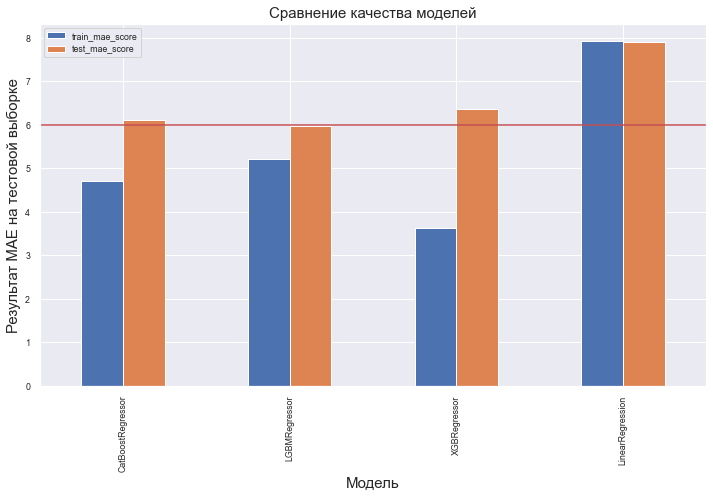

In [144]:
#Посмотрим на графике на результаты MAE на обучающей и тестовой выборках
plt.figure(figsize=(10, 7))
plt.subplot(111)
results.plot(kind='bar', ax=plt.gca()).hlines(6, -1, 5, color = 'r')
plt.xlabel('Модель', fontsize=15)
plt.ylabel('Результат MAE на тестовой выборке', fontsize=15)
plt.title('Сравнение качества моделей', fontsize=15)
plt.tight_layout()

Вывод:

- Провели подбор параметров к 4м моделям CatBoost, LightGBM, XGboost и LinearRegression
- Наилучшие результаты получили у LightGBM  с результатом 5.96 на тестовой выборке
- У CatBoost и XGBoost по ~6 MAE на тестовой выборке
- Хуже всего показала результат модель LinearRegression с результатом 7.9 на тестовой выборке

### Финальная модель на тестовой выборке с наилучшими параметрами

In [148]:
#С подобранными параметрами будем использовать модель CatBoost на тестовой выборке
model = lgb.LGBMRegressor(boosting_type = 'goss',
                          max_depth=3, 
                          learning_rate = 0.03, 
                          metric = 'mae', 
                          n_estimators = 500, 
                          random_state = 12345,
                          objective = 'regression')

model.fit(features_train,target_train)
predictions = model.predict(features_test)
print('MAE на тестовой выборке:', mean_absolute_error(predictions,target_test))

MAE на тестовой выборке: 5.963456987067106


### Feature Importance

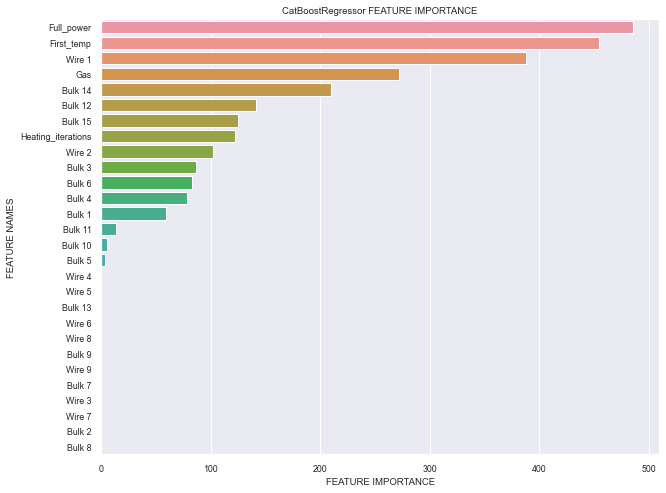

In [149]:
#Посмотрим feature importance у модели lightgbm
ds.plot_feature_importance(model.feature_importances_,features_test.columns,'CatBoostRegressor ')

Мы провели финальное тестирование нашей модели. Модель показала результат MAE 5.8 на тестовой выборке, что соответствует условию решения задачи. Также модель предсказывает лучше, чем наивная модель со средними значениями. 

## Общий вывод

- Мы провели Исследовательский анализ данных 
- Обработали пропуски и выбросы, которые выявили в таблицах
- Добавили несколько новых признаков для нашей модели
- Провели масштабирование признаков
- Для обучения использовали 4 модели : CatBoostRegressor, LightGBMRegressor, XGboostRegressor, LinearRegression
- Провели подбор гиперпараметров с помощью GridSearchCV
- Набрали наилучший результат MAE 5.8 на тестовой выборке CatBoostRegressor
- Так же выявили признаки, которые больше всего влияют на модель это Начальная температура, Полная мощность и Wire 1